<a href="https://colab.research.google.com/github/15483114/teste-rotas-aereas/blob/main/teste_ds.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Cientista de Dados jr

https://www.anac.gov.br/acesso-a-informacao/dados-abertos/areas-de-atuacao/voos-e-operacoes-aereas/dados-estatisticos-do-transporte-aereo/48-dados-estatisticos-do-transporte-aereo

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Dos dados disponíveis em https://sistemas.anac.gov.br/dadosabertos/Voos%20e%20operações%20aéreas/Dados%20Estatísticos%20do%20Transporte%20Aéreo/, faça uma análise completa visando responder as seguintes perguntas e também um completo e profundo entendimento do dataset:

1) Qual companhia aérea possui maior quantidade de passageiros vendidos? Isso vale para todos os anos?

2) Qual tipo de modelo poderia prever a quantidade de passageiros que uma determinada empresa terá no próximo mês? Apresente o modelo citado com seus resultados e interpretações.

3) Cada empresa possui diversas rotas (AEROPORTO DE ORIGEM -> AEROPORTO DE DESTINO). Escolha 1 rota da GOL (Empresa = GLO) e faça um modelo para prever a quantidade de passageiros para os próximos 12 meses. Como se comportam as previsões?

4) Existem erros no dataset? Se sim, quais e por que? Se não, por que você acha que o dataset está perfeito?  

5) A quantidade de passagens vendidas por cada empresa em uma mesma rota é comparável? Explique.

6) Faça uma comparação entre o modelo e previsões de uma mesma rota para 2 empresas diferentes.

7) Comente e apresente os melhores insights que você encontrou no dataset.

8) Deixa uma analise estatistica preparada para a apresentação.

# **Importando dados**

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# caminho para o arquivo CSV
caminho_arquivo = '/content/drive/MyDrive/Colab Notebooks/darede/Dados_Estatisticos (2).csv'

# leitura do arquivo CSV com Pandas
df = pd.read_csv(caminho_arquivo, skiprows=[0], sep=';')

In [ ]:
df

,EMPRESA_SIGLA,EMPRESA_NOME,EMPRESA_NACIONALIDADE,ANO,MES,AEROPORTO_DE_ORIGEM_SIGLA,AEROPORTO_DE_ORIGEM_NOME,AEROPORTO_DE_ORIGEM_UF,AEROPORTO_DE_ORIGEM_REGIAO,AEROPORTO_DE_ORIGEM_PAIS,...,DISTANCIA_VOADA_KM,DECOLAGENS,CARGA_PAGA_KM,CARGA_GRATIS_KM,CORREIO_KM,ASSENTOS,PAYLOAD,HORAS_VOADAS,BAGAGEM_KG,rotas
0,AAL,"AMERICAN AIRLINES, INC.",ESTRANGEIRA,2000,1,KDFW,"DALLAS & FORT WORTH, TEXAS",NaN,NaN,ESTADOS UNIDOS DA AMÉRICA,...,247320.0,30.0,8.068900e+08,0.0,601812.0,6330.0,1050000.0,"409,08",NaN,"DALLAS & FORT WORTH, TEXAS-GUARULHOS"
1,AAL,"AMERICAN AIRLINES, INC.",ESTRANGEIRA,2000,1,KJFK,"NEW YORK, NEW YORK",NaN,NaN,ESTADOS UNIDOS DA AMÉRICA,...,224141.0,29.0,3.715020e+08,0.0,62094800.0,6119.0,464000.0,"418,1",NaN,"NEW YORK, NEW YORK-RIO DE JANEIRO"
2,AAL,"AMERICAN AIRLINES, INC.",ESTRANGEIRA,2000,1,KJFK,"NEW YORK, NEW YORK",NaN,NaN,ESTADOS UNIDOS DA AMÉRICA,...,222256.0,29.0,1.494460e+09,0.0,15174700.0,6119.0,1015000.0,"411,5",NaN,"NEW YORK, NEW YORK-GUARULHOS"
3,AAL,"AMERICAN AIRLINES, INC.",ESTRANGEIRA,2000,1,KMIA,"MIAMI, FLORIDA",NaN,NaN,ESTADOS UNIDOS DA AMÉRICA,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"MIAMI, FLORIDA-CONFINS"
4,AAL,"AMERICAN AIRLINES, INC.",ESTRANGEIRA,2000,1,KMIA,"MIAMI, FLORIDA",NaN,NaN,ESTADOS UNIDOS DA AMÉRICA,...,208227.0,31.0,8.119980e+08,46495100.0,230689000.0,6541.0,1077000.0,"491,8",NaN,"MIAMI, FLORIDA-RIO DE JANEIRO"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
966161,UPS,UPS - UNITED PARCEL SERVICE CO.,ESTRANGEIRA,2023,3,SEQM,QUITO,NaN,NaN,EQUADOR,...,43320.0,15.0,1.509480e+09,0.0,0.0,0.0,825000.0,"59,334",0.0,"QUITO-MIAMI, FLORIDA"
966162,VVC,VIVA AIR - FAST COLOMBIA,ESTRANGEIRA,2023,1,SBGR,GUARULHOS,SP,SUDESTE,BRASIL,...,91040.0,20.0,0.000000e+00,0.0,0.0,3460.0,297460.0,"206,983",0.0,GUARULHOS-MEDELLÍN/RIONEGRO
966163,VVC,VIVA AIR - FAST COLOMBIA,ESTRANGEIRA,2023,1,SKRG,MEDELLÍN/RIONEGRO,NaN,NaN,COLÔMBIA,...,91040.0,20.0,0.000000e+00,0.0,0.0,3600.0,289760.0,"39,65",0.0,MEDELLÍN/RIONEGRO-GUARULHOS
966164,VVC,VIVA AIR - FAST COLOMBIA,ESTRANGEIRA,2023,2,SBGR,GUARULHOS,SP,SUDESTE,BRASIL,...,81936.0,18.0,0.000000e+00,0.0,0.0,3114.0,267714.0,"185,117",0.0,GUARULHOS-MEDELLÍN/RIONEGRO


In [ ]:
df['AEROPORTO_DE_ORIGEM_NOME'].value_counts()

GUARULHOS               82392
RIO DE JANEIRO          66085
CAMPINAS                45184
BRASÍLIA                42977
SÃO PAULO               36401
                        ...  
LARANJAL DO JARI            1
MEROWE                      1
STUTTGART                   1
MEDFORD, WISCONSIN          1
SAN JOSE, CALIFORNIA        1
Name: AEROPORTO_DE_ORIGEM_NOME, Length: 923, dtype: int64

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 966166 entries, 0 to 966165
Data columns (total 38 columns):
 #   Column                           Non-Null Count   Dtype  
---  ------                           --------------   -----  
 0   EMPRESA_SIGLA                    966166 non-null  object 
 1   EMPRESA_NOME                     966166 non-null  object 
 2   EMPRESA_NACIONALIDADE            966166 non-null  object 
 3   ANO                              966166 non-null  int64  
 4   MES                              966166 non-null  int64  
 5   AEROPORTO_DE_ORIGEM_SIGLA        960952 non-null  object 
 6   AEROPORTO_DE_ORIGEM_NOME         960952 non-null  object 
 7   AEROPORTO_DE_ORIGEM_UF           827939 non-null  object 
 8   AEROPORTO_DE_ORIGEM_REGIAO       827939 non-null  object 
 9   AEROPORTO_DE_ORIGEM_PAIS         960952 non-null  object 
 10  AEROPORTO_DE_ORIGEM_CONTINENTE   960952 non-null  object 
 11  AEROPORTO_DE_DESTINO_SIGLA       966166 non-null  object 
 12  AE

In [ ]:
# Vendo a matriz de correlação após tratamento

import plotly.express as px
fig = px.imshow(df.corr())
fig.show()

<ipython-input-8-fb3de89013c4>:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  fig = px.imshow(df.corr())


Companhia vs passageiros pagos

In [ ]:
passageiros_pagos_por_empresa = df.groupby('EMPRESA_NOME')['PASSAGEIROS_PAGOS'].sum()

In [ ]:
passageiros_pagos_por_empresa = df.groupby('EMPRESA_NOME')['PASSAGEIROS_PAGOS'].sum()
passageiros_pagos_por_empresa.sort_values()

EMPRESA_NOME
21 AIR, LLC                                                    0.0
LÍNEAS AÉREAS SURAMERICANAS LAS                                0.0
LÍNEA AÉREA CARGUEIRA DE COLOMBIA S.A - LANCO                  0.0
LYNDEN AIR CARGO, LLC                                          0.0
LUFTHANSA CARGO AG                                             0.0
                                                          ...     
OCEANAIR LINHAS AÉREAS S.A. (AVIANCA)                   72177758.0
VARIG - VIAÇÃO AÉREA RIO-GRANDENSE                      72667422.0
AZUL LINHAS AÉREAS BRASILEIRAS S/A                     240152156.0
GOL LINHAS AÉREAS S.A. (EX- VRG LINHAS AÉREAS S.A.)    516013374.0
TAM LINHAS AÉREAS S.A.                                 589039402.0
Name: PASSAGEIROS_PAGOS, Length: 297, dtype: float64

In [ ]:
coiso = df.groupby('EMPRESA_NOME')

In [ ]:
import numpy as np

# retorna uma lista com os nomes únicos
nomes_unicos = df['EMPRESA_NOME'].unique()

# converte a lista em um array
array_nomes_unicos = np.array(nomes_unicos)

In [ ]:
df[df['EMPRESA_NOME']=='TAM LINHAS AÉREAS S.A.'].isnull().mean().round(4)*100

EMPRESA_SIGLA                       0.00
EMPRESA_NOME                        0.00
EMPRESA_NACIONALIDADE               0.00
ANO                                 0.00
MES                                 0.00
AEROPORTO_DE_ORIGEM_SIGLA           0.00
AEROPORTO_DE_ORIGEM_NOME            0.00
AEROPORTO_DE_ORIGEM_UF              6.51
AEROPORTO_DE_ORIGEM_REGIAO          6.51
AEROPORTO_DE_ORIGEM_PAIS            0.00
AEROPORTO_DE_ORIGEM_CONTINENTE      0.00
AEROPORTO_DE_DESTINO_SIGLA          0.00
AEROPORTO_DE_DESTINO_NOME           0.00
AEROPORTO_DE_DESTINO_UF             6.03
AEROPORTO_DE_DESTINO_REGIAO         6.03
AEROPORTO_DE_DESTINO_PAIS           0.00
AEROPORTO_DE_DESTINO_CONTINENTE     0.00
NATUREZA                            0.00
GRUPO_DE_VOO                        0.00
PASSAGEIROS_PAGOS                   0.01
PASSAGEIROS_GRATIS                  0.01
CARGA_PAGA_KG                       0.01
CARGA_GRATIS_KG                     0.01
CORREIO_KG                          0.01
ASK             

# **1) Qual companhia aérea possui maior quantidade de passageiros vendidos? Isso vale para todos os anos?**

In [ ]:
df['PASSAGEIROS_PAGOS'].describe()

count    920688.000000
mean       1985.127221
std        4543.968097
min           0.000000
25%           0.000000
50%         203.000000
75%        1863.000000
max       92357.000000
Name: PASSAGEIROS_PAGOS, dtype: float64

In [ ]:
df[df['PASSAGEIROS_PAGOS'] == 92357.000000]

,EMPRESA_SIGLA,EMPRESA_NOME,EMPRESA_NACIONALIDADE,ANO,MES,AEROPORTO_DE_ORIGEM_SIGLA,AEROPORTO_DE_ORIGEM_NOME,AEROPORTO_DE_ORIGEM_UF,AEROPORTO_DE_ORIGEM_REGIAO,AEROPORTO_DE_ORIGEM_PAIS,...,COMBUSTIVEL_LITROS,DISTANCIA_VOADA_KM,DECOLAGENS,CARGA_PAGA_KM,CARGA_GRATIS_KM,CORREIO_KM,ASSENTOS,PAYLOAD,HORAS_VOADAS,BAGAGEM_KG
863153,TAM,TAM LINHAS AÉREAS S.A.,BRASILEIRA,2019,12,SBSP,SÃO PAULO,SP,SUDESTE,BRASIL,...,1752280.0,256566.0,701.0,27717900.0,2883350.0,0.0,107394.0,11603900.0,"694,671",333425.0


In [ ]:
passageiros_pagos_por_empresa = df.groupby('EMPRESA_NOME')['PASSAGEIROS_PAGOS'].sum()
passageiros_pagos_por_empresa.sort_values()

EMPRESA_NOME
21 AIR, LLC                                                    0.0
LÍNEAS AÉREAS SURAMERICANAS LAS                                0.0
LÍNEA AÉREA CARGUEIRA DE COLOMBIA S.A - LANCO                  0.0
LYNDEN AIR CARGO, LLC                                          0.0
LUFTHANSA CARGO AG                                             0.0
                                                          ...     
OCEANAIR LINHAS AÉREAS S.A. (AVIANCA)                   72177758.0
VARIG - VIAÇÃO AÉREA RIO-GRANDENSE                      72667422.0
AZUL LINHAS AÉREAS BRASILEIRAS S/A                     240152156.0
GOL LINHAS AÉREAS S.A. (EX- VRG LINHAS AÉREAS S.A.)    516013374.0
TAM LINHAS AÉREAS S.A.                                 589039402.0
Name: PASSAGEIROS_PAGOS, Length: 297, dtype: float64





AMERICAN AIRLINES, INC.


count     5891.000000
mean      4155.754711
std       4425.989325
min          0.000000
25%        821.500000
50%       2916.000000
75%       5993.000000
max      27671.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


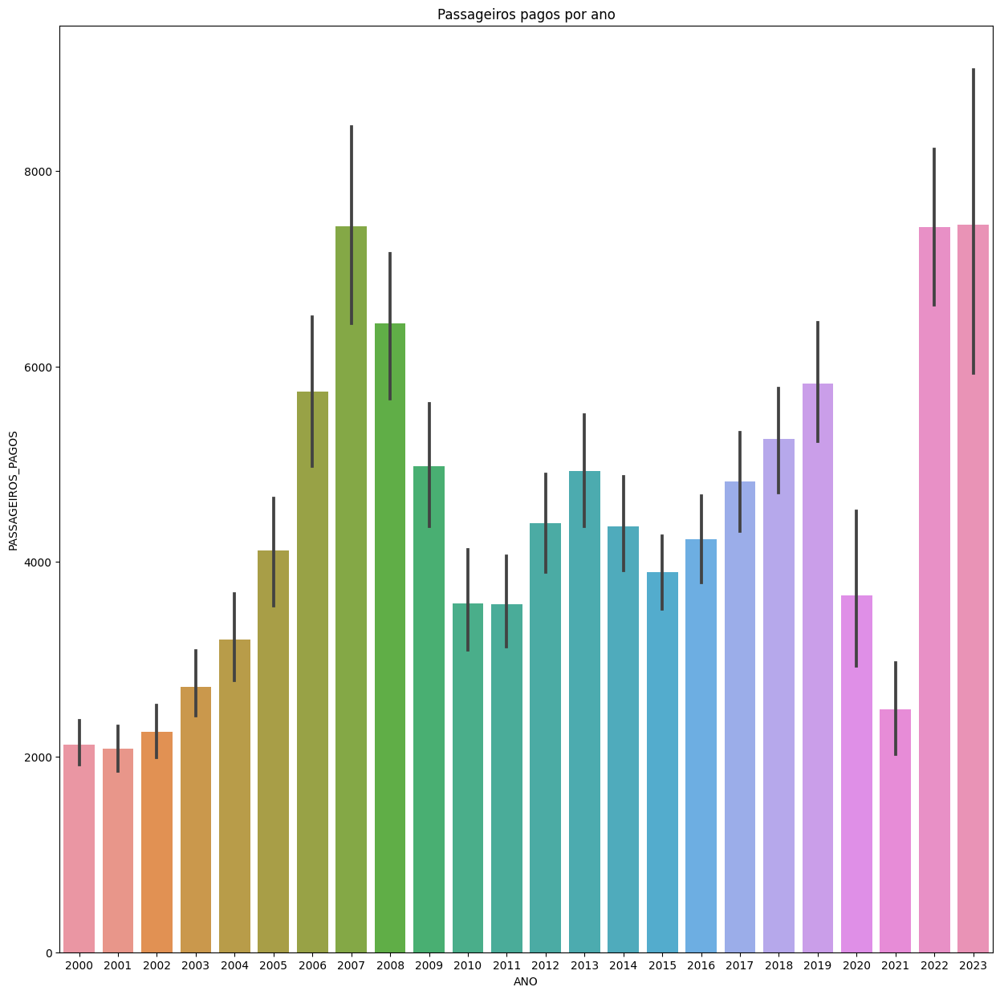





ABAETÉ LINHAS AÉREAS S.A.


count    1464.000000
mean       43.642077
std        44.138340
min         0.000000
25%         5.000000
50%        32.000000
75%        71.250000
max       216.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


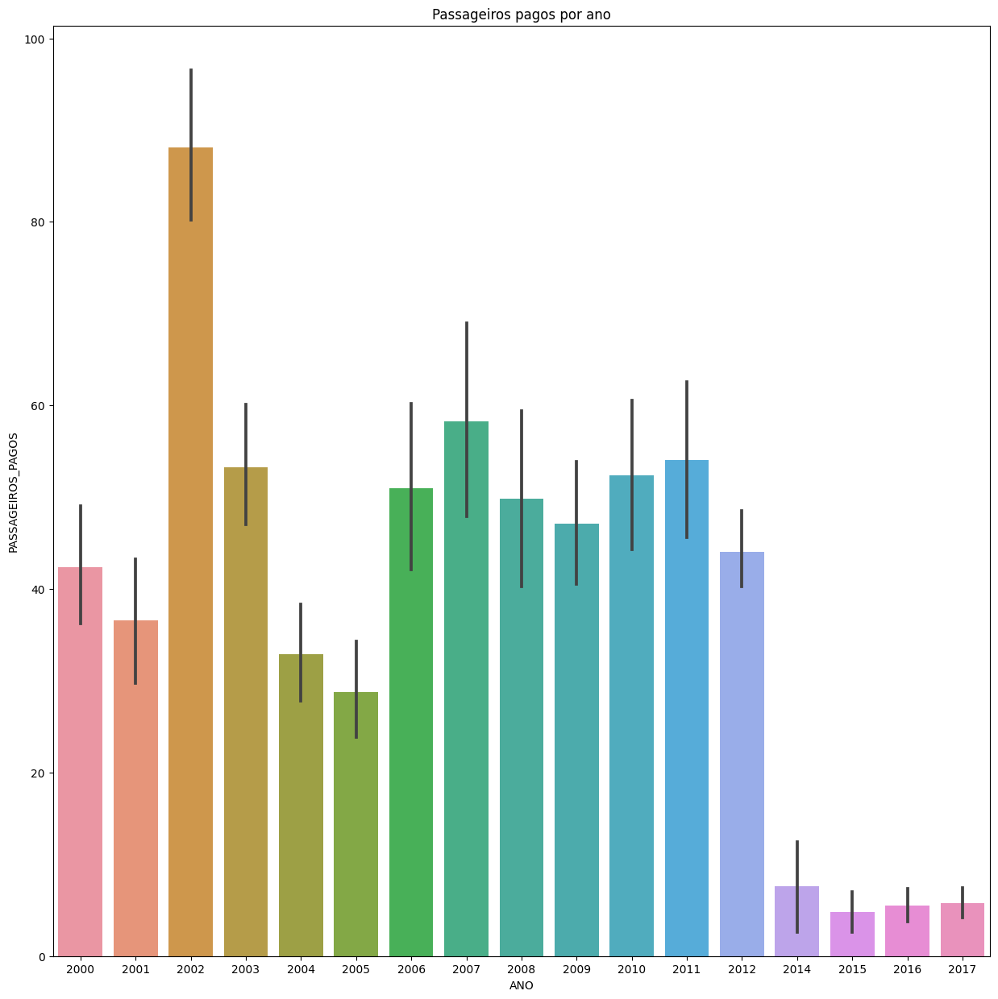

/usr/local/lib/python3.10/dist-packages/seaborn/algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))
/usr/local/lib/python3.10/dist-packages/numpy/lib/nanfunctions.py:1560: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a,






ABAETÉ LINHAS AÉREAS LTDA


count    0.0
mean     NaN
std      NaN
min      NaN
25%      NaN
50%      NaN
75%      NaN
max      NaN
Name: PASSAGEIROS_PAGOS, dtype: float64


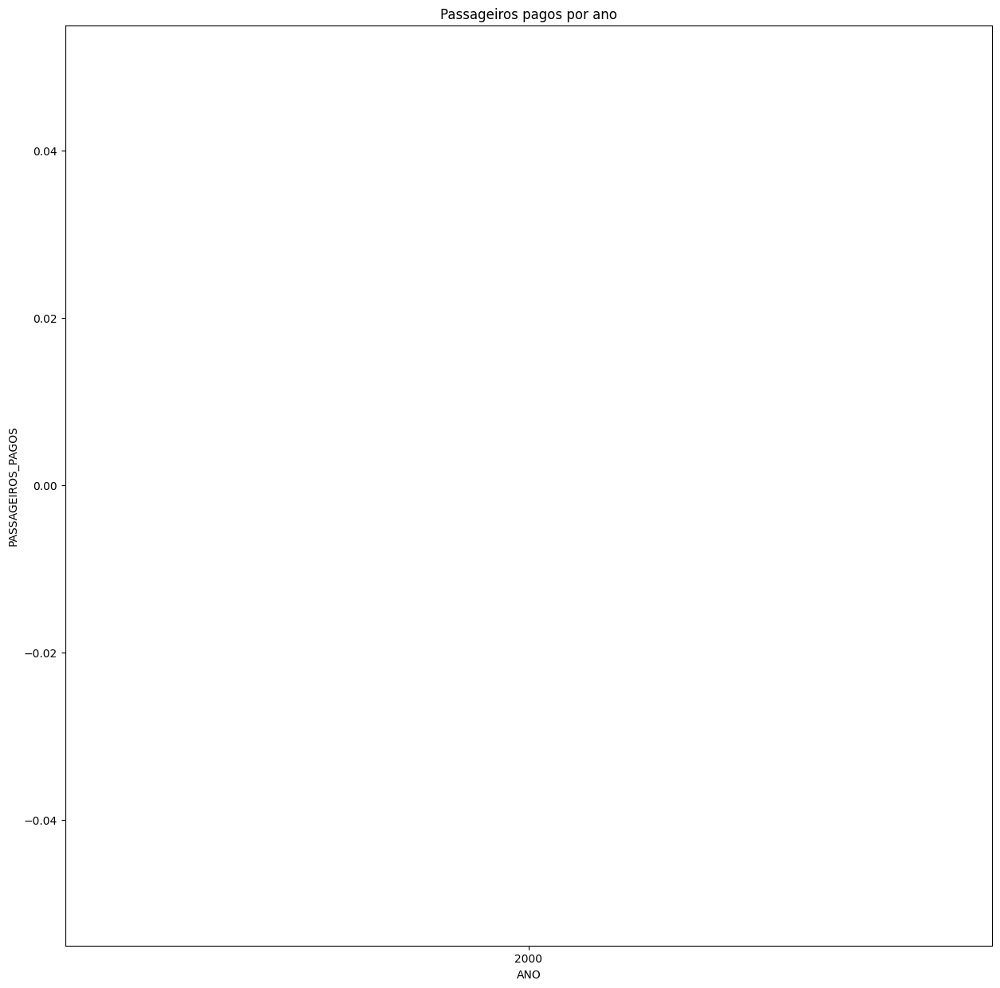





AIR CANADA


count      814.000000
mean      4033.599509
std       2937.559702
min          0.000000
25%       1369.750000
50%       3952.000000
75%       5981.750000
max      13428.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


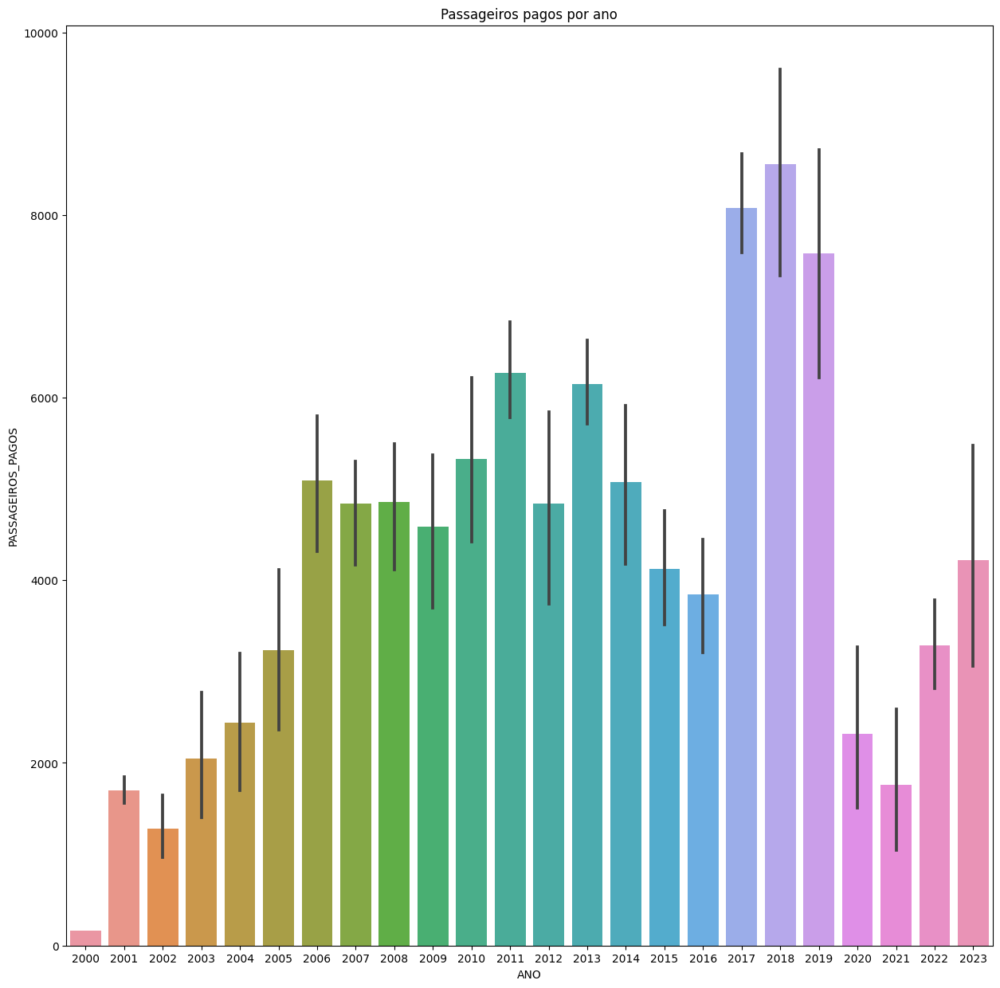





AEROFLOT- AEROLÍNEAS INTERNACIONAIS DA RÚSSIA


count     70.000000
mean     278.871429
std      197.198489
min        0.000000
25%      157.000000
50%      228.500000
75%      375.500000
max      767.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


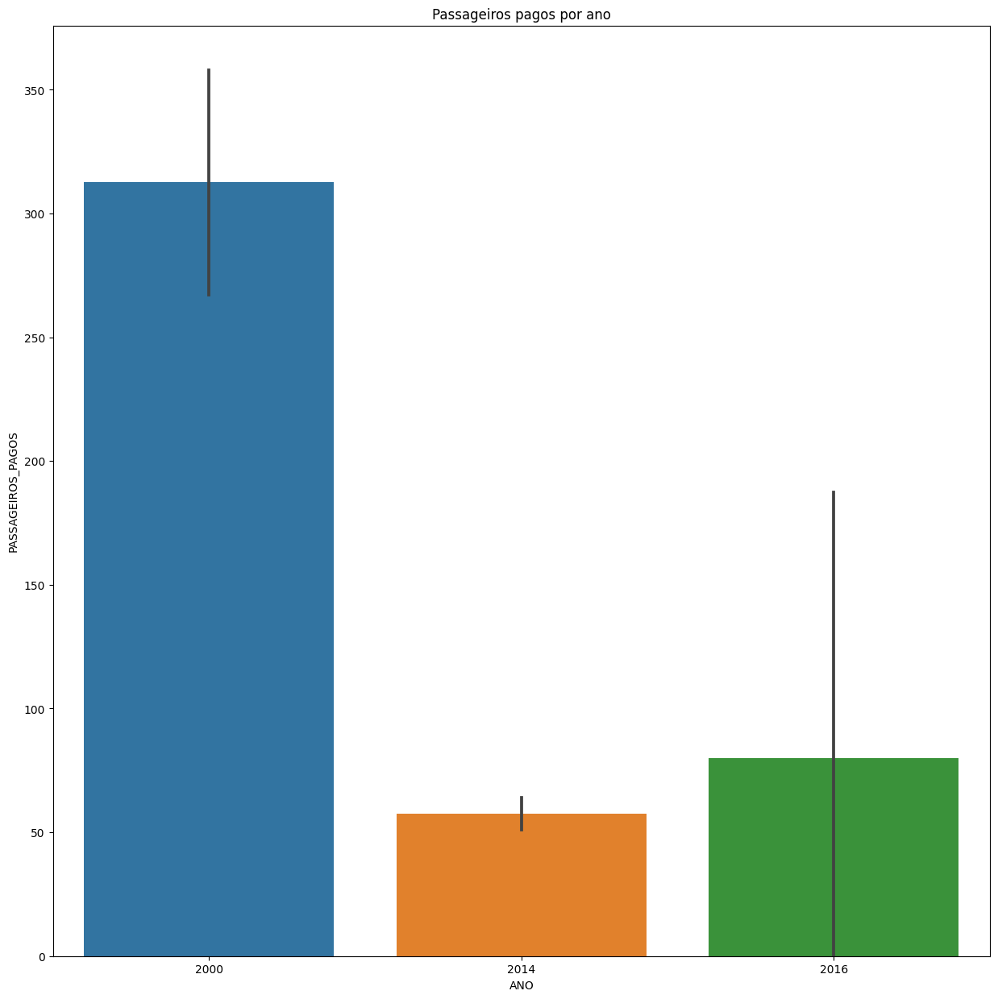





SOCIÉTÉ AIR FRANCE


count     1844.000000
mean      6731.608460
std       6184.522766
min          0.000000
25%          0.000000
50%       5672.000000
75%      12630.750000
max      28699.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


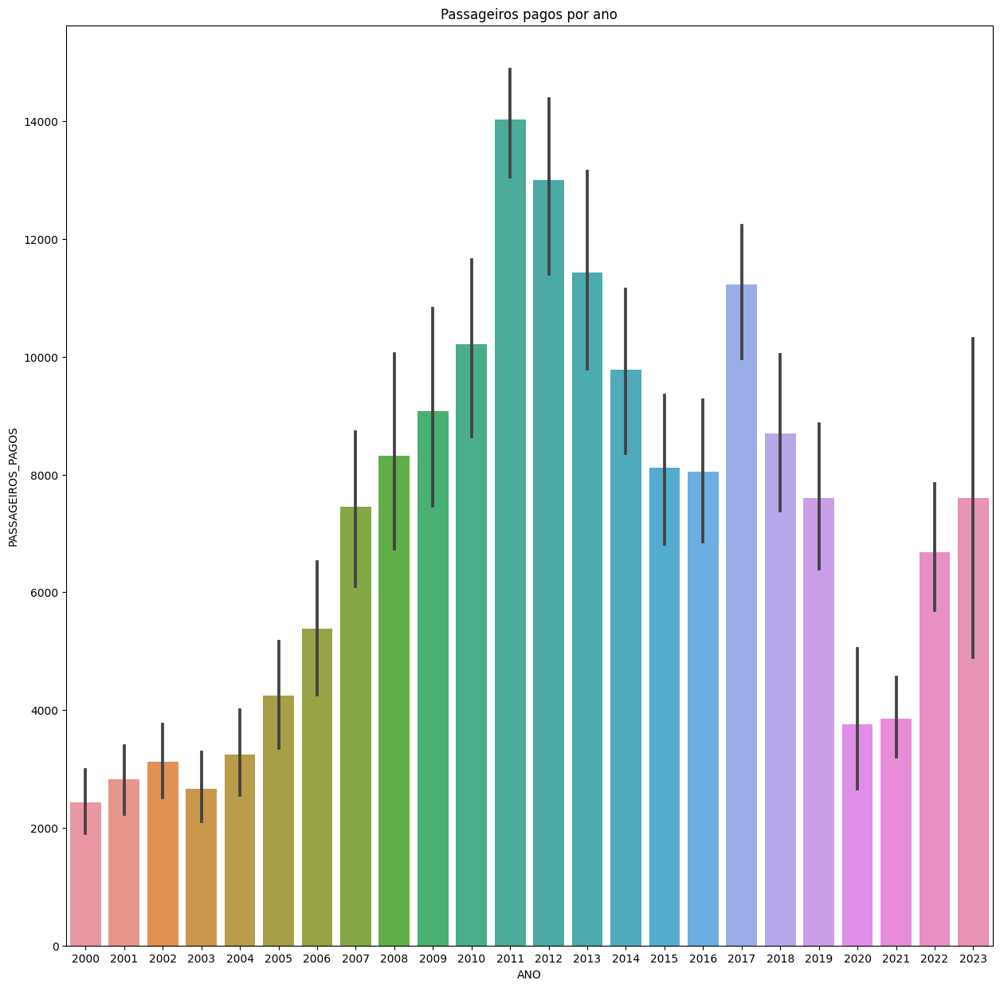





ALAS DE VENEZUELA


count      56.000000
mean      309.160714
std       227.759026
min        16.000000
25%       160.250000
50%       269.000000
75%       422.750000
max      1074.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


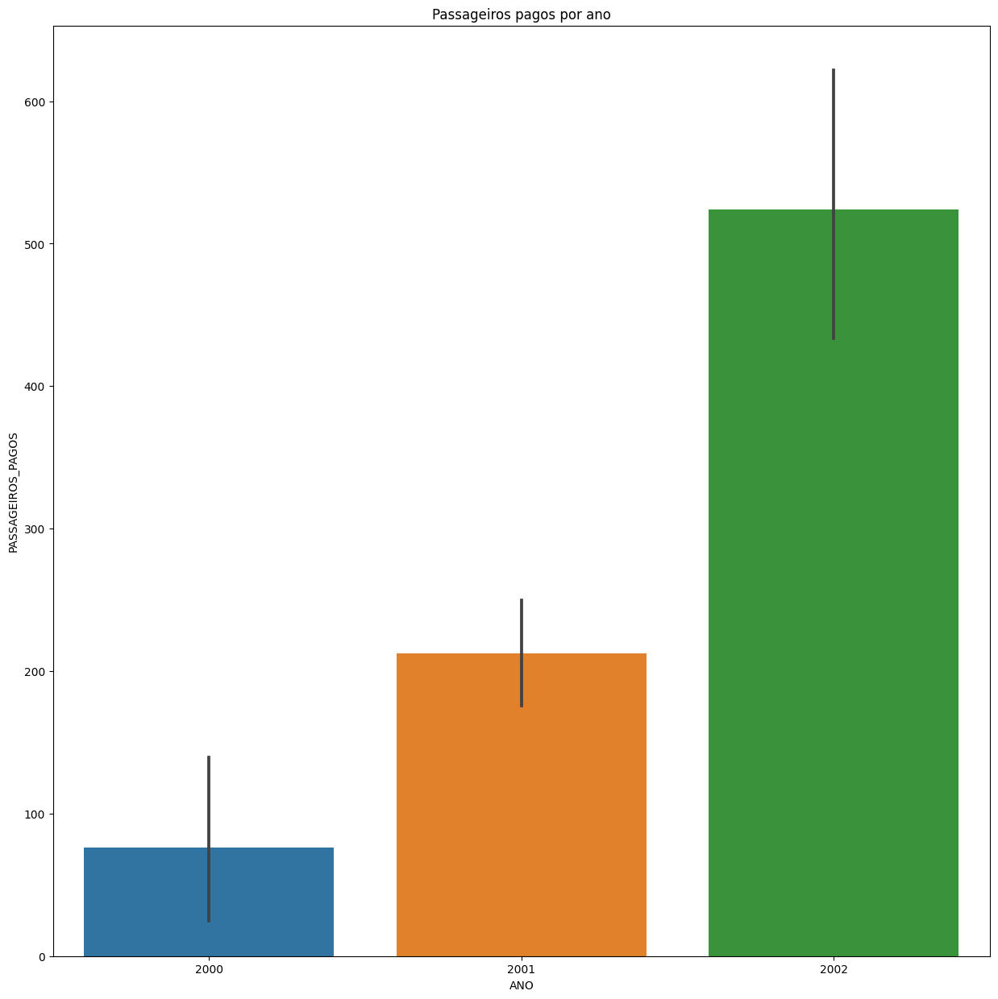





AEROVÍAS DE MÉXICO S.A DE C.V - AEROMÉXICO


count      794.000000
mean      3928.988665
std       3085.828901
min          0.000000
25%        819.750000
50%       3658.500000
75%       6673.250000
max      11701.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


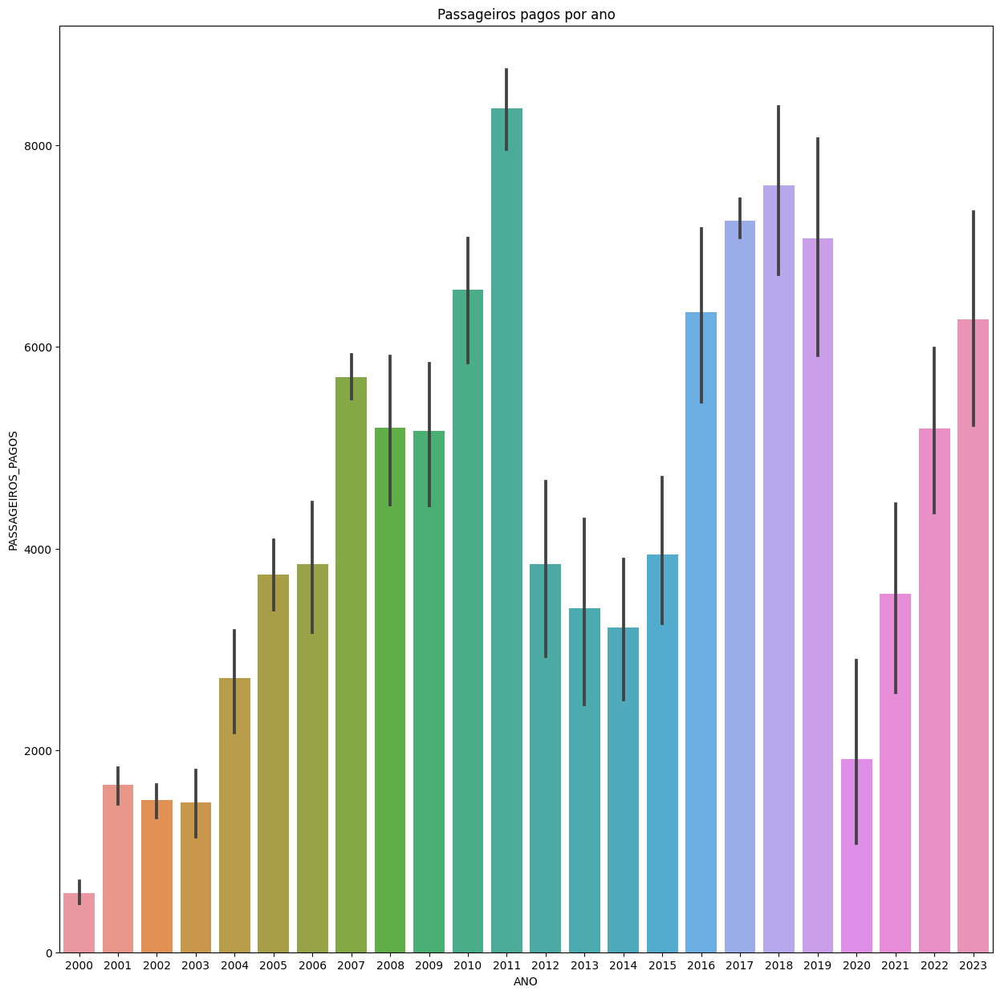





AEROLINEAS ARGENTINAS S/A


count     4672.000000
mean      2525.445205
std       3479.382889
min          0.000000
25%        230.000000
50%        860.000000
75%       3411.500000
max      22192.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


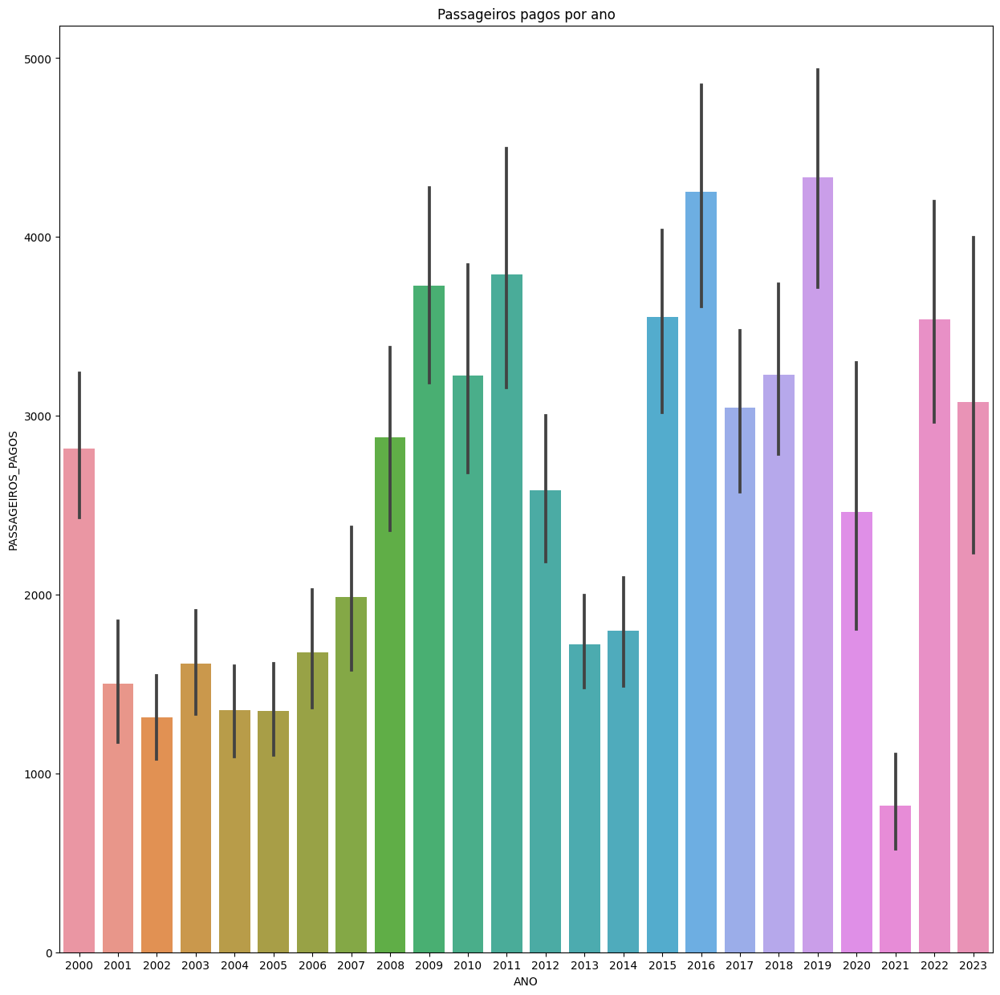





AEROVIAS DEL CONTINENTE AMERICANO S.A. AVIANCA


count      971.000000
mean      4367.893924
std       4167.681962
min          0.000000
25%        745.000000
50%       3325.000000
75%       6592.500000
max      17242.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


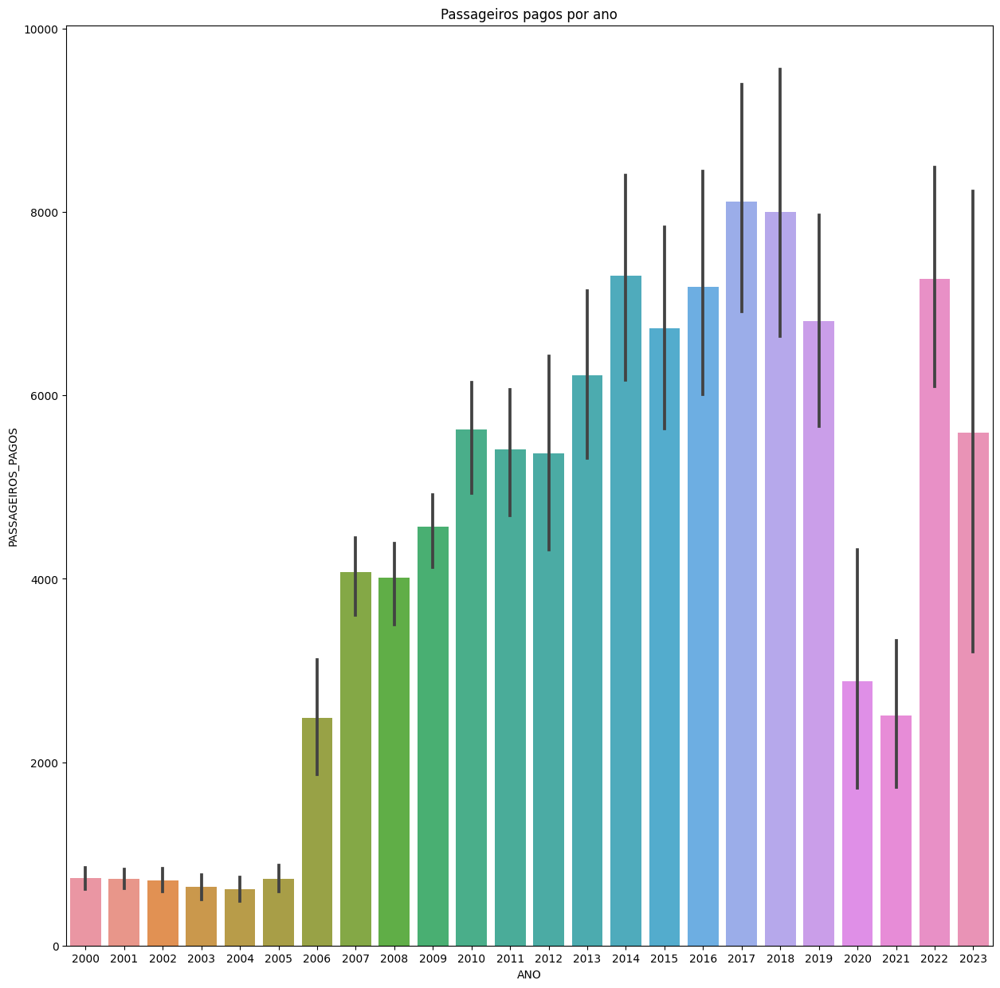





ALITALIA SOCIETA AEREA ITALIANA S.P.A.


count     1174.000000
mean      4349.605622
std       3546.427558
min          0.000000
25%       1266.500000
50%       3809.500000
75%       6982.250000
max      16663.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


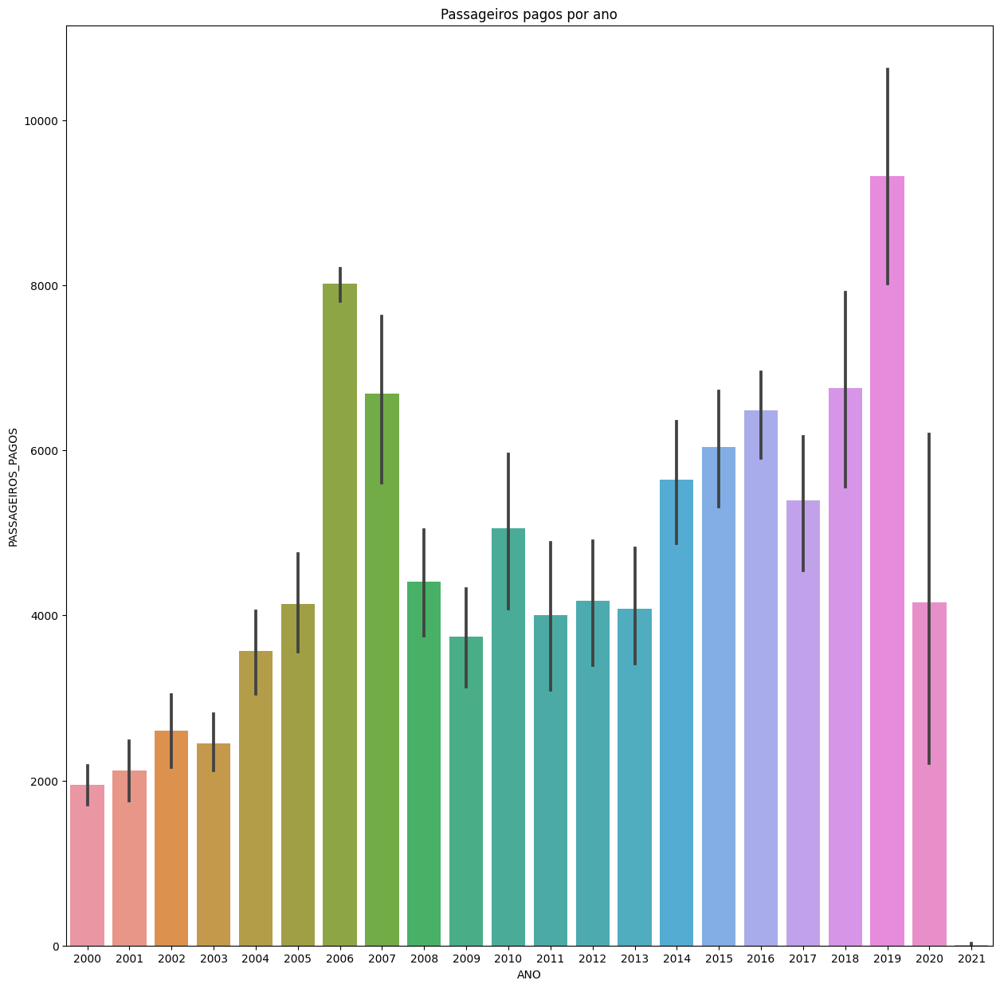





BRITISH AIRWAYS PLC


count     1810.000000
mean      3034.105525
std       2528.460487
min          0.000000
25%       1032.250000
50%       2592.000000
75%       4599.500000
max      12065.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


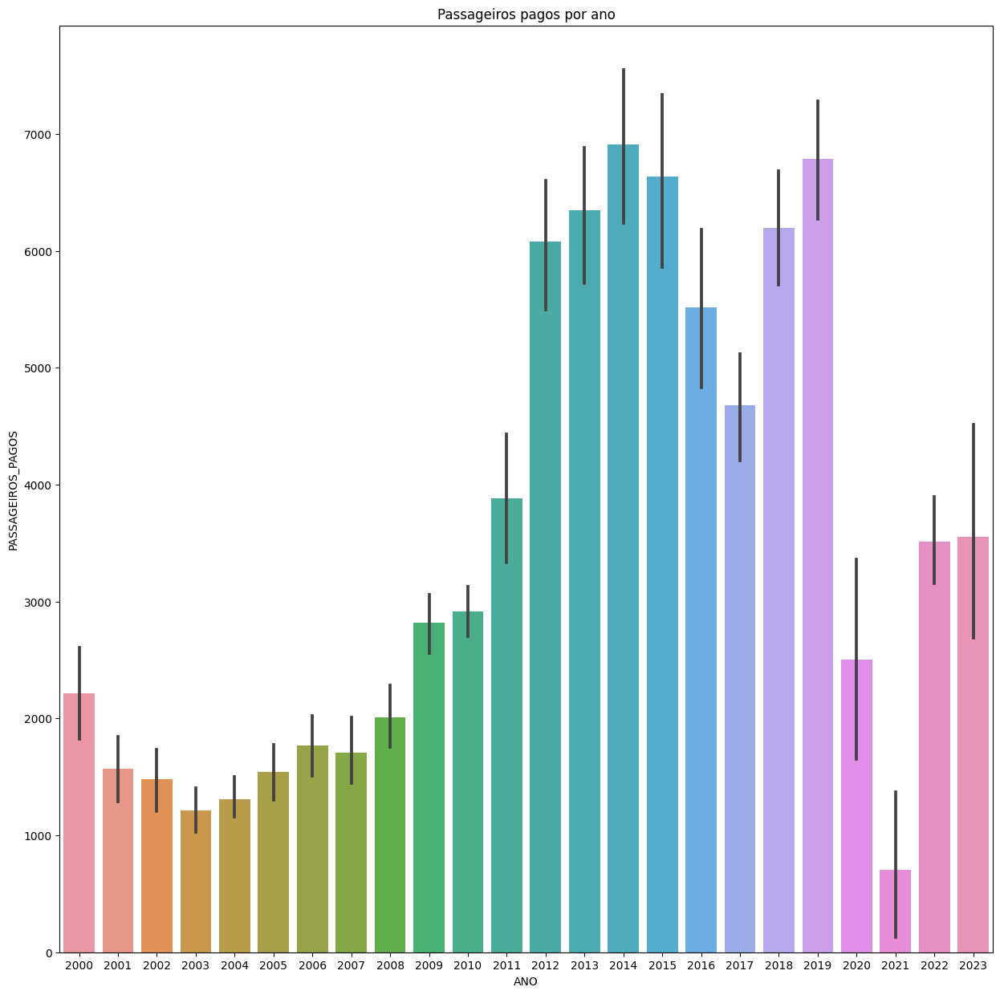





TAM-TRANSPORTE AEREOS MERIDIONAIS


count     6013.000000
mean       635.418759
std       1835.696935
min          0.000000
25%          0.000000
50%         68.000000
75%        493.000000
max      30678.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


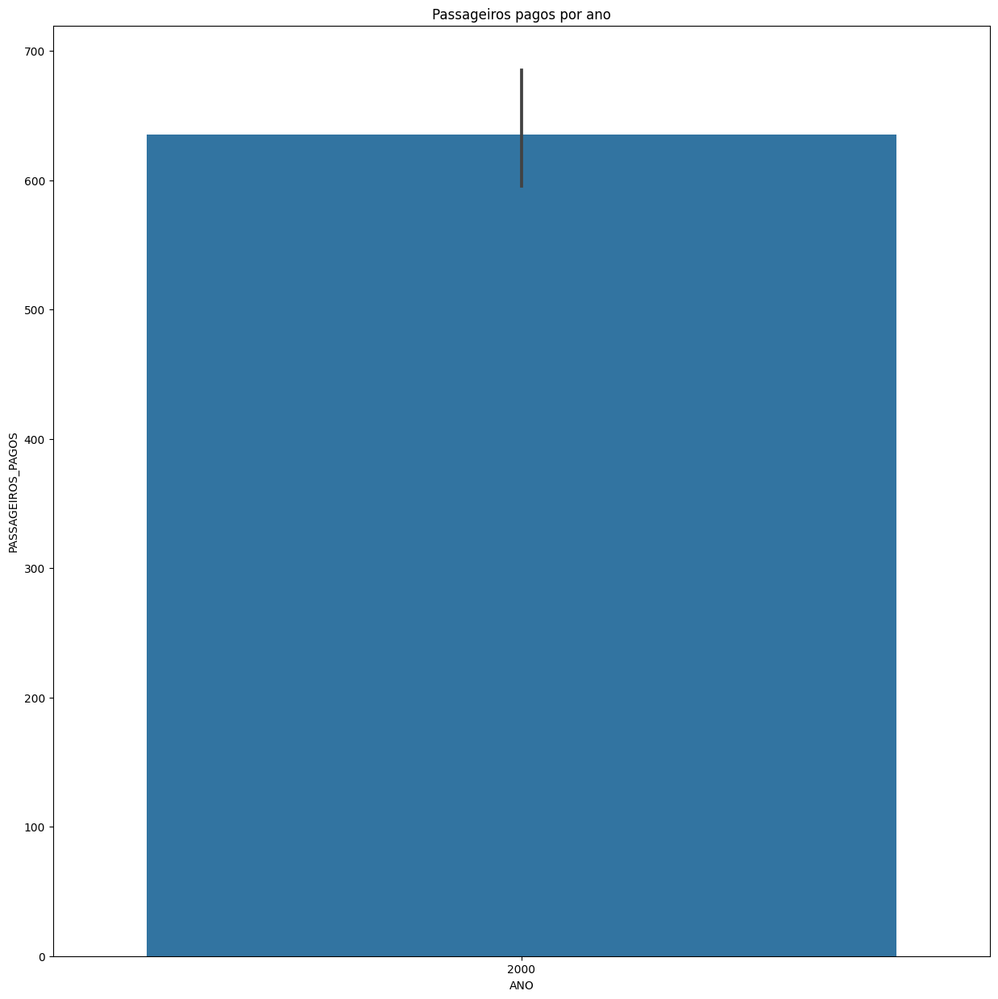





CANADIAN


count      77.000000
mean     1588.974026
std       595.615691
min         0.000000
25%      1180.000000
50%      1544.000000
75%      1953.000000
max      3344.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


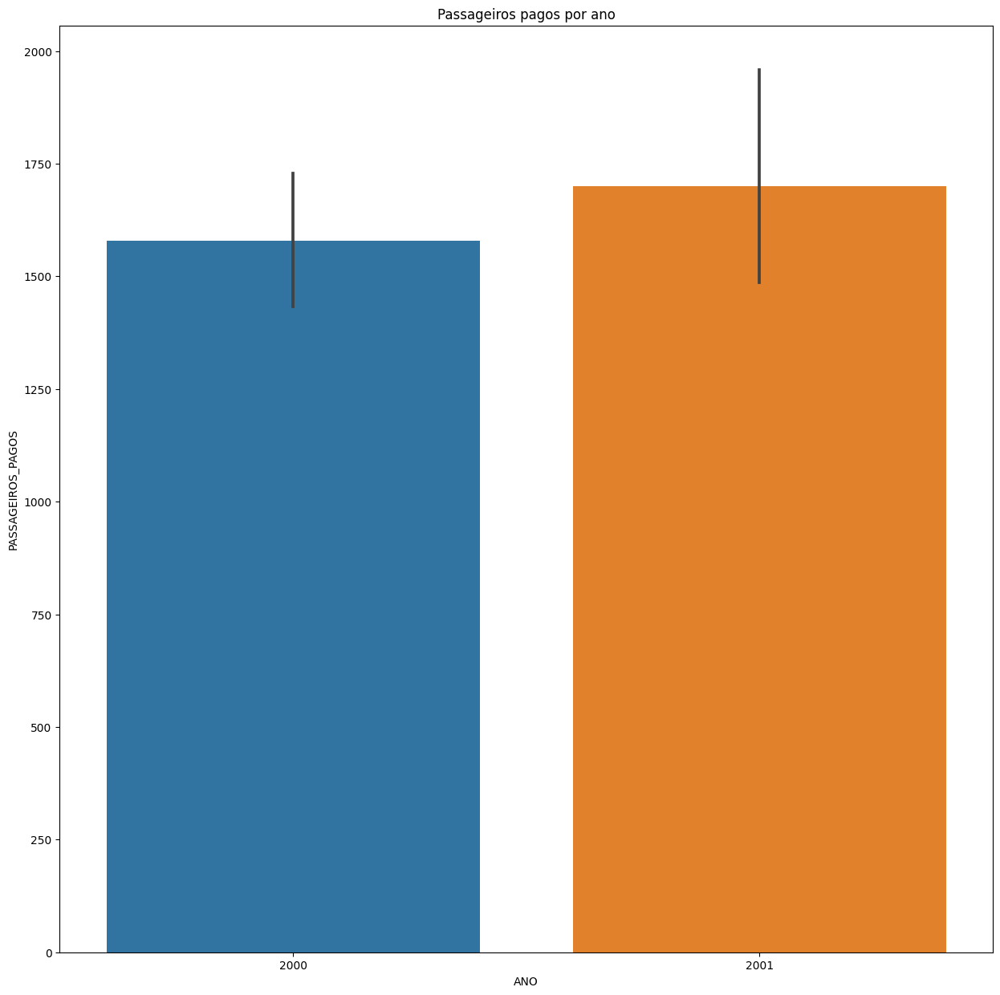





KALITTA AIR LLC


count    165.0
mean       0.0
std        0.0
min        0.0
25%        0.0
50%        0.0
75%        0.0
max        0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


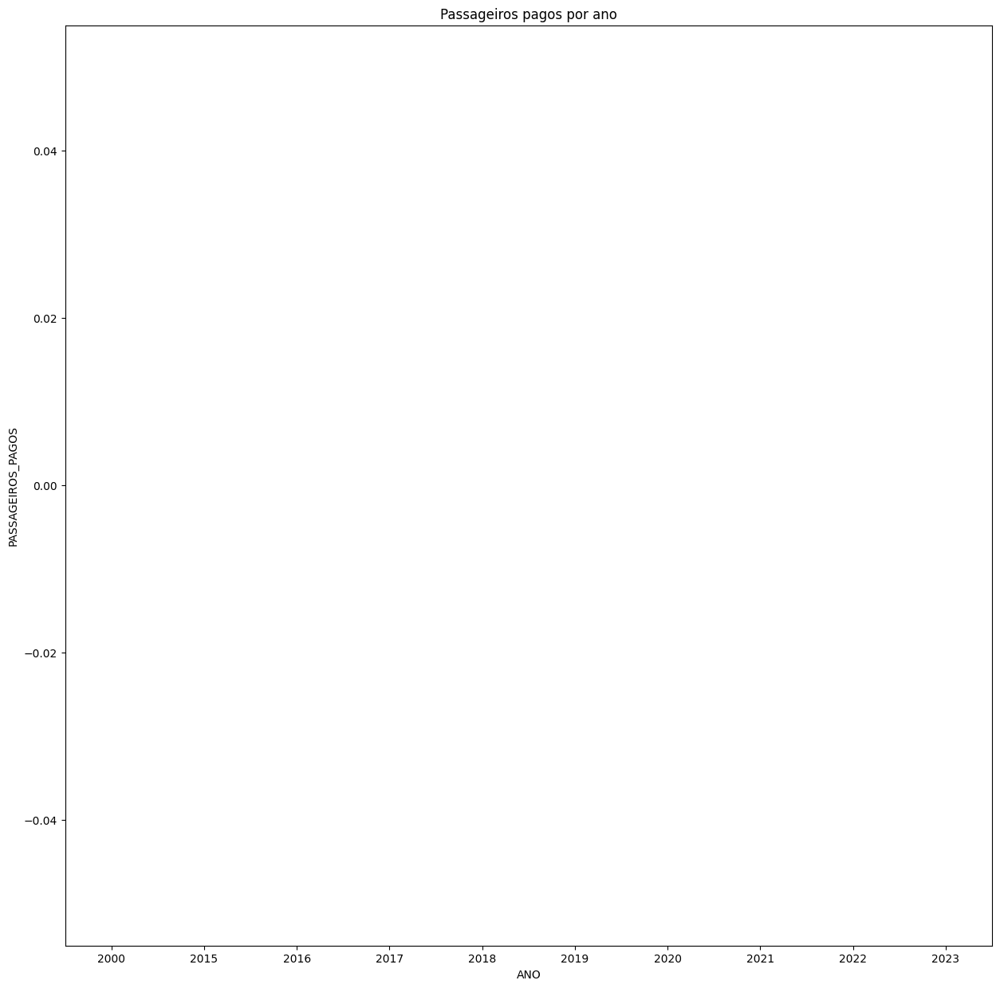





COMPAÑIA PANAMEÑA DE AVIACION S.A. (COPA AIRLINES)


count     2696.000000
mean      4326.609792
std       5096.635743
min          0.000000
25%       1210.000000
50%       2753.000000
75%       4945.000000
max      27591.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


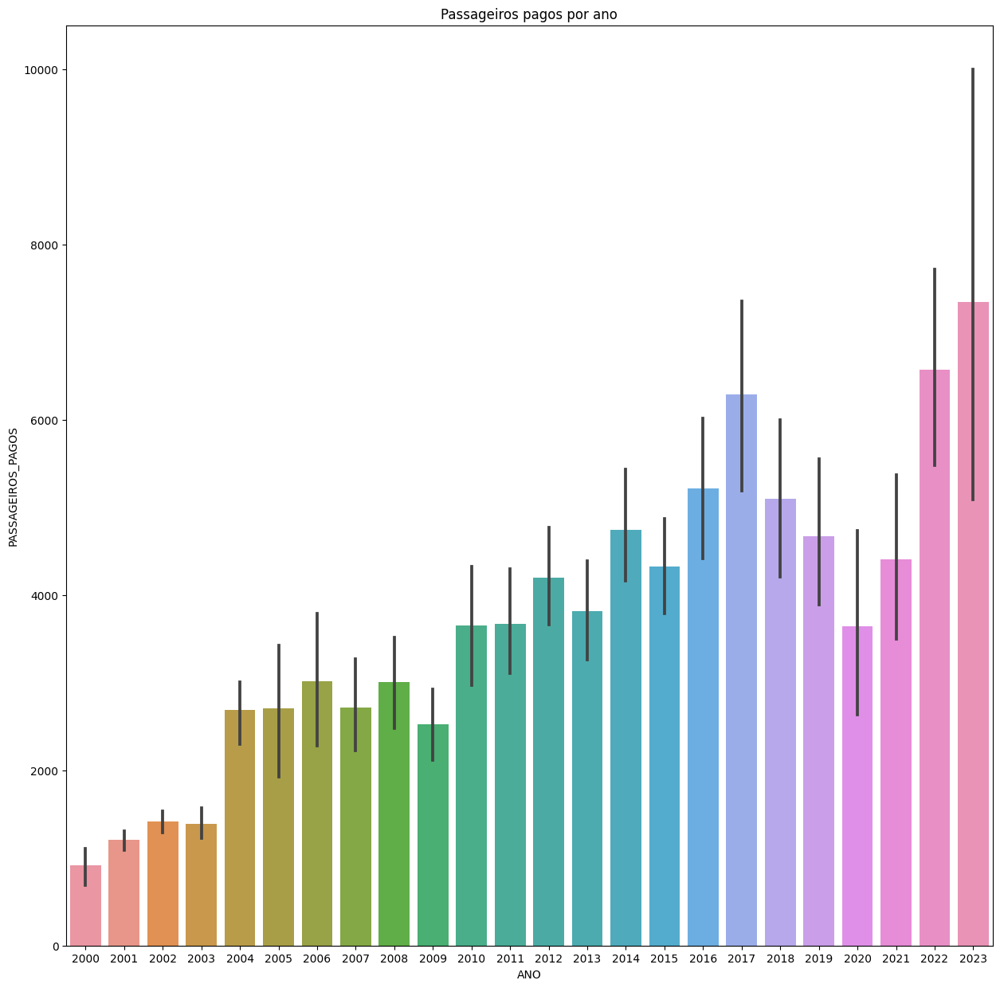





CONTINENTAL AIRLINES


count      823.000000
mean      3802.430134
std       1633.762586
min         22.000000
25%       3257.500000
50%       4037.000000
75%       4659.500000
max      11294.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


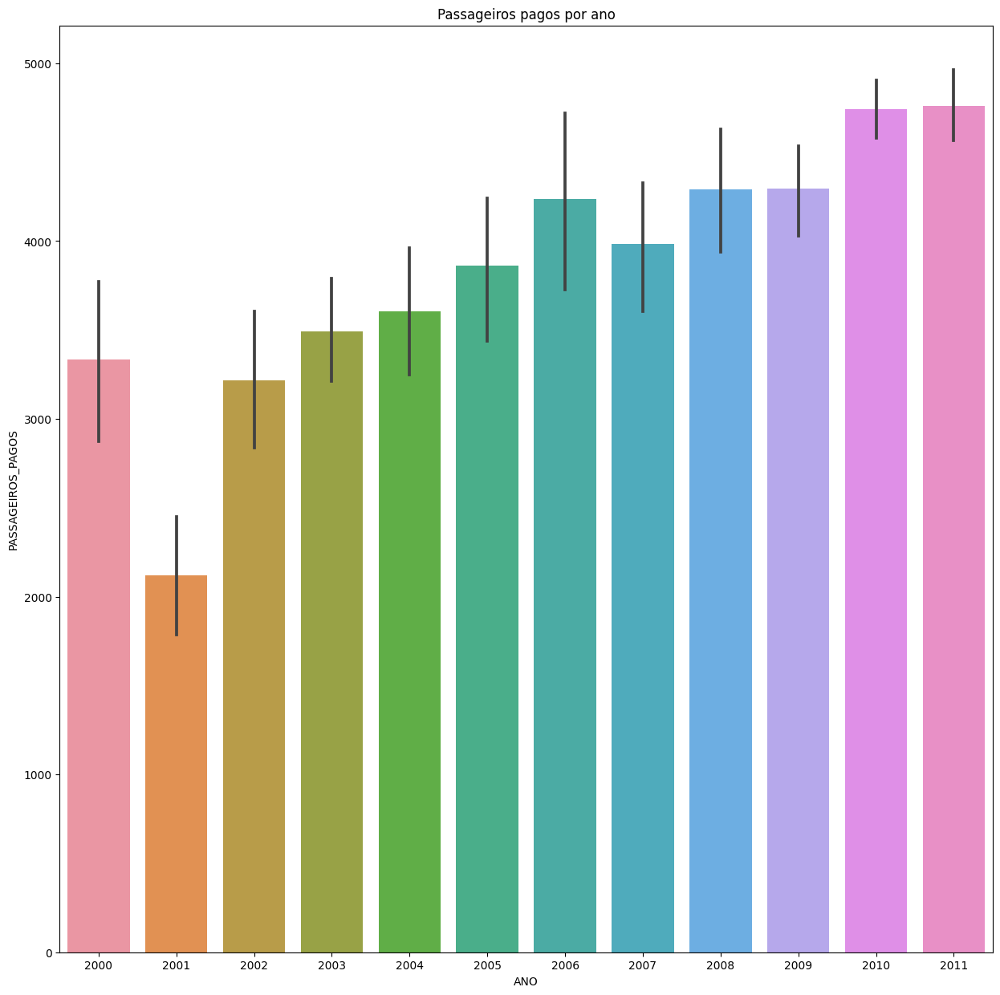





CROSSAIR LTD


count     103.000000
mean     1197.330097
std      1193.744080
min         0.000000
25%        91.500000
50%       812.000000
75%      1897.000000
max      4182.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


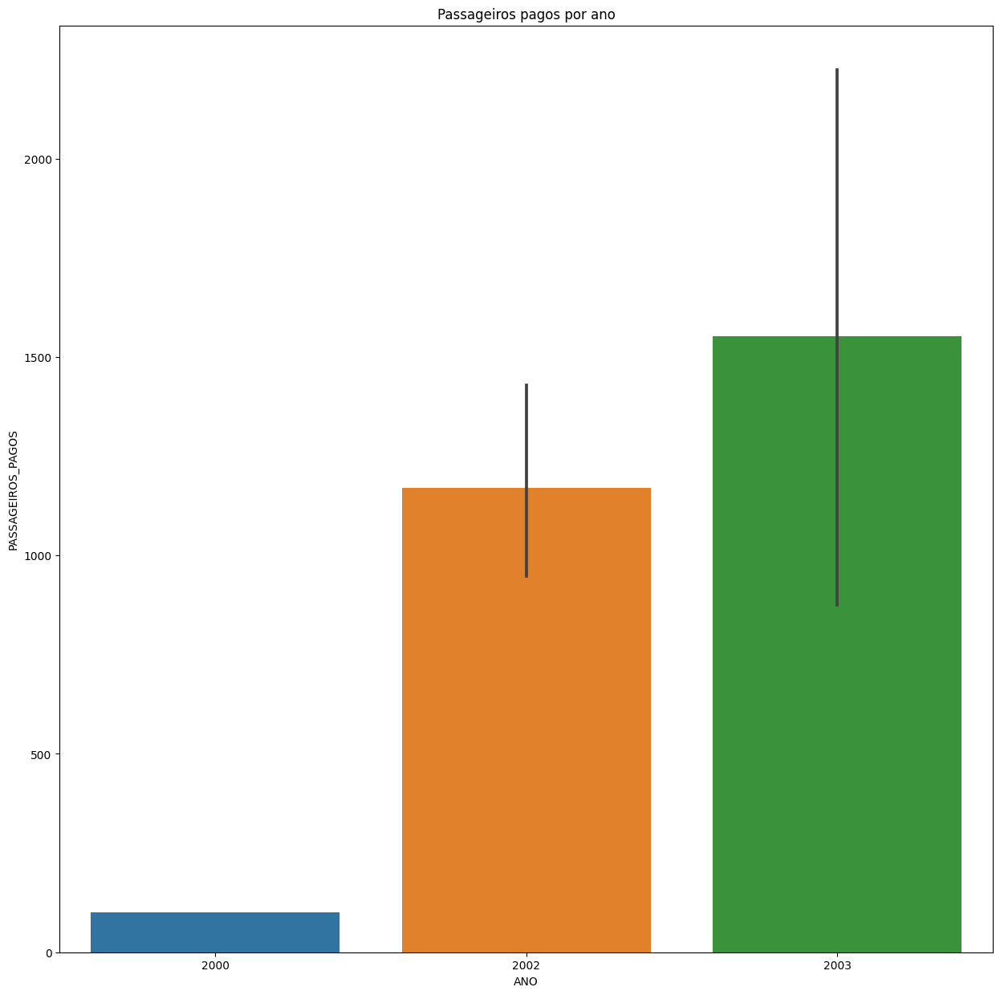





CUBANA DE AVIACION S.A.


count     692.000000
mean      239.410405
std       270.445041
min         0.000000
25%         0.000000
50%       182.000000
75%       393.250000
max      2341.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


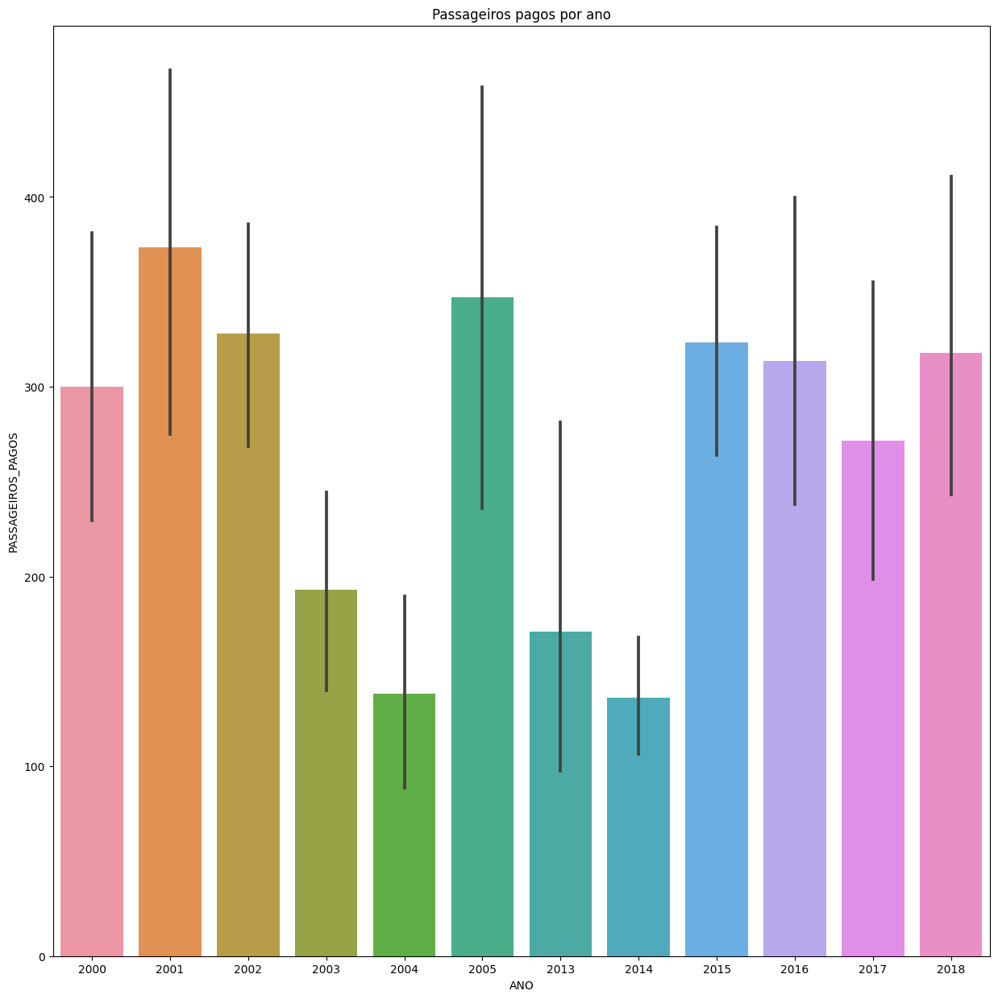





CENTURION AIR CARGO INC.


count    1567.0
mean        0.0
std         0.0
min         0.0
25%         0.0
50%         0.0
75%         0.0
max         0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


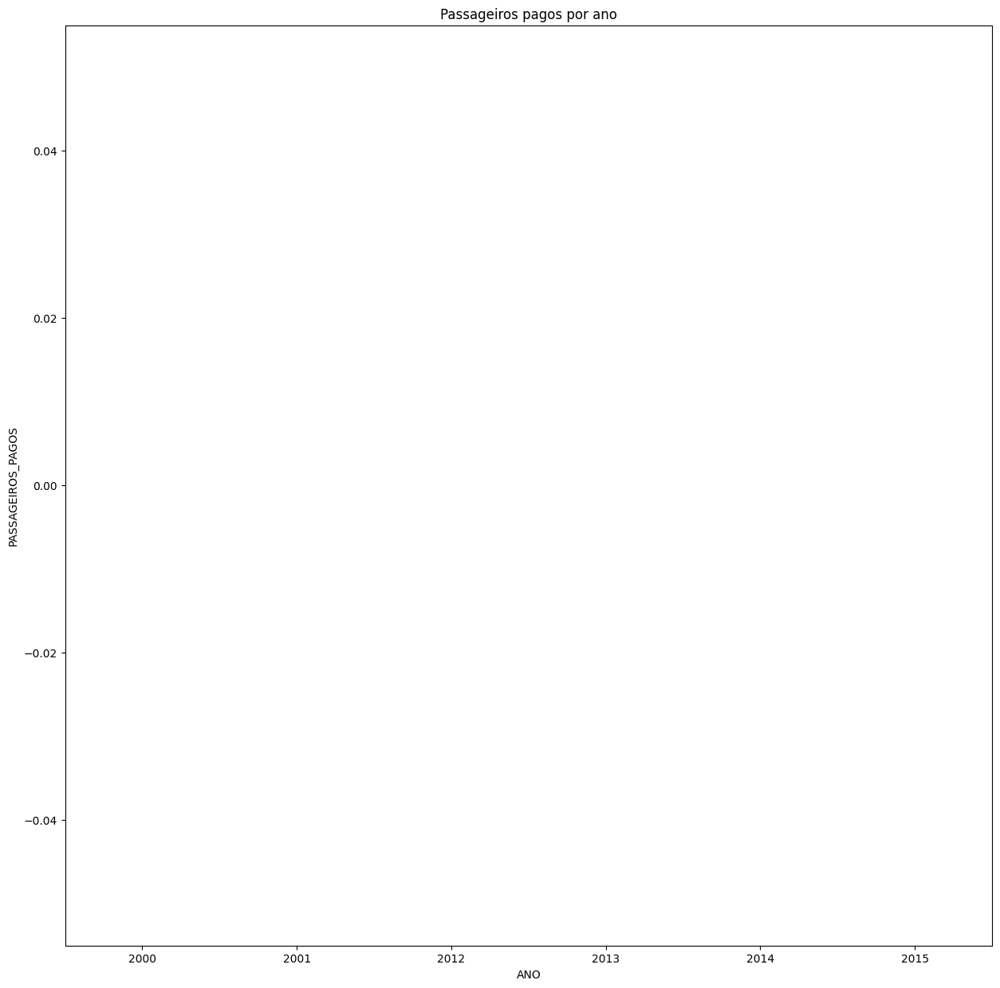





DELTA AIR LINES INC.


count     2391.000000
mean      3961.439147
std       2718.548952
min          0.000000
25%       1369.000000
50%       4490.000000
75%       5930.500000
max      14553.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


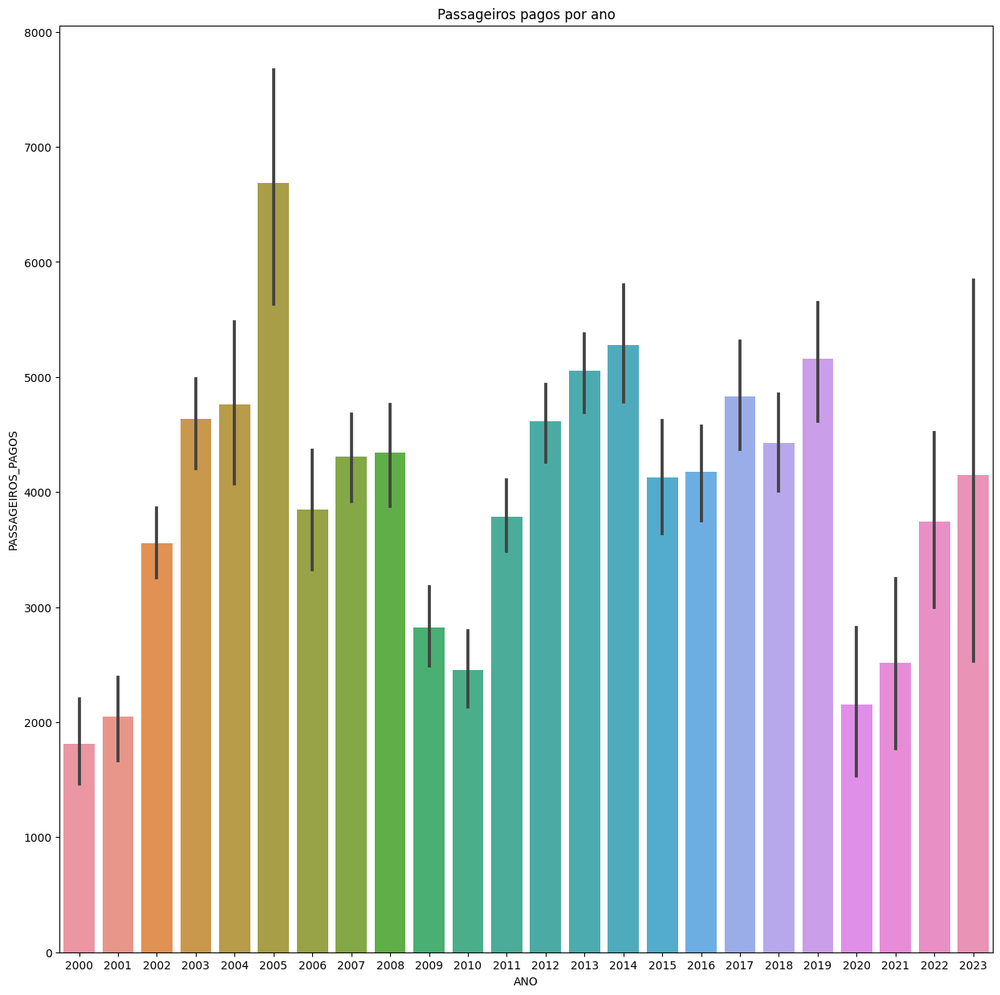





DEUTSCHE LUFTHANSA A.G.


count     2498.000000
mean      3349.721377
std       3713.597045
min          0.000000
25%          0.000000
50%       1825.500000
75%       6356.250000
max      12048.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


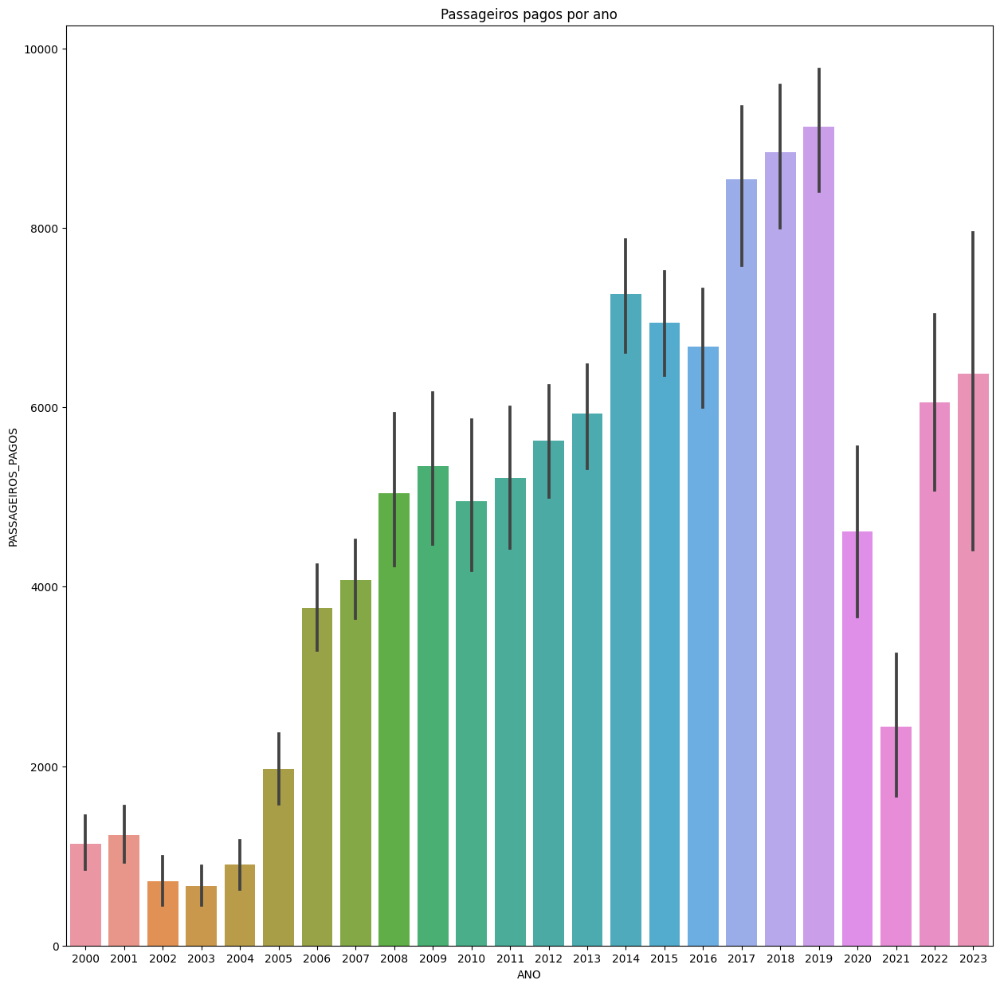





TAAG LINHAS AÉREAS DE ANGOLA (ANGOLA AIRLINES)


count    1161.000000
mean     1382.208441
std      1151.347202
min         0.000000
25%       243.000000
50%      1205.000000
75%      2228.000000
max      5120.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


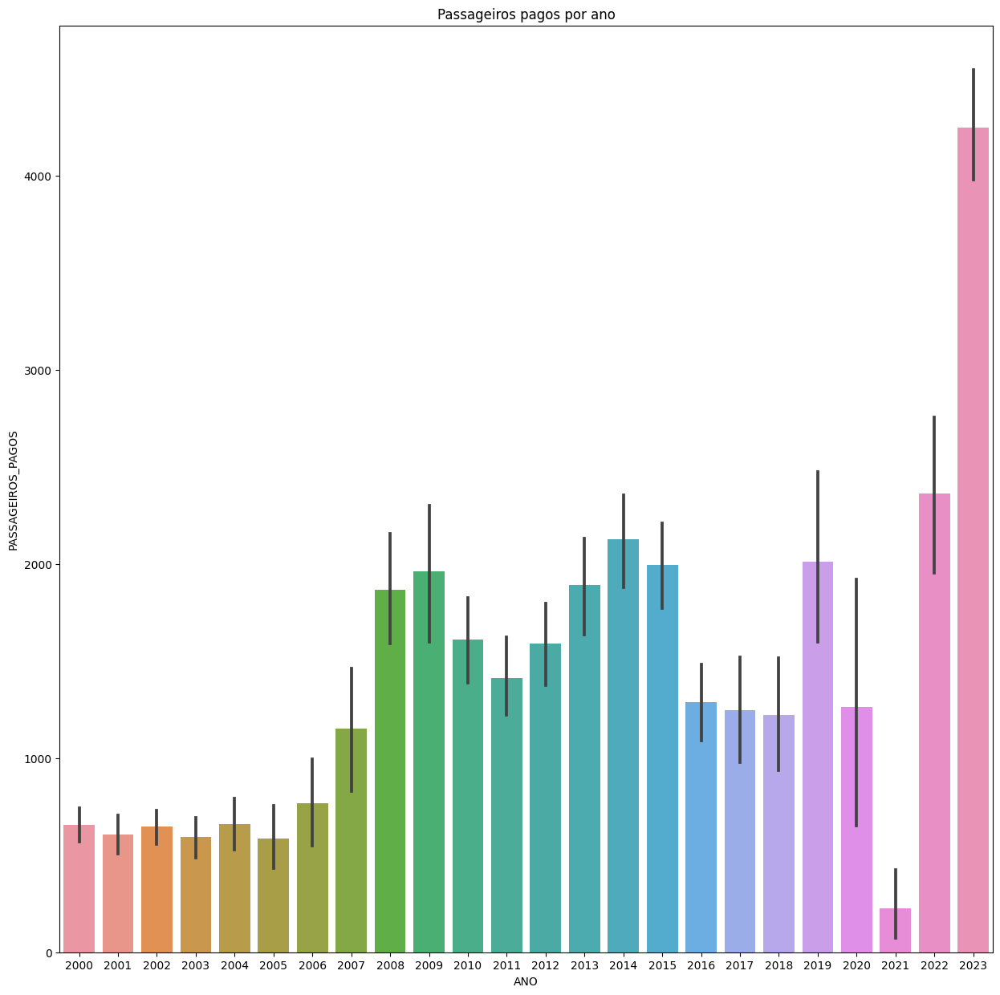





ECUATORIANA DE AVIACION S/A


count    107.000000
mean     106.616822
std      146.447018
min        0.000000
25%        0.000000
50%       41.000000
75%      155.500000
max      788.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


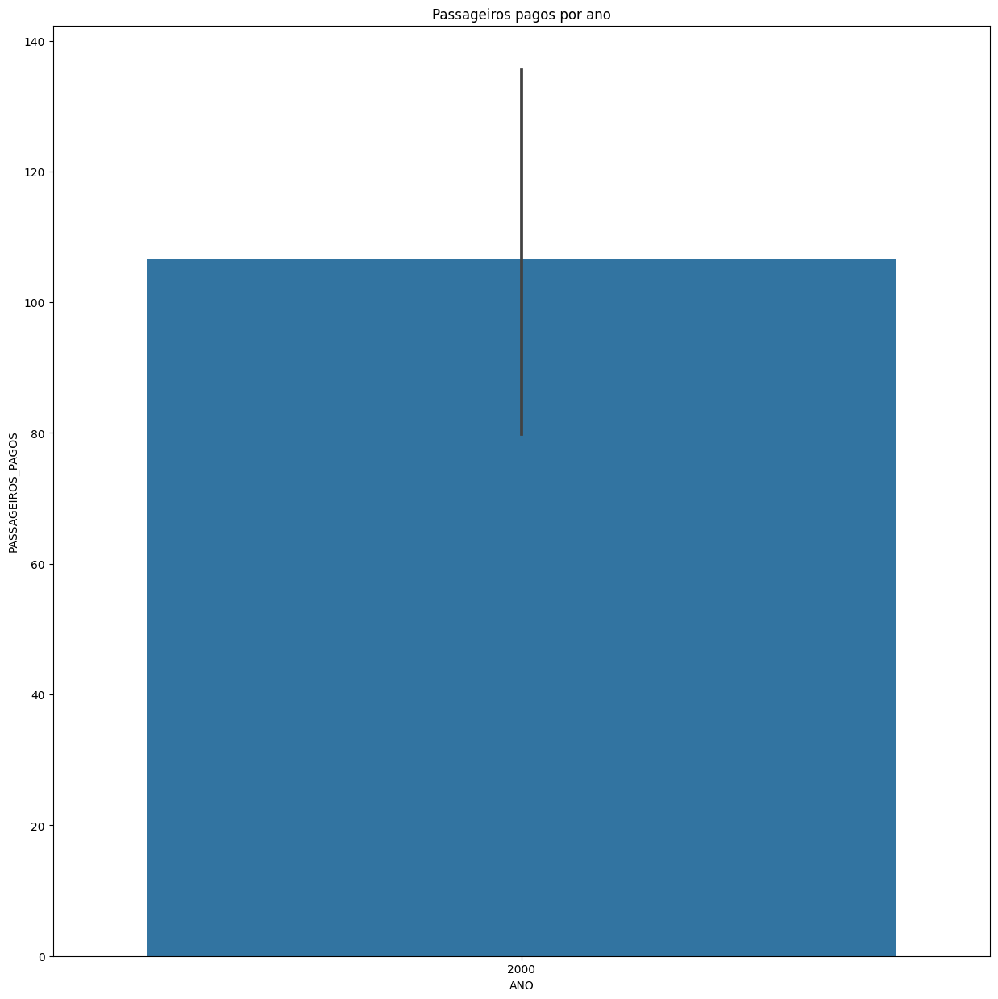





FEDEX - FEDERAL EXPRESS CORPORATION


count    2043.0
mean        0.0
std         0.0
min         0.0
25%         0.0
50%         0.0
75%         0.0
max         0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


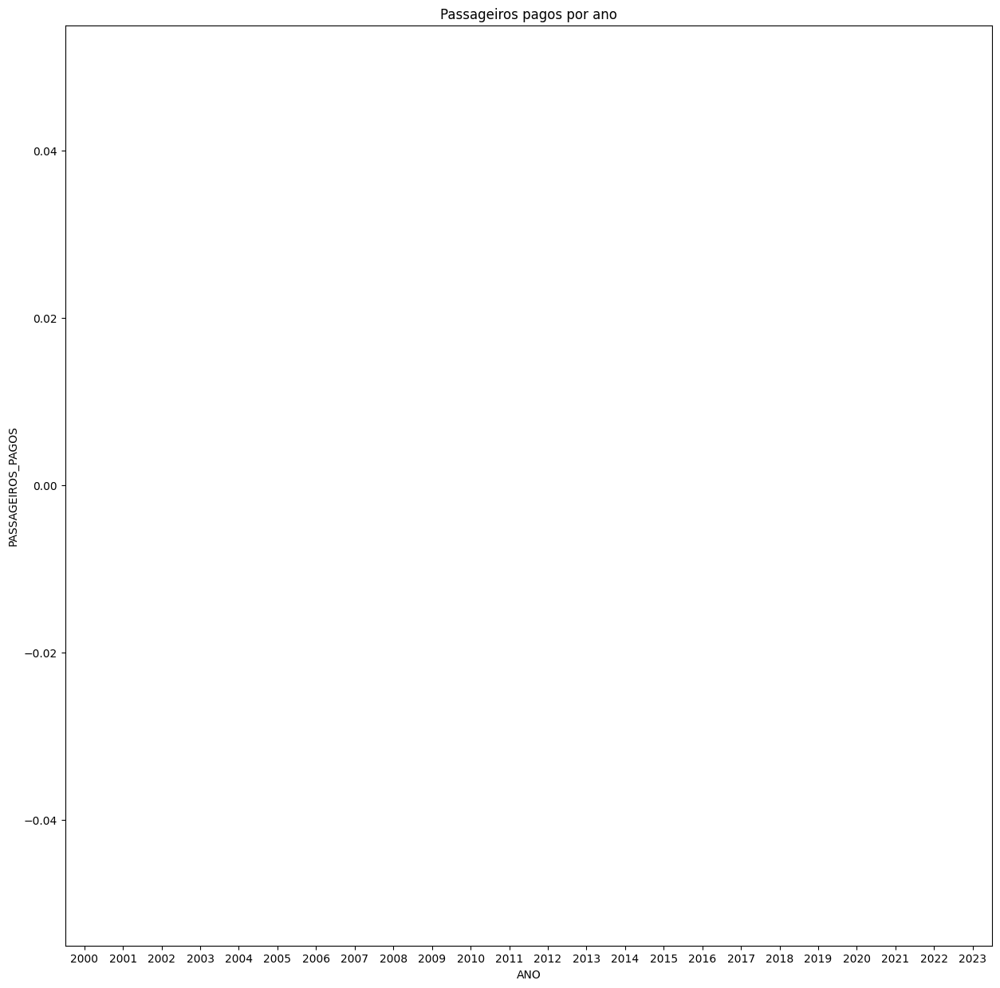





IBÉRIA LINEAS AEREAS DE ESPAÑA SOCIEDAD ANONIMA OPERADORA


count     1397.000000
mean      5785.489621
std       4409.349702
min          0.000000
25%       1897.000000
50%       5589.000000
75%       8113.000000
max      17354.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


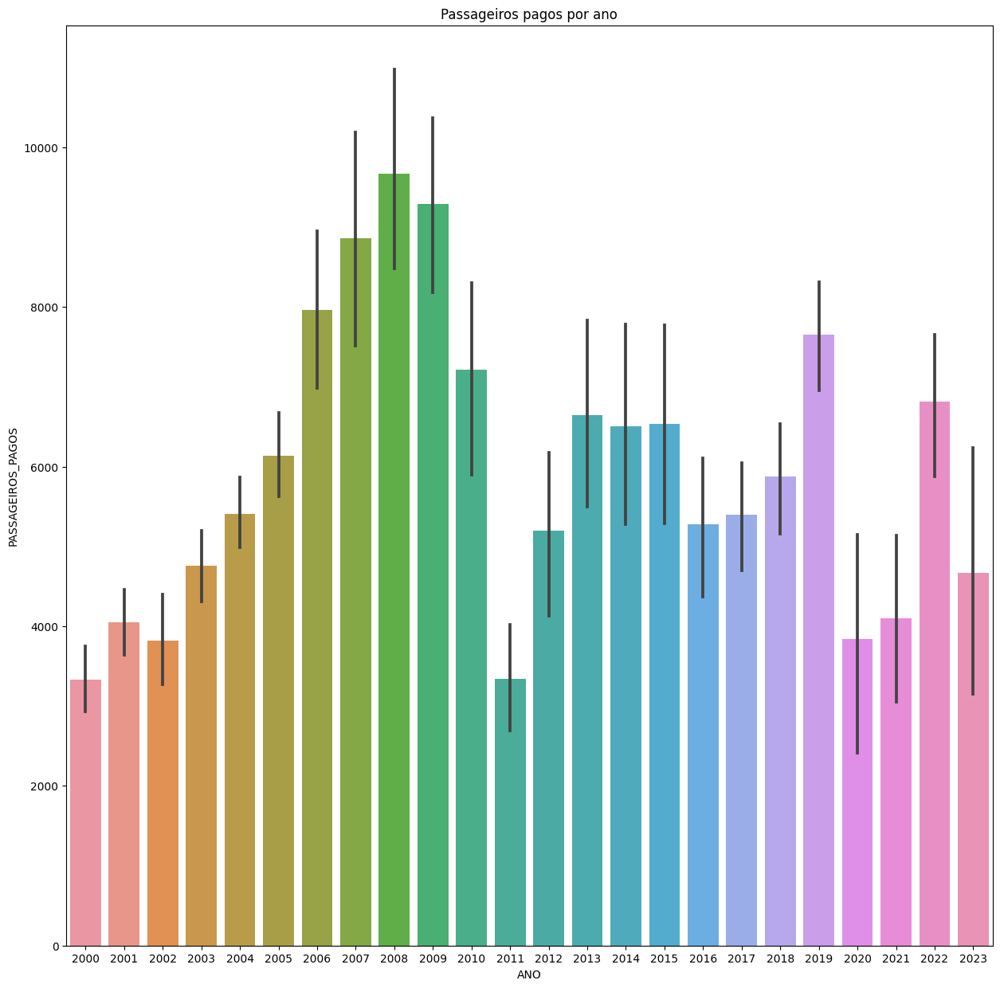





INTERBRASIL


count    1632.000000
mean      301.921569
std       424.011799
min         0.000000
25%        23.000000
50%        94.500000
75%       456.250000
max      2804.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


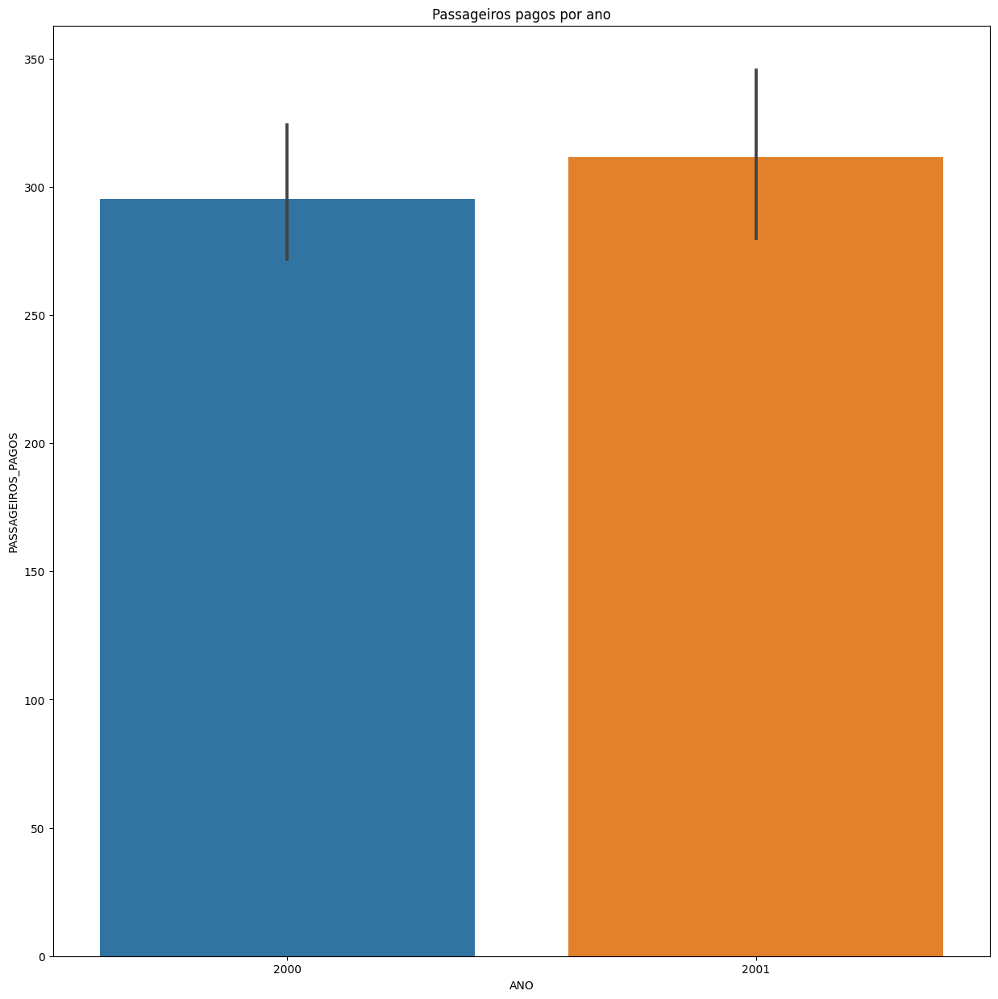





JAPAN AIRLINES INTERNATIONAL COMPANY LIMITED


count     549.000000
mean     1554.954463
std      1000.966061
min         0.000000
25%       644.000000
50%      1490.000000
75%      2364.000000
max      4353.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


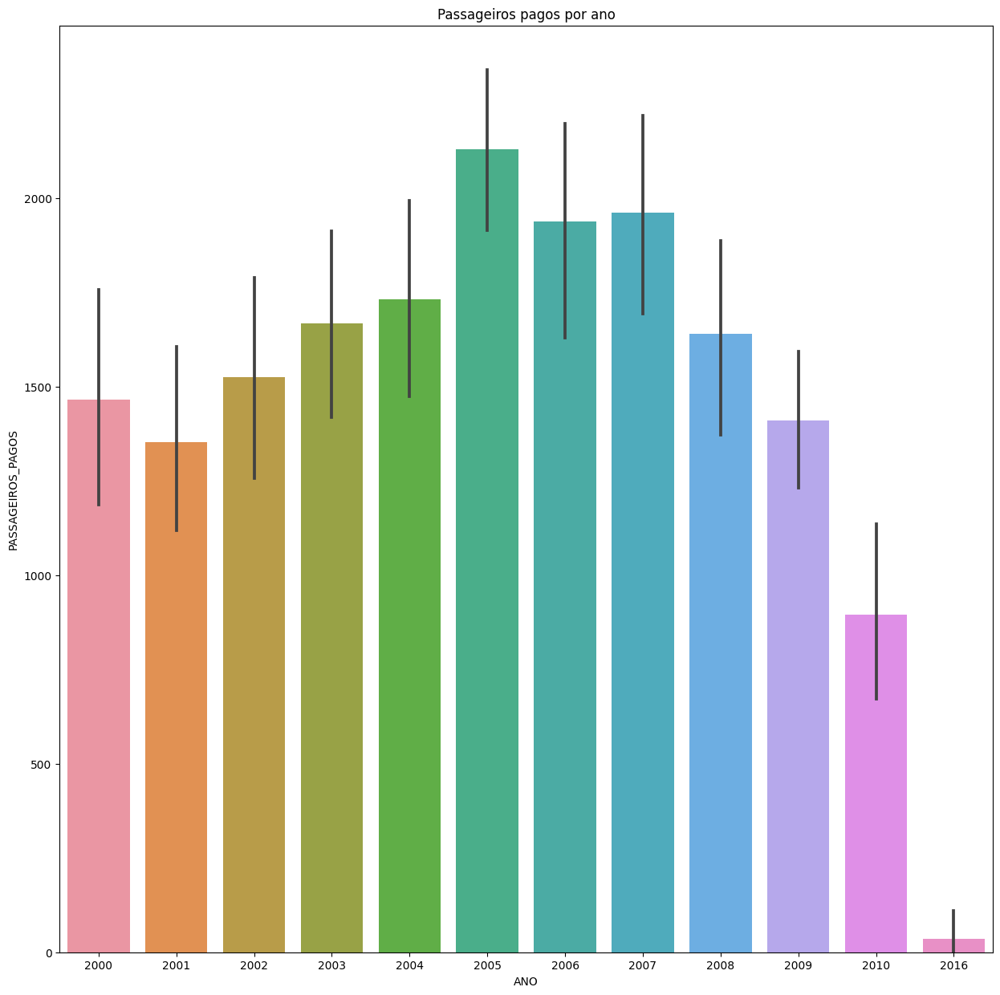





SPANAIR


count      36.000000
mean      349.333333
std       289.290363
min         0.000000
25%        95.250000
50%       284.000000
75%       593.250000
max      1024.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


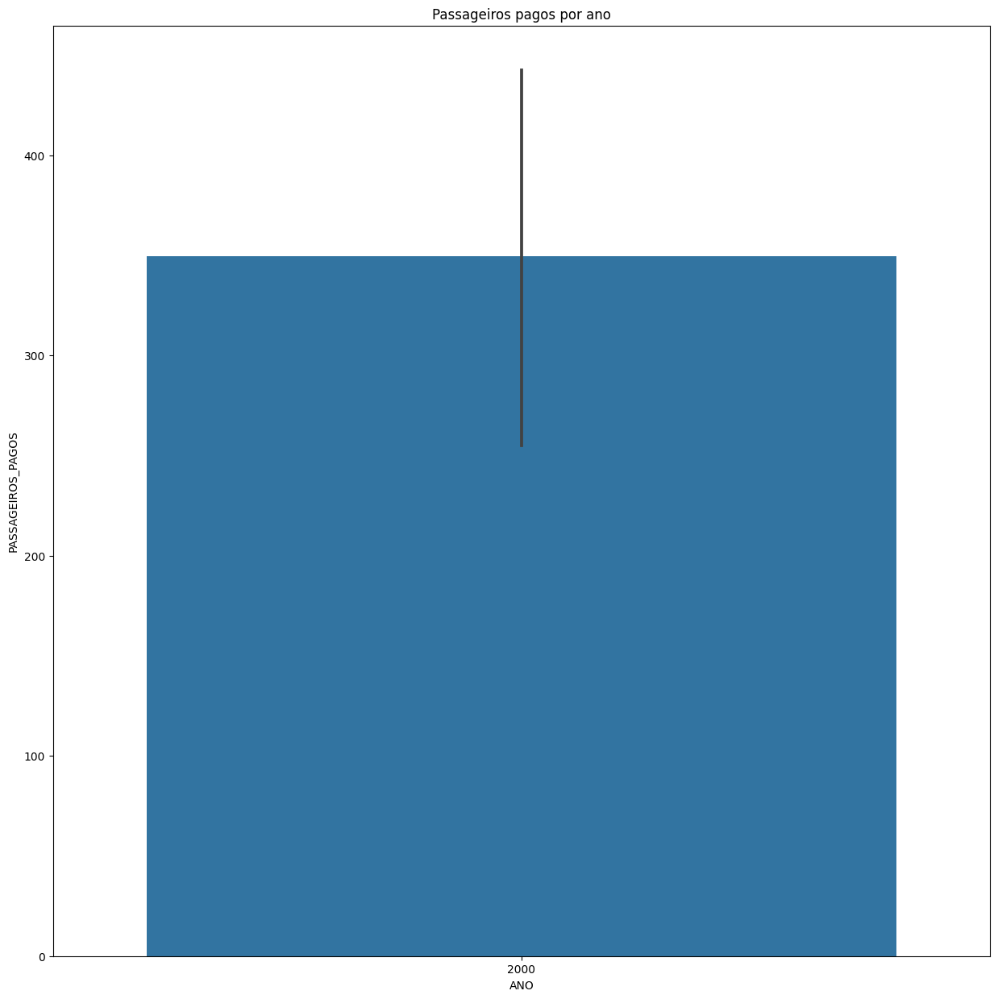





KOREAN AIR LINES CO. LTD.


count    2861.000000
mean      305.683677
std       656.788509
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max      3949.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


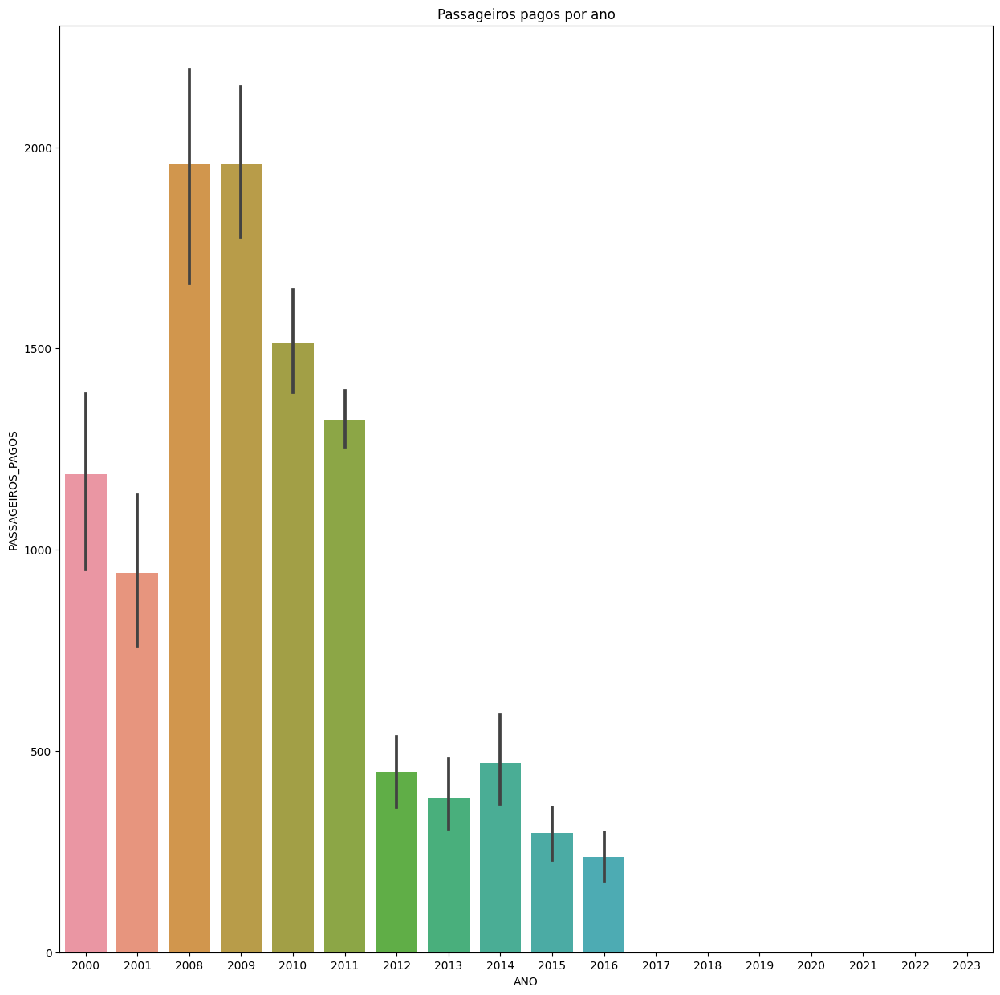





KLM CIA. REAL HOLANDESA DE AVIAÇÃO


count     1034.000000
mean      6003.879110
std       3488.159466
min          0.000000
25%       3034.750000
50%       6465.500000
75%       8988.750000
max      12295.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


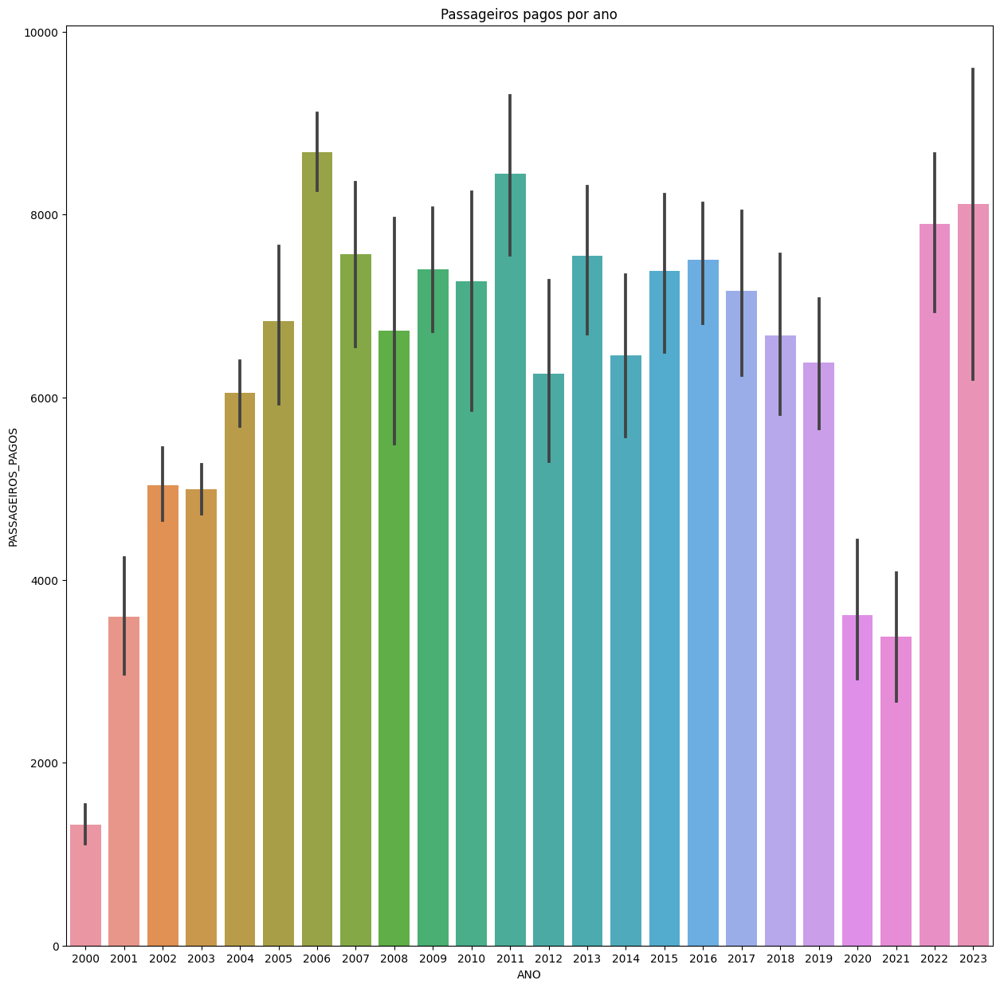





LATAM AIRLINES GROUP (EX - LAN AIRLINES S/A)


count     6515.000000
mean      1358.149348
std       3777.982768
min          0.000000
25%          0.000000
50%          0.000000
75%        355.000000
max      35297.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


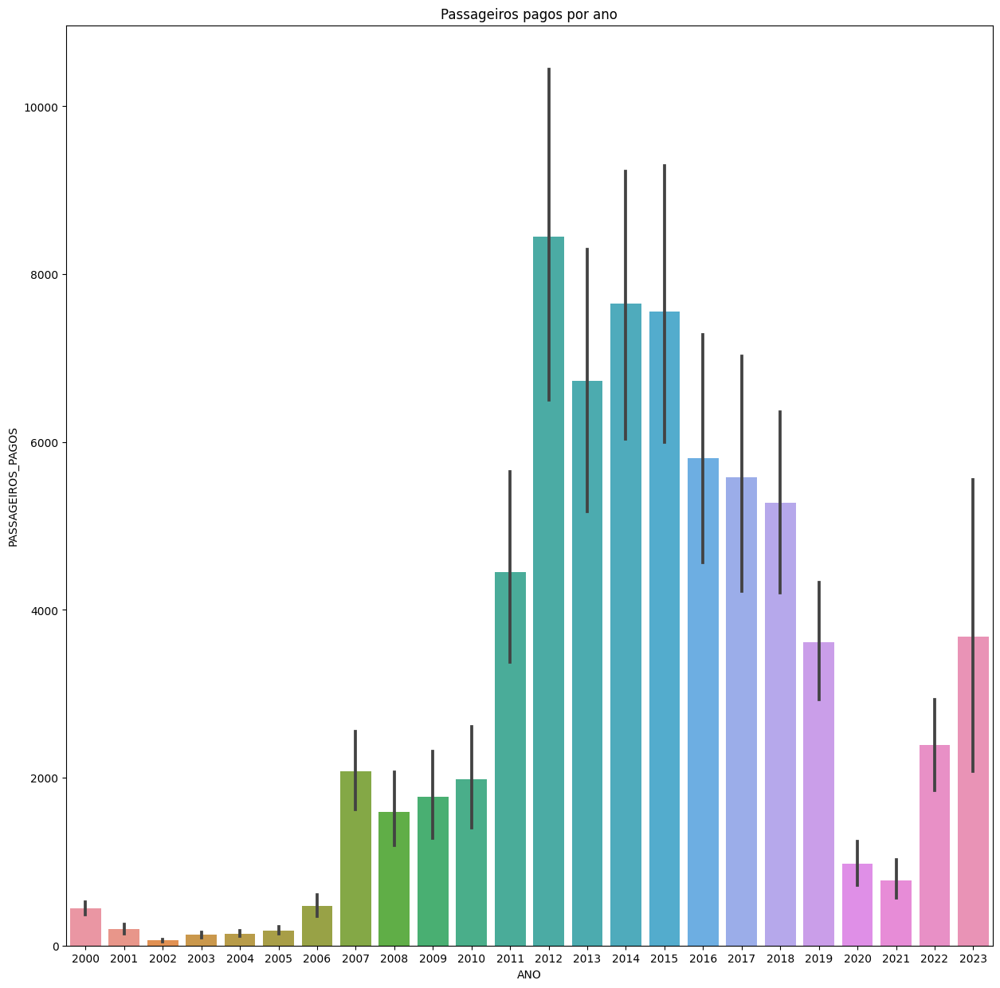





TRANSPORTE AÉREOS DEL MERCOSUR S.A. (TAM MERCOSUR)


count     4120.000000
mean      1668.083495
std       2429.429575
min          0.000000
25%        103.000000
50%        543.500000
75%       2400.500000
max      13482.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


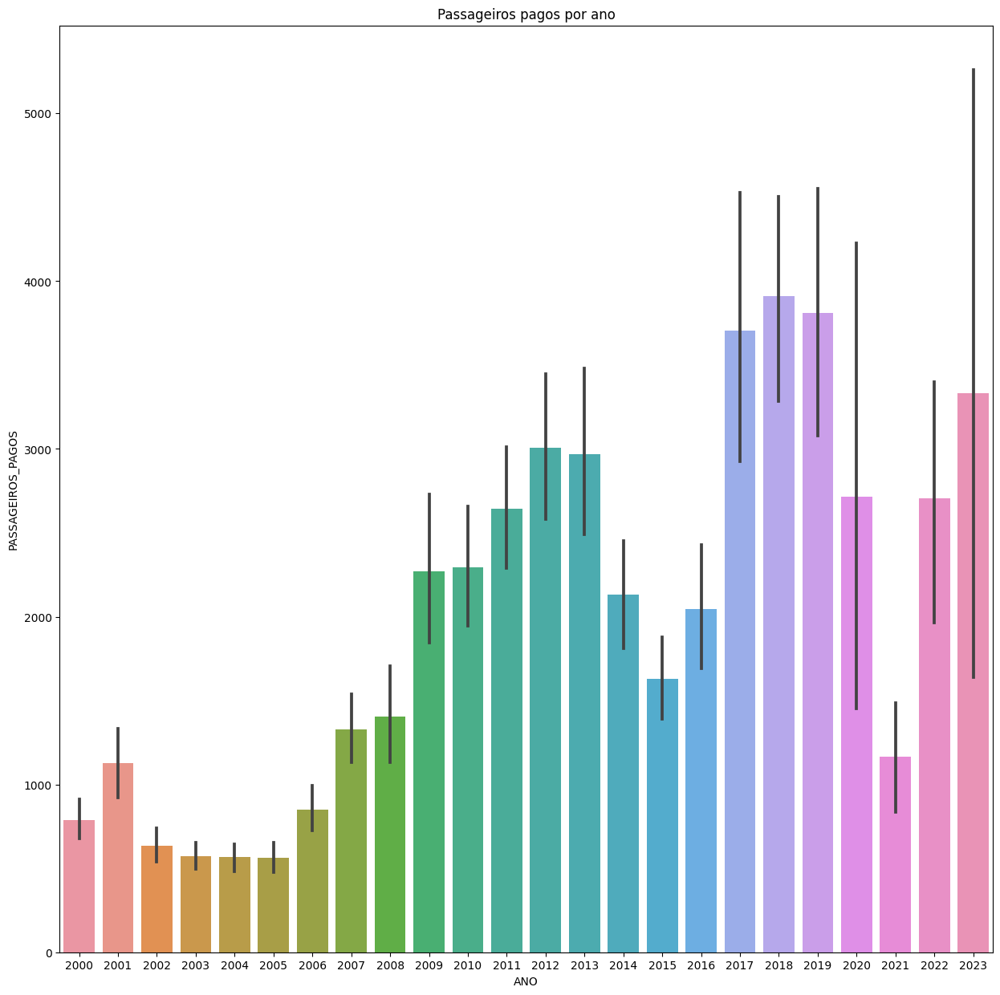





LLOYD AEREO BOLIVIANO


count     883.000000
mean      619.375991
std       849.676328
min         0.000000
25%        29.500000
50%       189.000000
75%       785.500000
max      3718.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


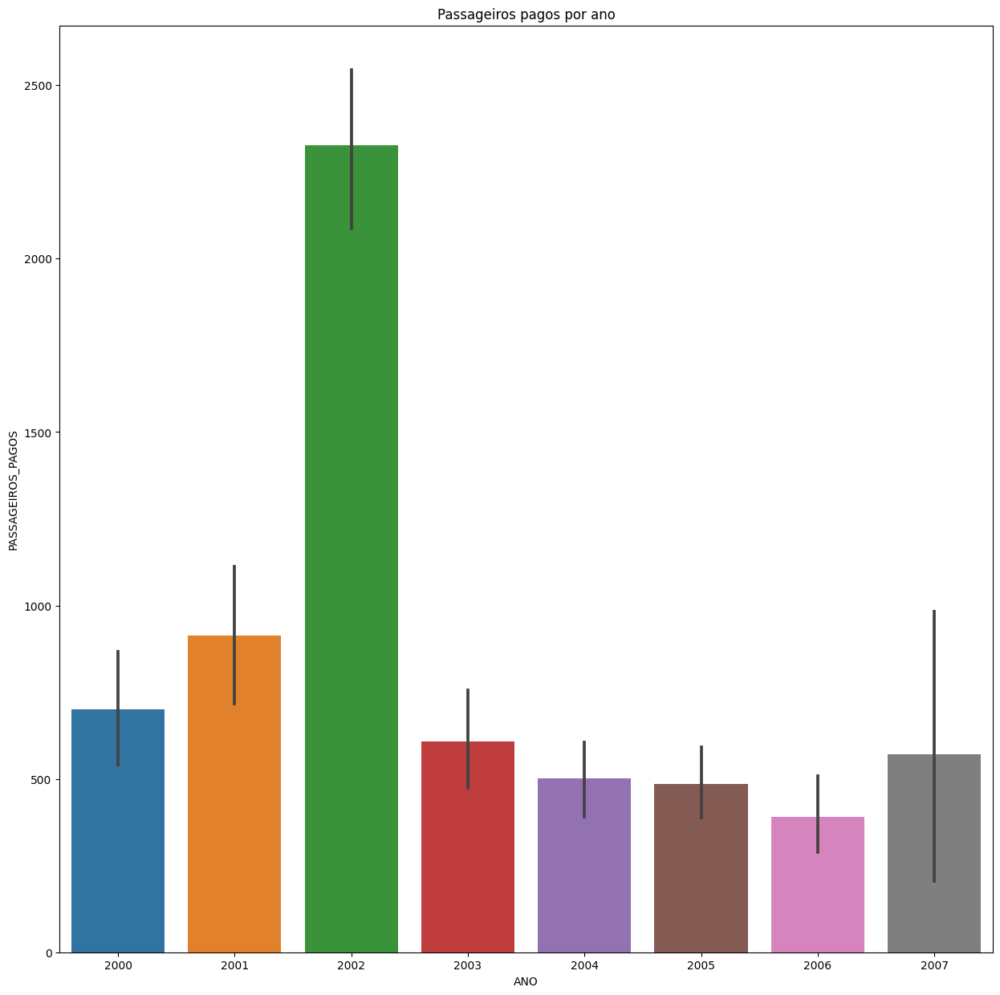





META - MESQUITA TRANSPORTES AÉREOS LTDA.


count    10471.000000
mean        53.962086
std         77.141284
min          0.000000
25%          4.000000
50%         24.000000
75%         73.000000
max        847.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


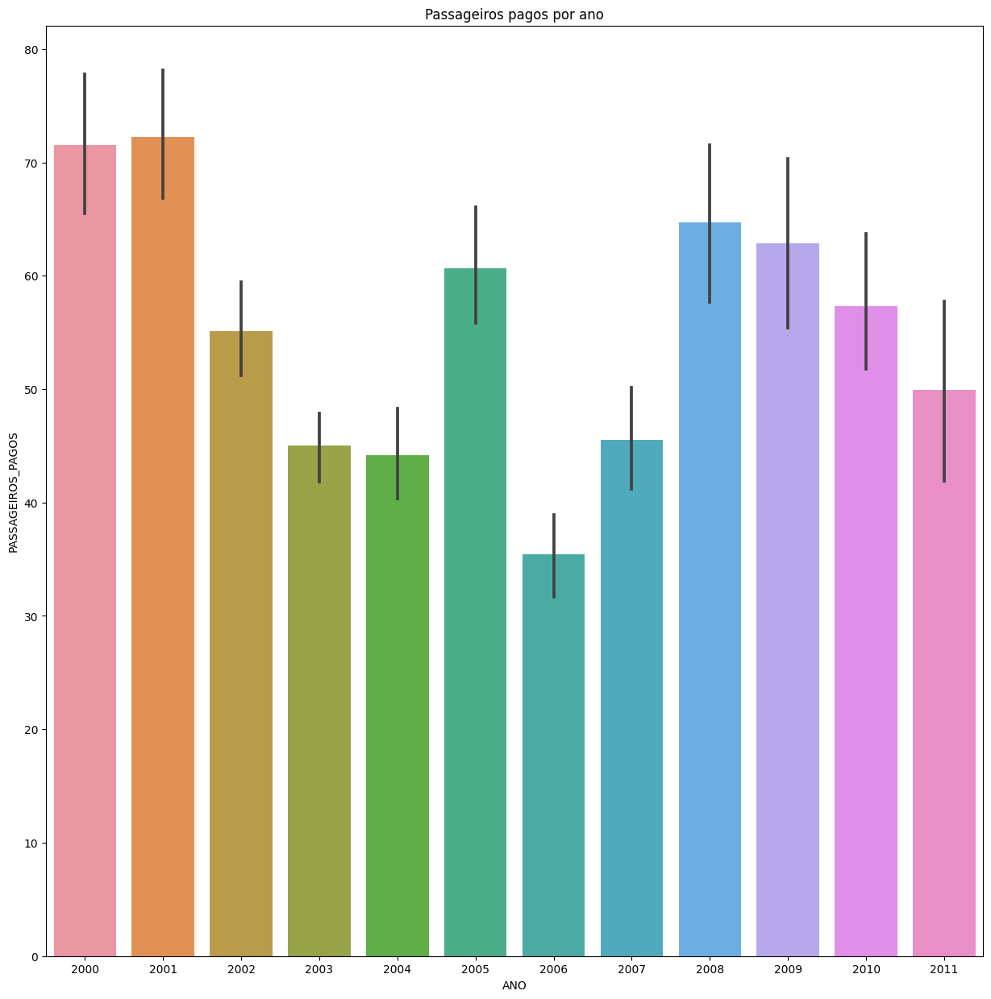





NORDESTE


count    11267.000000
mean       384.450075
std        748.724215
min          0.000000
25%         14.000000
50%        114.000000
75%        498.000000
max      16051.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


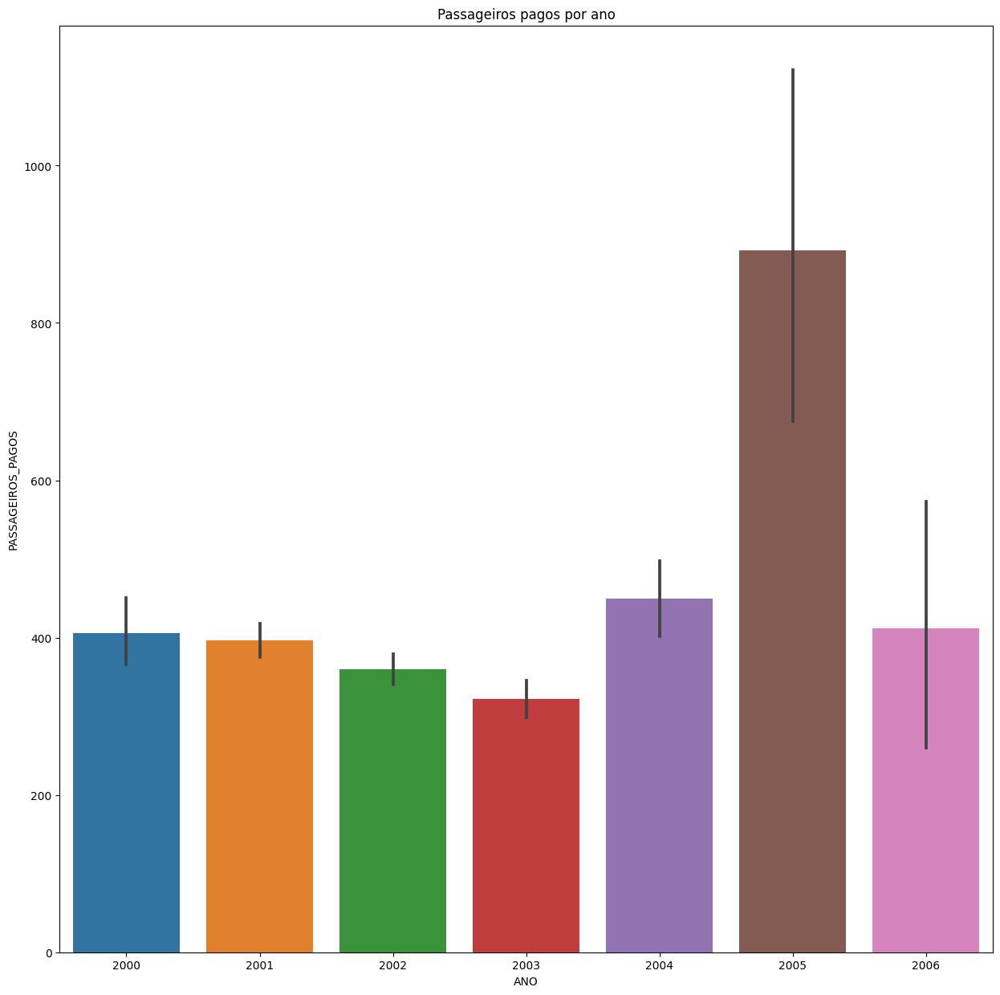





POLAR AIR CARGO LLC. (EX - POLAR AIR CARGO WORLDWIDE INC.)


count    688.000000
mean       0.436047
std        8.519964
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max      200.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


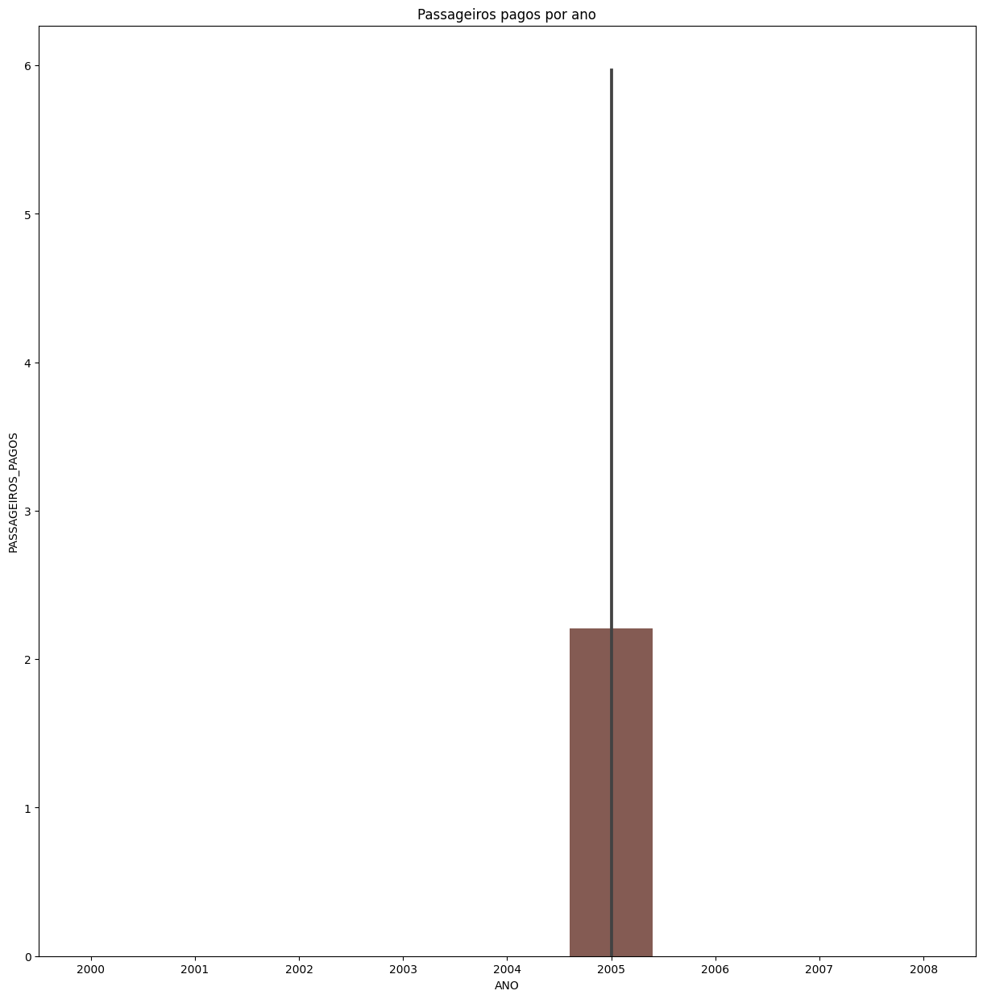





PENTA


count    5170.000000
mean       85.062089
std       177.039011
min         0.000000
25%         0.000000
50%        12.000000
75%        87.000000
max      1693.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


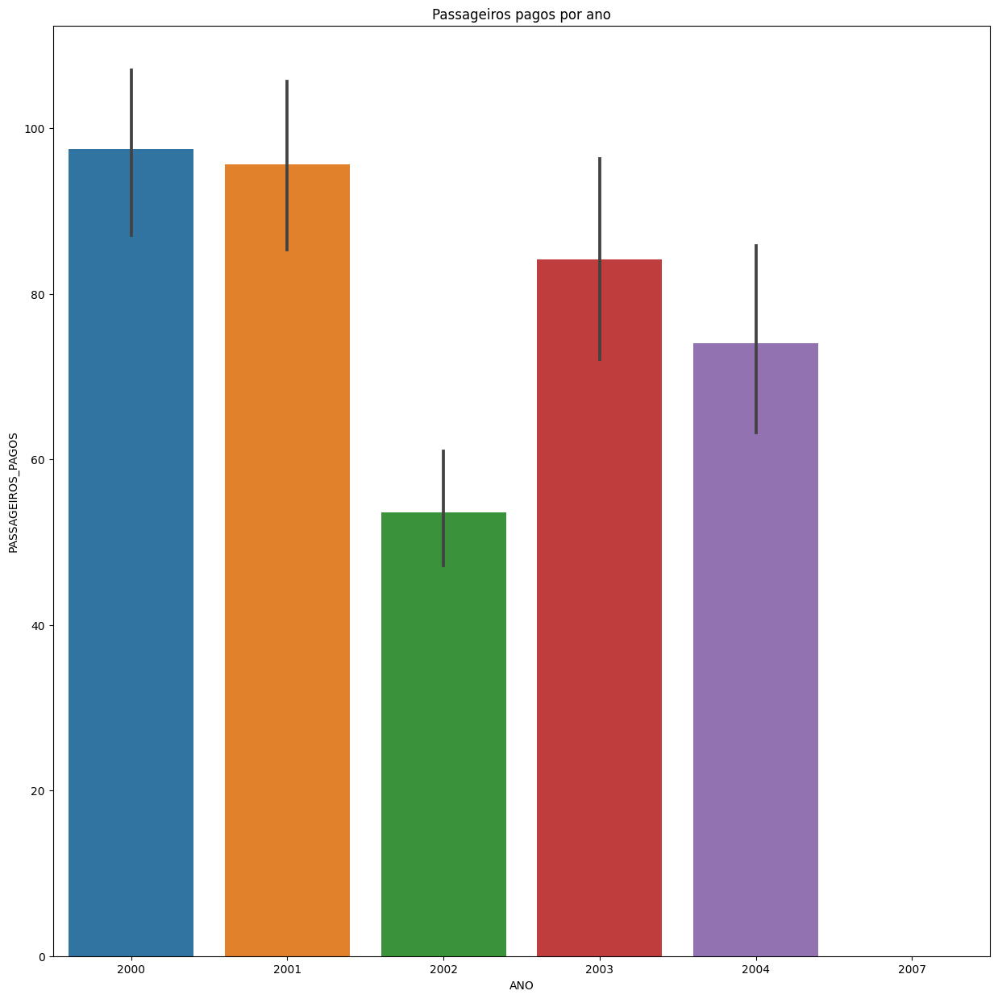





PASSAREDO TRANSPORTES AÉREOS S.A.


count    18316.000000
mean       532.631852
std        849.154241
min          0.000000
25%         33.000000
50%        180.000000
75%        684.250000
max       6869.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


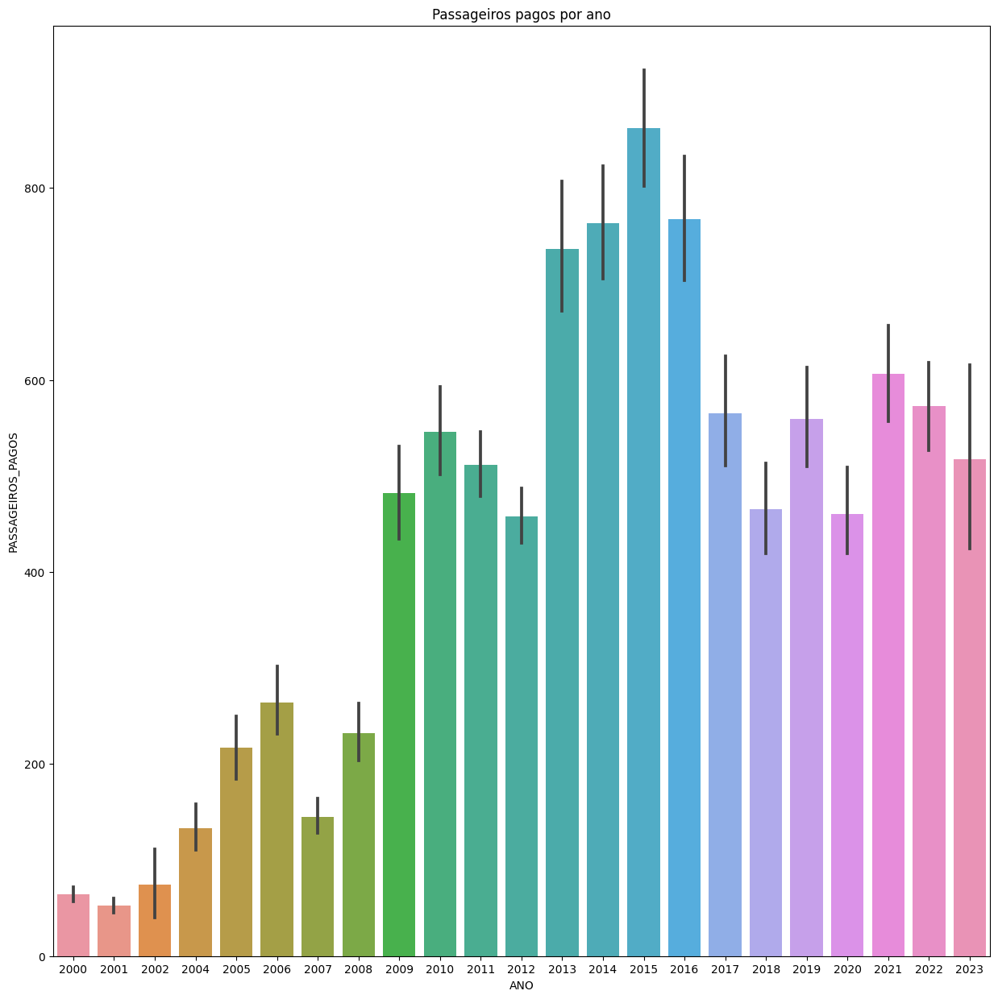





PANTANAL LINHAS AÉREAS S.A.


count    8324.000000
mean      524.498078
std       959.066452
min         0.000000
25%         0.000000
50%        49.000000
75%       719.000000
max      7510.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


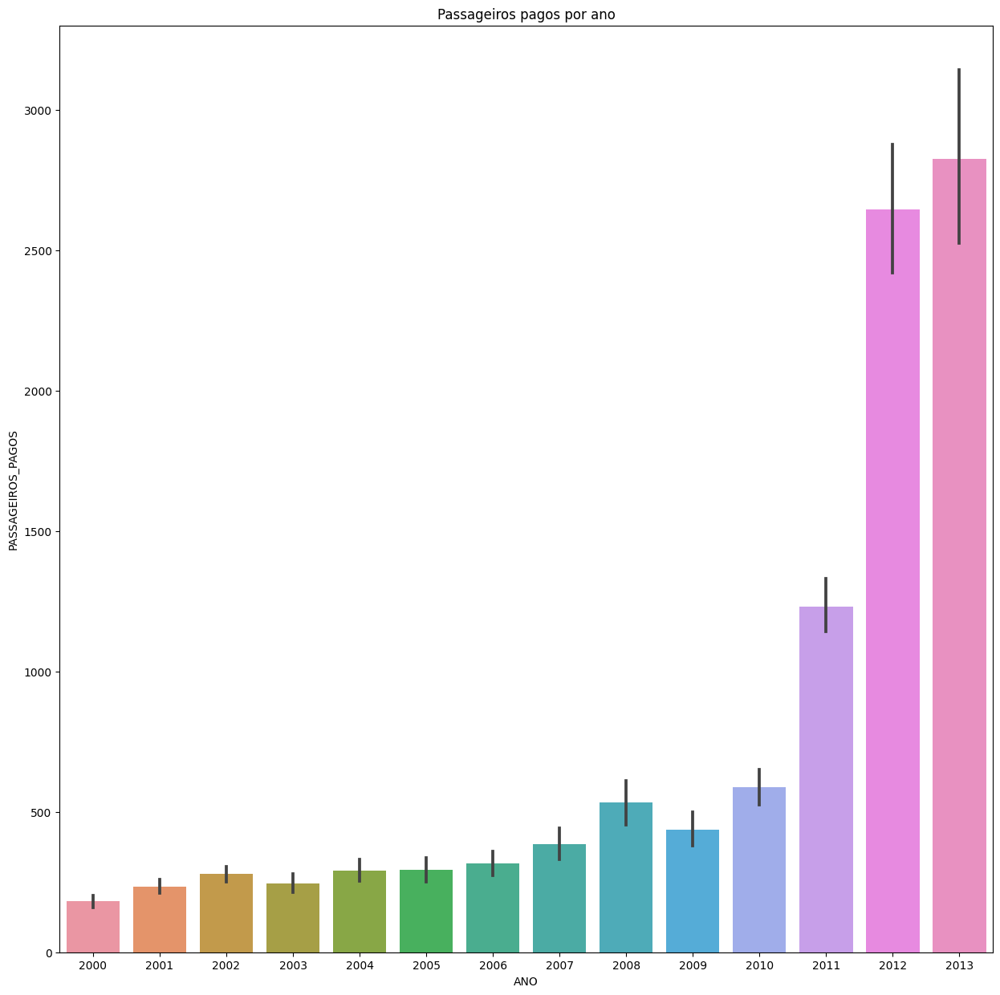





PLUNA LÍNEAS AÉREAS URUGUAYAS


count    4222.000000
mean      766.766225
std      1485.788442
min         0.000000
25%        15.000000
50%       152.000000
75%       622.750000
max      9867.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


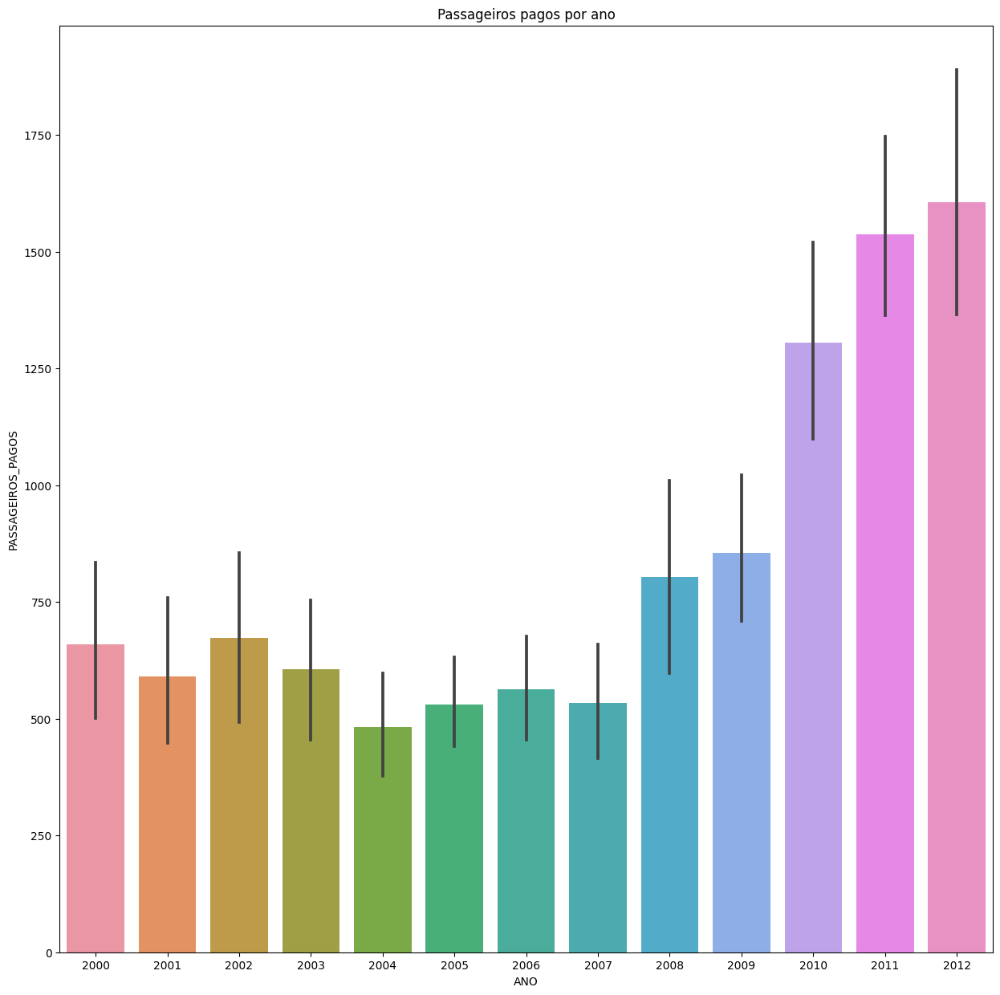





RICO


count    12928.000000
mean       123.411200
std        249.763746
min          0.000000
25%          7.000000
50%         33.000000
75%        126.250000
max       4539.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


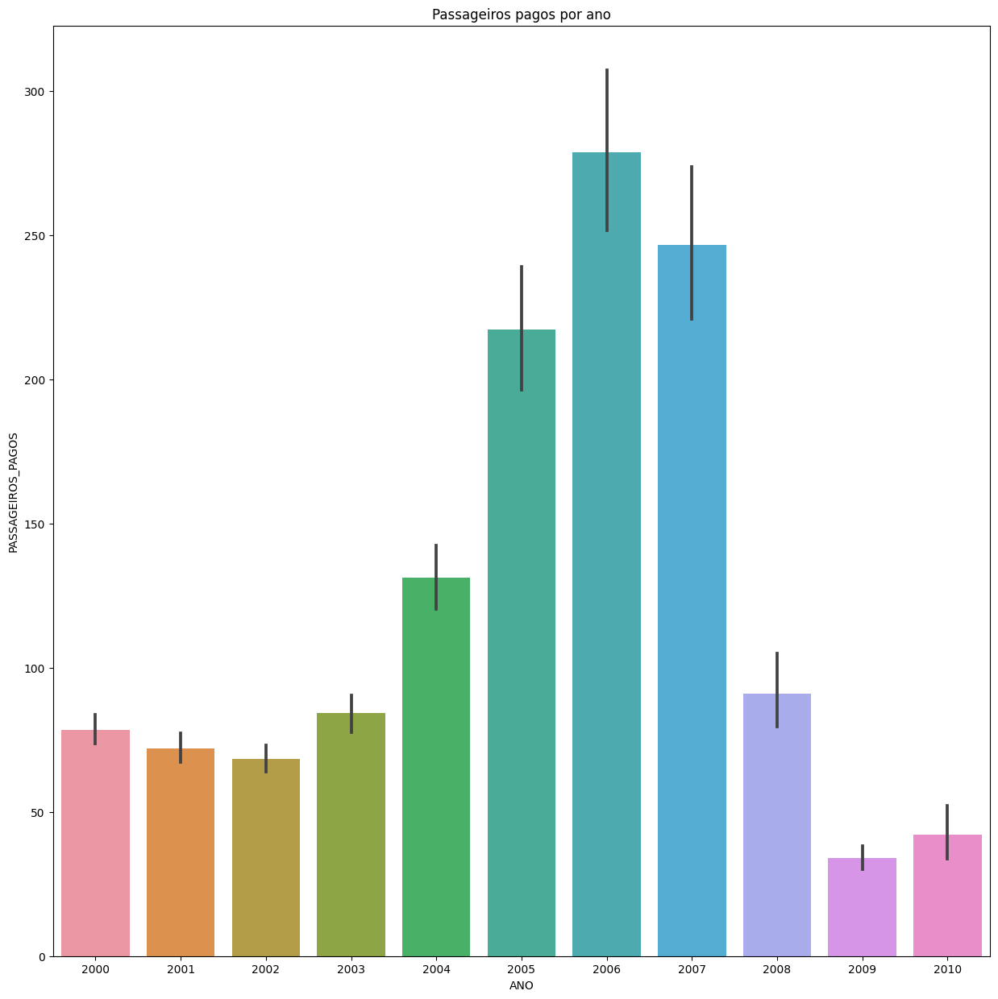





RIO SUL


count    13932.000000
mean       944.832903
std       2269.037166
min          0.000000
25%         13.000000
50%        134.000000
75%        595.000000
max      24744.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


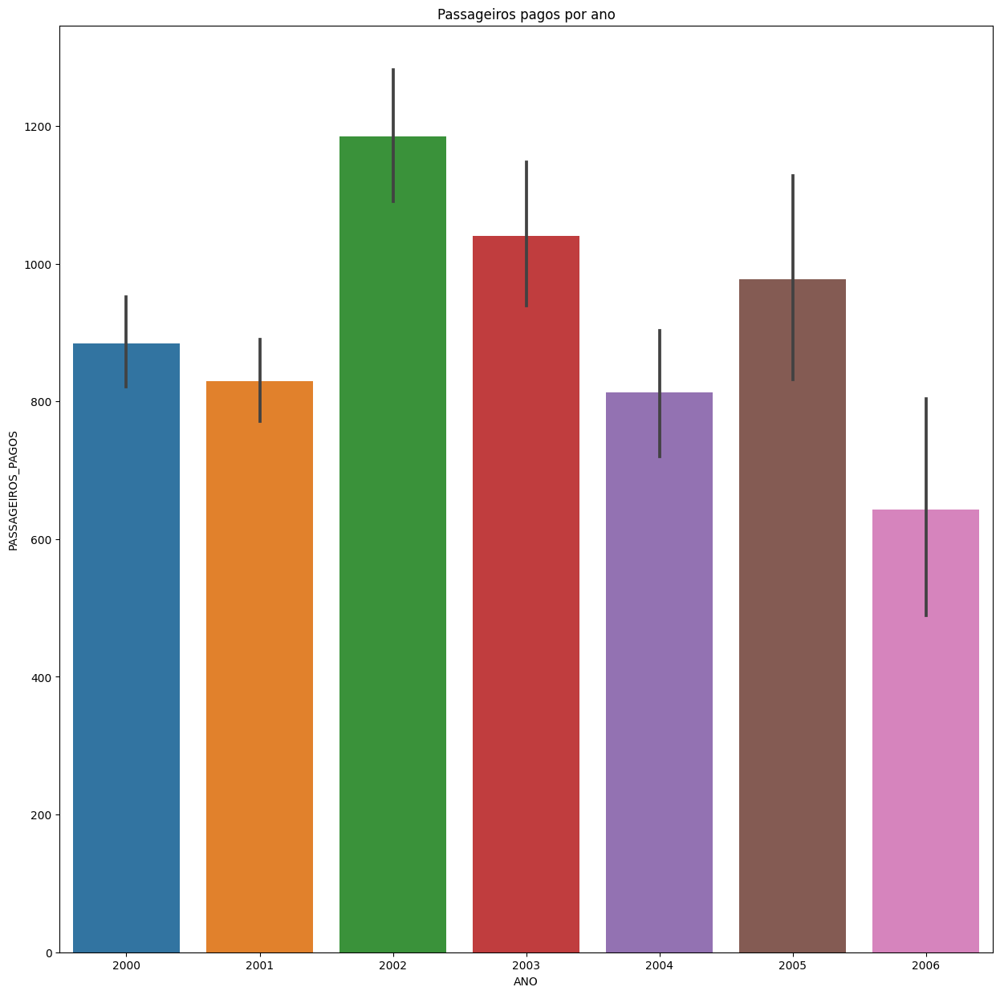





SOUTH AFRICAN AIRWAYS STATE OWNED COMPANY (SOC) LIMITED


count      507.000000
mean      5643.495069
std       2308.634767
min          0.000000
25%       3907.500000
50%       6132.000000
75%       7194.000000
max      10884.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


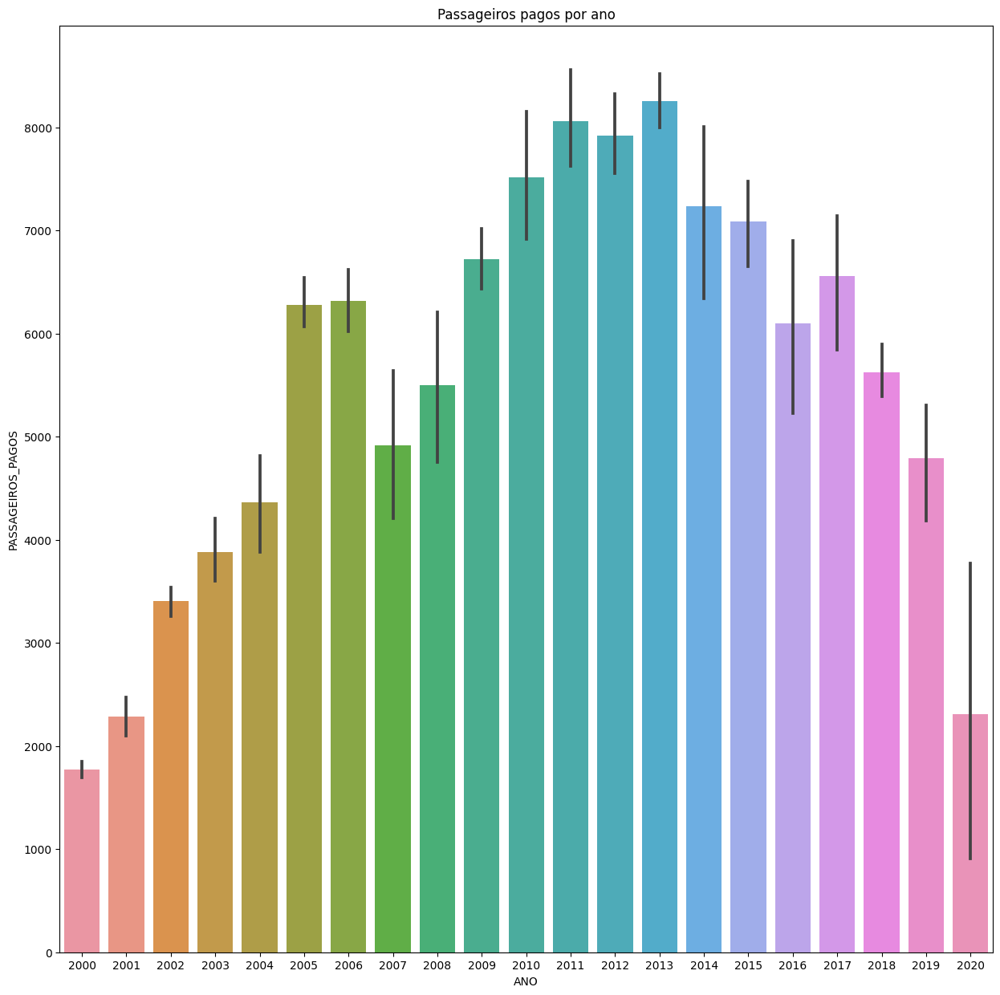





SURINAM AIRWAYS LTD


count    1045.000000
mean      488.408612
std       432.425205
min         0.000000
25%       139.000000
50%       357.000000
75%       763.000000
max      1965.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


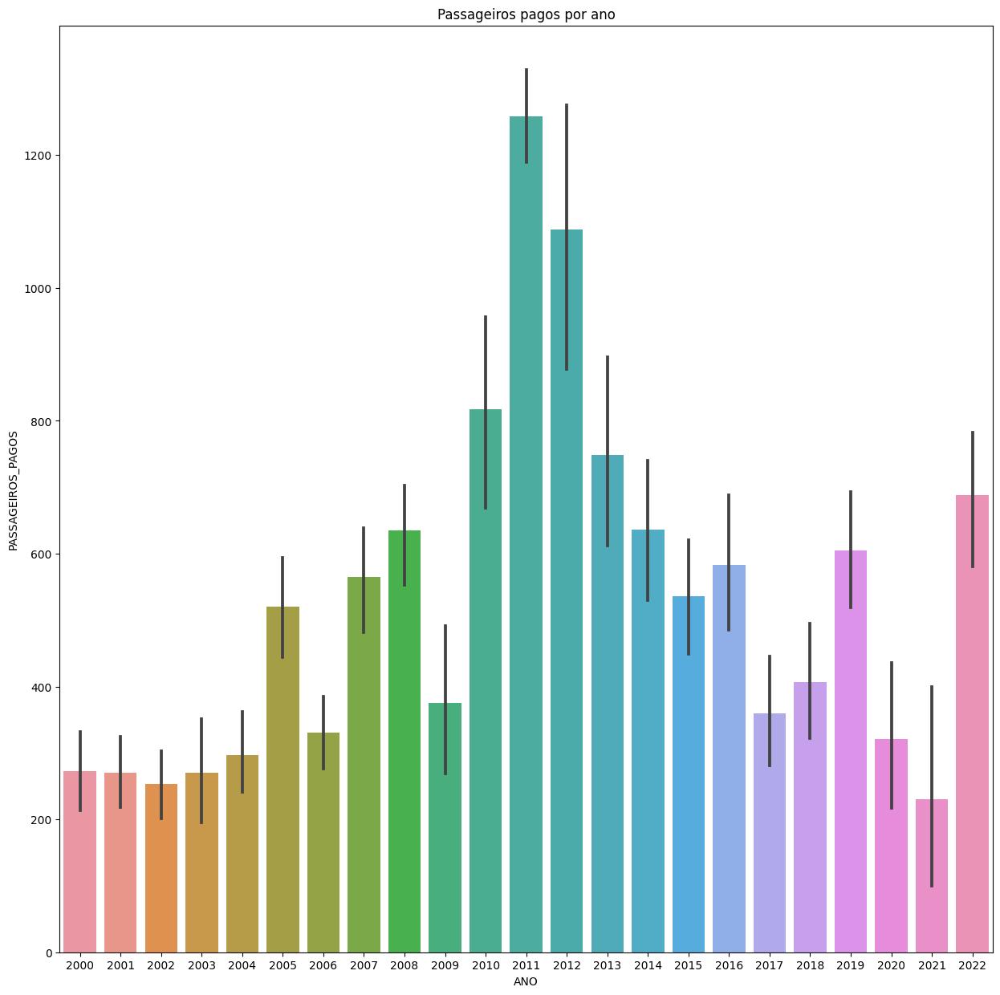





SWISS INTERNATIONAL AIR LINES LTD.


count     1453.000000
mean      2548.607708
std       2531.226252
min          0.000000
25%        449.000000
50%       1606.000000
75%       4198.000000
max      10215.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


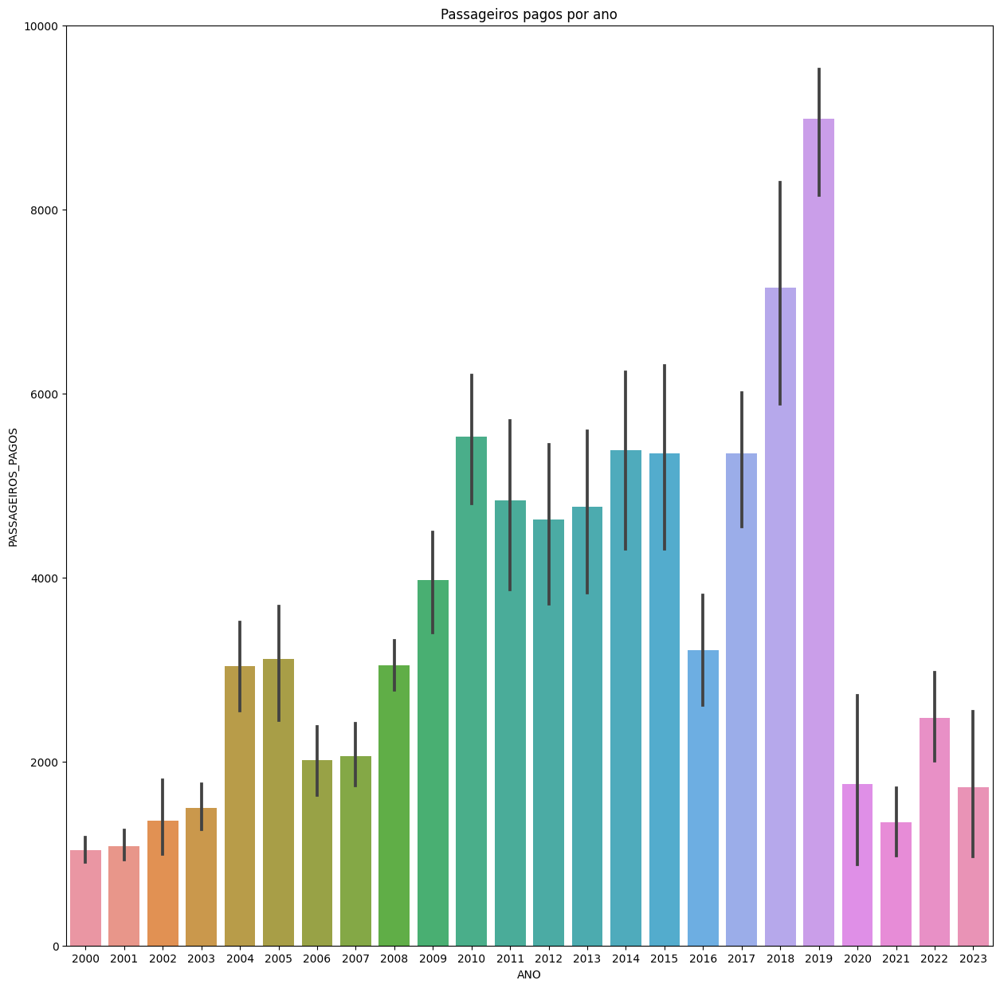





TAM LINHAS AÉREAS S.A.


count    170098.000000
mean       3462.941375
std        6621.230763
min           0.000000
25%          50.000000
50%         639.000000
75%        4265.000000
max       92357.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


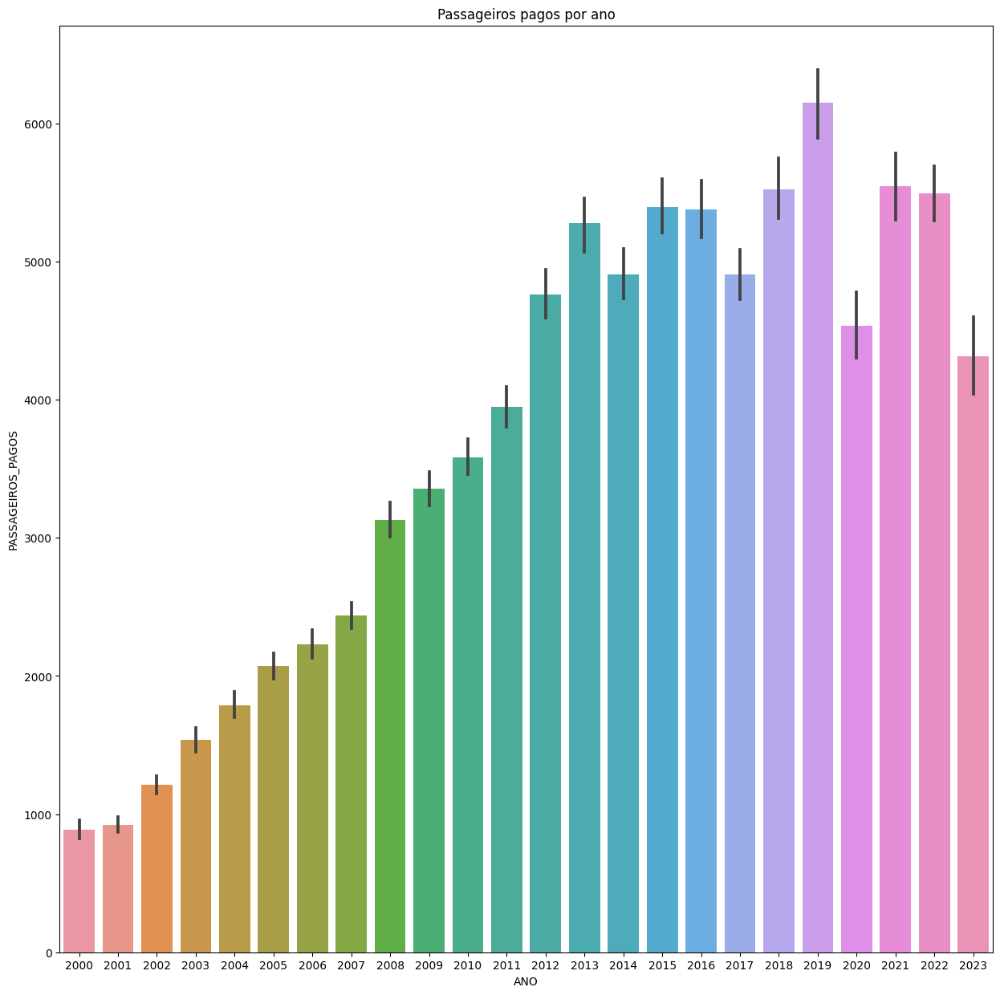





TAP - TRANSPORTES AÉREOS PORTUGUESES S/A


count     7947.000000
mean      3264.426702
std       3432.892980
min          0.000000
25%        478.500000
50%       2205.000000
75%       5156.500000
max      25762.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


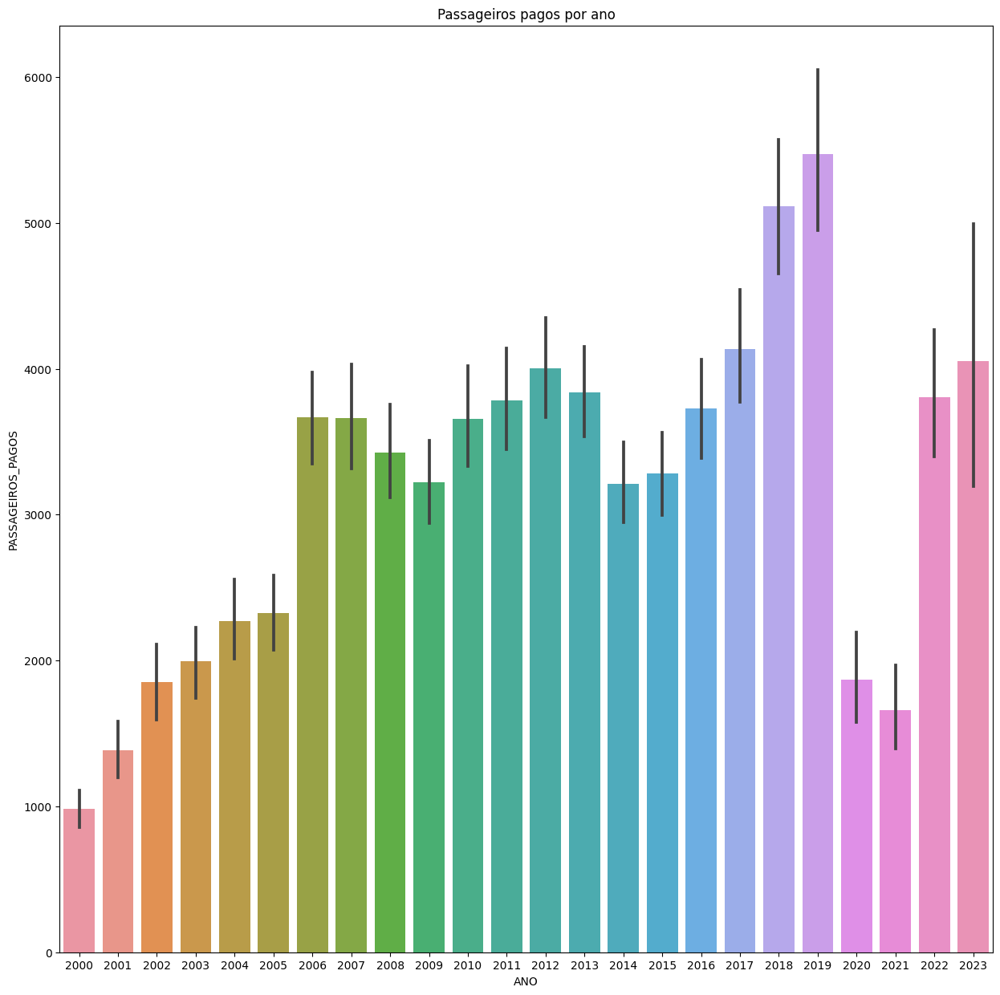





TRANSBRASIL


count     3684.000000
mean      1042.192725
std       1600.593366
min          0.000000
25%         94.000000
50%        528.000000
75%       1440.500000
max      30976.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


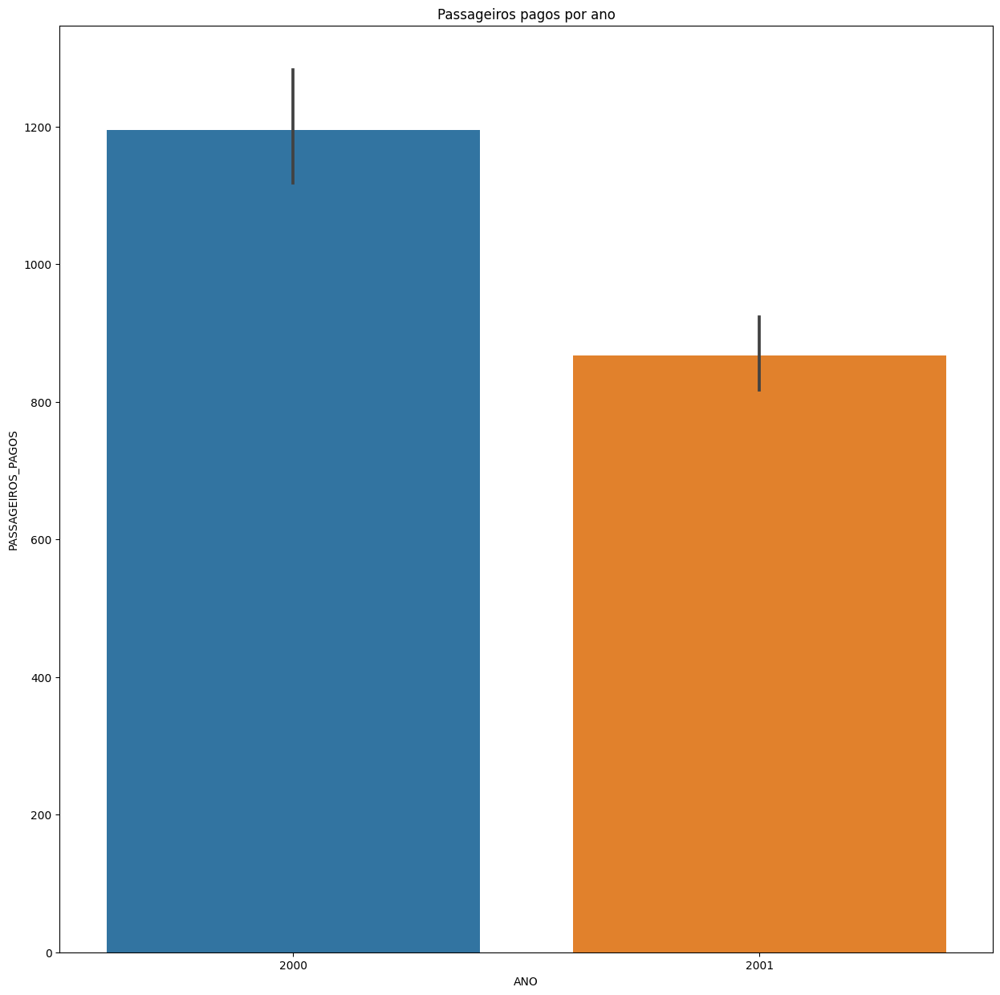





TRIP SERVIÇOS DE SUPORTE AÉREO S.A (EX. TRIP LINHAS AÉREAS)


count    43500.000000
mean       512.031494
std        902.405093
min          0.000000
25%         26.000000
50%        178.000000
75%        597.000000
max      13531.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


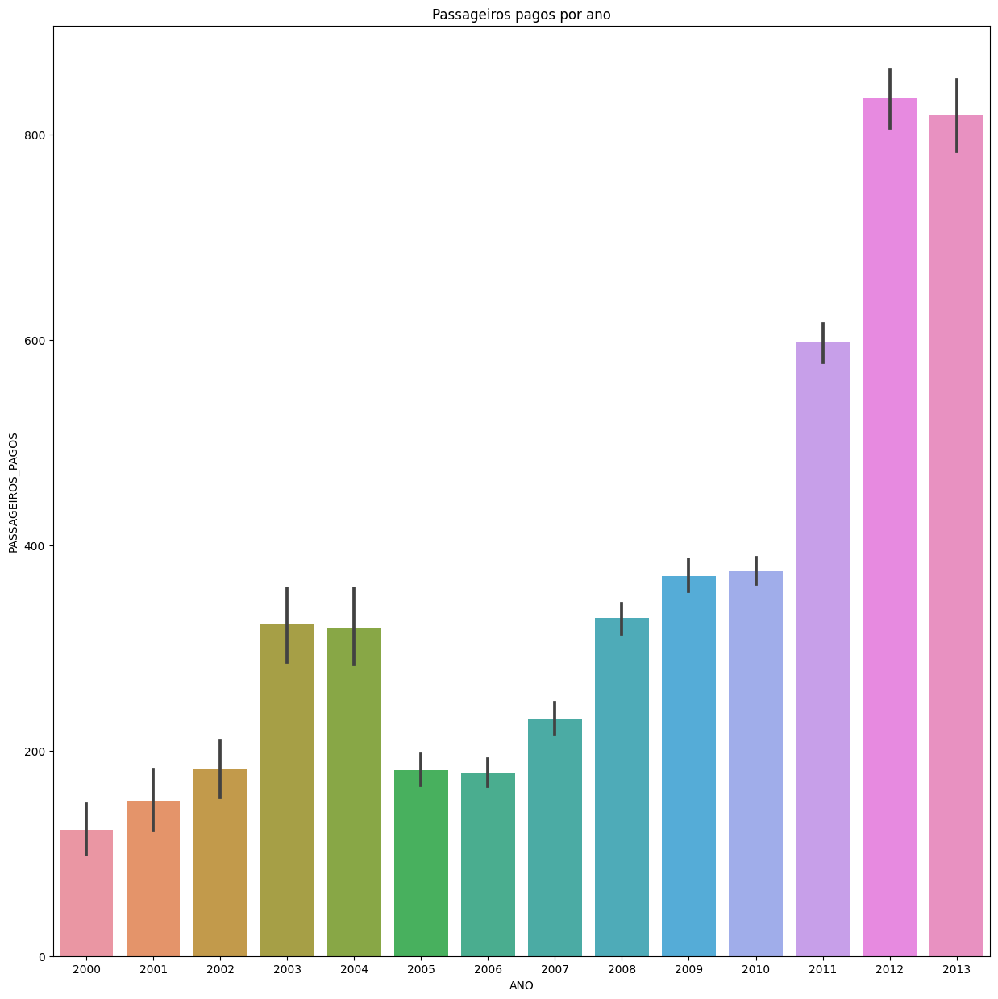





TRANSPORTES AEREOS PRESIDENTE S.A.


count    349.000000
mean      23.220630
std       31.050571
min        0.000000
25%        1.000000
50%        8.000000
75%       37.000000
max      153.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


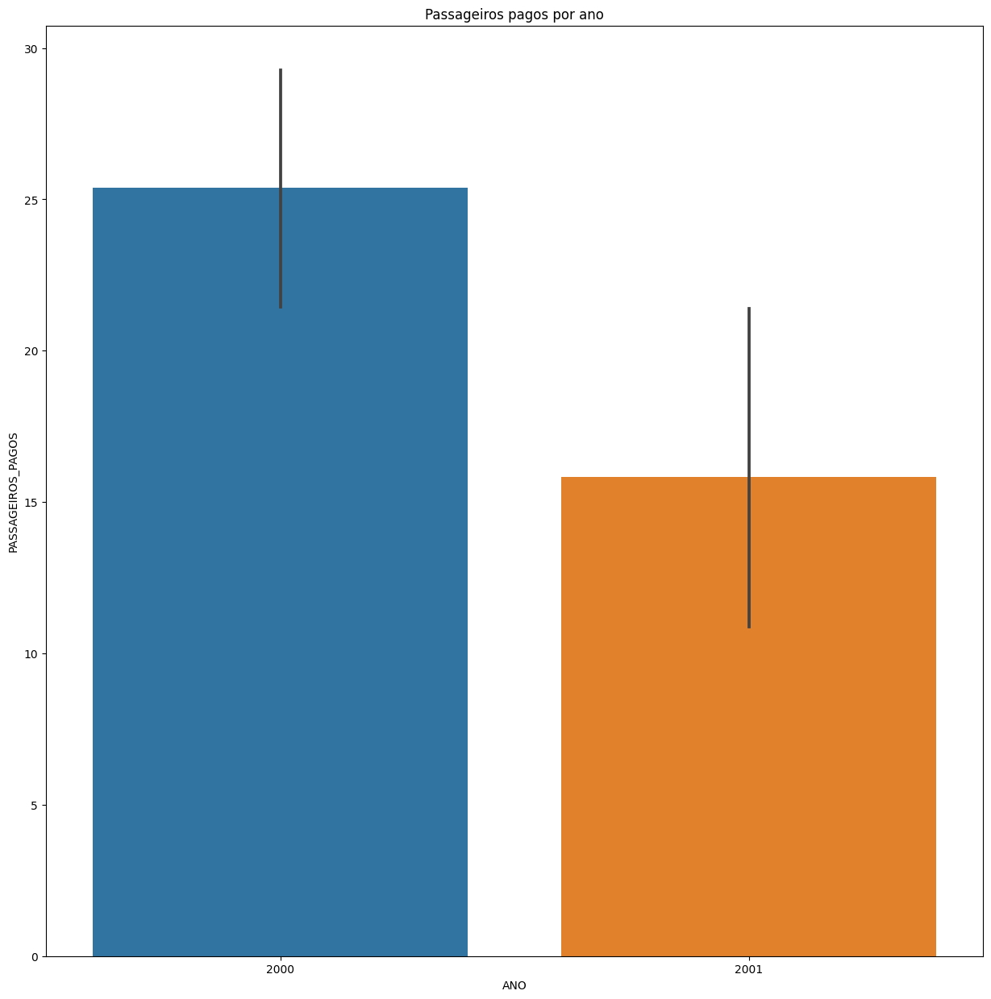





AVIANCA PERU S.A (EX: TRANS AMERICAN AIRLINES S.A. - TACA PERU)


count    1225.000000
mean     2919.350204
std      2030.042640
min         0.000000
25%      1059.000000
50%      3112.000000
75%      4257.000000
max      8546.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


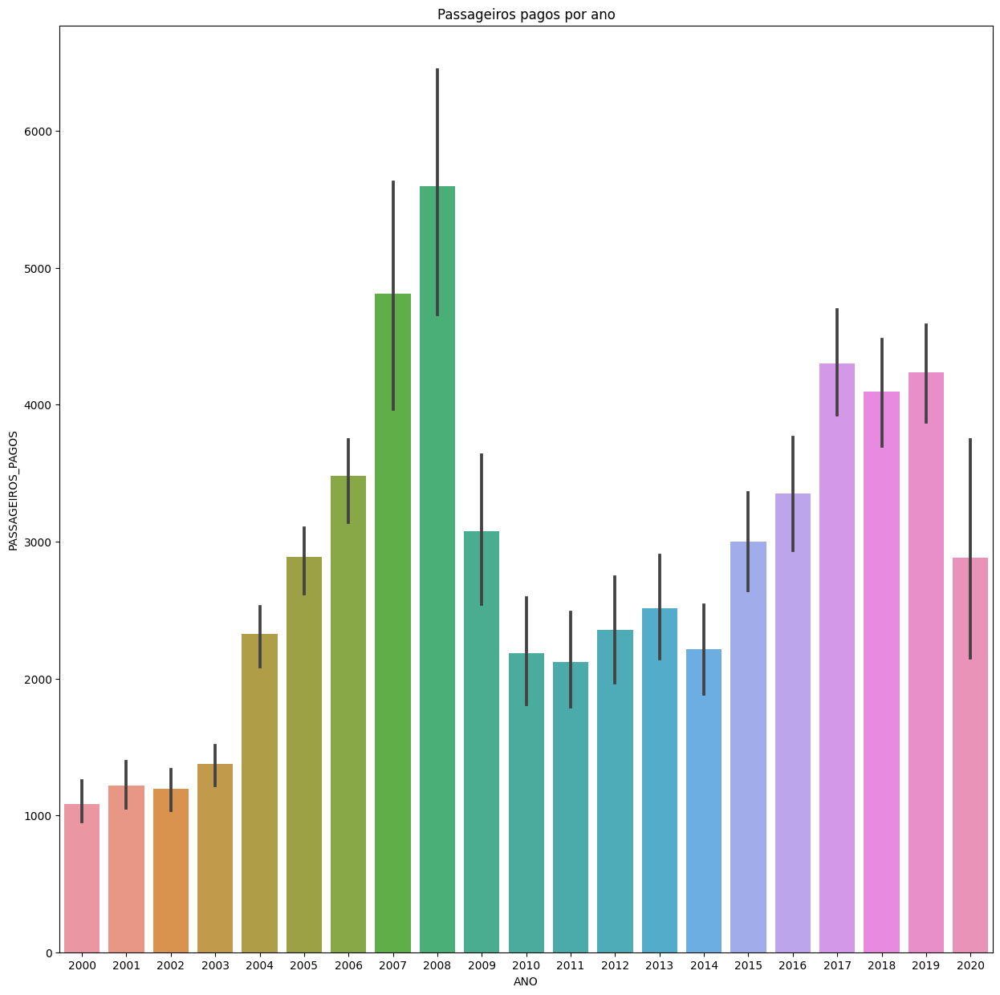





TAF LINHAS AÉREAS S.A.


count    3369.000000
mean      109.898783
std       247.596651
min         0.000000
25%         0.000000
50%         0.000000
75%        82.000000
max      2896.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


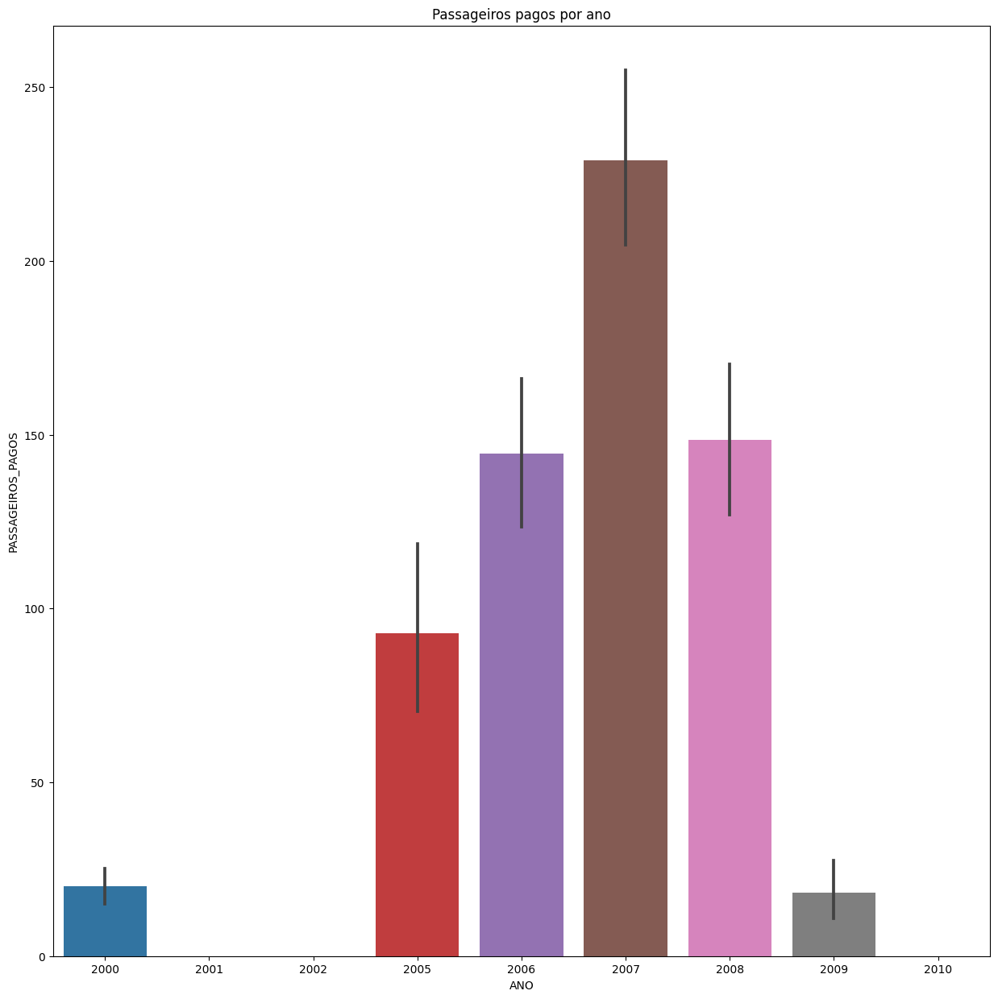





TOTAL LINHAS AÉREAS S.A.


count    18068.000000
mean       227.032488
std        569.878069
min          0.000000
25%          0.000000
50%          0.000000
75%        143.000000
max       4929.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


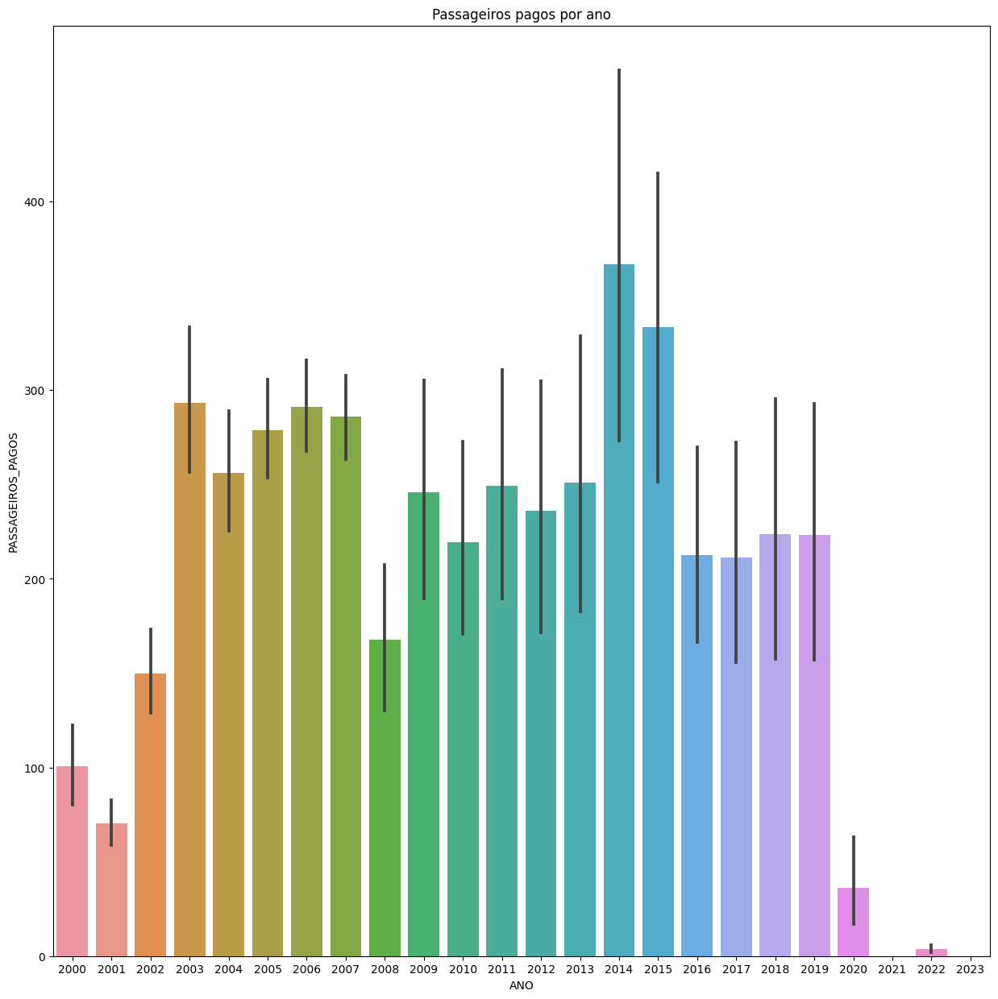





TAVAJ


count    2538.000000
mean      115.276990
std       146.824418
min         0.000000
25%        13.000000
50%        59.000000
75%       158.750000
max       975.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


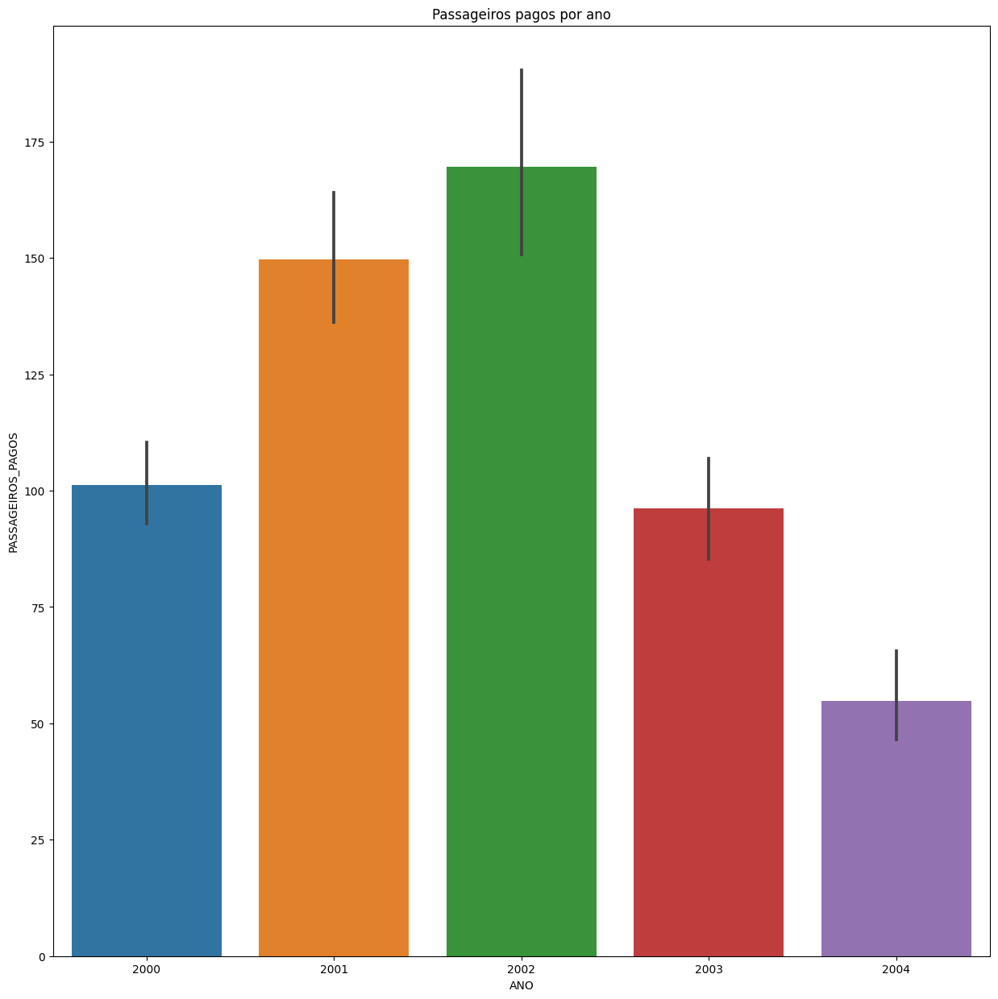





UNITED AIRLINES, INC


count    3339.000000
mean     3177.208446
std      2561.277886
min         0.000000
25%       214.000000
50%      3634.000000
75%      5397.000000
max      9961.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


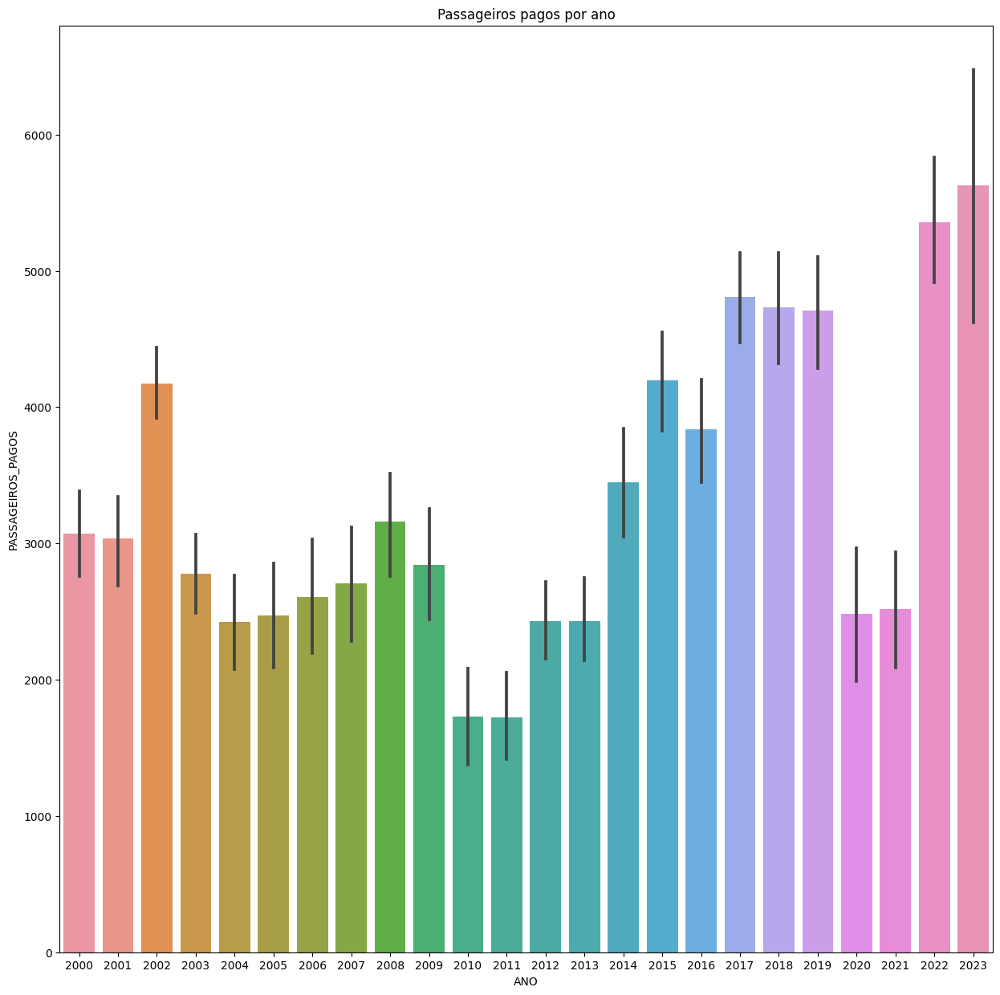





VARIG - VIAÇÃO AÉREA RIO-GRANDENSE


count    42631.000000
mean      1704.567615
std       3885.842125
min          0.000000
25%         69.000000
50%        473.000000
75%       1714.500000
max      69889.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


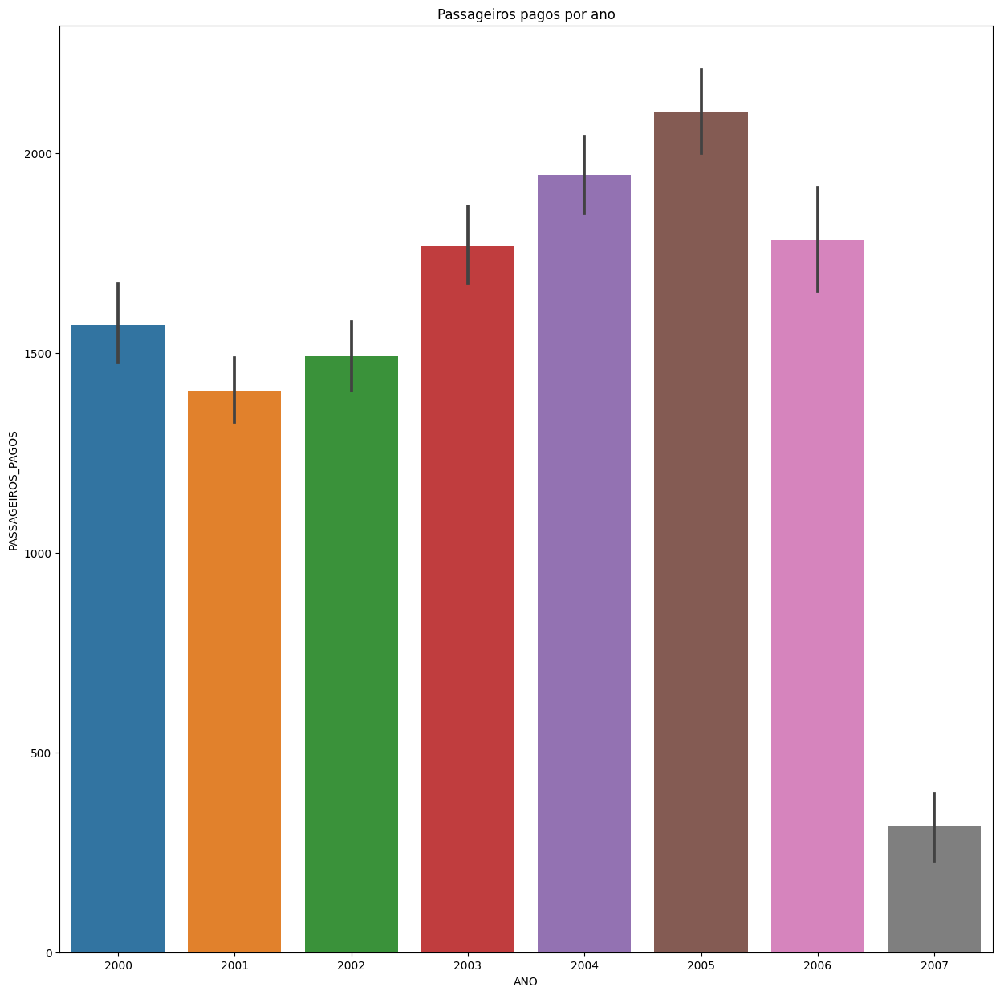





VIAÇÃO AÉREA SÃO PAULO


count    22739.000000
mean       740.417609
std       1744.509598
min          0.000000
25%         25.000000
50%        233.000000
75%        811.000000
max      31612.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


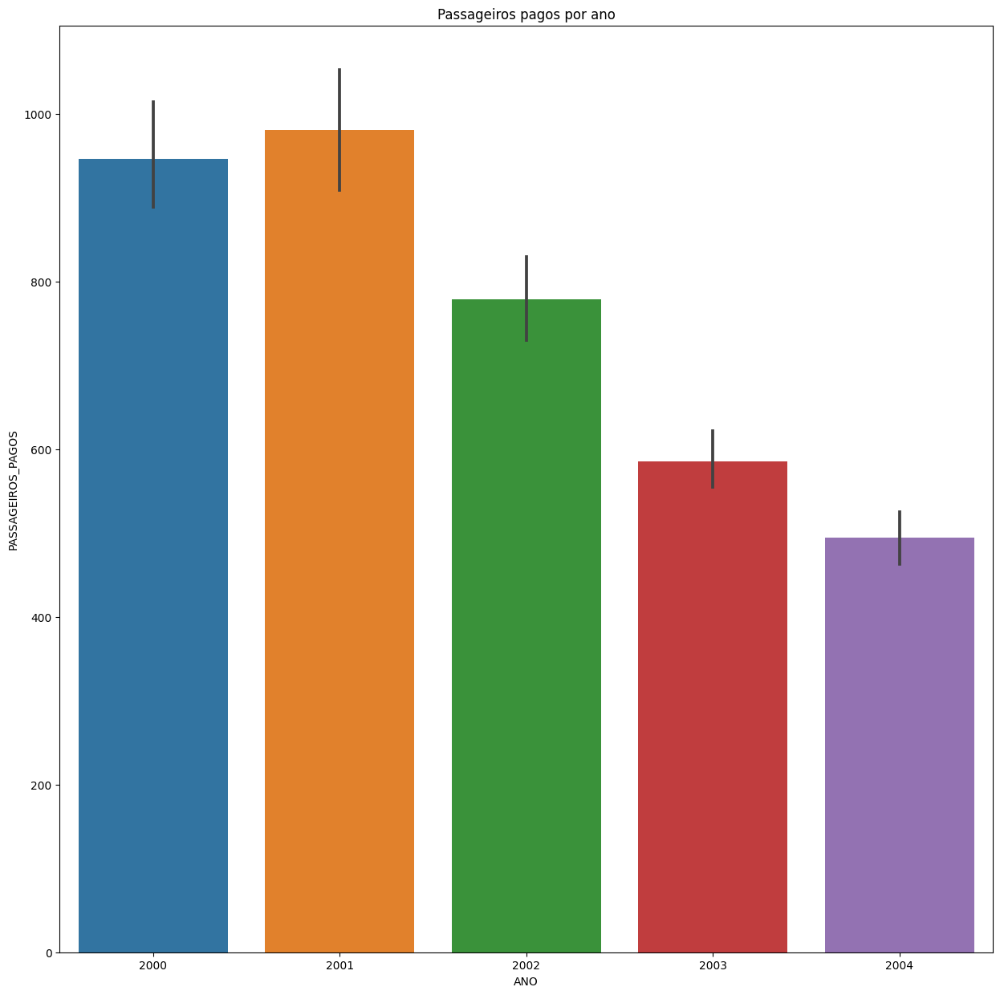





CONDOR FLUGDIENST GMBH


count     675.000000
mean     1182.718519
std       569.695955
min         0.000000
25%       891.500000
50%      1002.000000
75%      1432.000000
max      3336.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


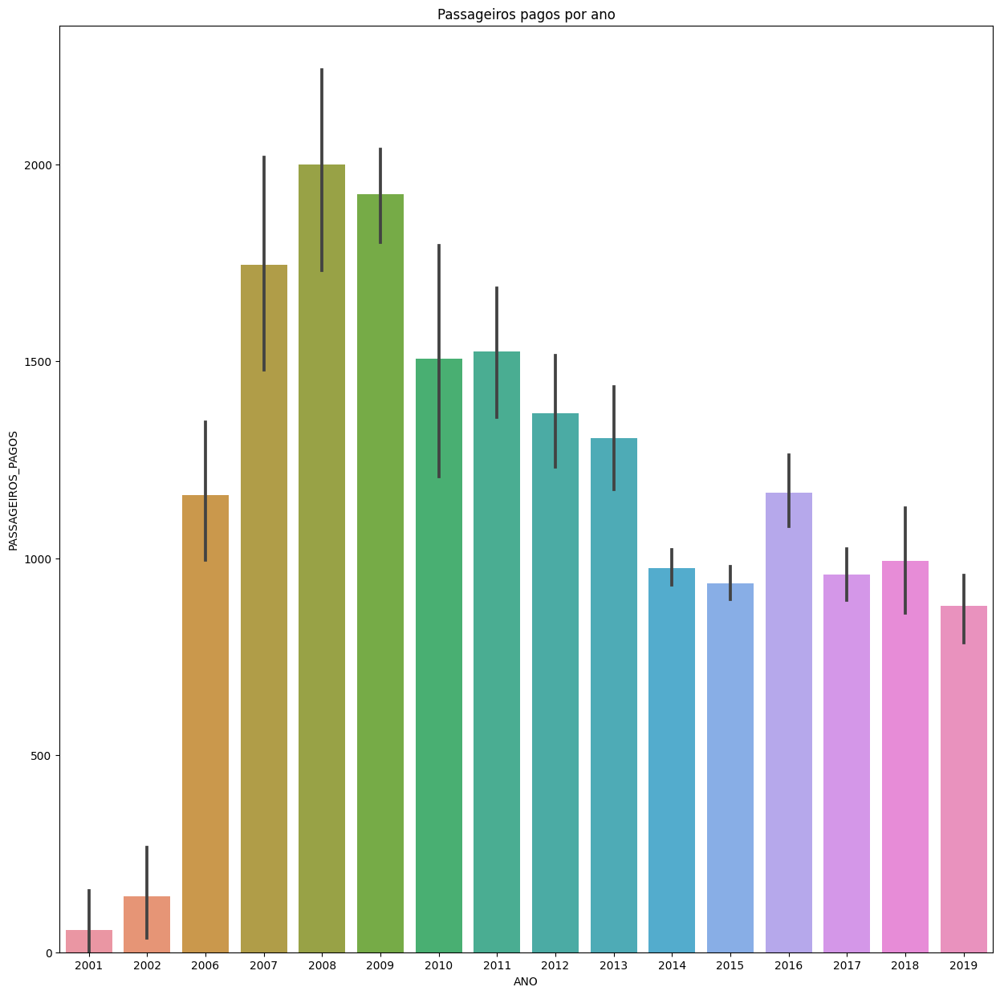





CIELOS DEL PERU


count    1375.0
mean        0.0
std         0.0
min         0.0
25%         0.0
50%         0.0
75%         0.0
max         0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


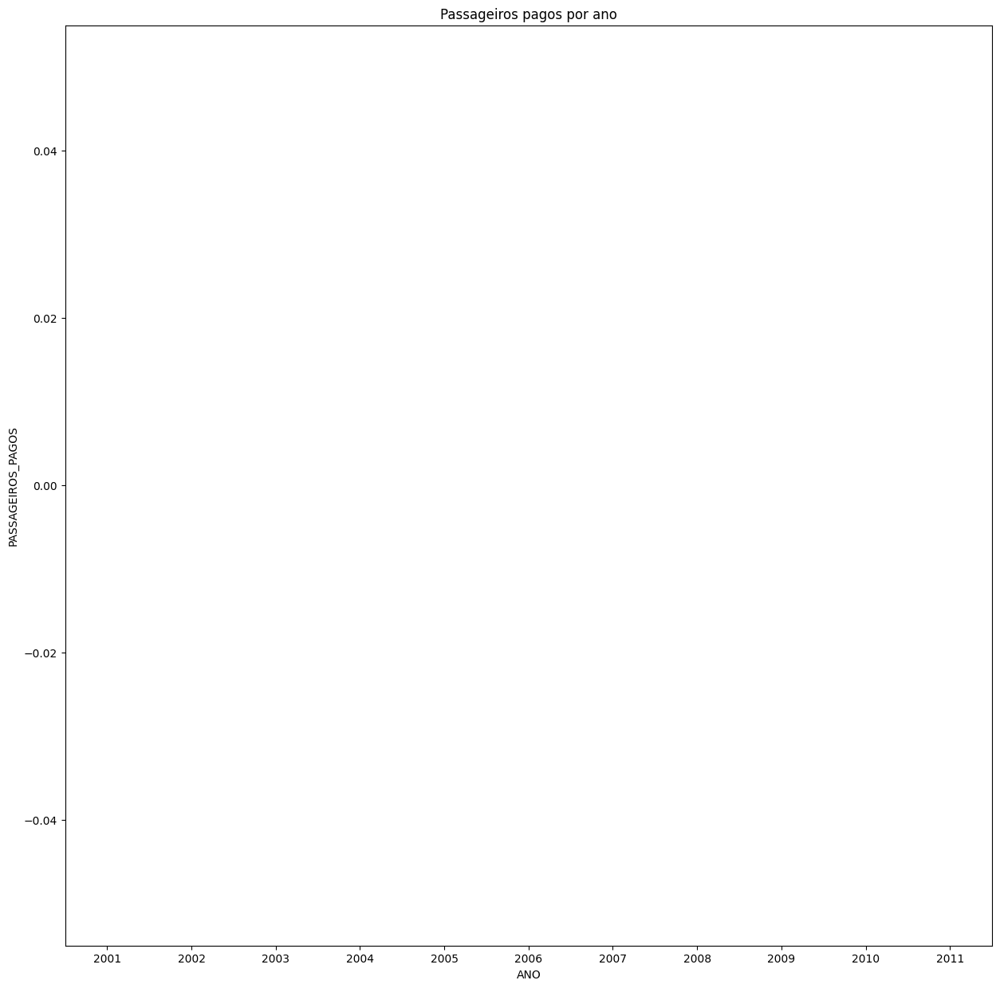





GOL LINHAS AÉREAS S.A. (EX- VRG LINHAS AÉREAS S.A.)


count    134780.000000
mean       3828.560424
std        6301.021697
min           0.000000
25%         200.000000
50%        1382.000000
75%        4772.000000
max       88965.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


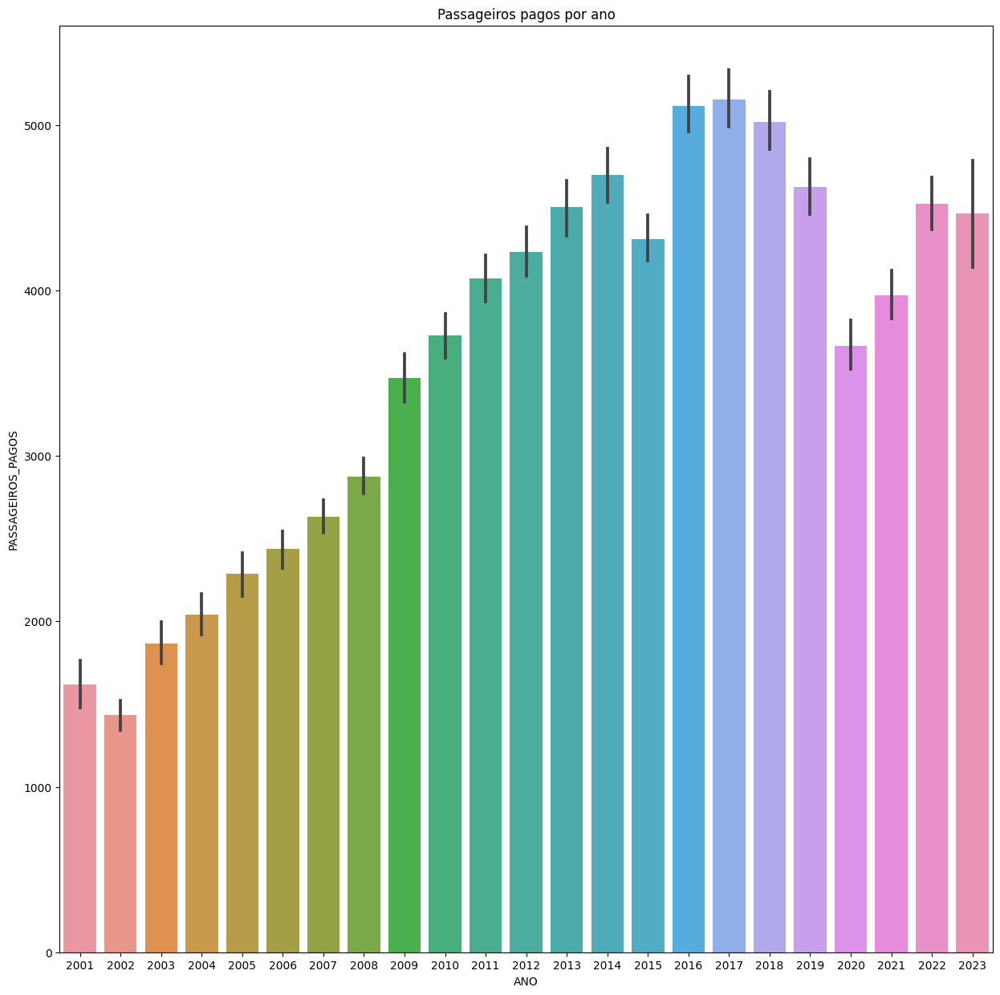





ATLAS AIR INC


count    4209.000000
mean        0.800665
std        15.145161
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max       470.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


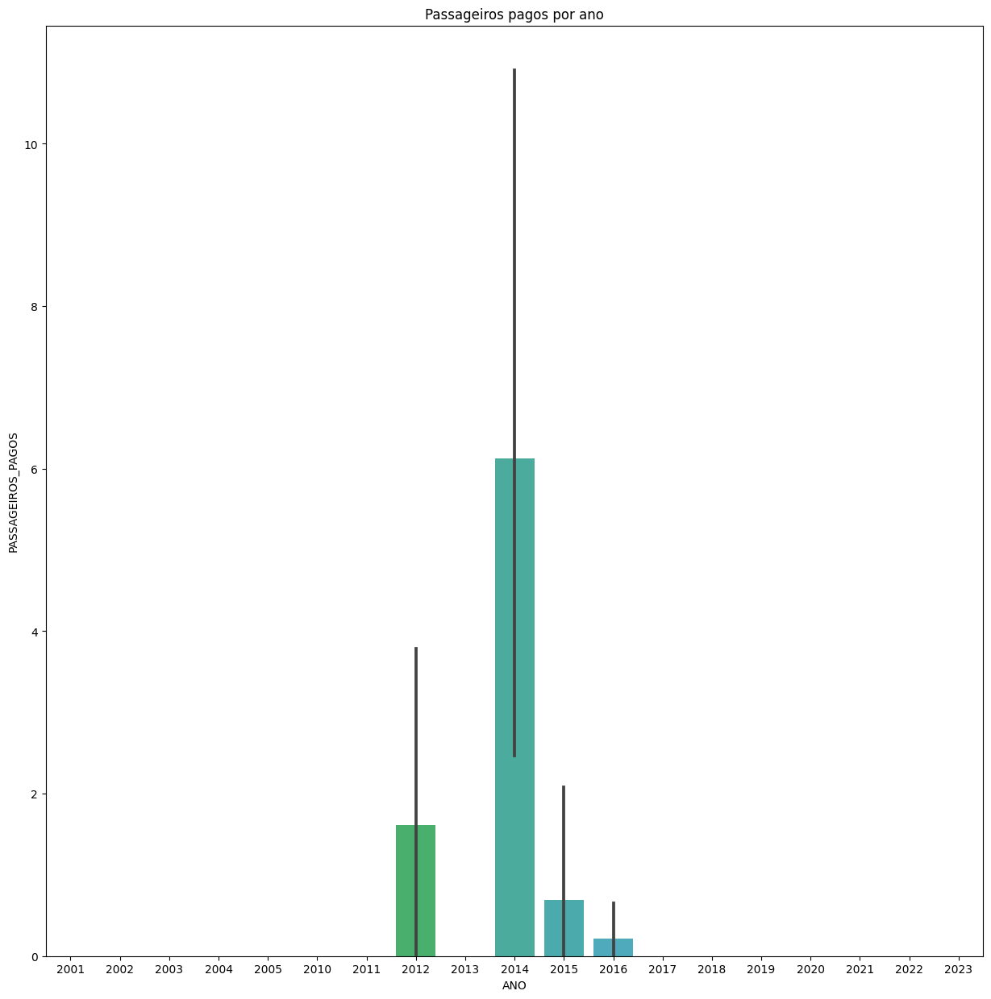





TRANSPORTE AÉREO SA - TASA (LAN EXPRESS)


count     775.000000
mean     1593.643871
std      1312.790867
min         0.000000
25%         0.000000
50%      2038.000000
75%      2684.000000
max      5102.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


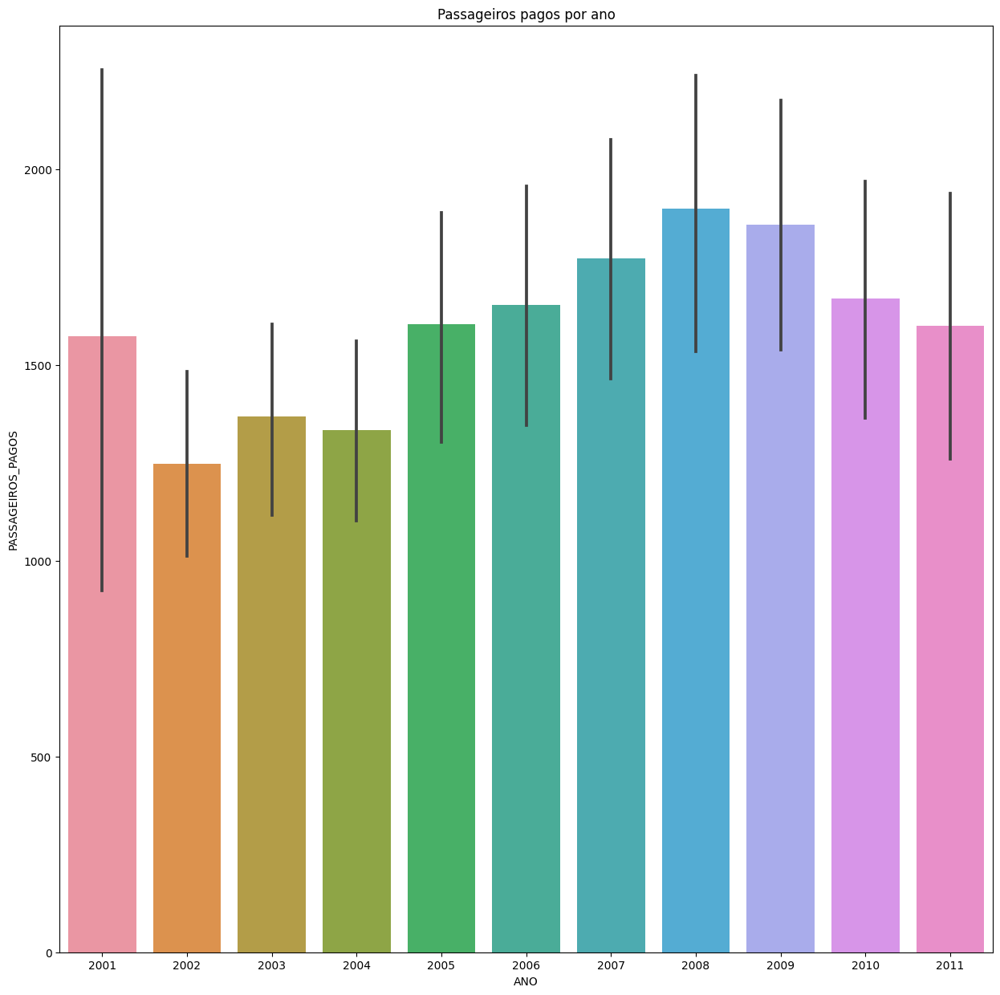





AEROTRANSPORTES MAS DE CARGA S.A. DE C.V.


count    1996.0
mean        0.0
std         0.0
min         0.0
25%         0.0
50%         0.0
75%         0.0
max         0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


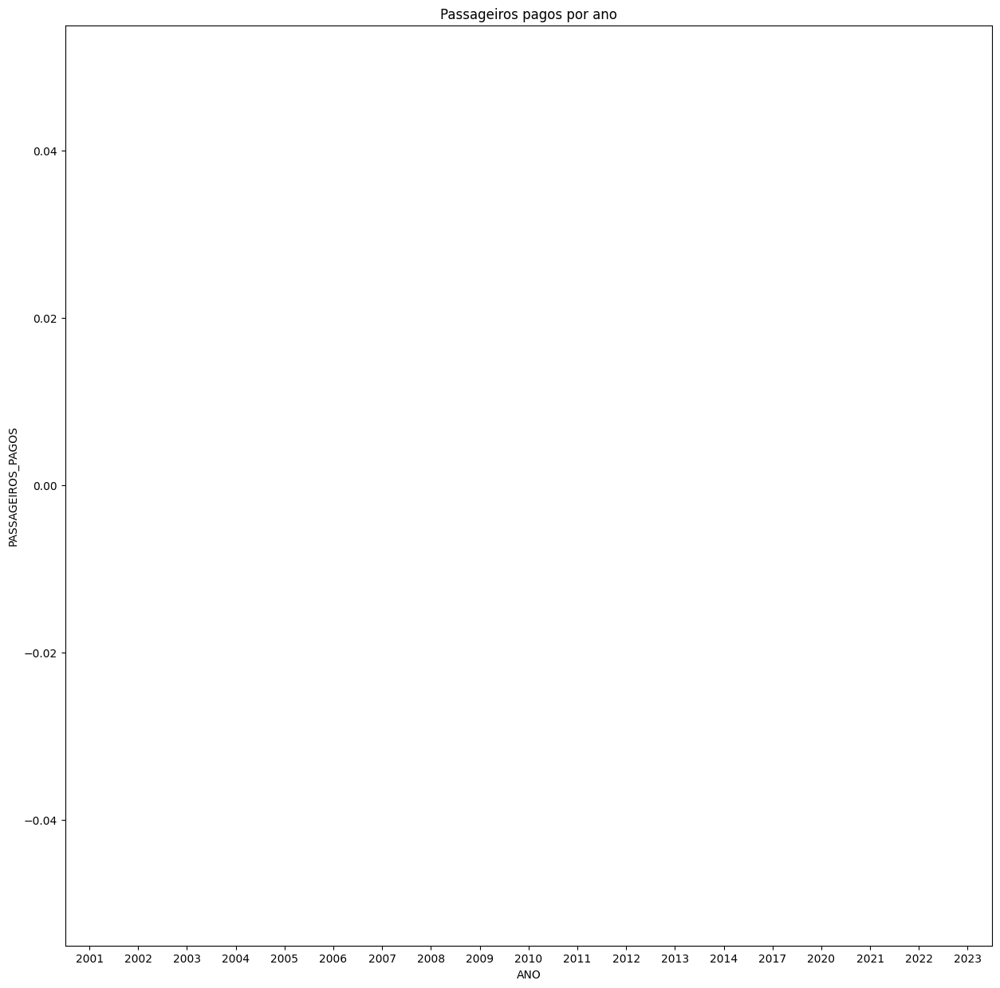





DINAR LÍNEAS AEREAS


count      37.000000
mean      429.405405
std       393.659290
min         2.000000
25%       142.000000
50%       255.000000
75%       676.000000
max      1348.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


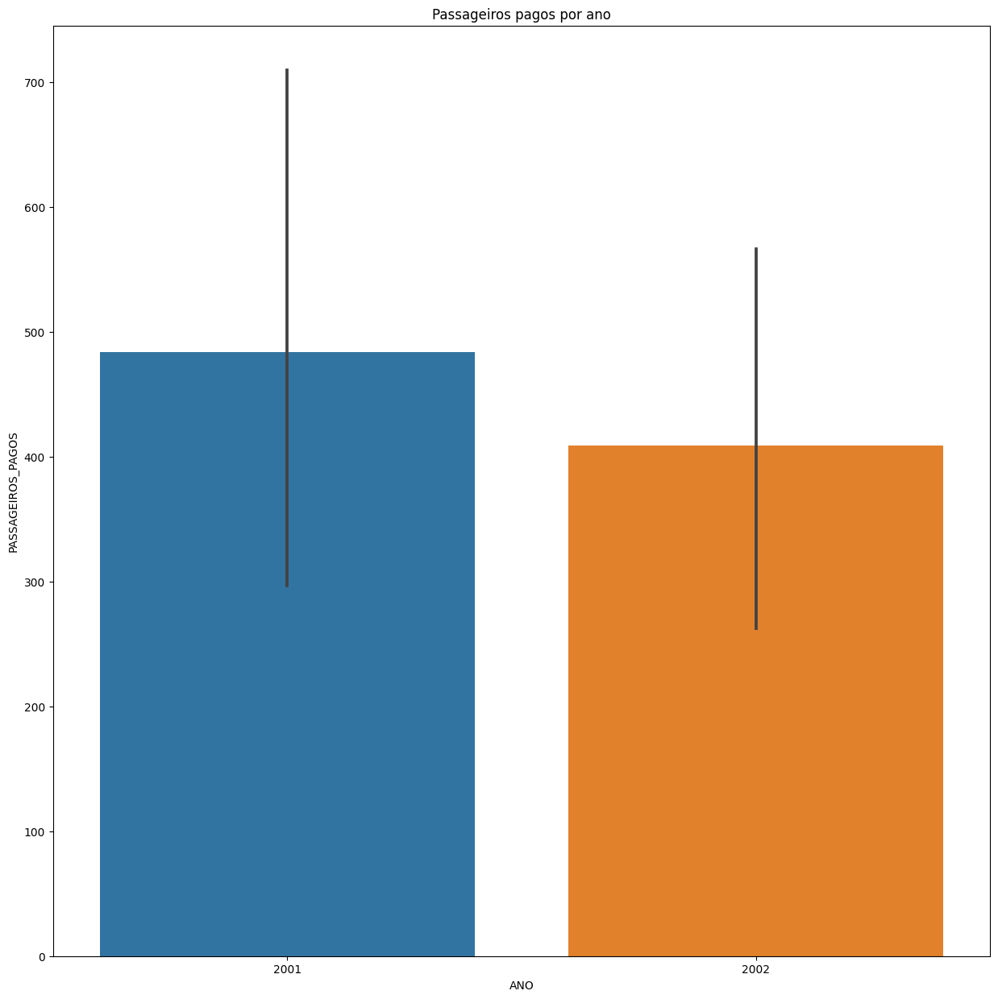





TAMPA CARGO S.A.


count    3498.0
mean        0.0
std         0.0
min         0.0
25%         0.0
50%         0.0
75%         0.0
max         0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


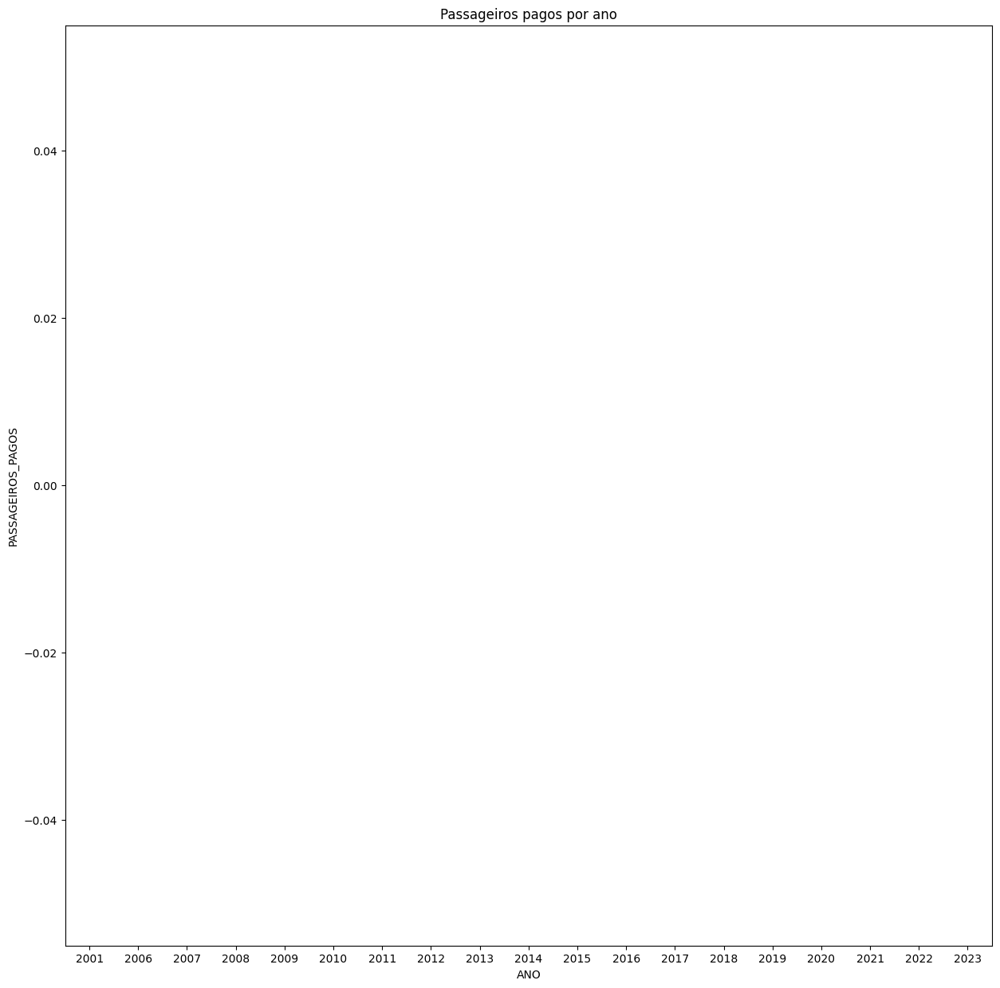





UPS - UNITED PARCEL SERVICE CO.


count    2497.0
mean        0.0
std         0.0
min         0.0
25%         0.0
50%         0.0
75%         0.0
max         0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


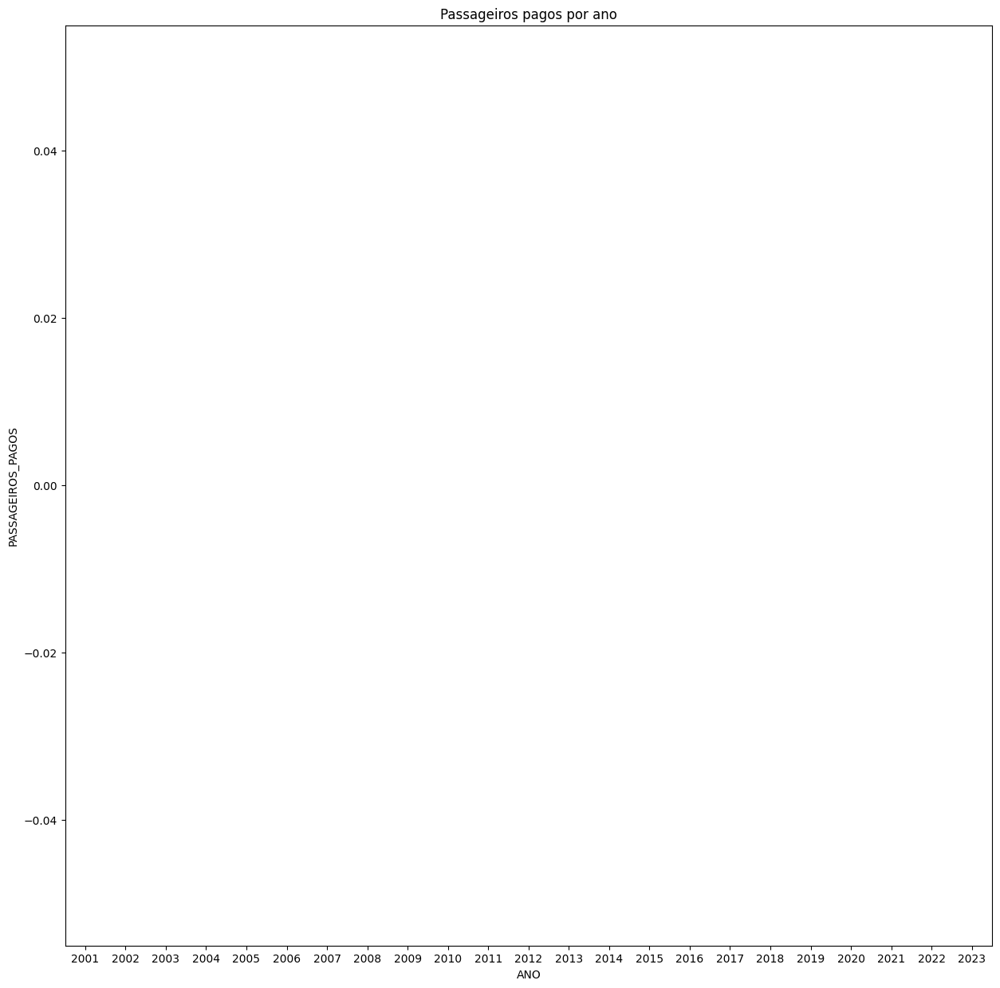





VARIG LOGÍSTICA S.A.


count    8194.0
mean        0.0
std         0.0
min         0.0
25%         0.0
50%         0.0
75%         0.0
max         0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


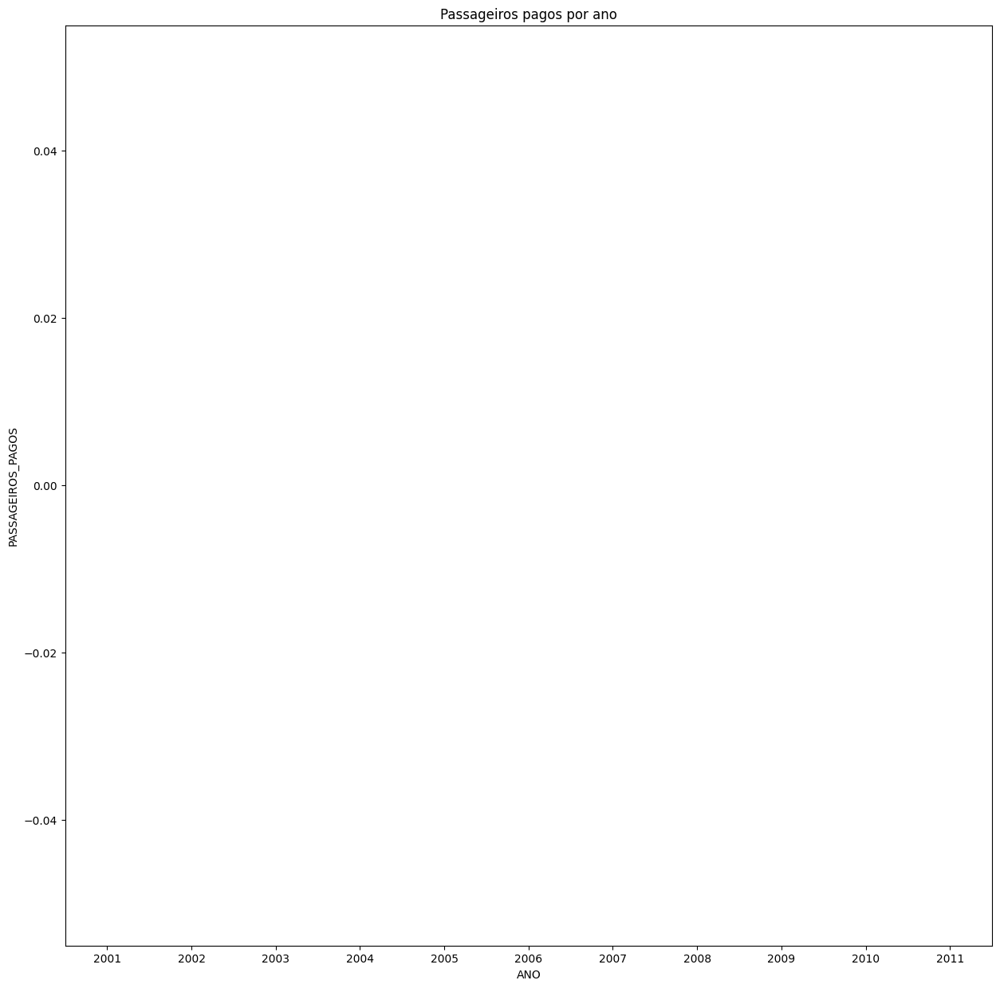





LAN PERU S.A.


count     1180.000000
mean      2483.693220
std       2261.992258
min          0.000000
25%        372.500000
50%       2149.500000
75%       3510.500000
max      10238.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


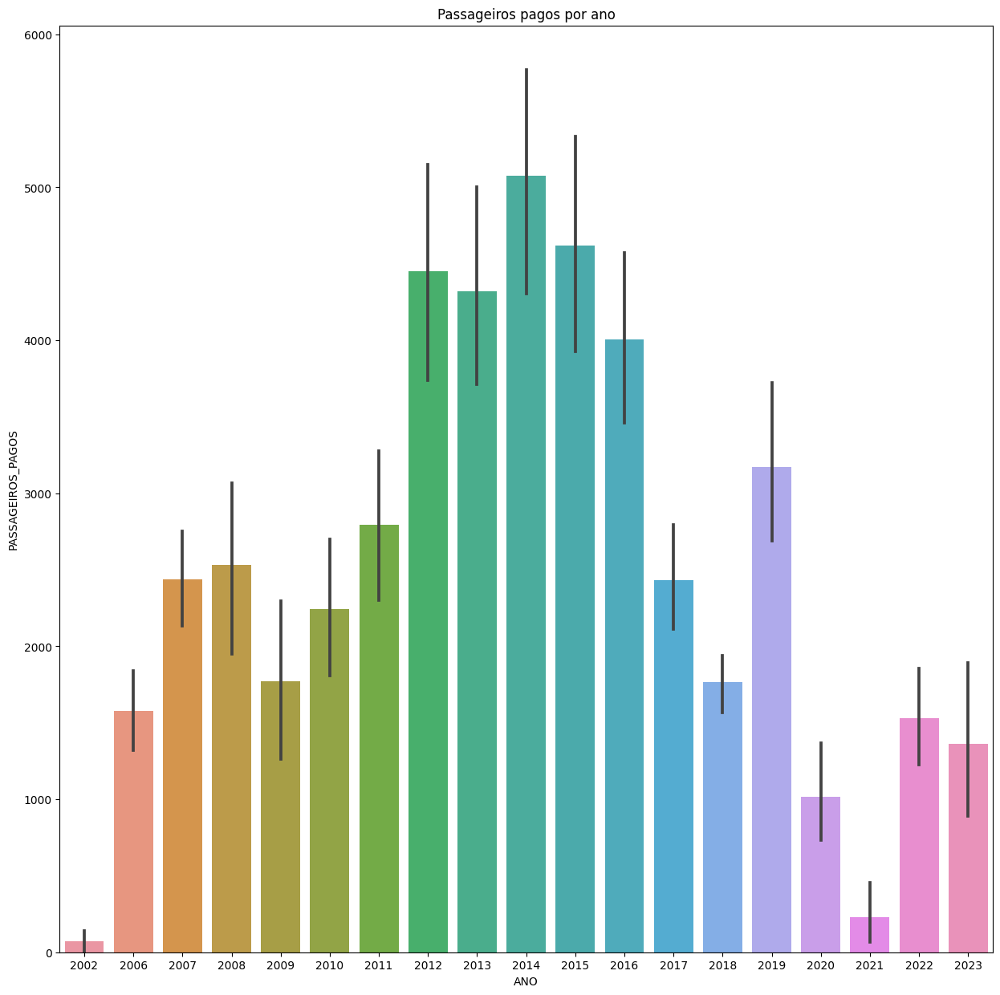





ABSA - AEROLINHAS BRASILEIRAS S.A.


count    19317.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


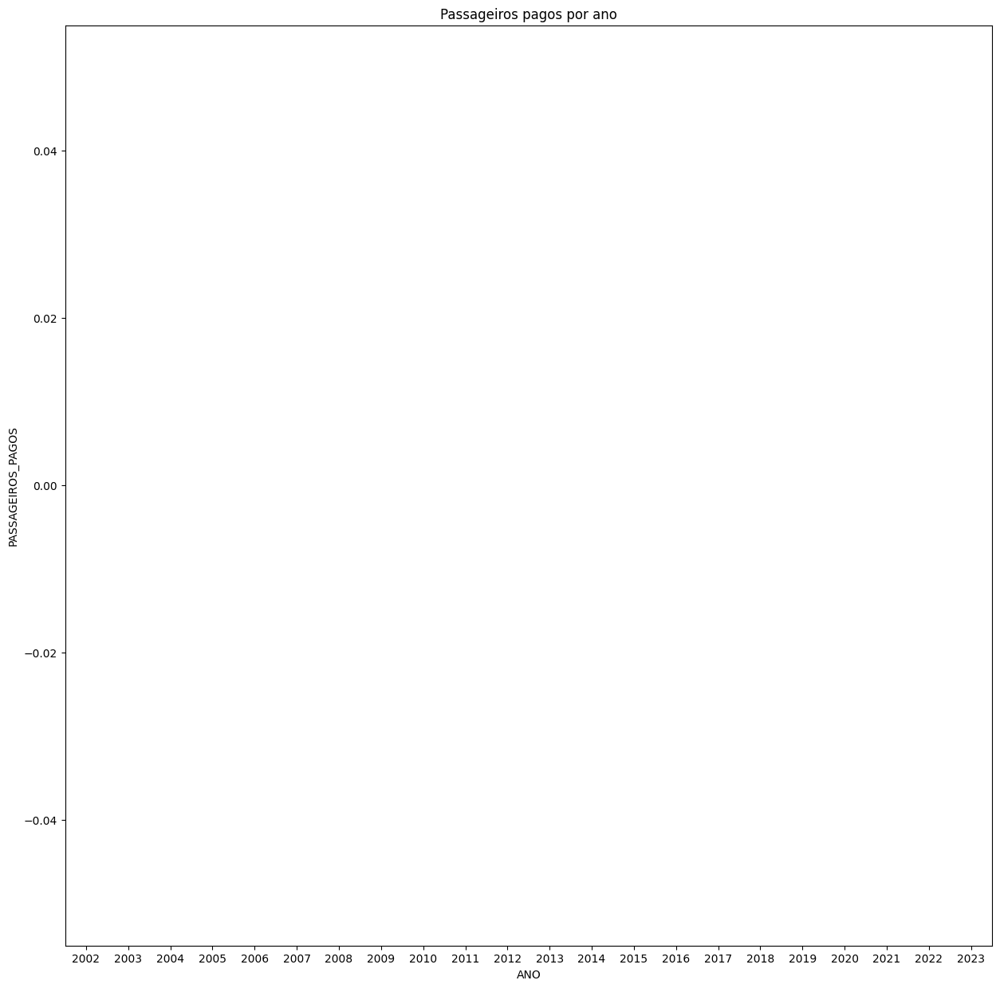





PUMA AIR LINHAS AÉREAS LTDA.


count    2928.000000
mean      112.591530
std       368.901322
min         0.000000
25%         5.000000
50%        22.000000
75%        89.000000
max      6025.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


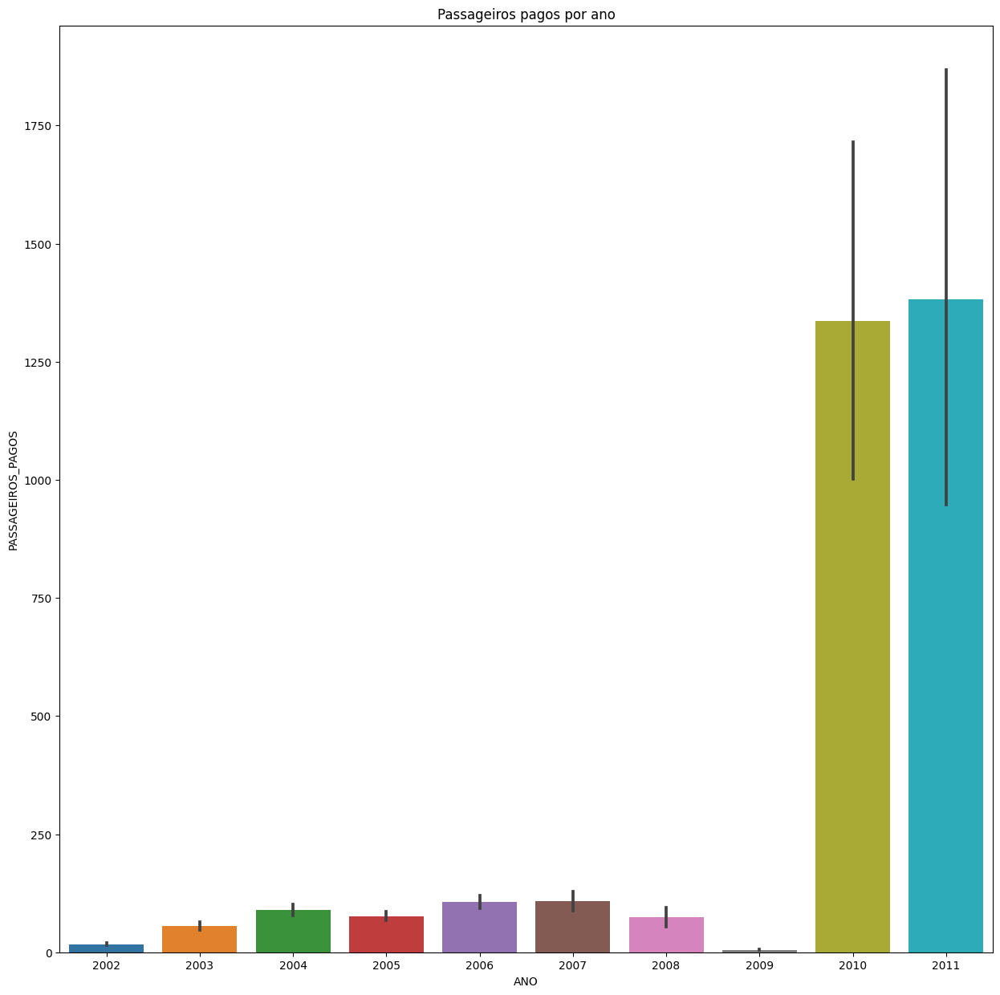





BRASMEX - BRASIL MINAS EXPRESS LTDA.


count    86.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


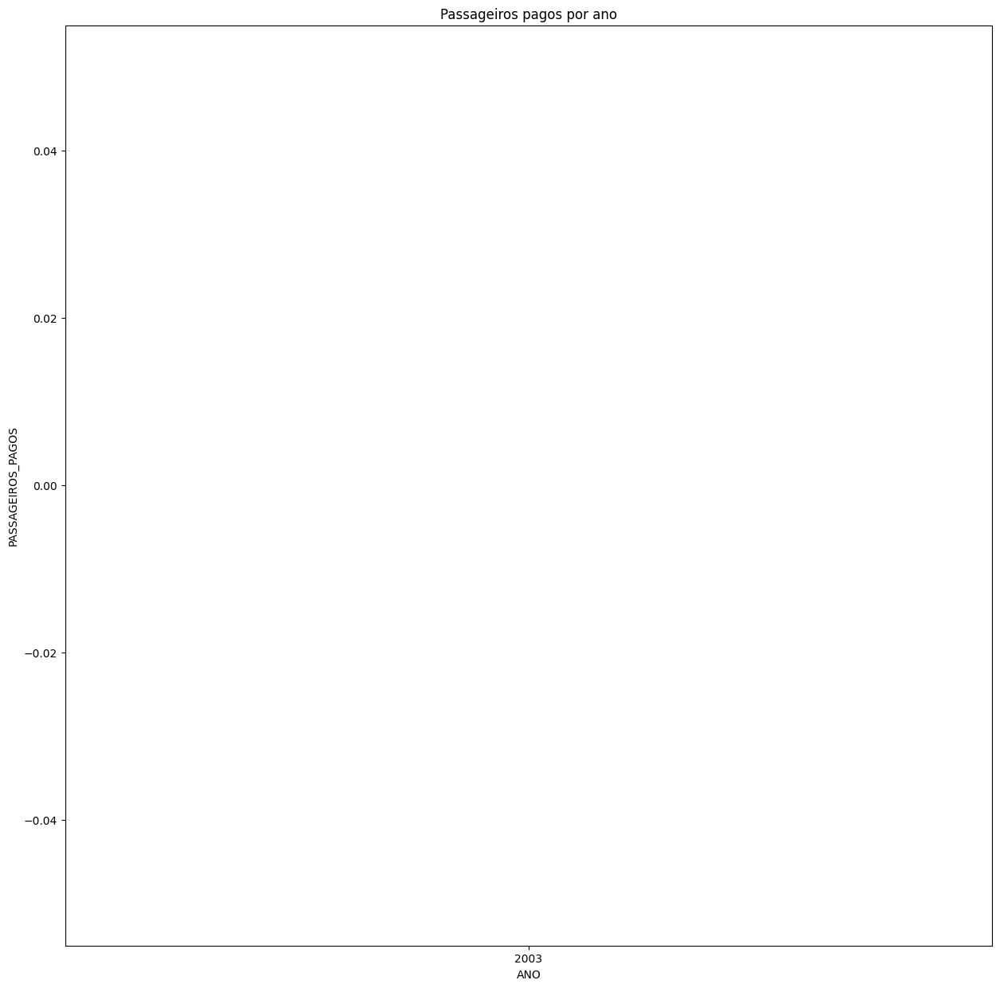





OCEANAIR LINHAS AÉREAS S.A. (AVIANCA)


count    31446.000000
mean      2295.292183
std       4258.159903
min          0.000000
25%         29.000000
50%        449.000000
75%       2958.750000
max      36564.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


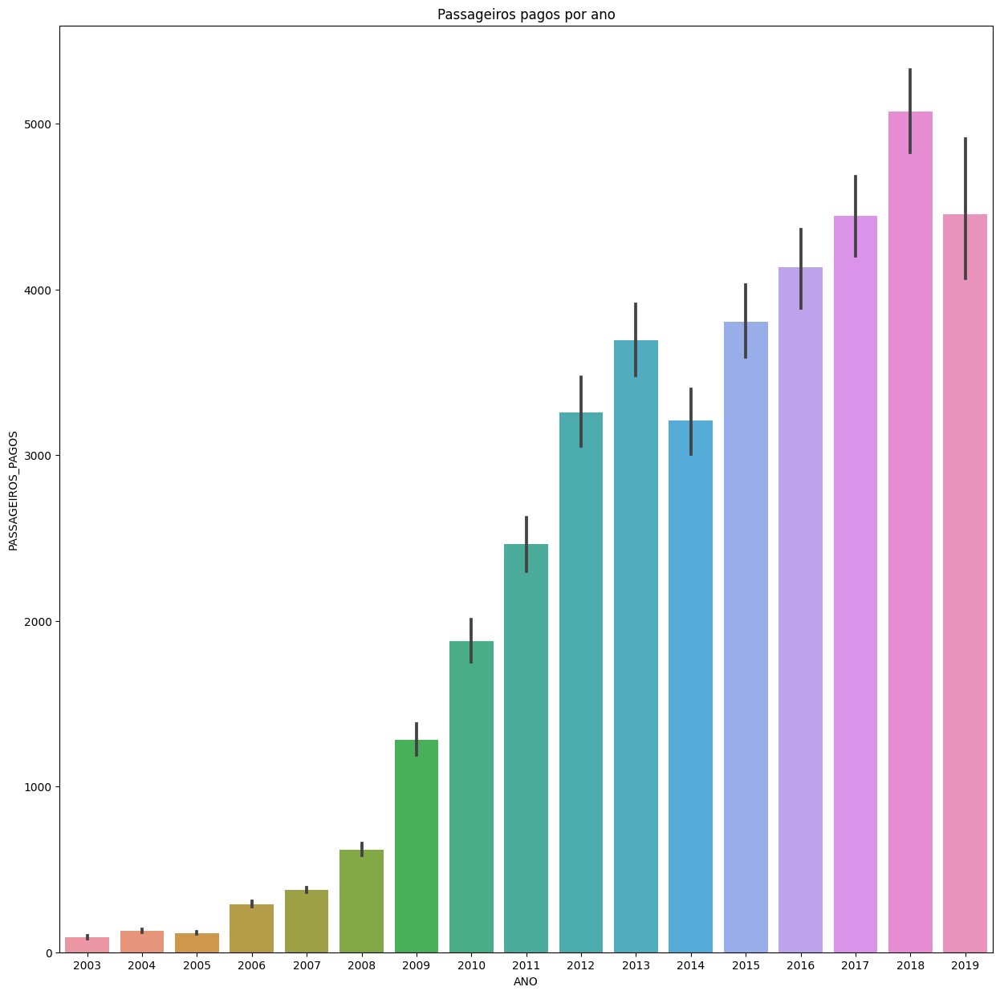





ATA BRASIL


count     282.000000
mean       37.078014
std       131.941865
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max      1062.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


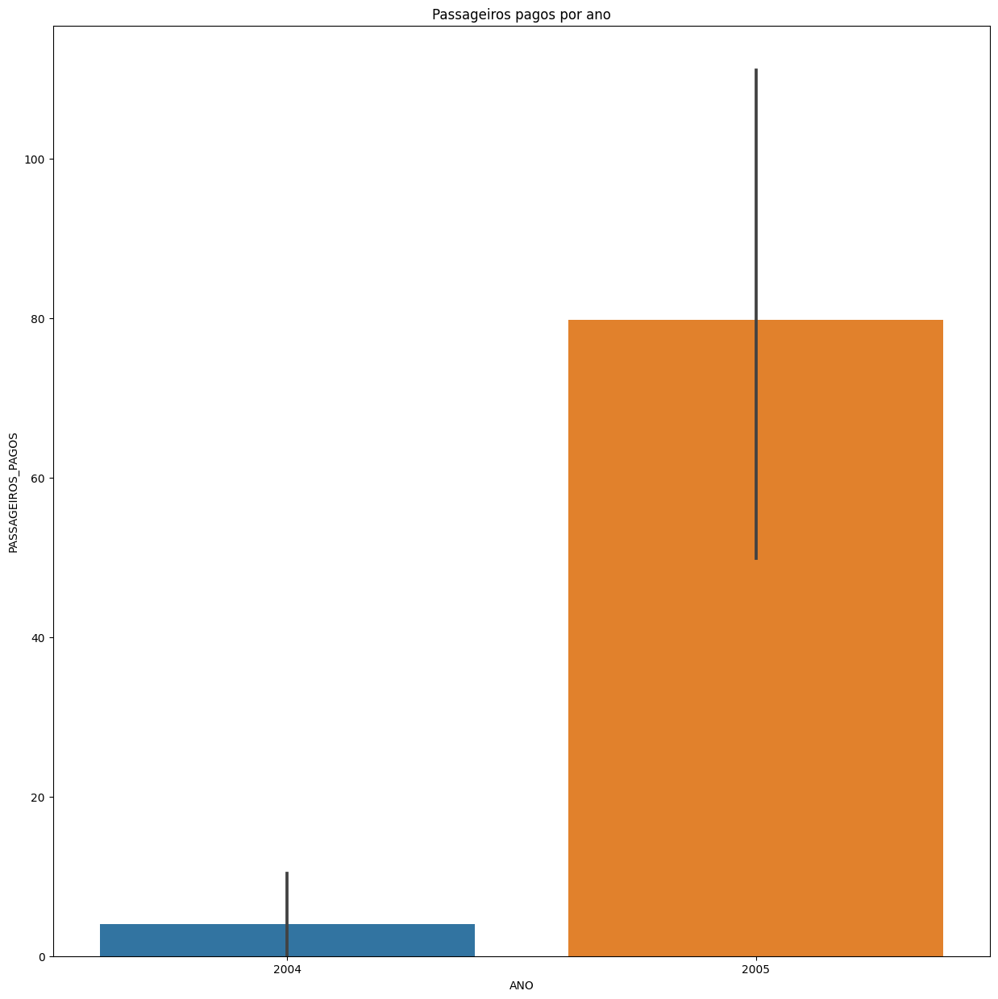





AIR EUROPA LINEAS AEREAS SOCIEDAD ANONIMA


count      890.000000
mean      3076.491011
std       2584.298739
min          0.000000
25%       1145.000000
50%       2658.000000
75%       3722.250000
max      10170.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


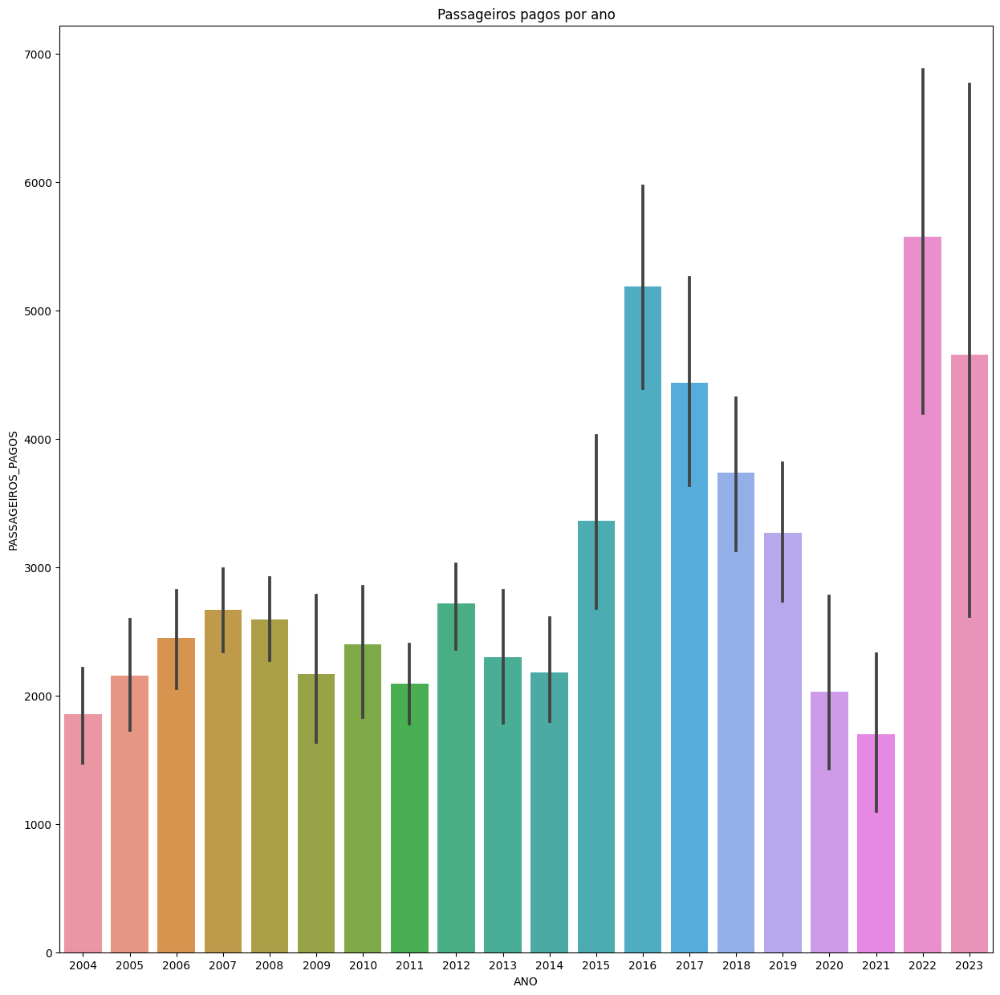





CARGOLUX AIRLINES INTERNATIONAL S/A


count    8981.0
mean        0.0
std         0.0
min         0.0
25%         0.0
50%         0.0
75%         0.0
max         0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


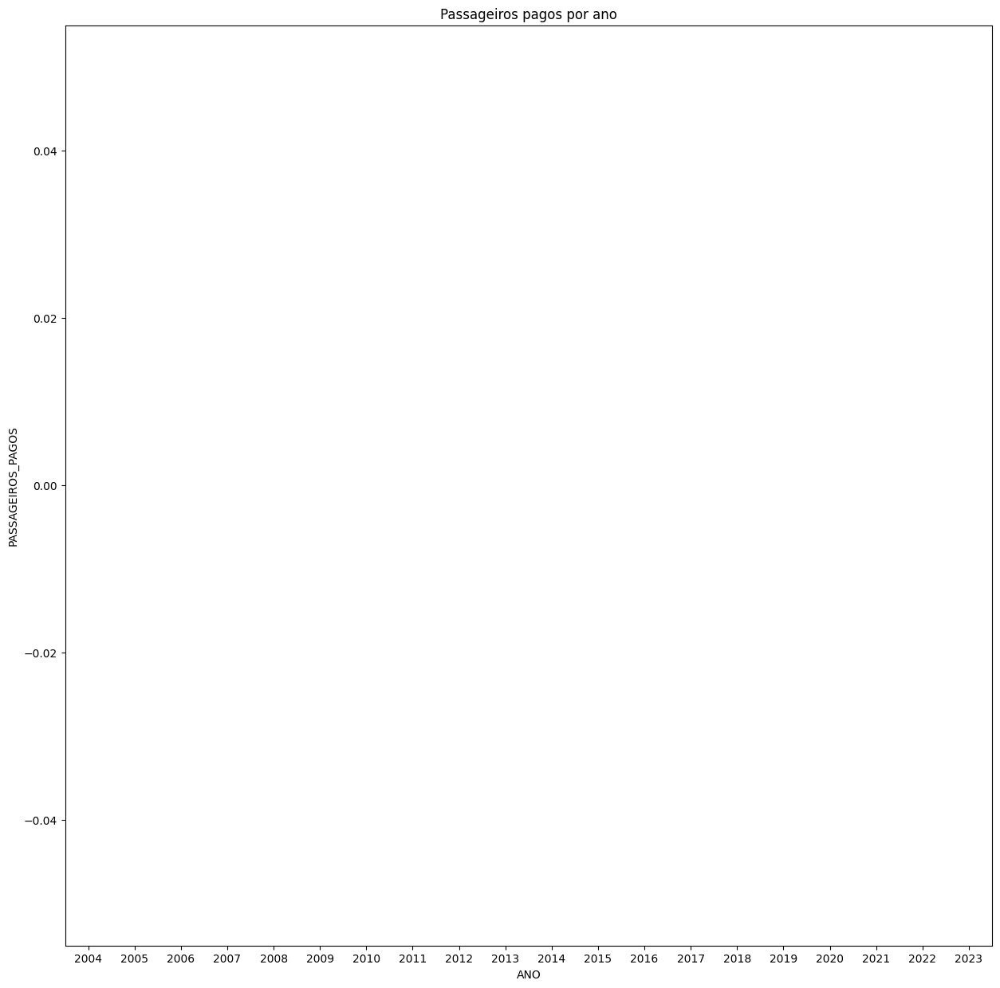





AIR EURO AMERICA


count    177.000000
mean     112.389831
std      116.385188
min        0.000000
25%       25.000000
50%       78.000000
75%      149.000000
max      554.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


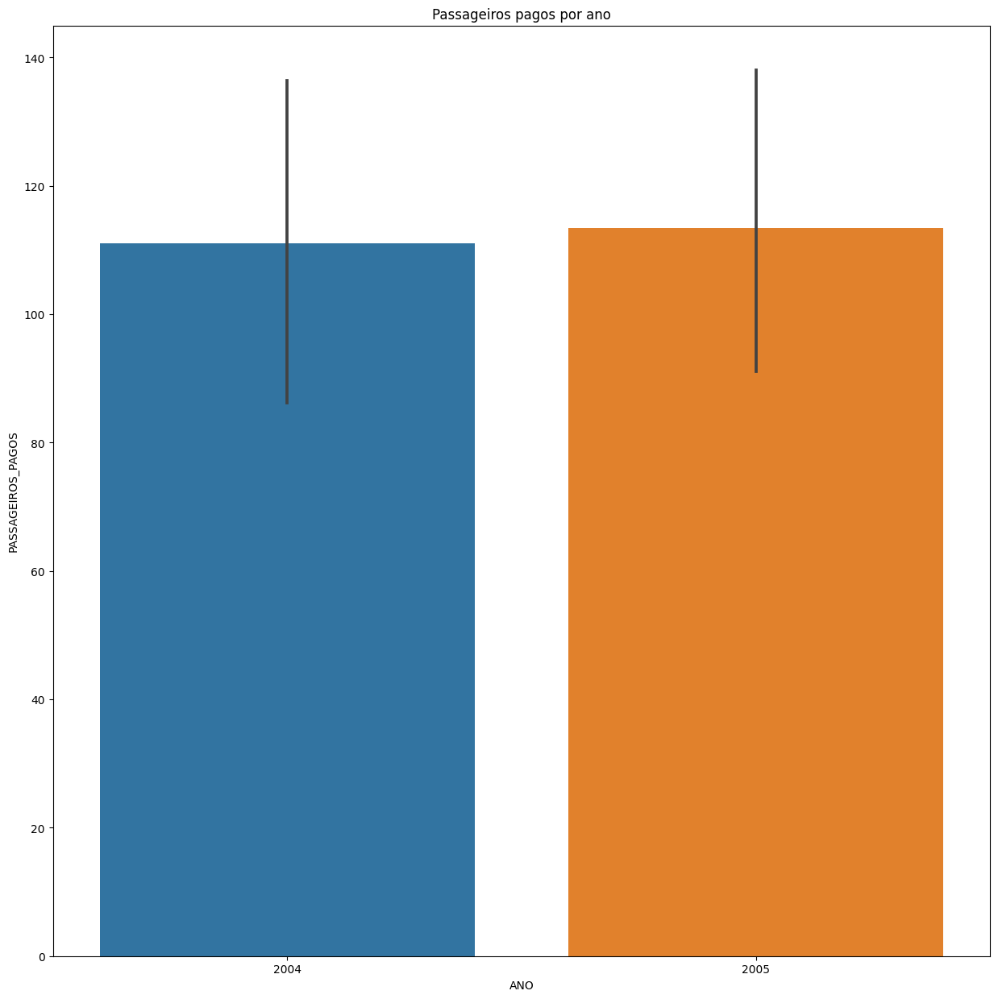





AEROSUR - CIA BOLIVIANA DE TRANSPORTE AÉREO PRIVADO S.A.


count     238.000000
mean     2298.184874
std      1278.716501
min         0.000000
25%      1111.750000
50%      2667.000000
75%      3334.750000
max      4690.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


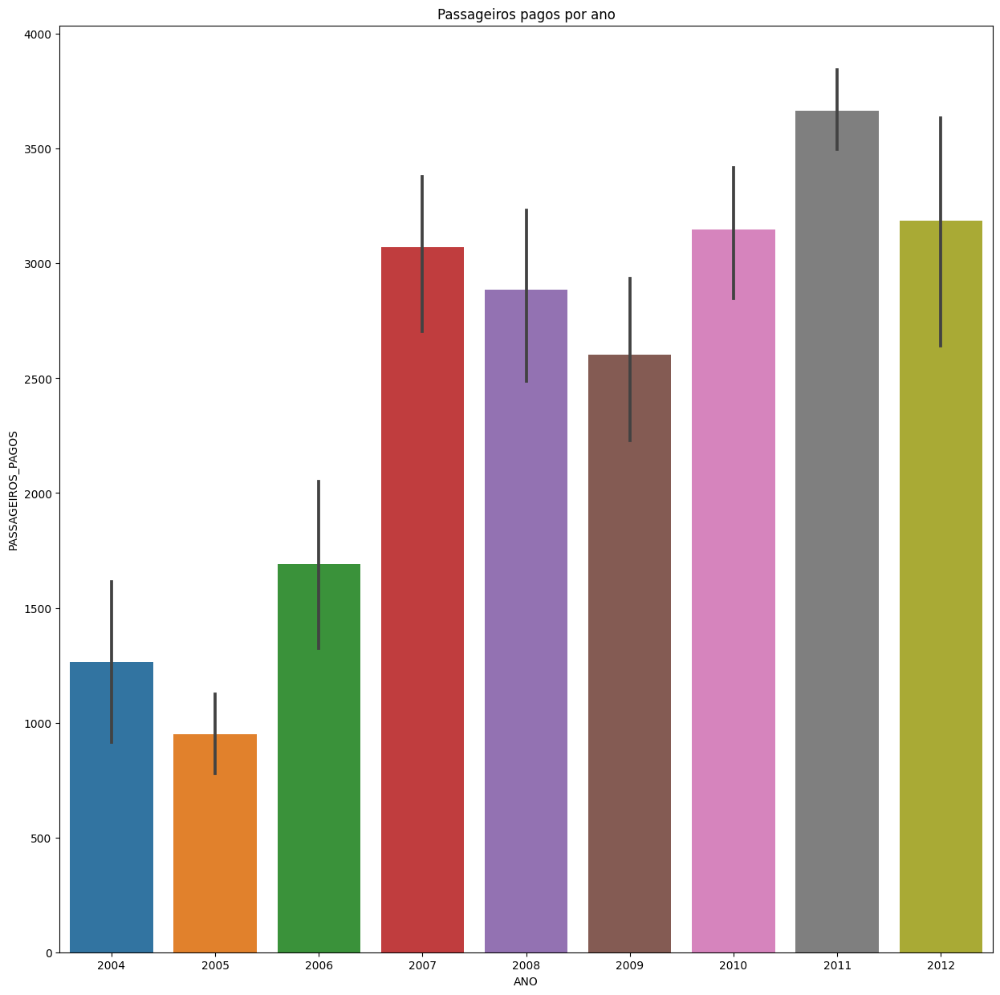





SKYMASTER


count    1151.0
mean        0.0
std         0.0
min         0.0
25%         0.0
50%         0.0
75%         0.0
max         0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


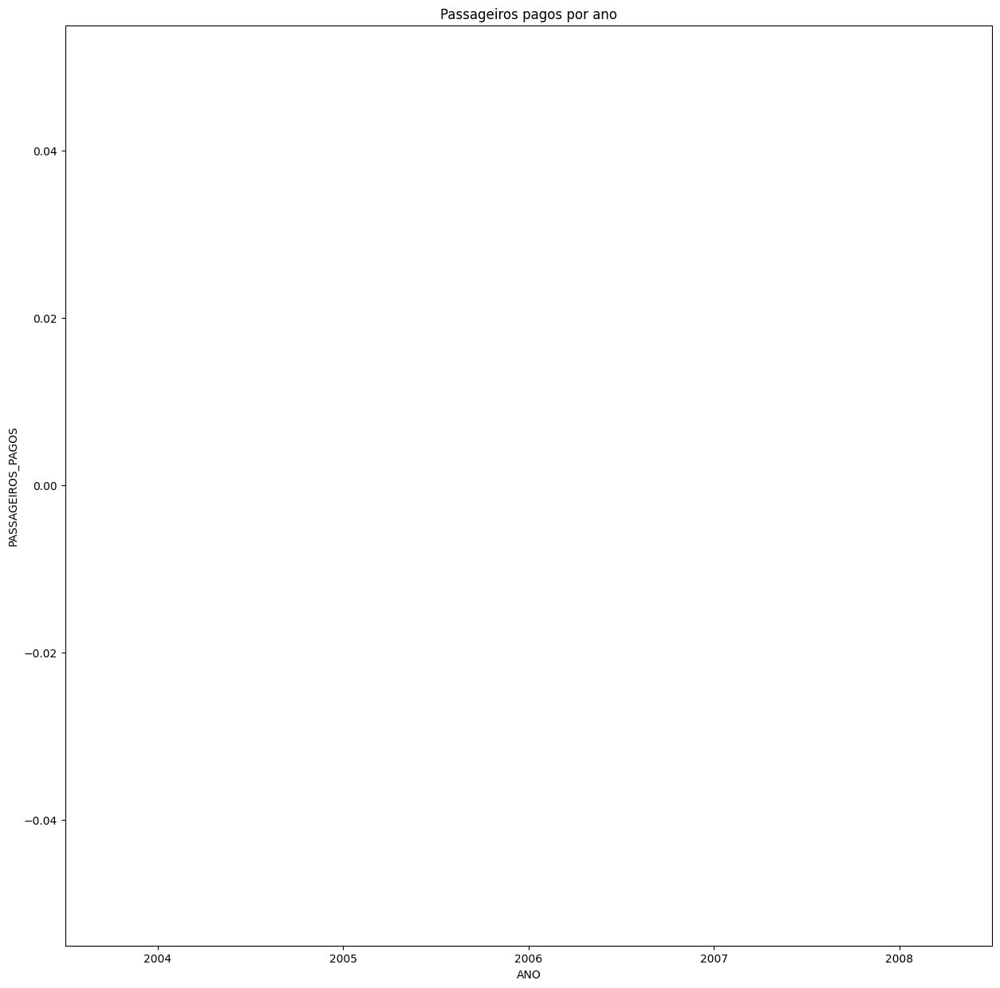





ARROW AIR, INC.


count    1091.0
mean        0.0
std         0.0
min         0.0
25%         0.0
50%         0.0
75%         0.0
max         0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


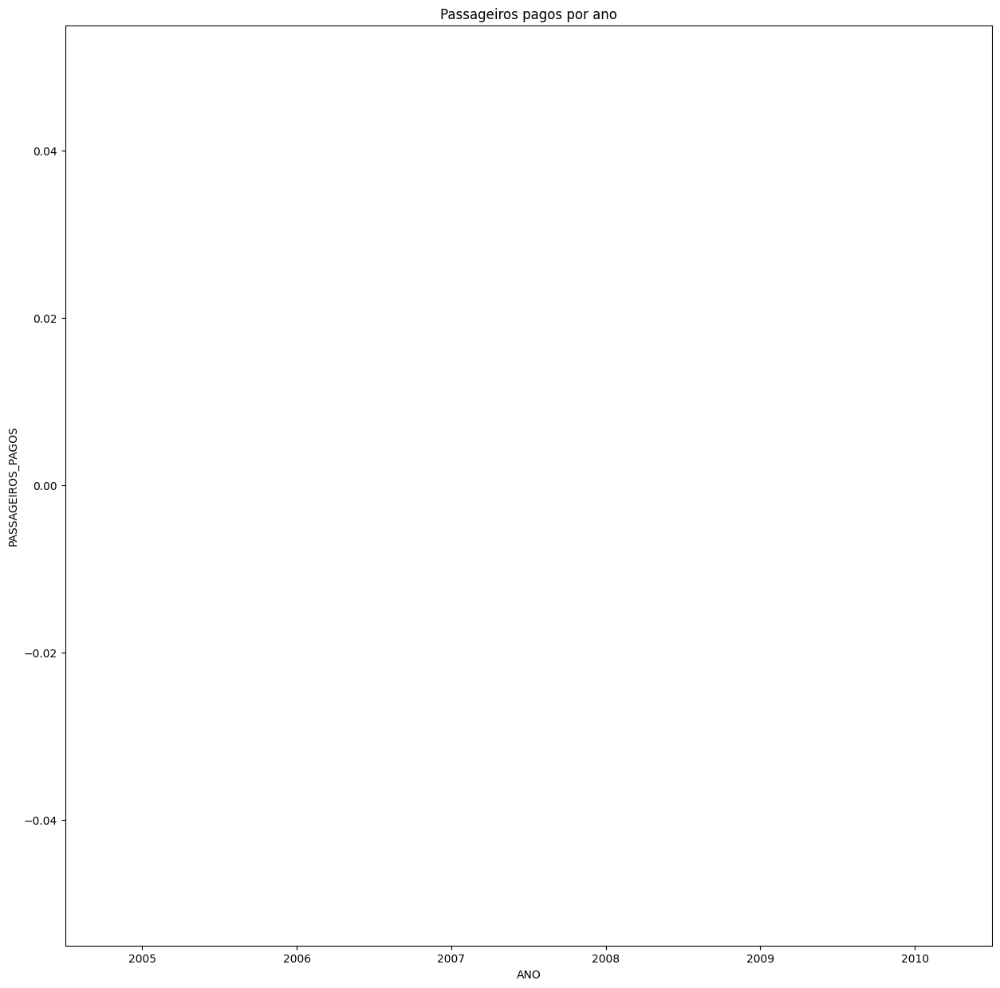





BRA


count    8489.000000
mean      305.180115
std       449.454755
min         0.000000
25%        34.000000
50%       135.000000
75%       371.000000
max      4568.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


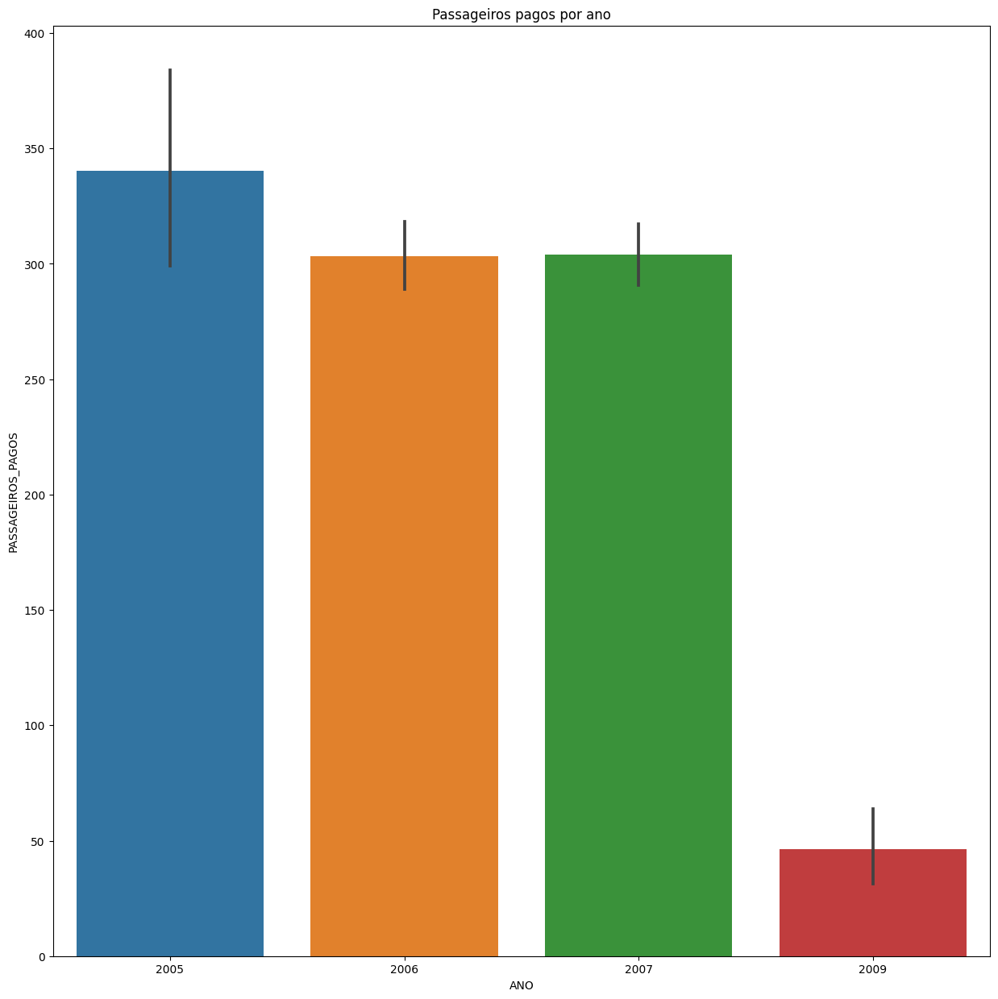





AIR CARAIBES S.A.


count     480.000000
mean      268.070833
std       244.069746
min         0.000000
25%        57.000000
50%       192.500000
75%       414.250000
max      1463.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


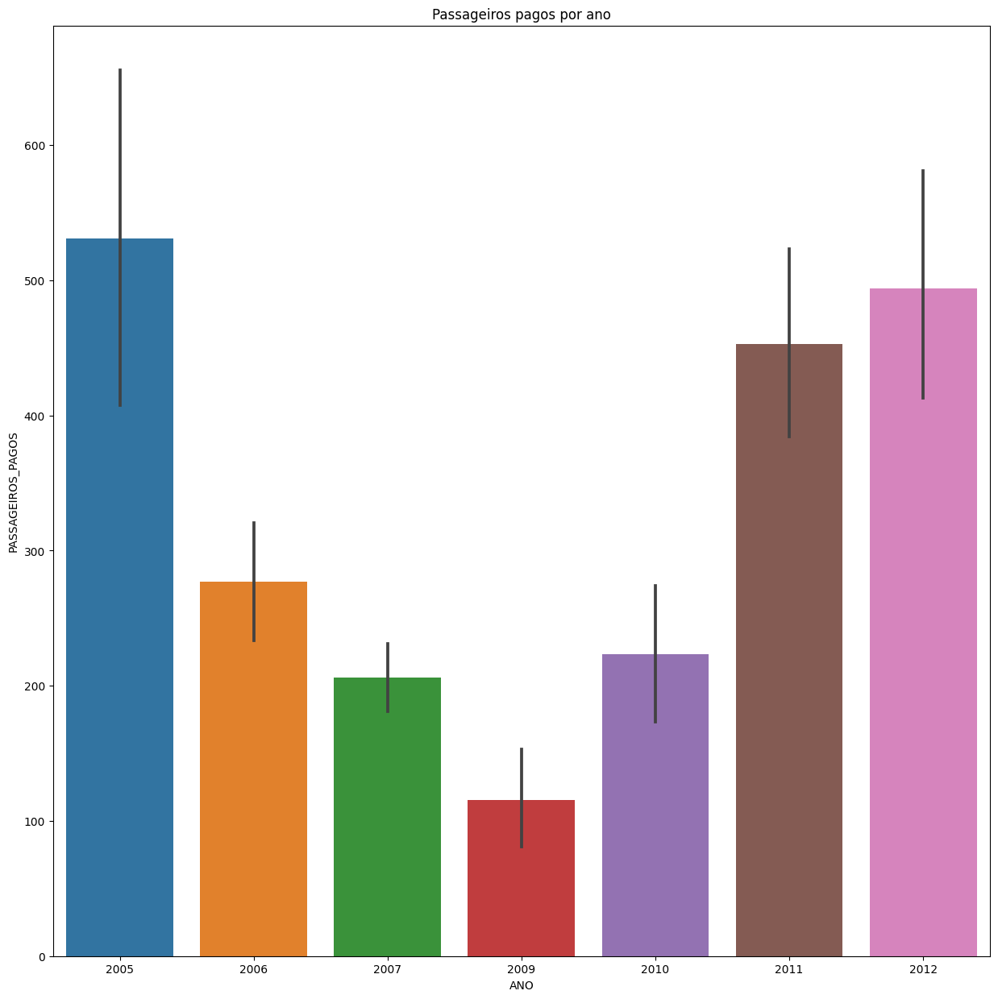





LUFTHANSA CARGO AG


count    7690.0
mean        0.0
std         0.0
min         0.0
25%         0.0
50%         0.0
75%         0.0
max         0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


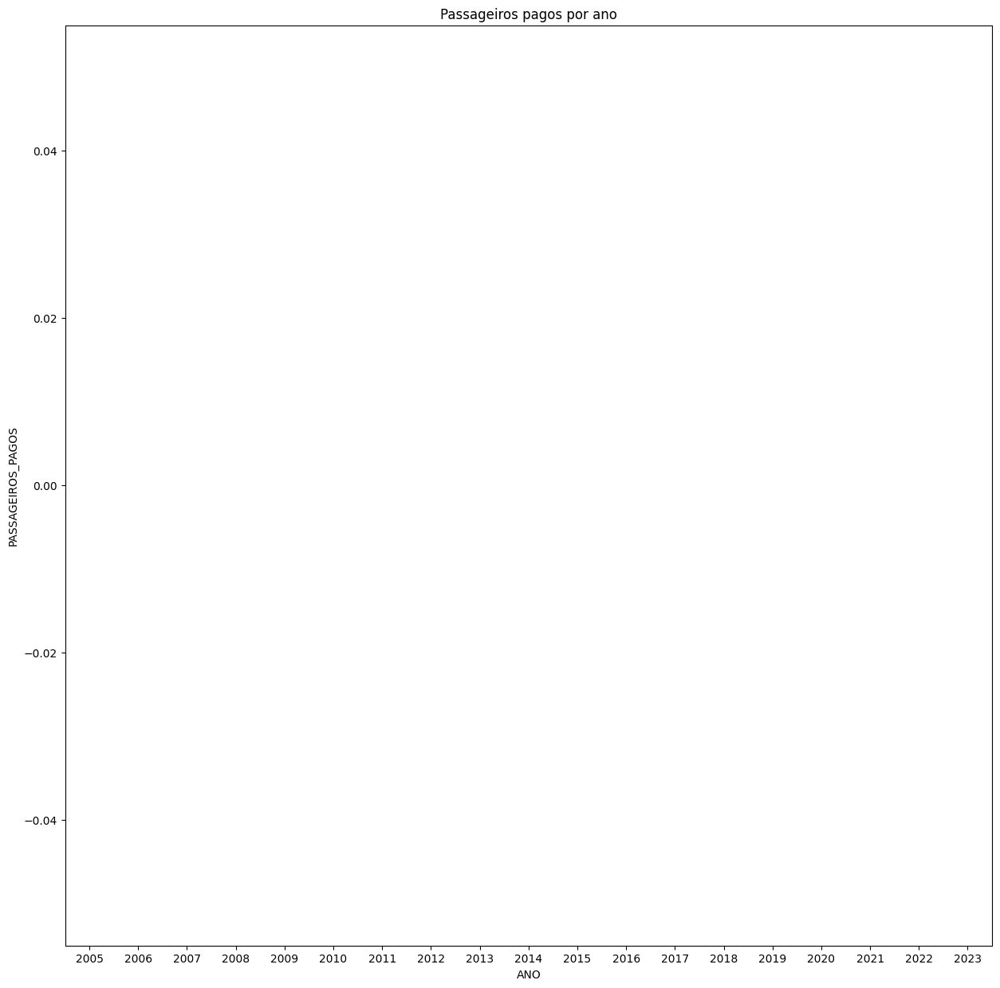





LAUDA AIR SPA


count      10.00000
mean      504.60000
std       328.24151
min         4.00000
25%       499.00000
50%       511.50000
75%       576.00000
max      1136.00000
Name: PASSAGEIROS_PAGOS, dtype: float64


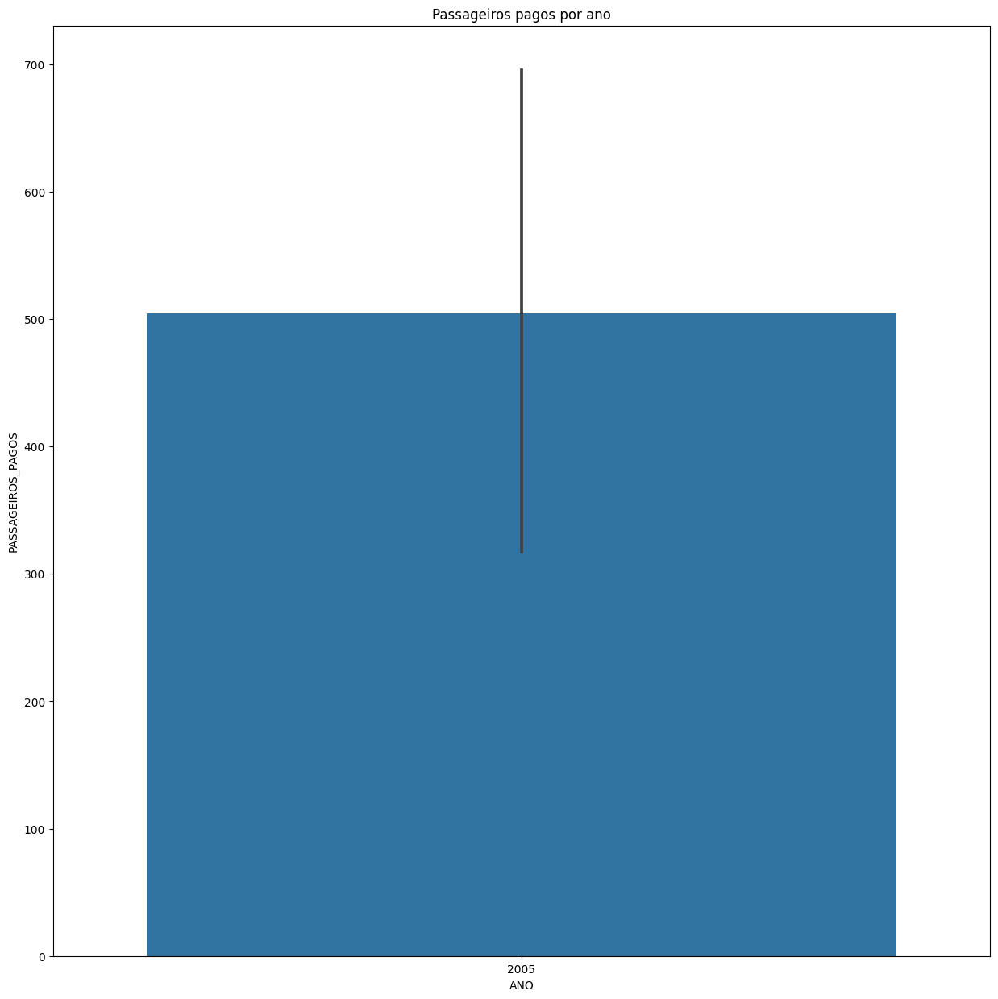





MEGA LINHAS AÉREAS LTDA.


count    1311.000000
mean        4.238749
std        10.008480
min         0.000000
25%         0.000000
50%         0.000000
75%         3.000000
max        84.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


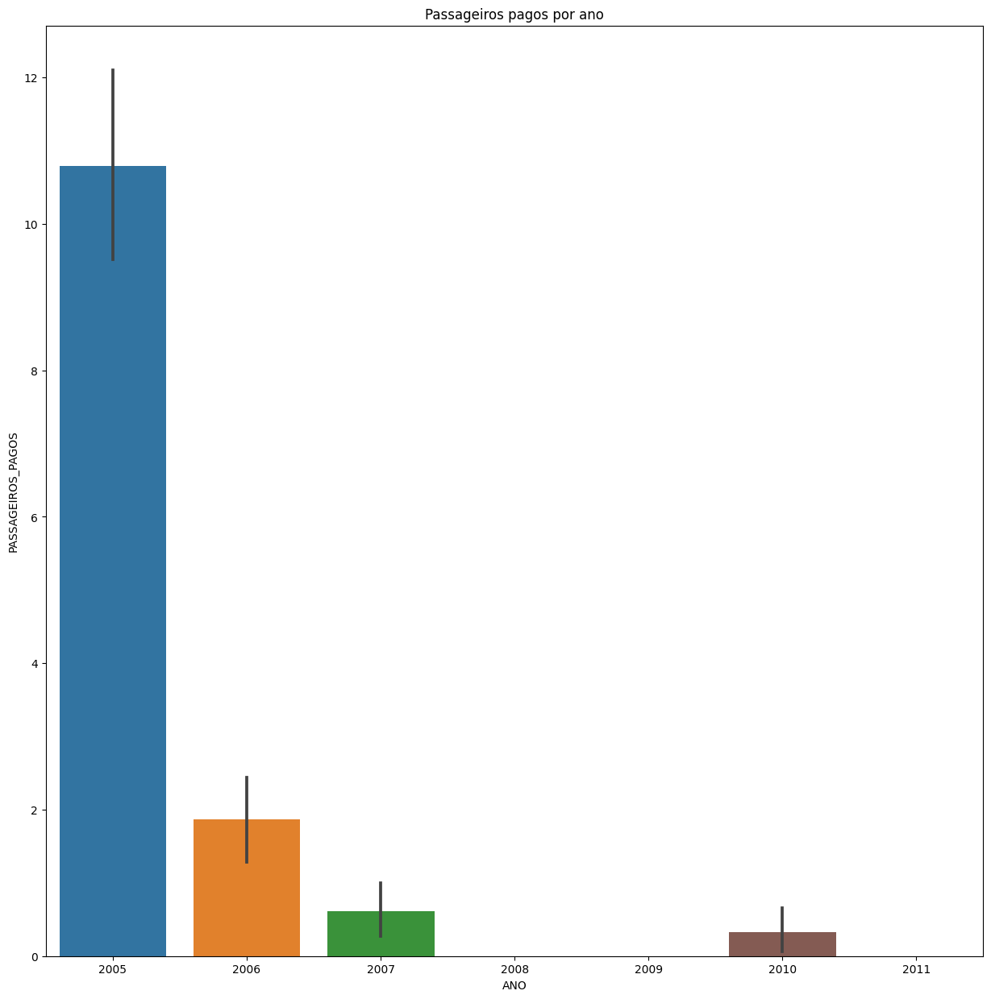





EMPRESA DE TRANSPORTES AÉREOS DE CABO VERDE - TACV S.A.


count     758.000000
mean      429.352243
std       397.527555
min         0.000000
25%       124.250000
50%       361.500000
75%       589.750000
max      2352.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


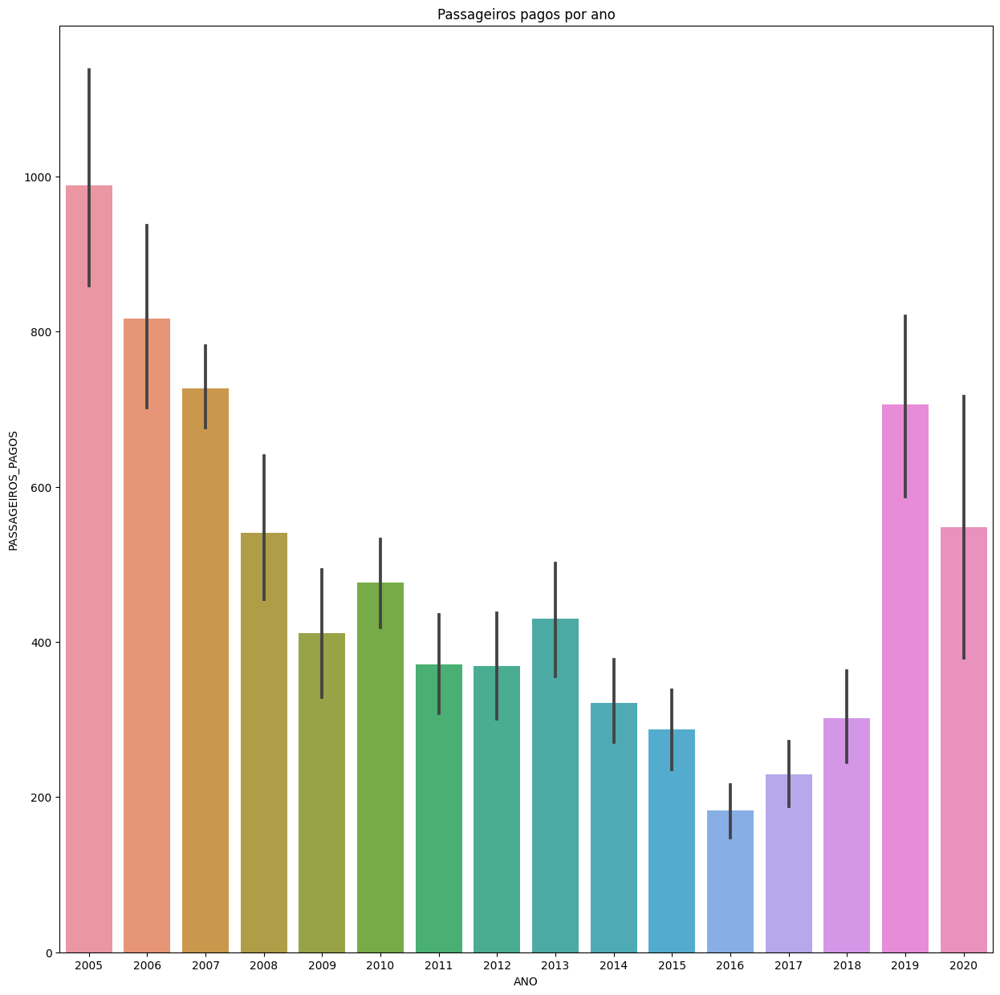





TEAM PARTICIPAÇÕES LTDA.


count    1704.000000
mean       57.545775
std       141.976681
min         0.000000
25%         0.000000
50%         3.000000
75%        35.000000
max      1282.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


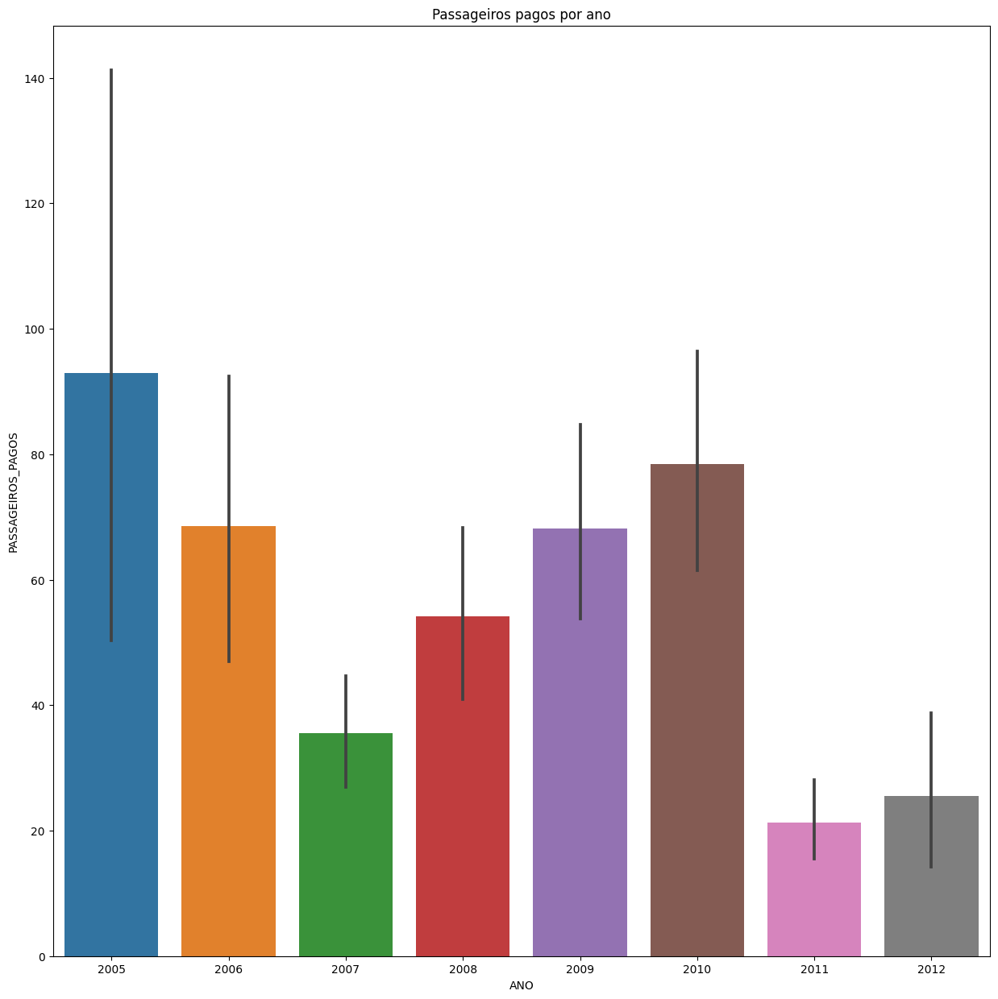





CRUISER LINHAS AÉREAS LTDA.


count    1763.000000
mean       43.804311
std        54.347912
min         0.000000
25%         5.000000
50%        27.000000
75%        62.000000
max       402.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


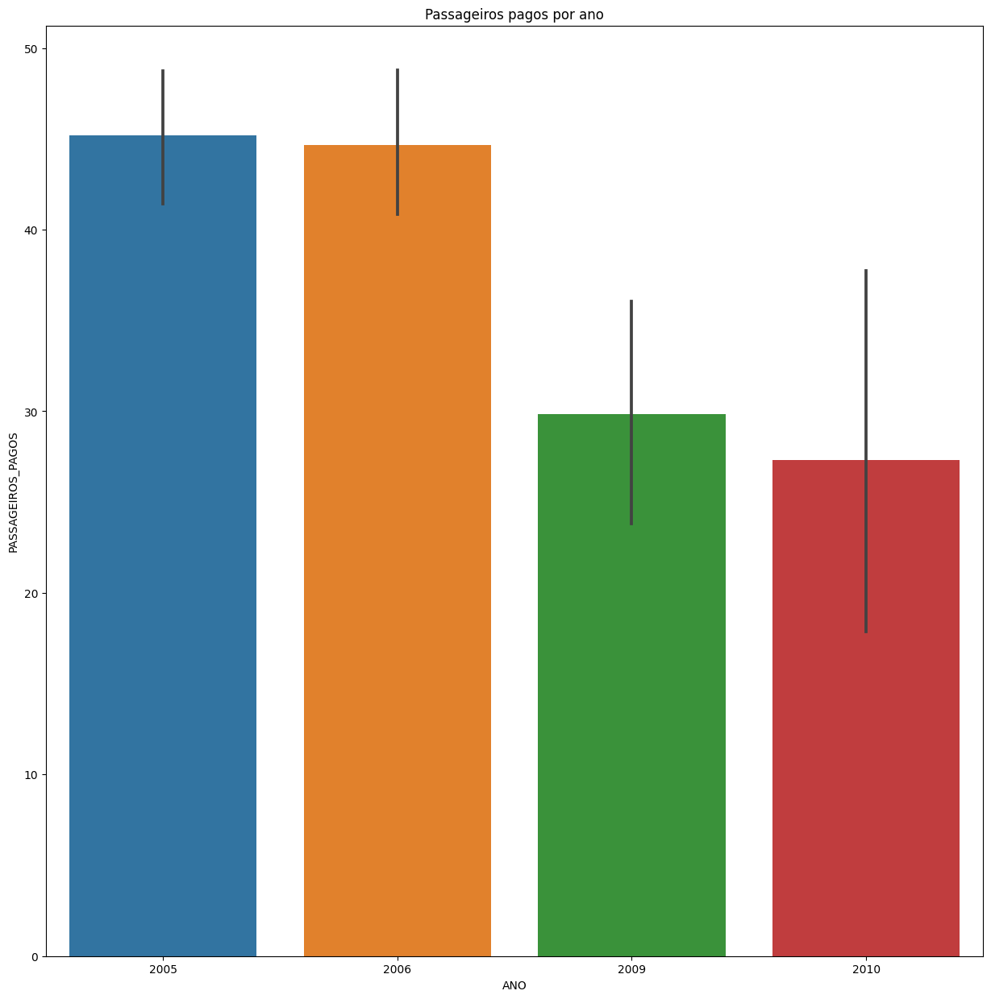

/usr/local/lib/python3.10/dist-packages/seaborn/algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))






WEBJET PARTICIPAÇÕES S.A. (EX-LINHAS AÉREAS)


count     7616.000000
mean      2369.767069
std       3135.630704
min          0.000000
25%        264.750000
50%       1136.500000
75%       3065.000000
max      22391.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


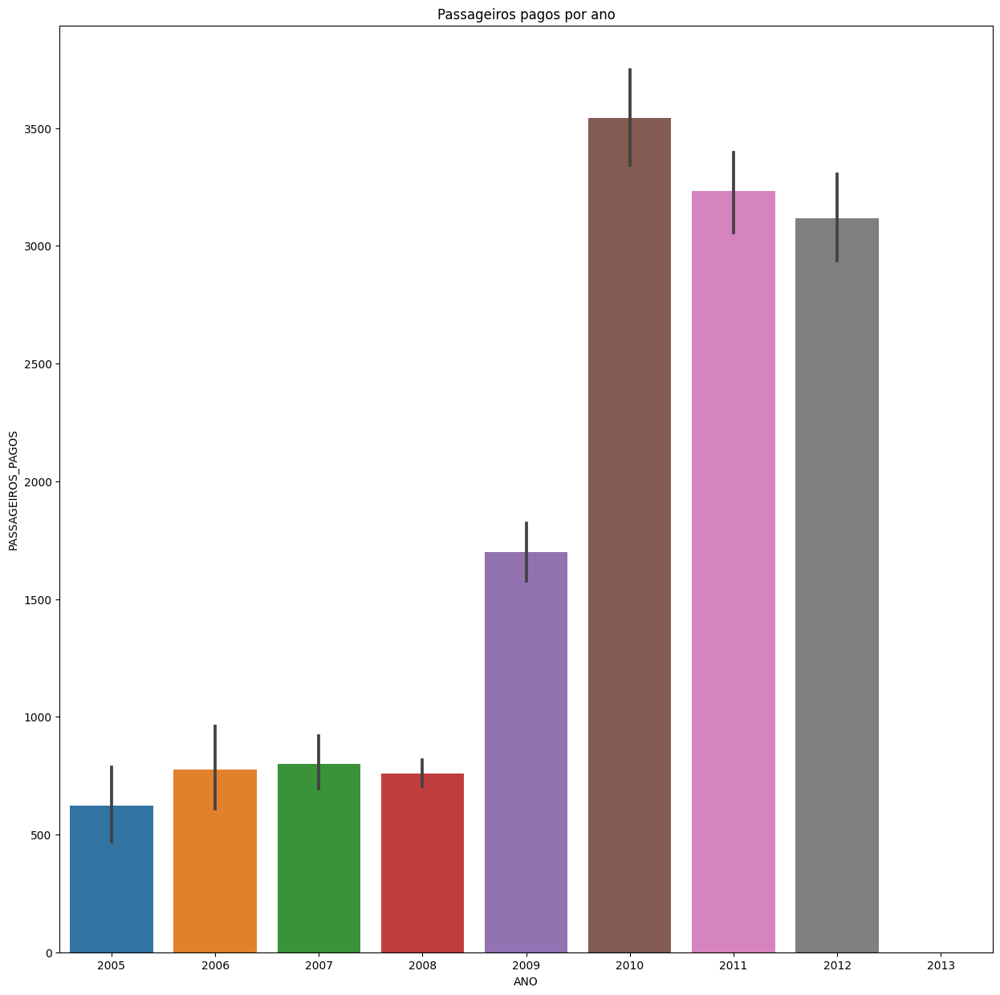





AIR MINAS LINHAS AÉREAS LTDA.


count    1006.000000
mean      167.808151
std       268.737050
min         0.000000
25%         2.000000
50%        30.000000
75%       246.000000
max      1321.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


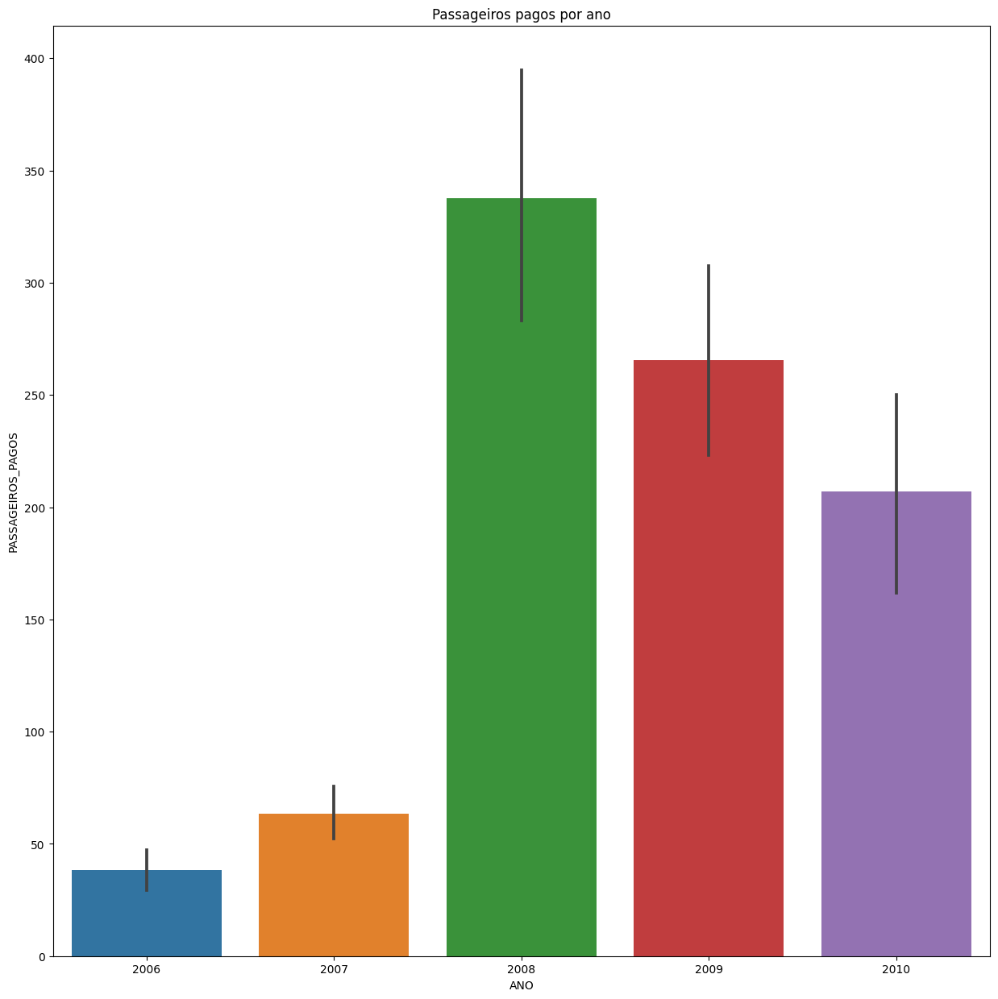





AIR MADRID LÍNEAS AÉREAS S.A


count      96.000000
mean      331.854167
std       333.714091
min         0.000000
25%        44.000000
50%       241.000000
75%       508.000000
max      1412.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


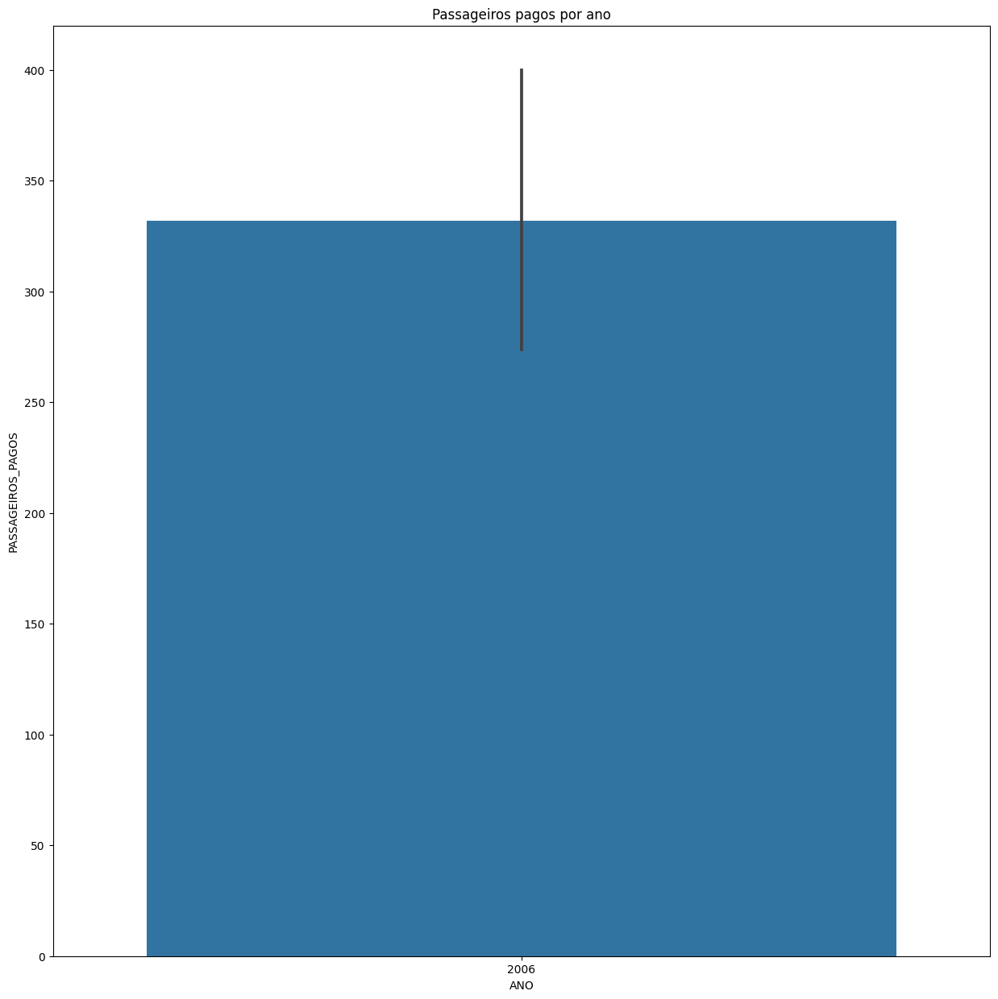





LAN ARGENTINA S.A.


count      541.000000
mean      3406.876155
std       2951.851438
min          0.000000
25%        410.000000
50%       3173.000000
75%       5671.000000
max      10218.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


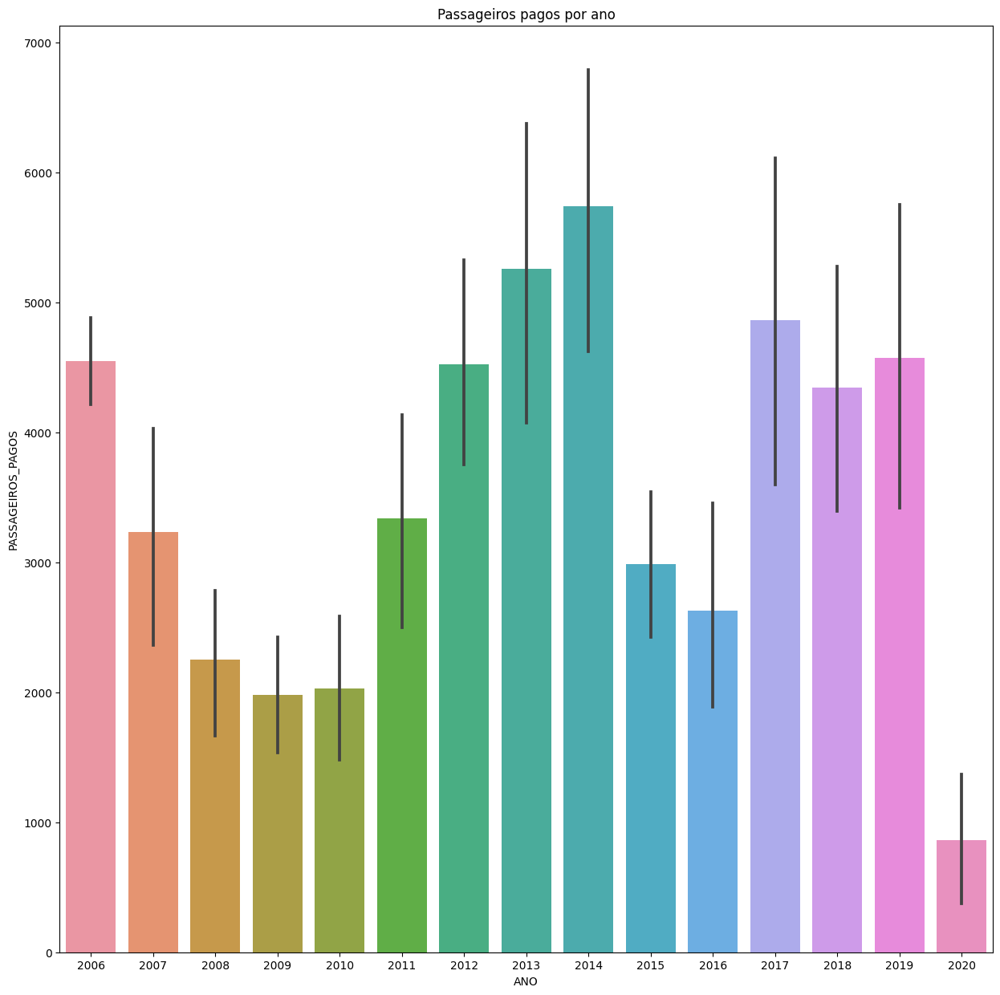





LAN CARGO S.A.


count    11001.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


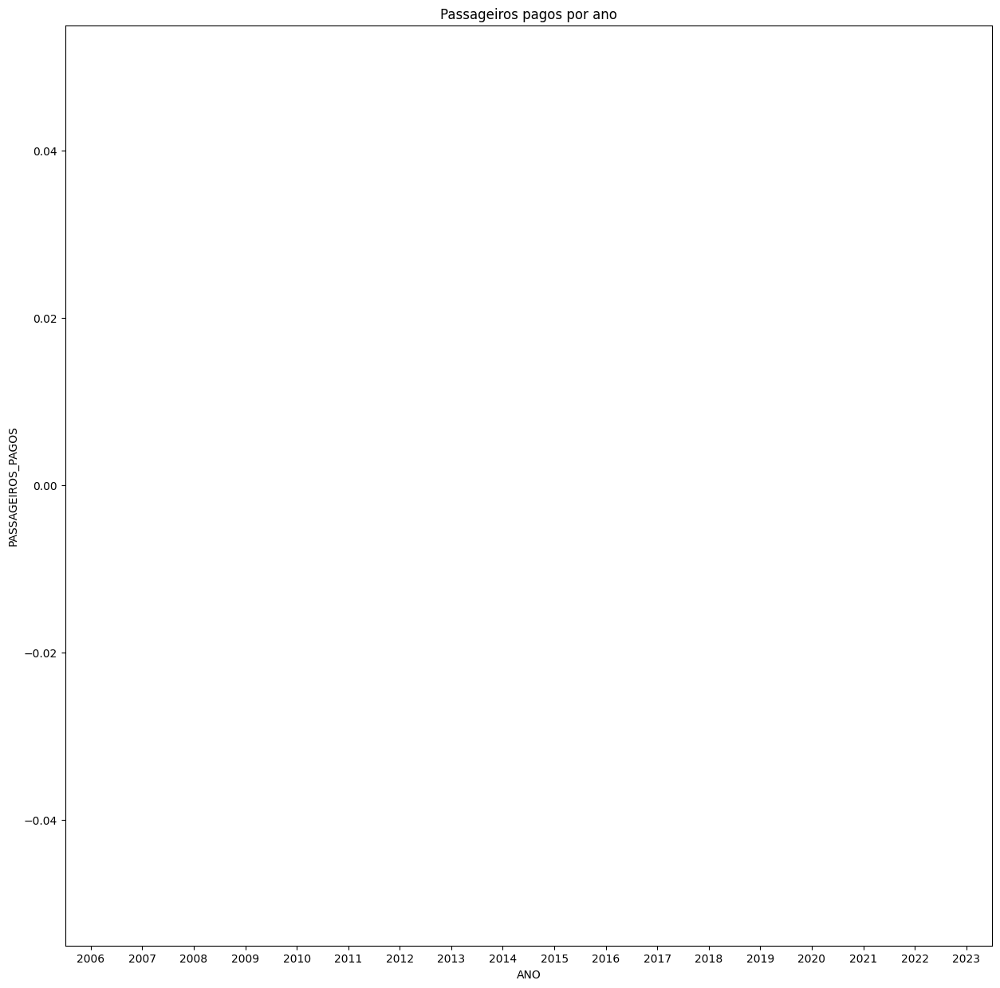





MK AIRLINES LTDA.


count    67.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


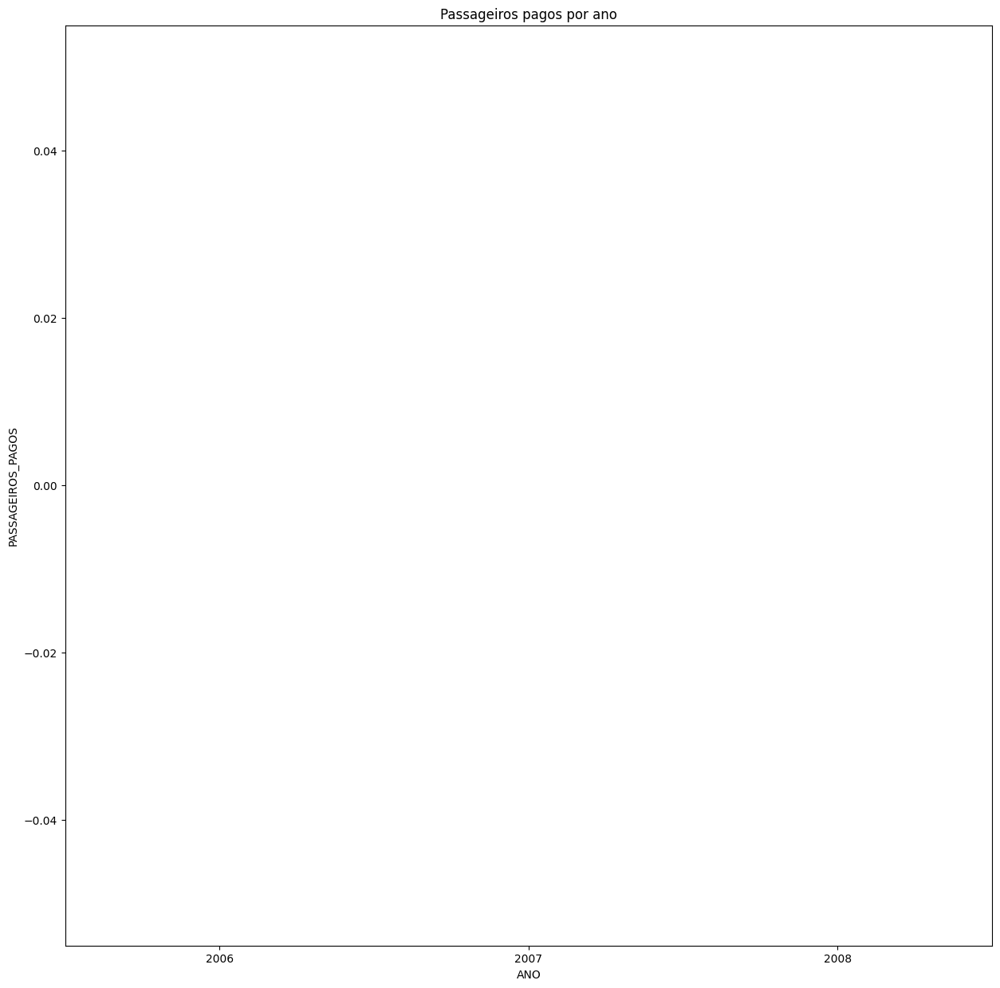





BRAVA LINHAS AÉREAS LTDA. (EX- NHT)


count    5556.000000
mean       67.587833
std       113.334821
min         0.000000
25%         0.000000
50%        16.000000
75%        87.000000
max       809.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


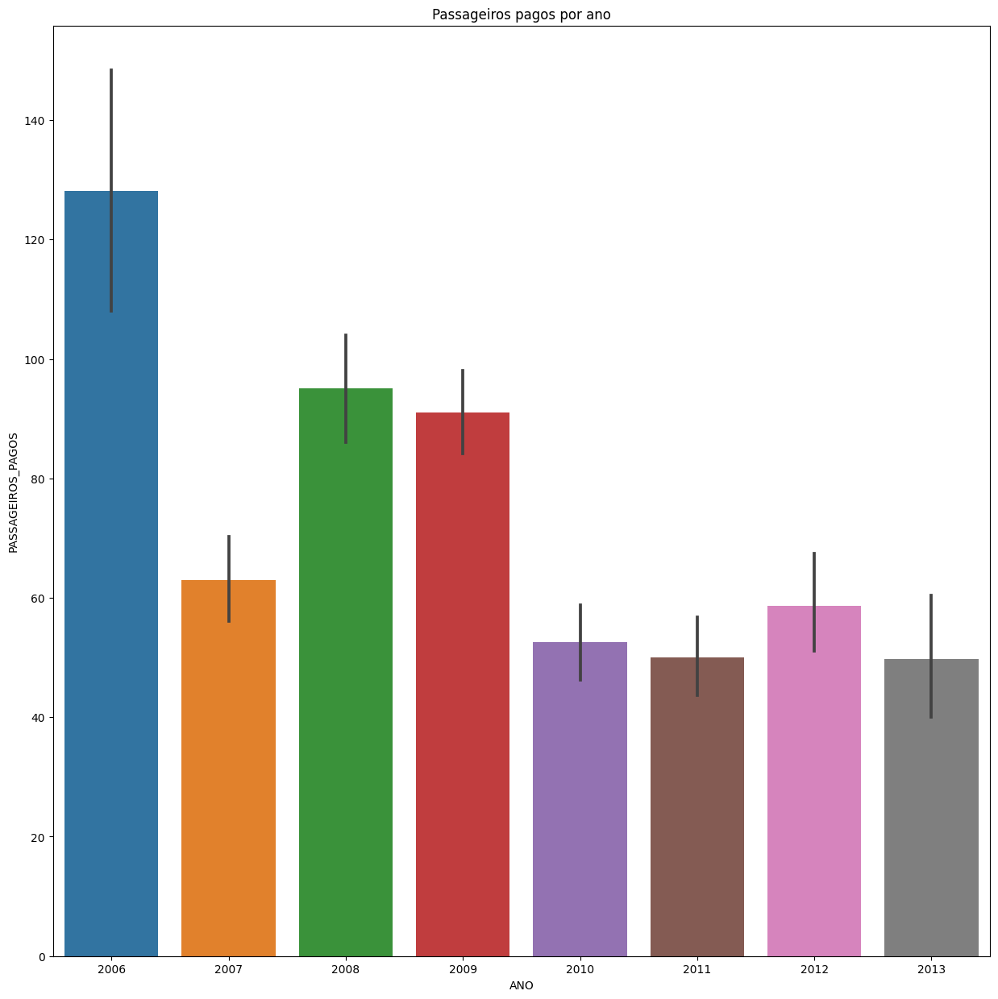





EMIRATES


count     3078.000000
mean      1760.847953
std       3096.508562
min          0.000000
25%          0.000000
50%          0.000000
75%       2992.250000
max      18617.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


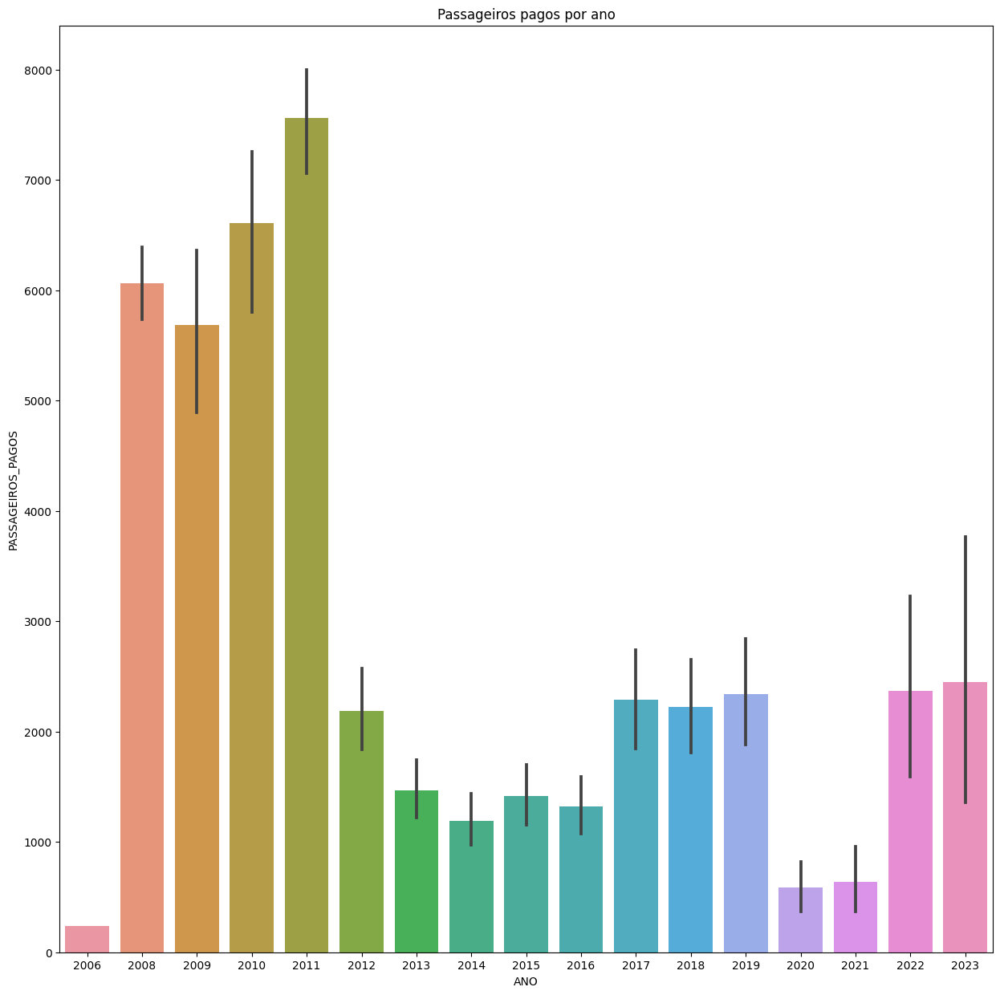





VRG LINHAS AÉREAS S.A.


count     2867.000000
mean      2817.162190
std       4910.627699
min          0.000000
25%        206.000000
50%       1132.000000
75%       3068.500000
max      40067.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


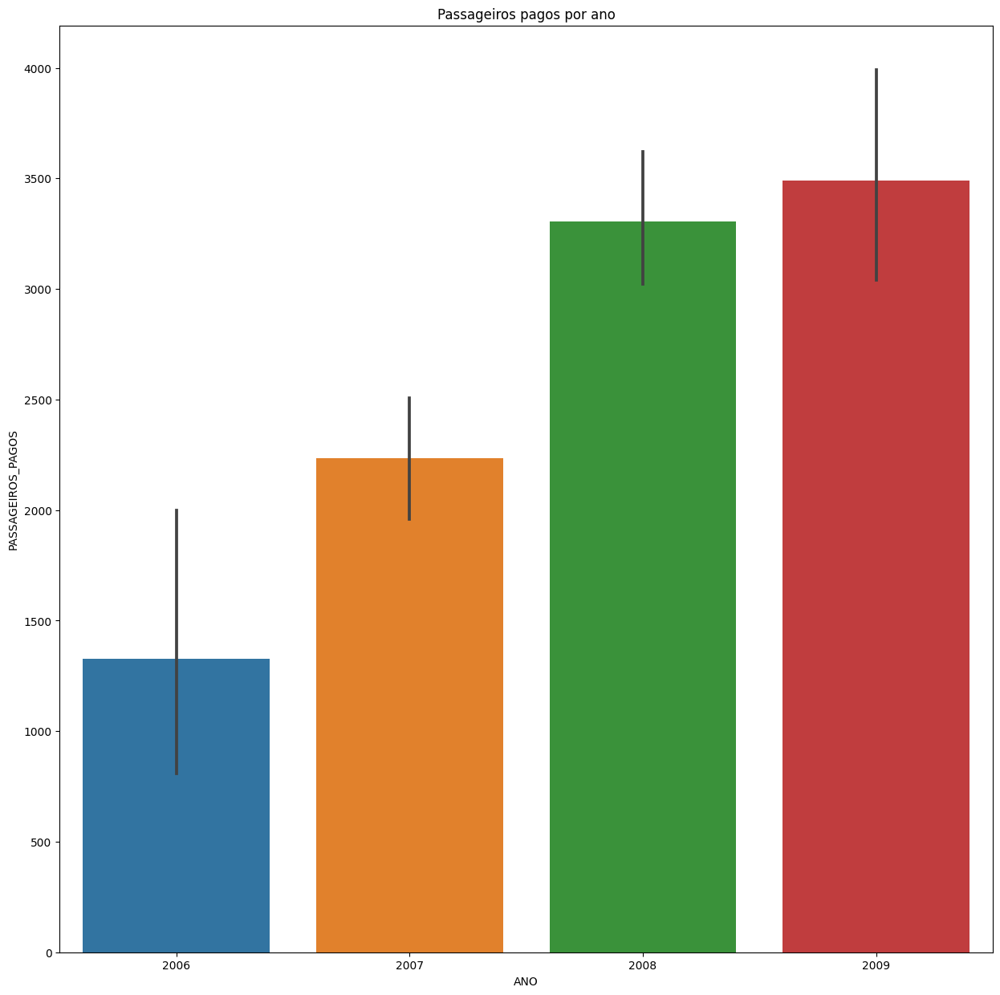





MASTER TOP LINHAS AÉREAS S/A


count    1037.0
mean        0.0
std         0.0
min         0.0
25%         0.0
50%         0.0
75%         0.0
max         0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


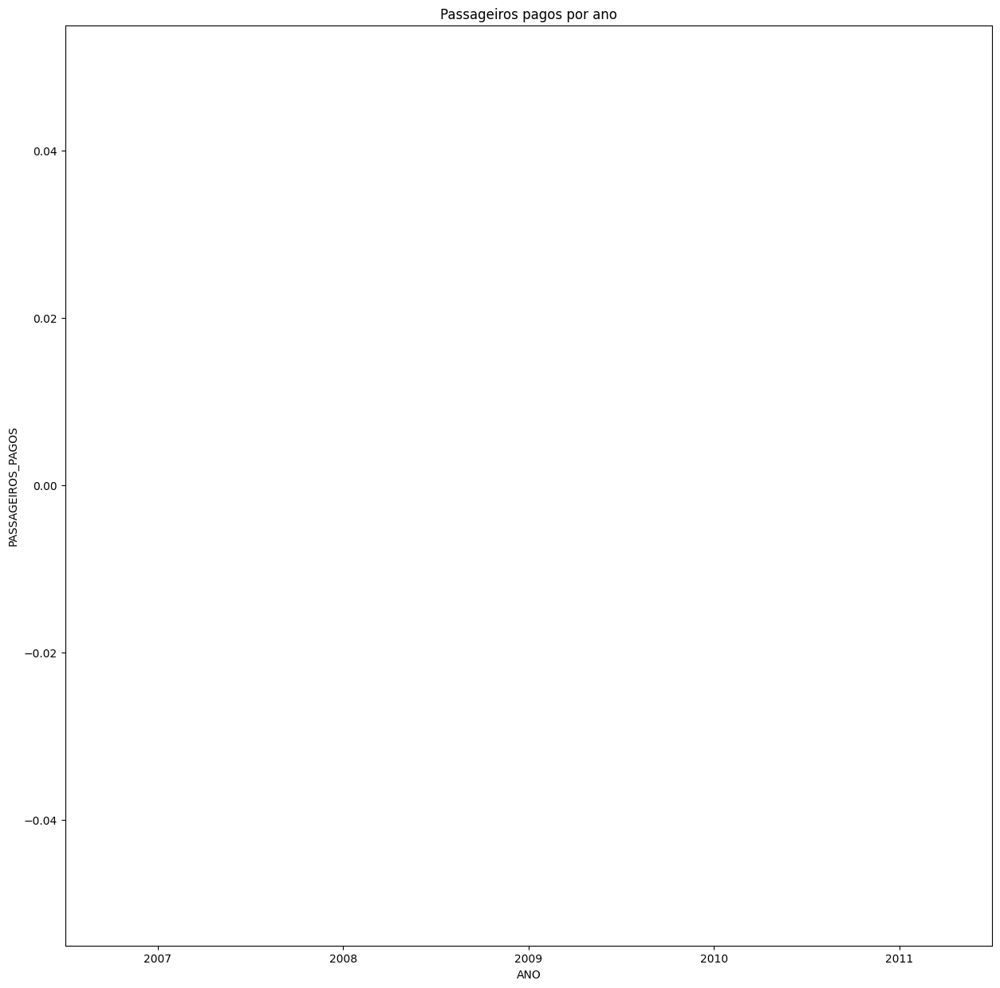





SETE LINHAS AÉREAS LTDA.


count    10172.000000
mean        44.052989
std         79.766044
min          0.000000
25%          2.000000
50%         13.000000
75%         53.000000
max        812.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


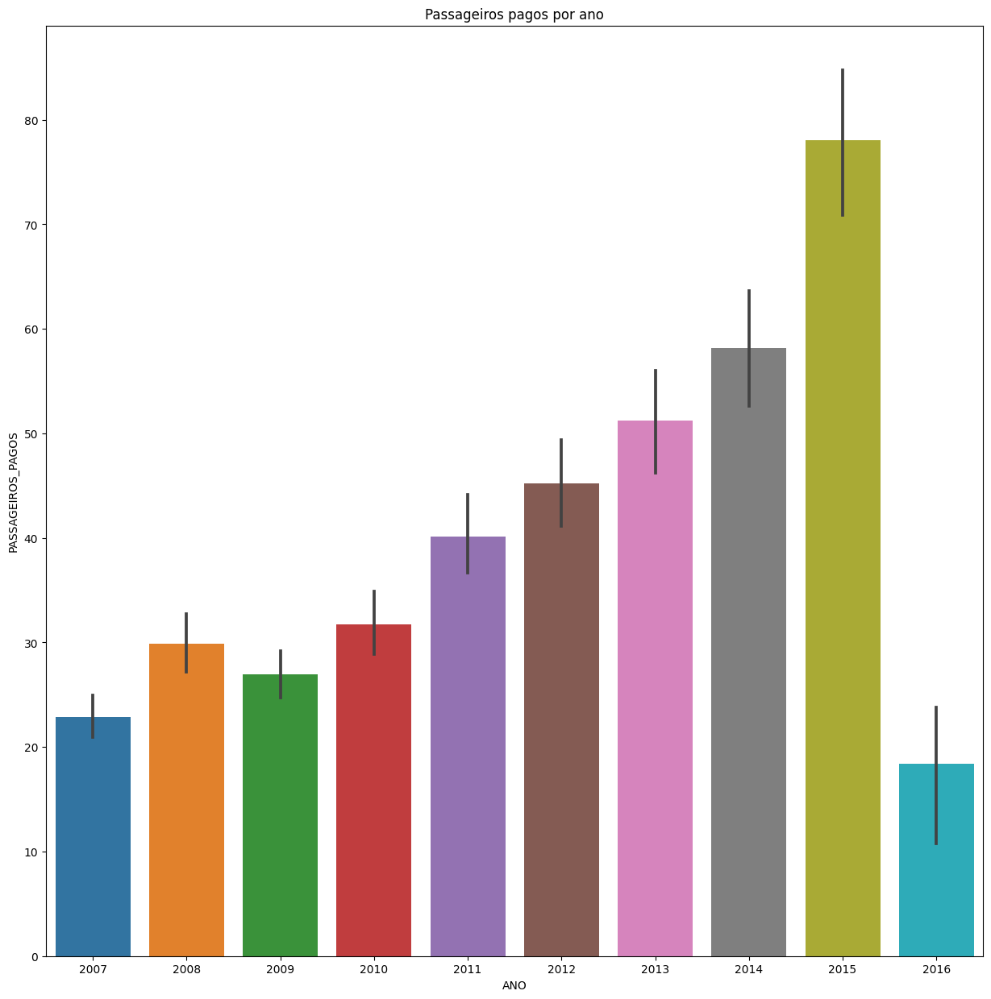





AZUL LINHAS AÉREAS BRASILEIRAS S/A


count    104986.000000
mean       2287.468386
std        4003.298186
min           0.000000
25%          62.000000
50%         526.000000
75%        2731.000000
max       36391.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


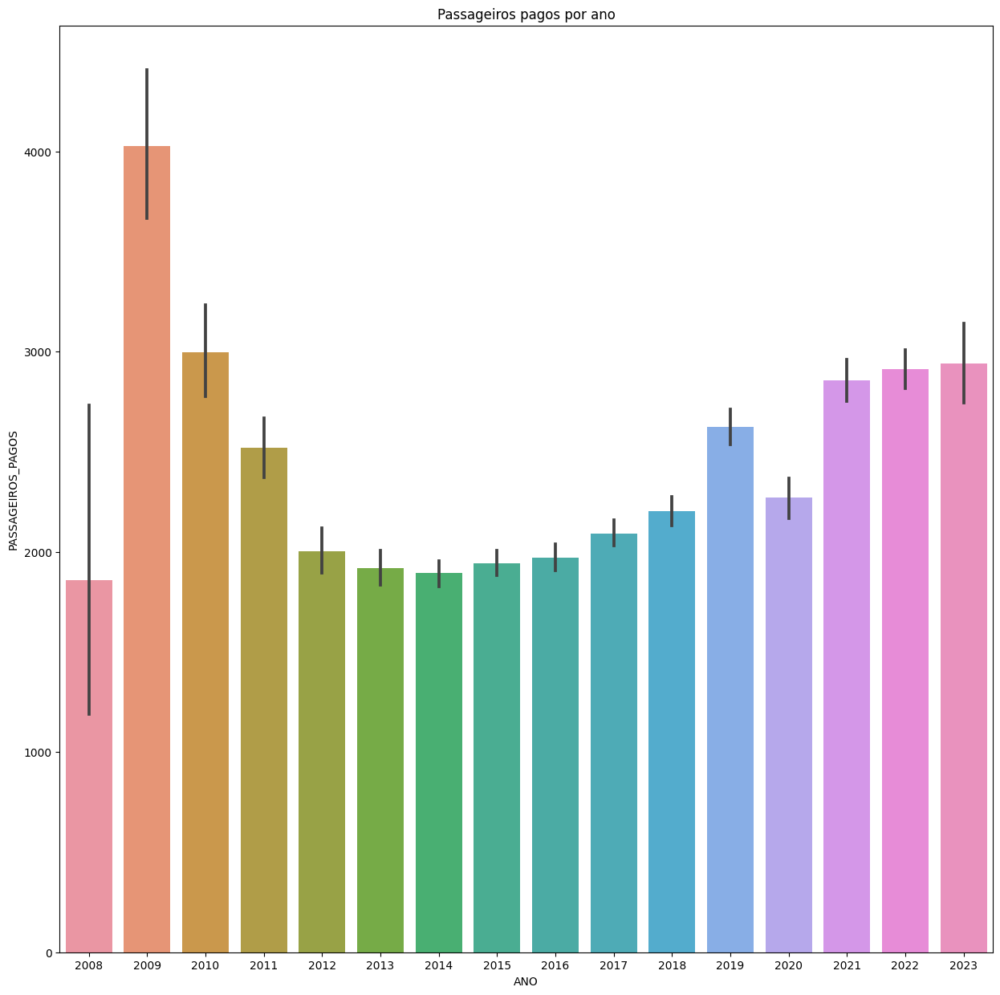





LIVINGSTON S.P.A.


count     85.000000
mean     324.247059
std      299.198051
min        0.000000
25%        0.000000
50%      327.000000
75%      548.000000
max      964.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


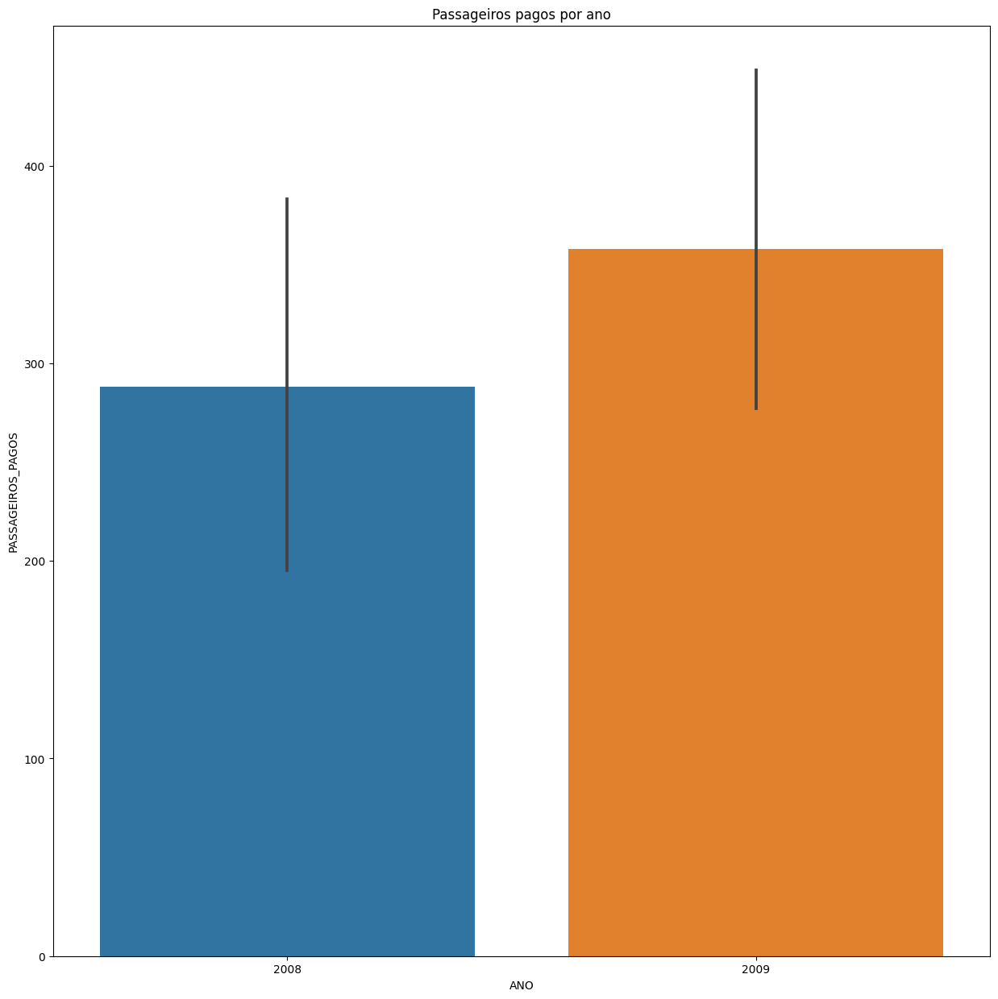





AIR ITALY S.PA.


count     854.000000
mean      220.432084
std       271.878963
min         0.000000
25%         0.000000
50%       127.500000
75%       345.000000
max      1679.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


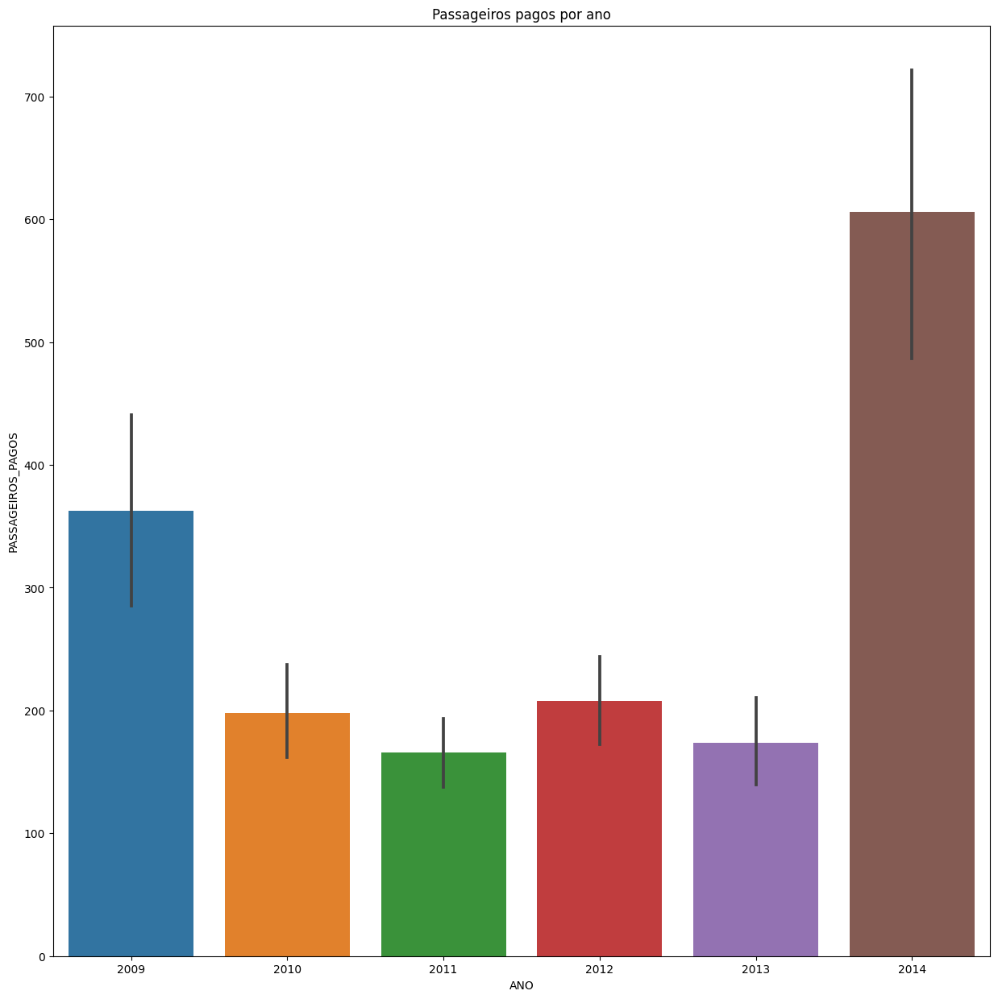





BETA - BRAZILIAN EXPRESS TRANSPORTES AÉREOS LTDA.


count    178.0
mean       0.0
std        0.0
min        0.0
25%        0.0
50%        0.0
75%        0.0
max        0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


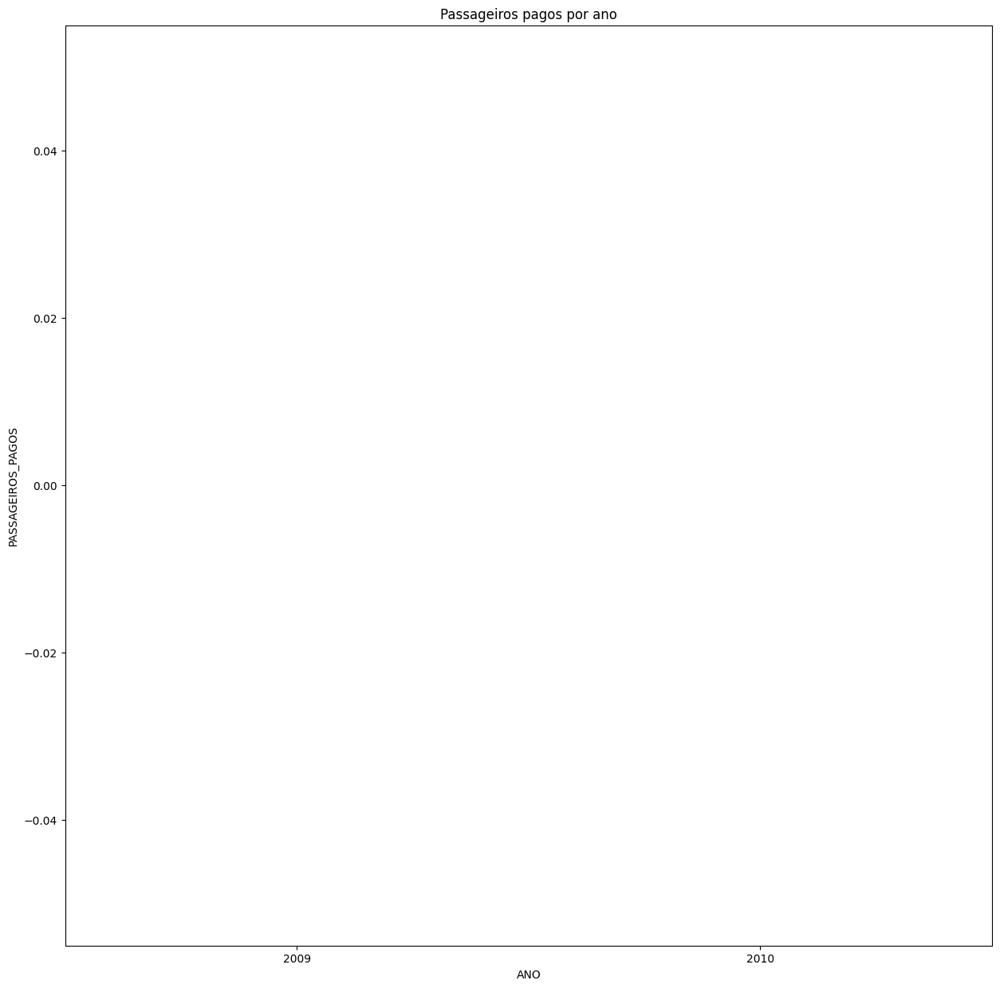





AIR CHINA


count     779.000000
mean      870.724005
std       334.465632
min         0.000000
25%       672.000000
50%       872.000000
75%      1081.500000
max      1835.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


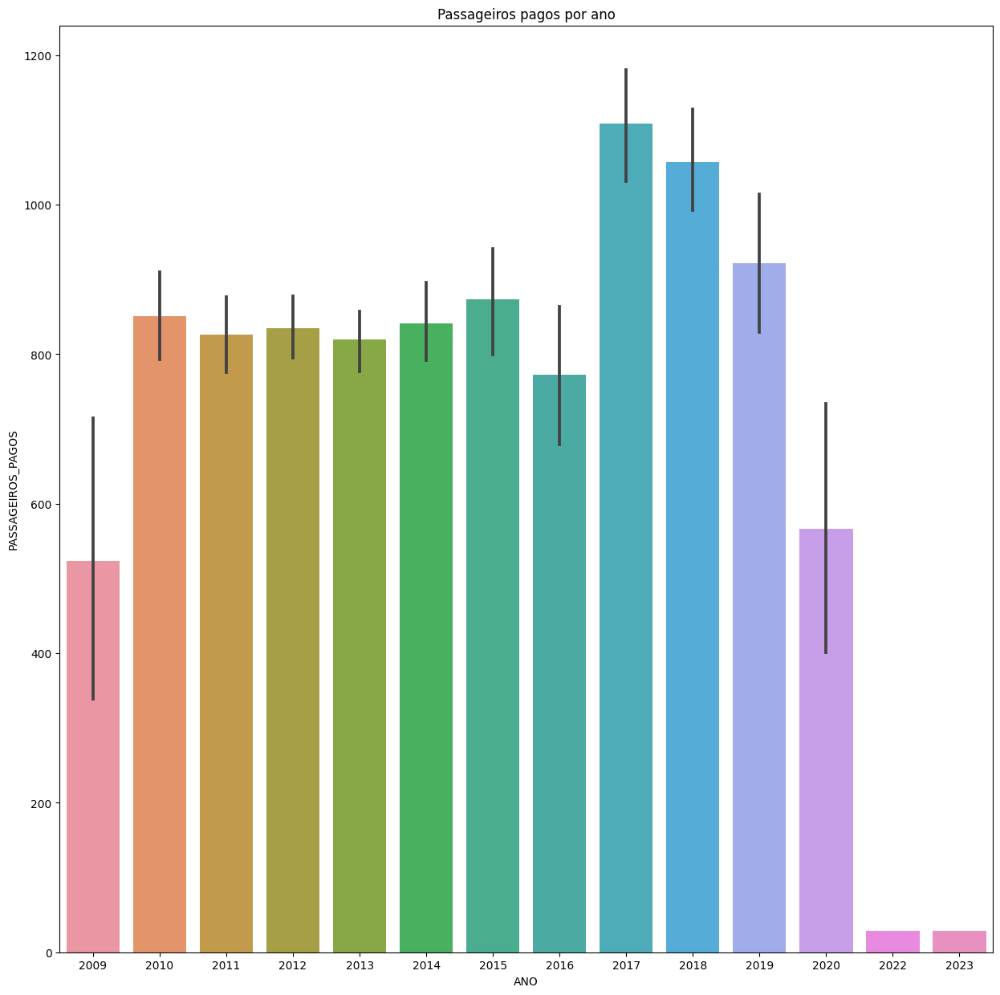





IBERWORLD AIRLINES S.A.


count      49.000000
mean      607.102041
std       478.503233
min         0.000000
25%       284.000000
50%       606.000000
75%       913.000000
max      1618.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


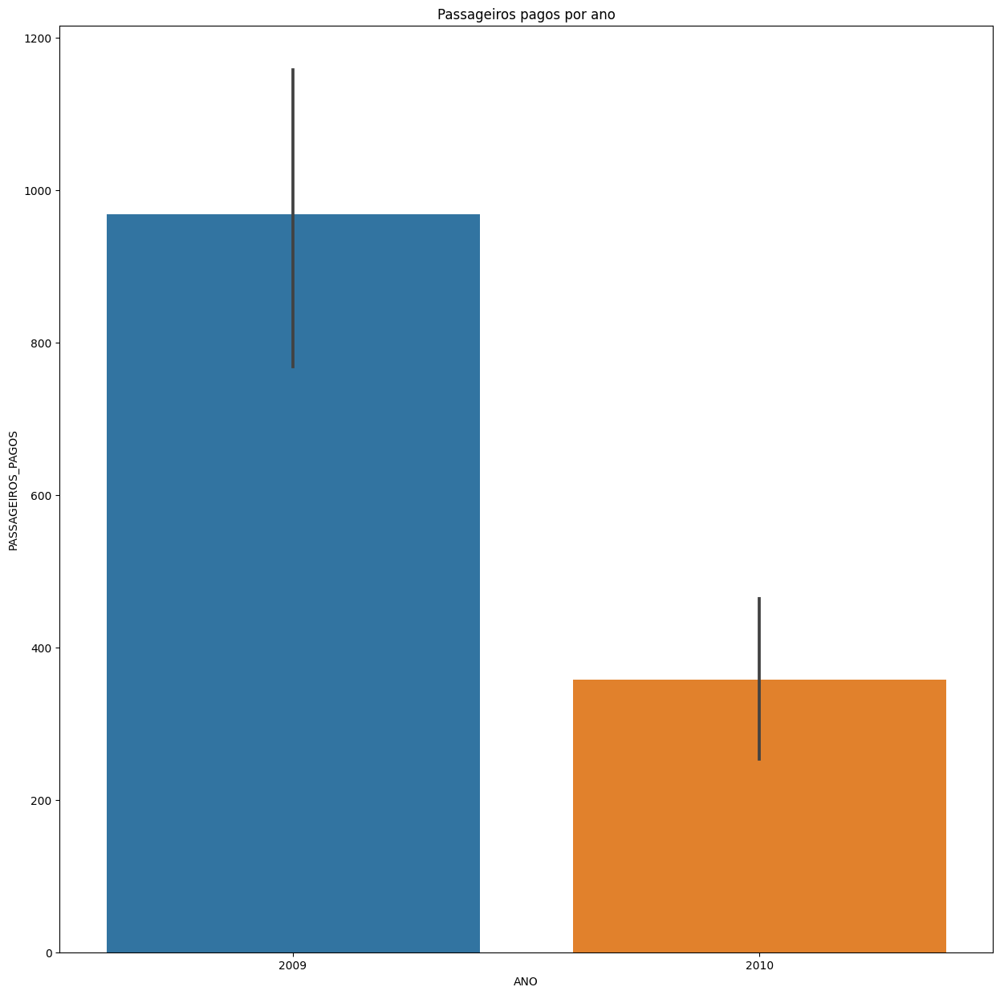





LÍNEA AÉREA CARGUEIRA DE COLOMBIA S.A - LANCO


count    6859.0
mean        0.0
std         0.0
min         0.0
25%         0.0
50%         0.0
75%         0.0
max         0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


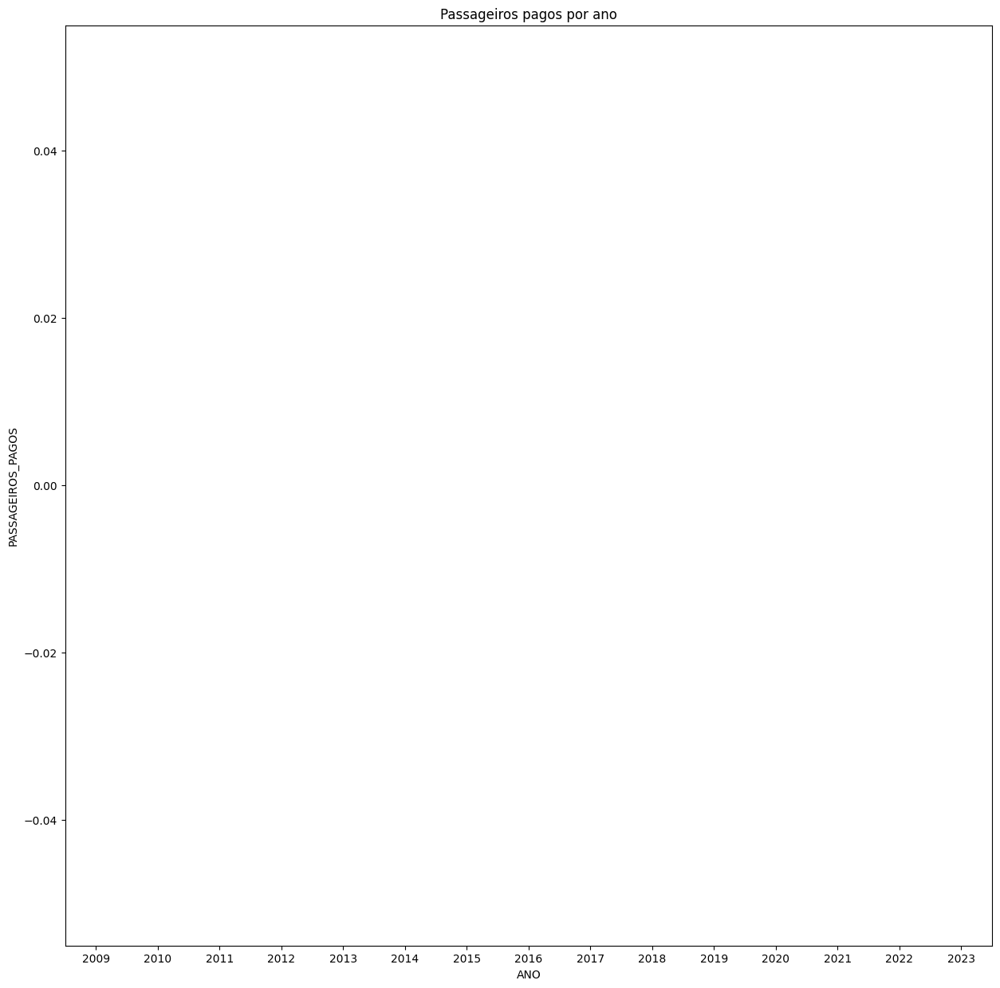





LATAM AIRLINES ECUADOR S.A.


count    27.000000
mean     11.111111
std      22.068657
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max      66.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


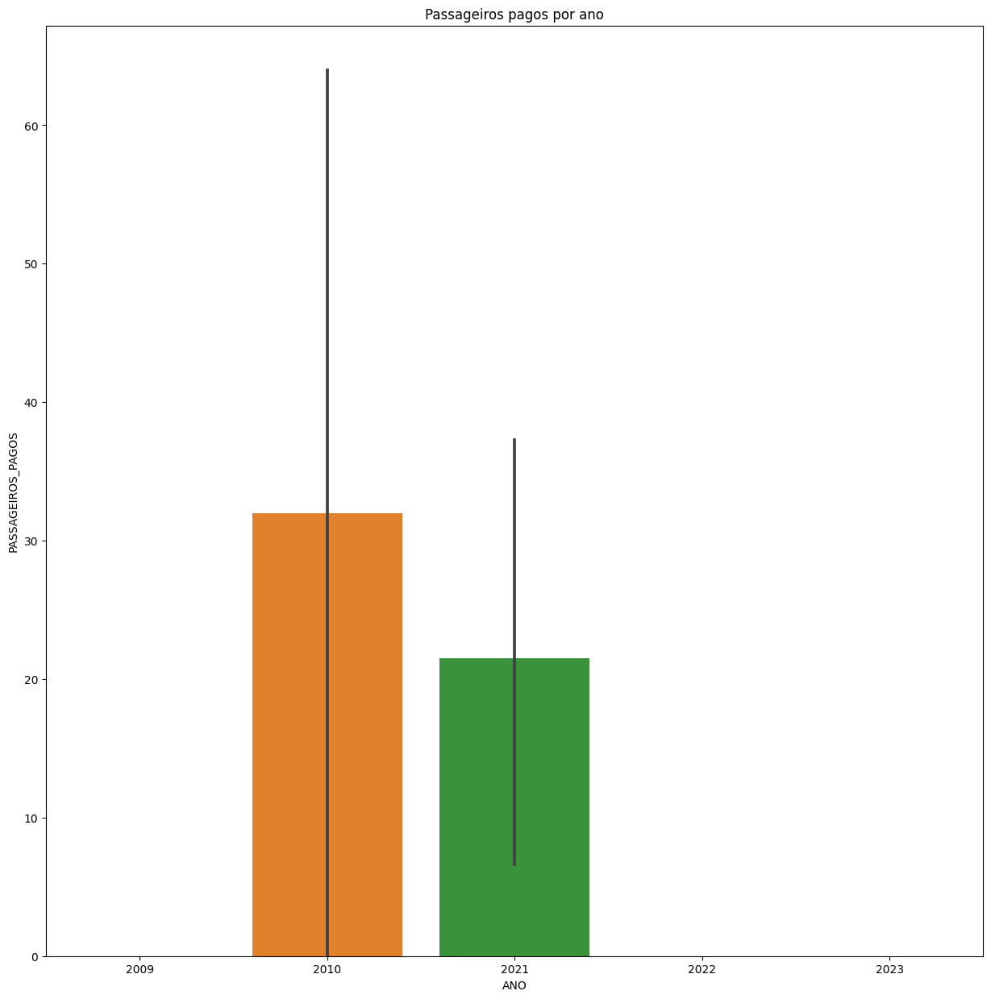





MARTINAIR HOLLAND N.V.


count    2807.0
mean        0.0
std         0.0
min         0.0
25%         0.0
50%         0.0
75%         0.0
max         0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


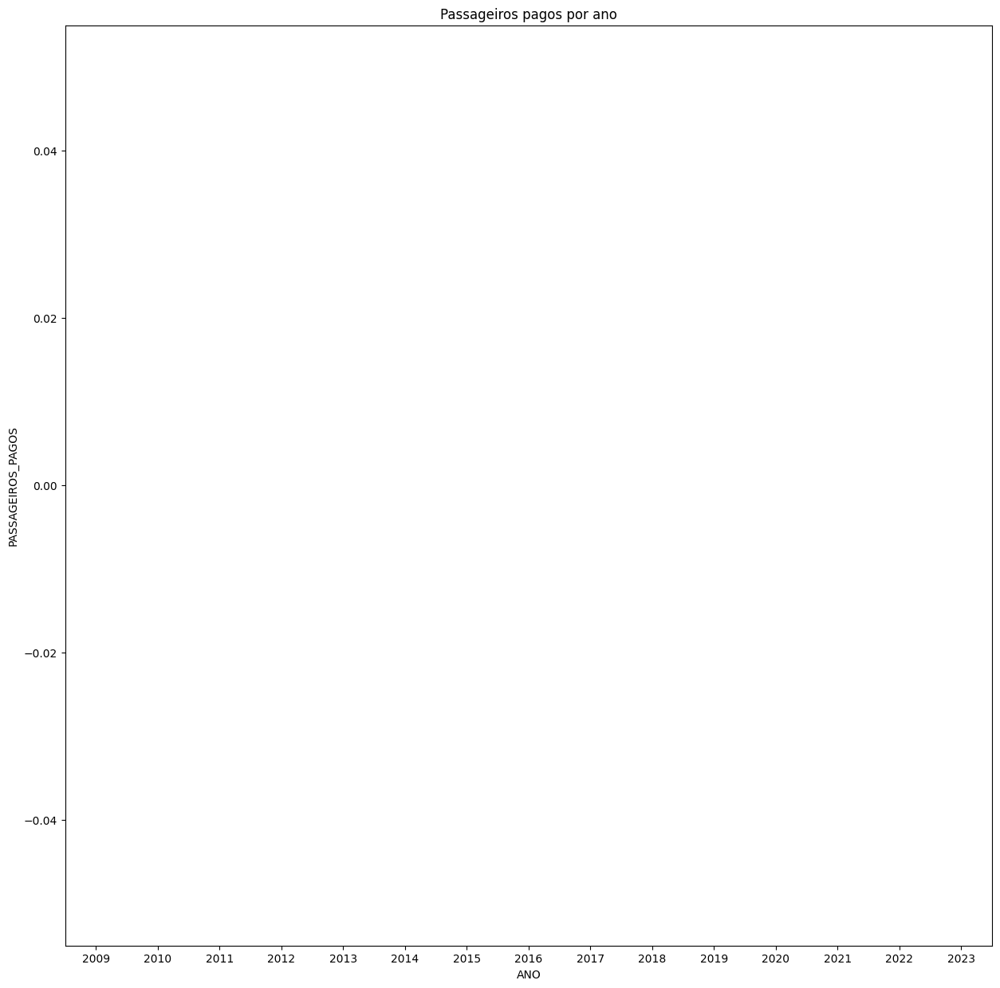





MEXICANA DE AVIACIÓN S.A. DE C.V.


count      46.000000
mean     1368.217391
std       980.066050
min         0.000000
25%       567.250000
50%      1271.000000
75%      2251.000000
max      2970.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


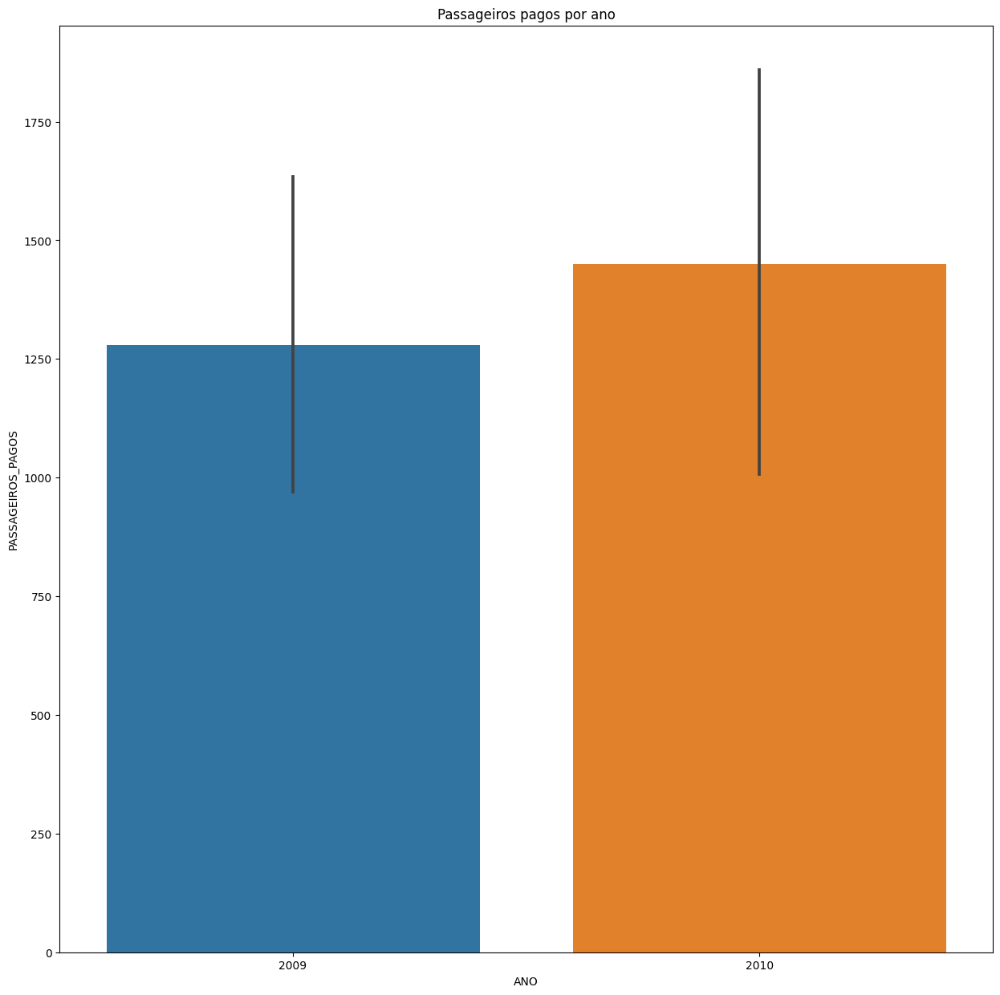





SOL LINHAS AÉREAS LTDA.


count    185.000000
mean      51.529730
std       90.509791
min        0.000000
25%        0.000000
50%        6.000000
75%       75.000000
max      416.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


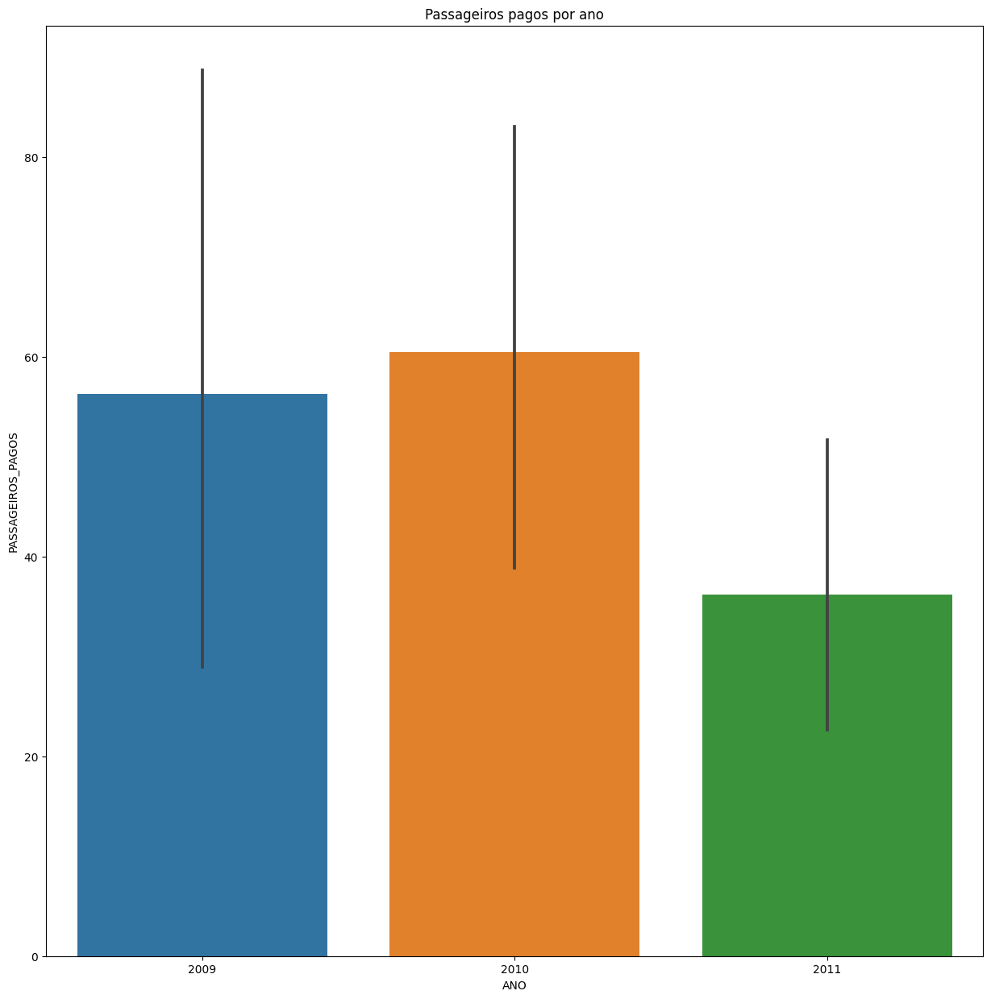





TURKISH AIRLINES INC


count    1477.000000
mean     1733.439404
std      1963.451145
min         0.000000
25%         0.000000
50%       784.000000
75%      3395.000000
max      7930.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


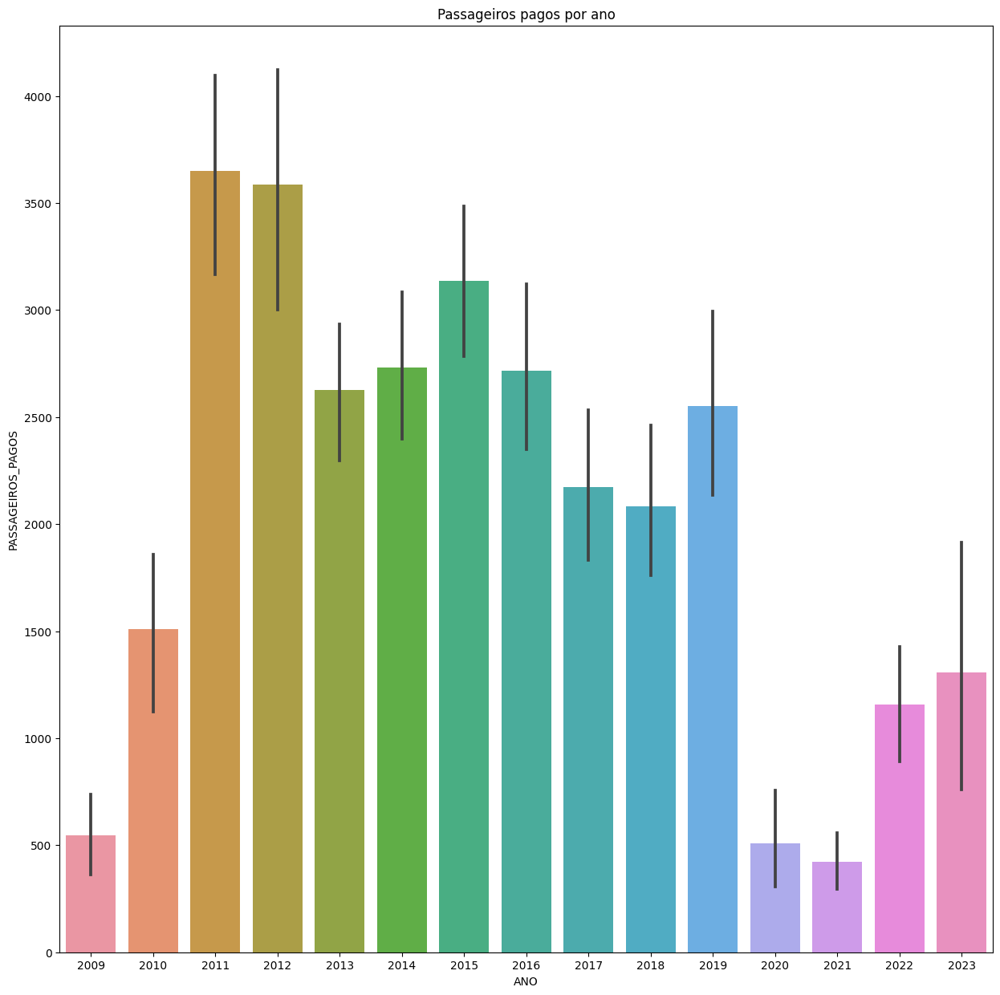





US AIRWAIS, INC


count     200.000000
mean     3520.495000
std      2145.505769
min         0.000000
25%       977.000000
50%      4557.500000
75%      5057.500000
max      7239.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


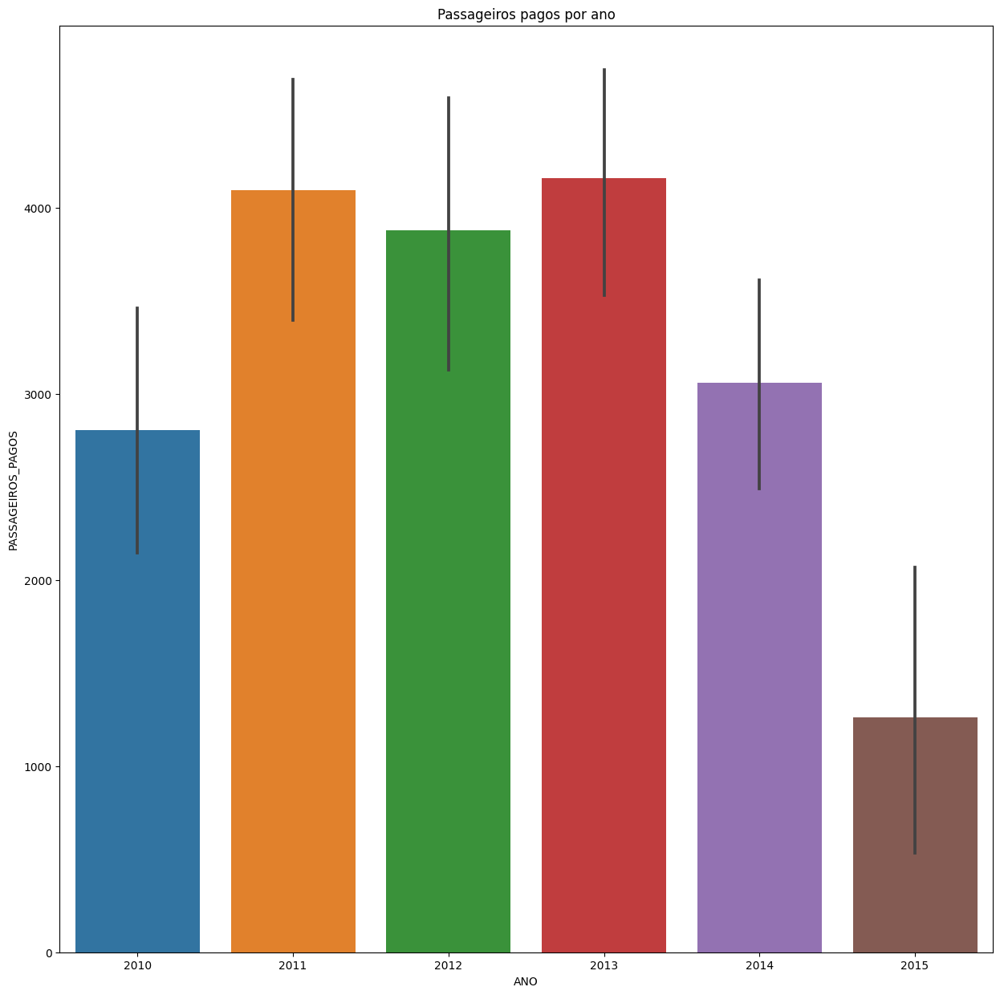





BOA BOLIVIANA DE AVIACIÓN


count     499.000000
mean     2105.869739
std      1630.826743
min         0.000000
25%      1061.000000
50%      1777.000000
75%      3180.000000
max      9955.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


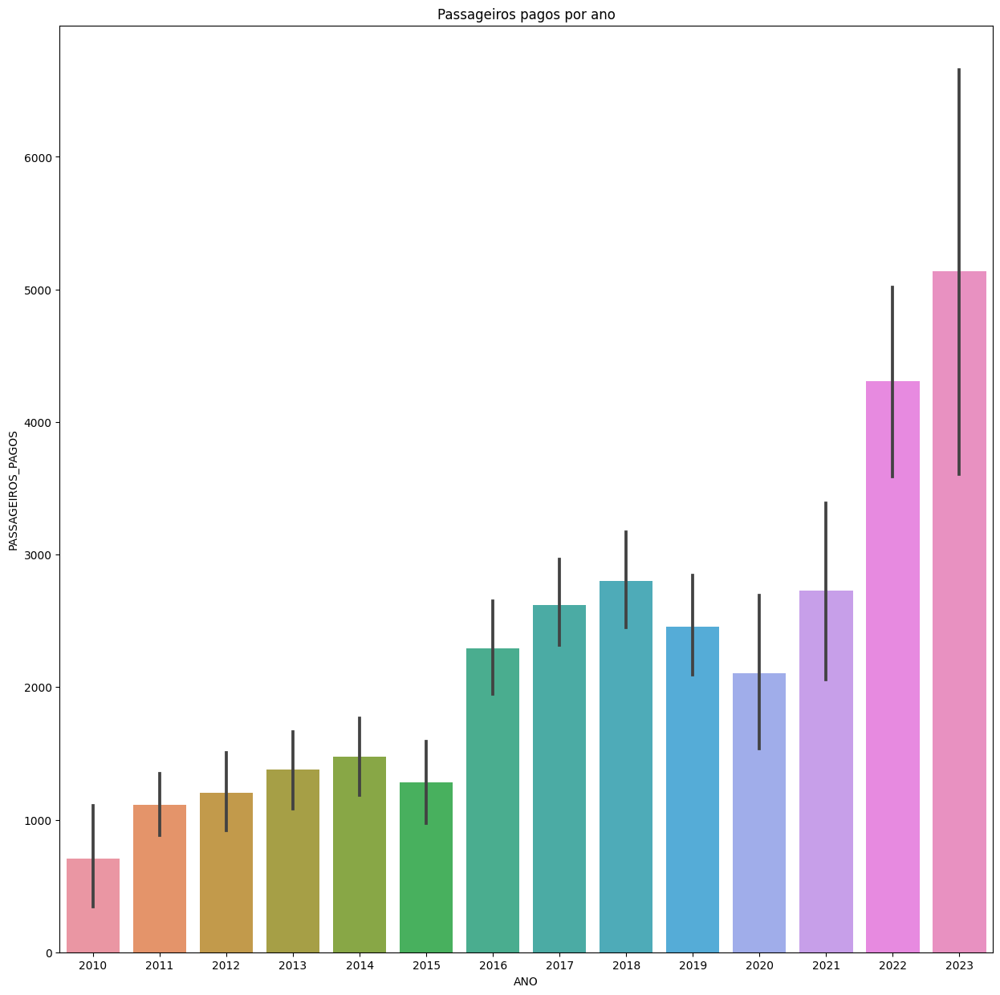





EL AL ISRAEL AIRLINES LTD


count      50.000000
mean     2516.900000
std       812.360462
min       220.000000
25%      2373.750000
50%      2731.000000
75%      3051.000000
max      3390.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


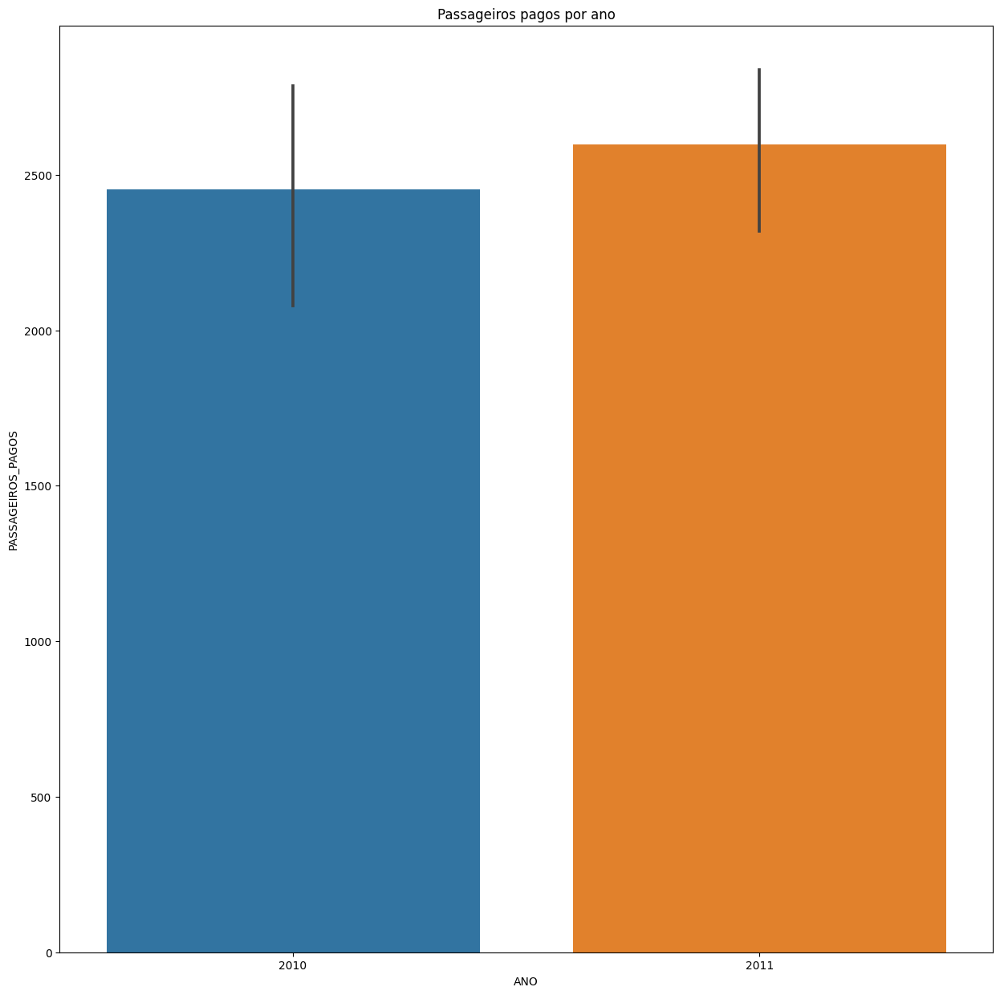





NOAR NORDESTE AVIAÇÃO REGIONAL LINHAS AÉREAS S.A.


count     265.000000
mean      154.452830
std       254.777693
min         0.000000
25%         9.000000
50%        58.000000
75%       185.000000
max      1281.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


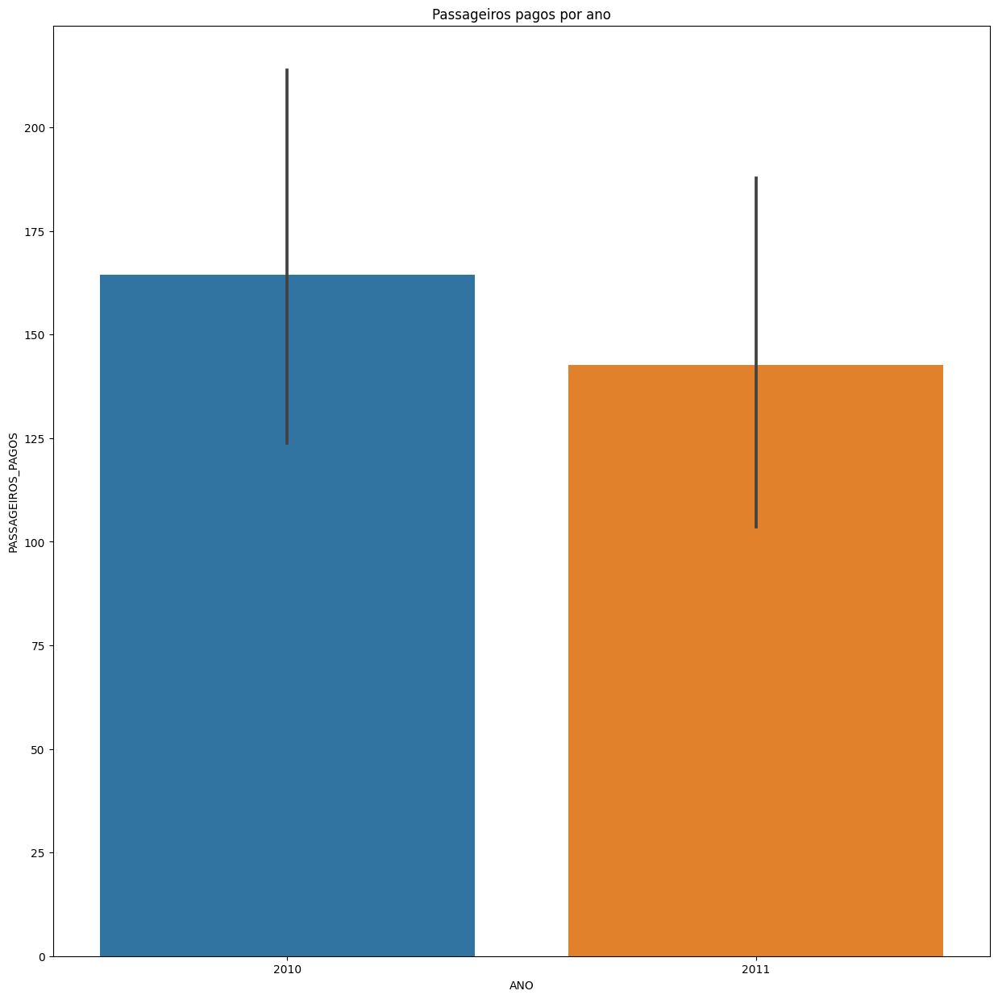





QATAR AIRWAYS GROUP


count     1495.000000
mean      2159.201338
std       3035.272404
min          0.000000
25%          0.000000
50%       1303.000000
75%       3862.500000
max      24343.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


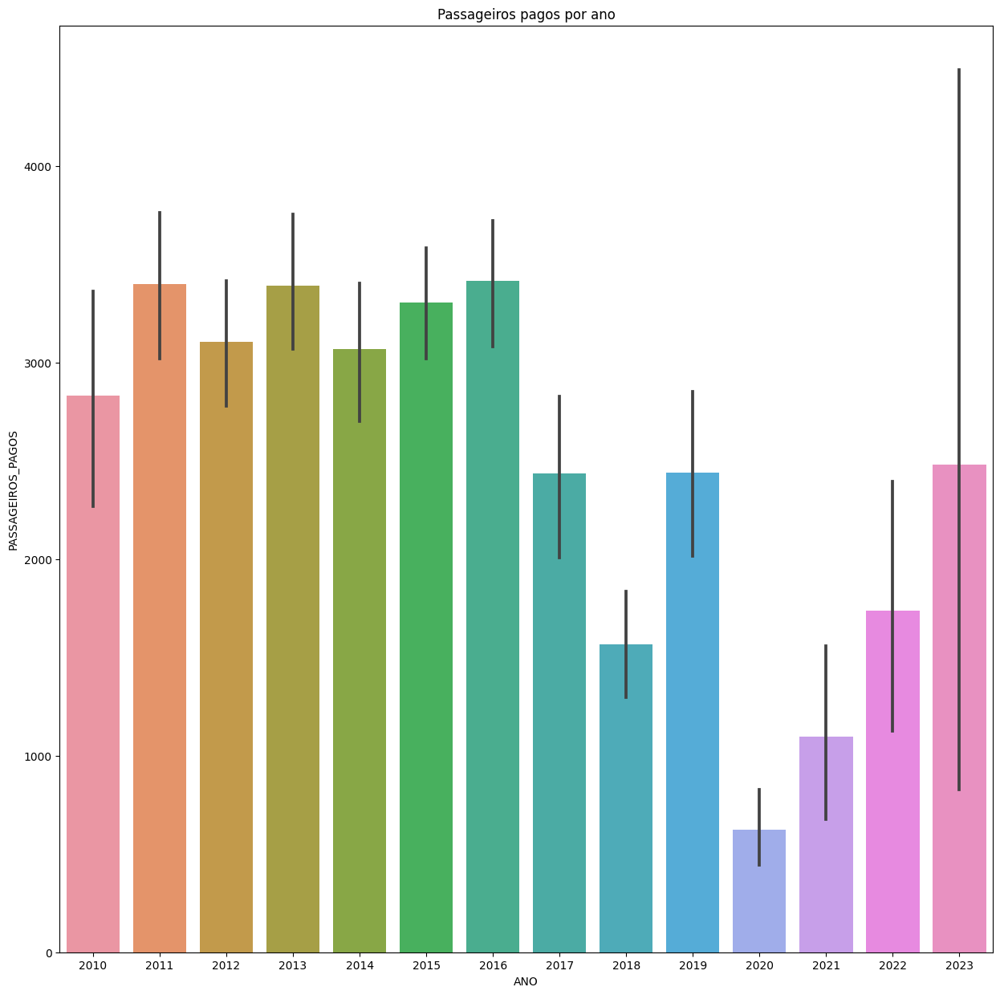





RIO LINHAS AÉREAS S.A.


count    2931.0
mean        0.0
std         0.0
min         0.0
25%         0.0
50%         0.0
75%         0.0
max         0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


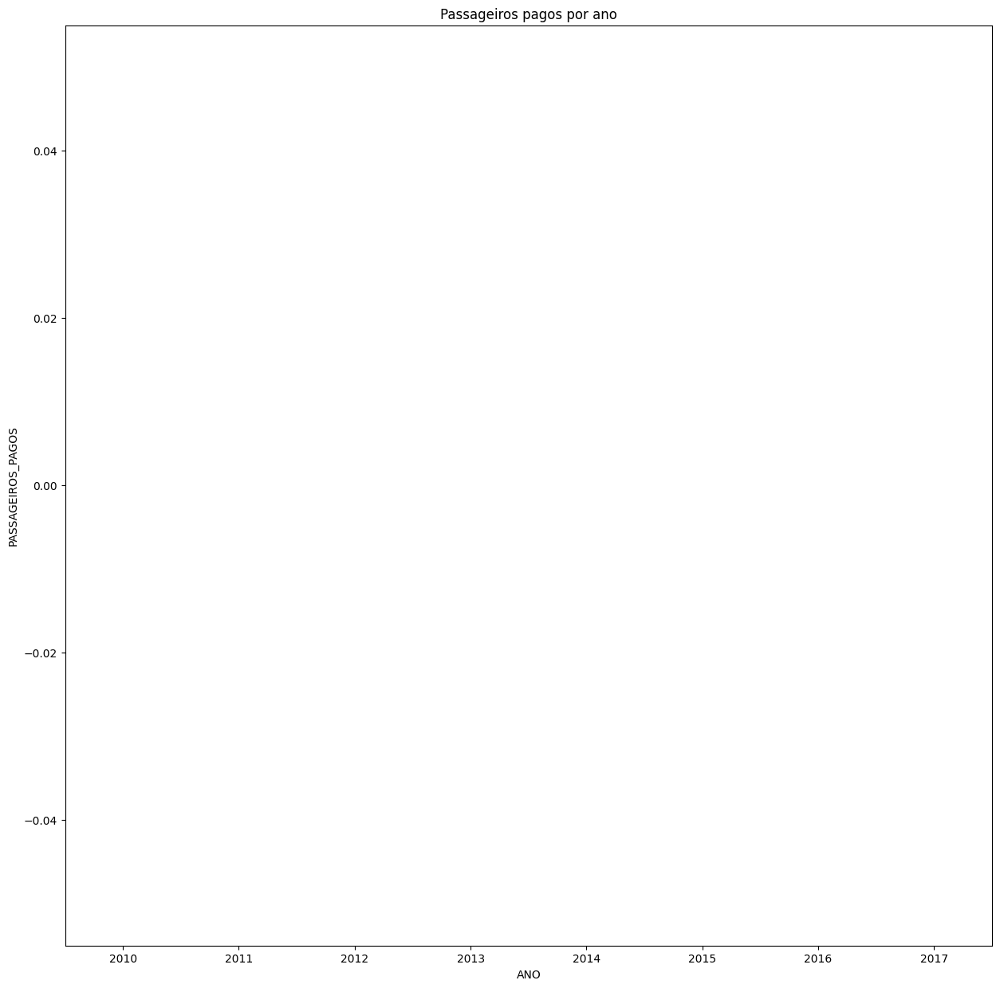





CARGOLUX ITÁLIA S.P.A.


count    111.0
mean       0.0
std        0.0
min        0.0
25%        0.0
50%        0.0
75%        0.0
max        0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


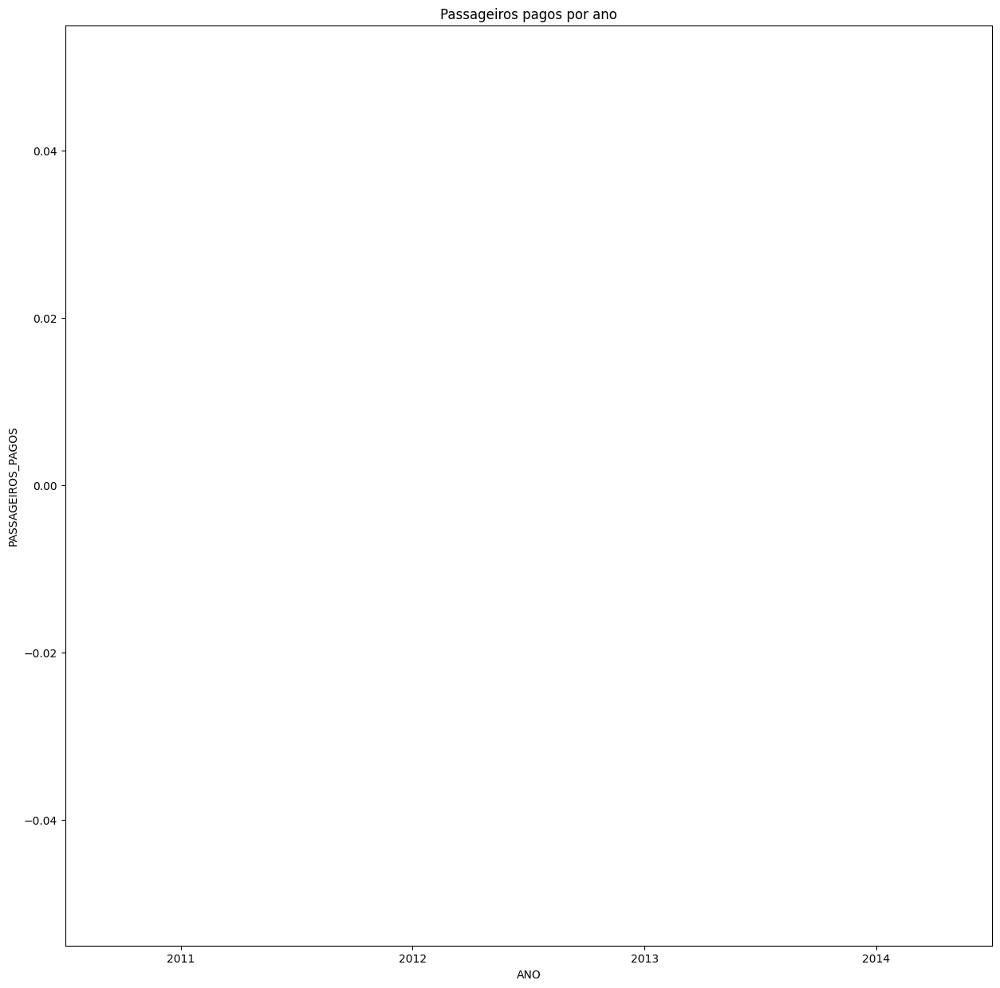





SINGAPORE AIRLINES LIMITED


count     405.000000
mean     1713.232099
std       967.362199
min        54.000000
25%       617.000000
50%      1974.000000
75%      2539.000000
max      3715.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


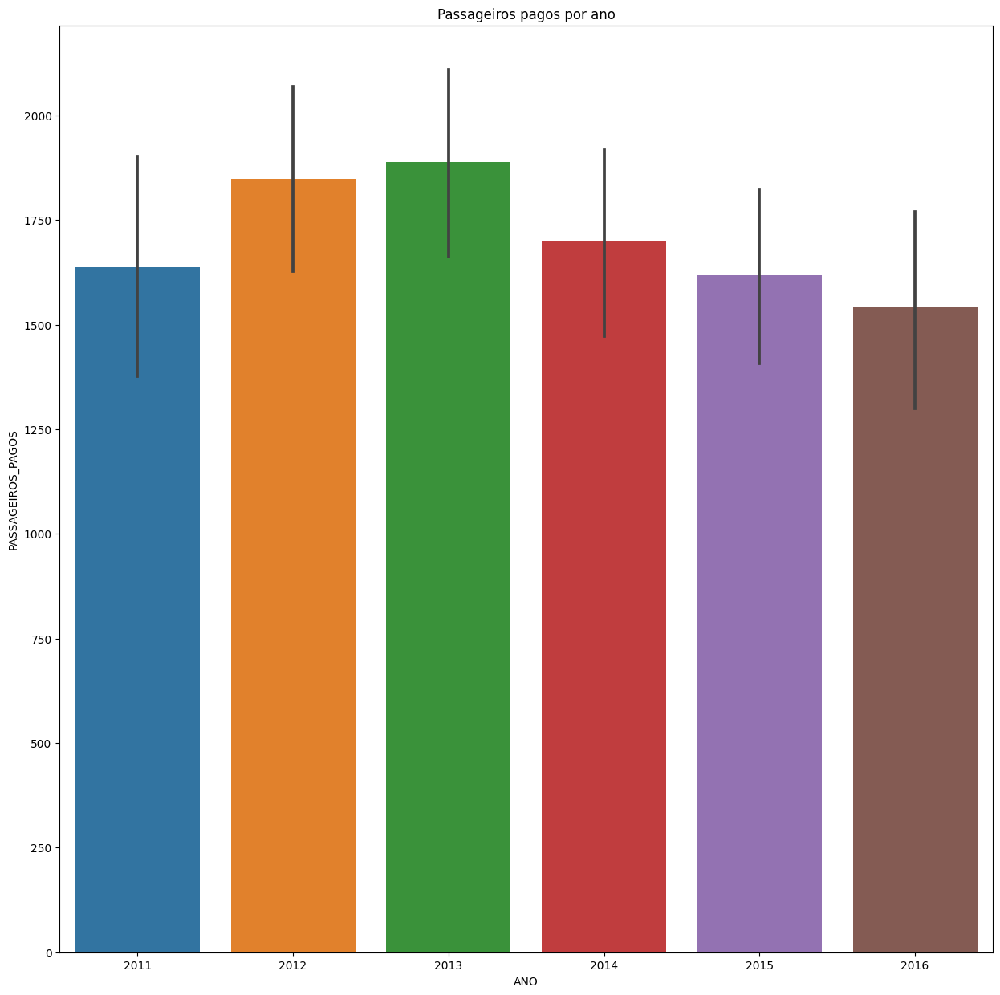





BAIRES FLY


count    3.0
mean     0.0
std      0.0
min      0.0
25%      0.0
50%      0.0
75%      0.0
max      0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


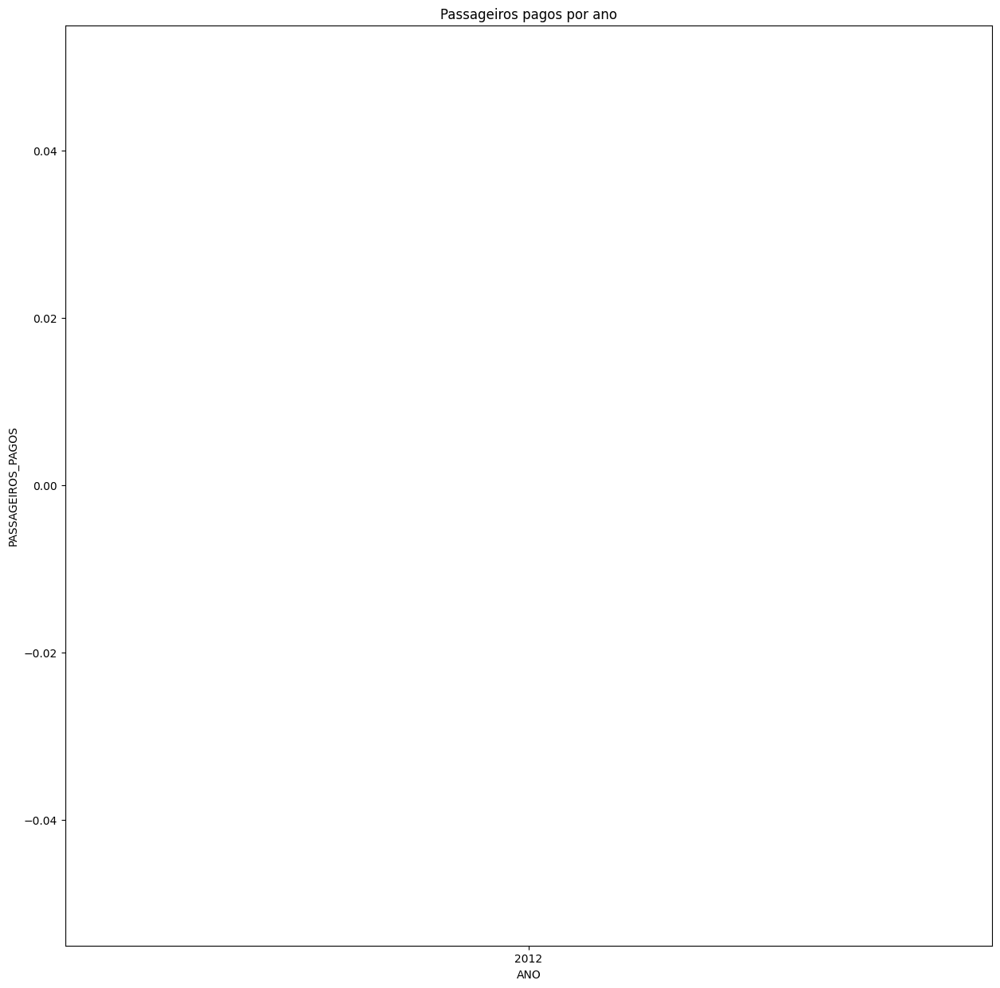





ACG AIR CARGO GERMANY GMBH


count    24.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


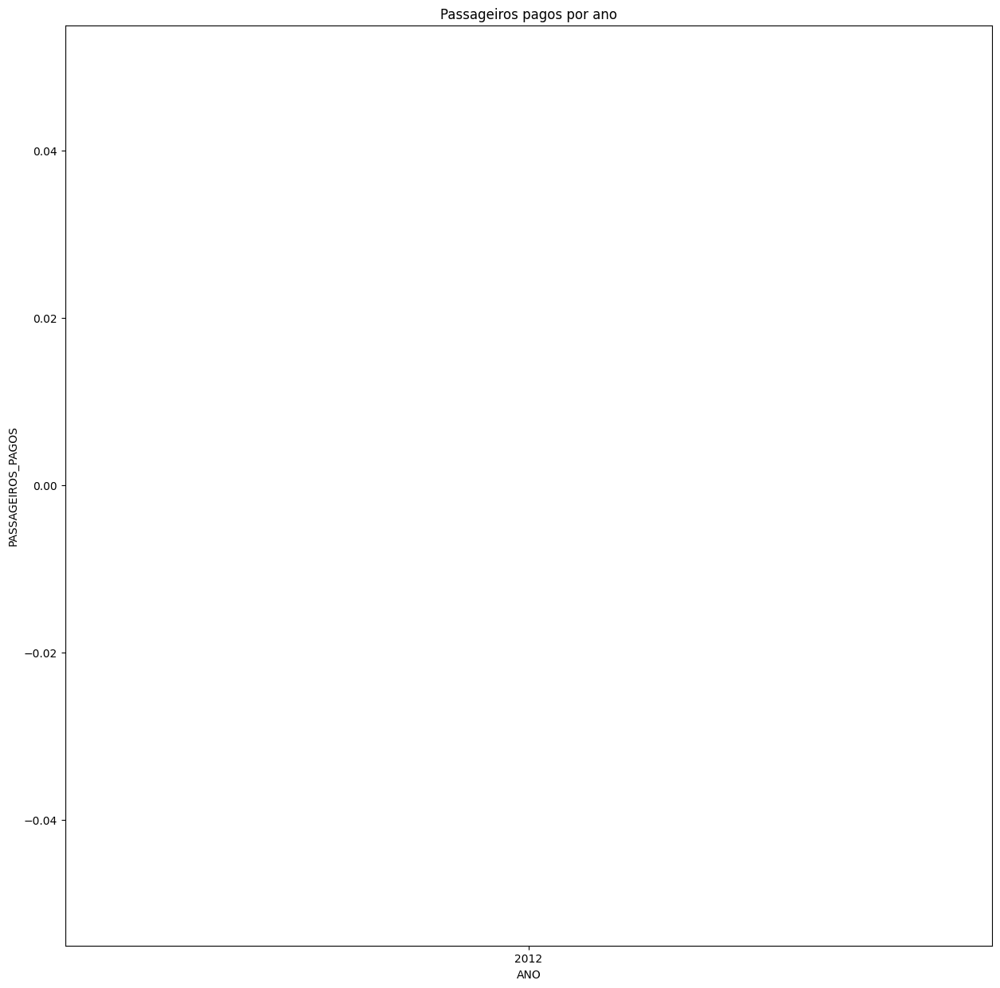

/usr/local/lib/python3.10/dist-packages/seaborn/algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))






ANTONOV COMPANY


count    140.0
mean       0.0
std        0.0
min        0.0
25%        0.0
50%        0.0
75%        0.0
max        0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


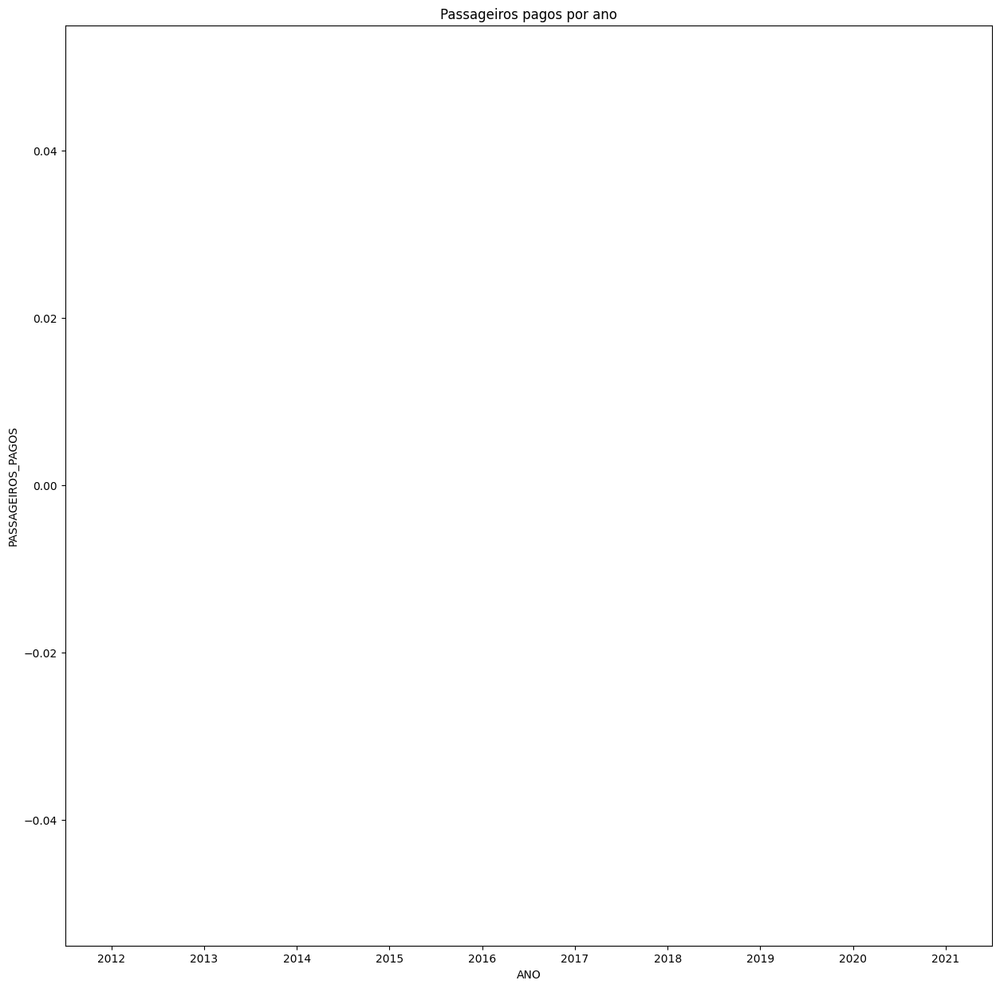





AIRES - AEROVÍAS DE INTEGRACÍON REGIONAL S.A.


count     115.000000
mean     4354.660870
std      2252.324125
min         0.000000
25%      2688.500000
50%      5369.000000
75%      6072.500000
max      6787.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


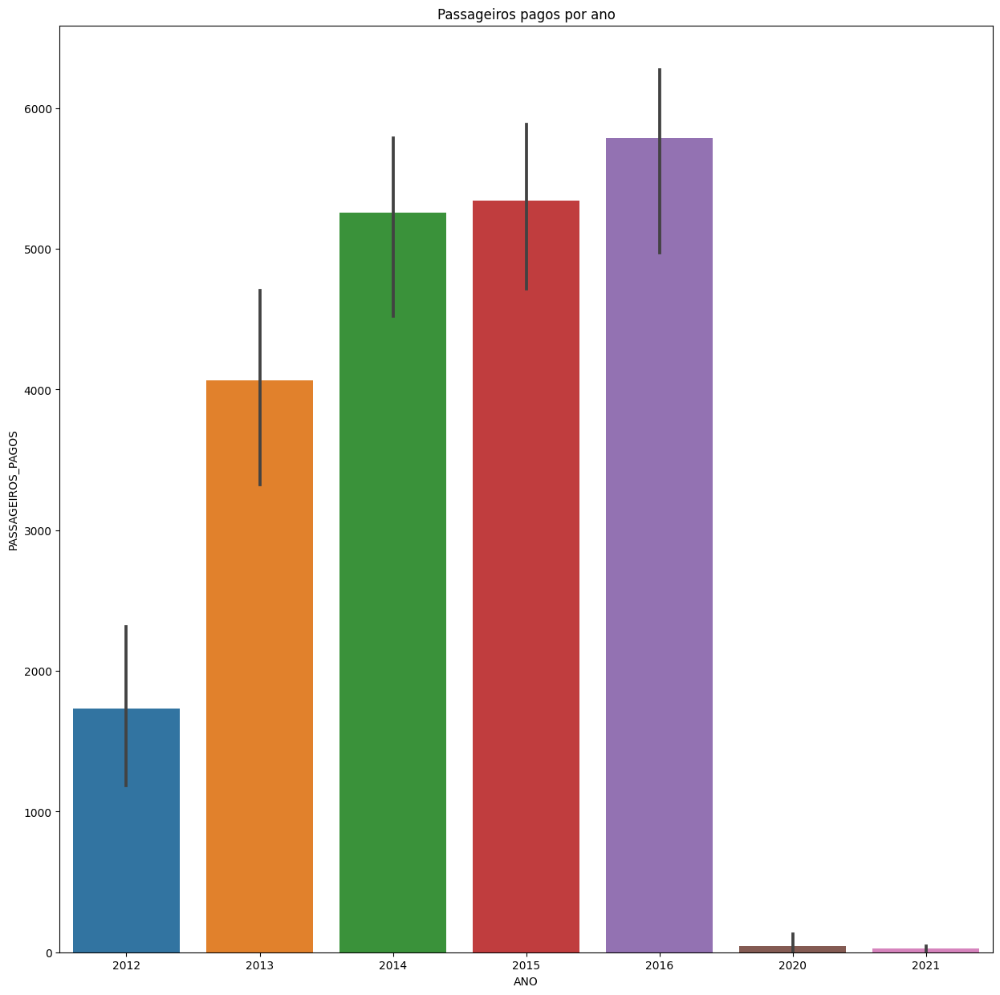





AIR TRANSPORT INTERNATIONAL


count    85.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


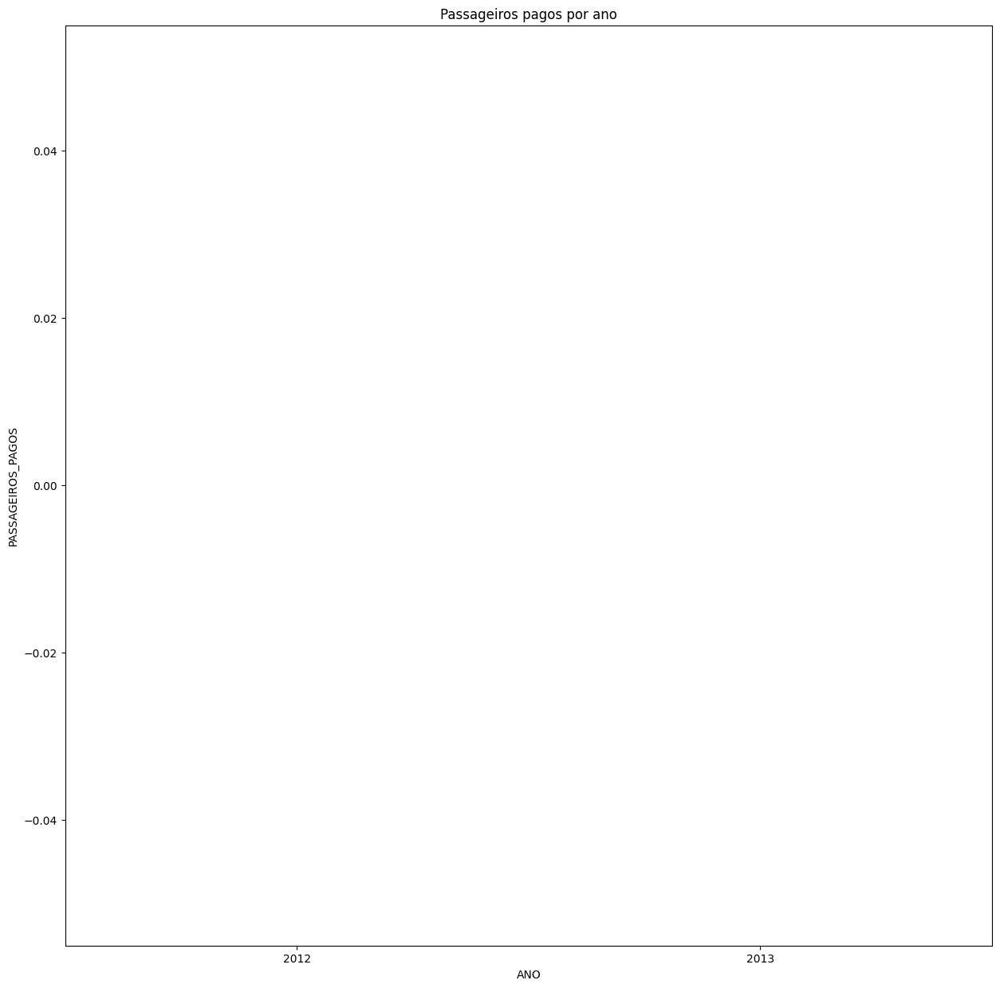





AUSTRAL LINEAS AÉREAS - CIELOS DEL SUR


count    1075.000000
mean     1395.543256
std      1139.463232
min         0.000000
25%       411.000000
50%      1321.000000
75%      2012.000000
max      6555.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


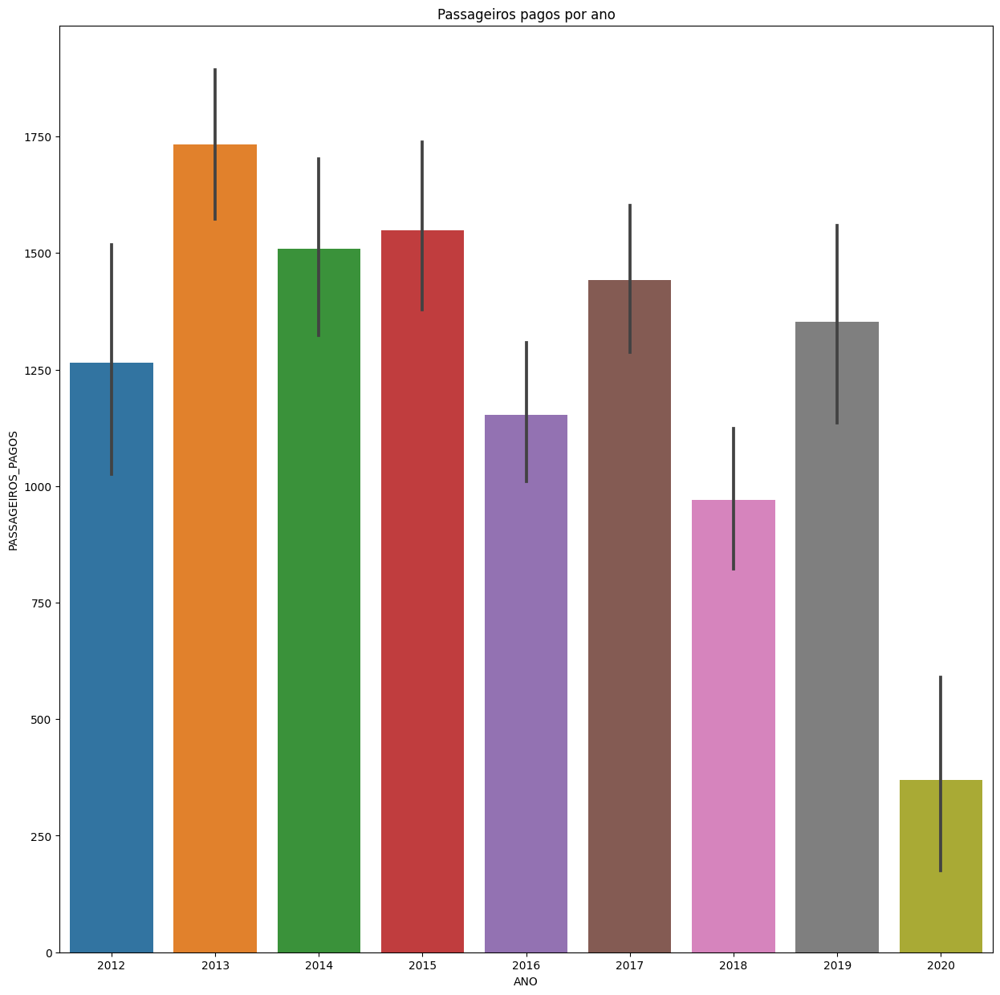





EVERGREEN INTERNATIONAL AIRLINES


count    84.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


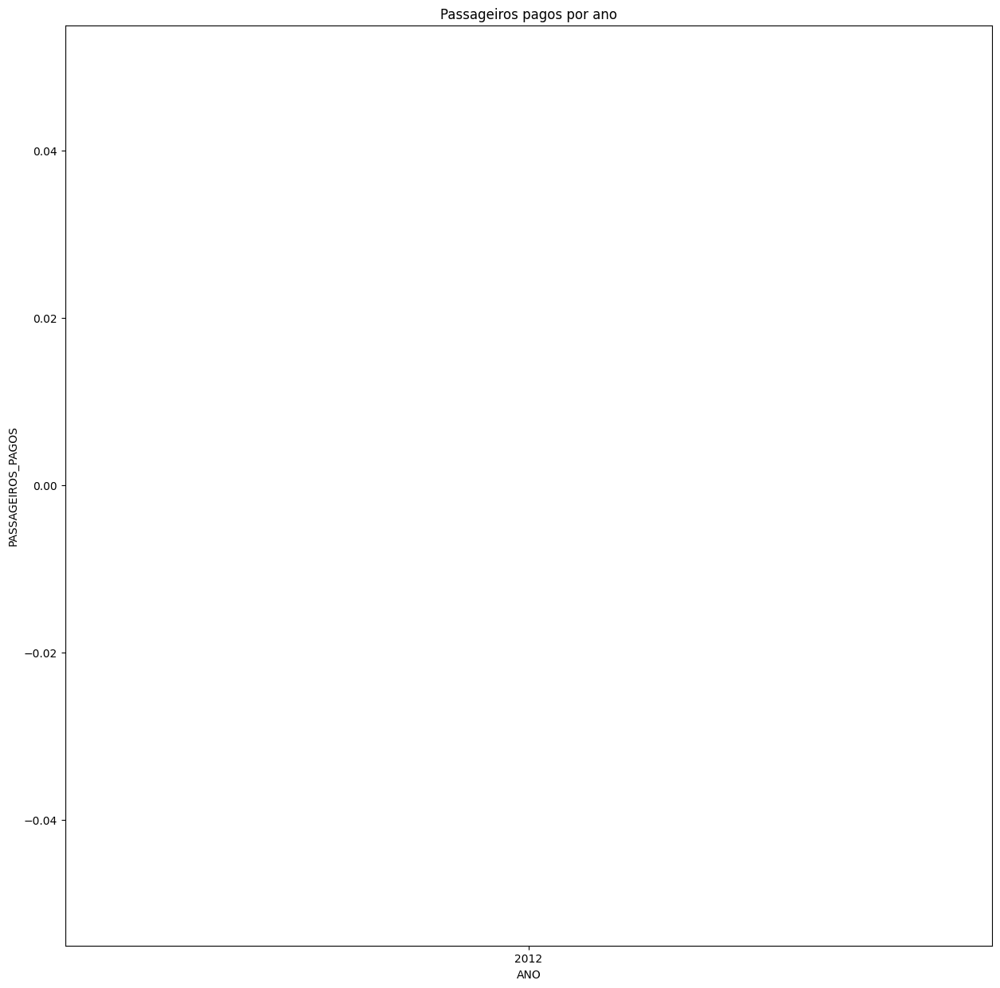





FINLIGHT LIMITED LIABILITY COMPANY


count    9.0
mean     0.0
std      0.0
min      0.0
25%      0.0
50%      0.0
75%      0.0
max      0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


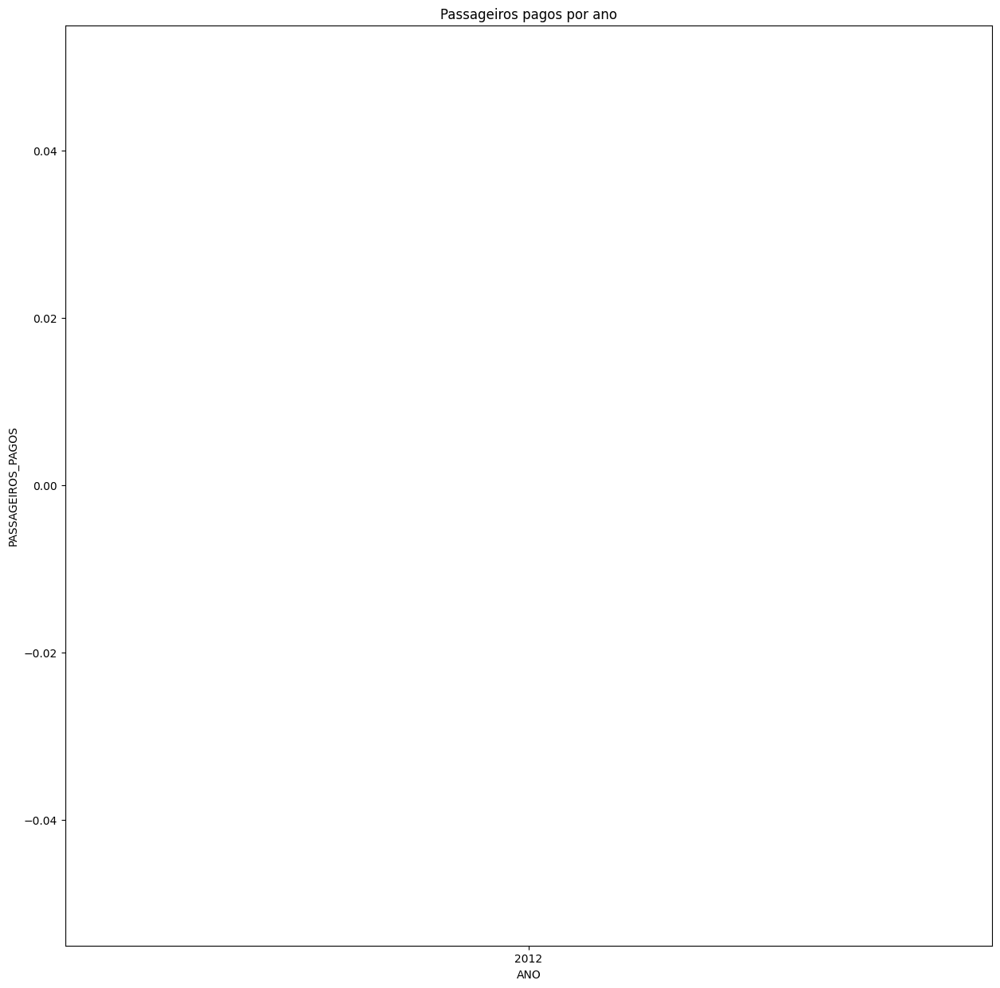





FLORIDA WEST INTL. AIRWAYS, INC.


count    1171.0
mean        0.0
std         0.0
min         0.0
25%         0.0
50%         0.0
75%         0.0
max         0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


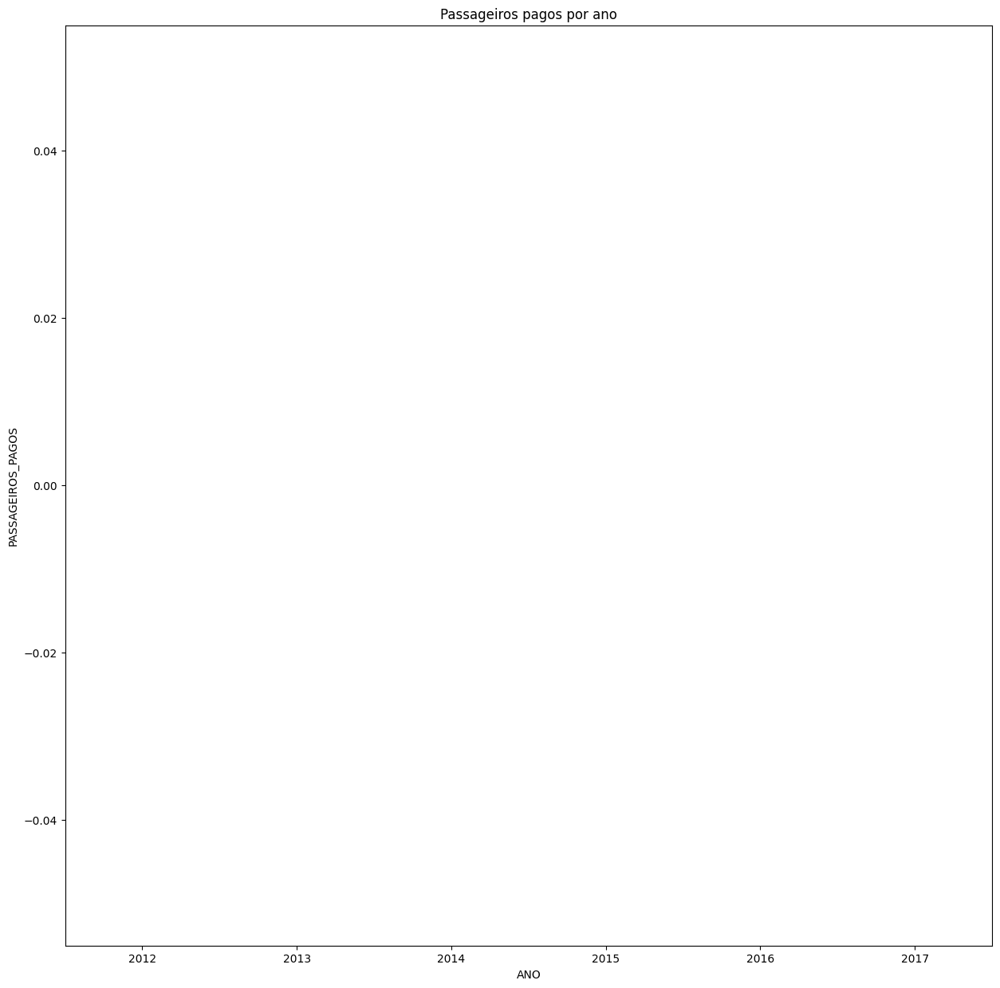





SPRINGJET S.A. (EX -HI FLY - TRANSPORTES AÉREOS S/A.)


count    293.000000
mean     120.928328
std      128.111433
min        0.000000
25%        0.000000
50%       99.000000
75%      219.000000
max      631.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


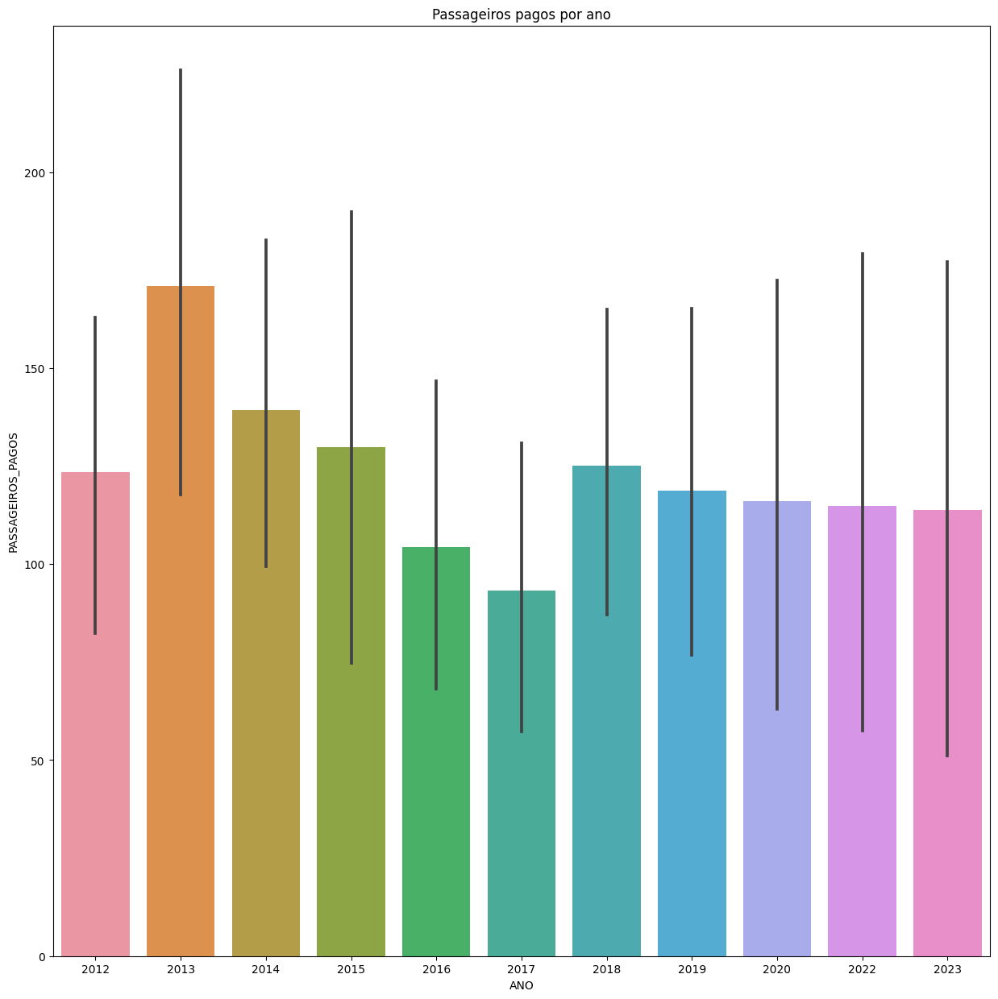





SKY LEASE I, INC


count    930.0
mean       0.0
std        0.0
min        0.0
25%        0.0
50%        0.0
75%        0.0
max        0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


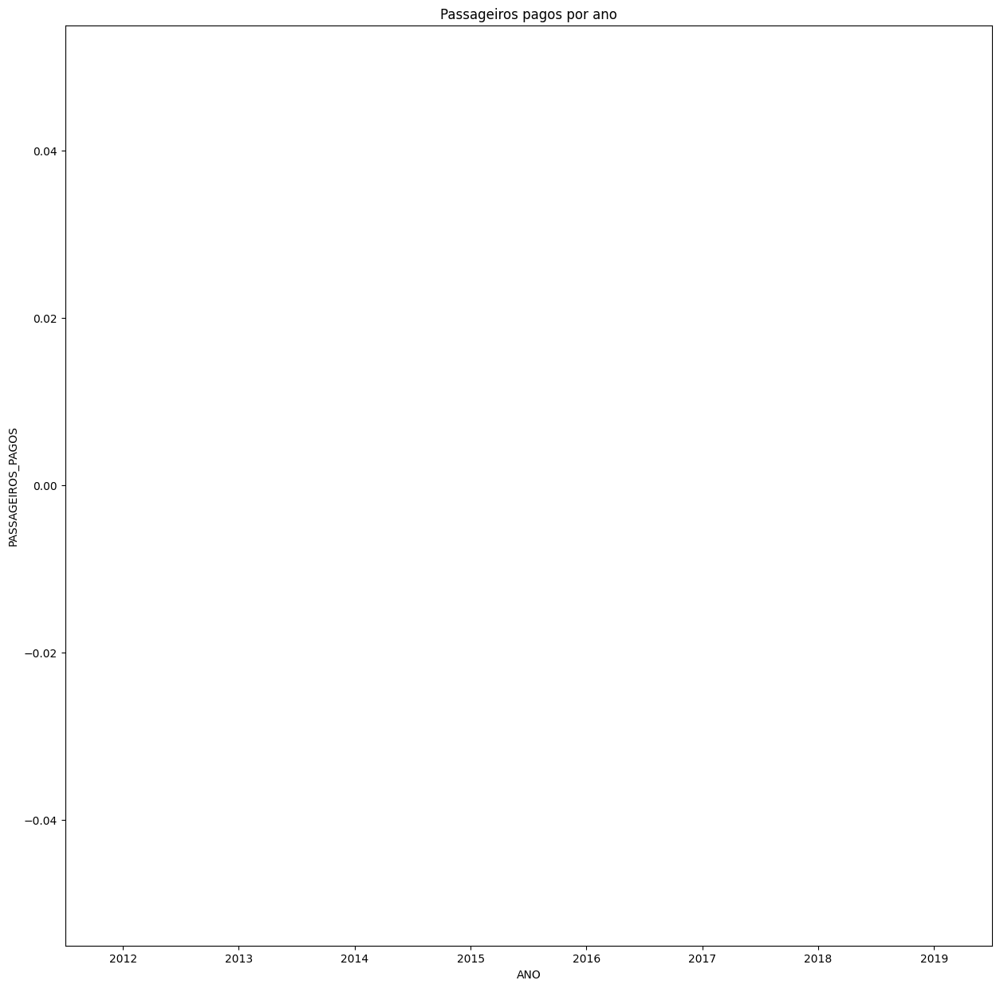





AVIANCA COSTA RICA SOCIEDAD ANONIMA ( EX - LACSA LÍNEAS AÉREAS COSTARRICENSES S/A)


count      53.000000
mean     1166.886792
std      1090.090904
min         0.000000
25%       112.000000
50%      1006.000000
75%      1507.000000
max      3582.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


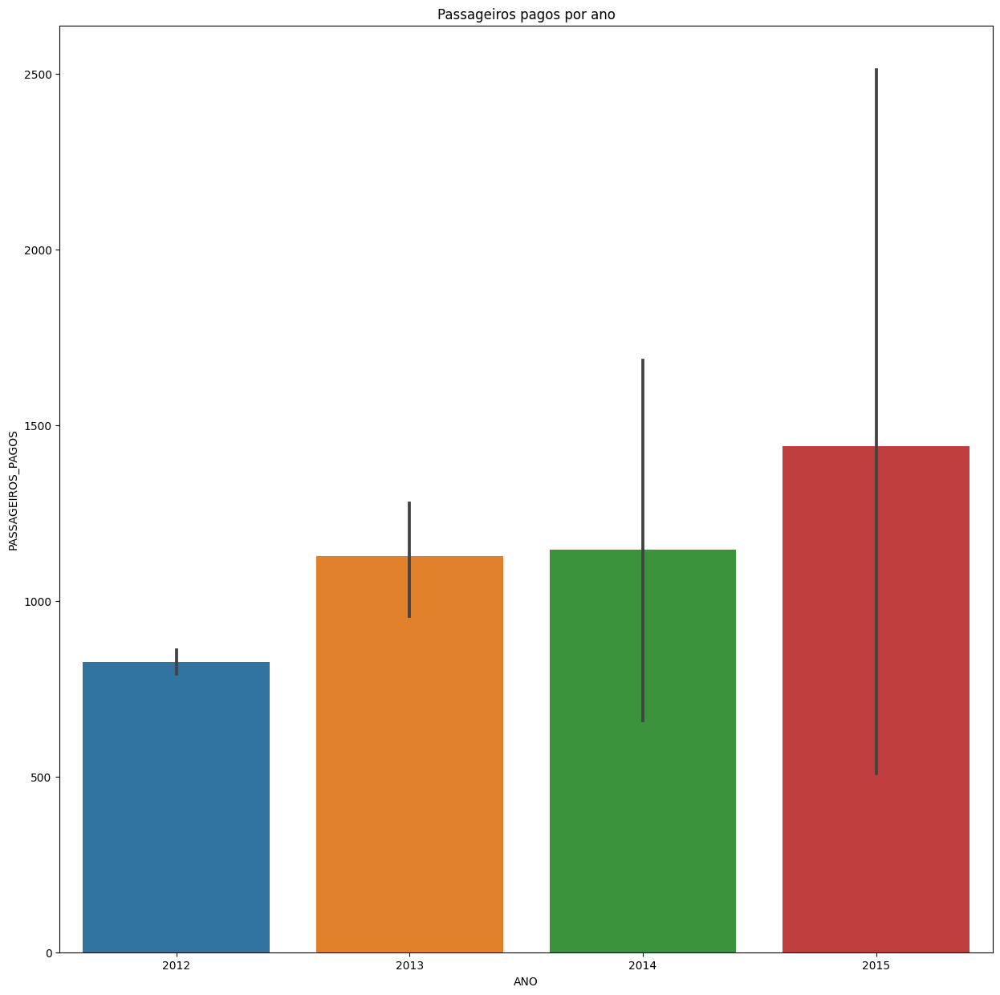





AIR COMPANY MERIDIAN, LTD


count    25.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


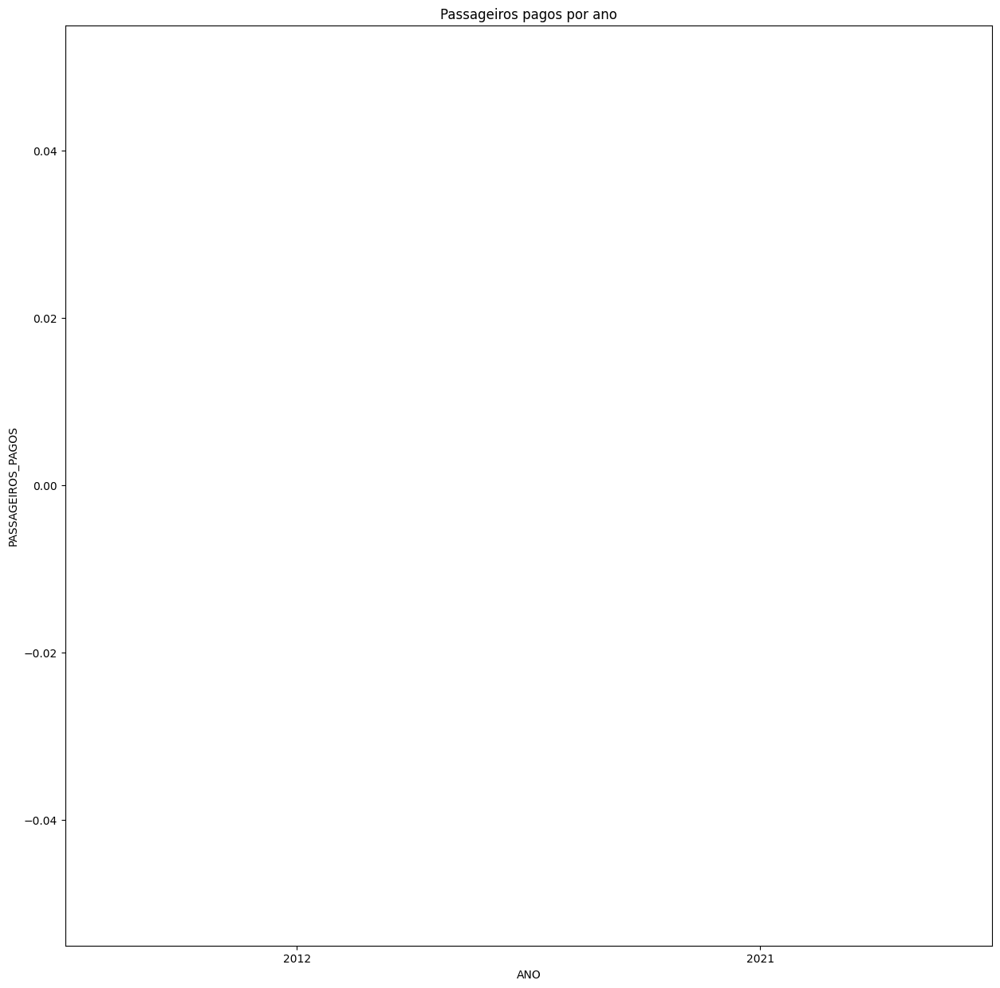

/usr/local/lib/python3.10/dist-packages/seaborn/algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))






MAIS LINHAS AÉREAS S.A


count     34.000000
mean      51.411765
std       42.488585
min        0.000000
25%        5.750000
50%       50.000000
75%       74.500000
max      165.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


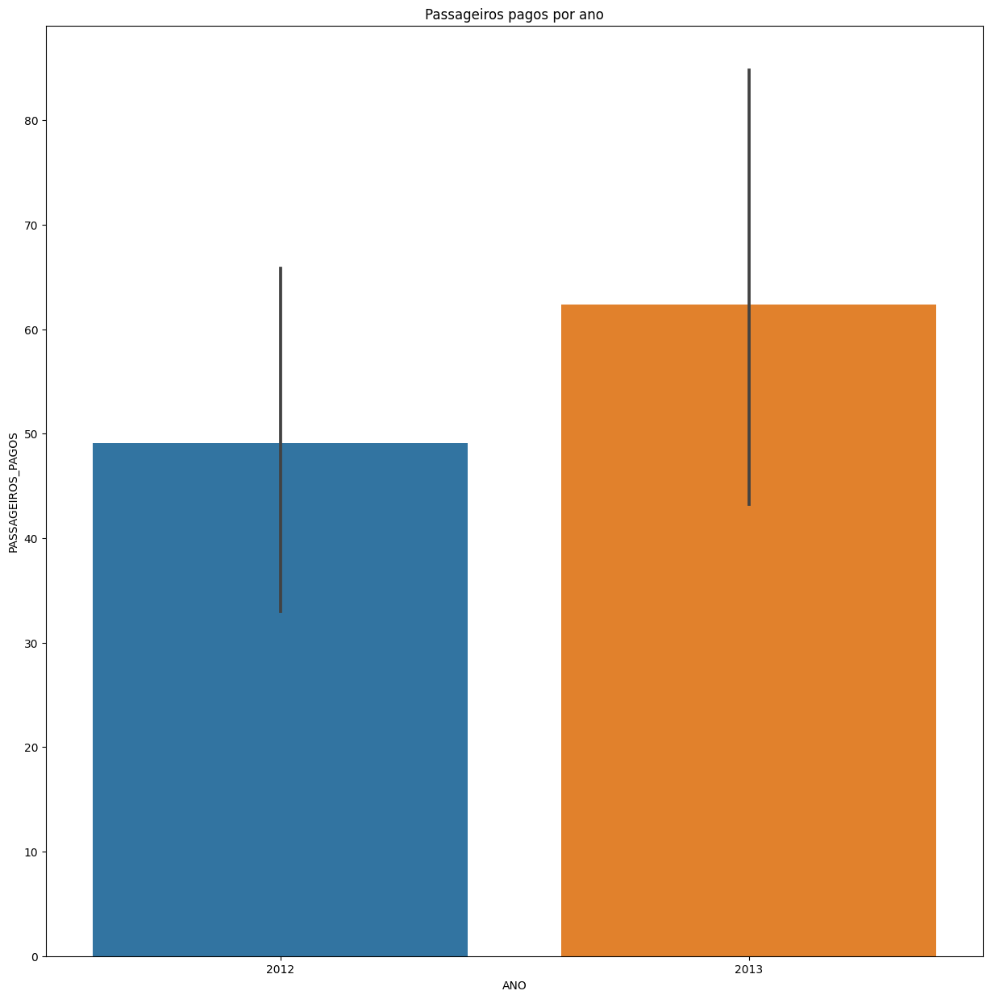





NIPON CARGO AIRLINES


count    49.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


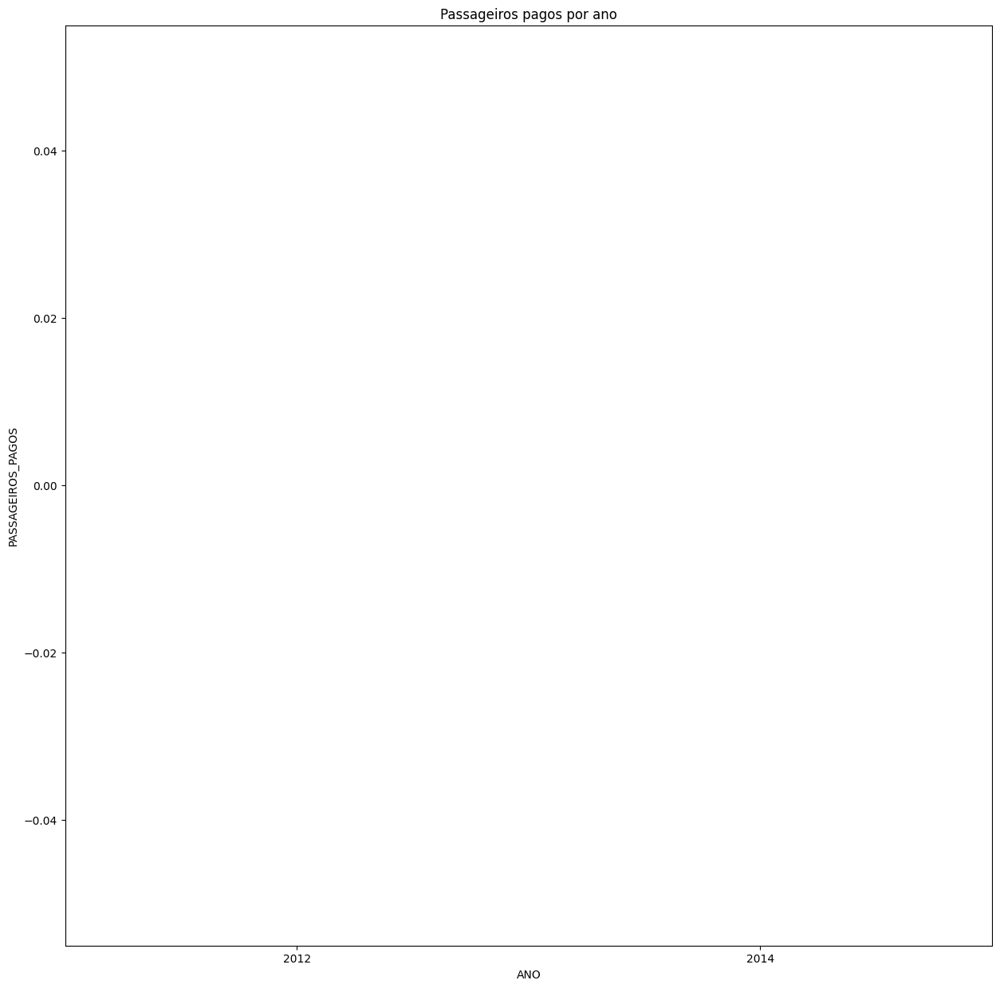





AIR EXPRESS S.A. (AIR CLASS LINEAS AEREAS) / EX-AERO V.I.P. LTDA


count    259.000000
mean       0.007722
std        0.124274
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max        2.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


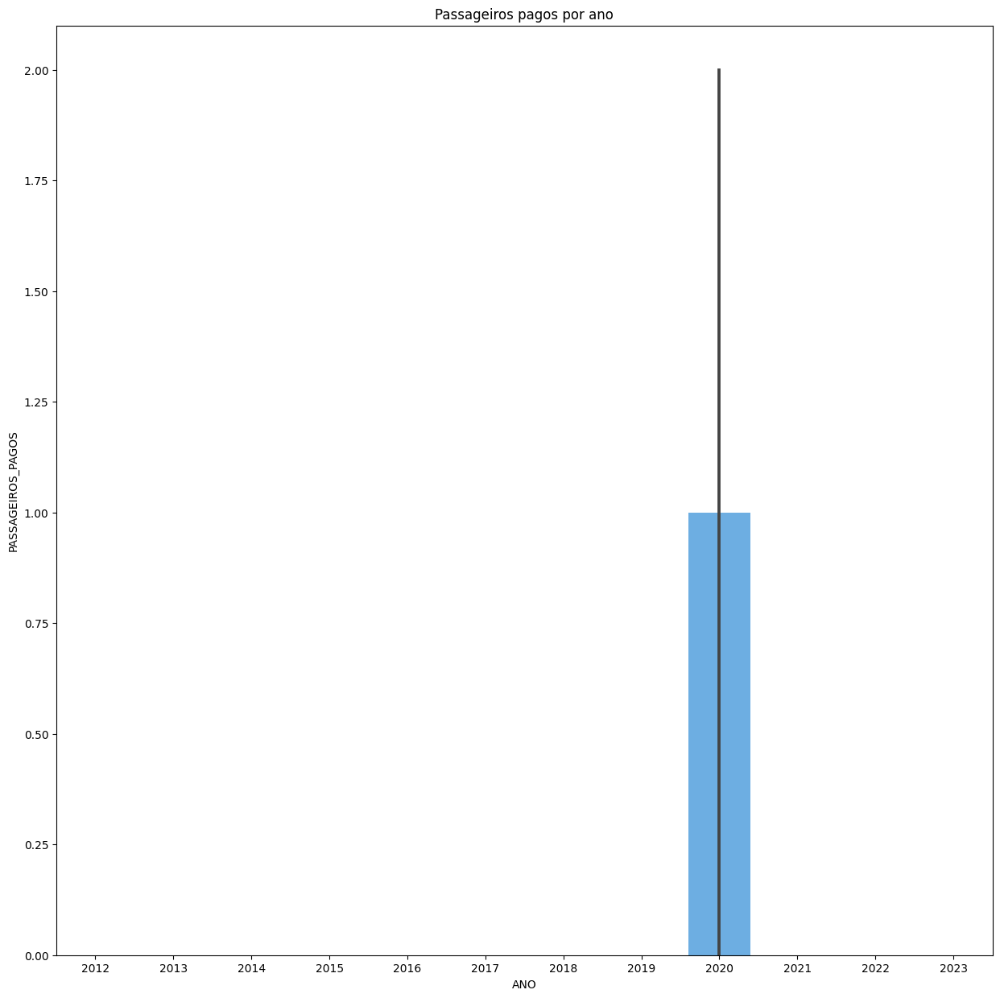





ACT AIRLINES


count    106.0
mean       0.0
std        0.0
min        0.0
25%        0.0
50%        0.0
75%        0.0
max        0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


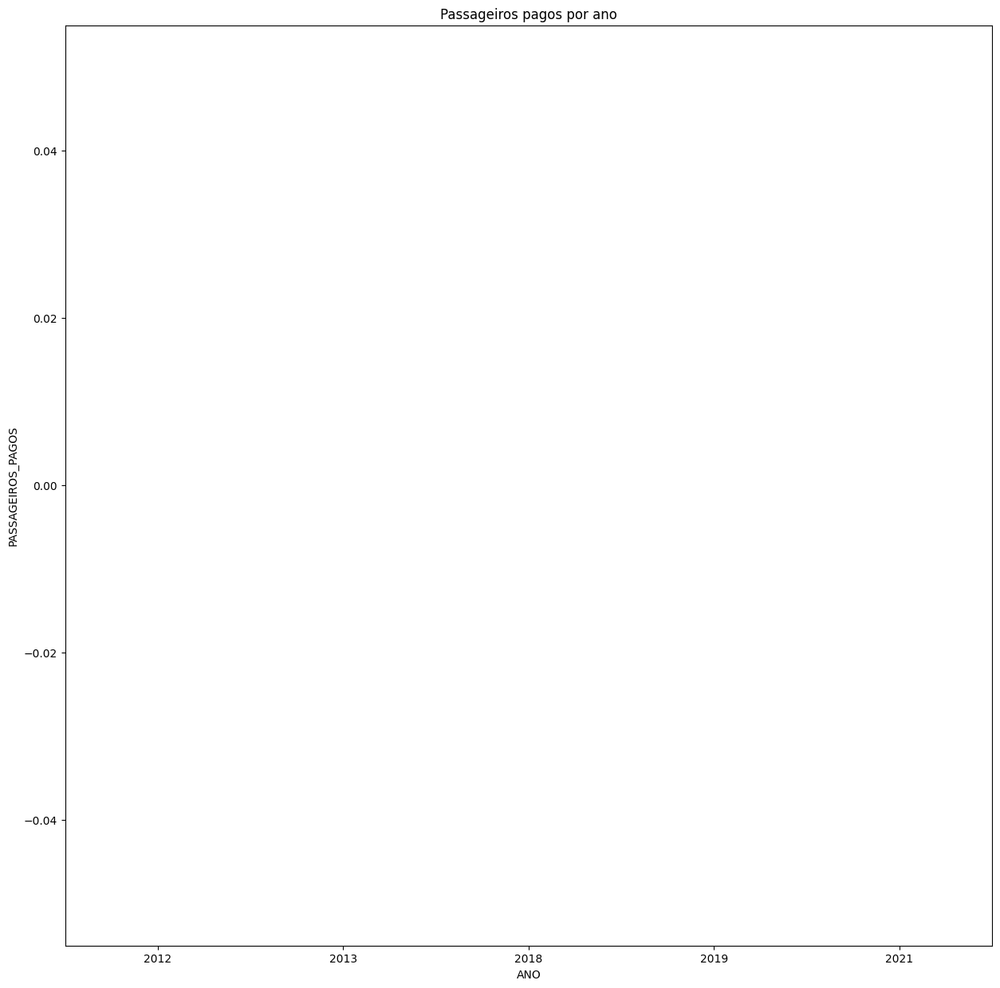





SATA INTERNACIONAL - AZORES AIRLINES


count     53.000000
mean     298.320755
std      198.648973
min        0.000000
25%      158.000000
50%      223.000000
75%      435.000000
max      846.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


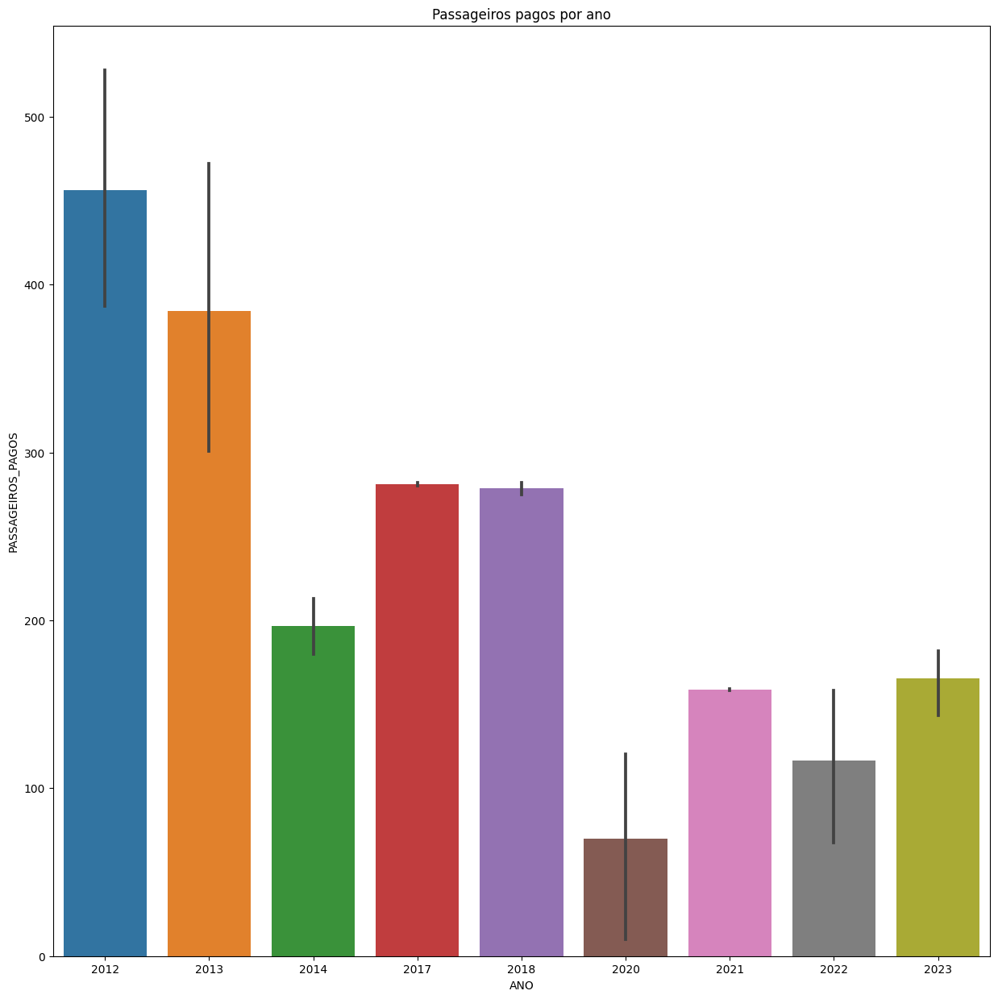





SOL DEL PARAGUAY LINEAS AÉREAS


count      6.000000
mean      67.166667
std       57.645179
min        0.000000
25%       18.250000
50%       73.000000
75%      114.250000
max      129.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


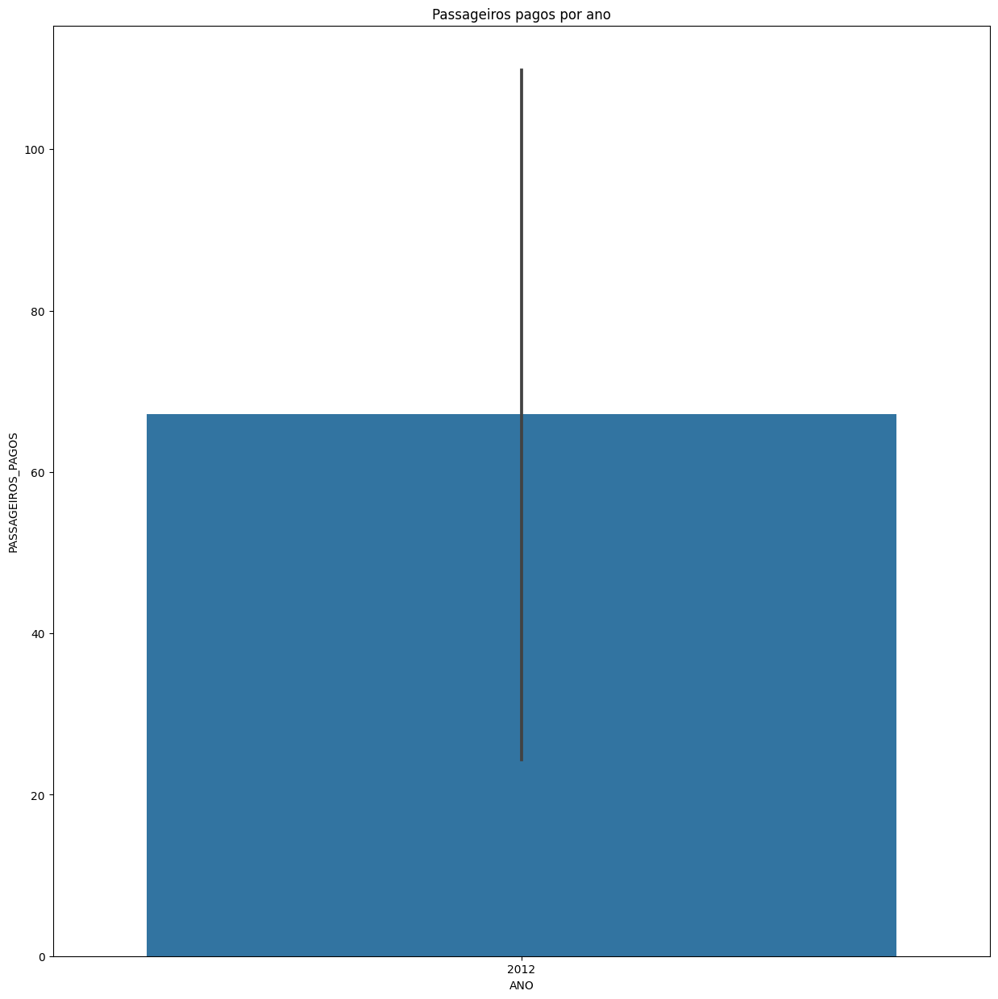





SIDERAL LINHAS AÉREAS LTDA.


count    6690.000000
mean        7.771749
std        42.654432
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max      1218.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


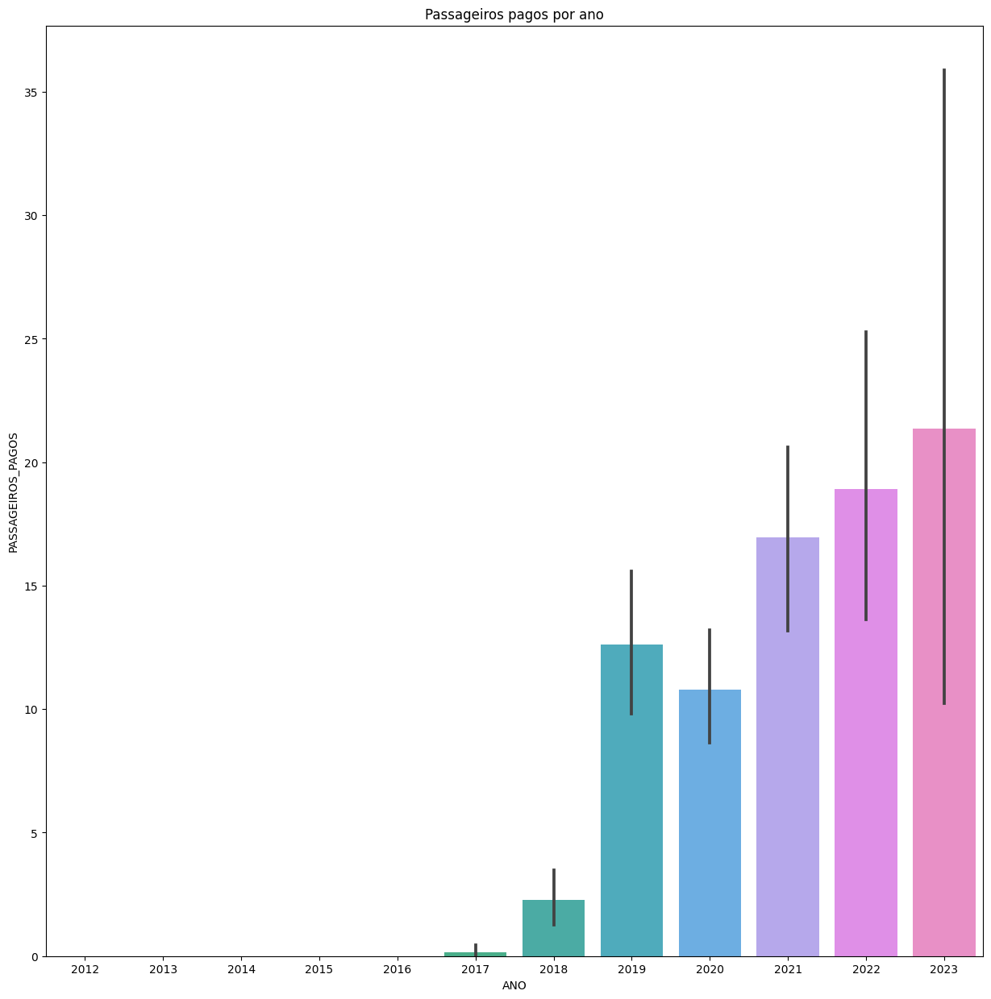





AVIENT AVIATION


count    112.0
mean       0.0
std        0.0
min        0.0
25%        0.0
50%        0.0
75%        0.0
max        0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


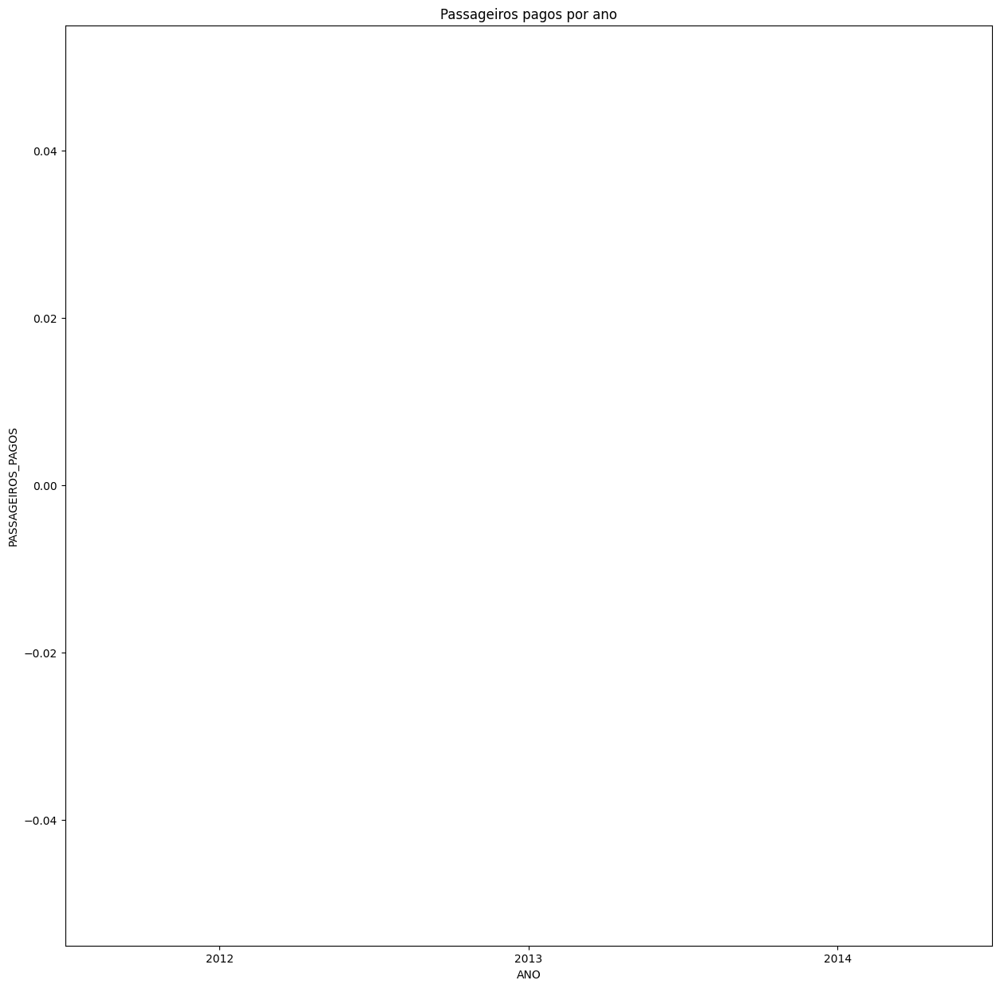





SOUTHERN AIR INC


count    289.0
mean       0.0
std        0.0
min        0.0
25%        0.0
50%        0.0
75%        0.0
max        0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


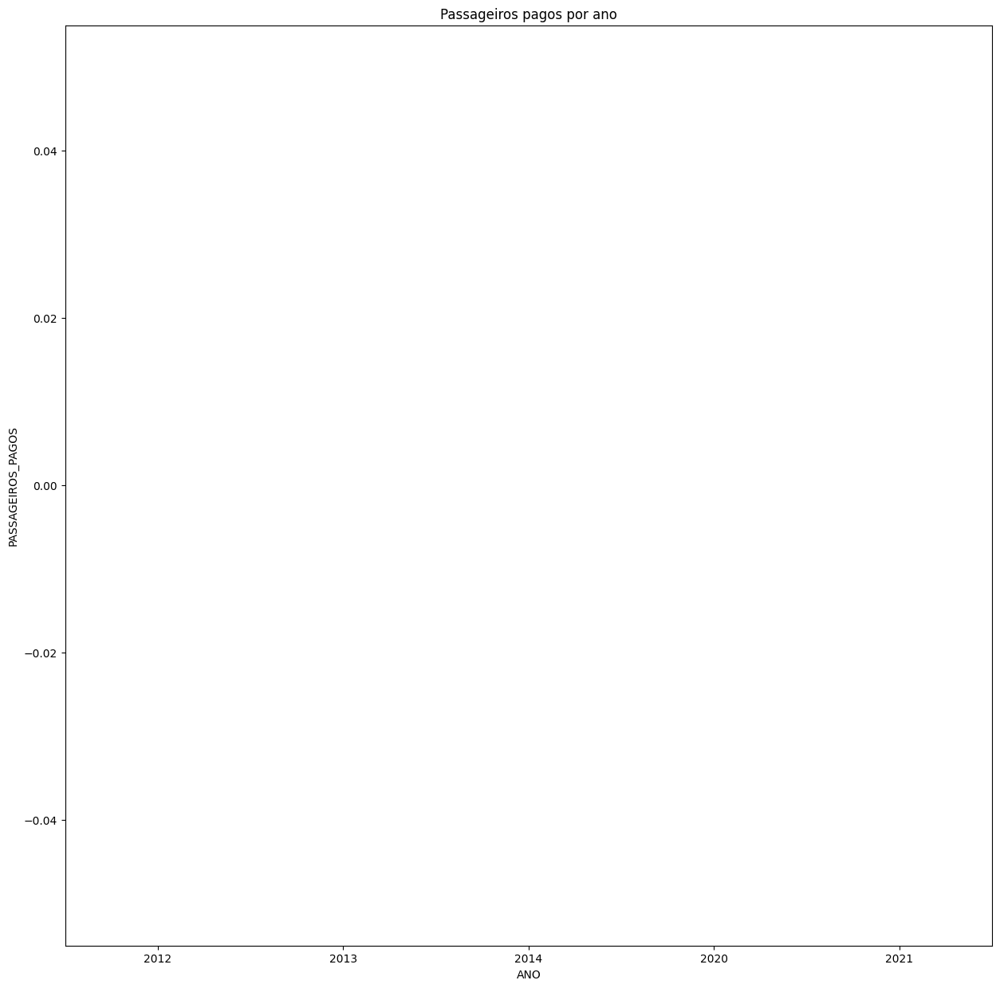





SINGAPORE AIRLINES CARGO PTE LTD.


count    84.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


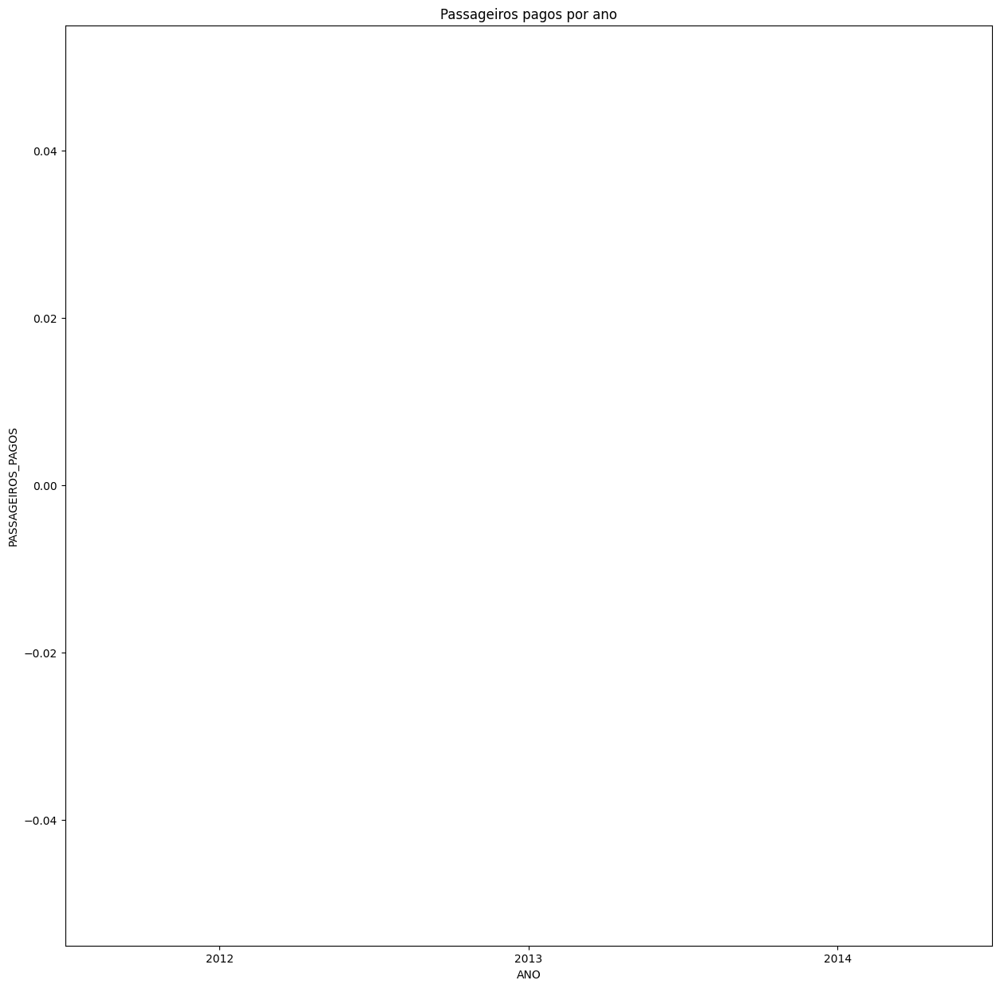





TUI AIRLINES NEDERLAND BV


count     476.000000
mean      121.161765
std       204.862925
min         0.000000
25%         0.000000
50%         0.000000
75%       242.750000
max      1046.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


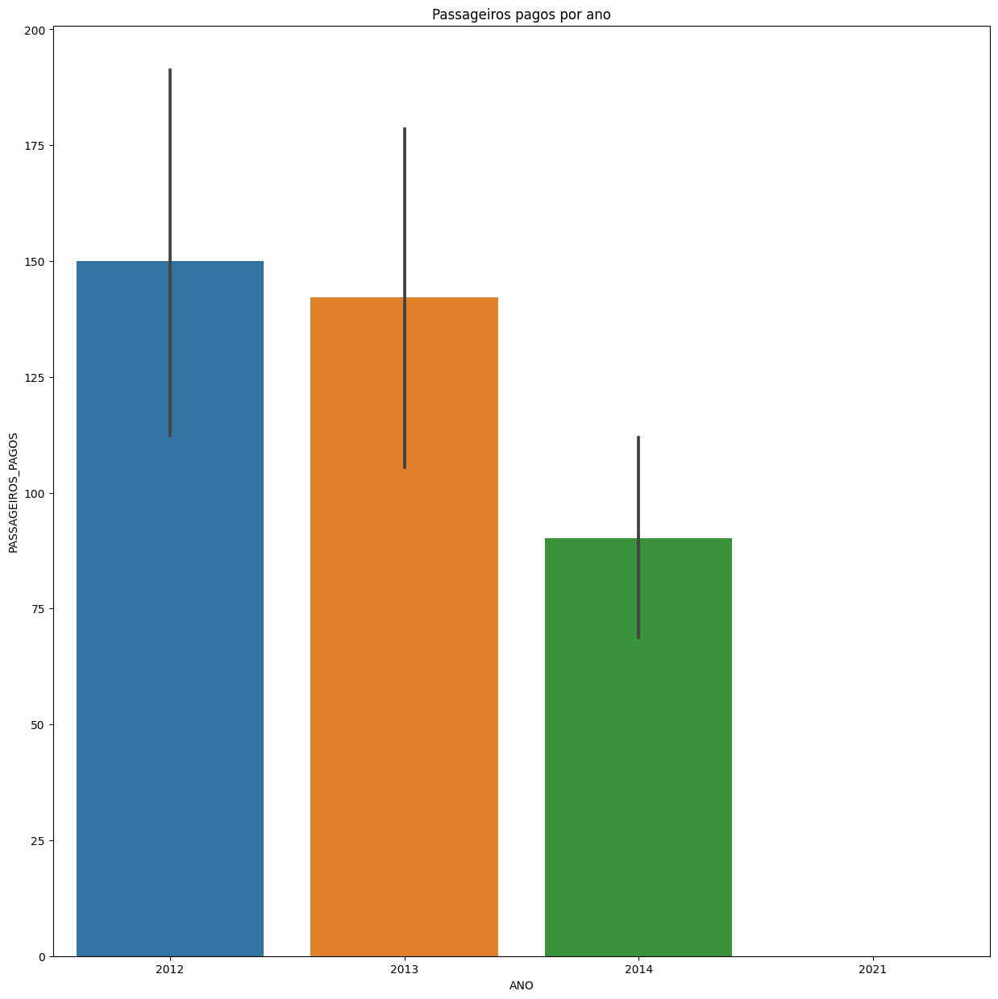





AVIALEASING AVIATION COMPANY


count    27.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


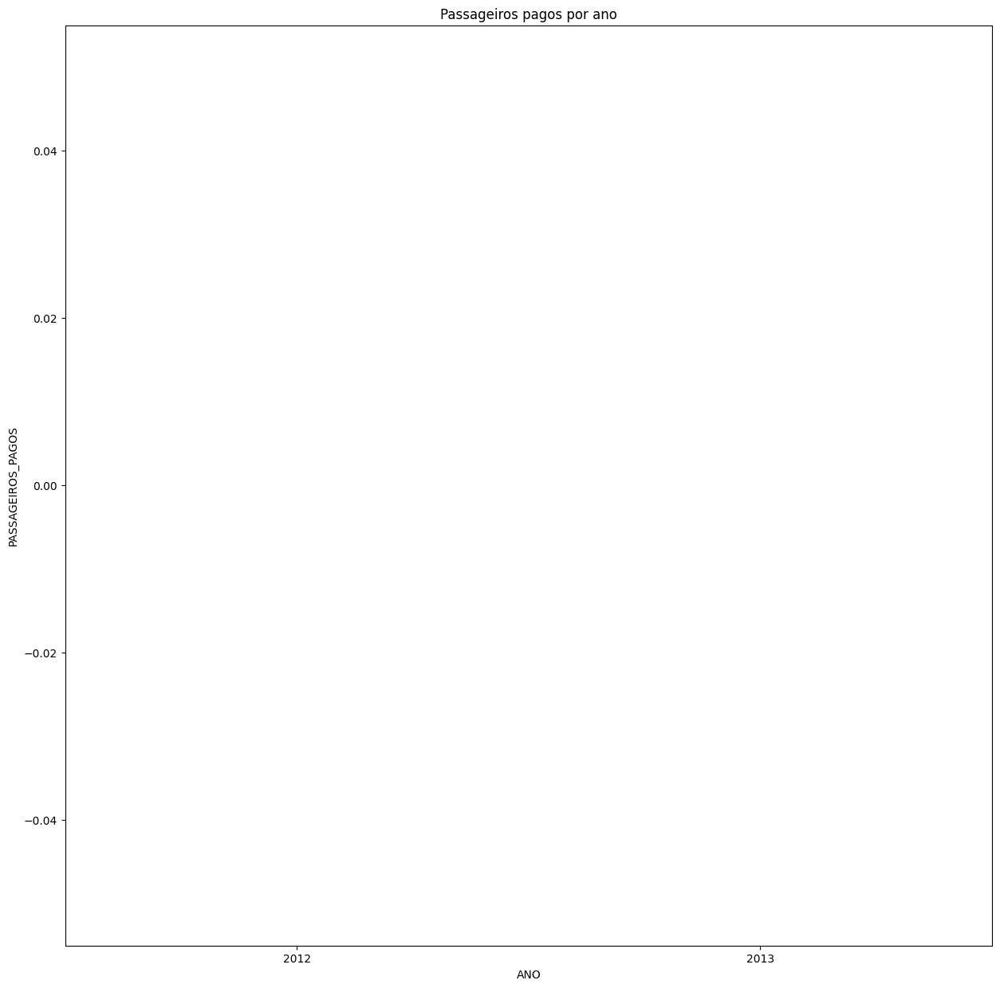





UKRAINE AIR ALLIANCE AIRLINES


count    223.0
mean       0.0
std        0.0
min        0.0
25%        0.0
50%        0.0
75%        0.0
max        0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


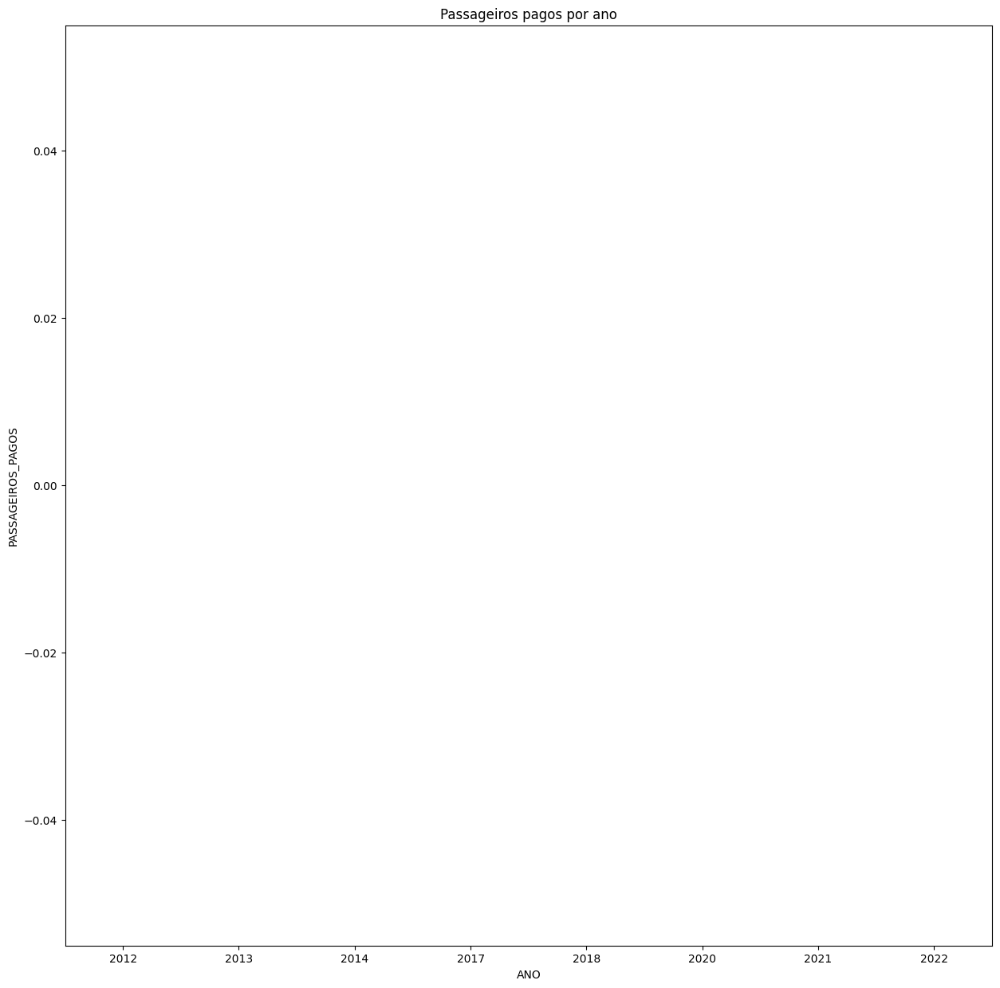





VOLGA DNEPR AIRLINES


count    535.0
mean       0.0
std        0.0
min        0.0
25%        0.0
50%        0.0
75%        0.0
max        0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


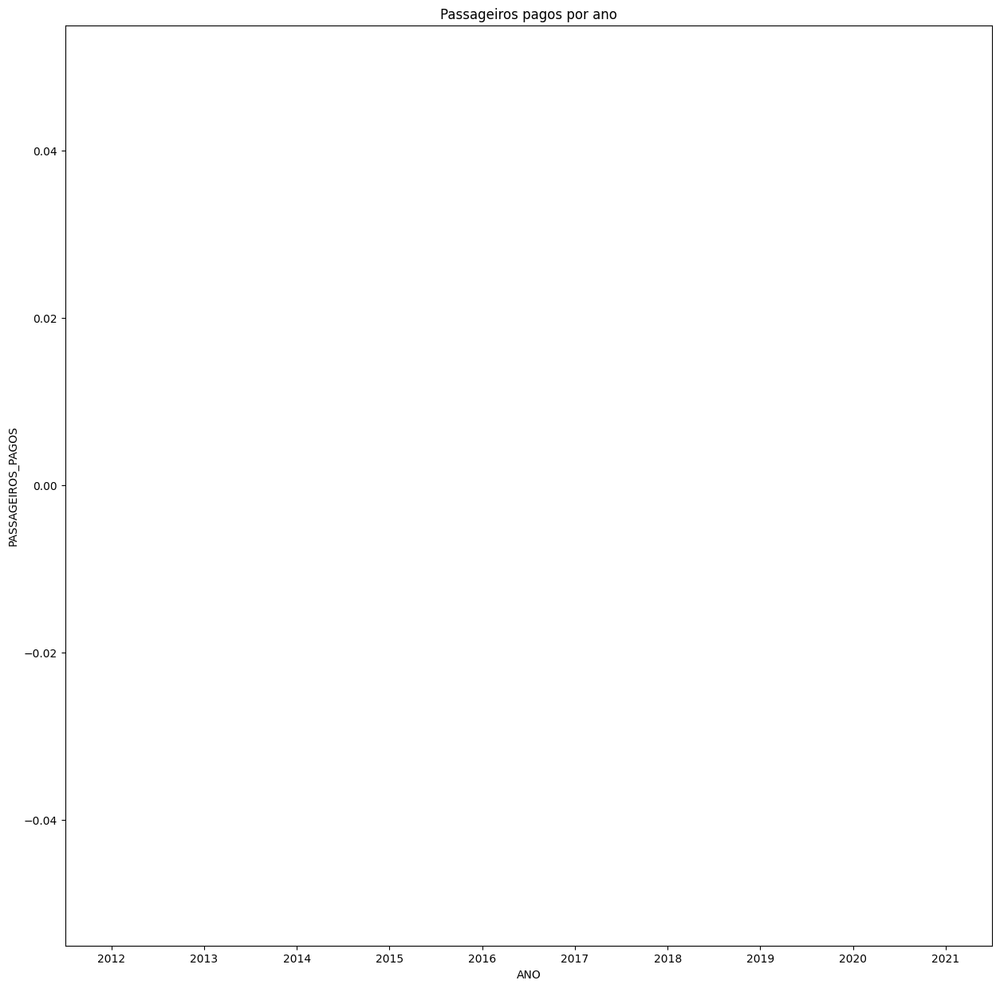





WHITEJETS TRANSPORTES AÉREOS S.A.


count      32.000000
mean      658.312500
std       428.266757
min       348.000000
25%       348.000000
50%       348.000000
75%       759.000000
max      1740.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


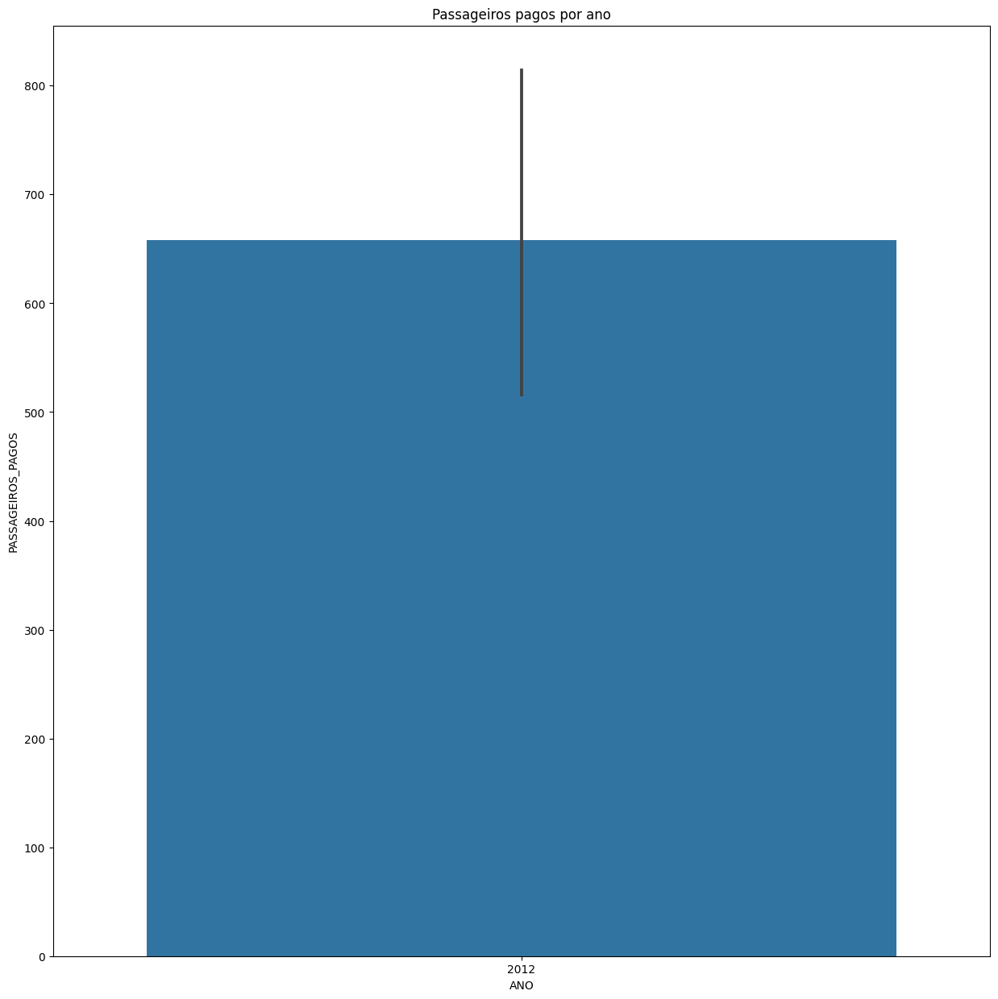





AERONEXUS CORPORATE


count    72.000000
mean     17.625000
std      29.435744
min       0.000000
25%       0.000000
50%       0.000000
75%      54.000000
max      96.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


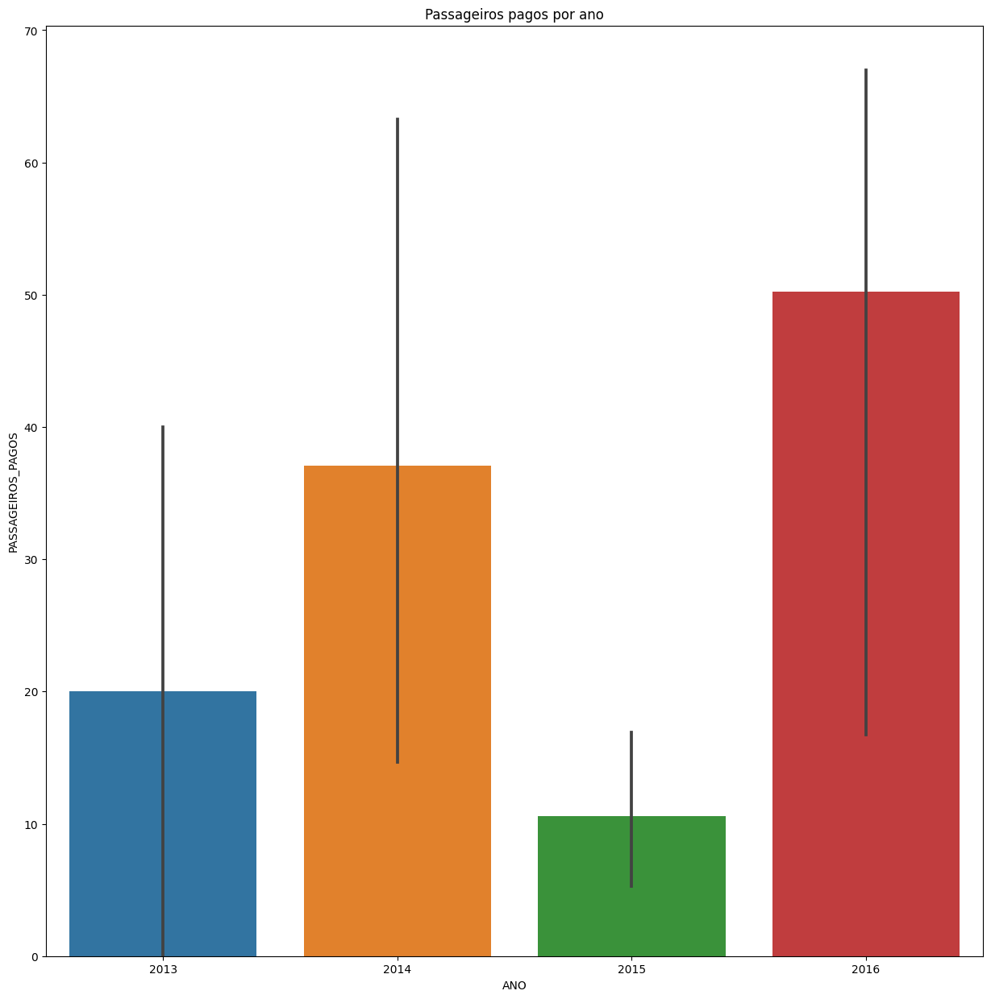





AIR ARUBA


count      3.000000
mean      85.000000
std       75.901252
min        0.000000
25%       54.500000
50%      109.000000
75%      127.500000
max      146.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


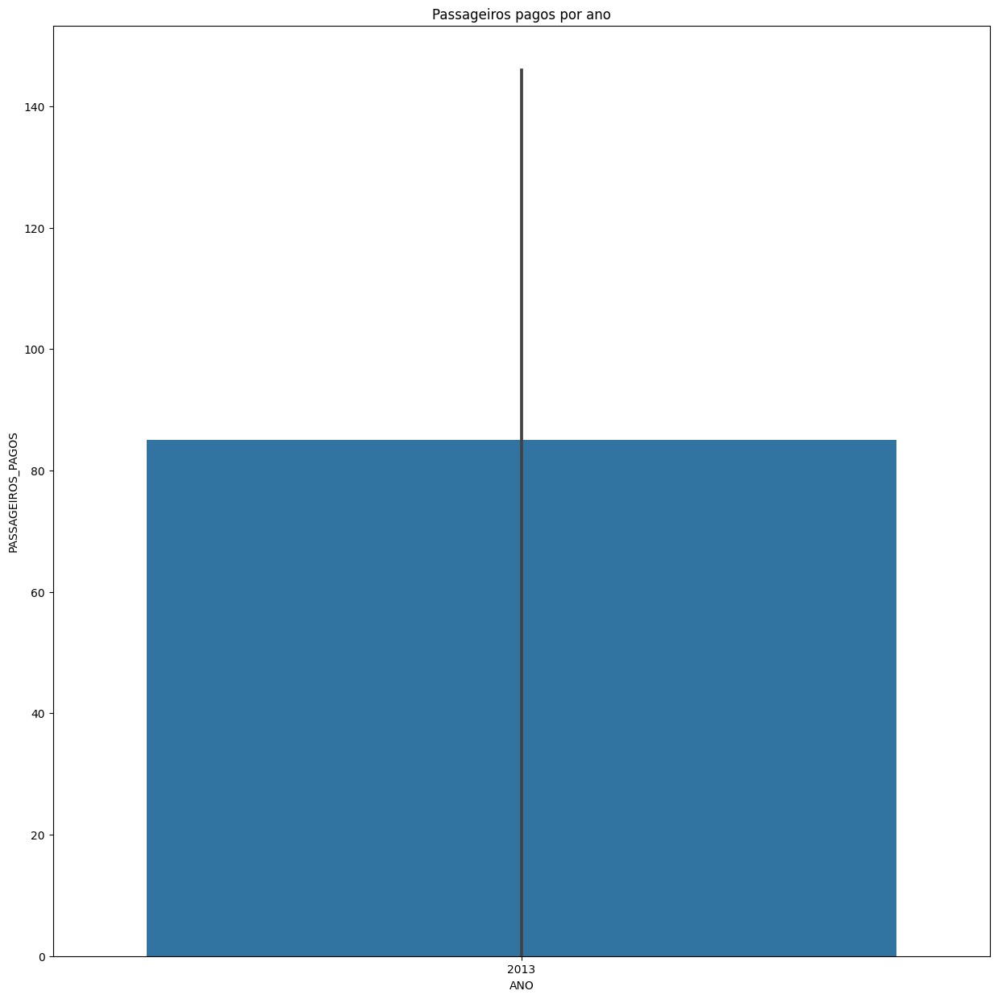





AVIACON ZITOTRANS


count    392.0
mean       0.0
std        0.0
min        0.0
25%        0.0
50%        0.0
75%        0.0
max        0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


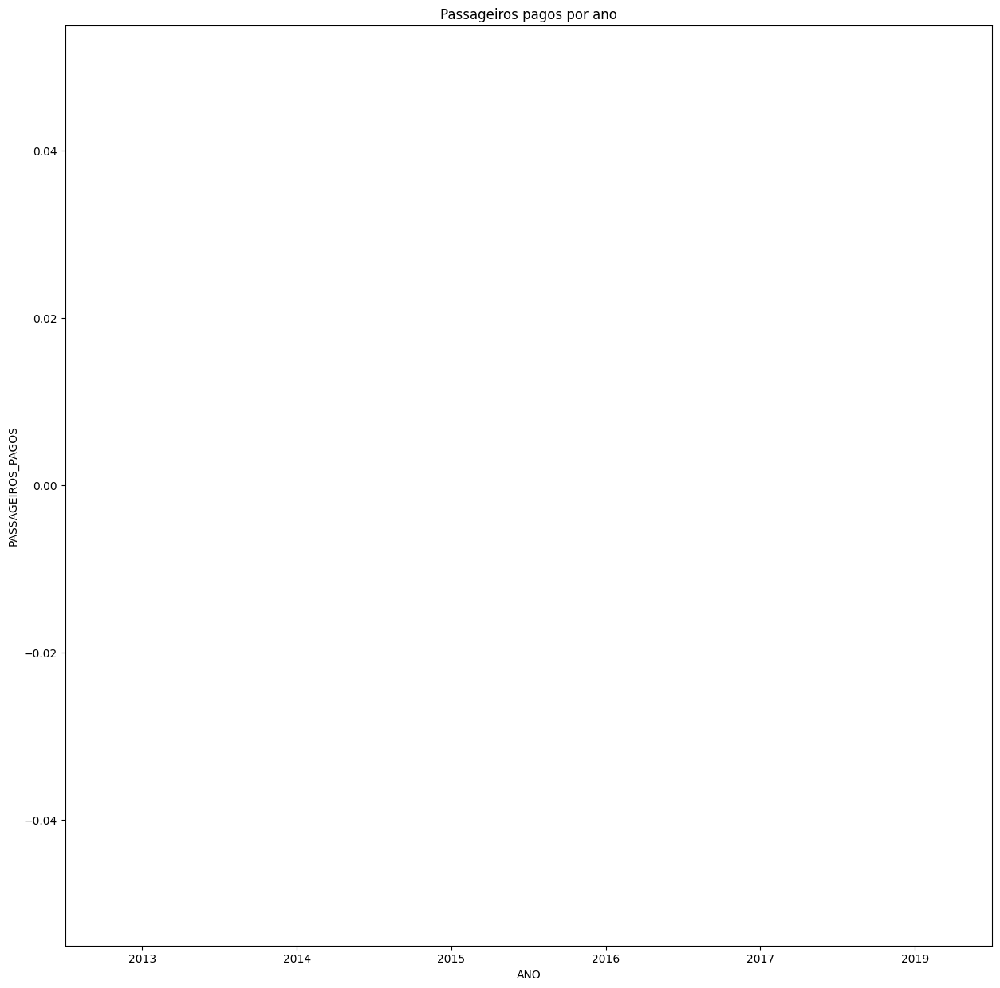





BQB LÍNEAS AÉREAS (LOS CIPRESES S.A.)


count      53.000000
mean      340.679245
std       290.053097
min         8.000000
25%       141.000000
50%       267.000000
75%       471.000000
max      1108.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


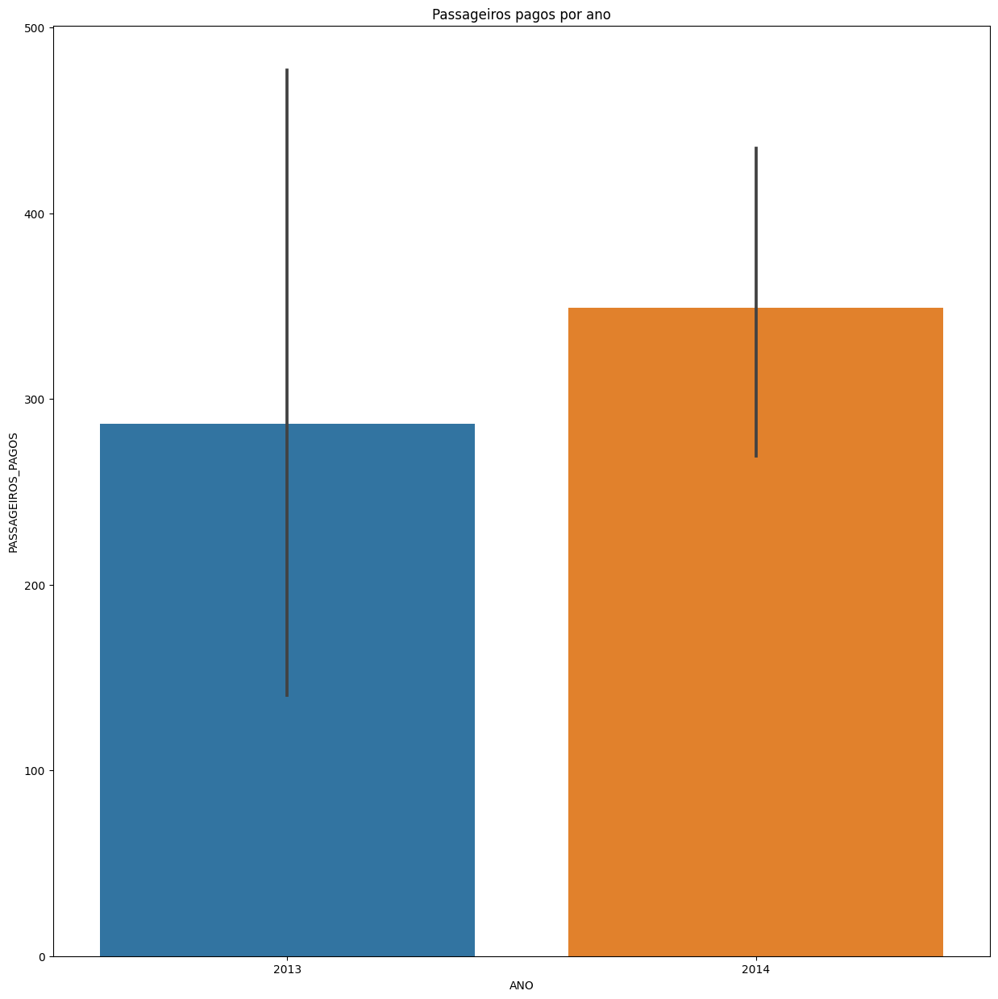





EDELWEISS AIR AG


count     144.000000
mean     1366.819444
std      1064.246933
min         0.000000
25%         0.000000
50%      1847.500000
75%      2332.250000
max      2789.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


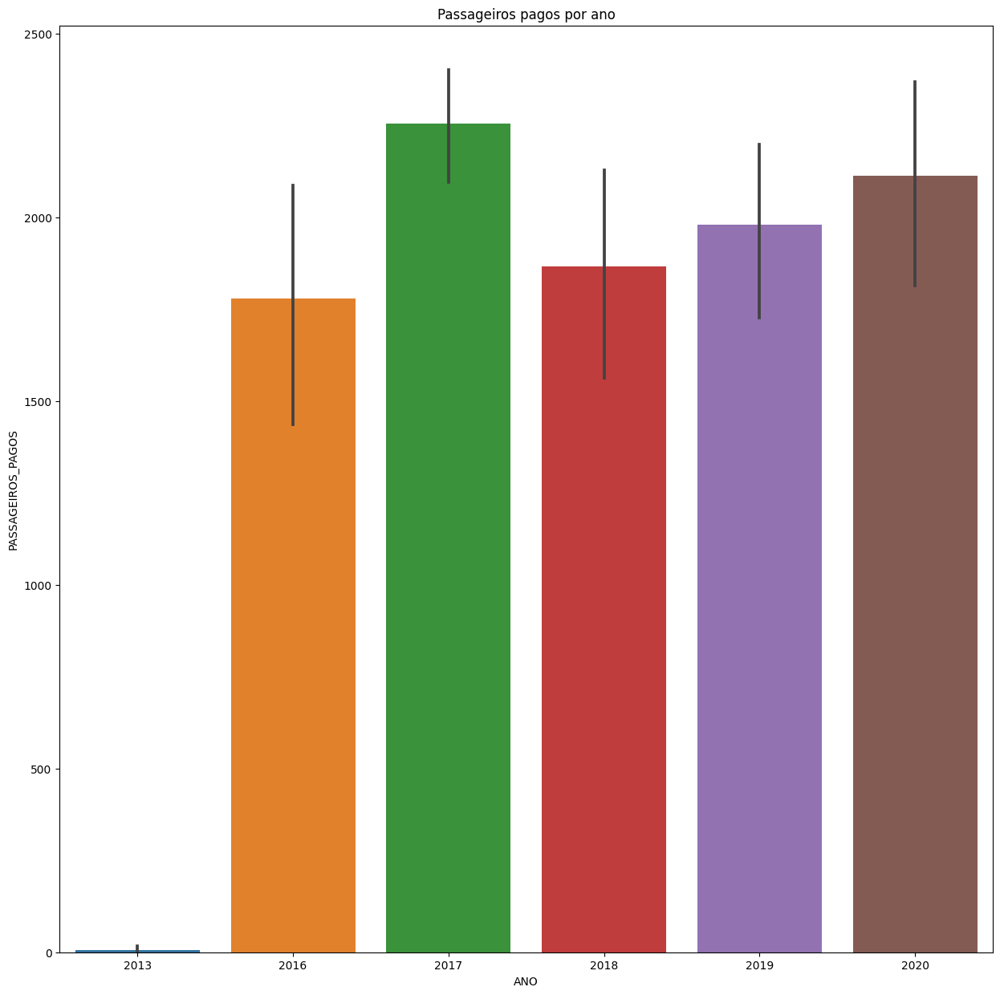





ETIHAD AIRWAYS P.J.S.C.


count     115.000000
mean     4465.904348
std      3078.308732
min         0.000000
25%         0.000000
50%      5708.000000
75%      6813.000000
max      8814.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


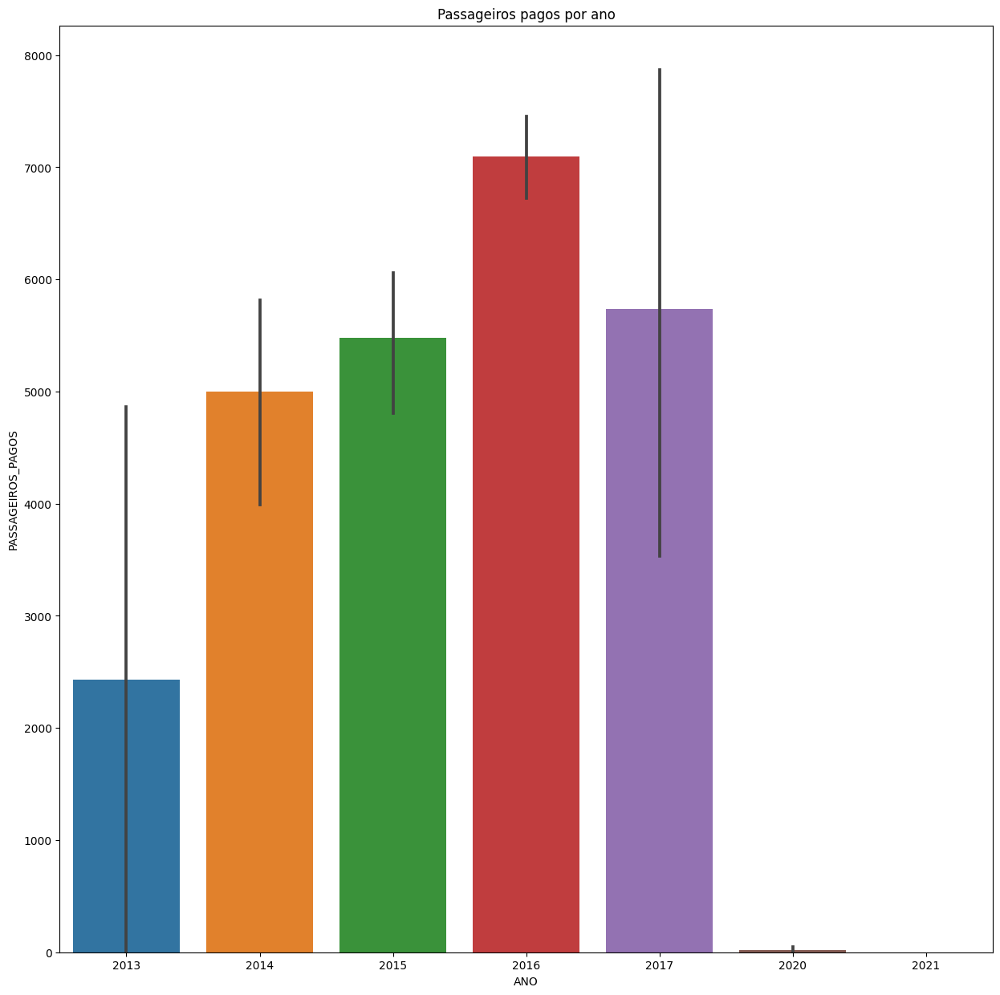





ETHIOPIAN AIRLINES GROUP


count    1096.000000
mean      818.419708
std      1191.881938
min         0.000000
25%         0.000000
50%       167.000000
75%      1406.000000
max      6114.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


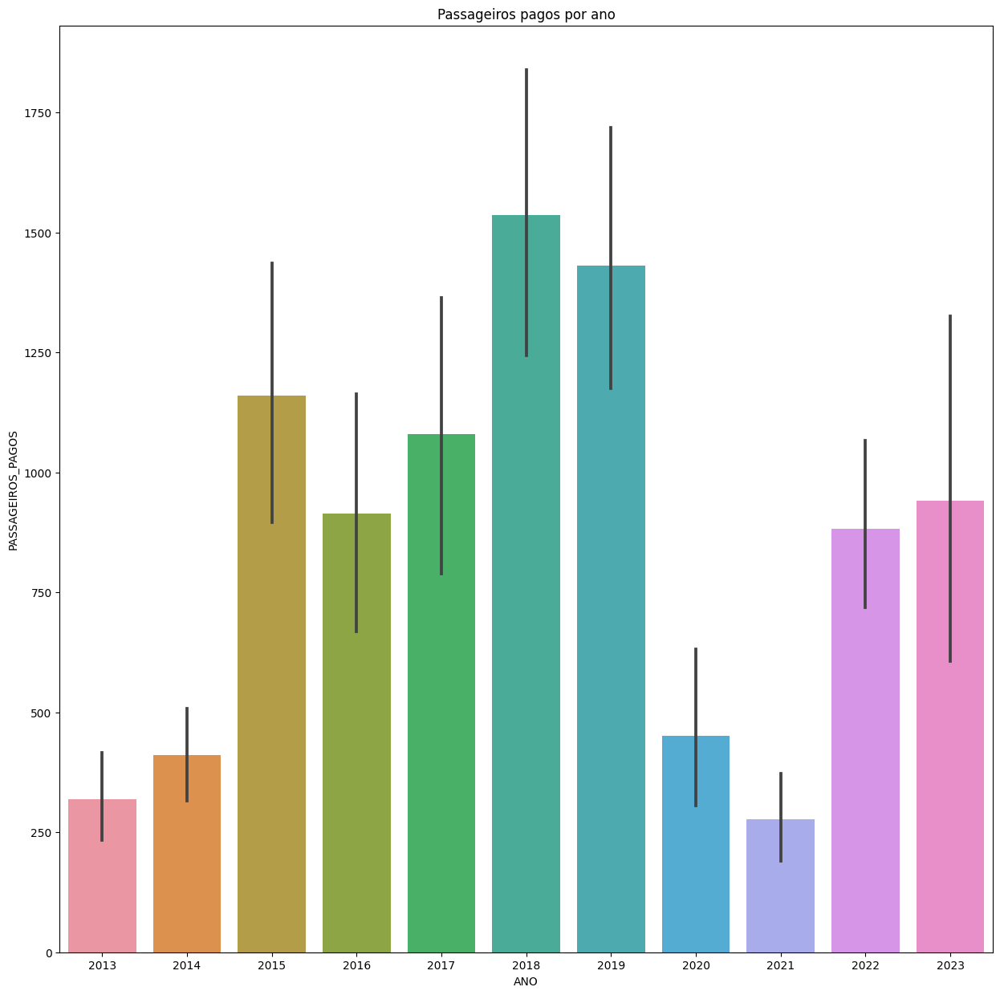





MONARCH AIRLINES


count    55.000000
mean      4.363636
std      18.334711
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max      80.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


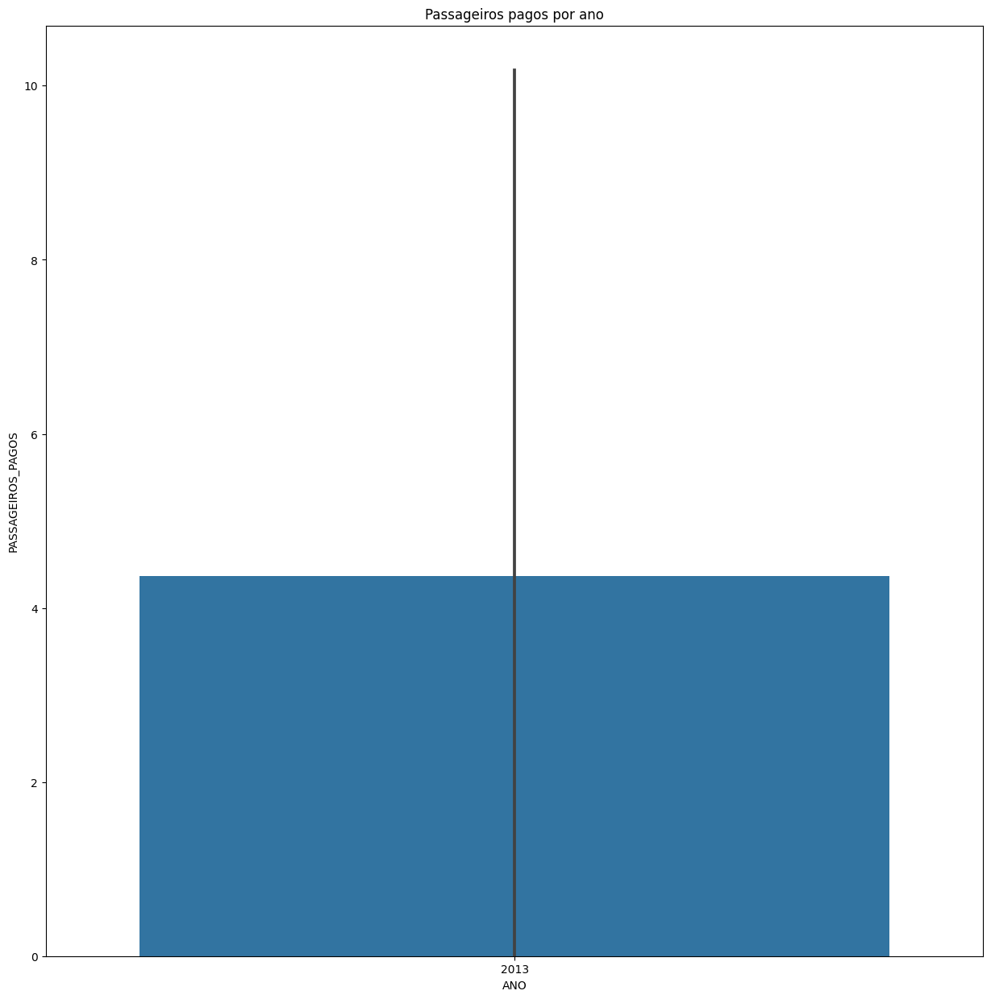





NORTH AMERICAN AIRLINES


count      2.000000
mean      96.000000
std      135.764502
min        0.000000
25%       48.000000
50%       96.000000
75%      144.000000
max      192.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


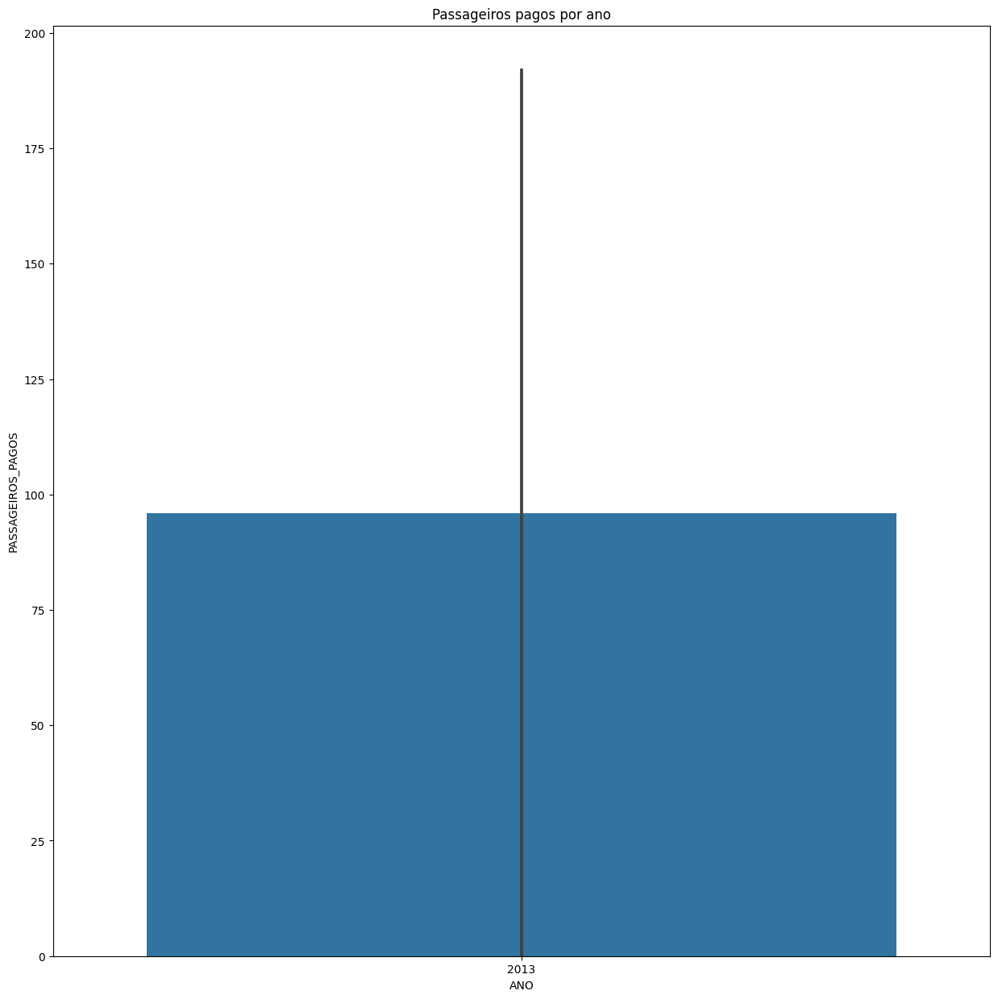





MAP TRANSPORTES AÉREOS LTDA.


count    5996.000000
mean      165.680787
std       274.521684
min         0.000000
25%        10.000000
50%        54.000000
75%       196.000000
max      2418.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


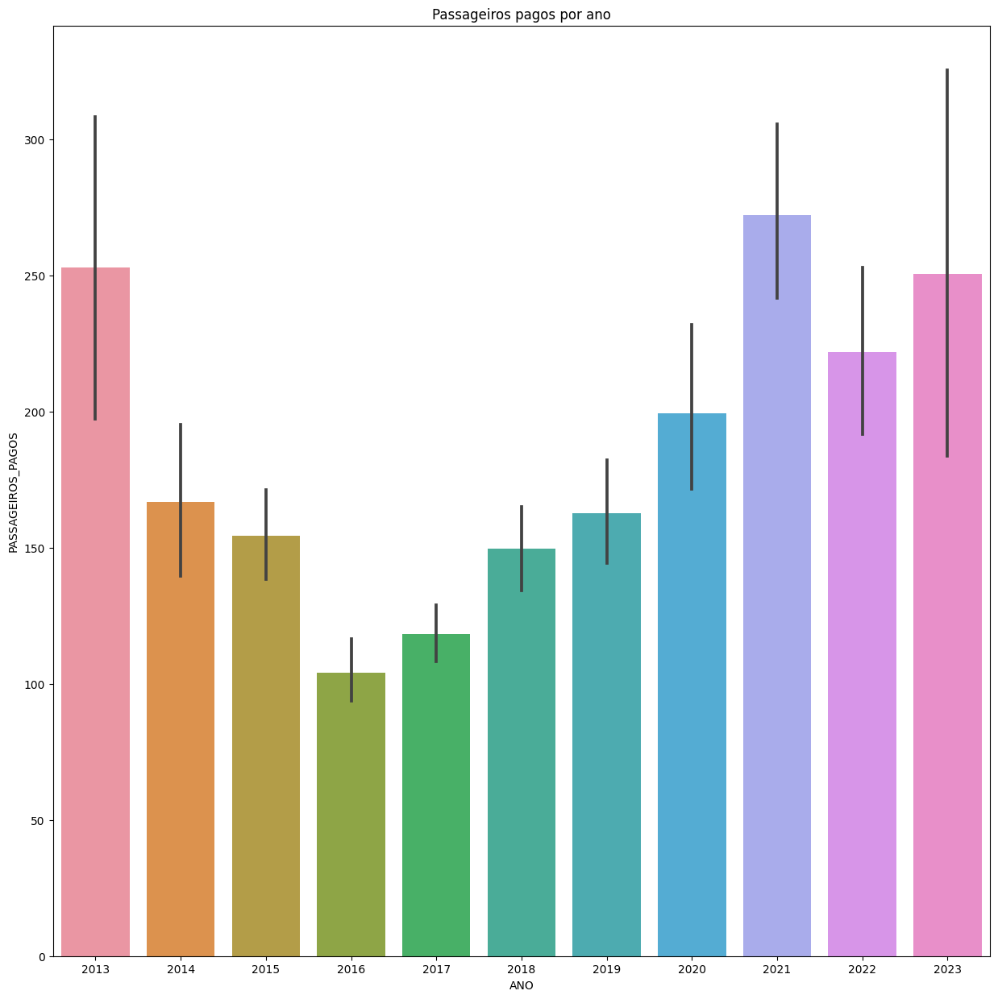





COMPAGNIE NATIONALE ROYAL AIR MAROC


count     351.000000
mean     1462.581197
std      1303.249135
min         0.000000
25%       249.500000
50%      1251.000000
75%      2295.000000
max      5475.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


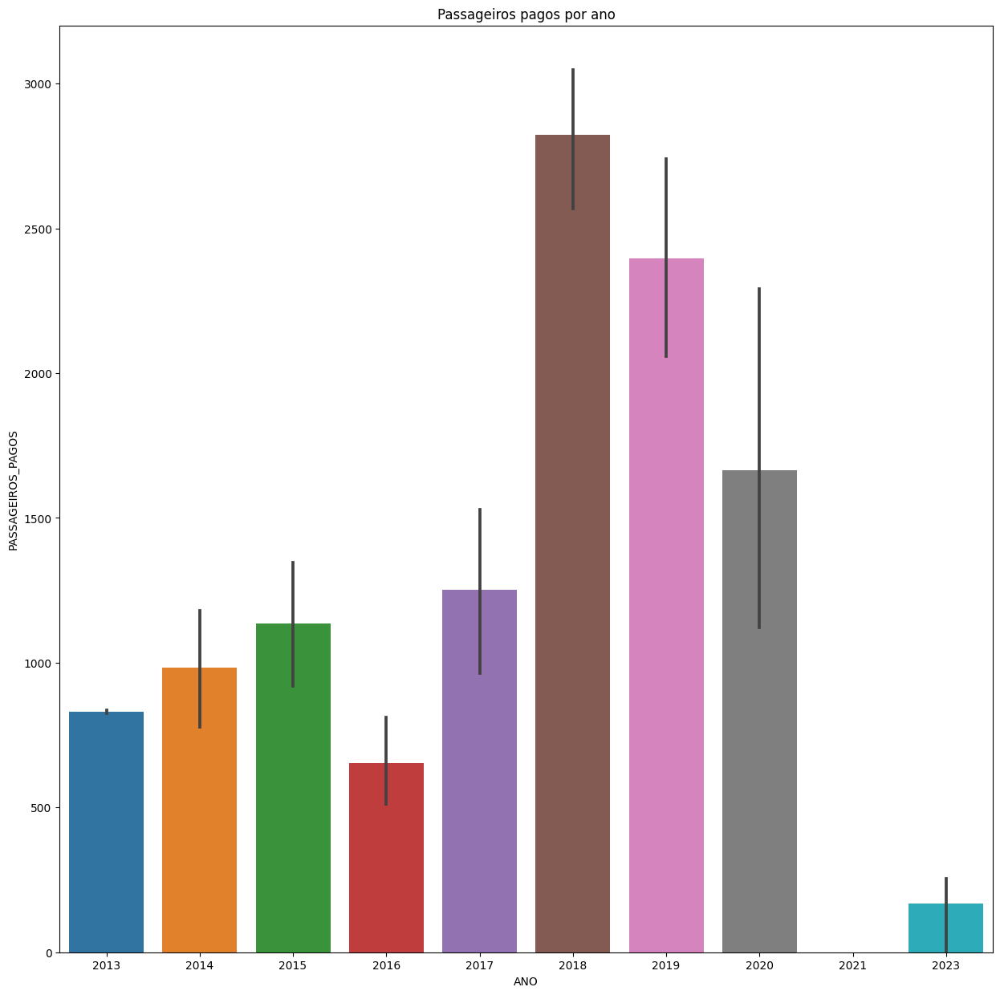





TAME LINEA AEREA DEL ECUADOR


count     172.000000
mean      696.529070
std       406.177394
min         0.000000
25%       412.750000
50%       626.000000
75%       954.750000
max      2096.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


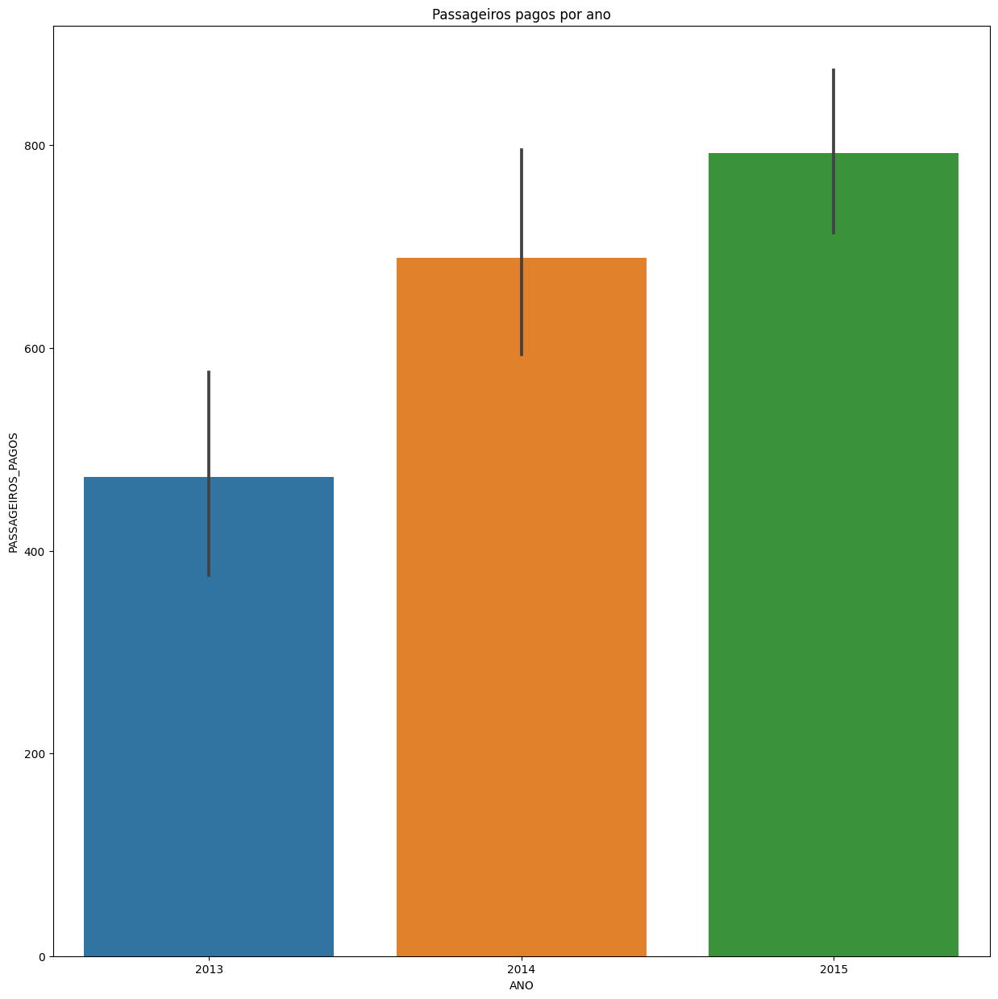





TRANS MEDITERRANEAN AIRWAYS


count    5.0
mean     0.0
std      0.0
min      0.0
25%      0.0
50%      0.0
75%      0.0
max      0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


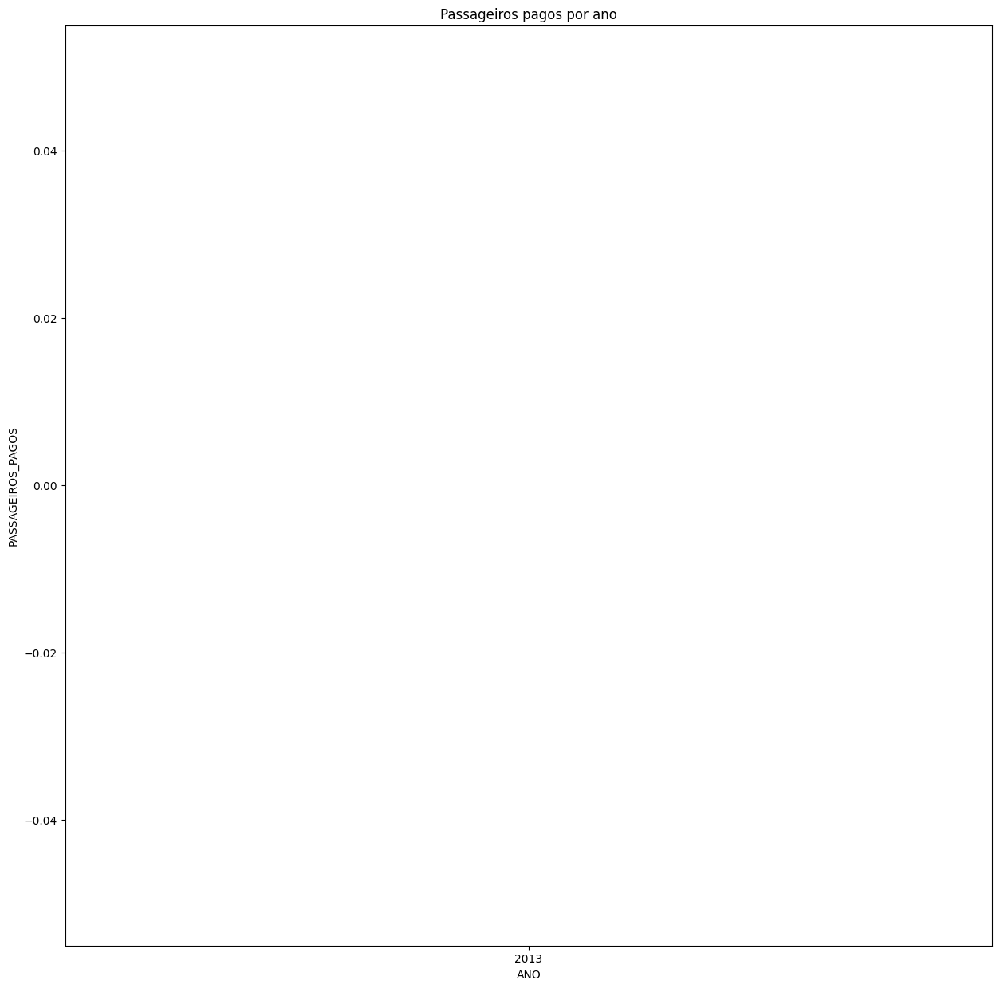





WORLD AIRWAYS INC


count    4.0
mean     0.0
std      0.0
min      0.0
25%      0.0
50%      0.0
75%      0.0
max      0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


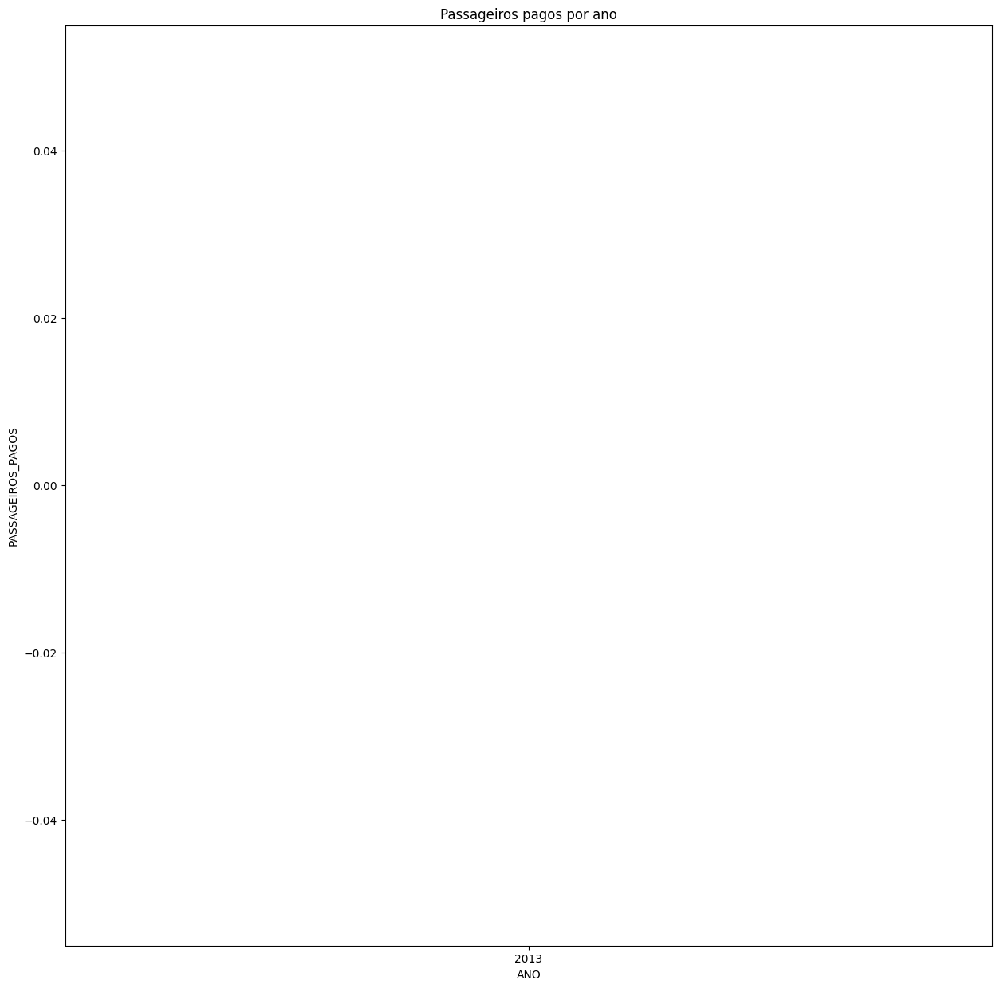





AIRBRIDGE CARGO AIRLINES (VOLGA-DNEPR GROUP)


count    51.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


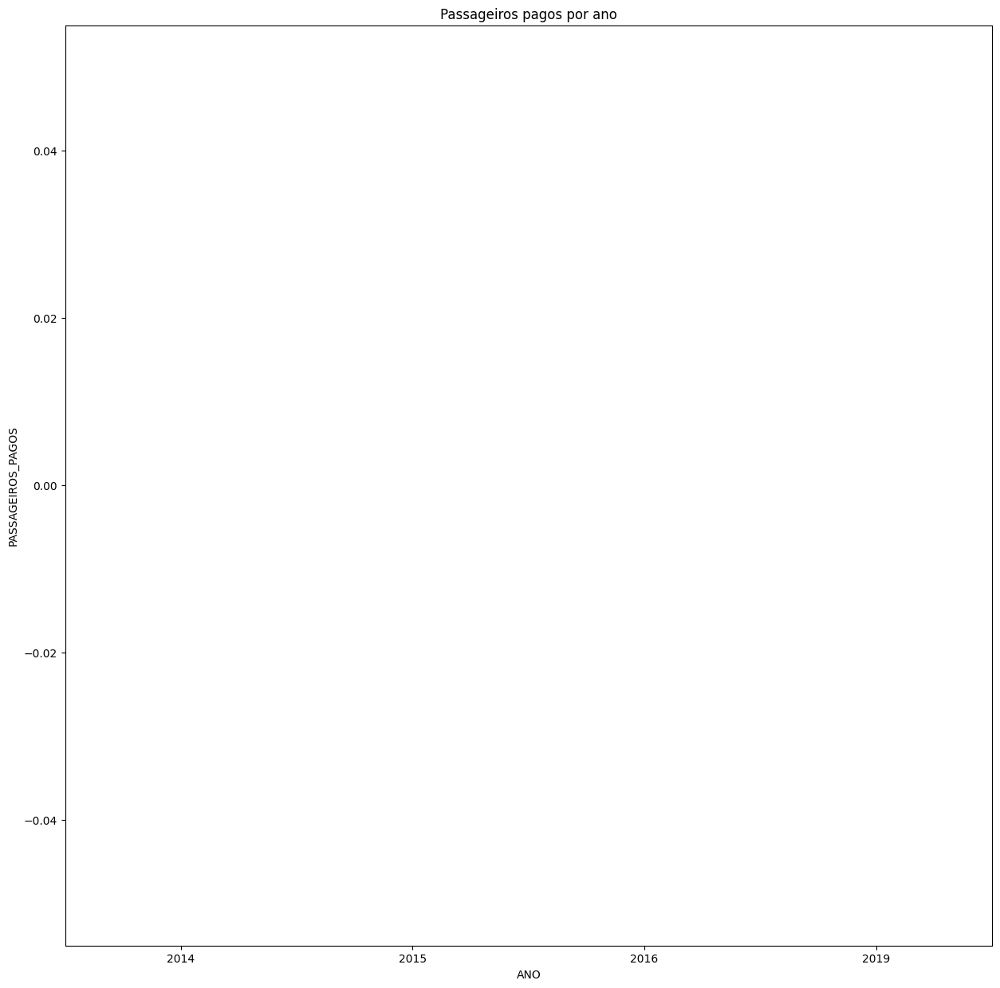





ABX AIR, INC.


count    3.0
mean     0.0
std      0.0
min      0.0
25%      0.0
50%      0.0
75%      0.0
max      0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


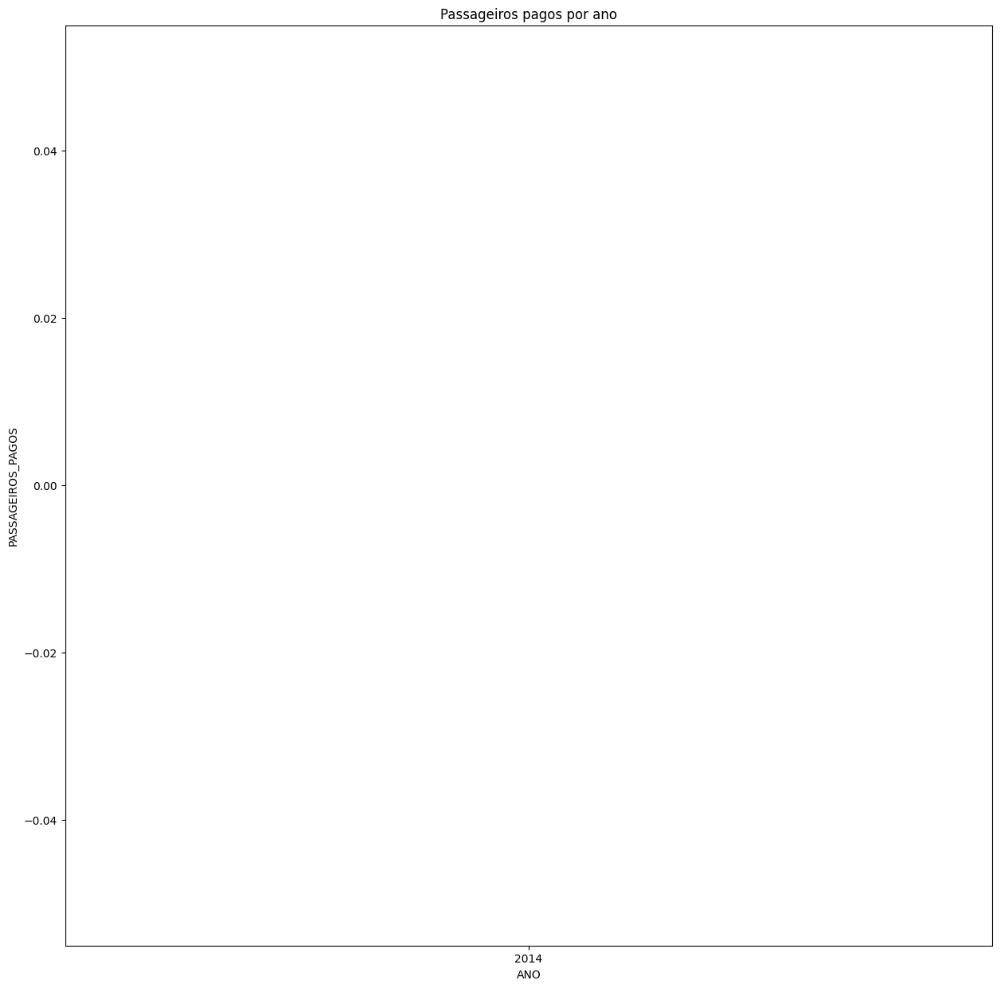





AMERISTAR AIR CARGO


count    23.000000
mean      9.782609
std      20.821659
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max      60.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


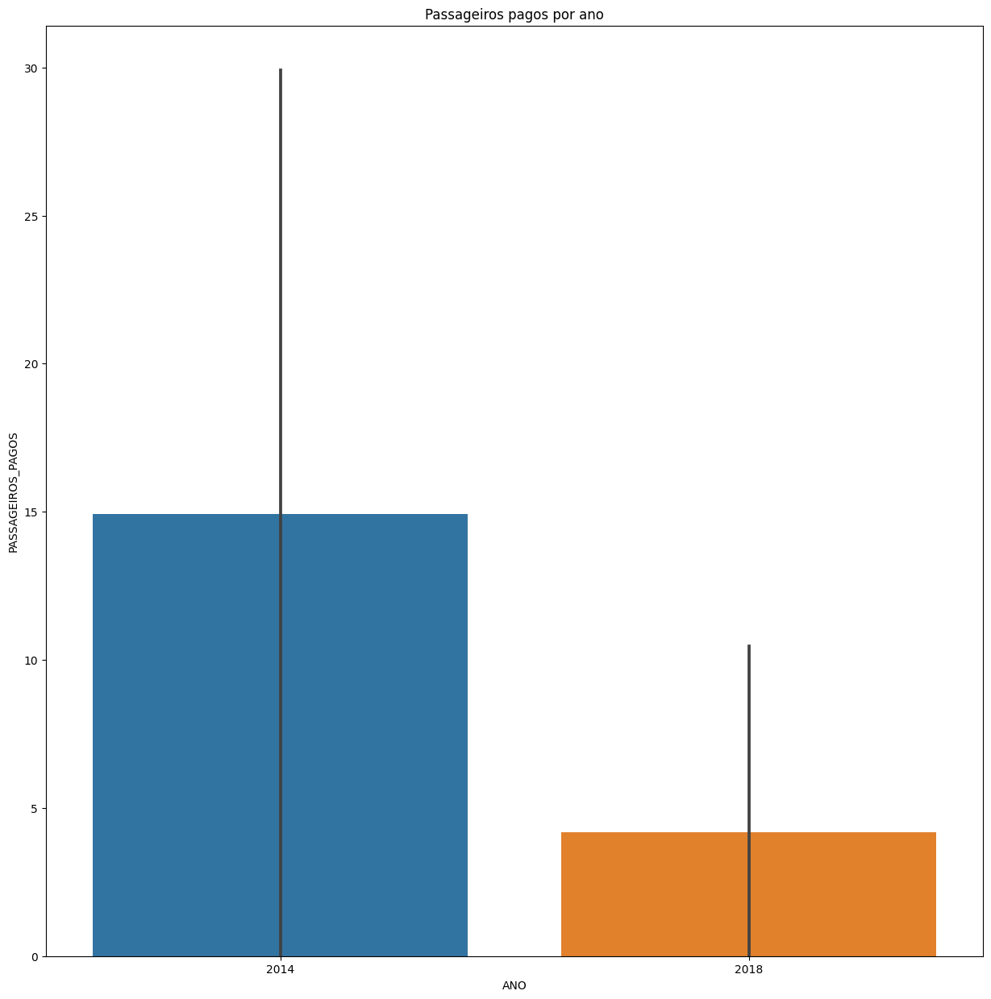





BRUSSELS AIRLINES


count      8.000000
mean      33.375000
std       61.812938
min        0.000000
25%        0.000000
50%        0.000000
75%       32.750000
max      136.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


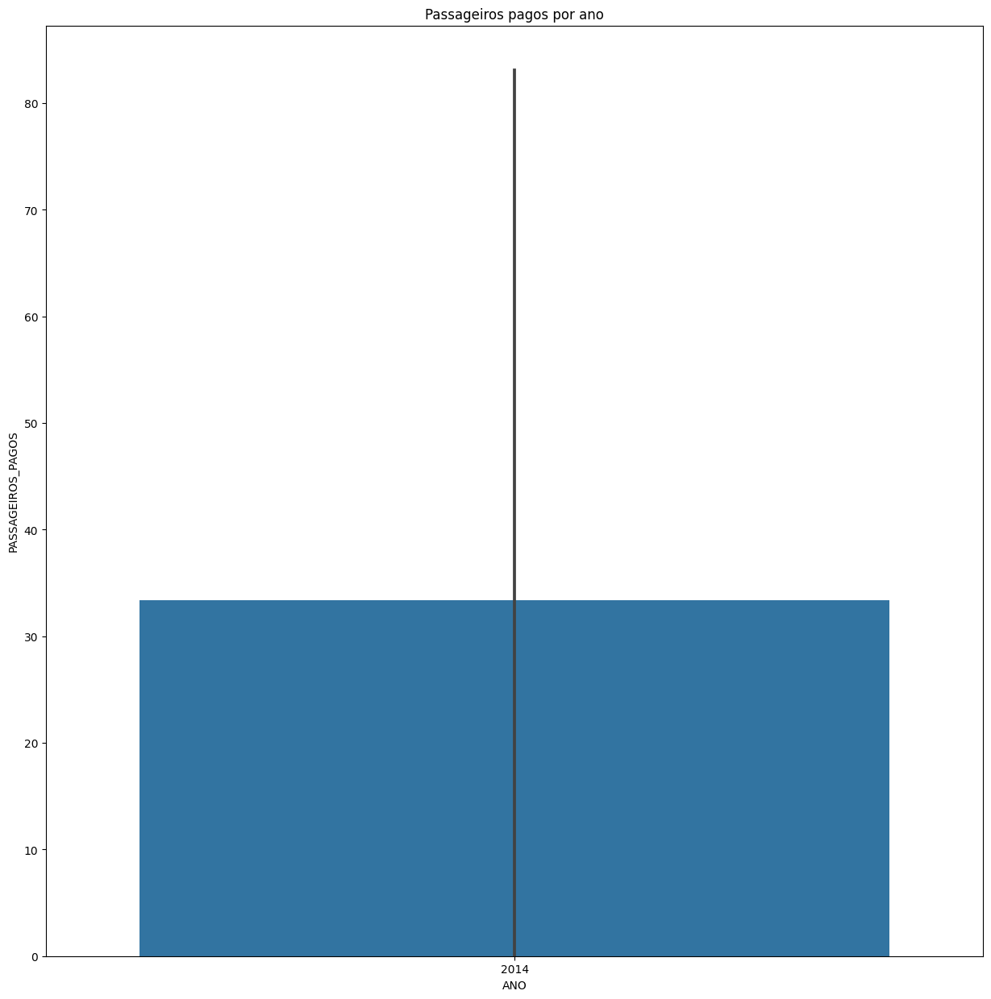





TRANSPORTES AEREOS BOLIVIANOS


count    39.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


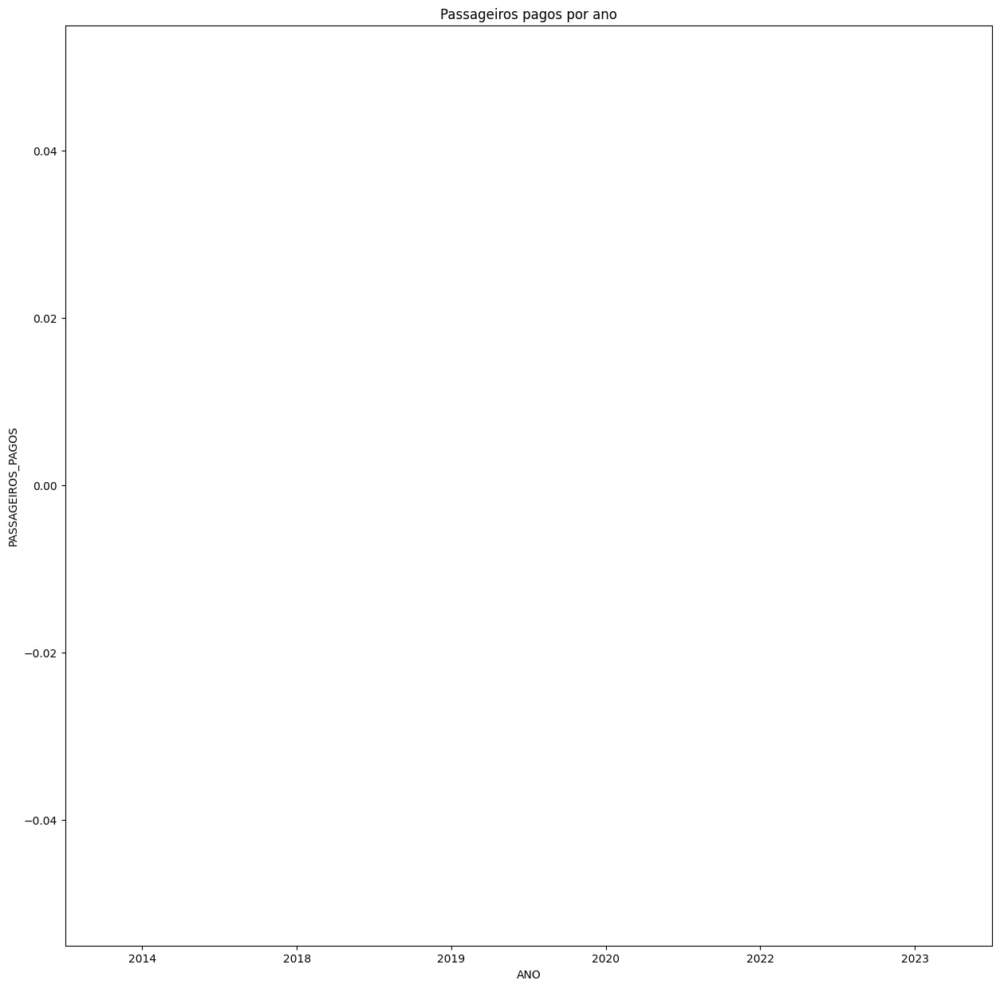





CAVOK AIR


count    214.0
mean       0.0
std        0.0
min        0.0
25%        0.0
50%        0.0
75%        0.0
max        0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


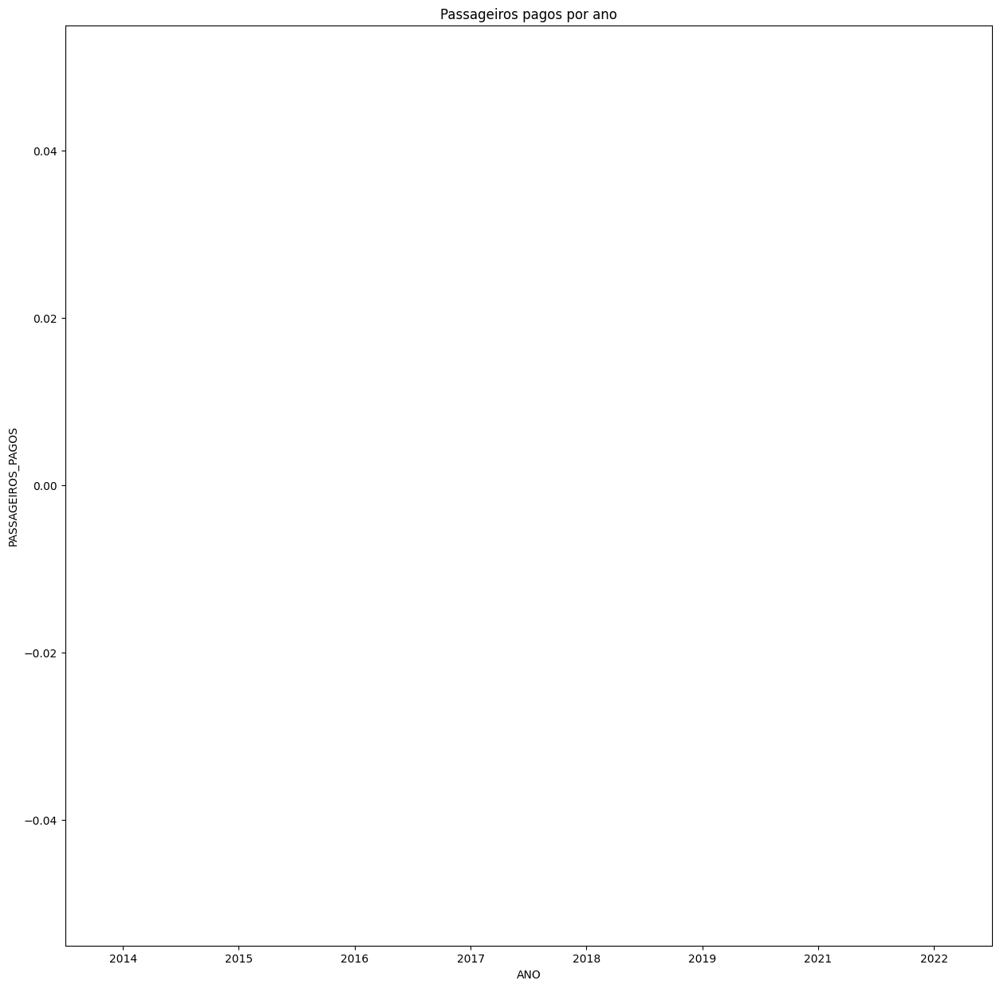





DANISH AIR TRANSPORT


count    145.0
mean       0.0
std        0.0
min        0.0
25%        0.0
50%        0.0
75%        0.0
max        0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


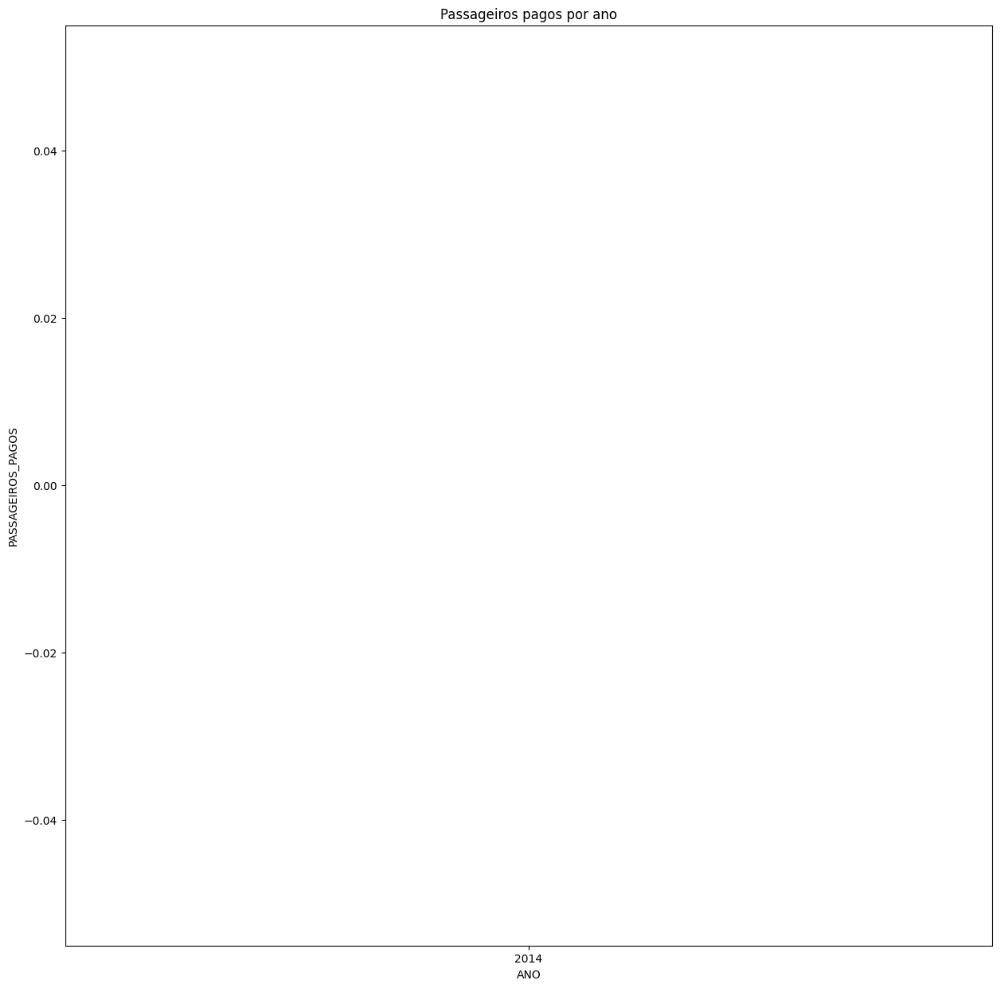





AIR ITALY S.P.A (EX - MERIDIANA FLY S.P.A).


count     234.000000
mean      324.299145
std       311.073064
min         0.000000
25%         0.000000
50%       301.500000
75%       565.500000
max      1207.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


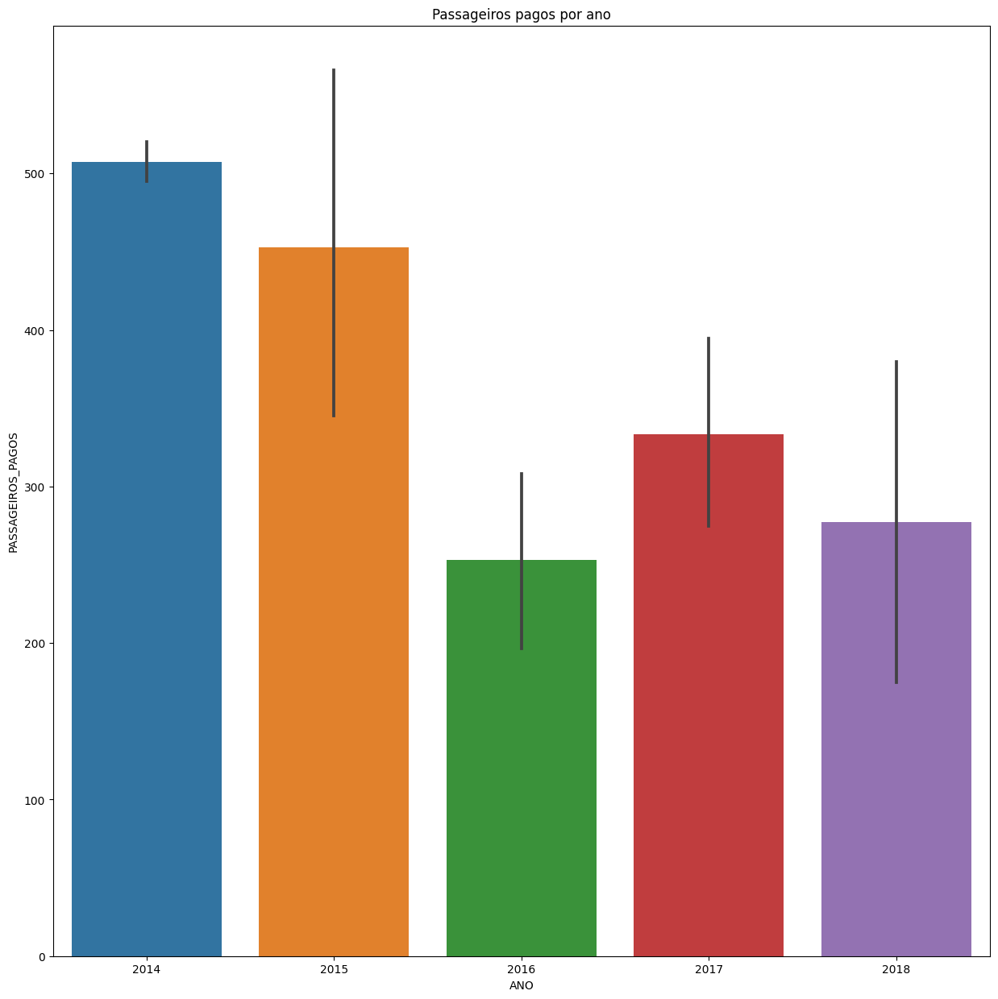





TUI AIRLINES BELGIUM - JETAIRFLY


count     29.000000
mean      84.310345
std      113.256379
min        0.000000
25%        0.000000
50%        0.000000
75%      226.000000
max      256.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


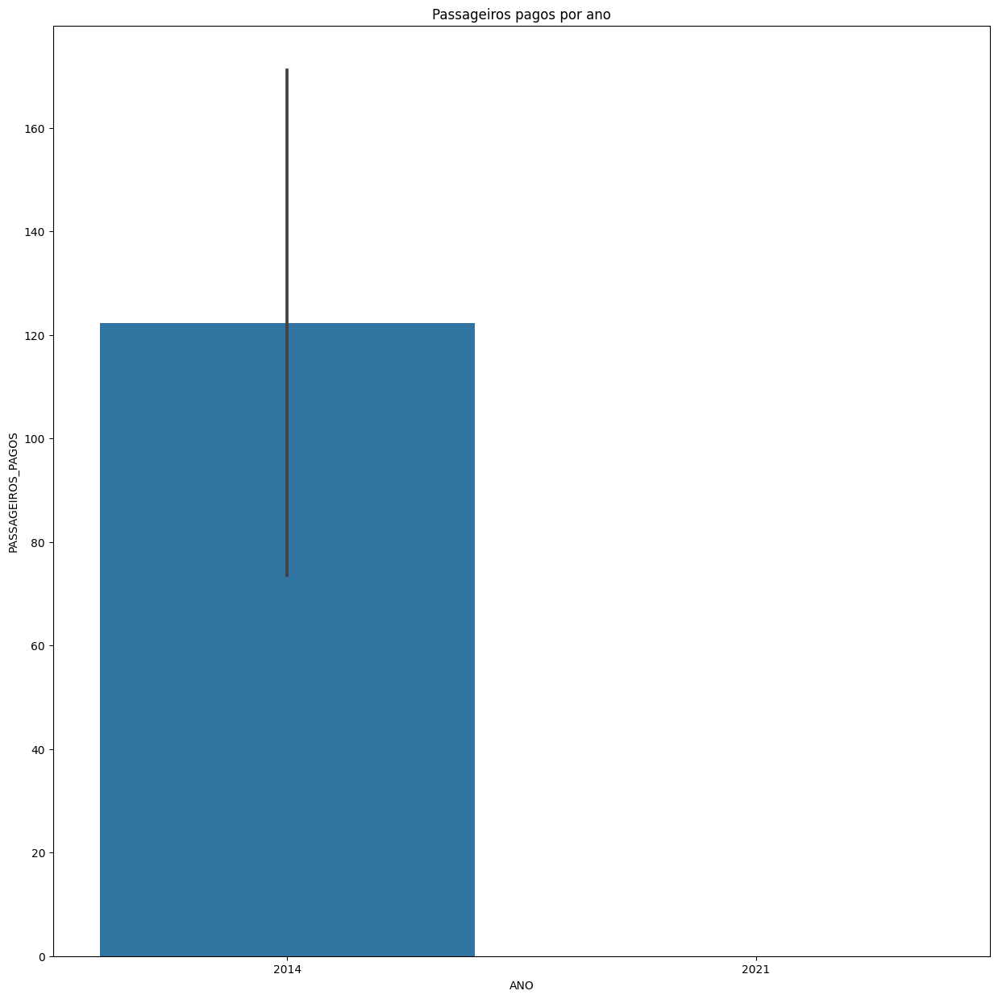





SKY PRIM AIR´ AIR COMPANY


count    10.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


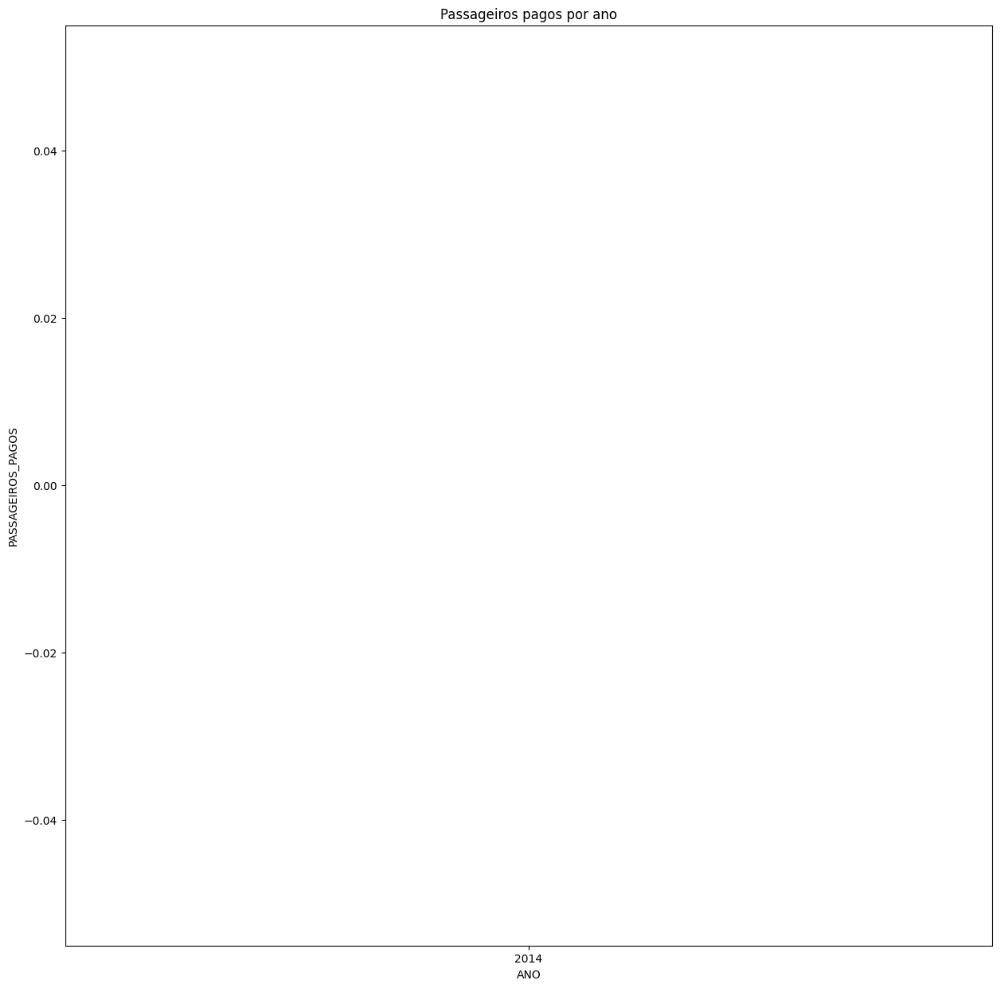





LÍNEAS AÉREAS SURAMERICANAS LAS


count    151.0
mean       0.0
std        0.0
min        0.0
25%        0.0
50%        0.0
75%        0.0
max        0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


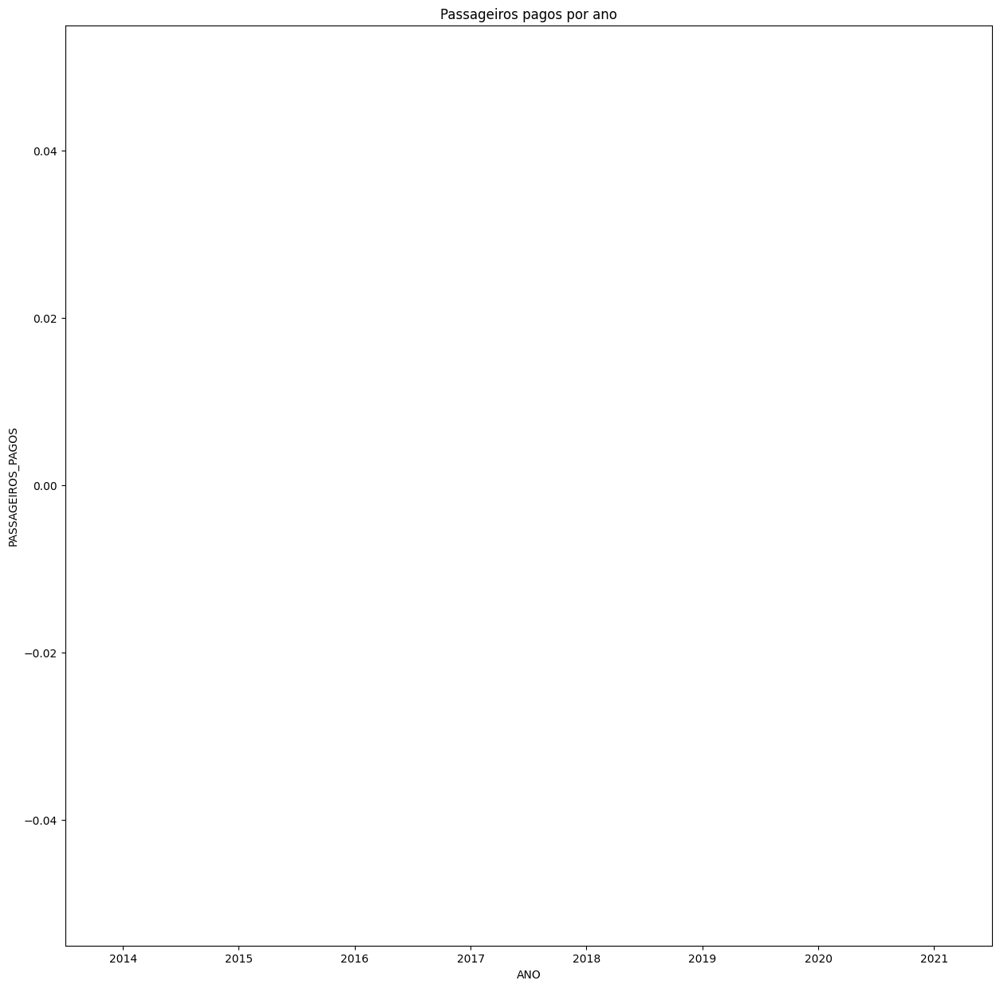





NATIONAL AIRLINES


count    144.000000
mean       7.201389
std       34.795623
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max      202.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


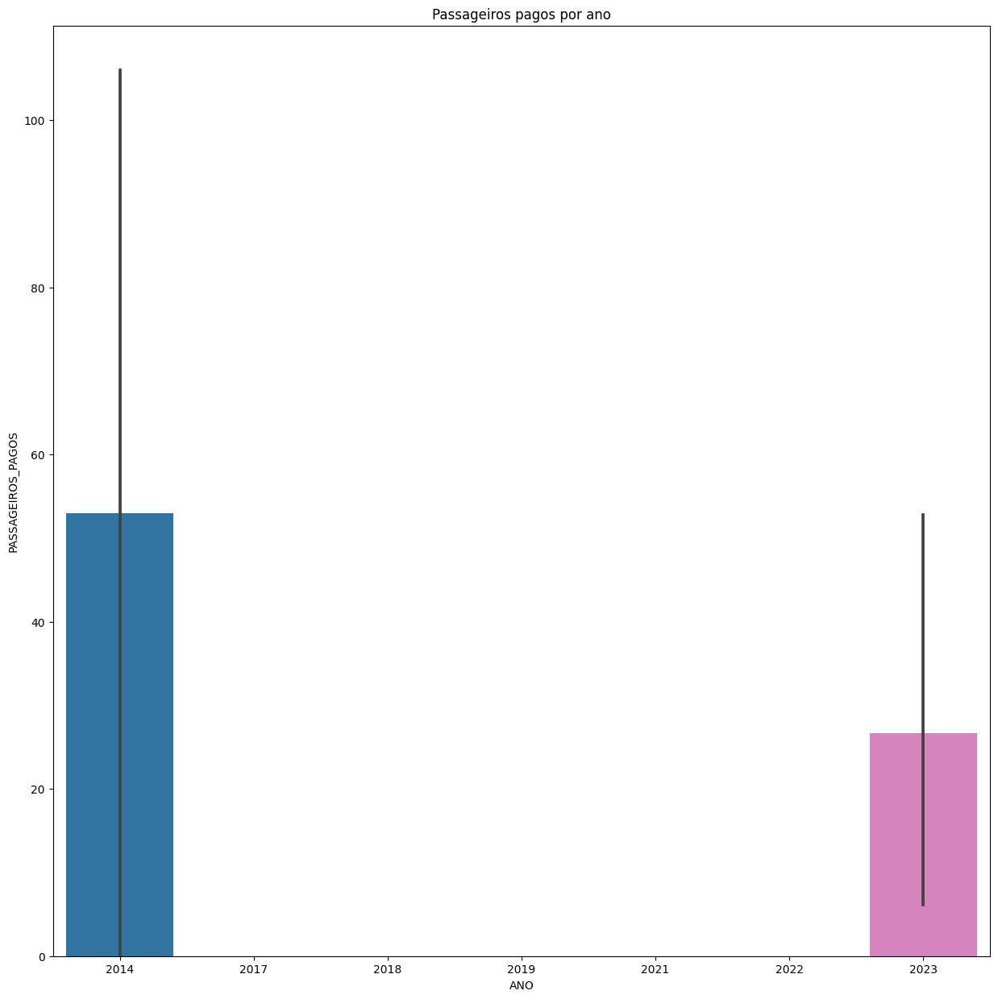





OMNI AIR INTERNATIONAL


count     16.00000
mean     200.93750
std      162.73556
min        0.00000
25%       79.25000
50%      188.50000
75%      311.50000
max      539.00000
Name: PASSAGEIROS_PAGOS, dtype: float64


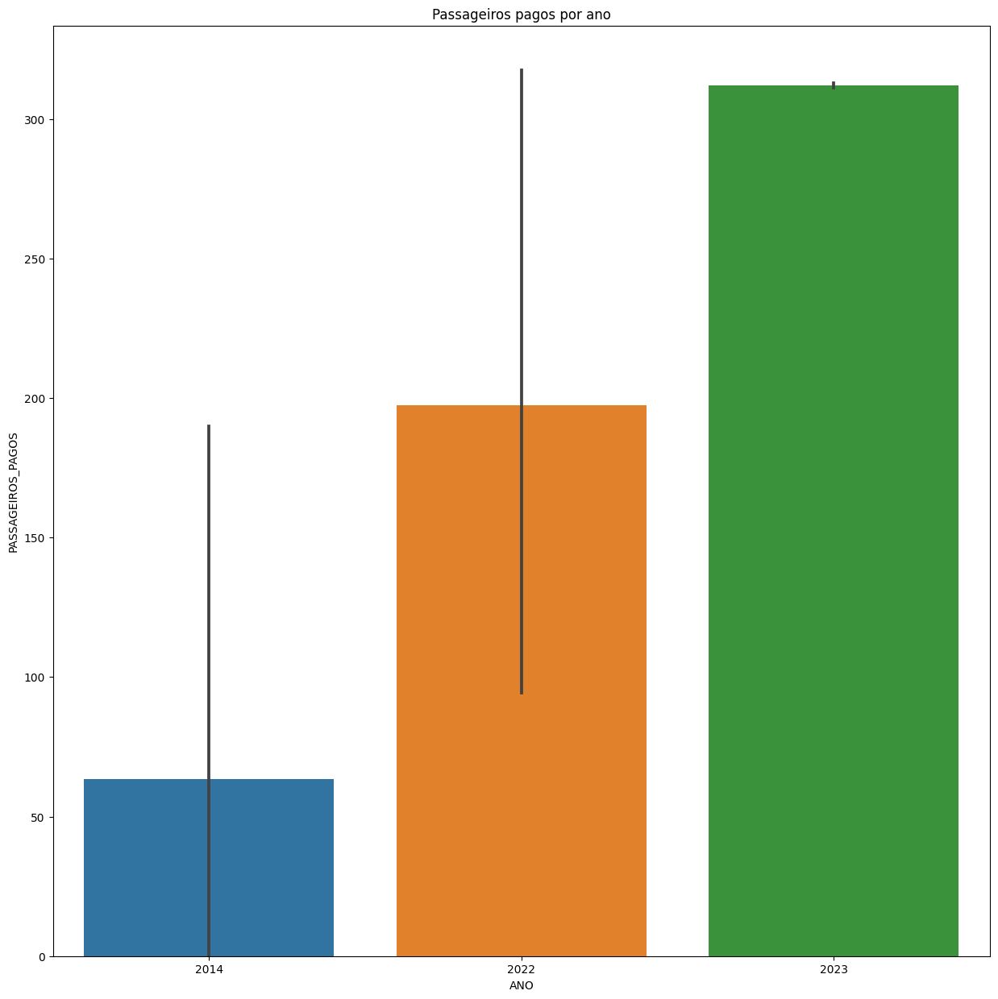





AIR AUSTRAL


count     12.000000
mean     132.500000
std      164.649214
min        0.000000
25%        0.000000
50%       64.500000
75%      198.750000
max      432.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


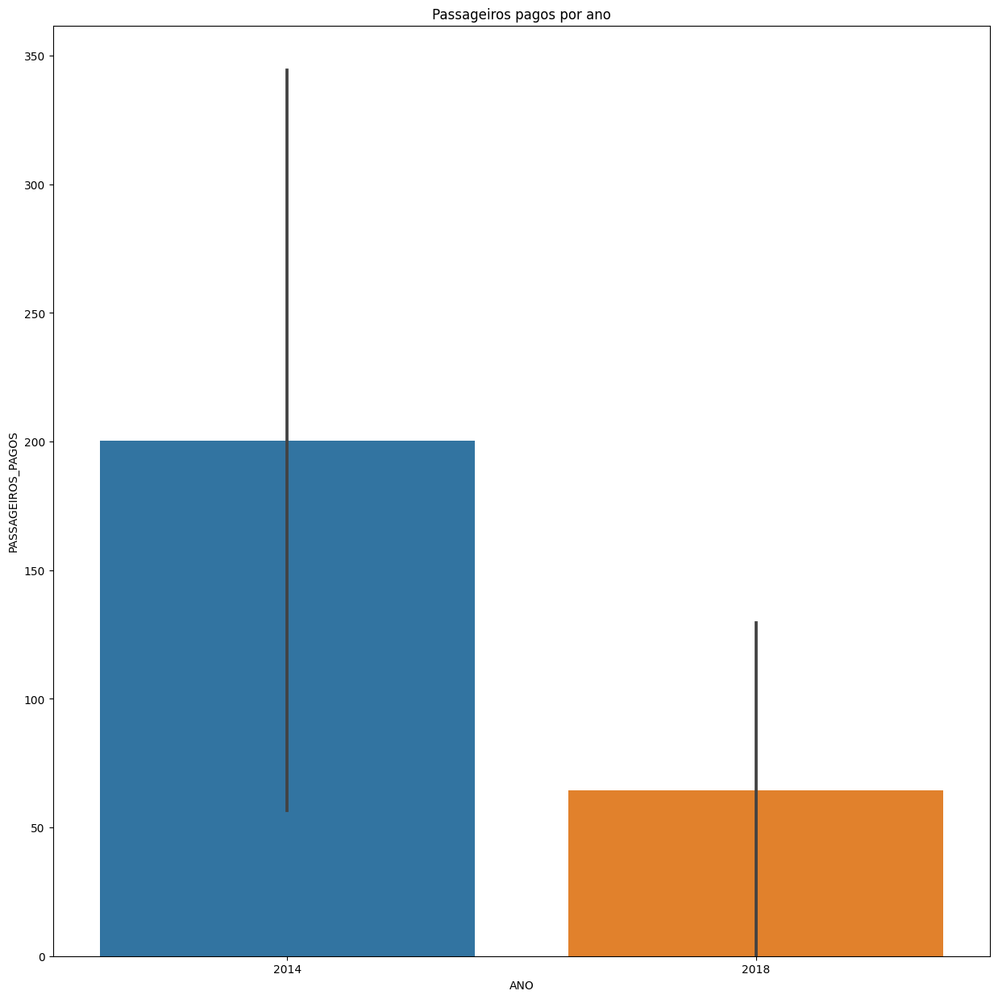





ASTA LINHAS AÉREAS LTDA ( EX - AMÉRICA DO SUL LINHAS AÉREAS LTDA.)


count    181.000000
mean      35.618785
std       50.342091
min        0.000000
25%        3.000000
50%        9.000000
75%       44.000000
max      197.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


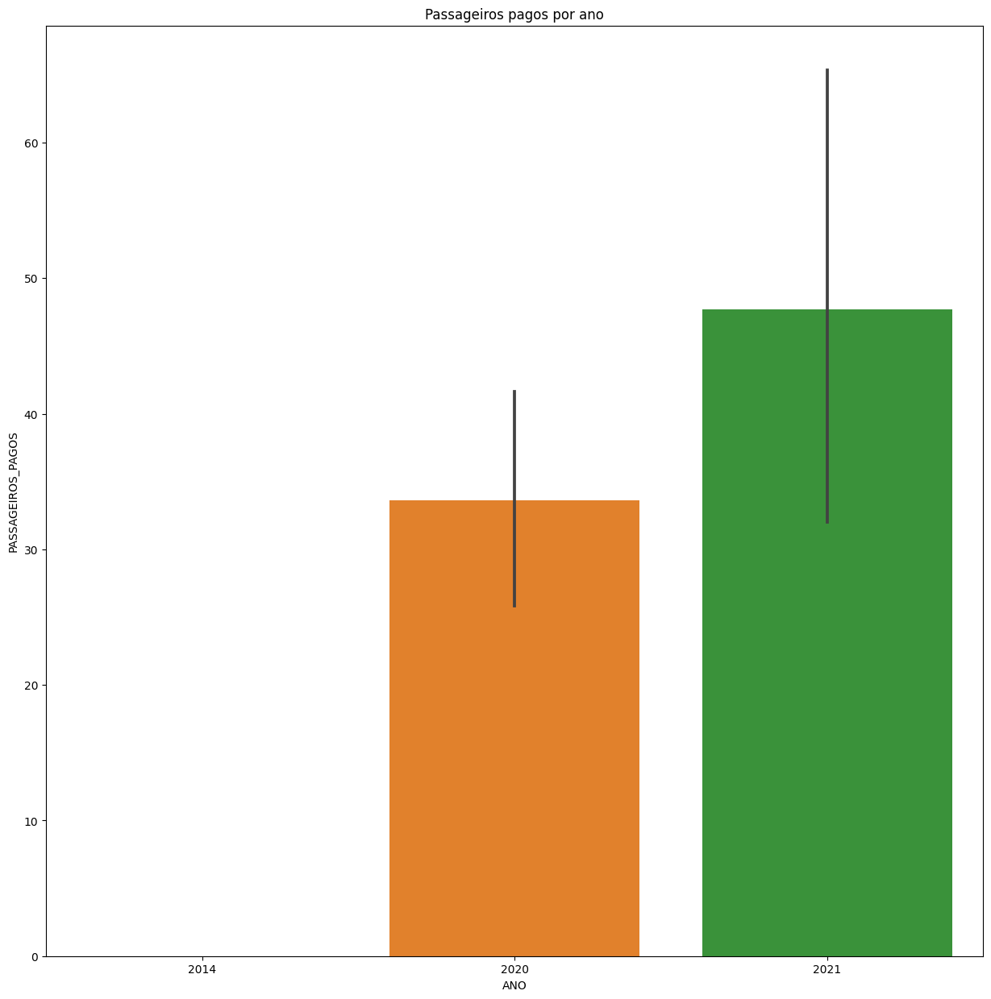





SWIFT AIR, LLC


count    273.000000
mean      29.490842
std       74.052898
min        0.000000
25%        0.000000
50%        0.000000
75%       16.000000
max      511.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


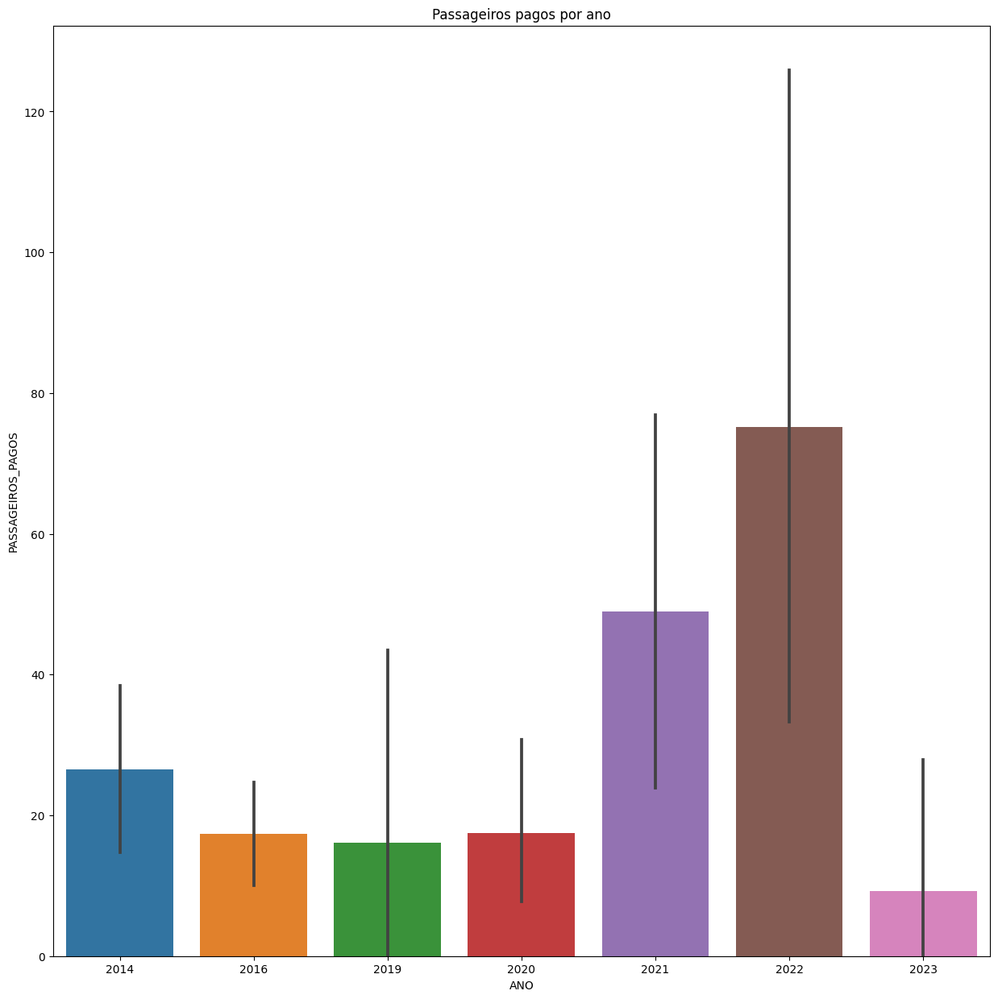





AEROTRANSPORTE DE CARGA UNION. S.A. DE C.V.


count    4.0
mean     0.0
std      0.0
min      0.0
25%      0.0
50%      0.0
75%      0.0
max      0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


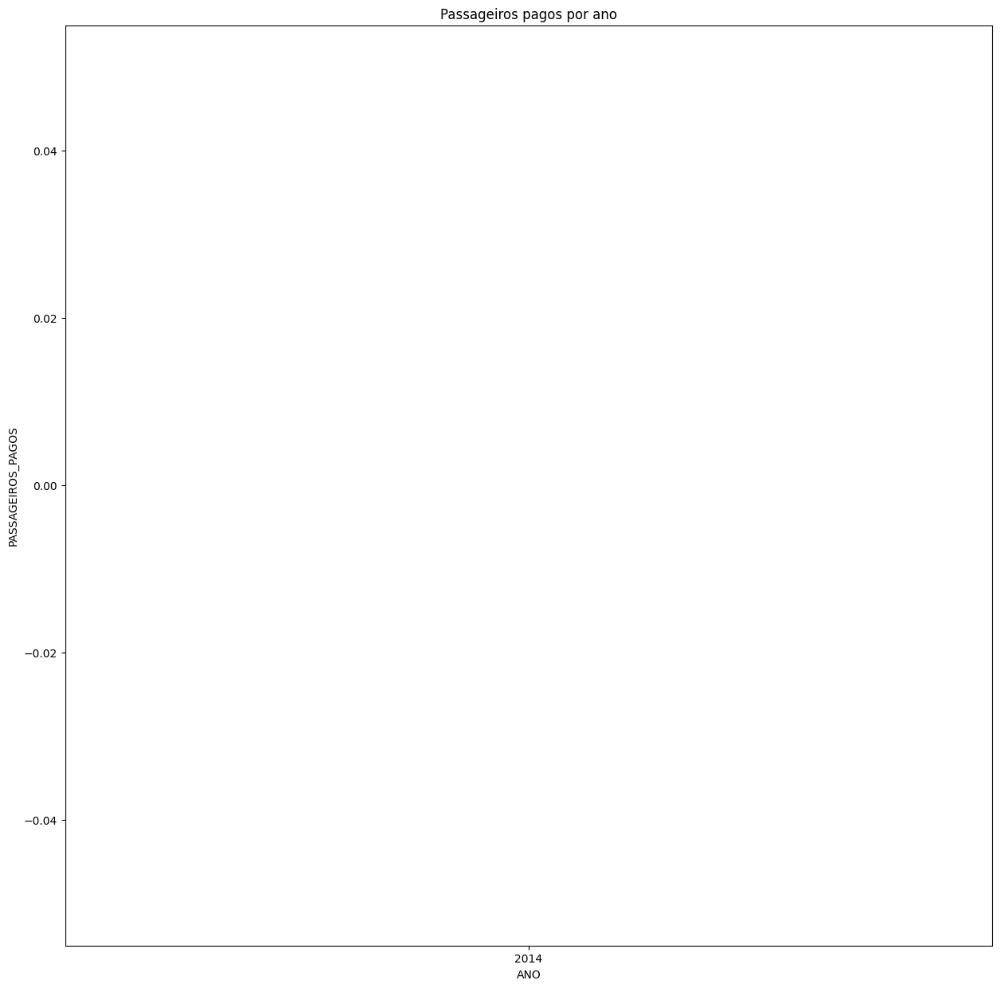





CONSORCIO VENEZOLANO DE INDUSTRIAS AERONAUTICAS Y SERVICIOS AÉREOS S.A., CONVIASA


count     42.000000
mean     328.452381
std       98.232229
min        0.000000
25%      297.000000
50%      348.500000
75%      392.500000
max      479.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


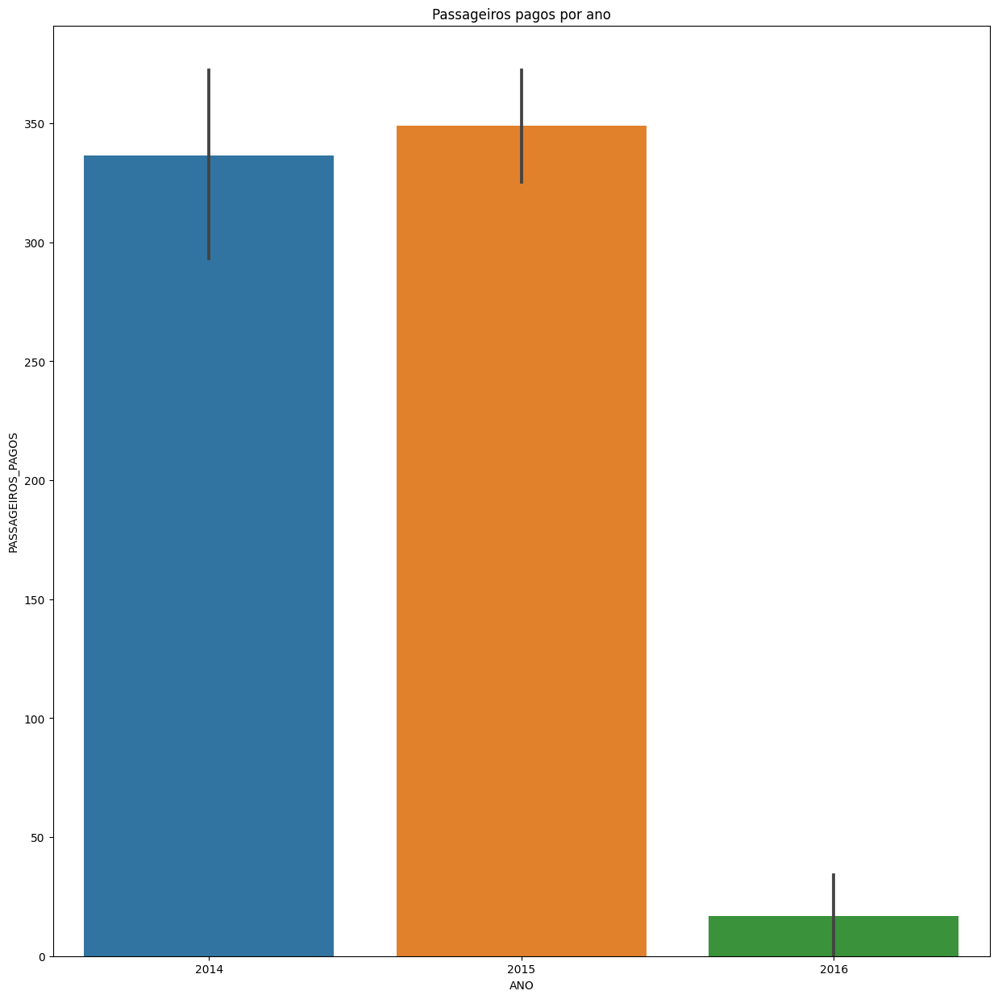





COLT TRANSPORTE AÉREO S/A


count    686.0
mean       0.0
std        0.0
min        0.0
25%        0.0
50%        0.0
75%        0.0
max        0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


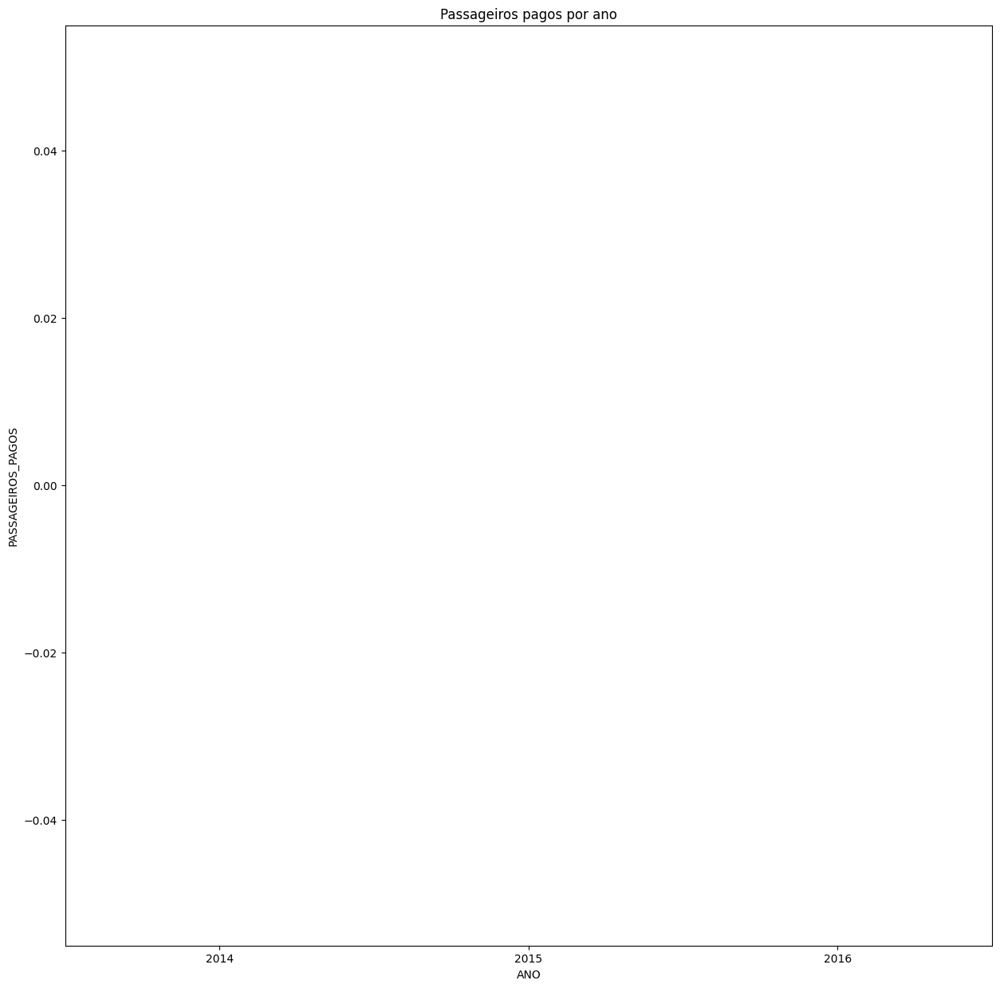





ANDES LINEAS AEREAS


count     184.000000
mean      584.353261
std       620.826270
min         0.000000
25%       155.000000
50%       476.000000
75%       651.250000
max      3502.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


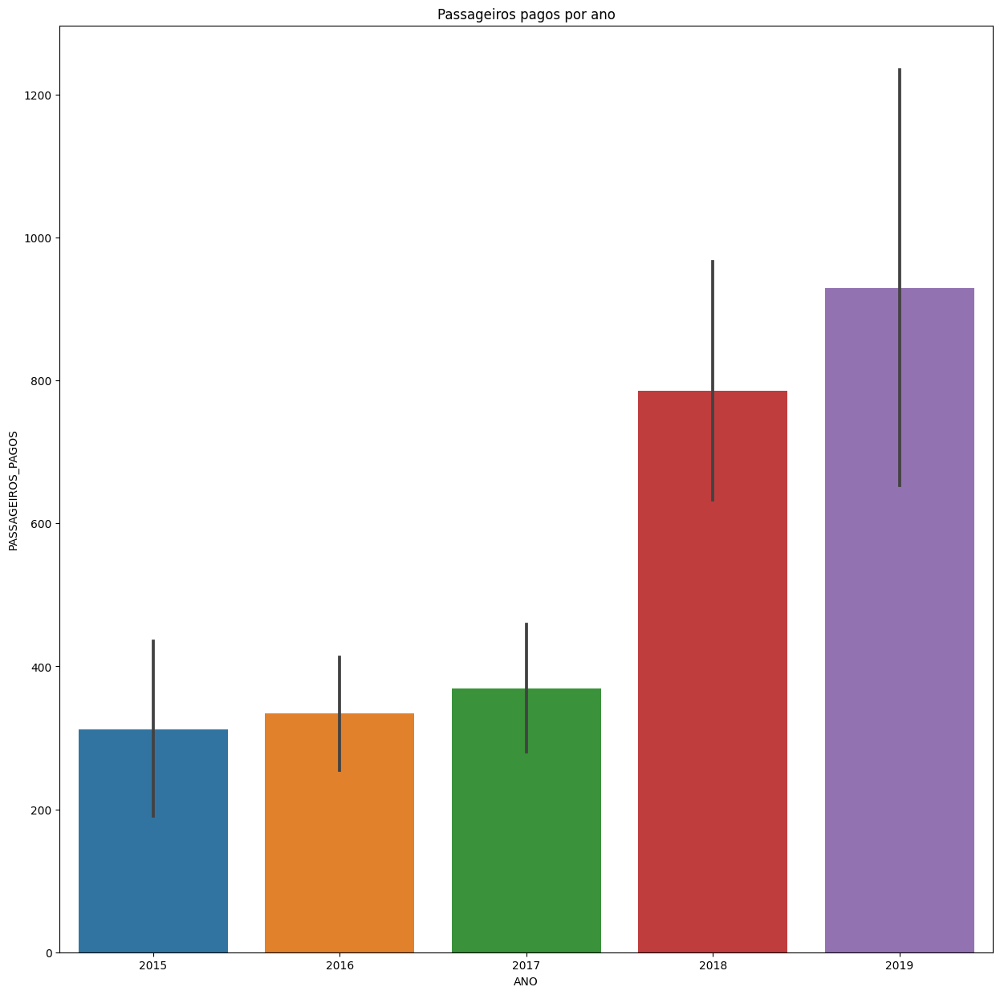





TITAN AIRWAYS


count    66.000000
mean     15.393939
std      20.974621
min       0.000000
25%       0.000000
50%       0.000000
75%      27.750000
max      60.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


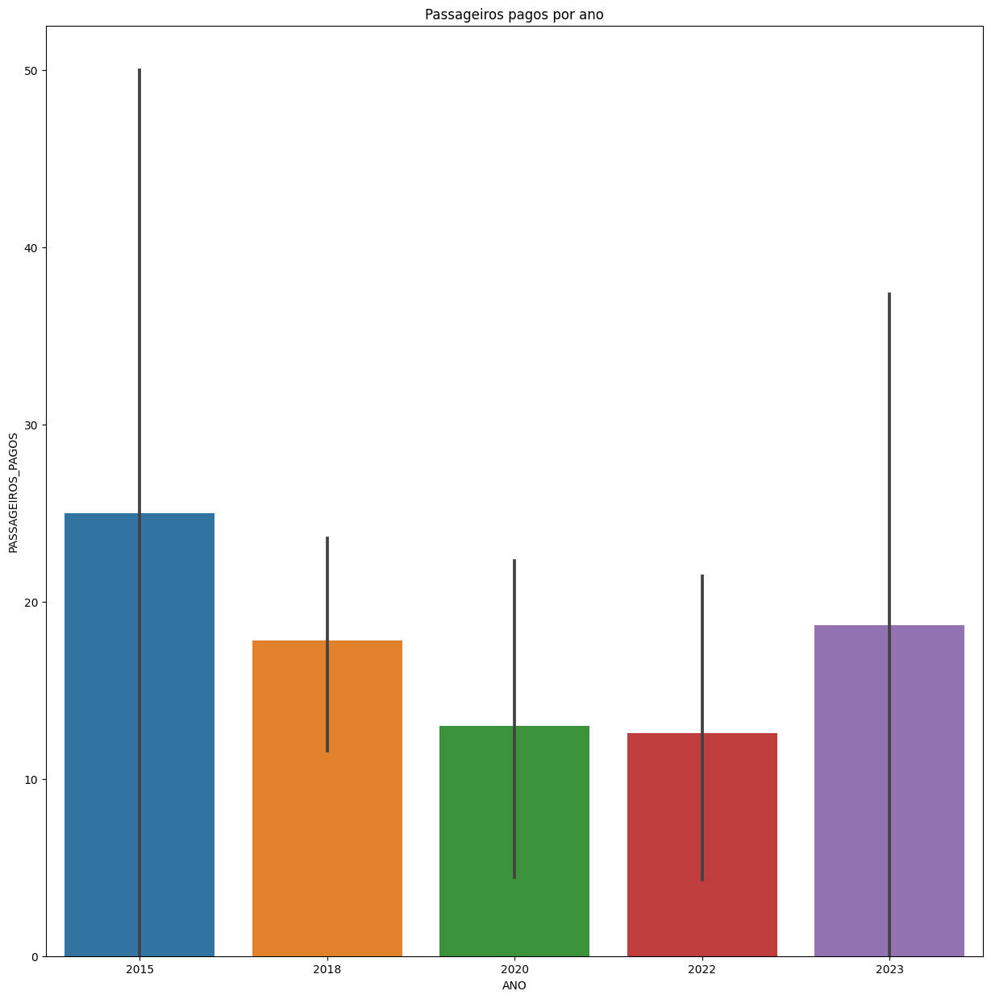





COMPAÑIA DE AVIACION PARAGUAYA SOCIEDAD ANONIMA - PARANAIR (EX- AMASZONAS PARAGUAY)


count    282.000000
mean     165.588652
std      160.485942
min        0.000000
25%       46.000000
50%       90.500000
75%      283.250000
max      687.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


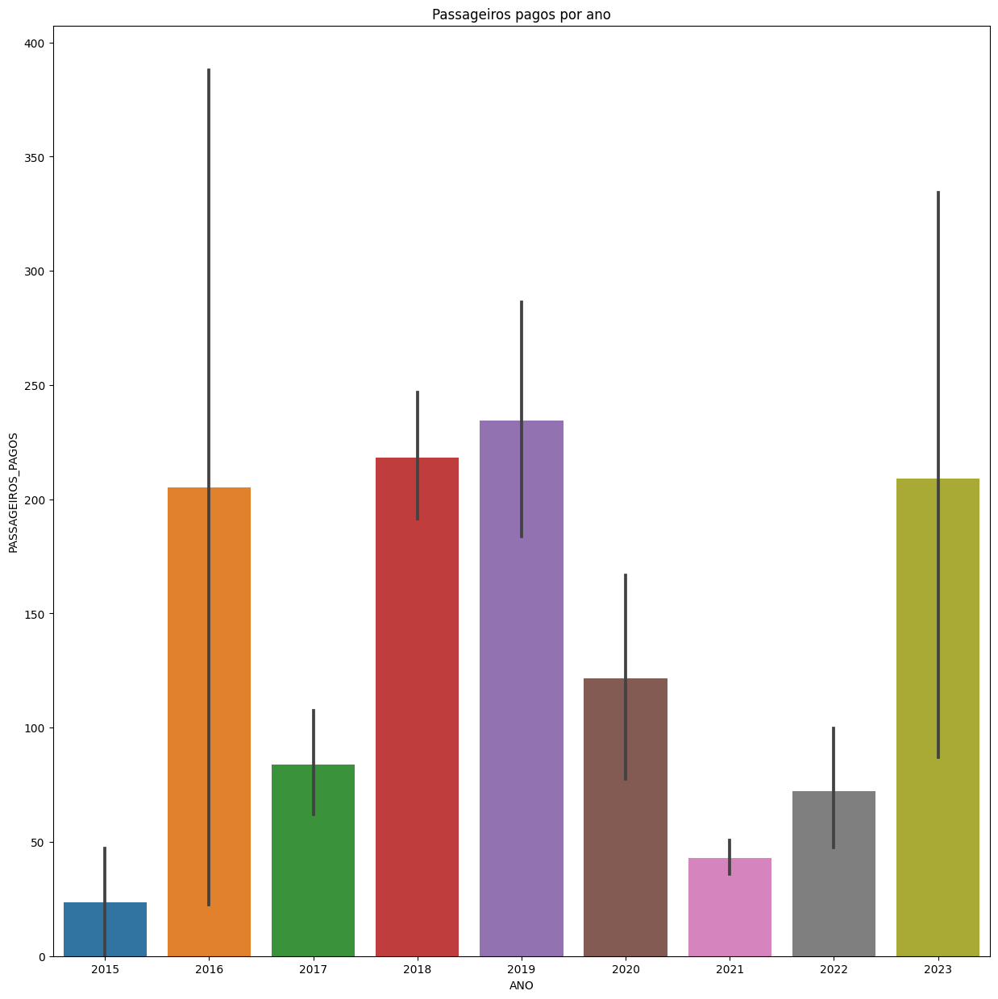





AEROSERVICES CORPORATE


count    11.000000
mean     23.272727
std      32.951755
min       0.000000
25%       0.000000
50%       0.000000
75%      58.000000
max      70.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


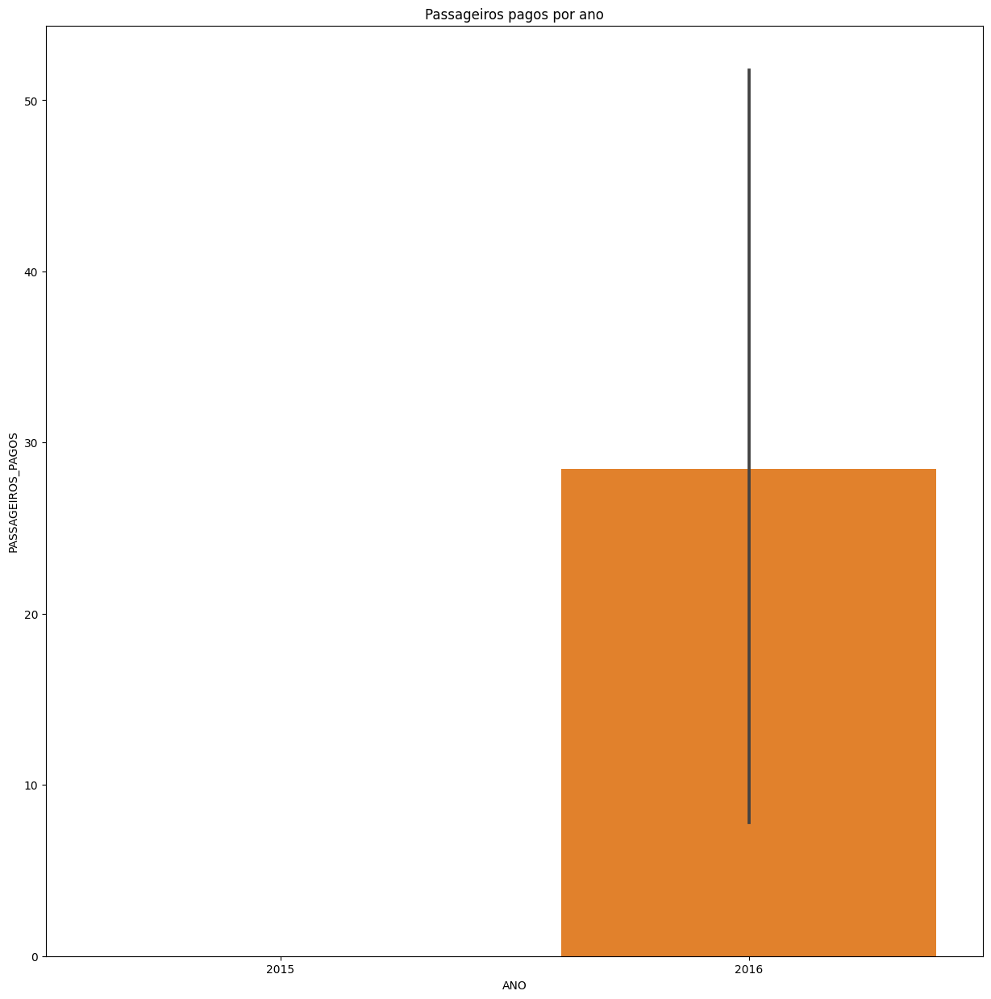





SW ITALIA S. P. A.


count    10.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


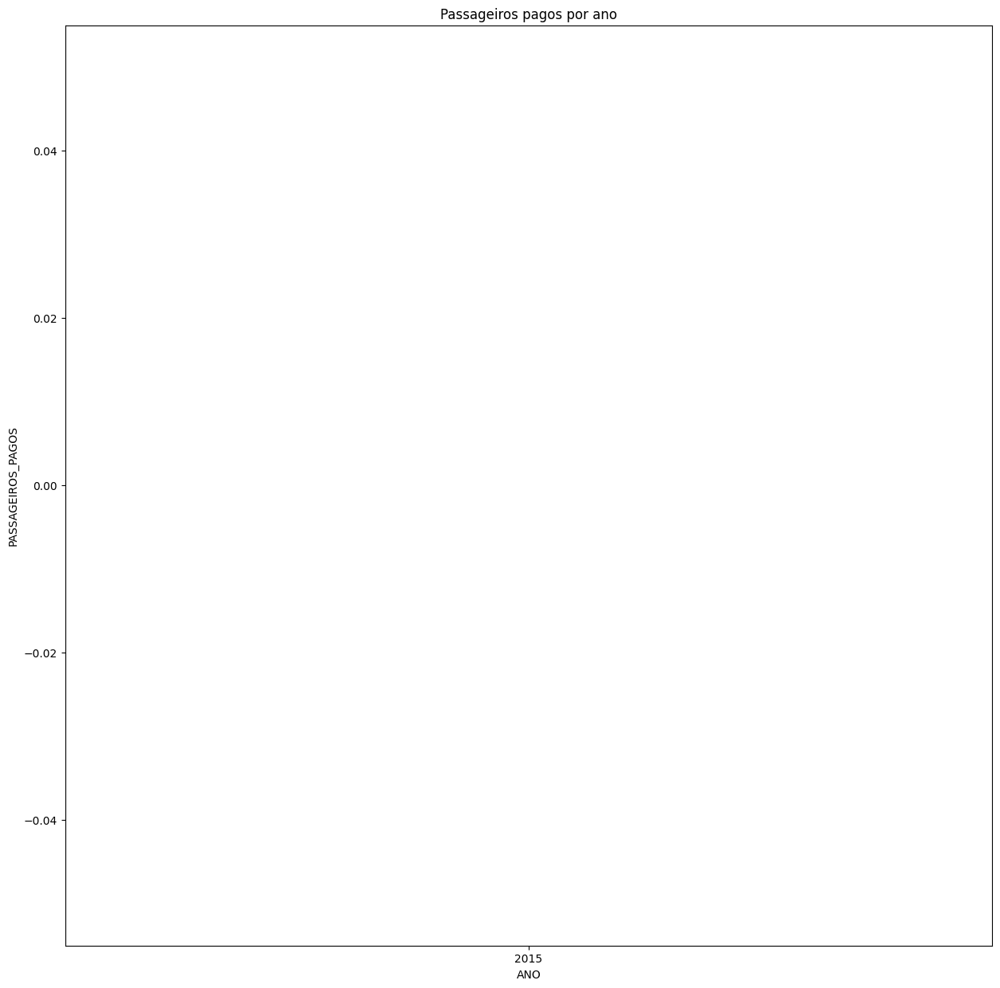





FLYWAYS LINHAS AÉREAS LTDA.


count     110.000000
mean      272.845455
std       367.346353
min         0.000000
25%         0.000000
50%        49.500000
75%       581.500000
max      1484.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


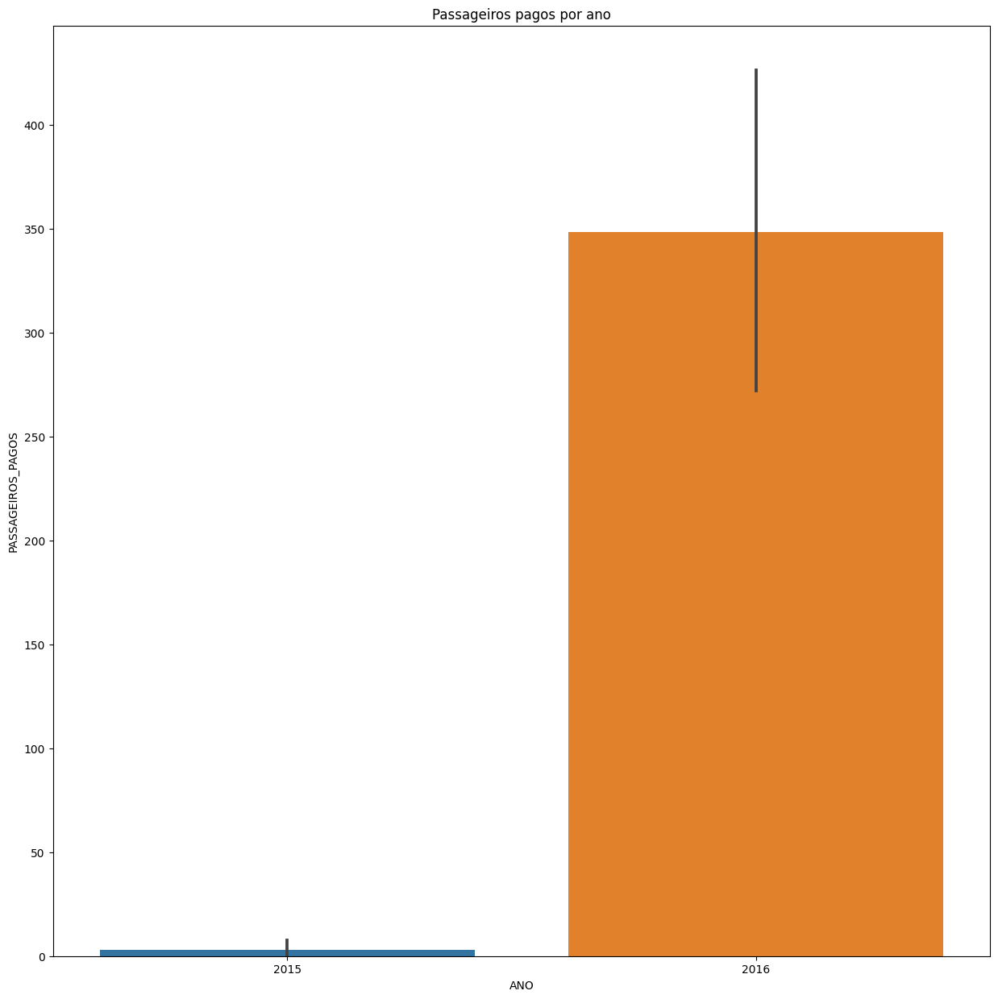





GLOBAL AFRICA AVIATION


count    19.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


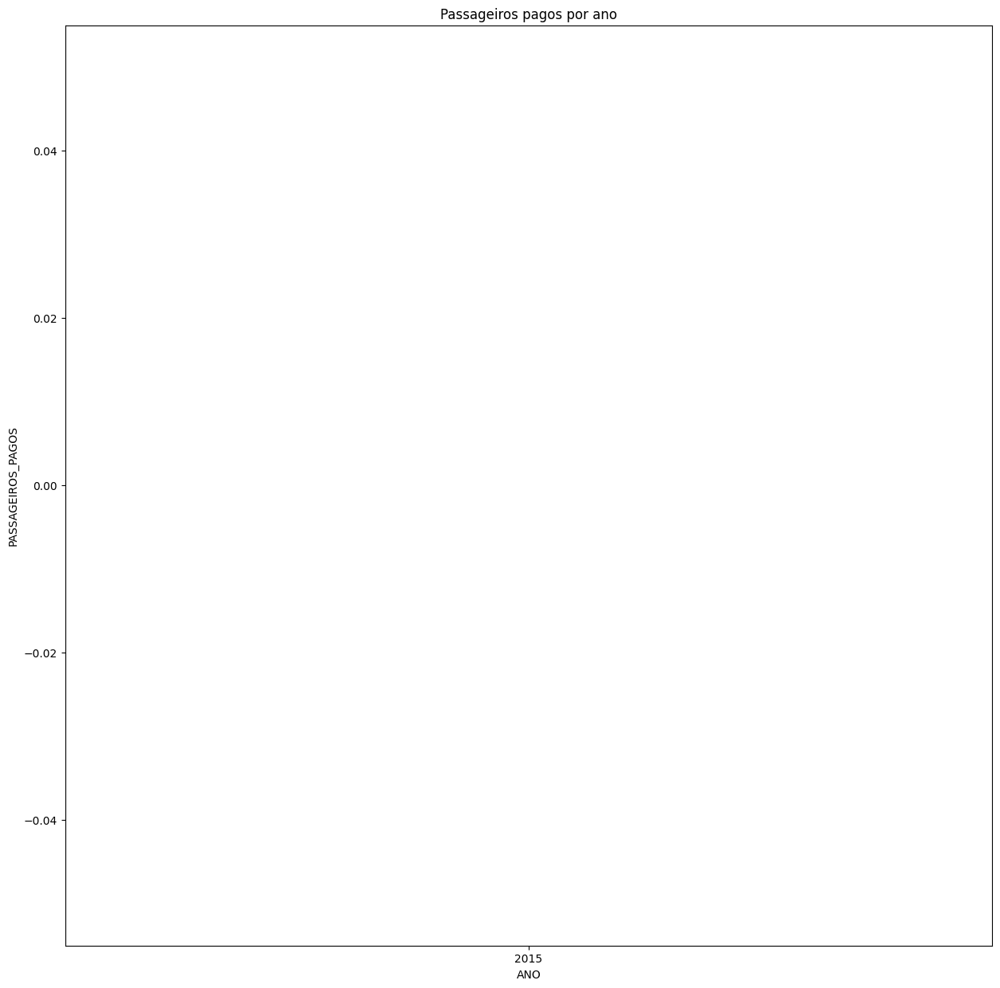





ALIANZA GLANCELOT, C.A. ALBATROS AIRLINES


count     22.000000
mean      27.681818
std       57.325625
min        0.000000
25%        0.000000
50%        0.000000
75%       21.000000
max      221.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


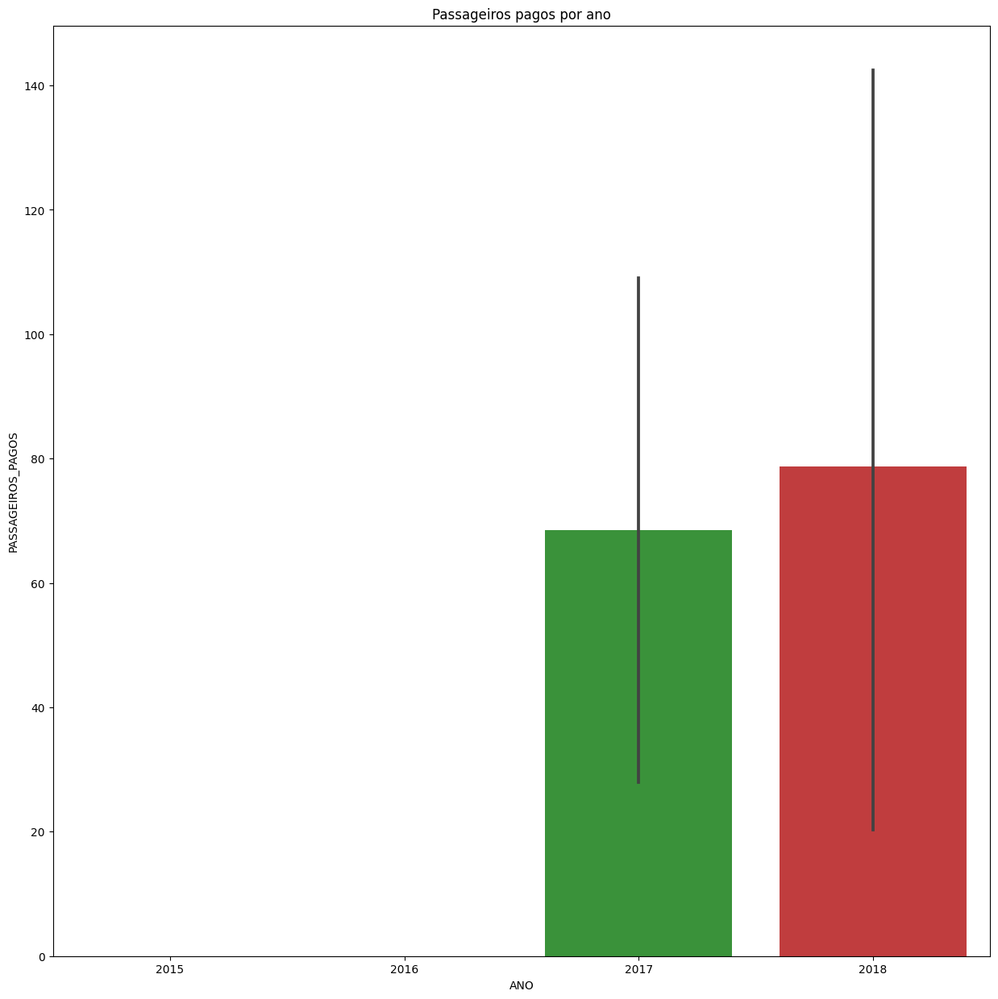

/usr/local/lib/python3.10/dist-packages/seaborn/algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))






ICELANDAIR


count    28.000000
mean     24.785714
std      24.962724
min       0.000000
25%       0.000000
50%      33.000000
75%      45.000000
max      62.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


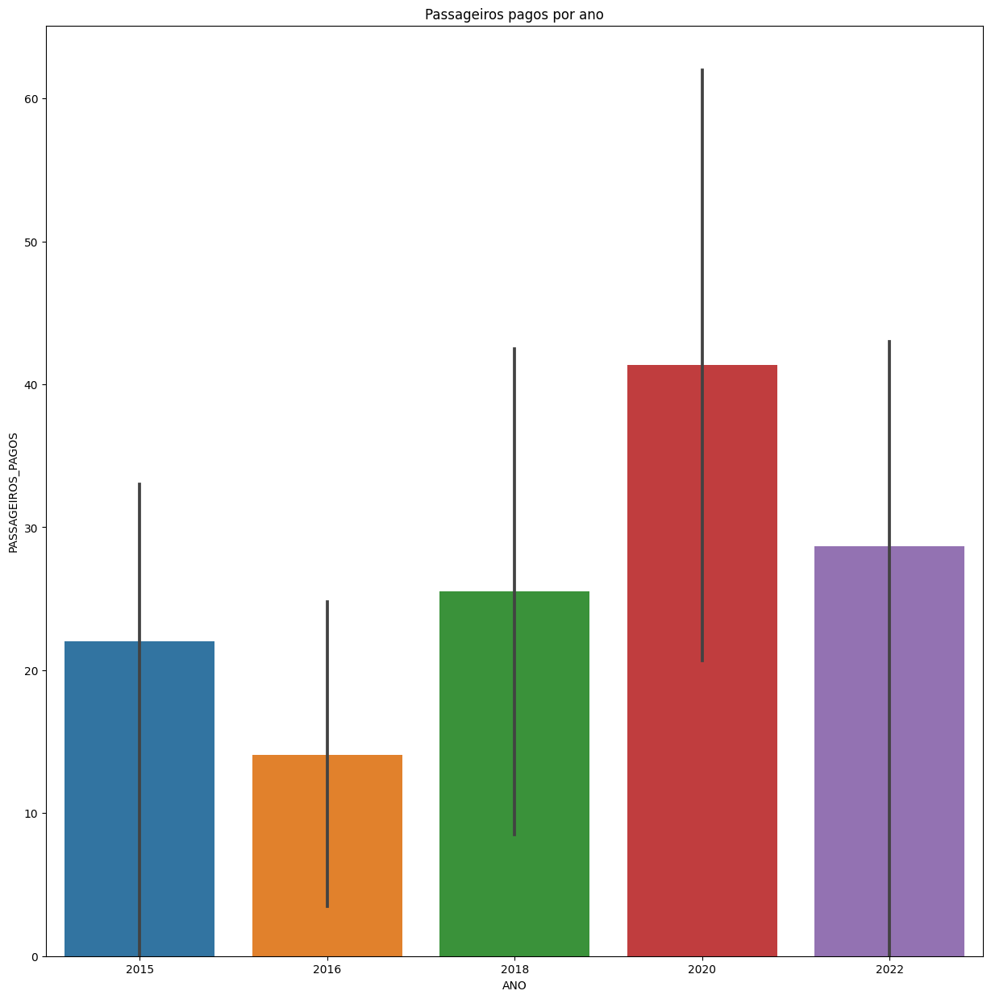





INSEL AIR INTERNATIONAL B.V.


count      80.000000
mean      362.325000
std       428.593247
min         0.000000
25%        38.000000
50%       257.500000
75%       490.250000
max      1807.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


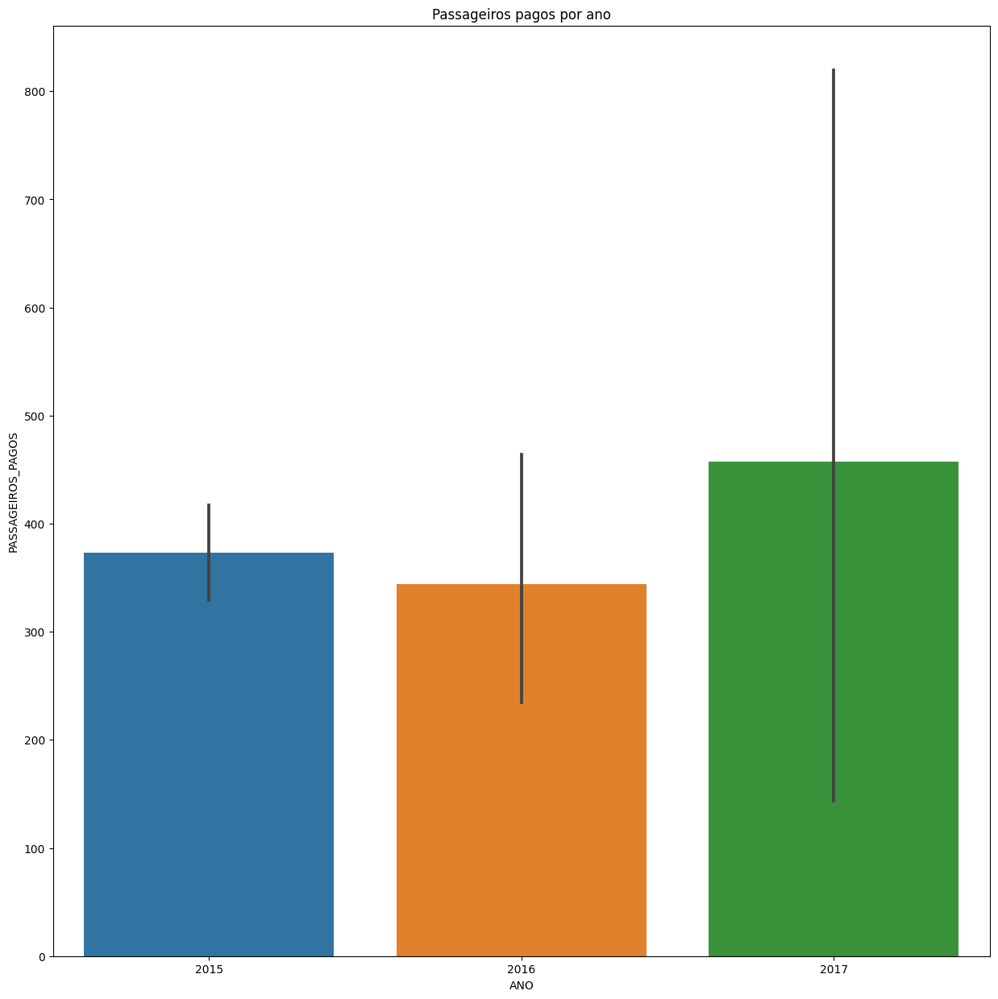





NORDIC GLOBAL AIRLINES LTD


count    9.0
mean     0.0
std      0.0
min      0.0
25%      0.0
50%      0.0
75%      0.0
max      0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


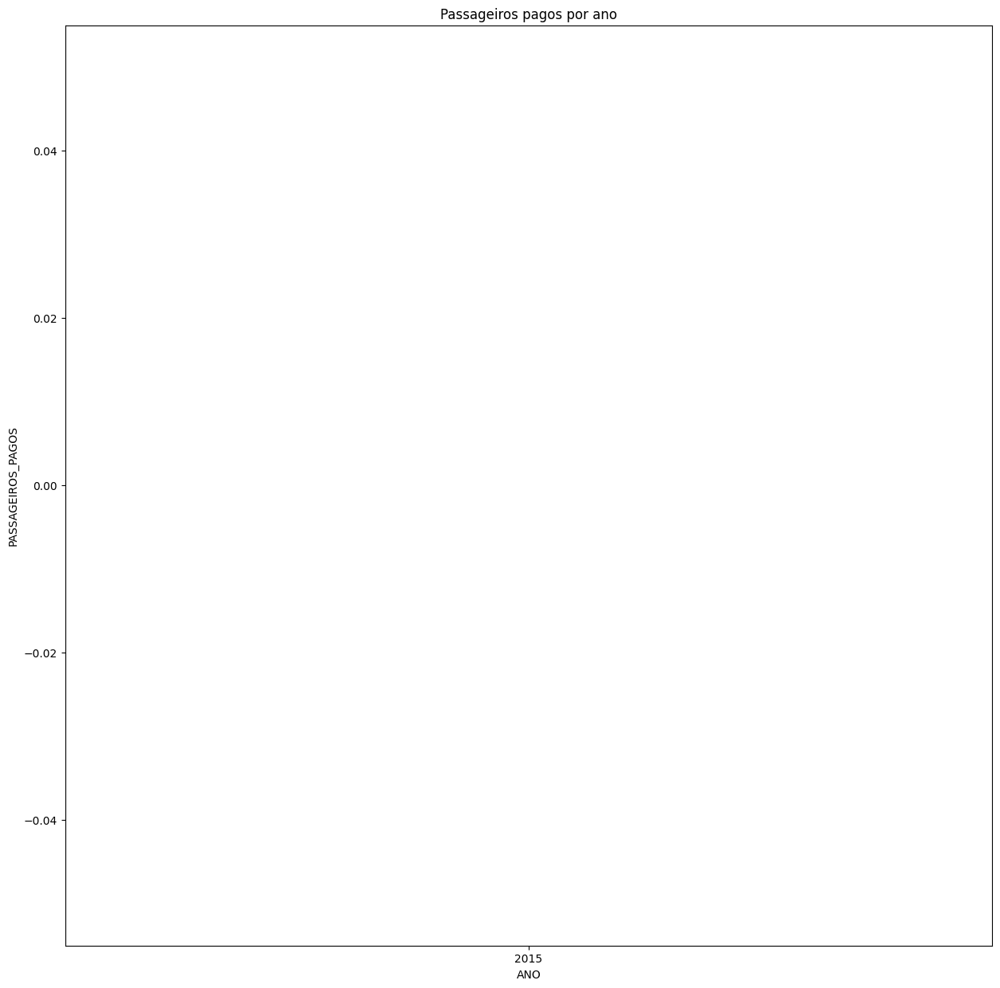





INSEL AIR ARUBA N.V.


count     43.000000
mean     156.720930
std      100.365362
min        0.000000
25%       87.000000
50%      140.000000
75%      235.000000
max      353.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


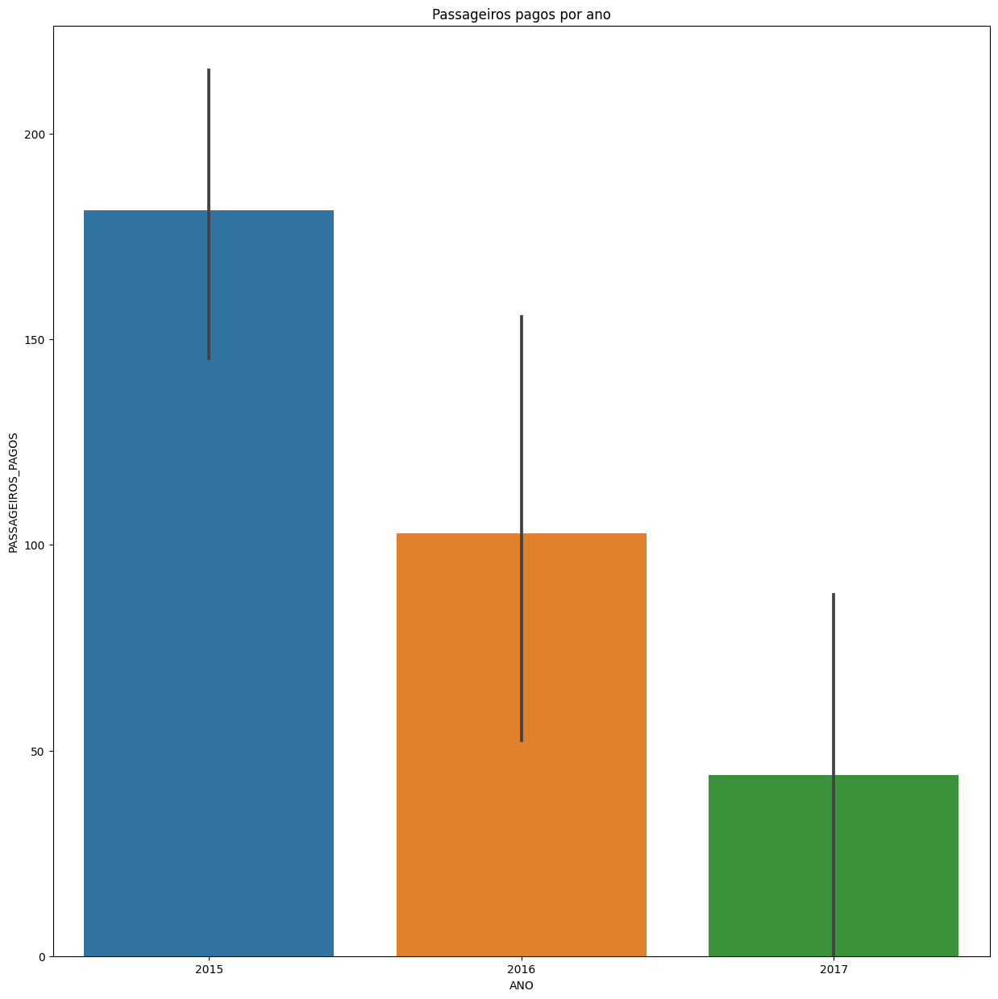





AVIOR AIRLINES BRASIL C.A.


count     107.000000
mean      495.439252
std       312.302713
min         0.000000
25%       309.500000
50%       459.000000
75%       627.500000
max      1325.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


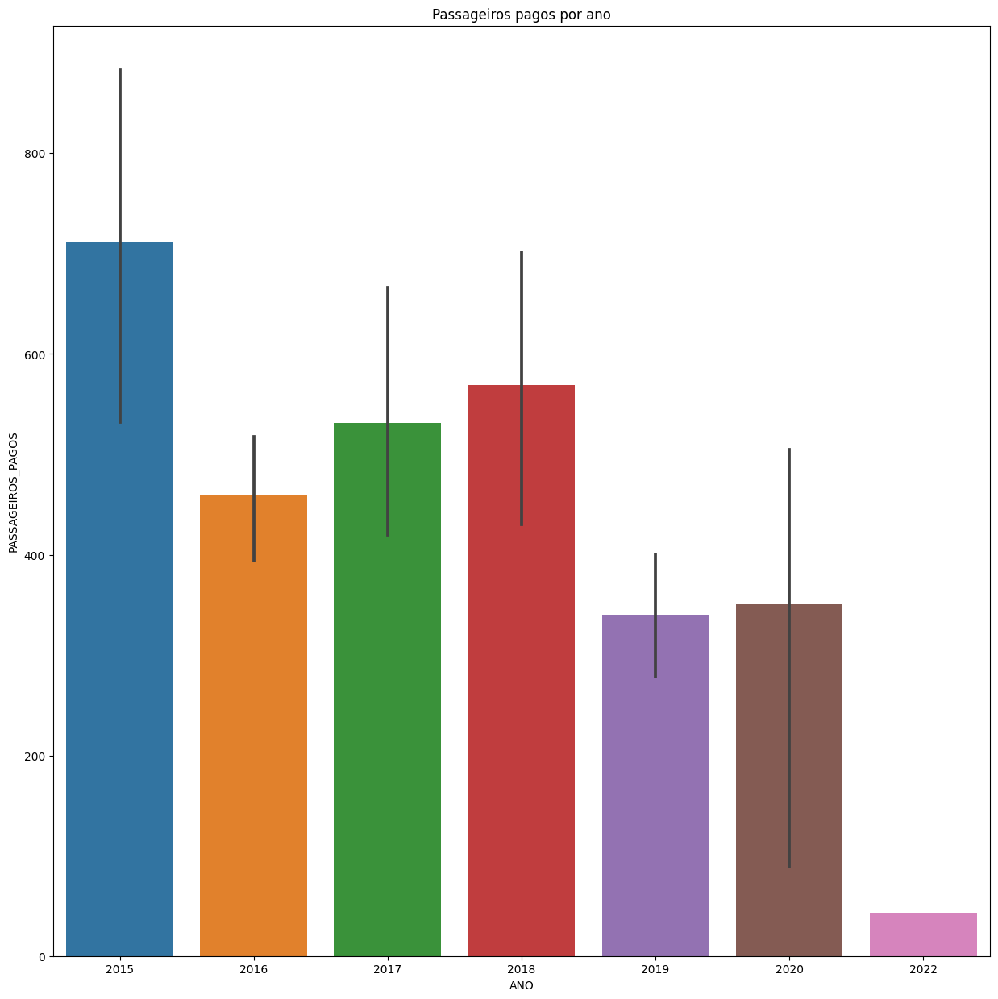





AIR TRANSAT A.T. INC


count    82.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


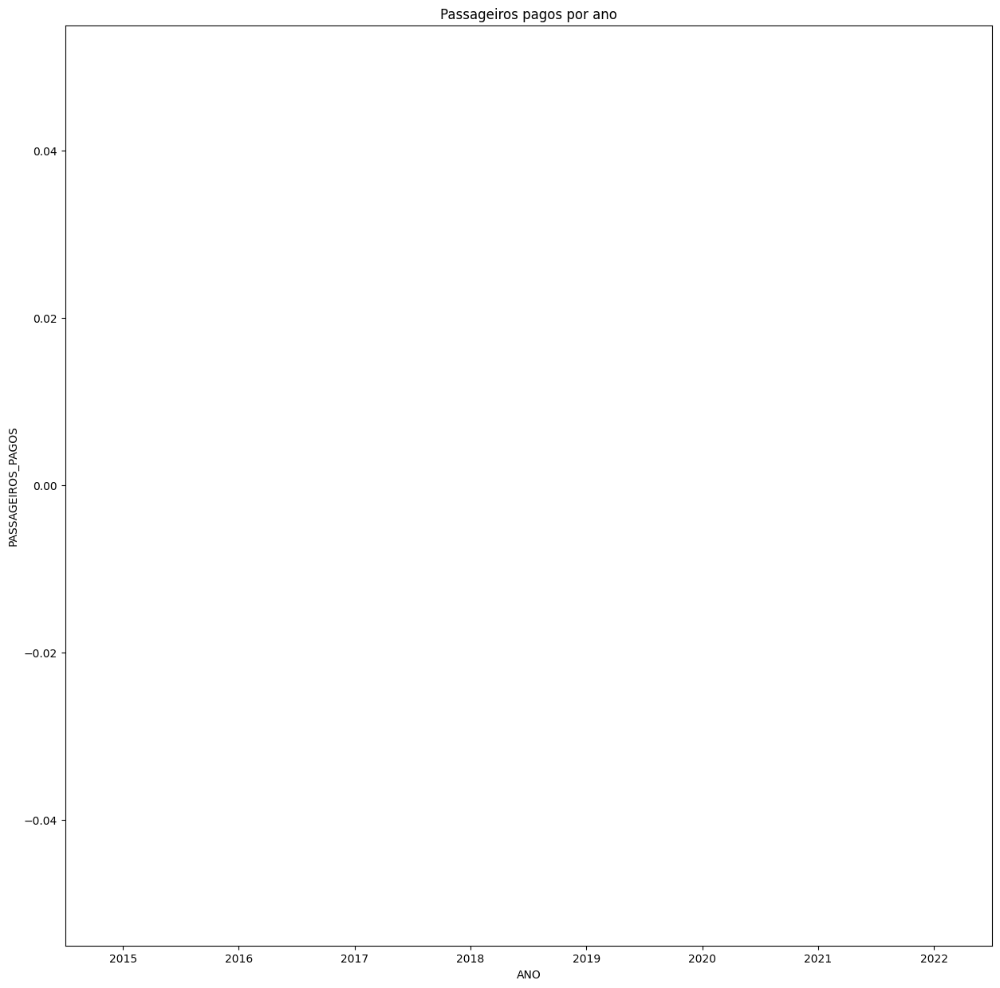





WESTERN GLOBAL AIRLINES


count    64.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


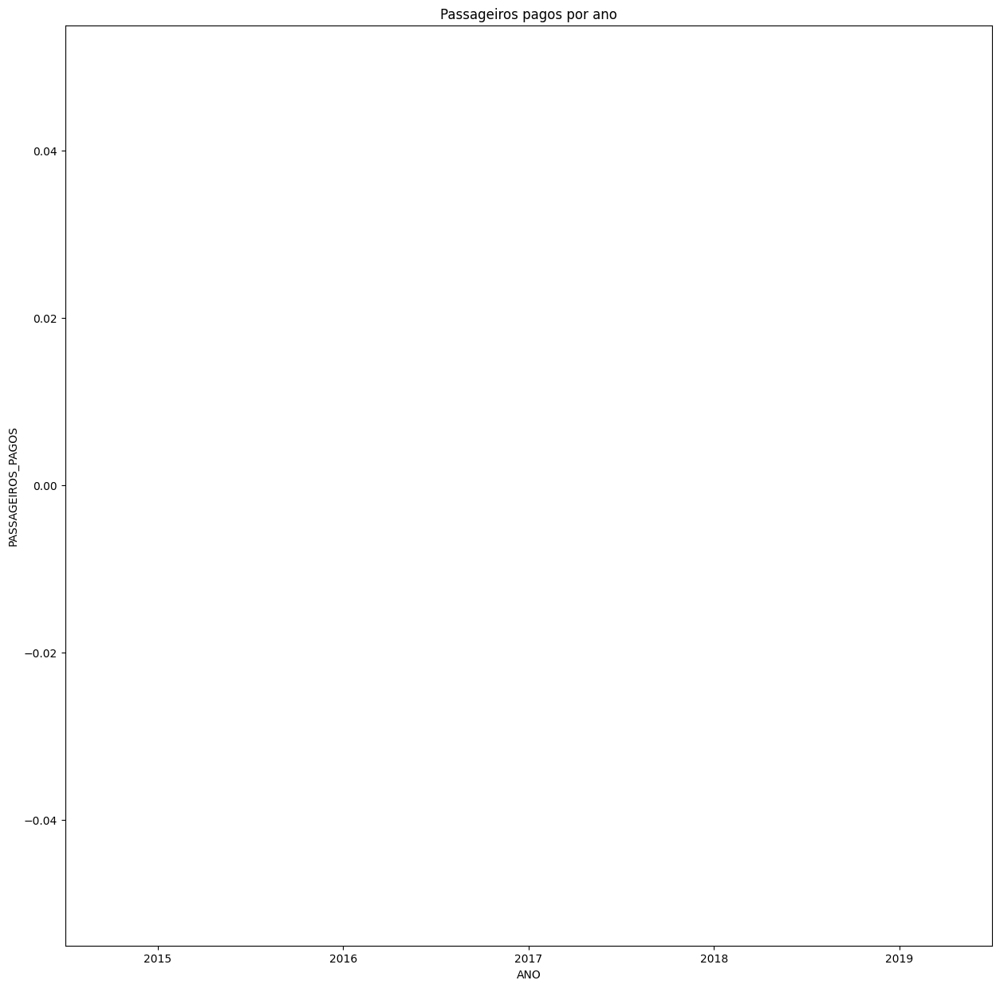





AIR ATLANTA ICELANDIC


count    70.000000
mean      3.028571
std      14.676187
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max      80.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


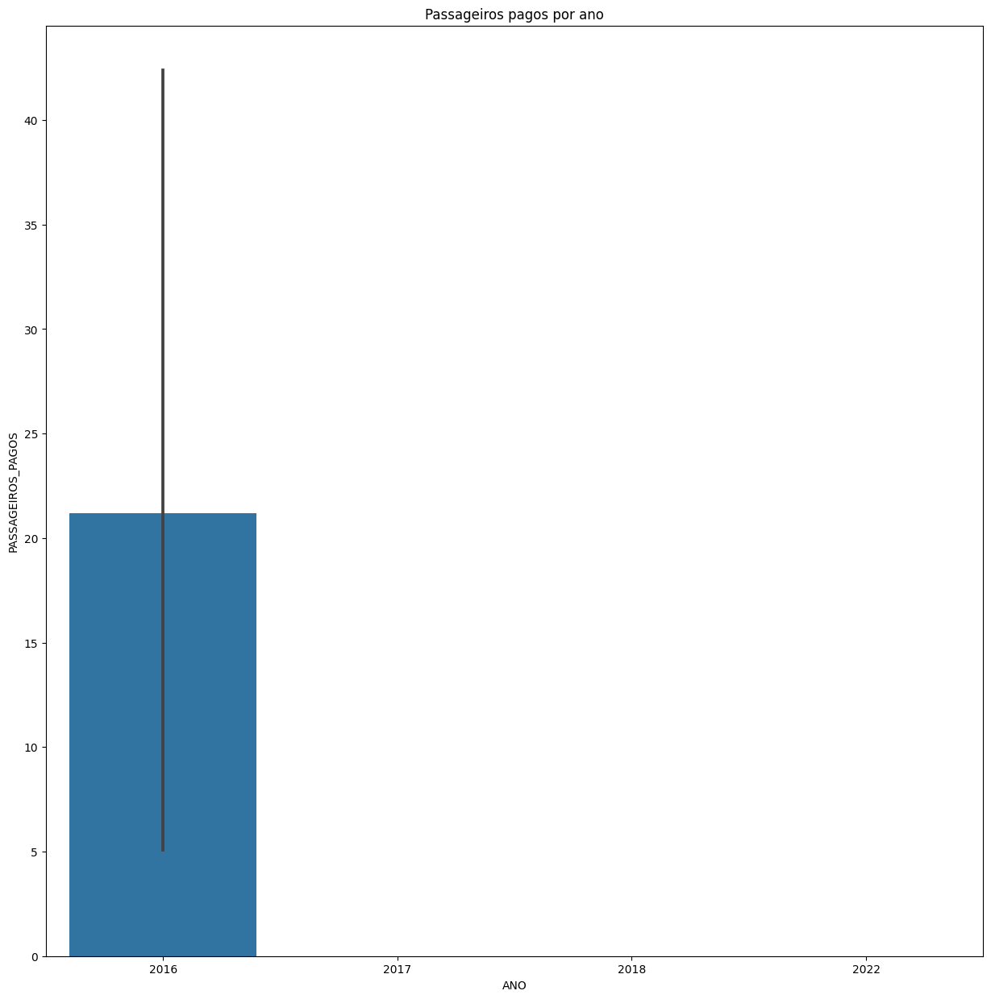





AZERBAIJAN AIRLINES


count      2.0
mean     172.0
std        0.0
min      172.0
25%      172.0
50%      172.0
75%      172.0
max      172.0
Name: PASSAGEIROS_PAGOS, dtype: float64


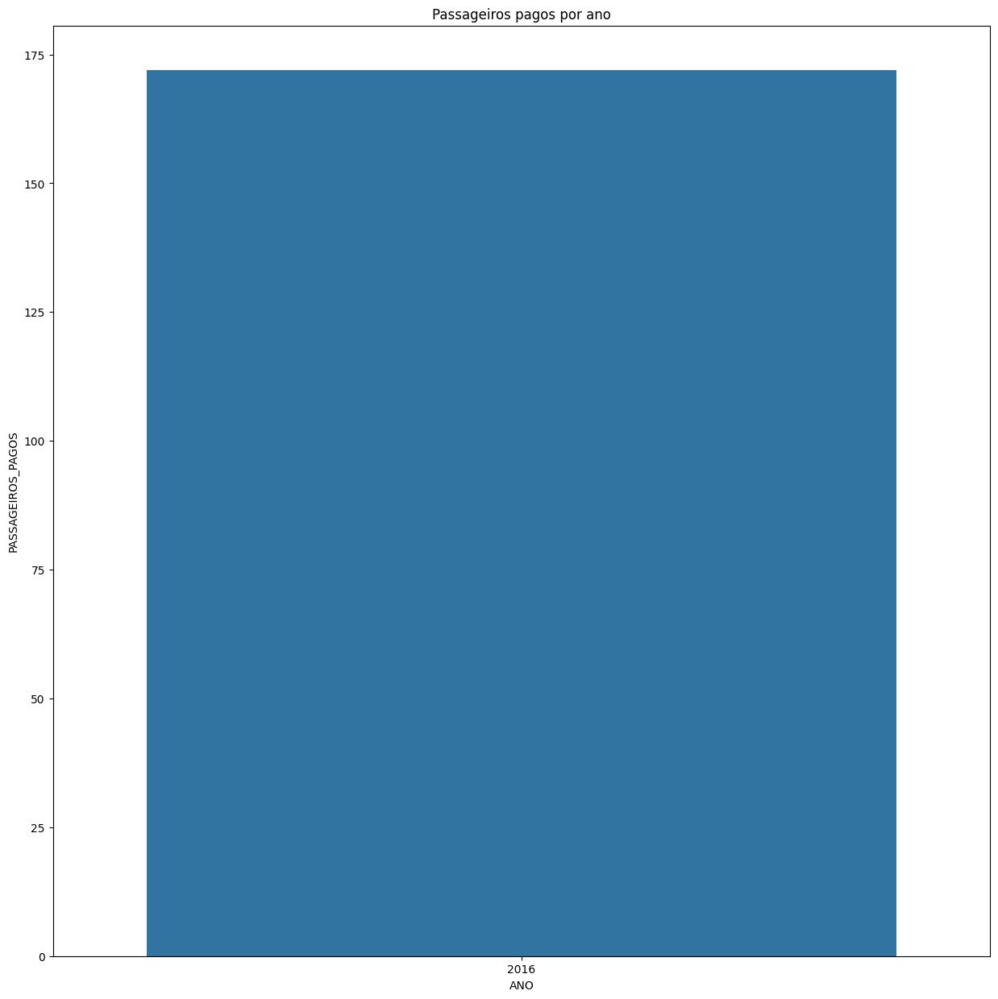





DYRUS S.A. (ALAS URUGUAY OU ALAS U)


count     21.000000
mean      59.571429
std       54.660380
min        0.000000
25%        0.000000
50%       51.000000
75%      111.000000
max      154.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


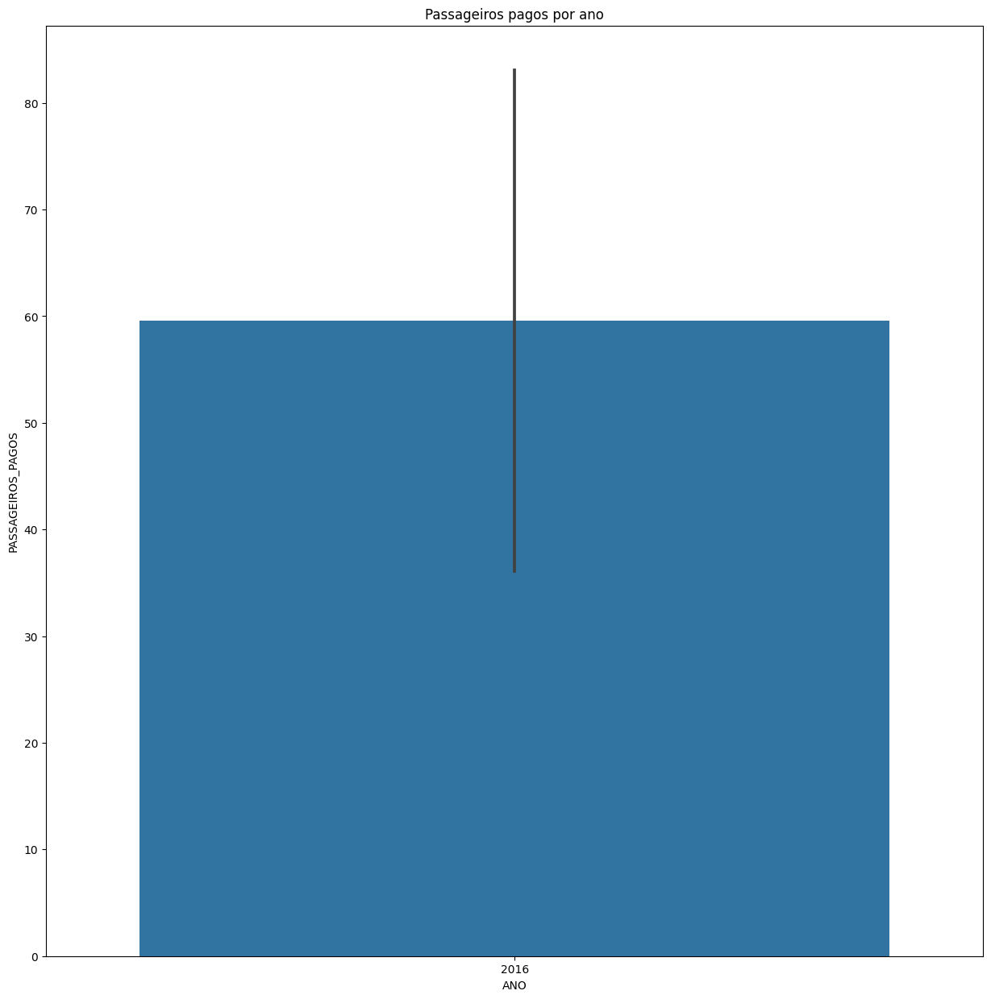





ALL NIPPON AIRWAYS


count    6.0
mean     0.0
std      0.0
min      0.0
25%      0.0
50%      0.0
75%      0.0
max      0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


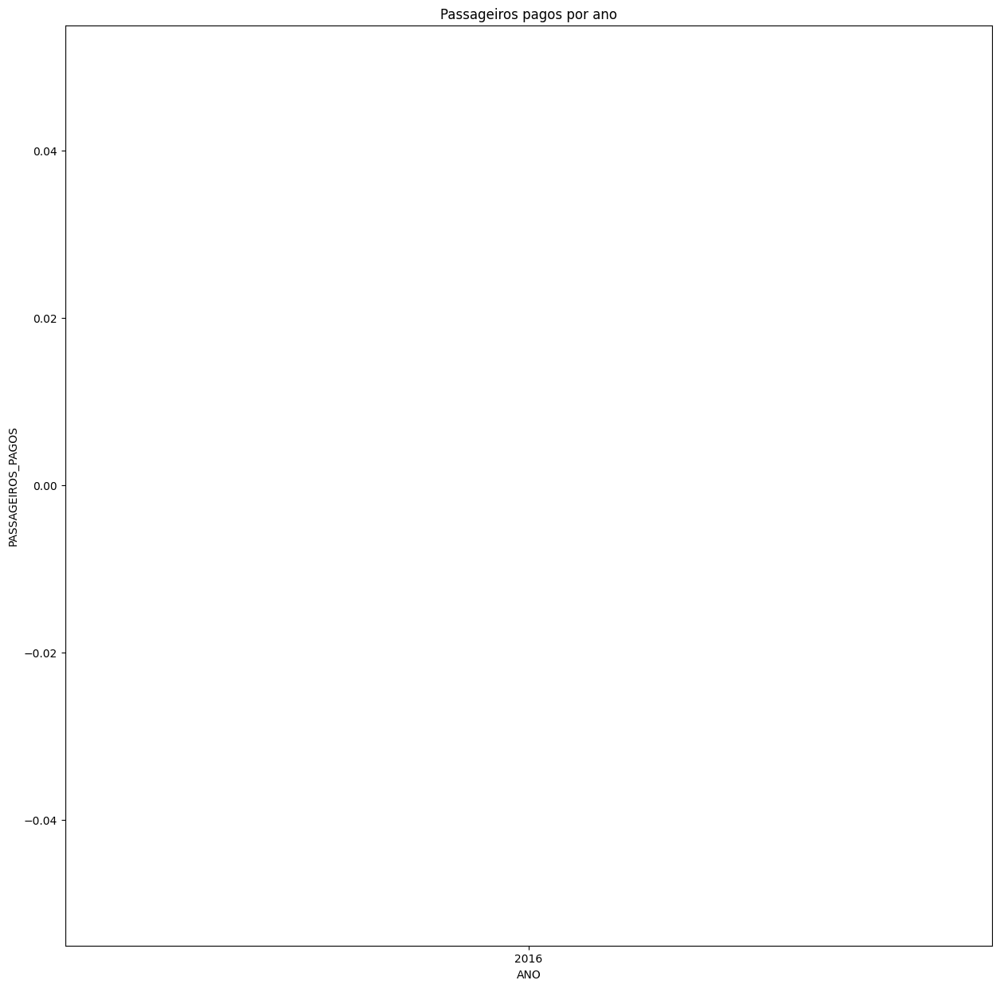





COMPAÑIA DE SERVICIOS DE TRANSPORTE AEREO AMASZONAS S/A.


count      65.000000
mean      356.984615
std       514.009864
min         0.000000
25%        36.000000
50%       100.000000
75%       318.000000
max      1584.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


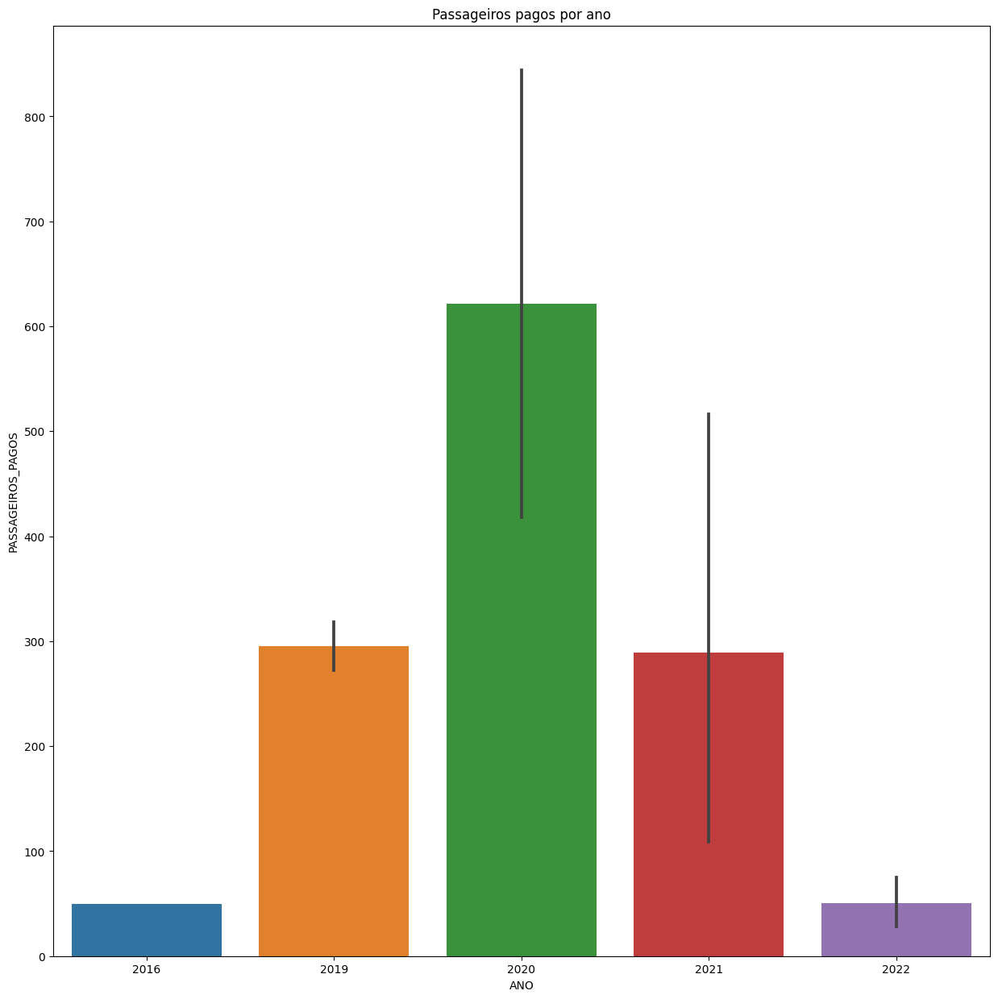

/usr/local/lib/python3.10/dist-packages/seaborn/algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))






AIR CARAIBES ATLANTIQUE


count      4.000000
mean     331.000000
std       18.493242
min      315.000000
25%      315.000000
50%      330.500000
75%      346.500000
max      348.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


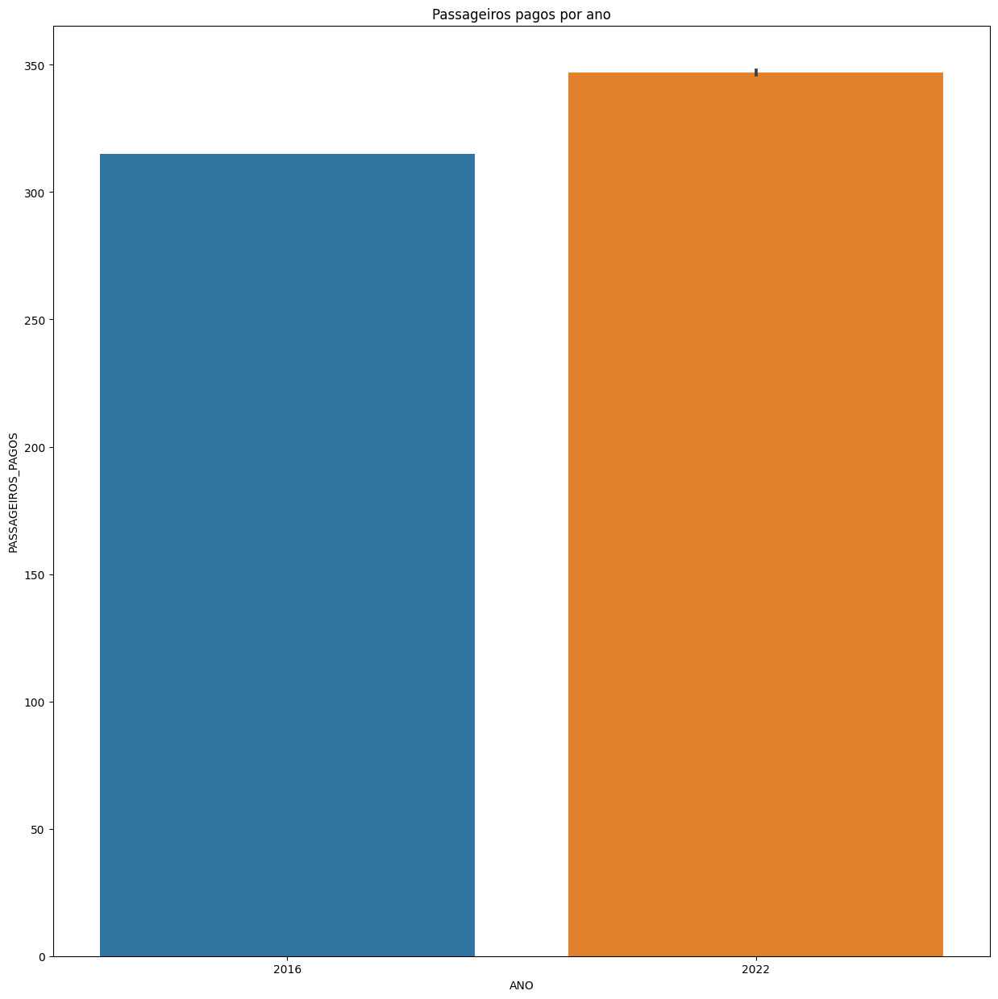





DYNAMIC AIRWAYS LLC


count    11.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


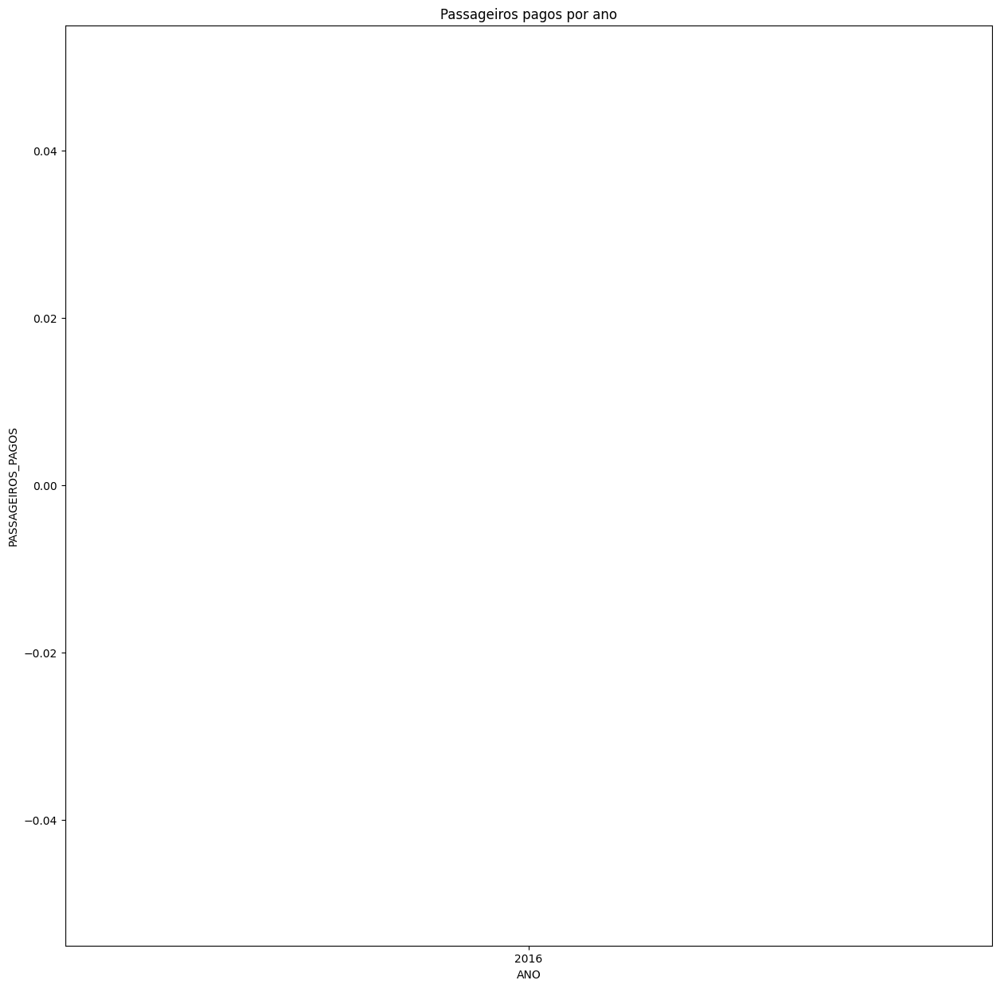





EASTERN AIRLINES, LLC


count     30.000000
mean      51.633333
std       70.168508
min        0.000000
25%        0.000000
50%        0.000000
75%       99.750000
max      212.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


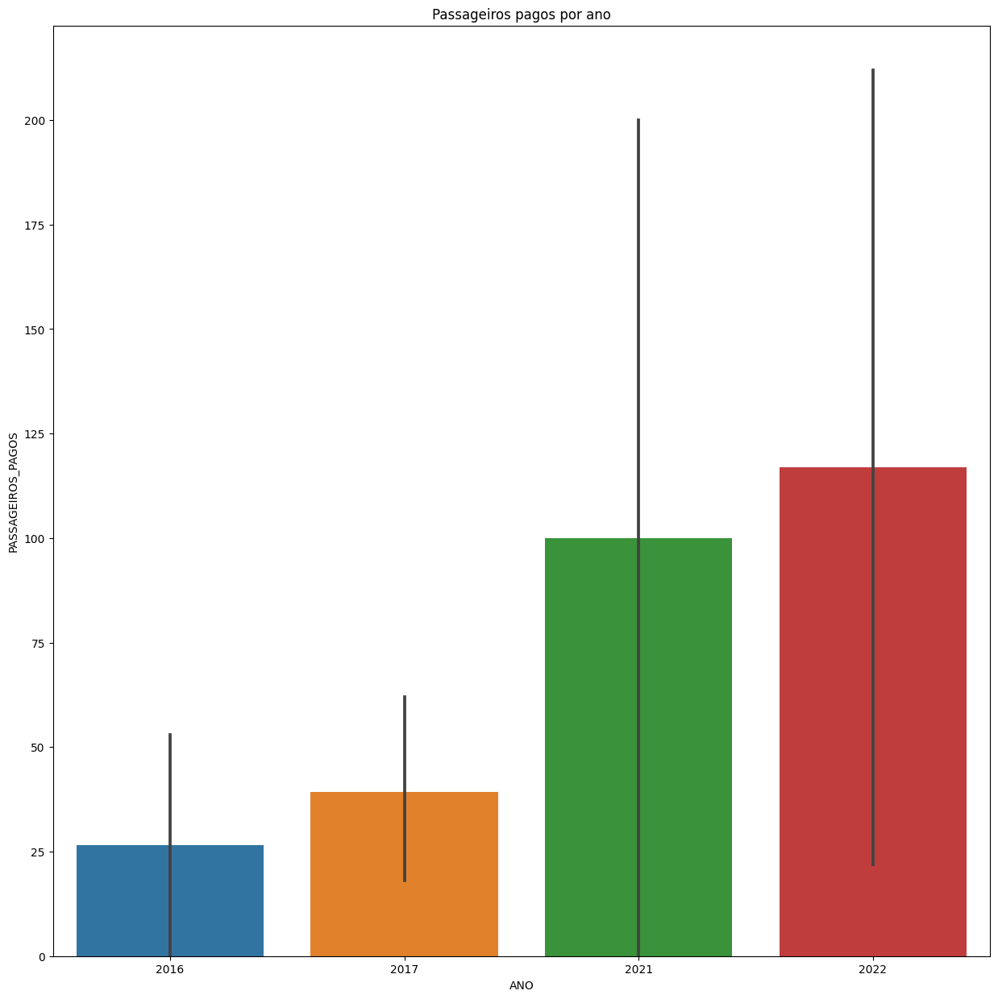





JETMAGIC


count    31.000000
mean     28.322581
std      17.745210
min       0.000000
25%      13.500000
50%      35.000000
75%      36.000000
max      50.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


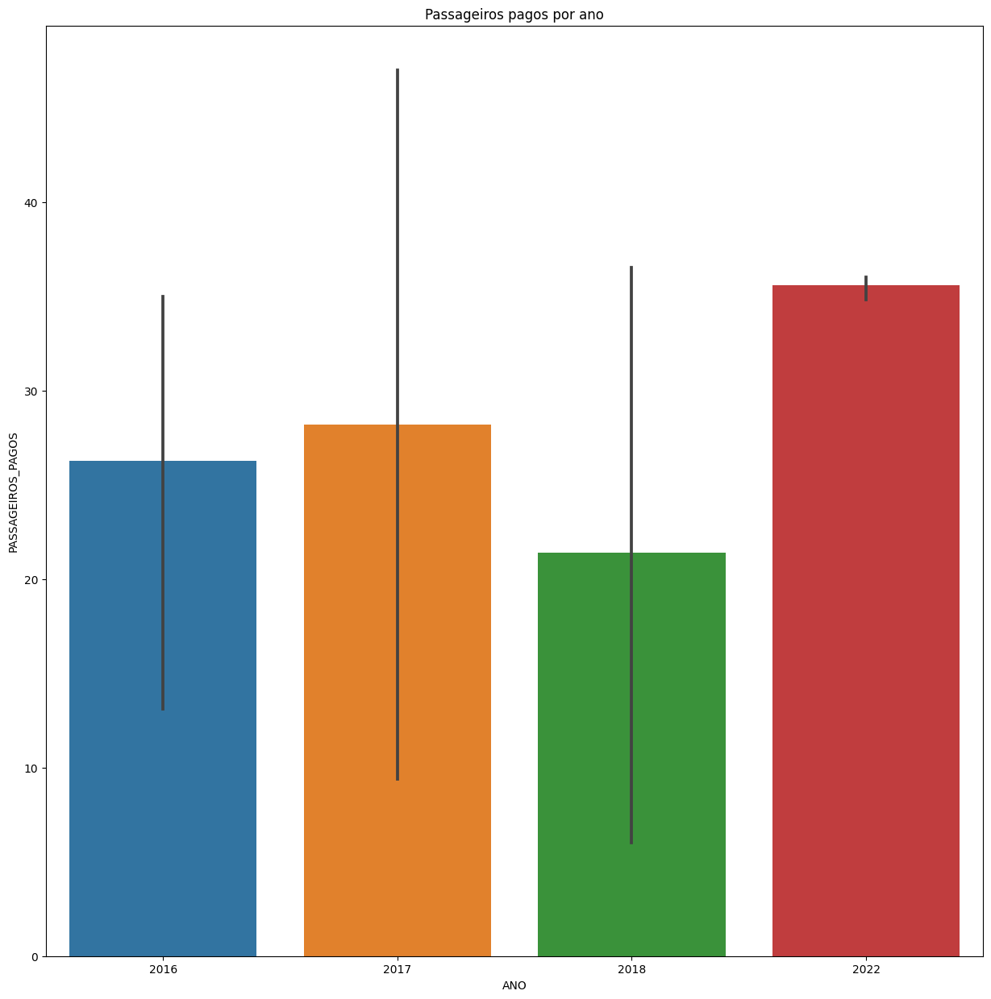





L.A.C. LINEA AEREA CUENCANA


count     9.000000
mean     18.222222
std      36.158601
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max      82.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


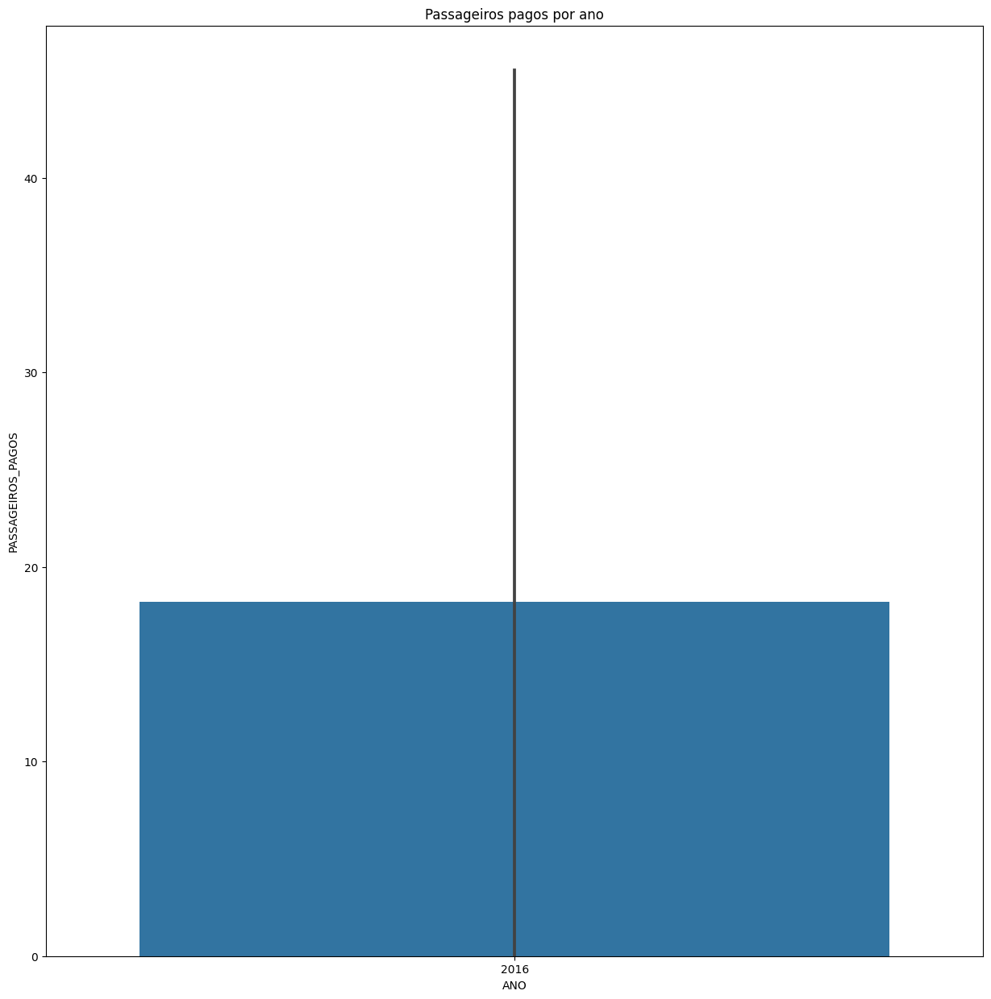





LAMIA CORPOTATION SRL


count     8.000000
mean     14.500000
std      26.848783
min       0.000000
25%       0.000000
50%       0.000000
75%      14.500000
max      58.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


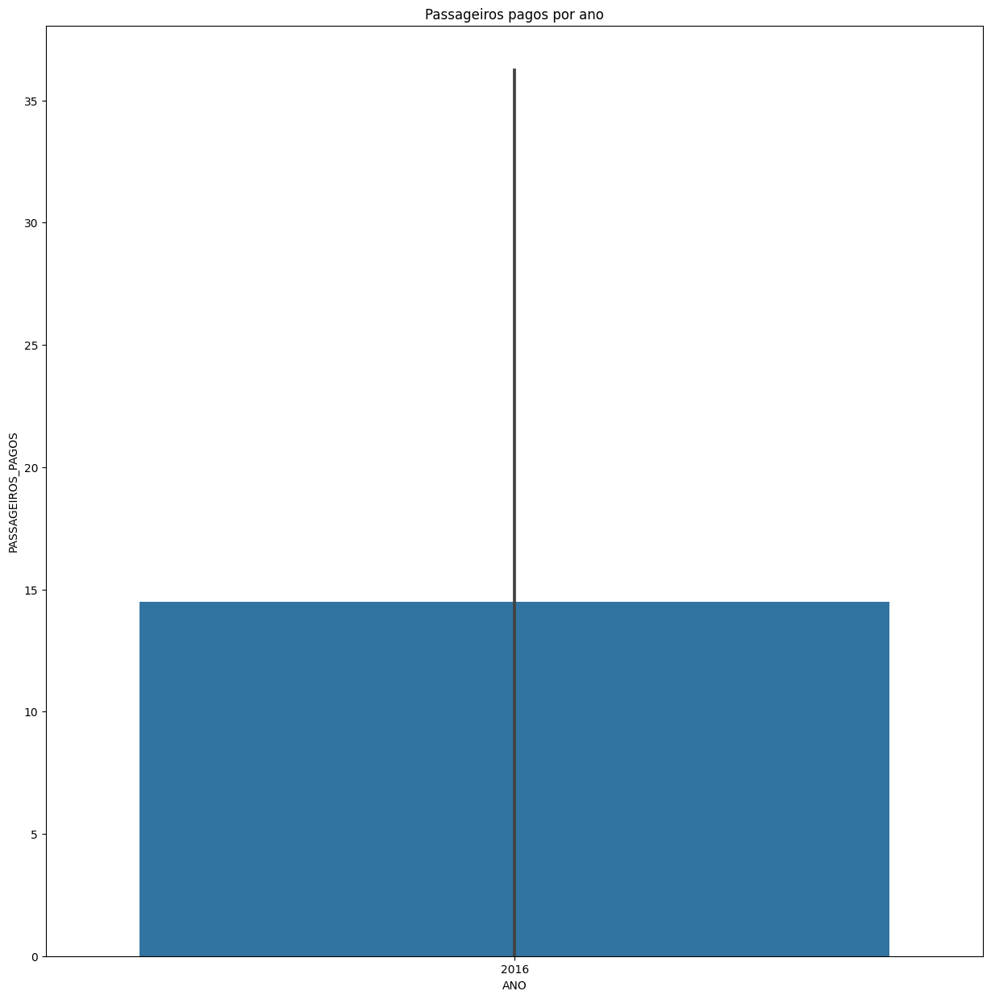





SOLAR CARGO, CA


count    8.0
mean     0.0
std      0.0
min      0.0
25%      0.0
50%      0.0
75%      0.0
max      0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


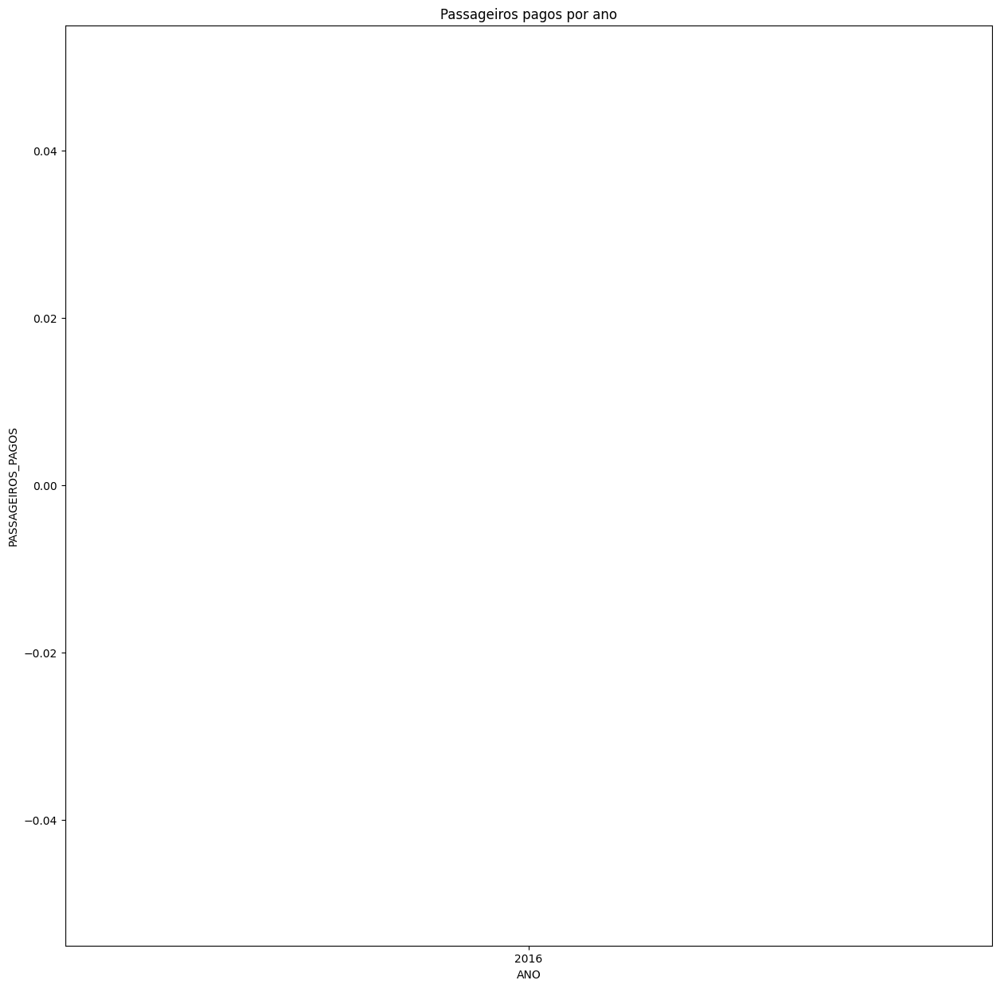





ONE AIRLINE S. P. A.


count     11.000000
mean      74.818182
std       58.116810
min        0.000000
25%       20.500000
50%      115.000000
75%      115.000000
max      140.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


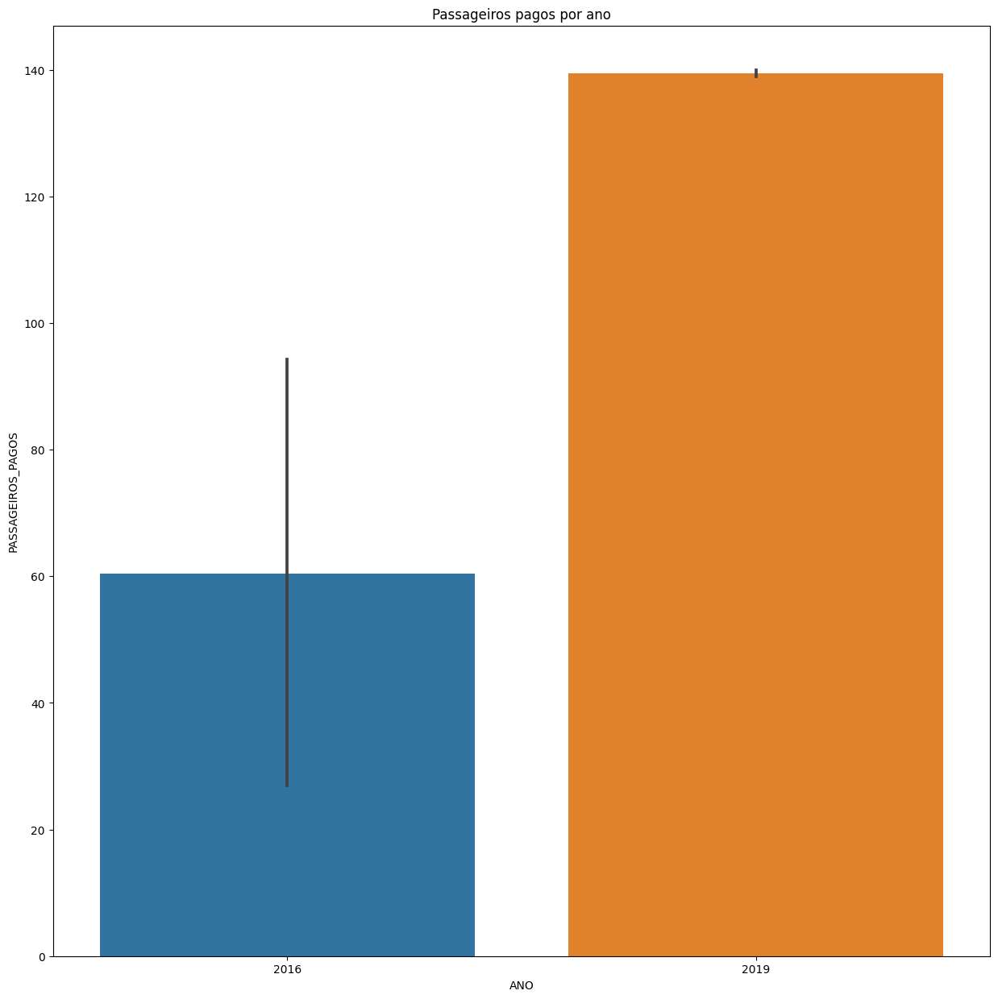





POLET AIR CARGO


count    5.0
mean     0.0
std      0.0
min      0.0
25%      0.0
50%      0.0
75%      0.0
max      0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


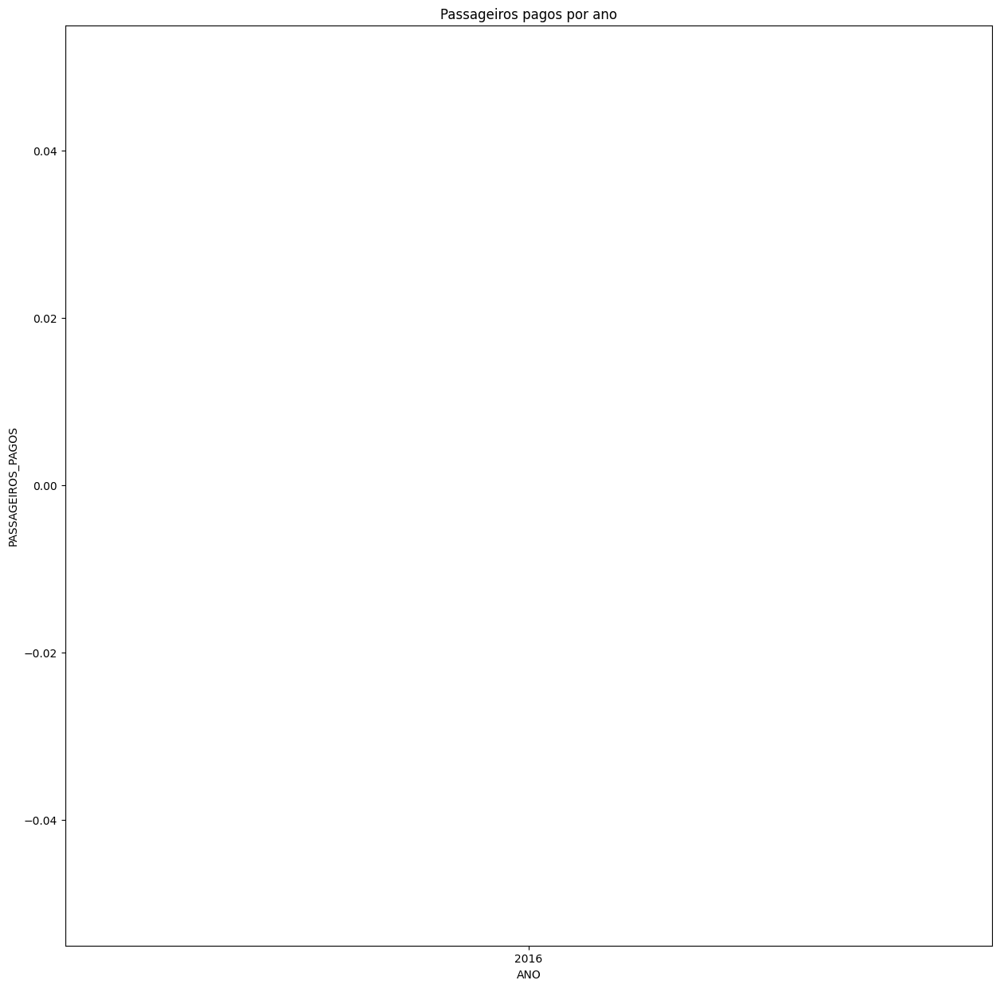





QANTAS AIRWAYS


count    8.0
mean     0.0
std      0.0
min      0.0
25%      0.0
50%      0.0
75%      0.0
max      0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


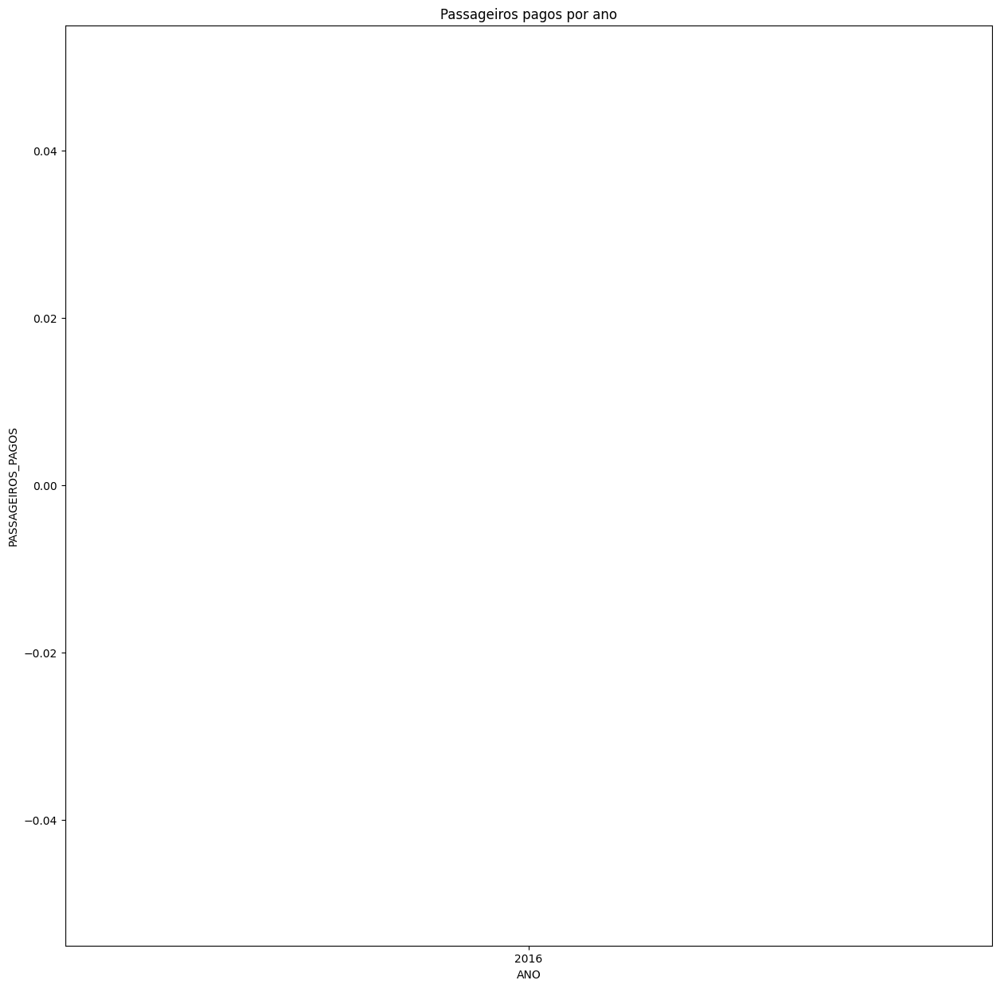





ROTANA JET AVIATION L.L.C


count     8.000000
mean     10.250000
std      12.162589
min       0.000000
25%       0.000000
50%       6.000000
75%      18.000000
max      30.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


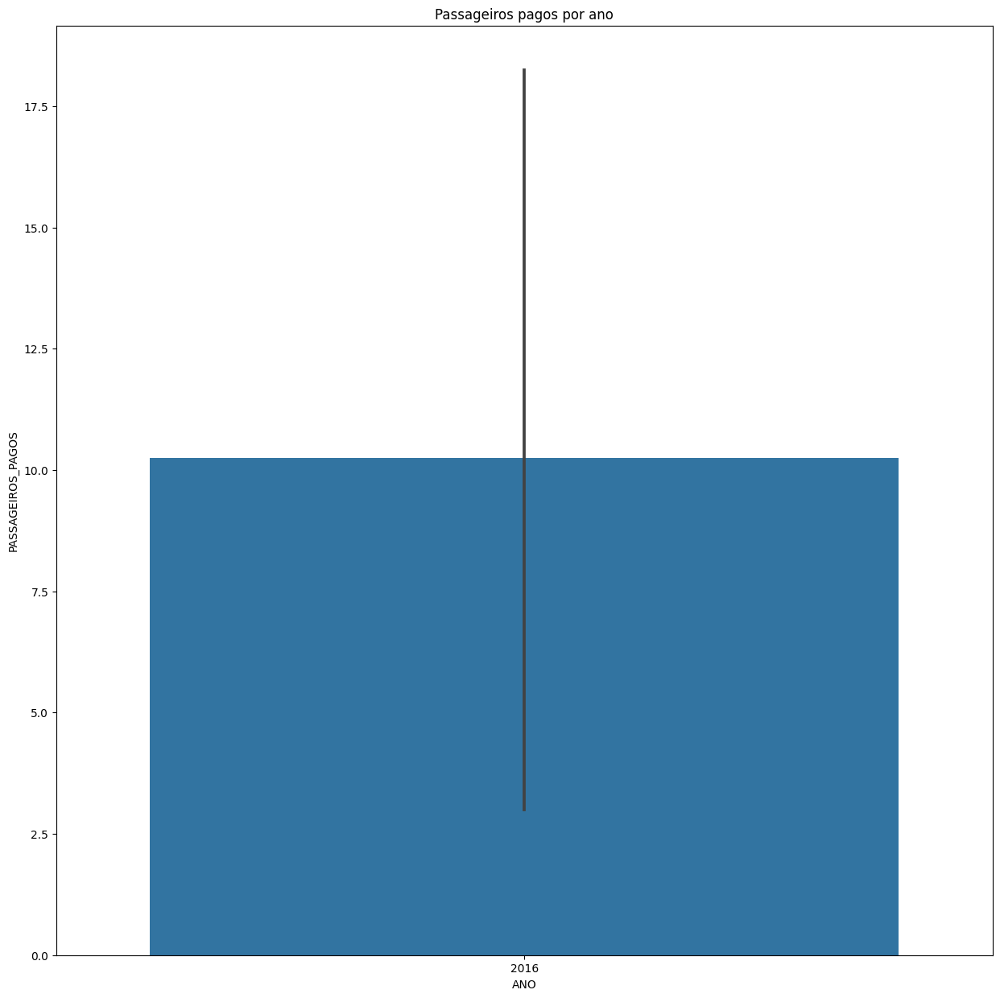





STERNA LINHAS AÉREAS LTDA.


count    84.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


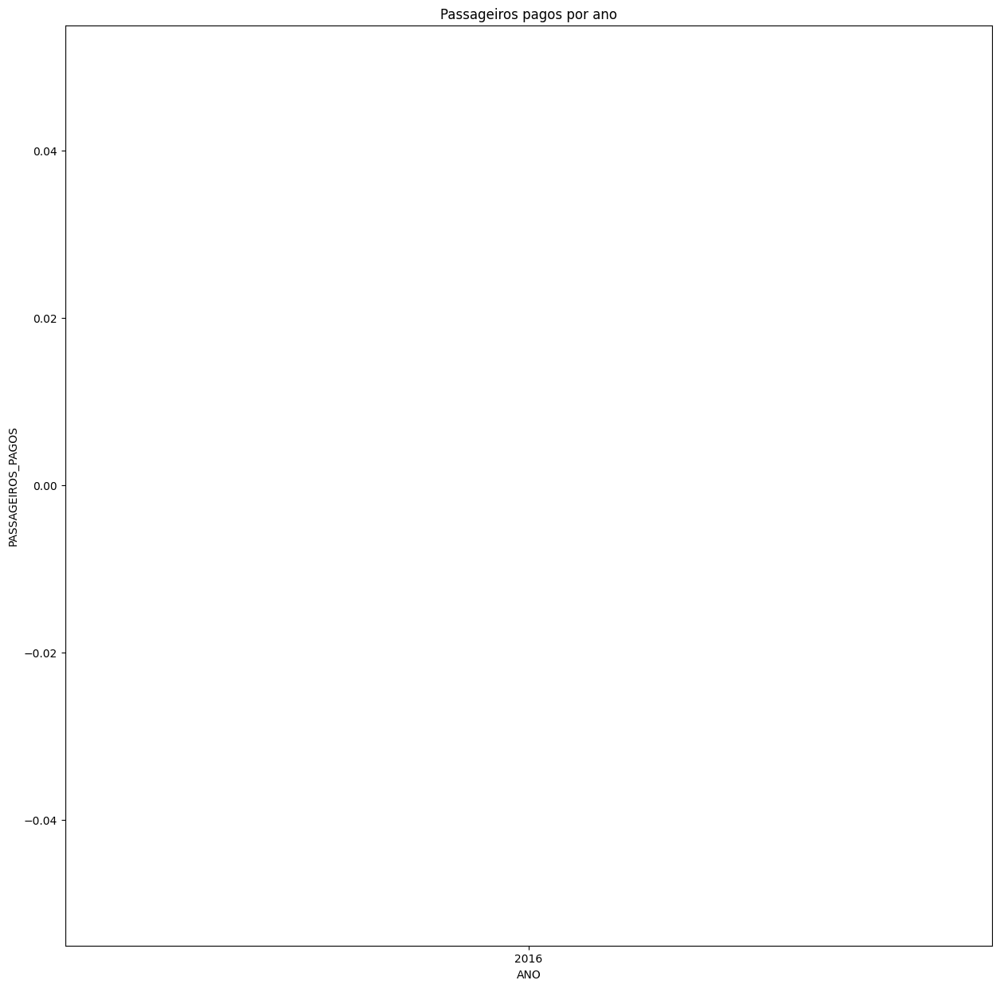





SMARTWINGS A.S.


count     34.000000
mean      12.205882
std       33.589121
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max      144.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


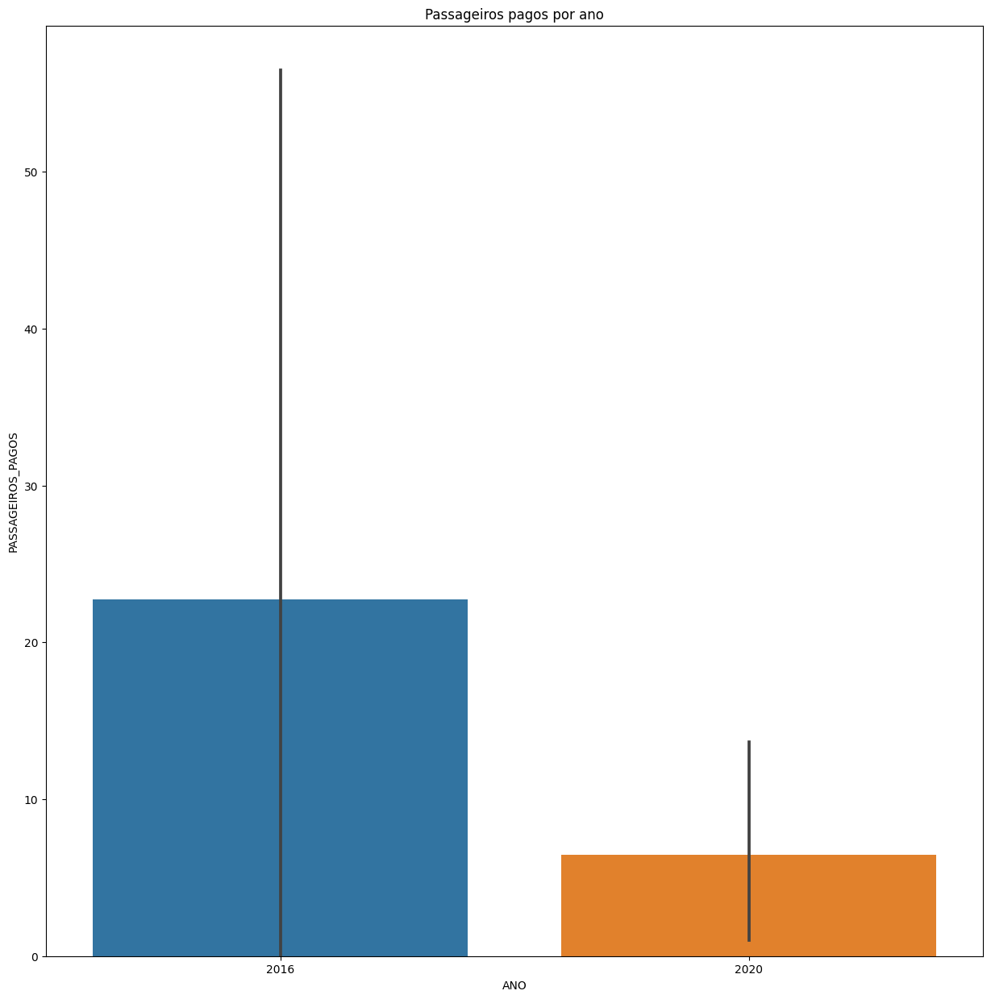





UZBEKISTAN AIRWAYS


count     15.000000
mean      15.666667
std       43.585166
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max      154.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


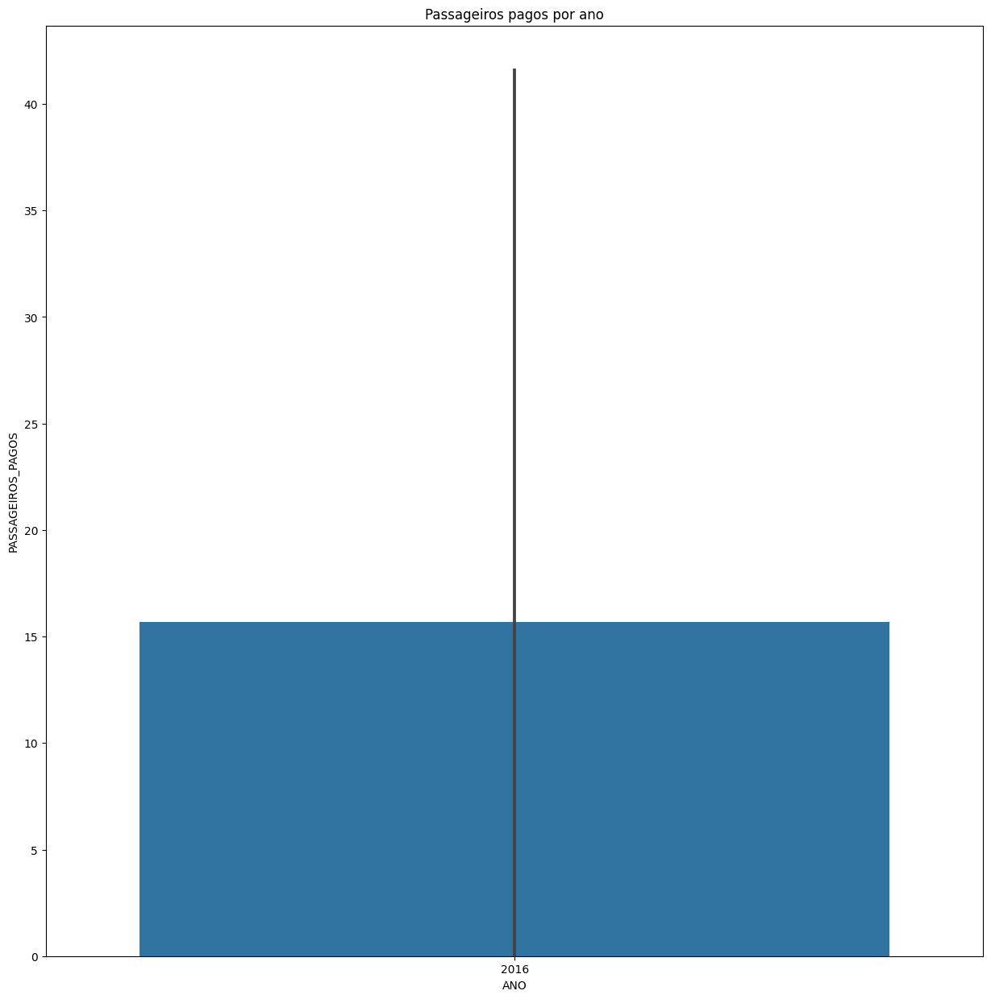

/usr/local/lib/python3.10/dist-packages/seaborn/algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))






TAG AVIATION UK


count    141.000000
mean      10.226950
std       21.712856
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max      110.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


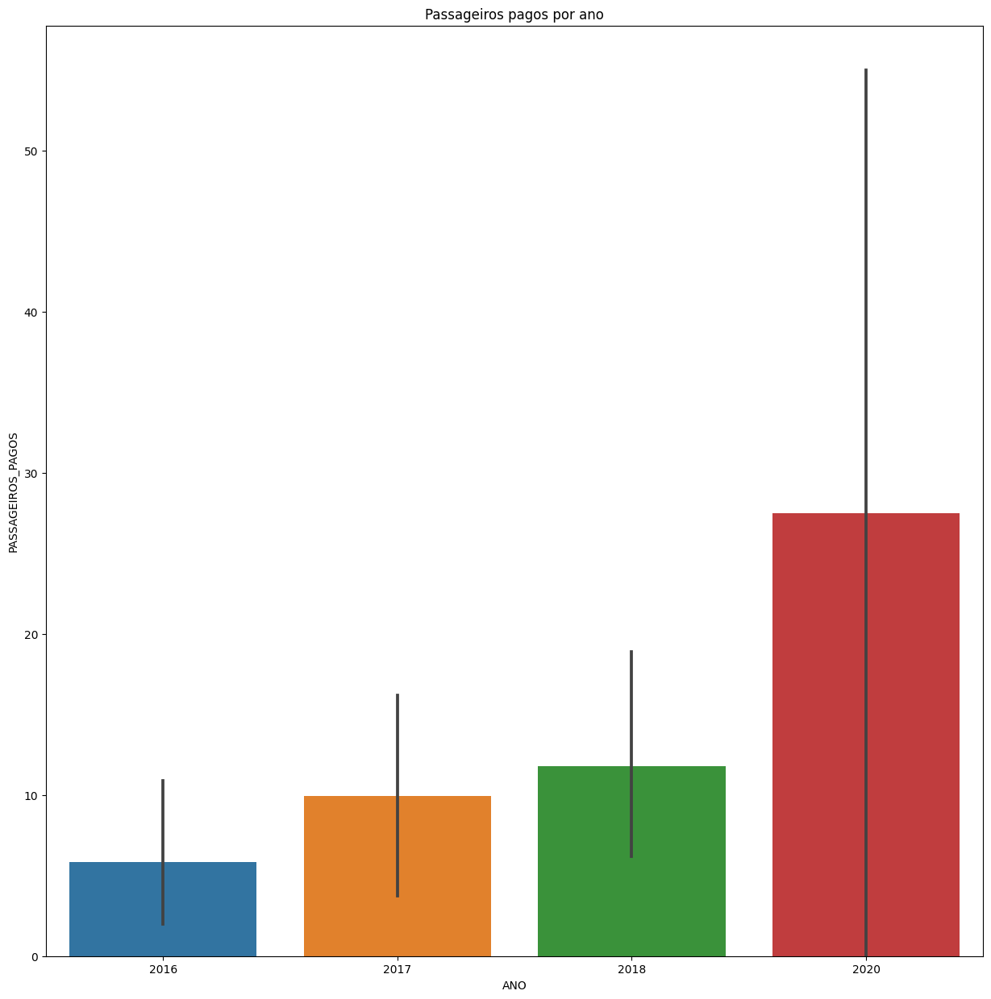





AIR X CHARTER LTD


count     30.000000
mean      25.266667
std       40.516436
min        0.000000
25%        0.000000
50%        0.000000
75%       54.500000
max      100.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


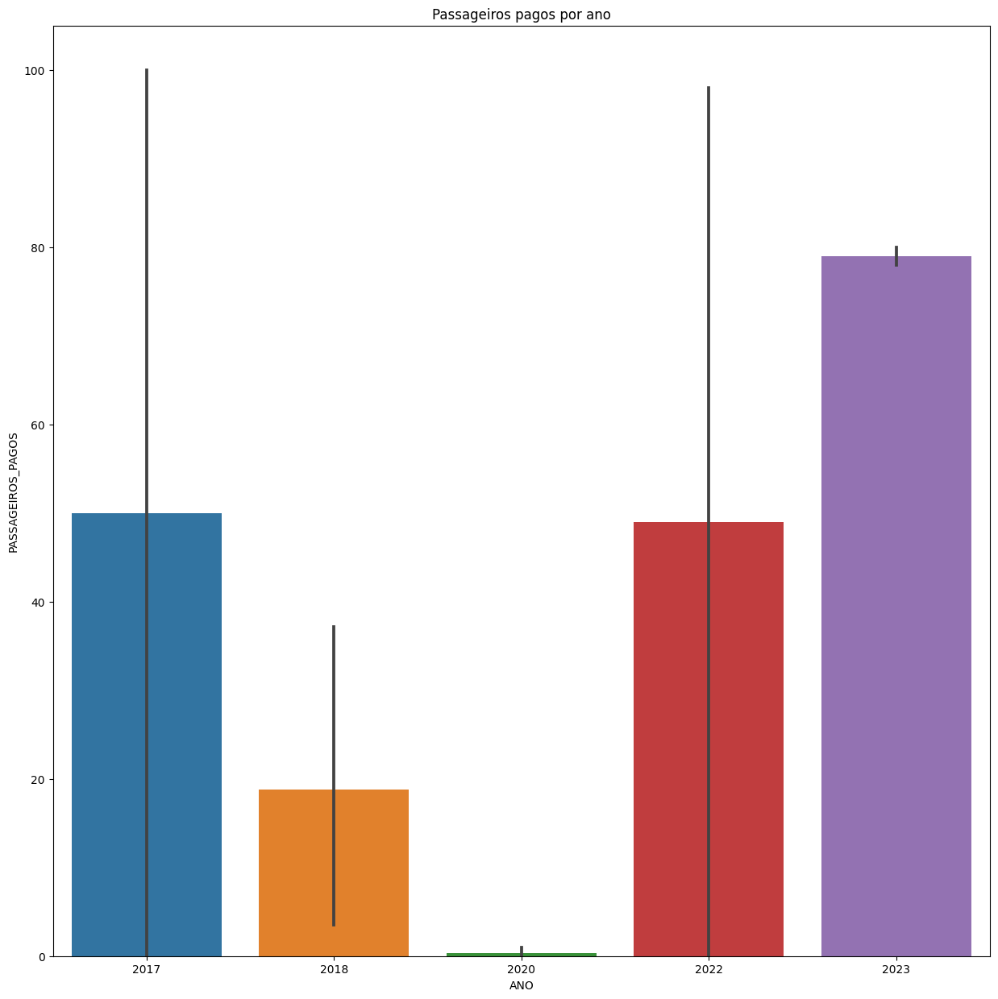





SILK WAY WEST AIRLINES


count    21.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


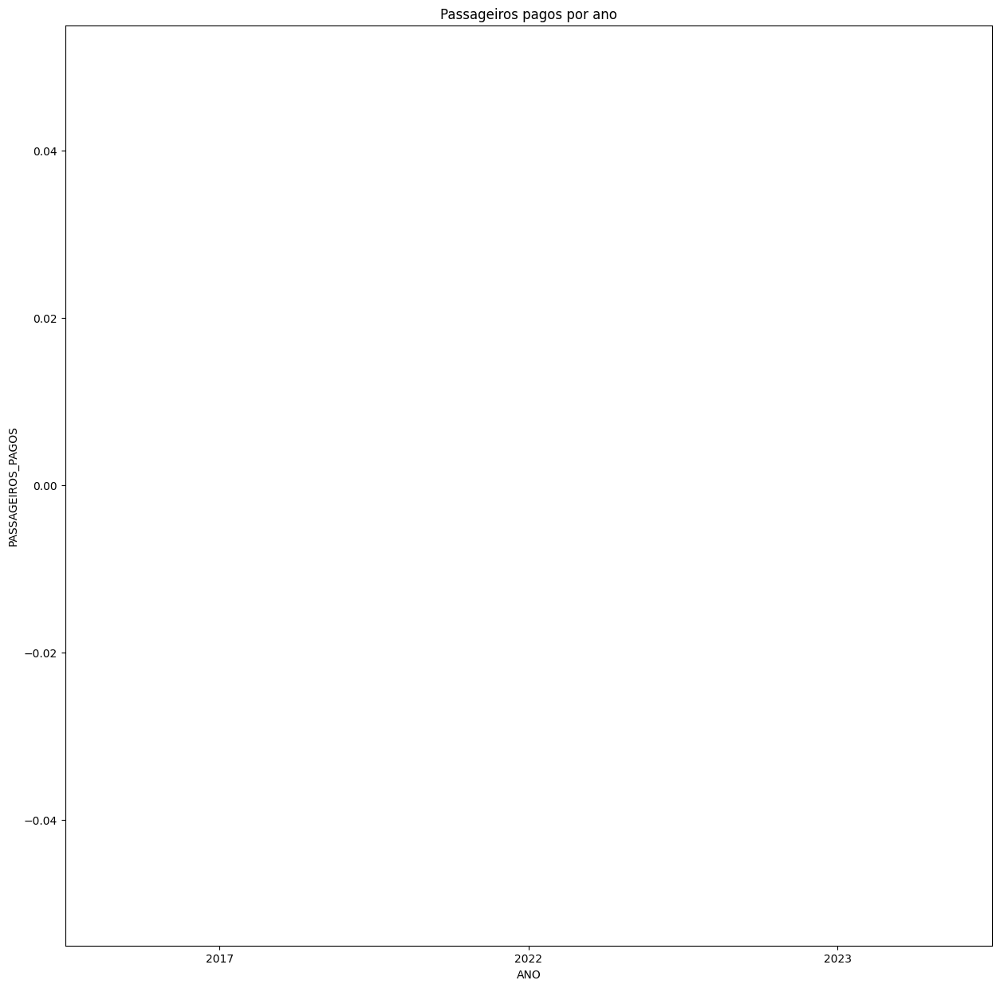





21 AIR, LLC


count    81.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


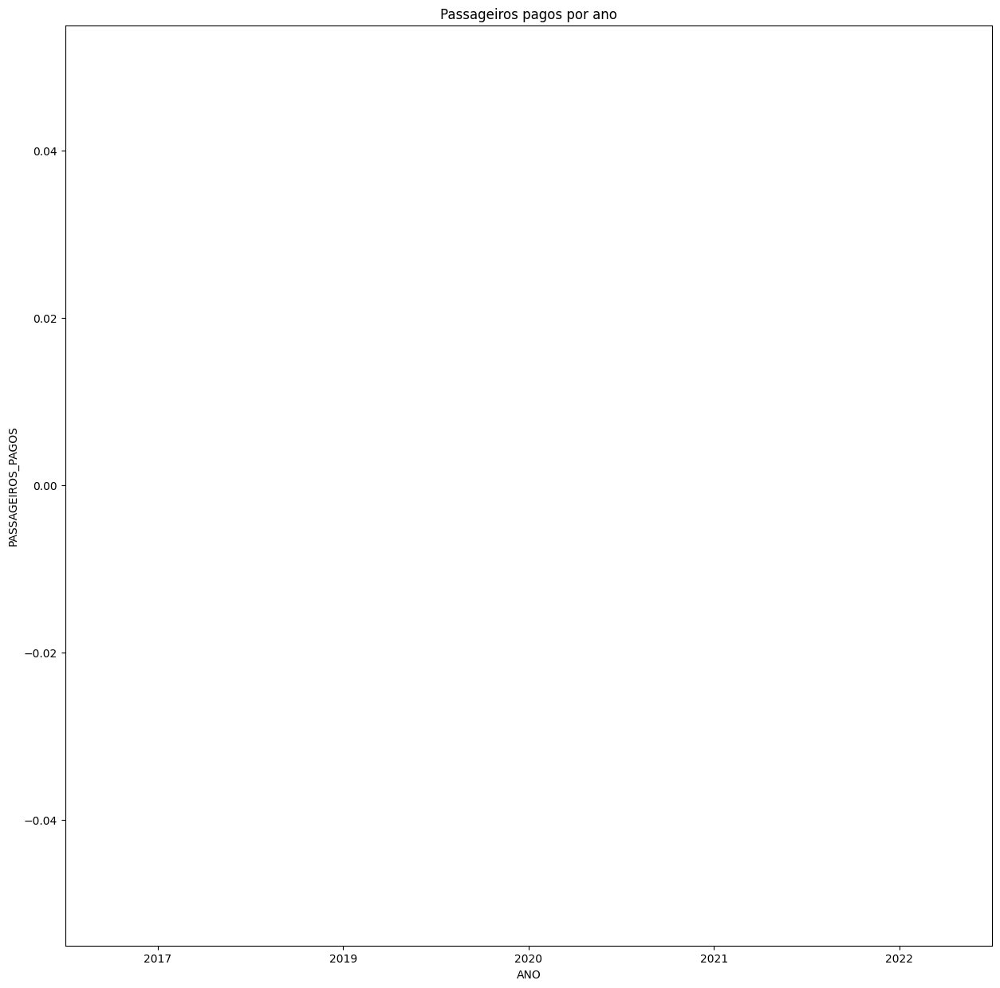





AEROVIAS DAP S/A.


count     24.000000
mean      46.833333
std       61.858651
min        0.000000
25%        0.000000
50%        4.500000
75%       91.250000
max      236.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


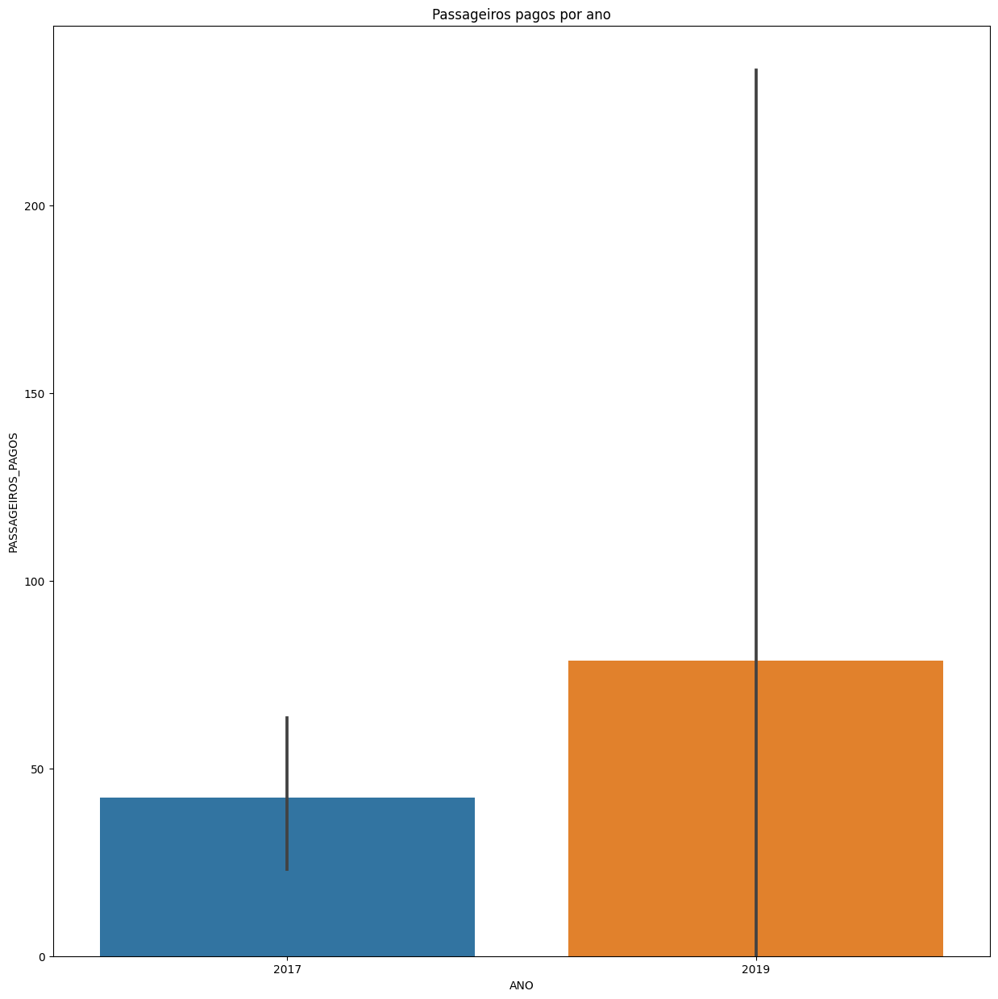





AEROLINEAS DAMOJH S.A.


count      3.000000
mean      66.666667
std       57.735027
min        0.000000
25%       50.000000
50%      100.000000
75%      100.000000
max      100.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


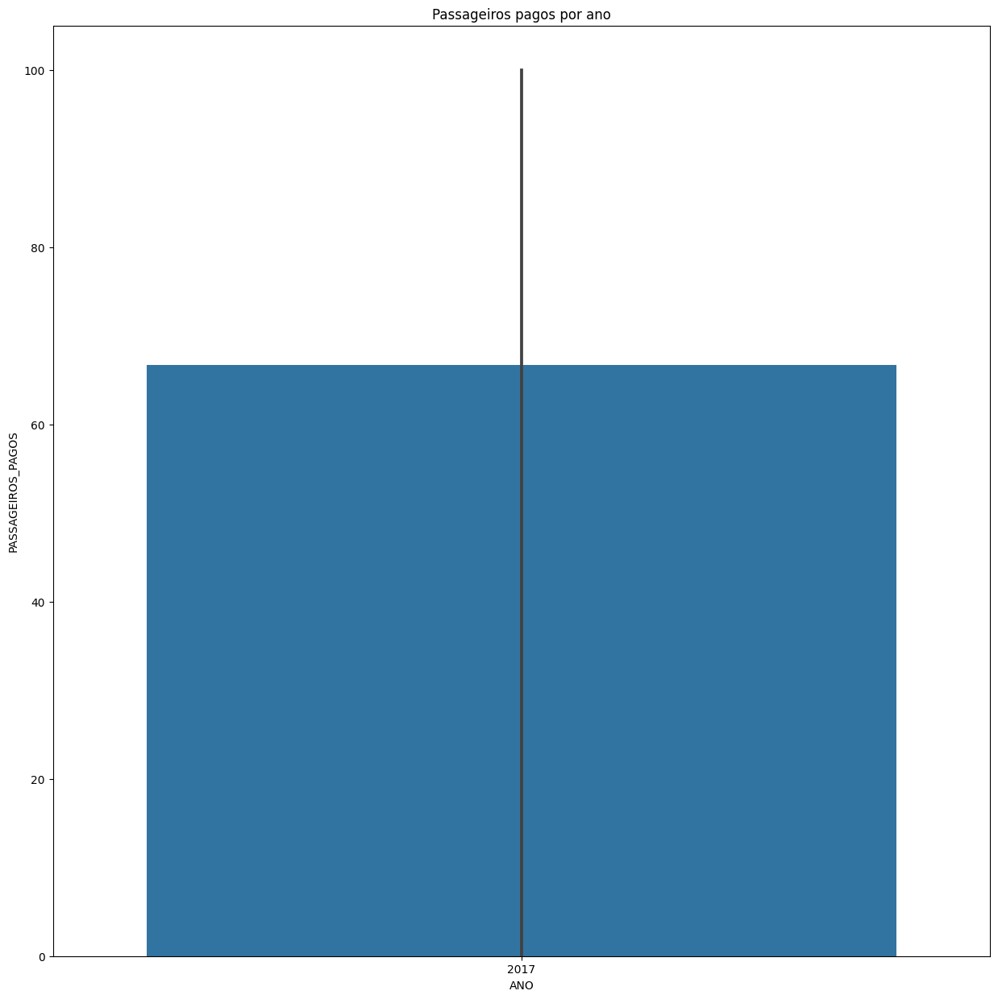





ASL AIRLINES FRANCE S. A.


count    38.000000
mean     22.473684
std      37.594376
min       0.000000
25%       0.000000
50%       0.000000
75%      51.000000
max      99.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


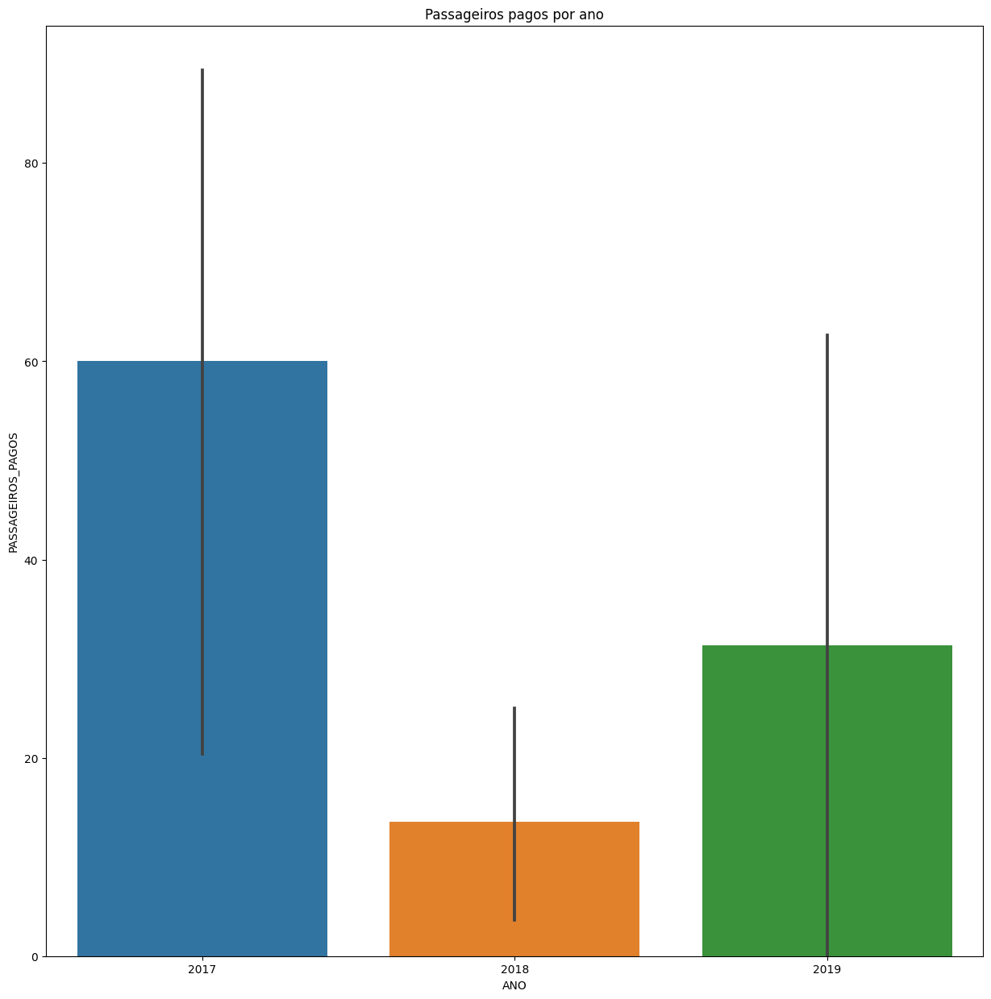





HILLWOOD AIRWAYS


count    16.000000
mean     11.937500
std      12.829491
min       0.000000
25%       0.000000
50%       6.000000
75%      26.000000
max      28.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


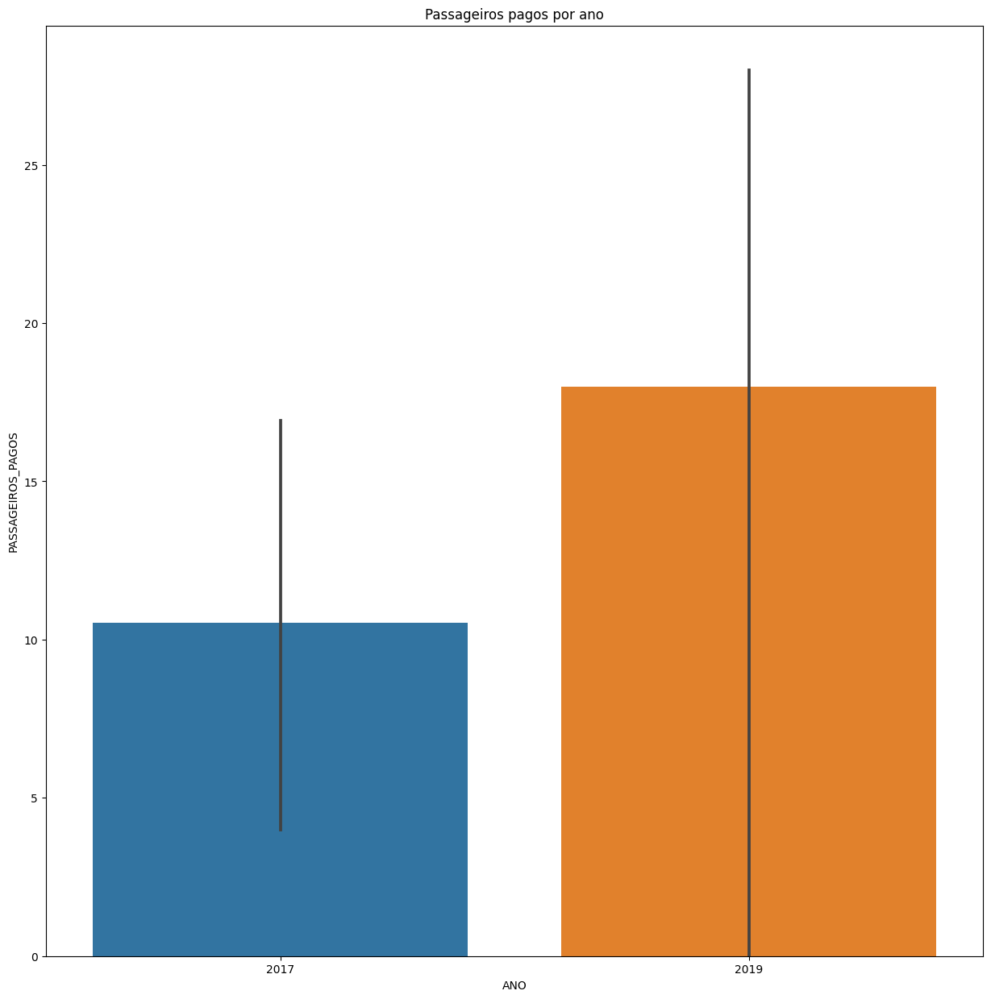





LOT POLISH AIRLINES


count     24.000000
mean     319.125000
std      306.413945
min        0.000000
25%        0.000000
50%      245.500000
75%      691.500000
max      750.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


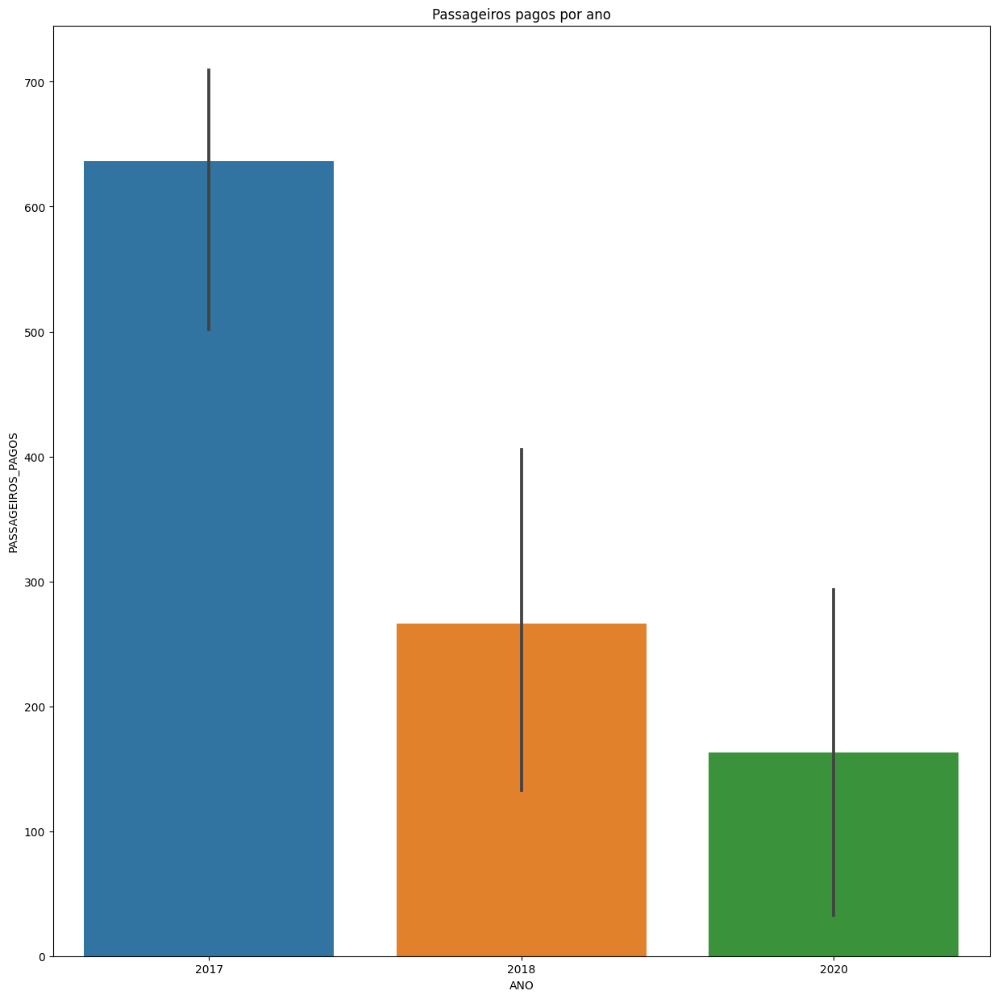





AVIAN LINEAS AÉREAS S/A


count     12.000000
mean     209.916667
std      190.912383
min        0.000000
25%       65.000000
50%      152.500000
75%      413.750000
max      482.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


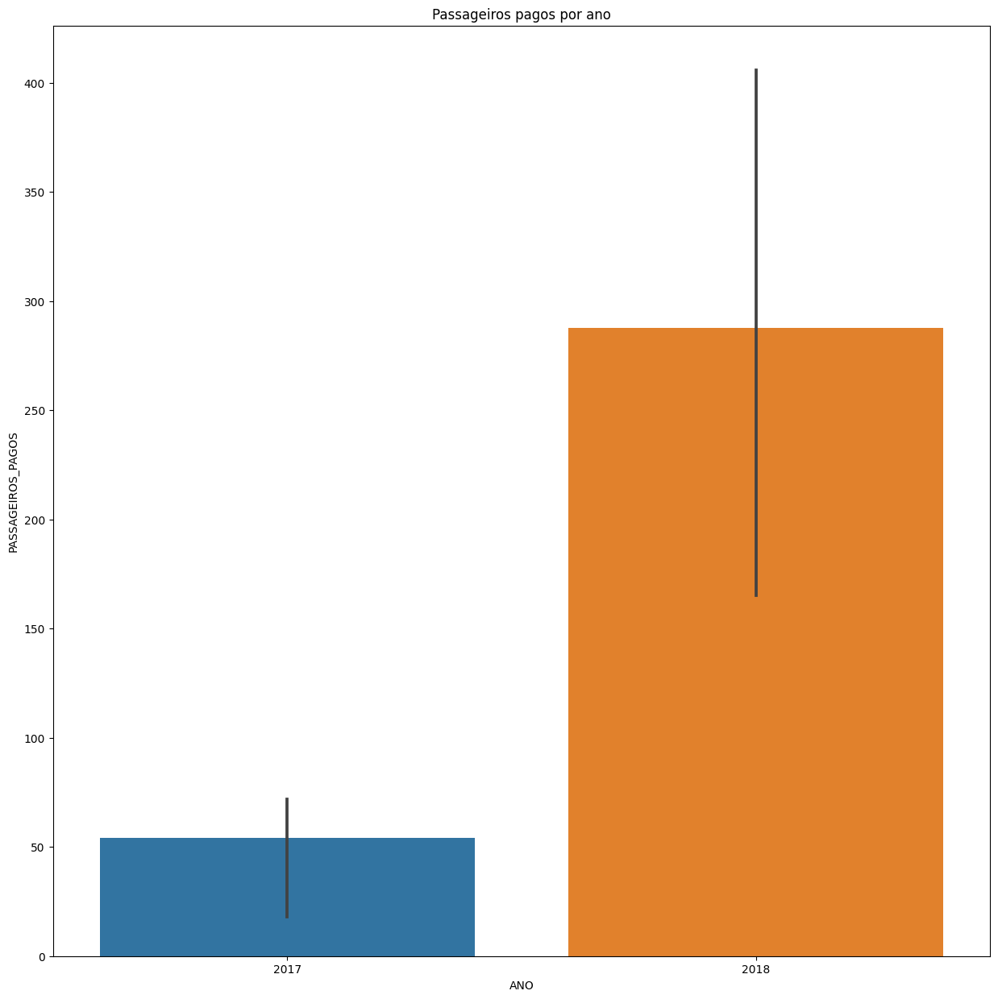





MALETH-AERO AOC LTD


count    40.000000
mean     11.700000
std      22.158173
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max      60.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


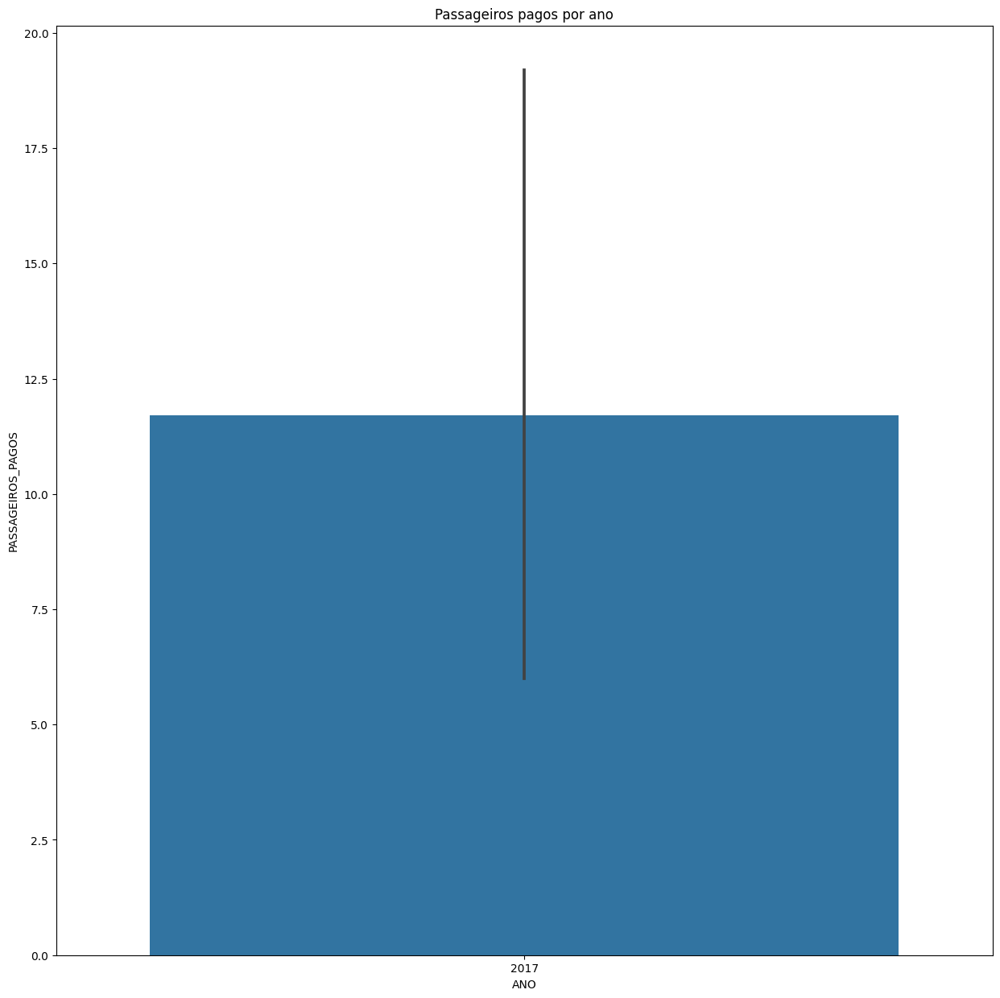





MODERN TRANSPORTE AEREO DE CARGA S.A


count    1906.0
mean        0.0
std         0.0
min         0.0
25%         0.0
50%         0.0
75%         0.0
max         0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


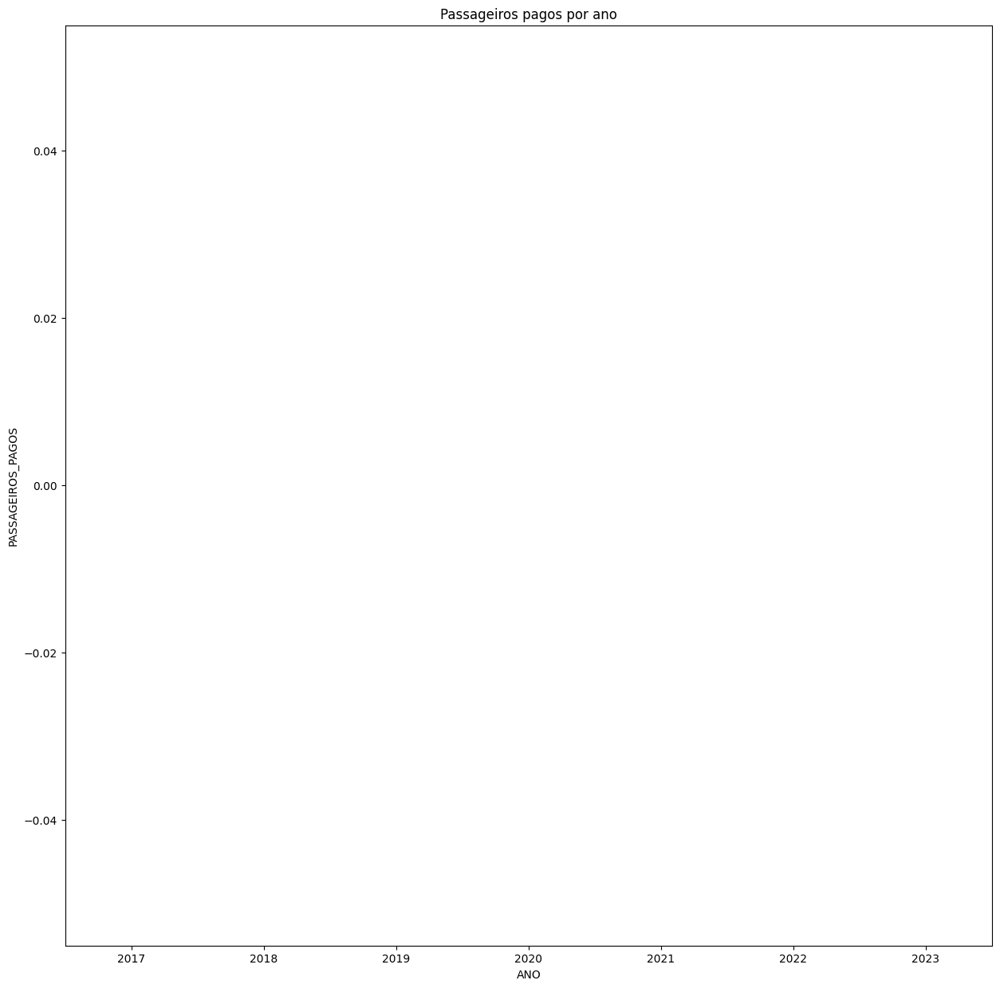





FLYEST LINEAS AÉREAS (EX SOL S.A. LINEAS AEREAS)


count    130.000000
mean      26.138462
std       28.674802
min        0.000000
25%        0.000000
50%       30.000000
75%       46.750000
max      147.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


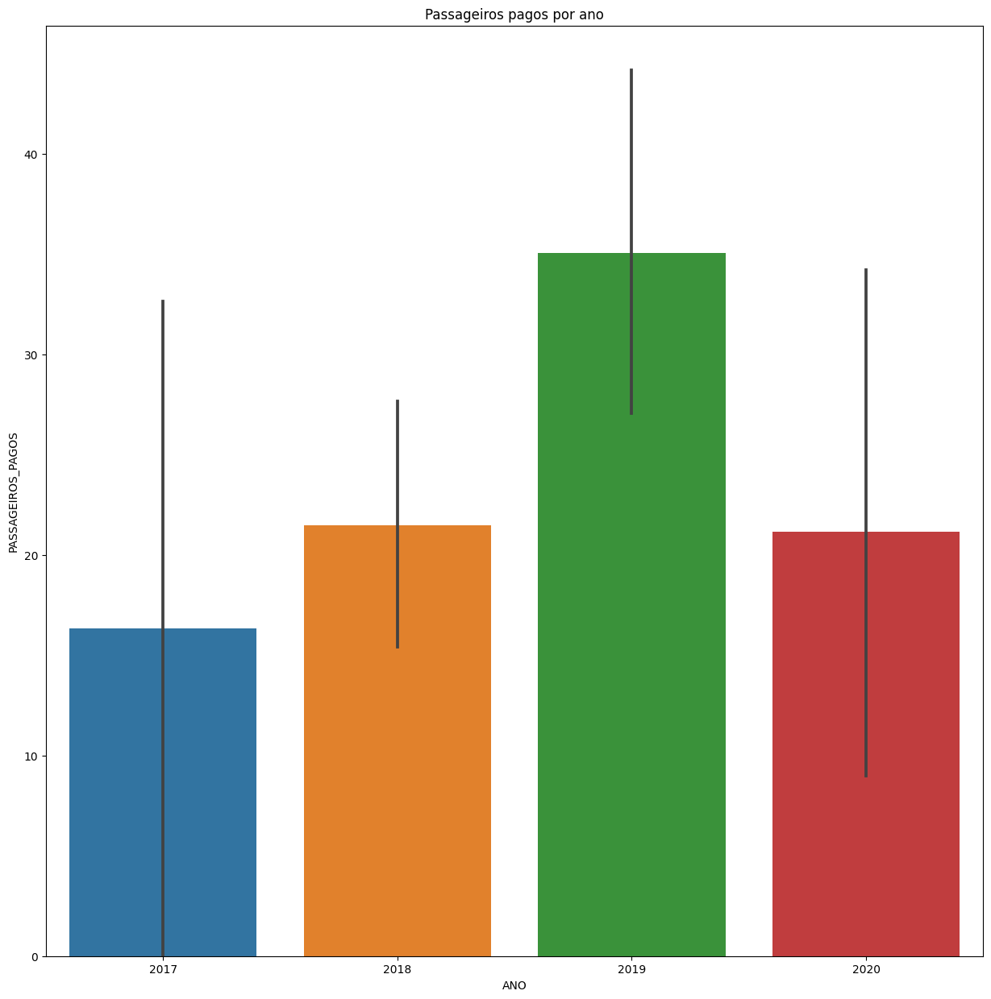





SKY AIRLINES S.A.


count     307.000000
mean     2296.364821
std      2003.582975
min         0.000000
25%       360.000000
50%      2012.000000
75%      3657.000000
max      9028.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


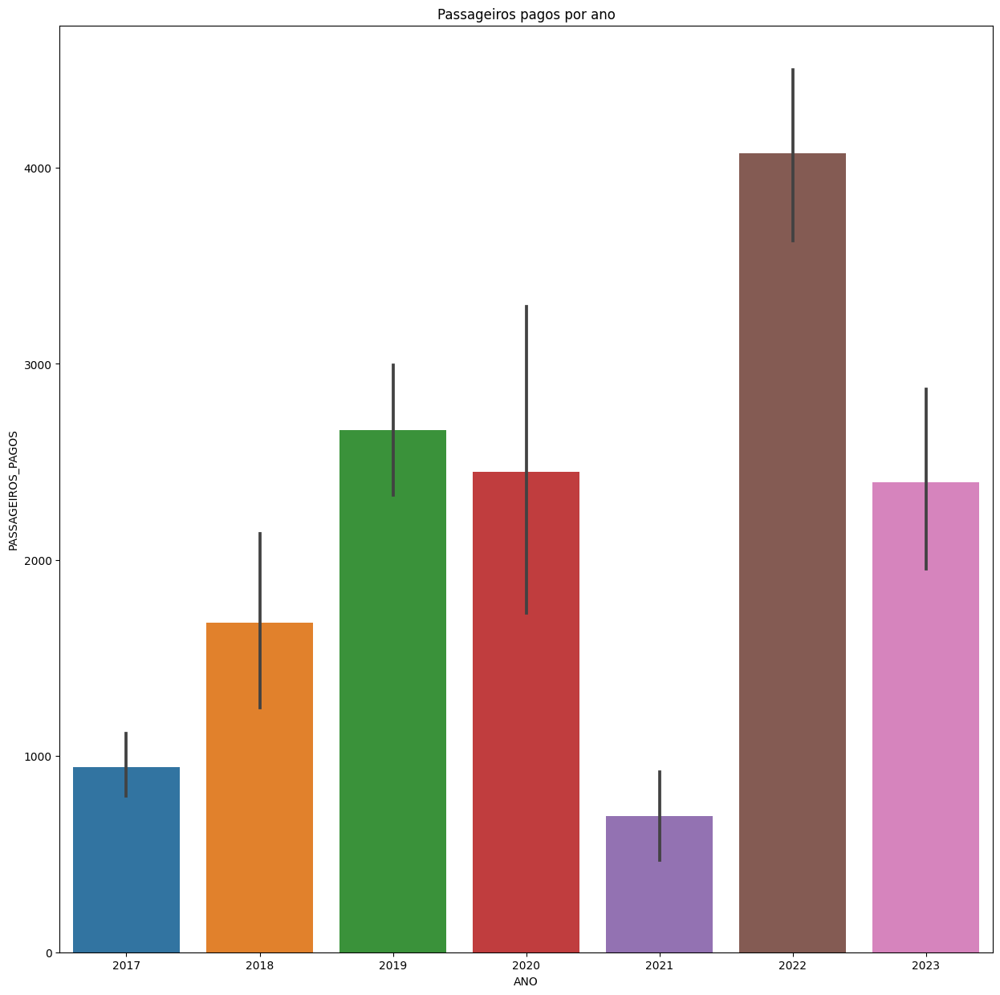





TRANSCARGA INTERNATIONAL AIRWAYS C.A.


count    166.0
mean       0.0
std        0.0
min        0.0
25%        0.0
50%        0.0
75%        0.0
max        0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


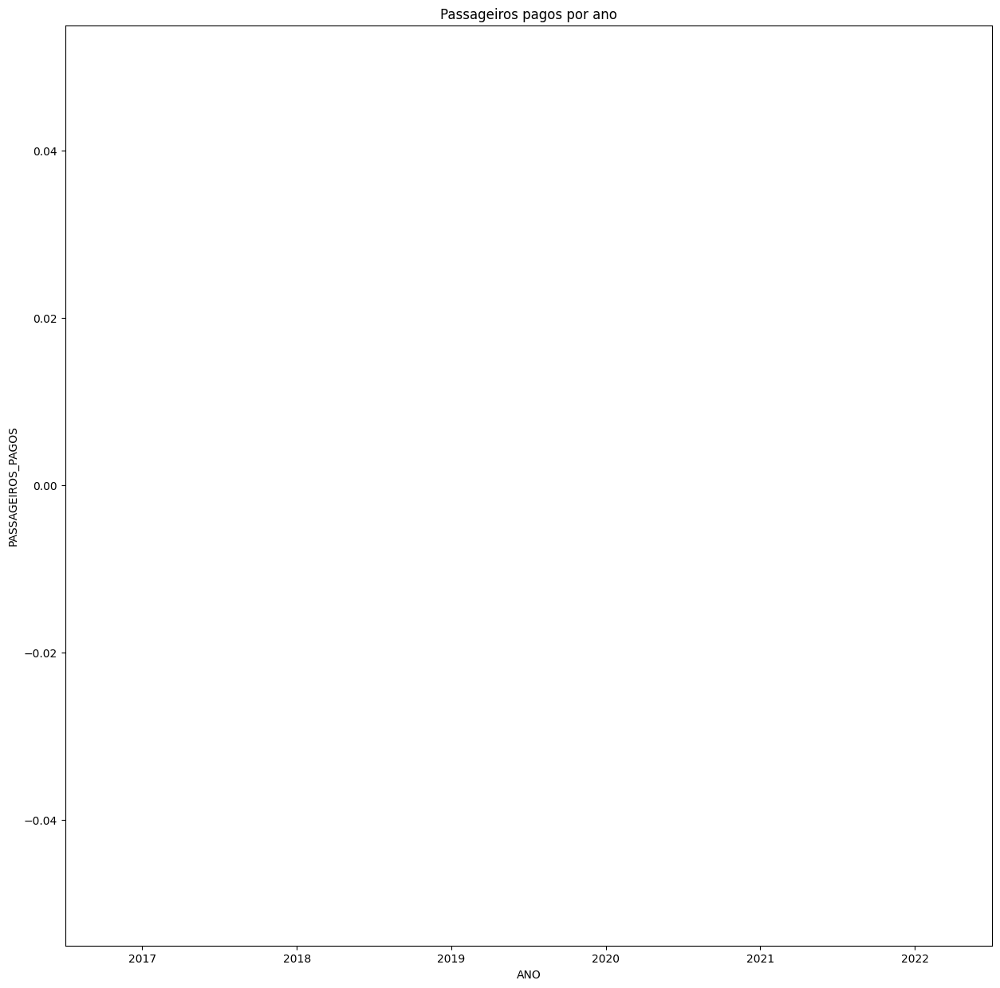





AIGLE AZUR


count      30.000000
mean     3339.266667
std      1454.966925
min       157.000000
25%      2937.250000
50%      3624.500000
75%      4235.500000
max      6012.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


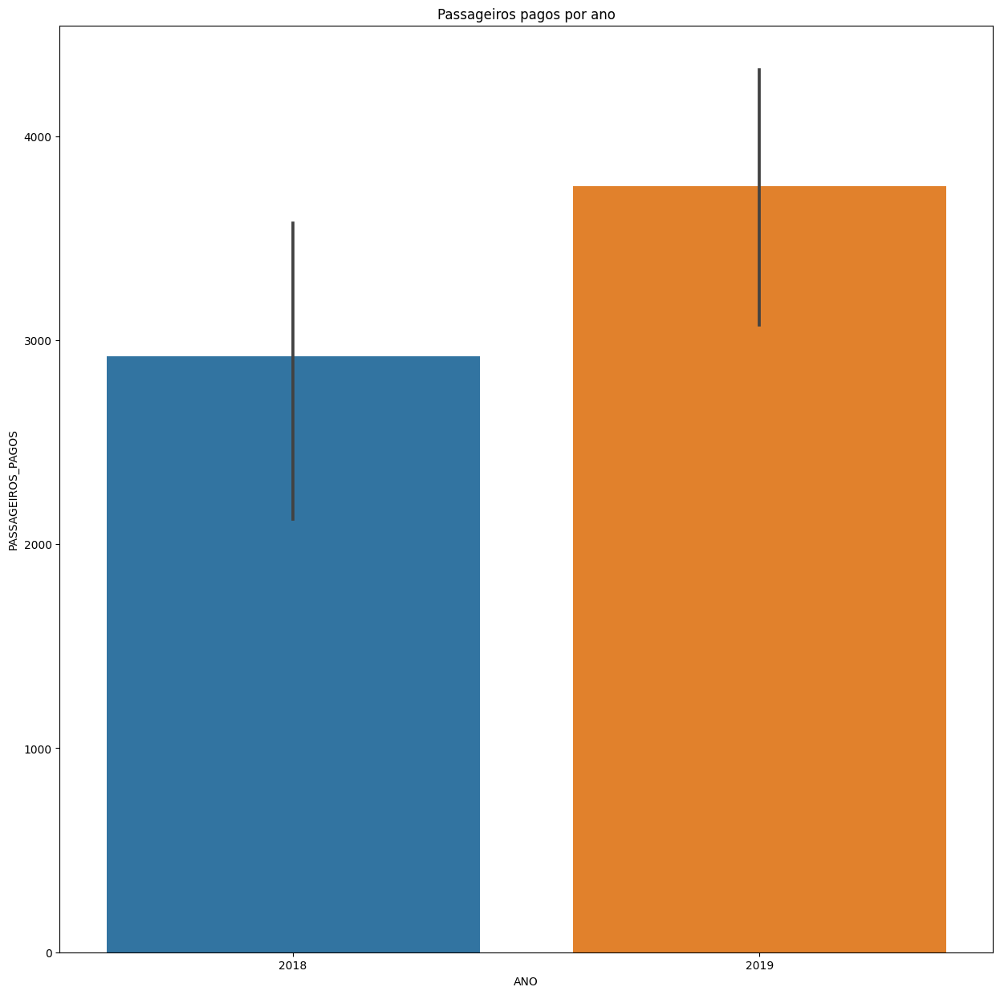





AZUL CONECTA LTDA. (EX TWO TAXI AEREO LTDA)


count    7769.000000
mean       23.751319
std        49.351405
min         0.000000
25%         0.000000
50%         2.000000
75%        27.000000
max       810.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


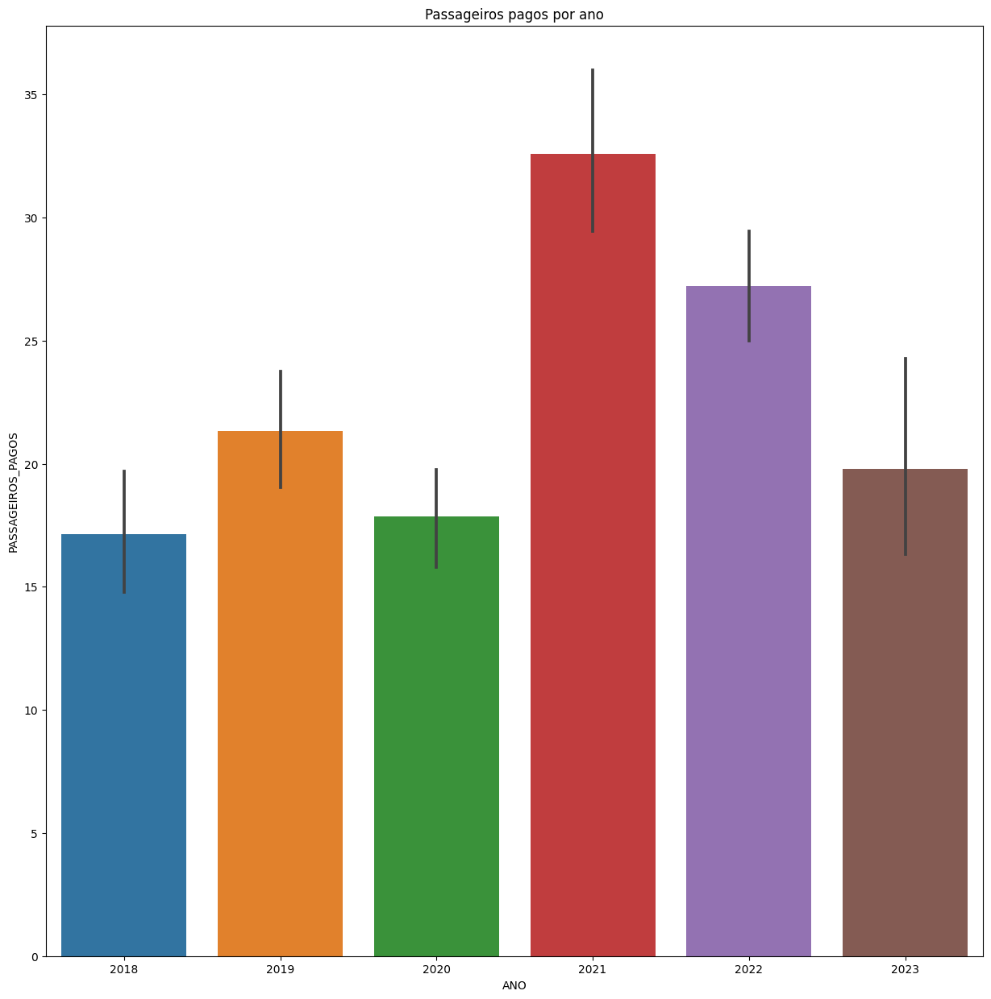





AMERIJET INTERNACIONAL INC.


count    23.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


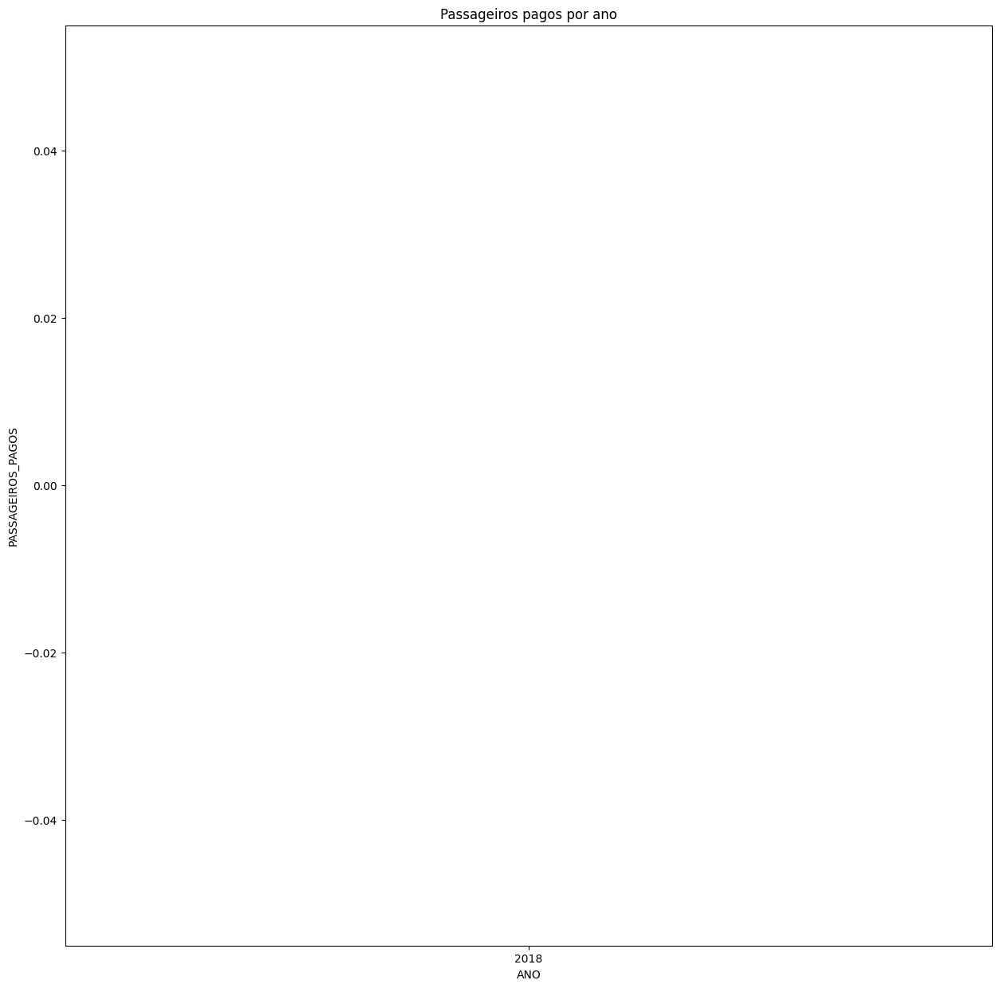





CRISTALUX S.A (AMASZONAS URUGUAY)


count     21.000000
mean     296.238095
std      232.368867
min        0.000000
25%       50.000000
50%      336.000000
75%      418.000000
max      791.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


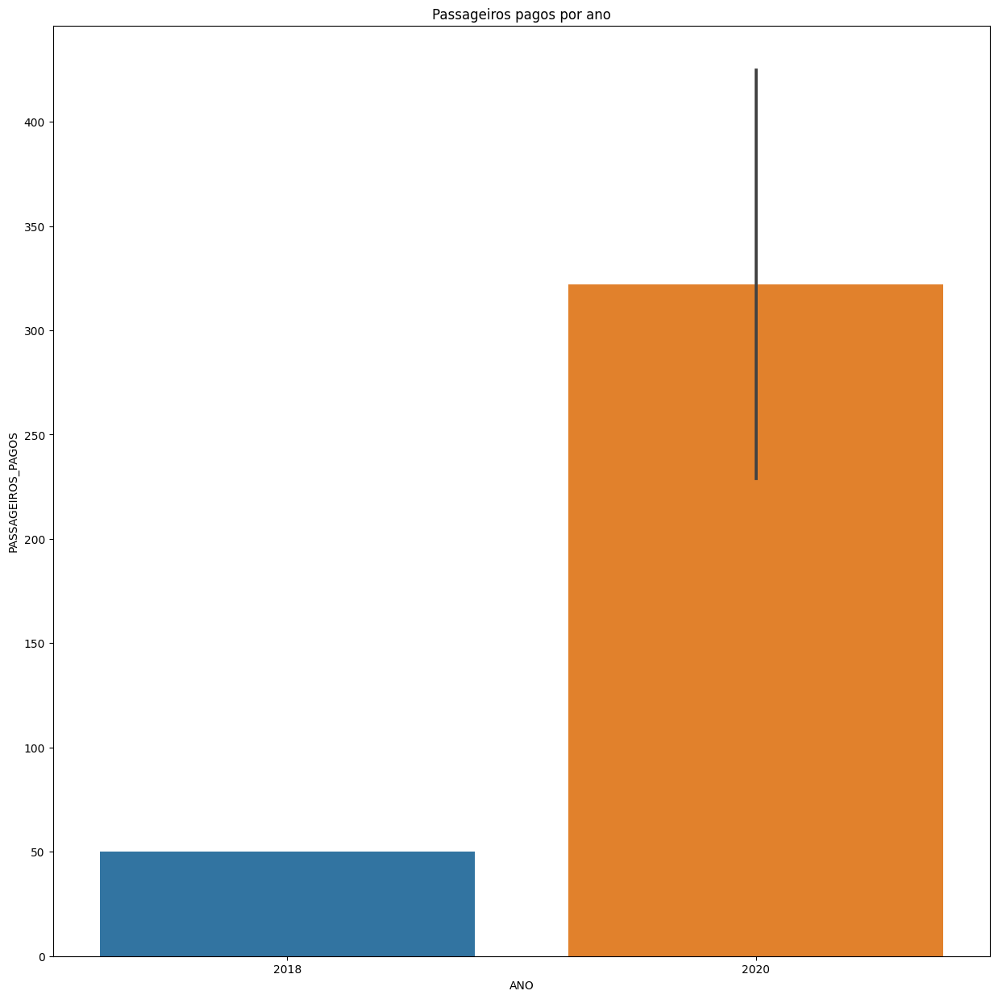





DIVI DIVI AIR


count      8.000000
mean     127.875000
std       78.702764
min       32.000000
25%       54.250000
50%      135.500000
75%      193.250000
max      228.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


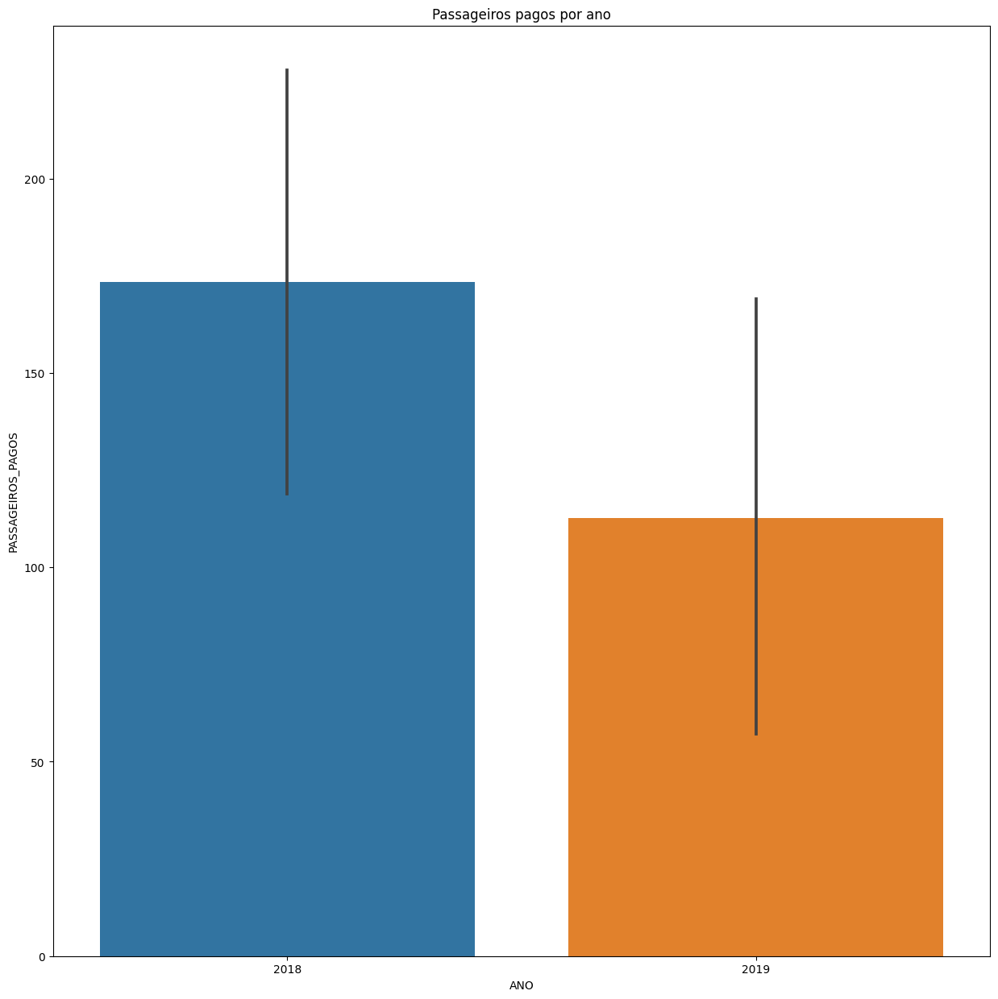





PLUS ULTRA LÍNEAS AÉREAS S/A


count     15.000000
mean      48.000000
std       91.881912
min        0.000000
25%        0.000000
50%        0.000000
75%       59.500000
max      265.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


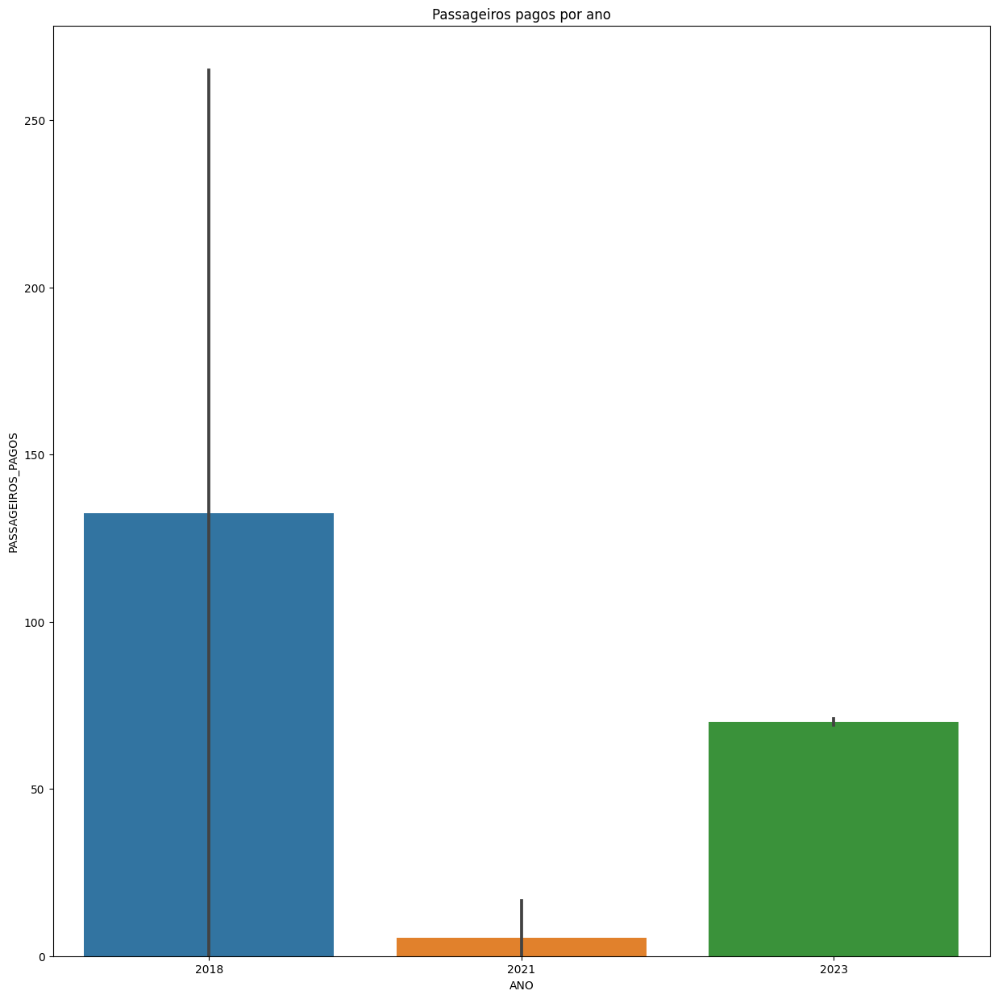





PRIVILEGE STYLE S.A.


count     36.000000
mean      87.861111
std      103.359056
min        0.000000
25%        0.000000
50%        0.000000
75%      194.250000
max      244.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


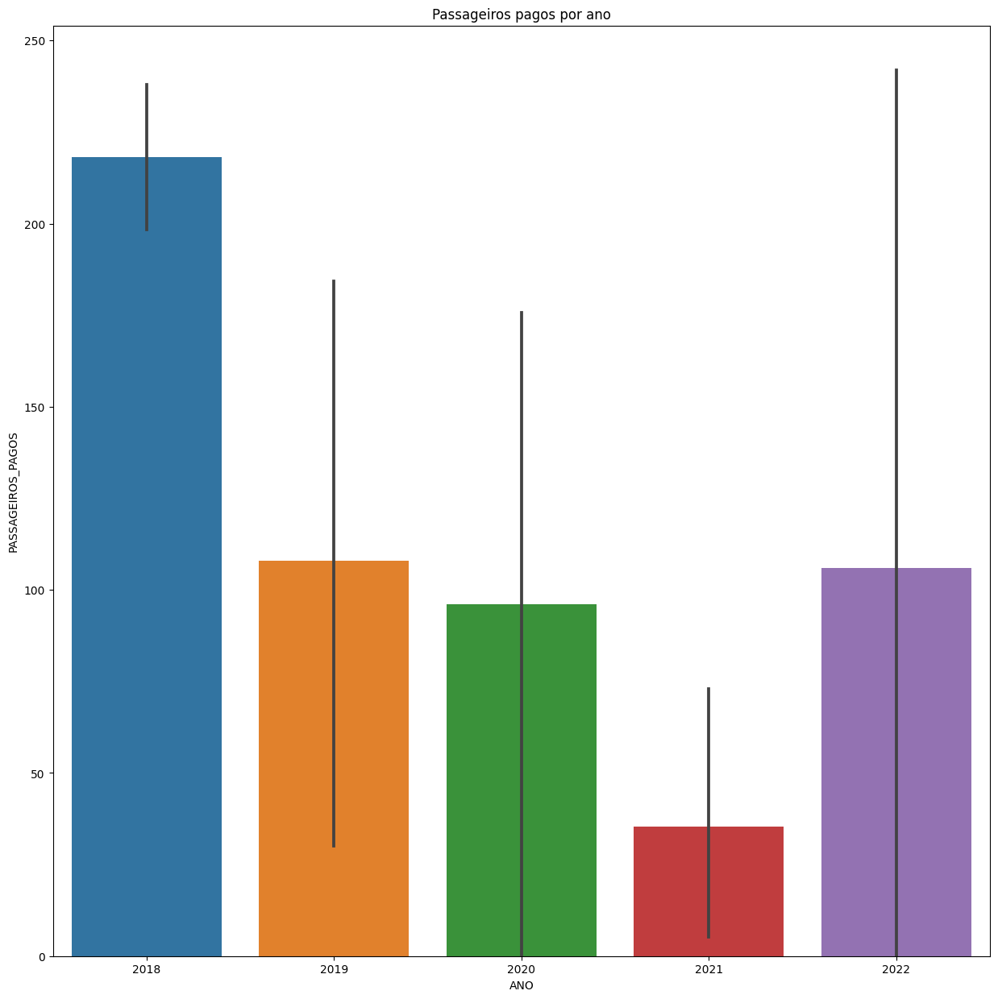





RUBYSTAR MIKHALAP Y.I.


count    35.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


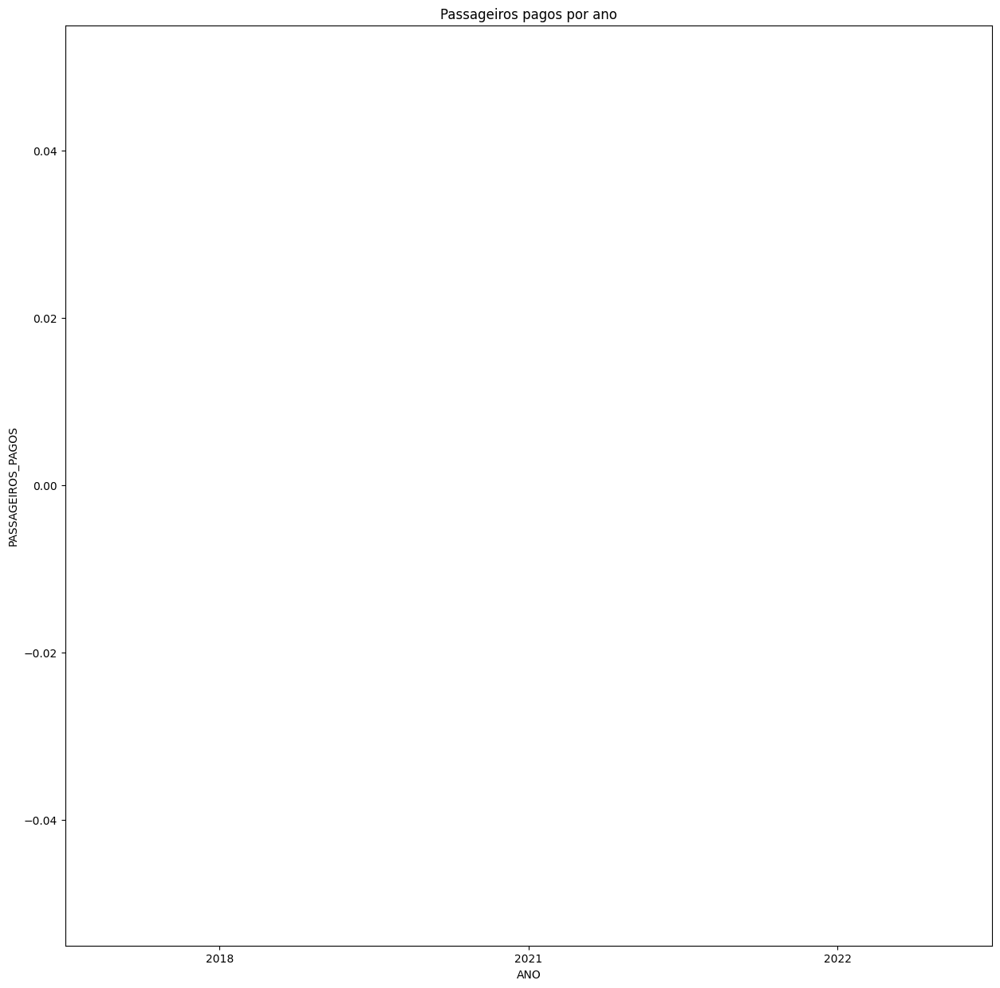





AIR BELGIUM S.A.


count     31.000000
mean       9.516129
std       36.837364
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max      149.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


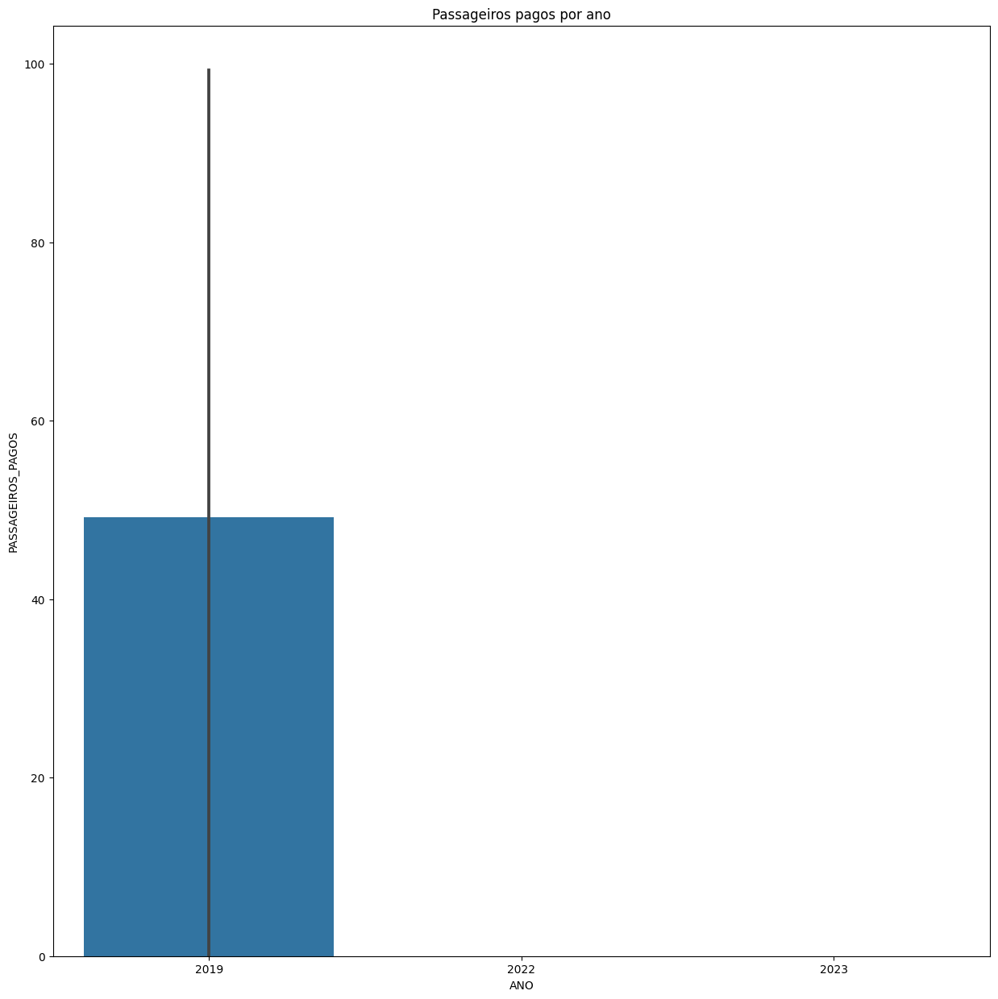





AEROLÍNEA DEL CARIBE  S.A. - AERCARIBE


count    13.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


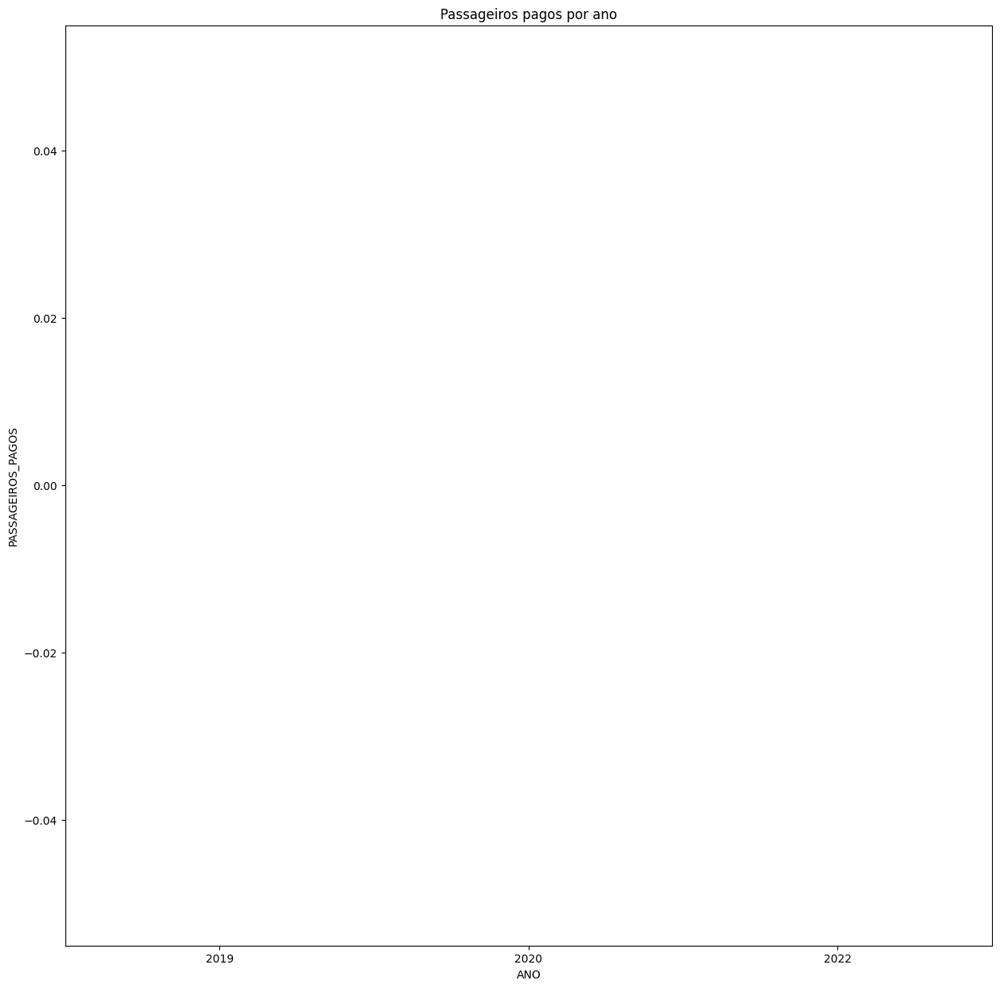





AMERICAN JET S.A.


count    33.000000
mean     23.878788
std      22.680881
min       0.000000
25%       0.000000
50%      24.000000
75%      46.000000
max      68.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


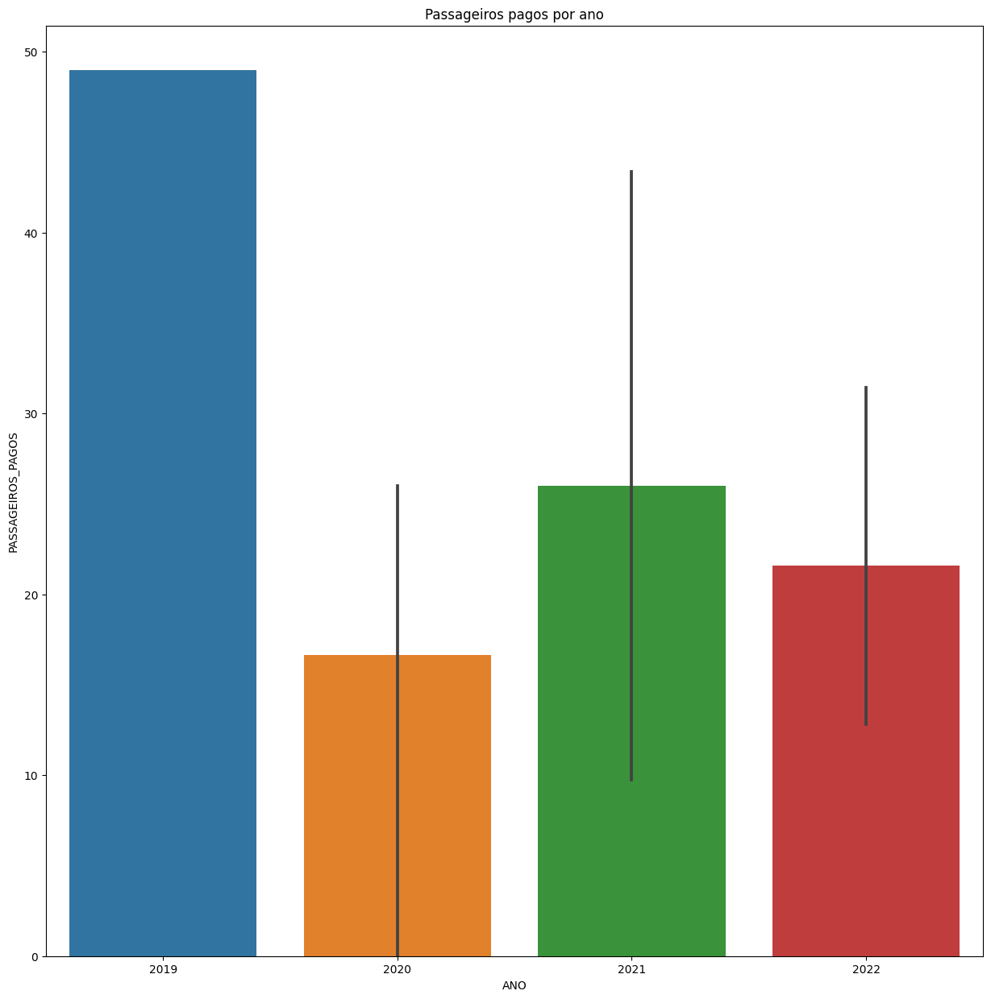





AIREXPLORE S.R.O.


count     37.000000
mean      33.729730
std       49.356216
min        0.000000
25%        0.000000
50%        0.000000
75%      104.000000
max      104.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


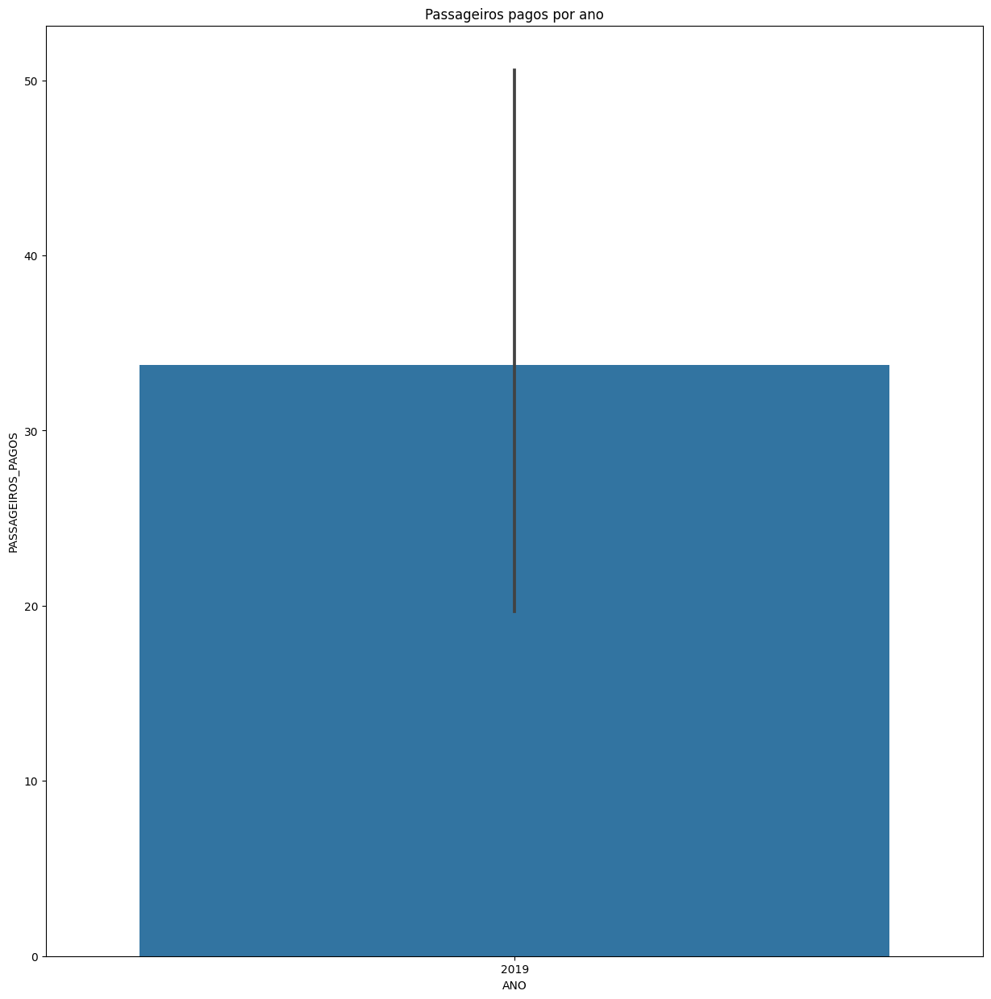





CARGOLOGICAIR LIMITED


count    4.0
mean     0.0
std      0.0
min      0.0
25%      0.0
50%      0.0
75%      0.0
max      0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


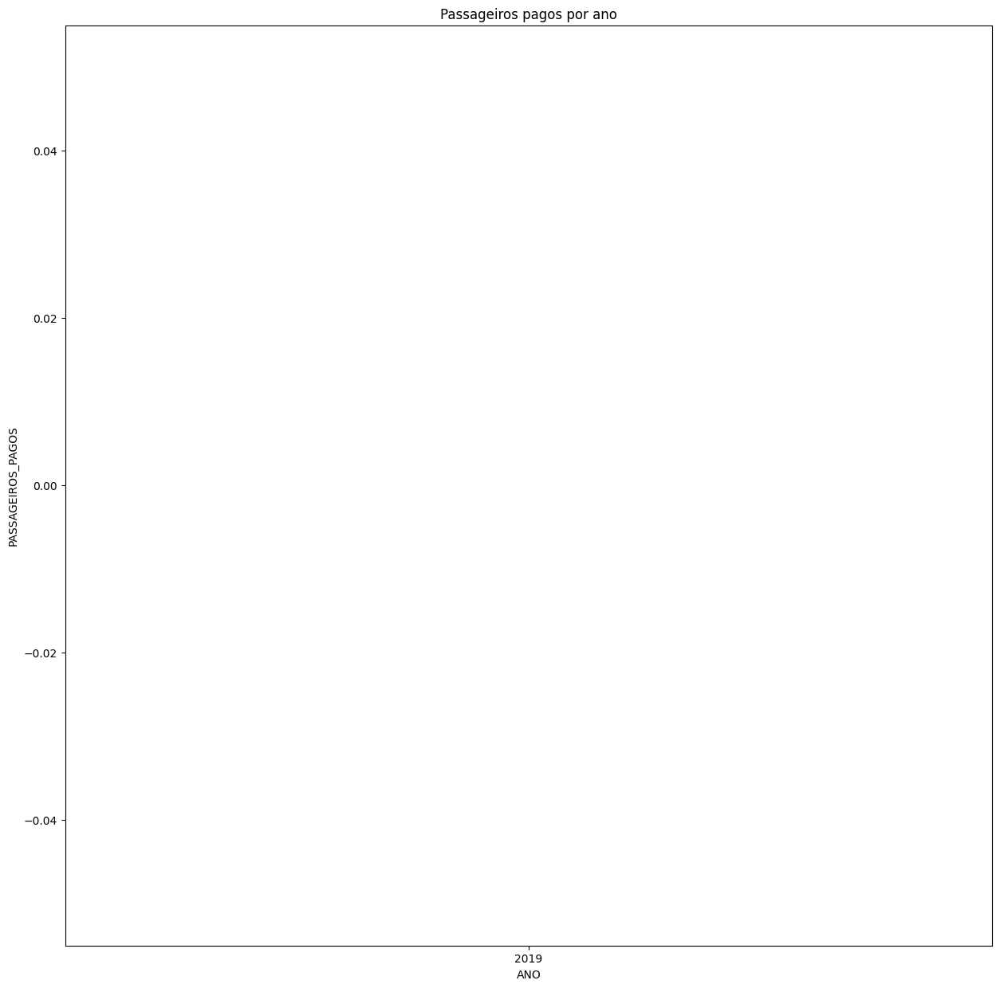





CORENDON DUTCH AIRLINES B.V.


count     36.000000
mean     171.305556
std      285.058171
min        0.000000
25%        0.000000
50%        0.000000
75%      338.250000
max      852.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


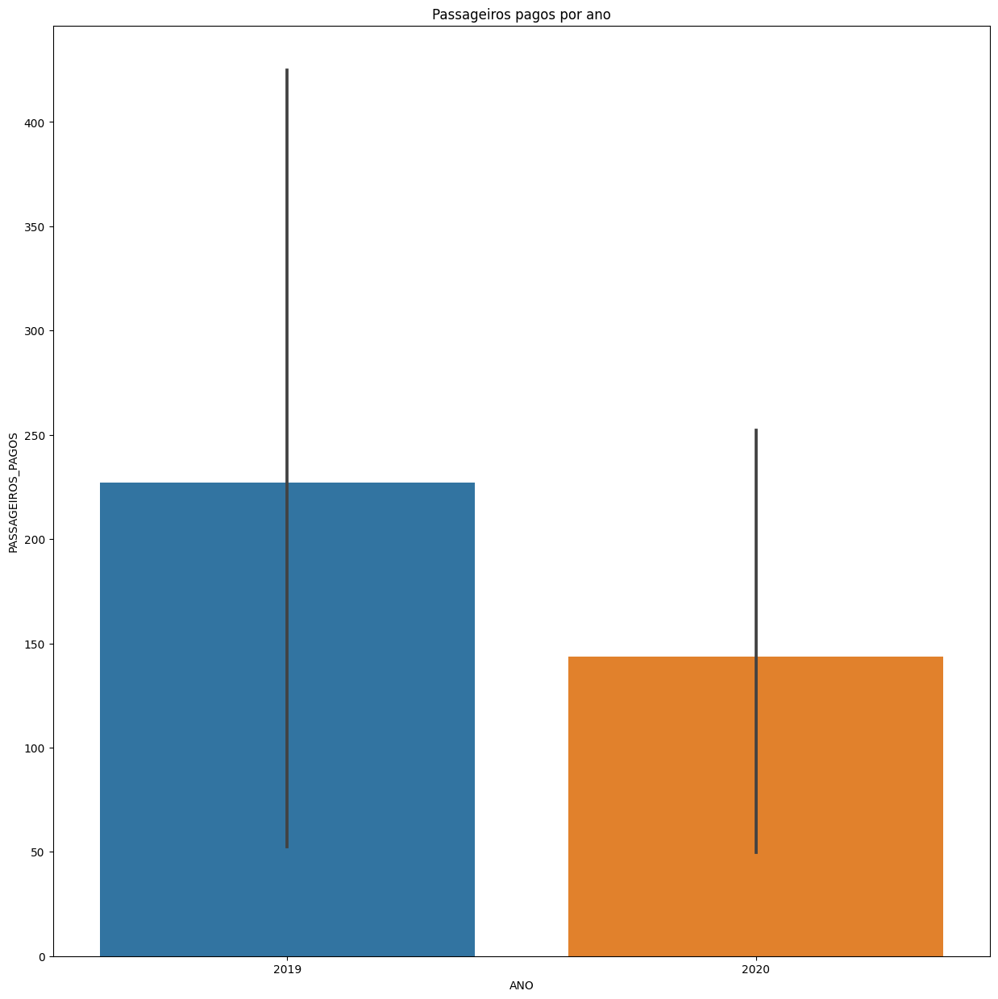





CONNECT LINHAS AÉREAS S.A. (ANTIGA CONNECT TÁXI AÉREO LTDA.)


count    143.0
mean       0.0
std        0.0
min        0.0
25%        0.0
50%        0.0
75%        0.0
max        0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


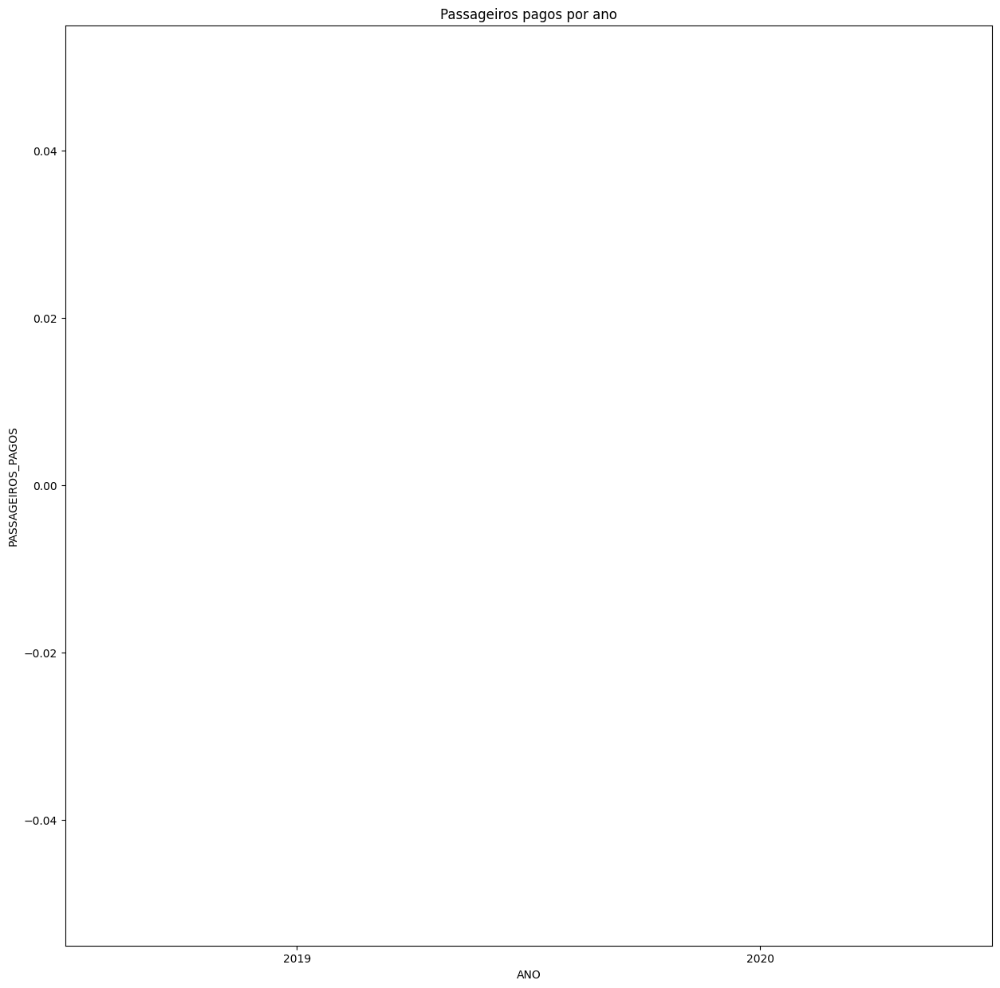





FB LÍNEAS AÉREAS S.A (FLYBONDI)


count      139.000000
mean      3591.726619
std       3716.818816
min          0.000000
25%        881.000000
50%       2685.000000
75%       4783.000000
max      16585.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


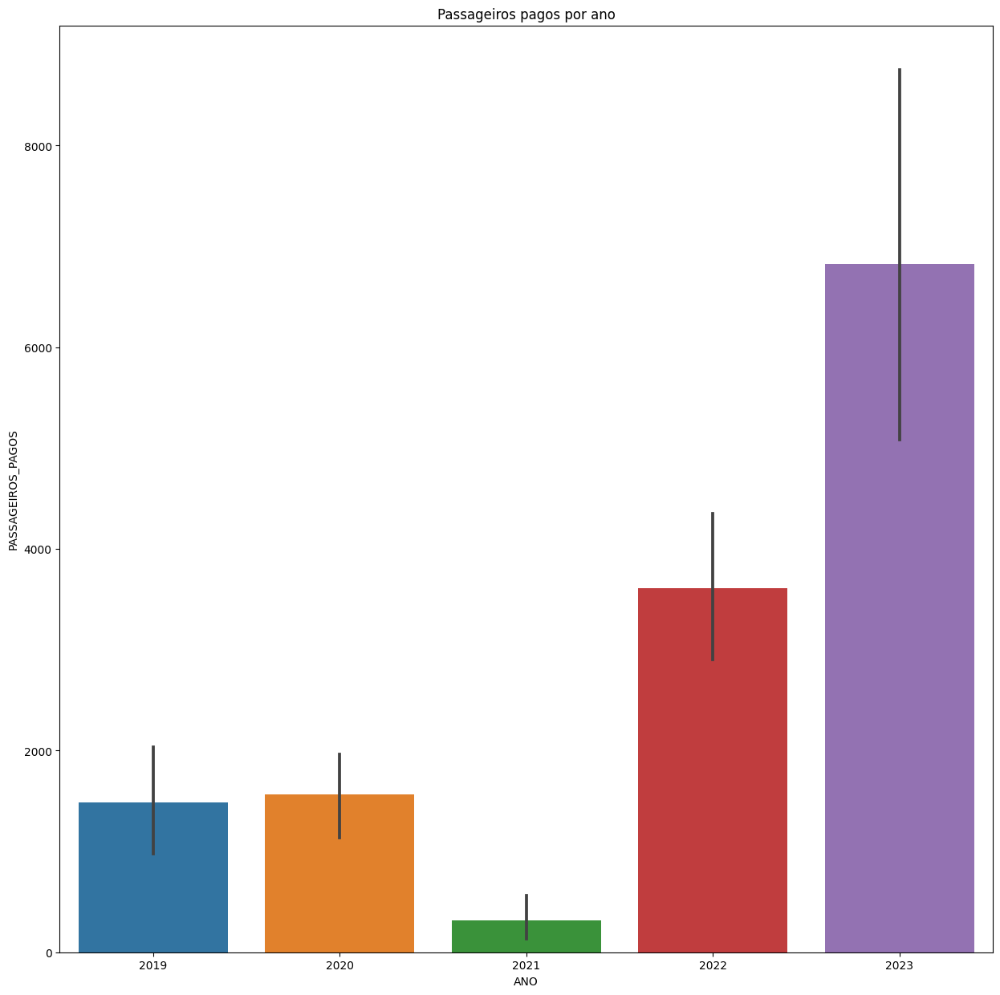





GAINJET AVIATION


count    36.000000
mean     13.250000
std      23.275217
min       0.000000
25%       0.000000
50%       0.000000
75%      13.250000
max      53.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


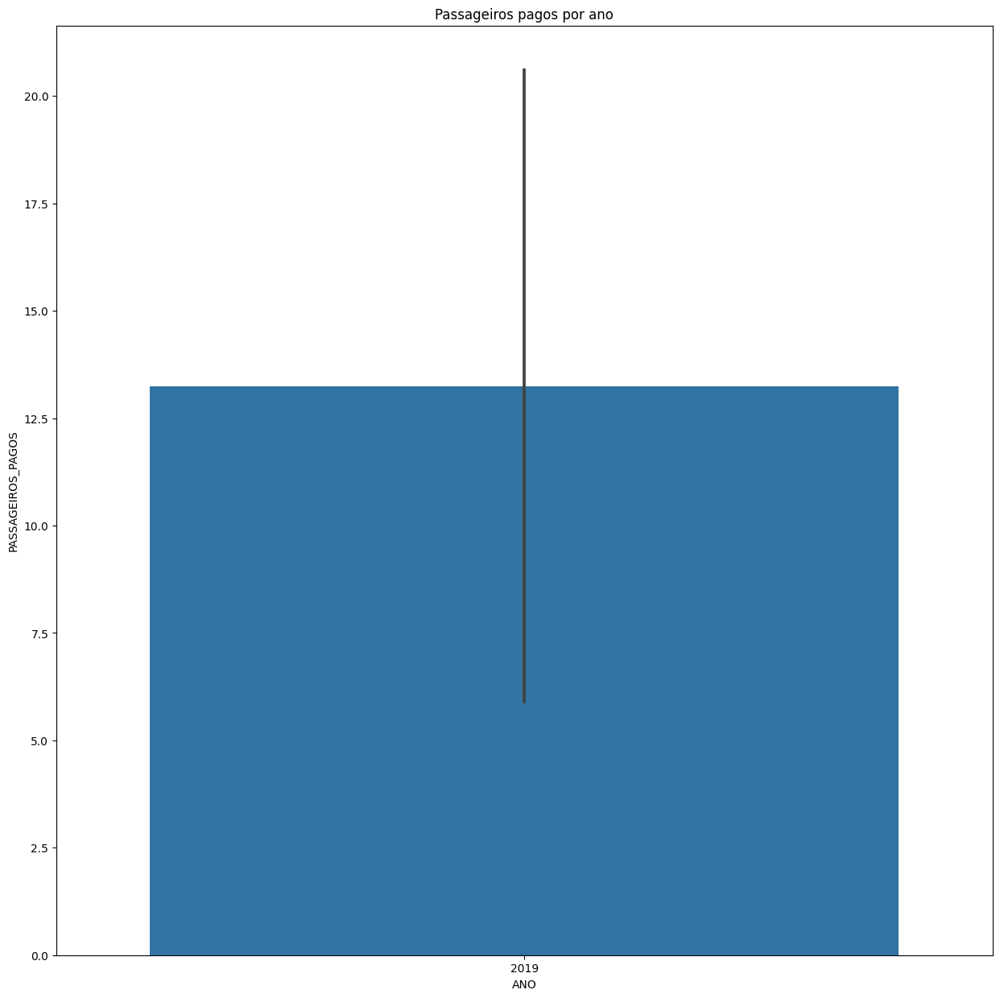





JETSMART AIRLINES SPA - CHILE


count      41.000000
mean     1298.707317
std      1170.925579
min        18.000000
25%       529.000000
50%       944.000000
75%      1451.000000
max      4387.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


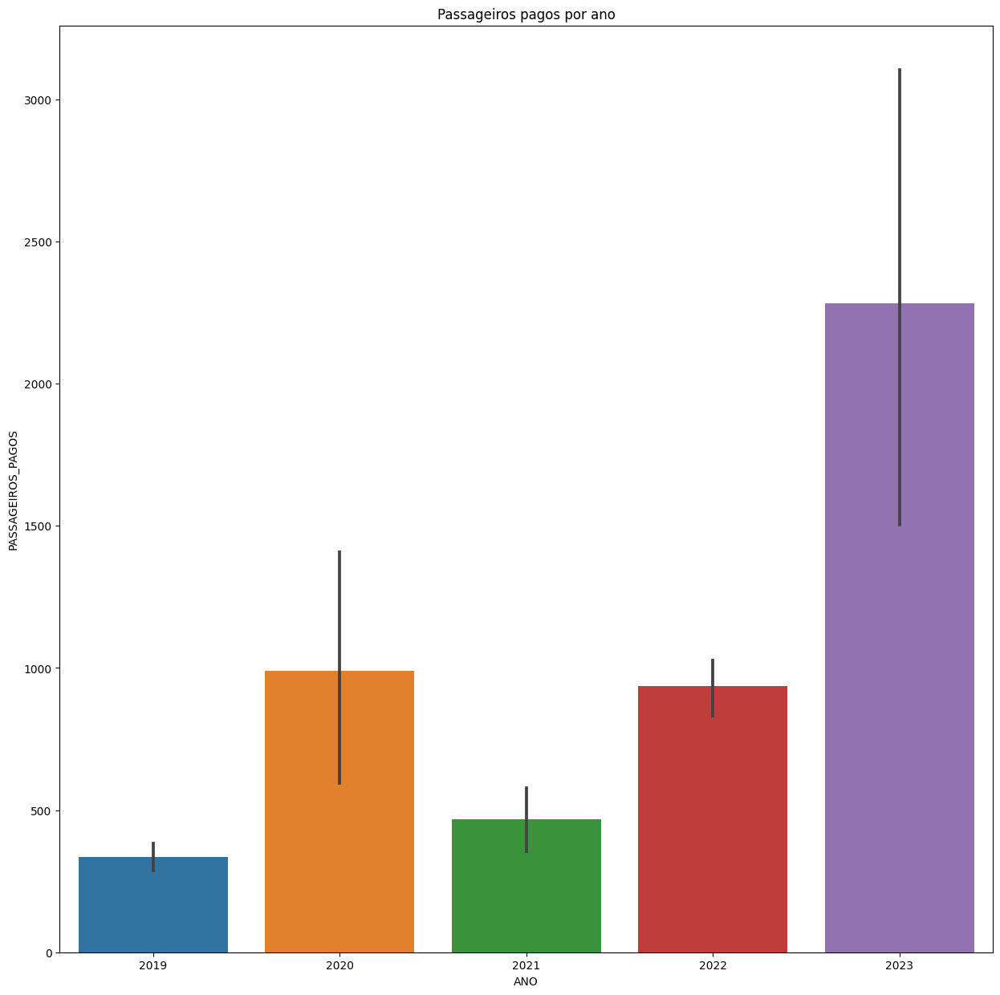





EUROATLANTIC AIRWAYS


count     23.000000
mean      81.913043
std      117.268888
min        0.000000
25%        0.000000
50%        0.000000
75%      186.500000
max      318.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


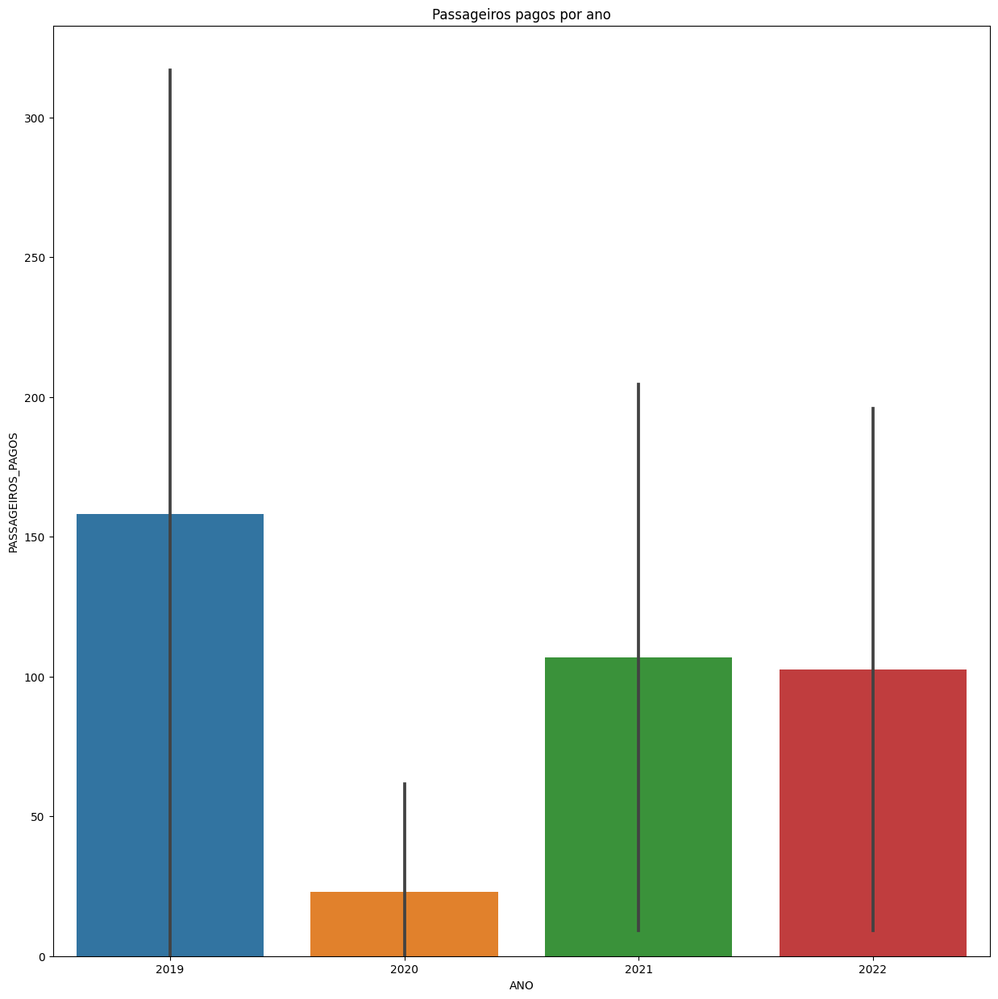





NORWEGIAN AIR UK LIMITED


count      26.000000
mean     4137.307692
std      1425.166314
min       126.000000
25%      3513.250000
50%      4457.000000
75%      5127.750000
max      5833.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


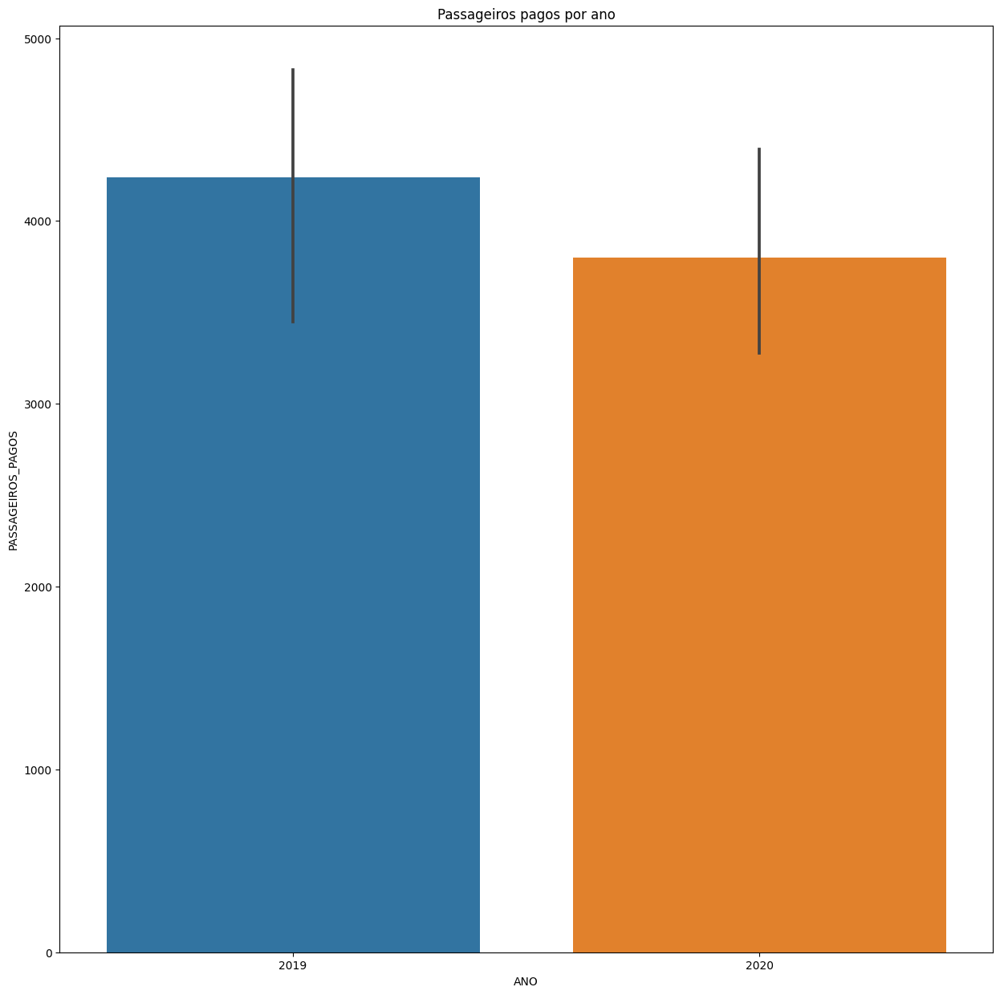





OMNI TÁXI AÉREO S.A.


count    318.000000
mean      43.169811
std       72.687543
min        0.000000
25%        0.000000
50%        8.000000
75%       49.000000
max      366.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


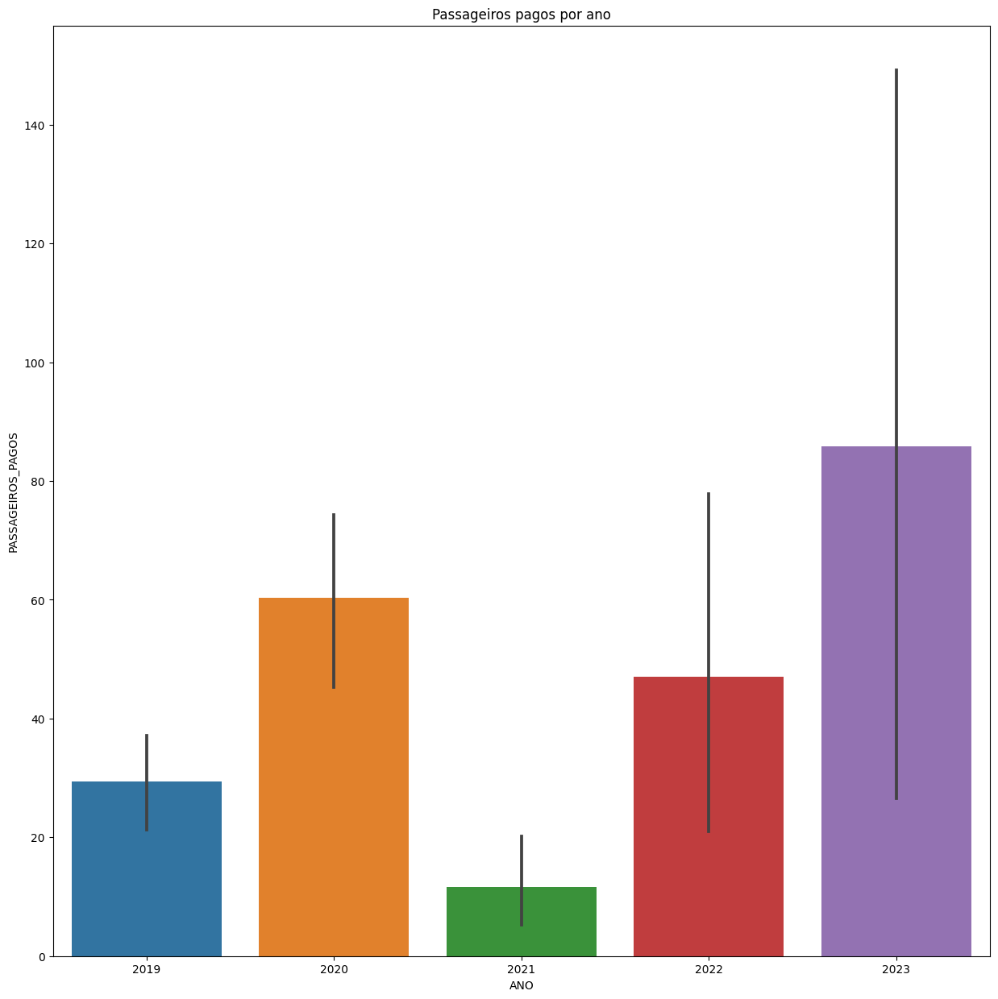





SKY AIRLINE PERU S.A.C.


count     12.000000
mean      91.750000
std      110.015805
min        0.000000
25%       26.250000
50%       39.500000
75%      155.000000
max      372.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


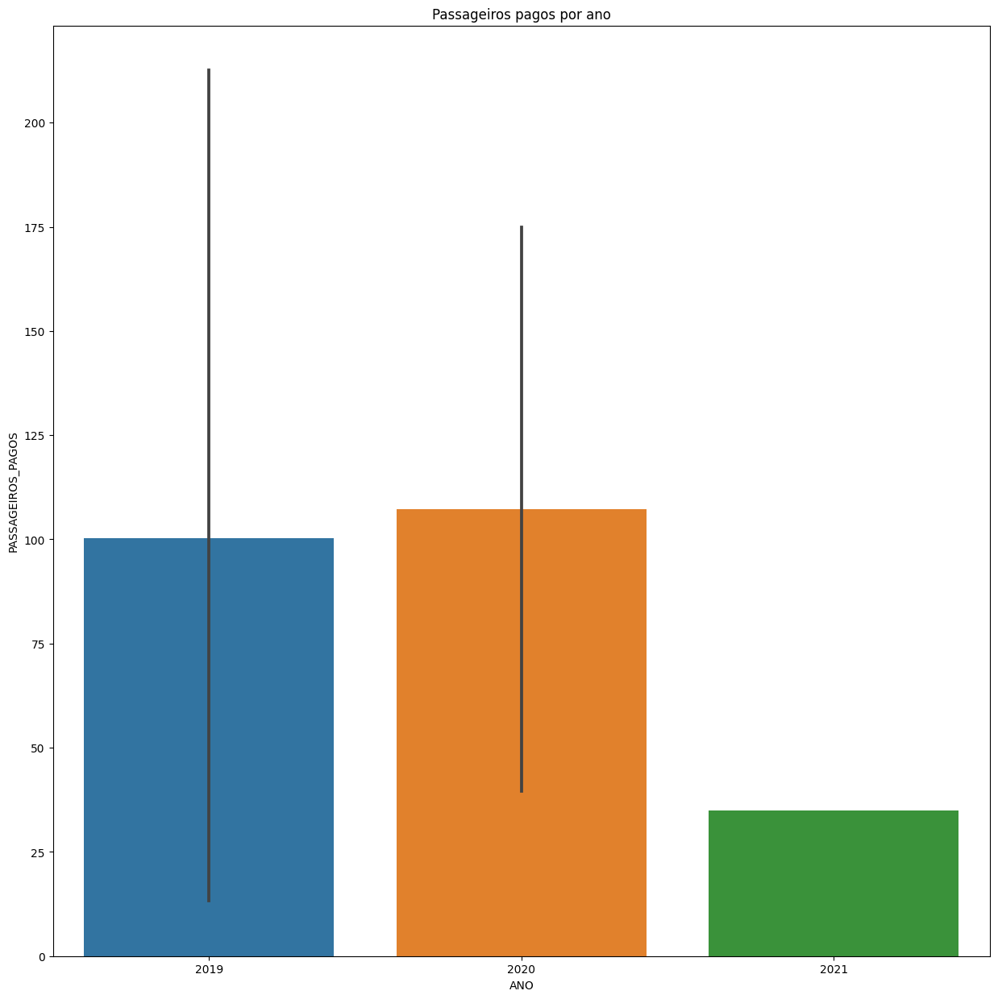





TUI AIRWAYS LTD


count     6.000000
mean     52.666667
std      40.795425
min       0.000000
25%      19.750000
50%      79.000000
75%      79.000000
max      79.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


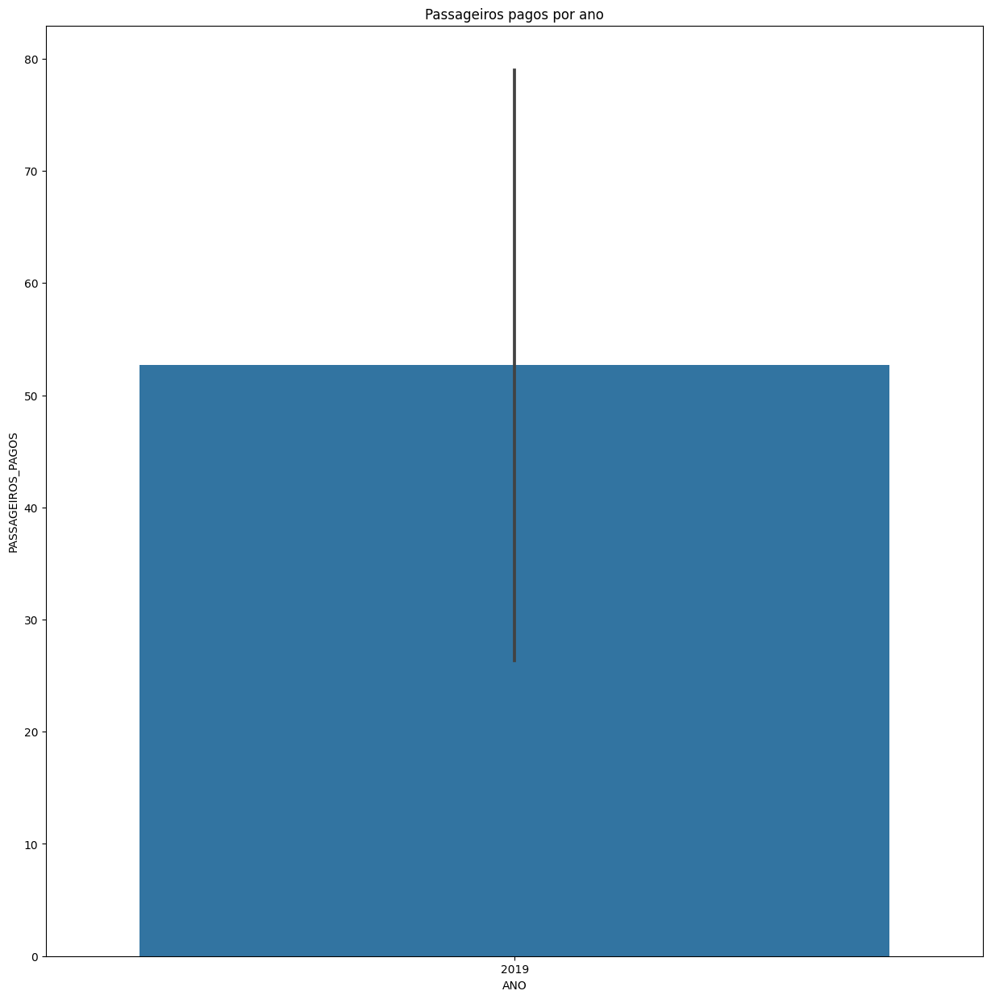





FLY ALLWAYS N.V.


count     52.000000
mean     150.211538
std      132.401104
min        0.000000
25%       63.750000
50%      129.000000
75%      179.000000
max      522.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


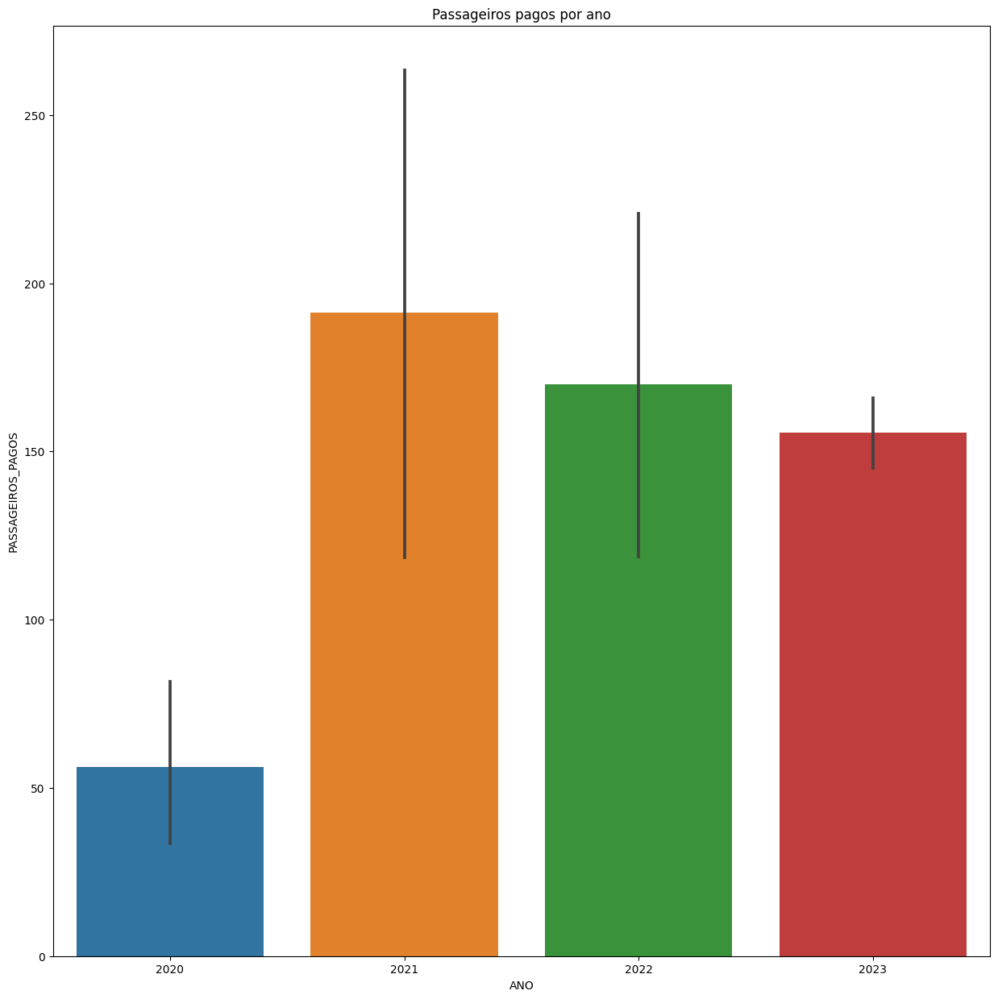





ESTELAR LATINOAMERICA C.A.


count    67.000000
mean     14.104478
std      21.637604
min       0.000000
25%       0.000000
50%       0.000000
75%      41.500000
max      58.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


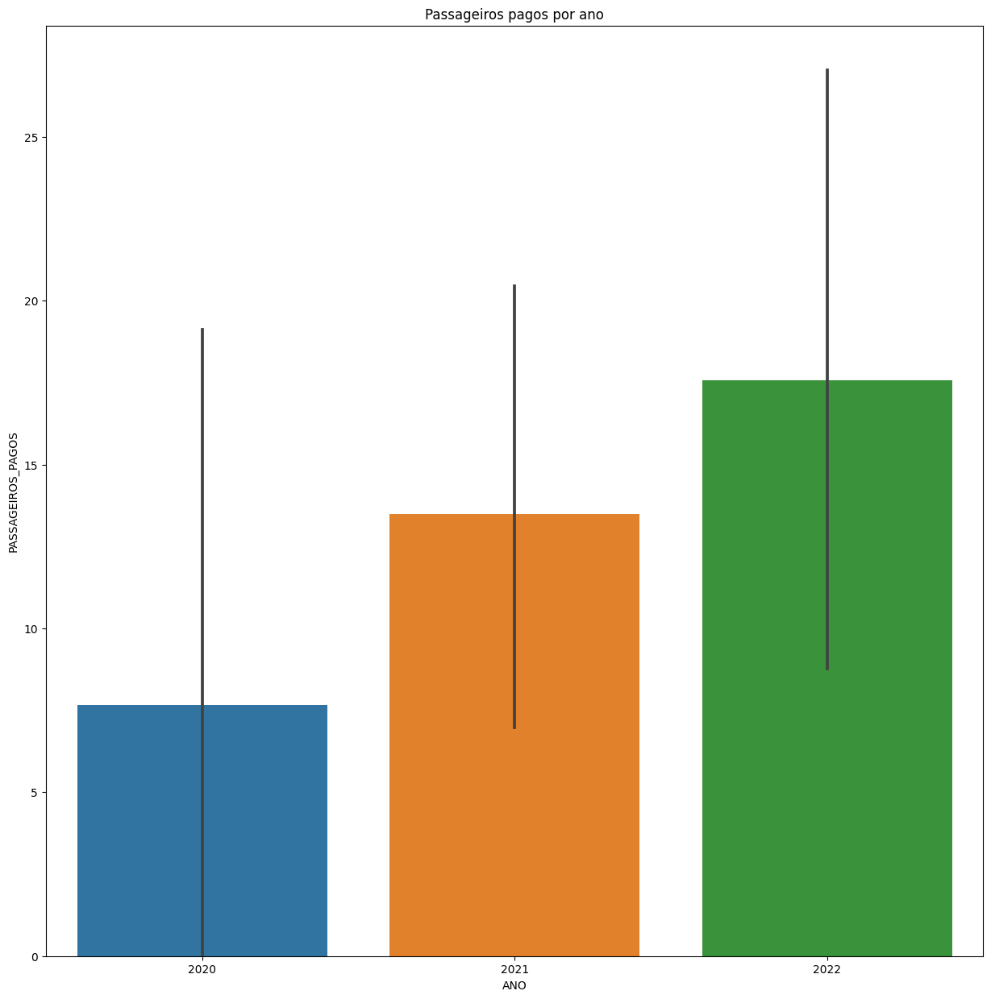





EVELOP AIRLINES S.L.


count      4.000000
mean     178.000000
std      207.627872
min        0.000000
25%        0.000000
50%      160.000000
75%      338.000000
max      392.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


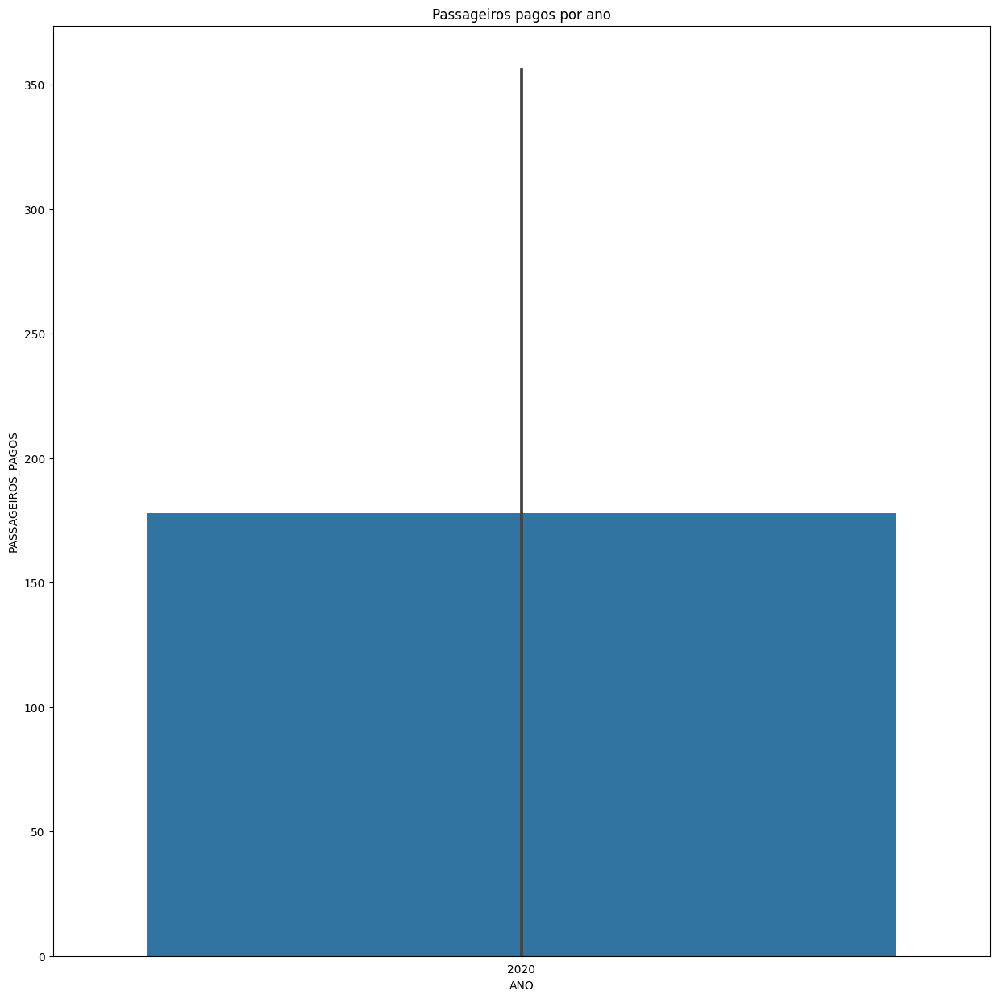





SKY KG AIRLINES


count    7.0
mean     0.0
std      0.0
min      0.0
25%      0.0
50%      0.0
75%      0.0
max      0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


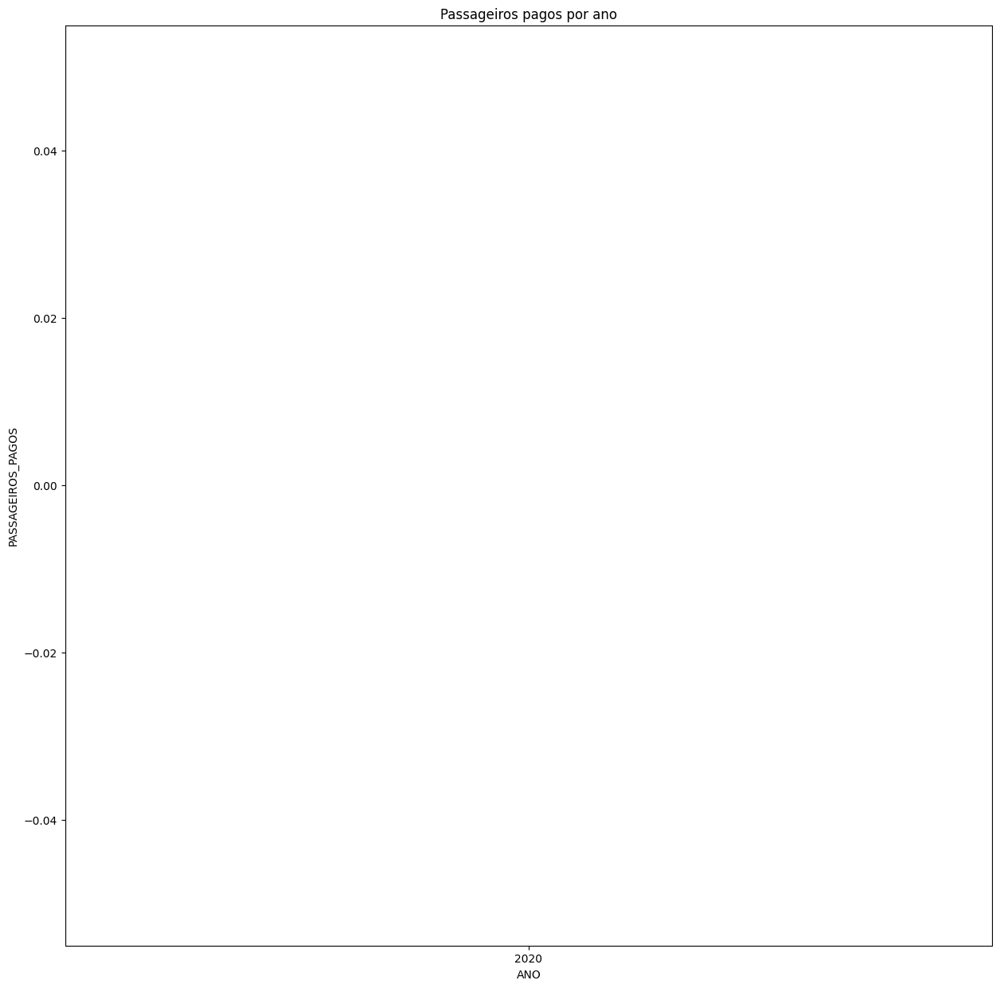





KAM AIR


count    26.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


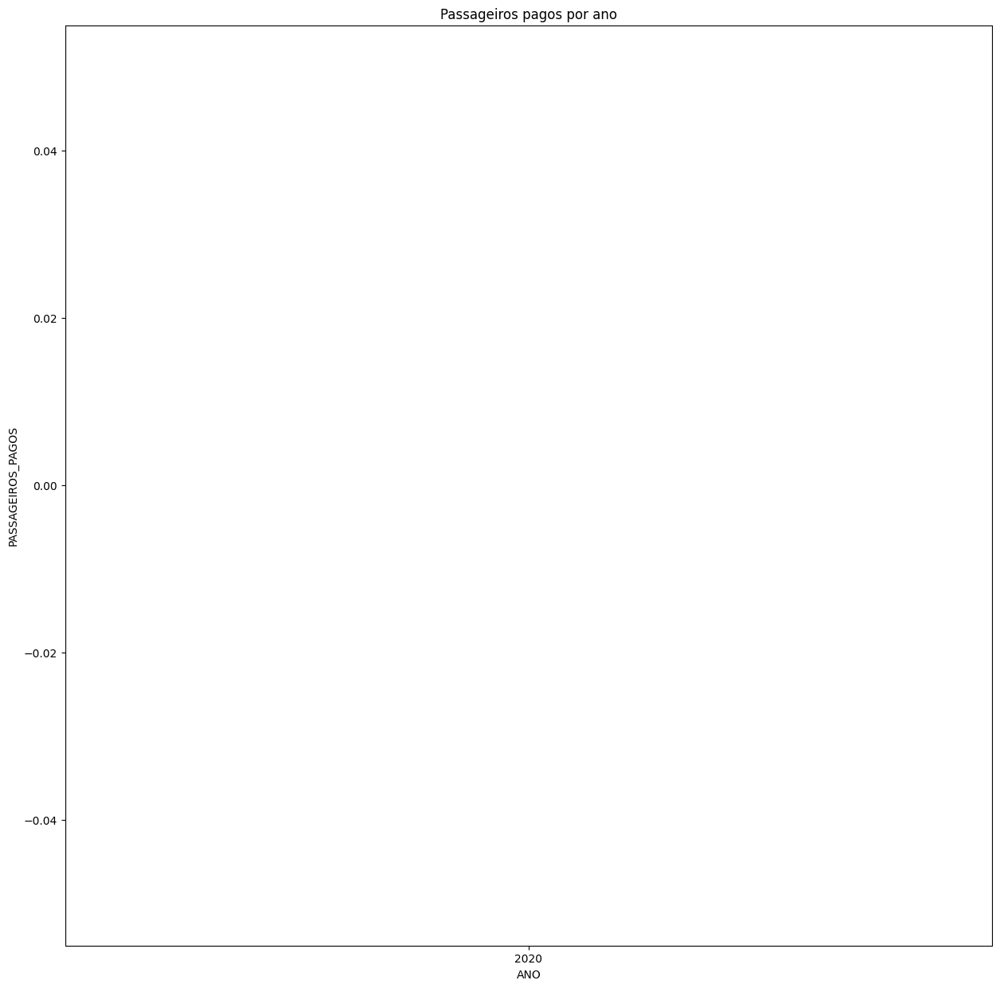





LYNDEN AIR CARGO, LLC


count    34.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


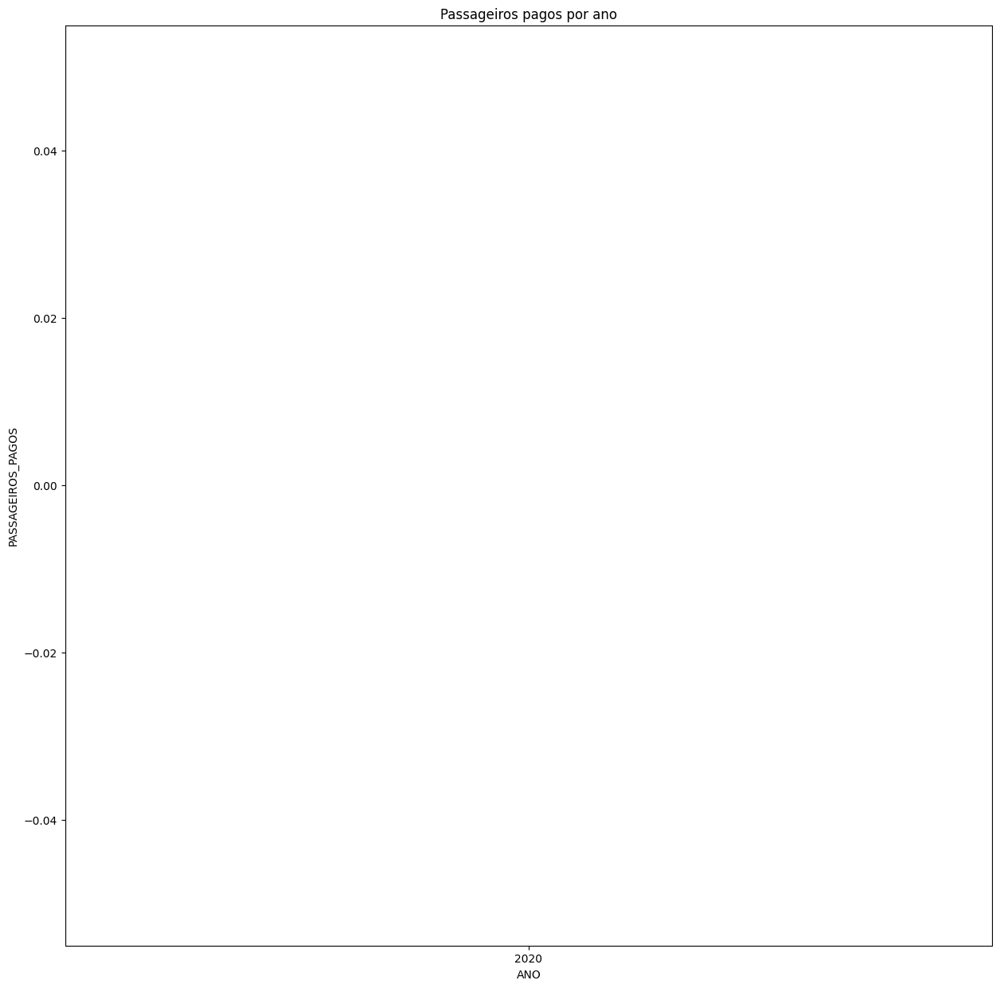





MOTOR SICH PUBLIC JOINT STOCK COMPANY


count    11.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


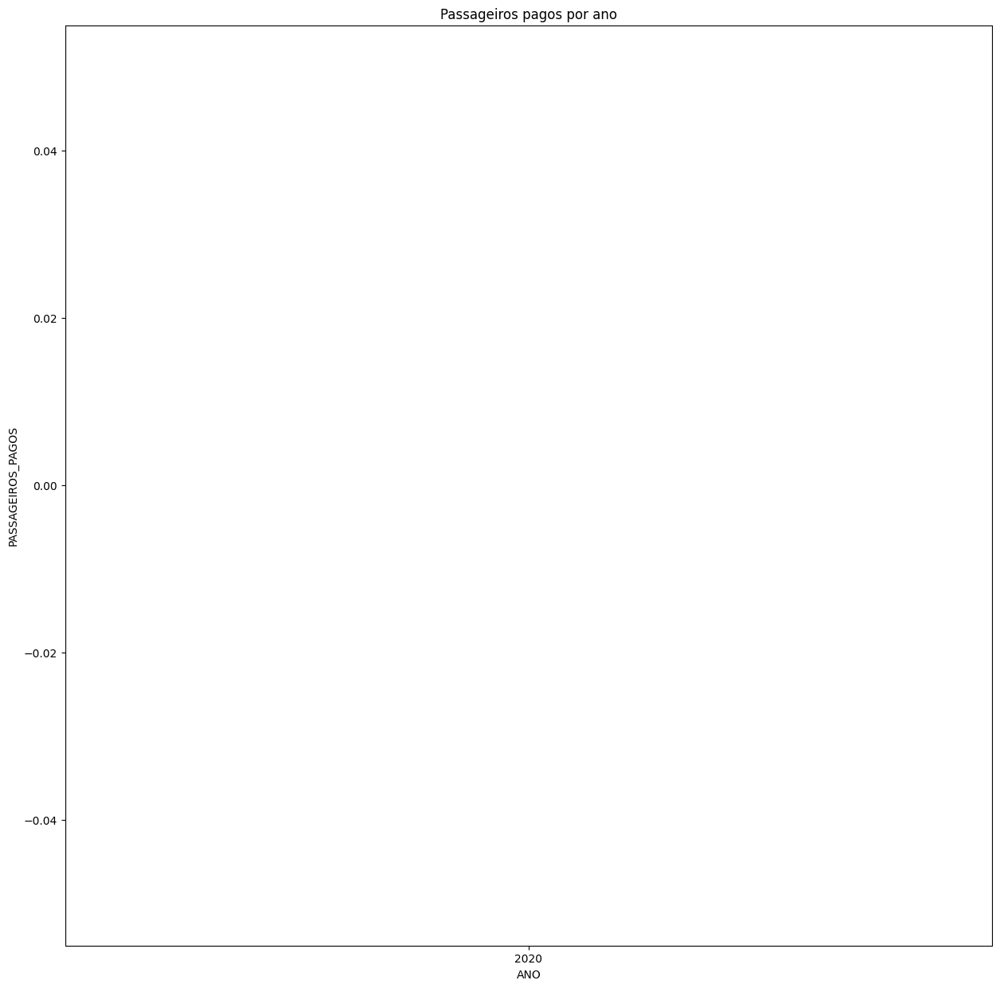





FLY PRO S.R.L.


count    294.0
mean       0.0
std        0.0
min        0.0
25%        0.0
50%        0.0
75%        0.0
max        0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


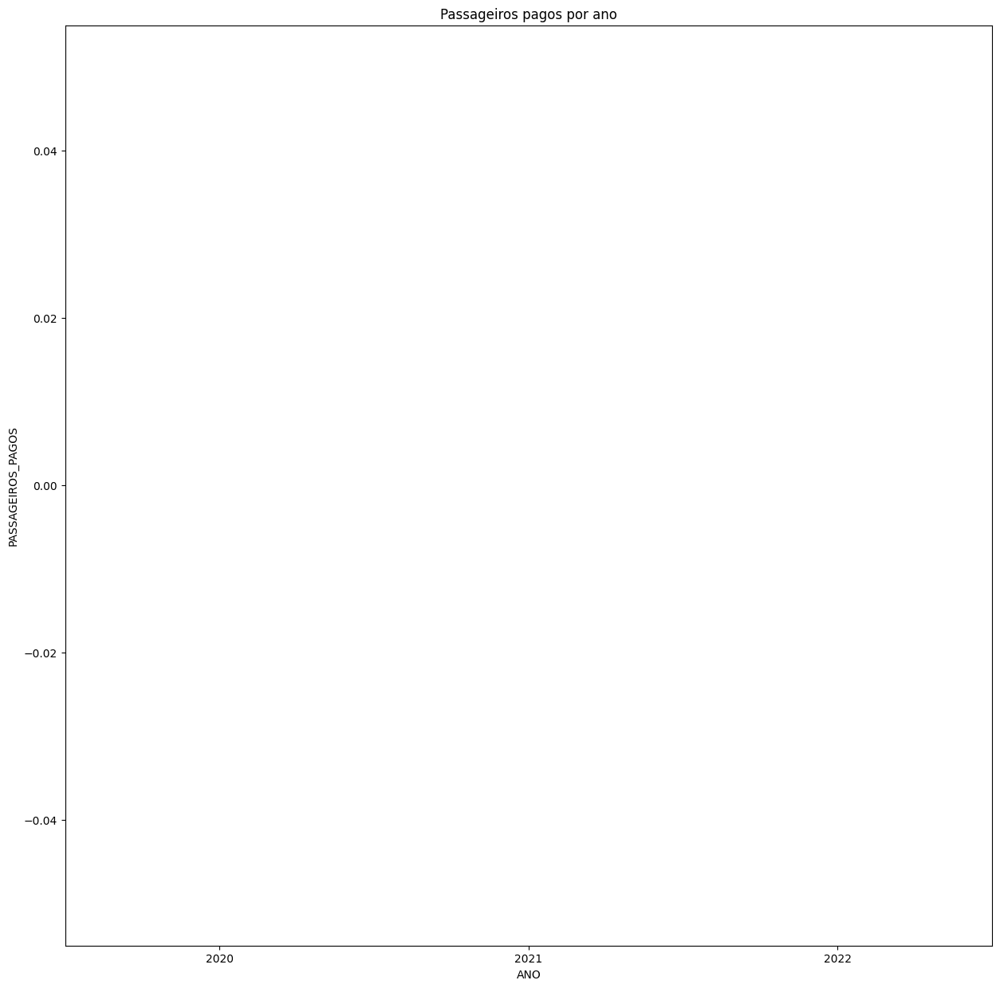





SERVICIO AEREO REGIONAL REGAIR AIR LTDA


count     76.000000
mean      48.368421
std       77.996383
min        0.000000
25%        0.000000
50%       30.000000
75%       52.000000
max      385.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


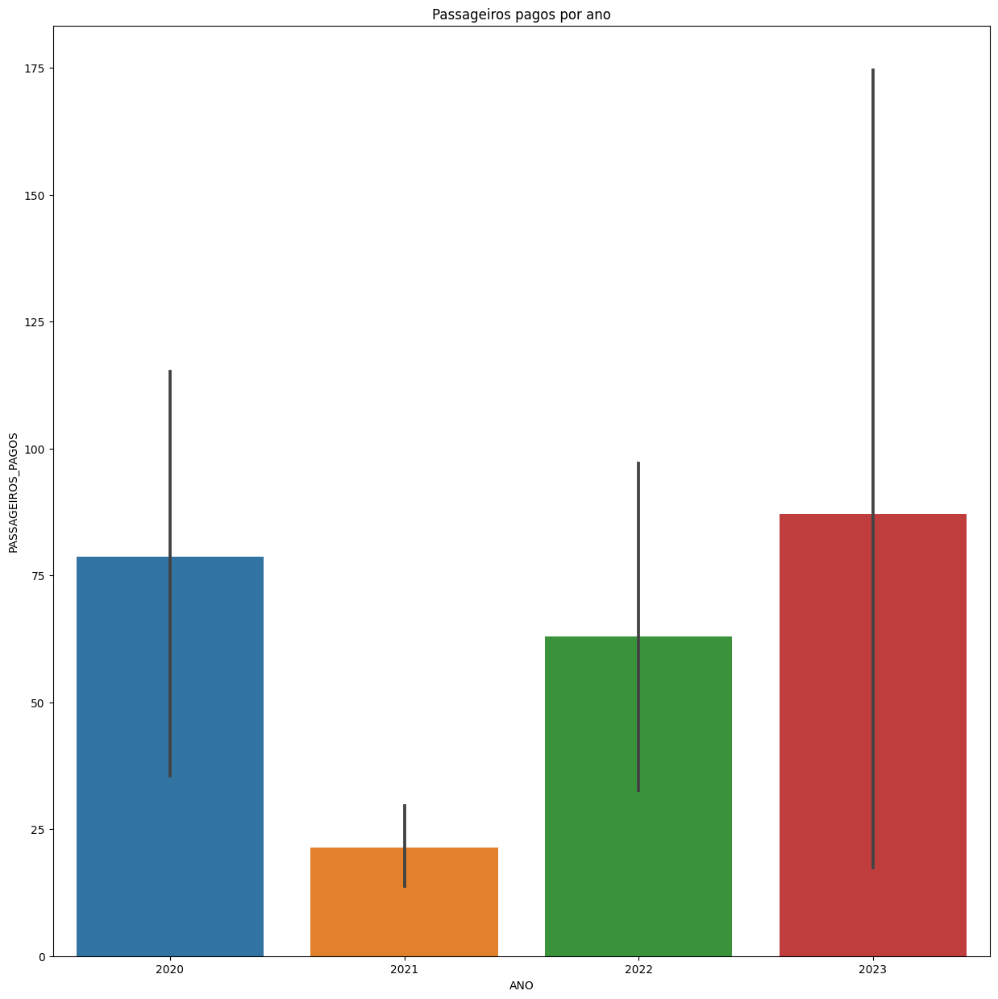





TRANS GUYANA AIRWAYS


count     32.000000
mean      20.687500
std       21.650356
min        0.000000
25%        8.750000
50%       14.000000
75%       30.750000
max      107.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


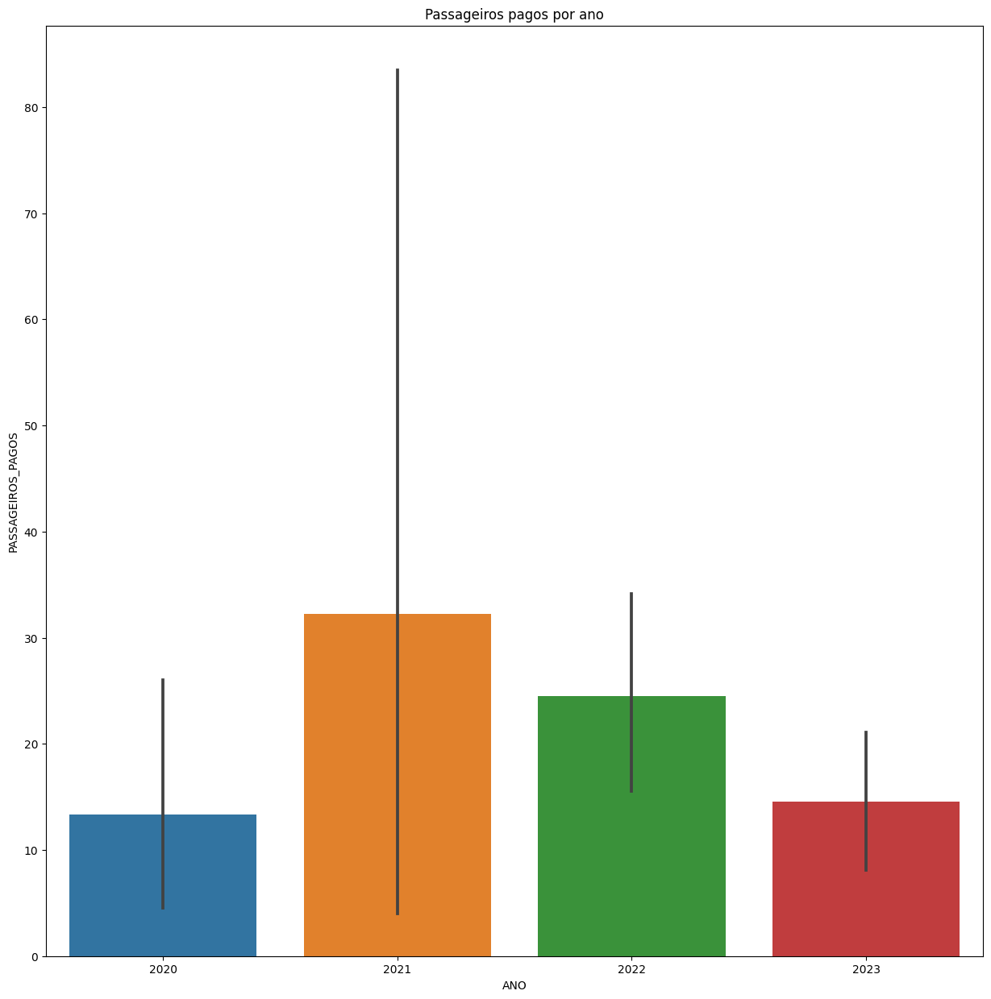





CA TERRA AVIA SRL


count    32.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


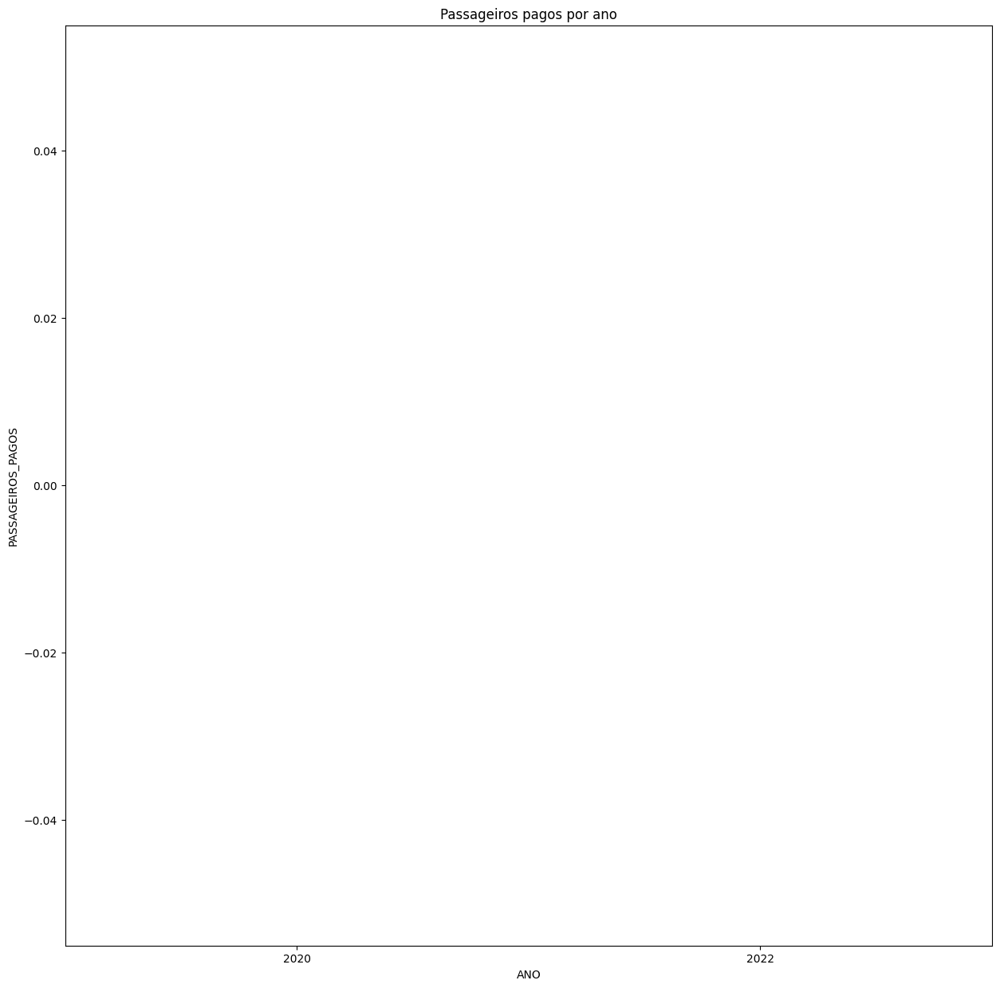





AEROENLACES NACIONALES S.A.- VIVA AEROBUS


count     2.000000
mean     44.000000
std      62.225397
min       0.000000
25%      22.000000
50%      44.000000
75%      66.000000
max      88.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


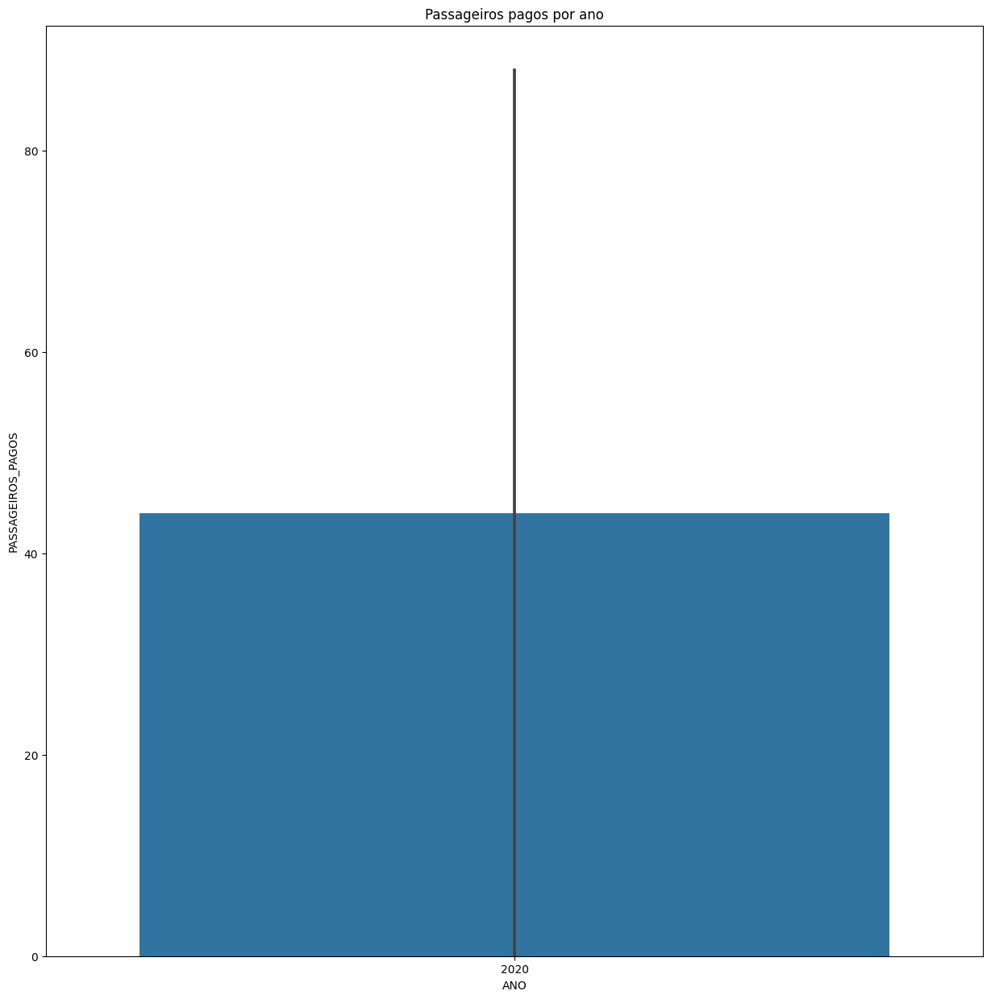





VIVA AIRLINES PERU SAC


count      9.000000
mean      52.111111
std       65.238877
min        0.000000
25%        0.000000
50%       28.000000
75%      124.000000
max      150.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


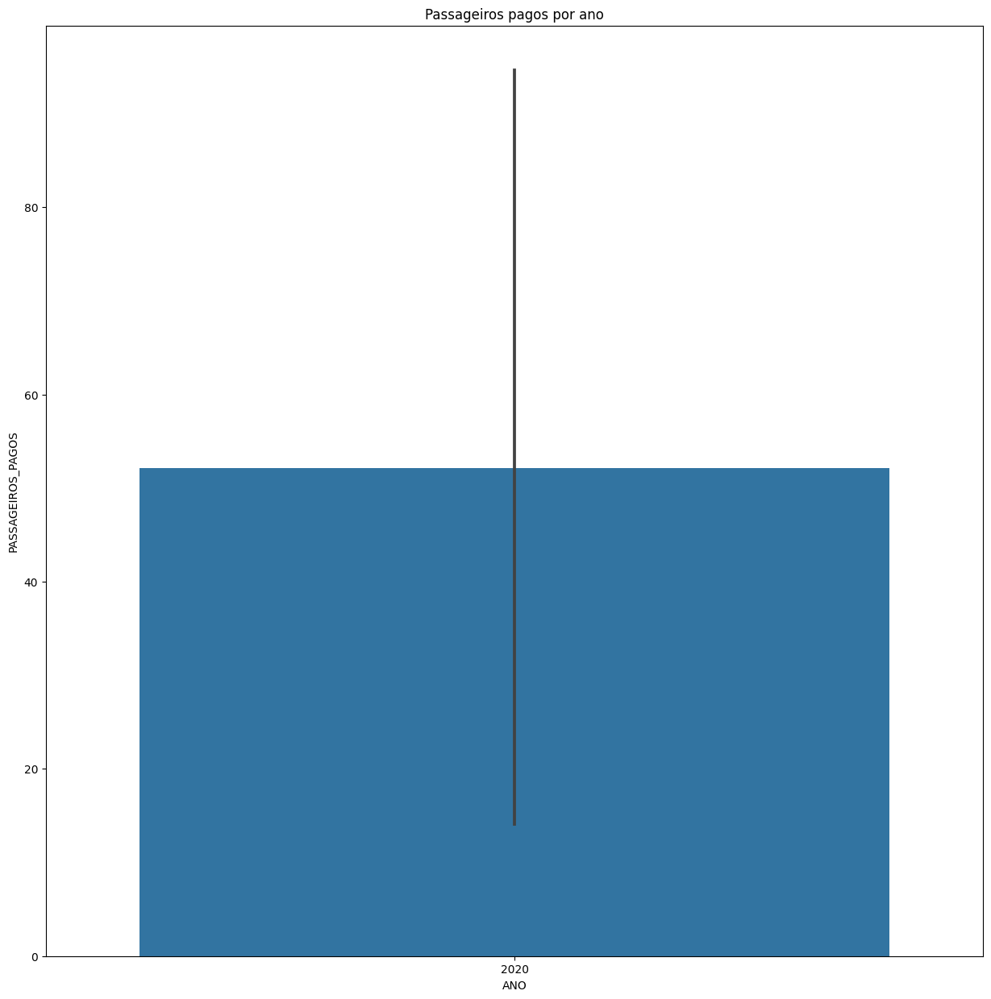





VIVA AIR - FAST COLOMBIA


count      31.000000
mean     1175.032258
std      1051.907901
min         0.000000
25%       116.500000
50%      1545.000000
75%      2148.500000
max      2752.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


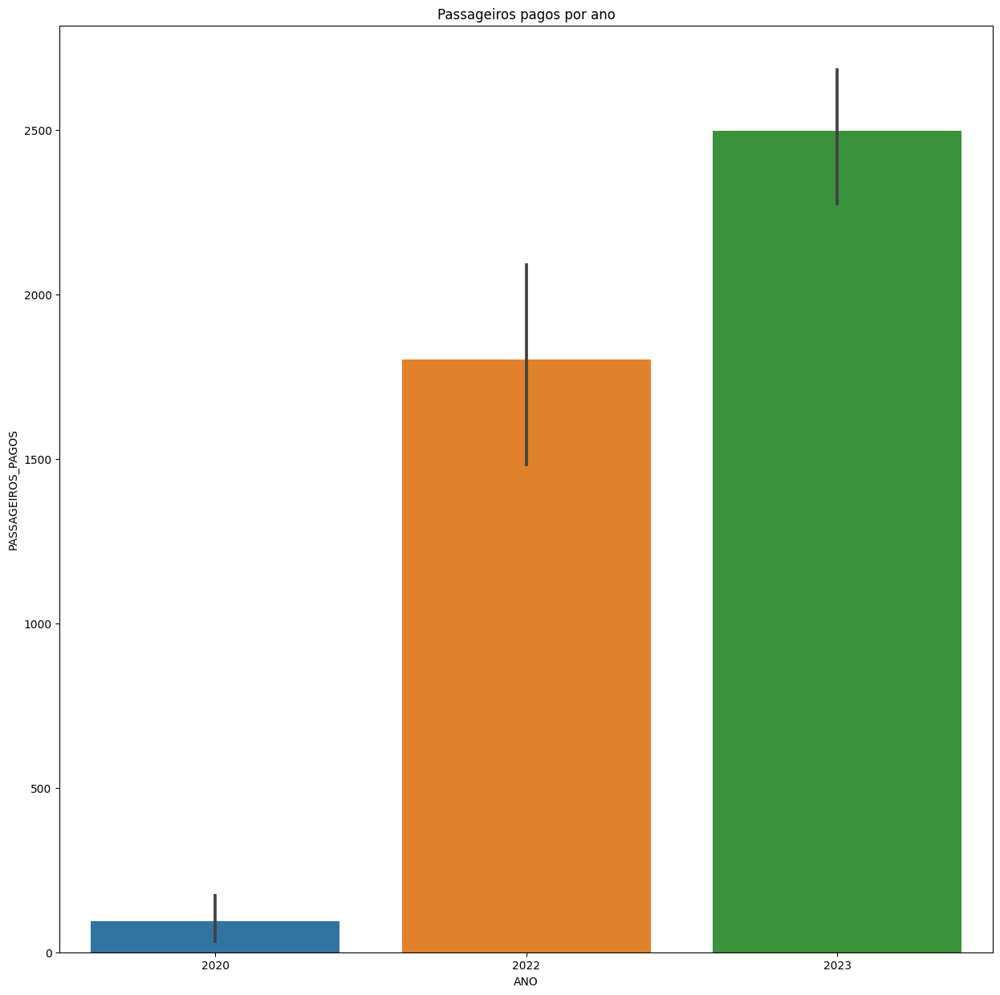





CARIBBEAN SUN AIRLINES DBA WORLD ATLANTIC AIRLINES


count    12.000000
mean      4.333333
std      14.699000
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max      51.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


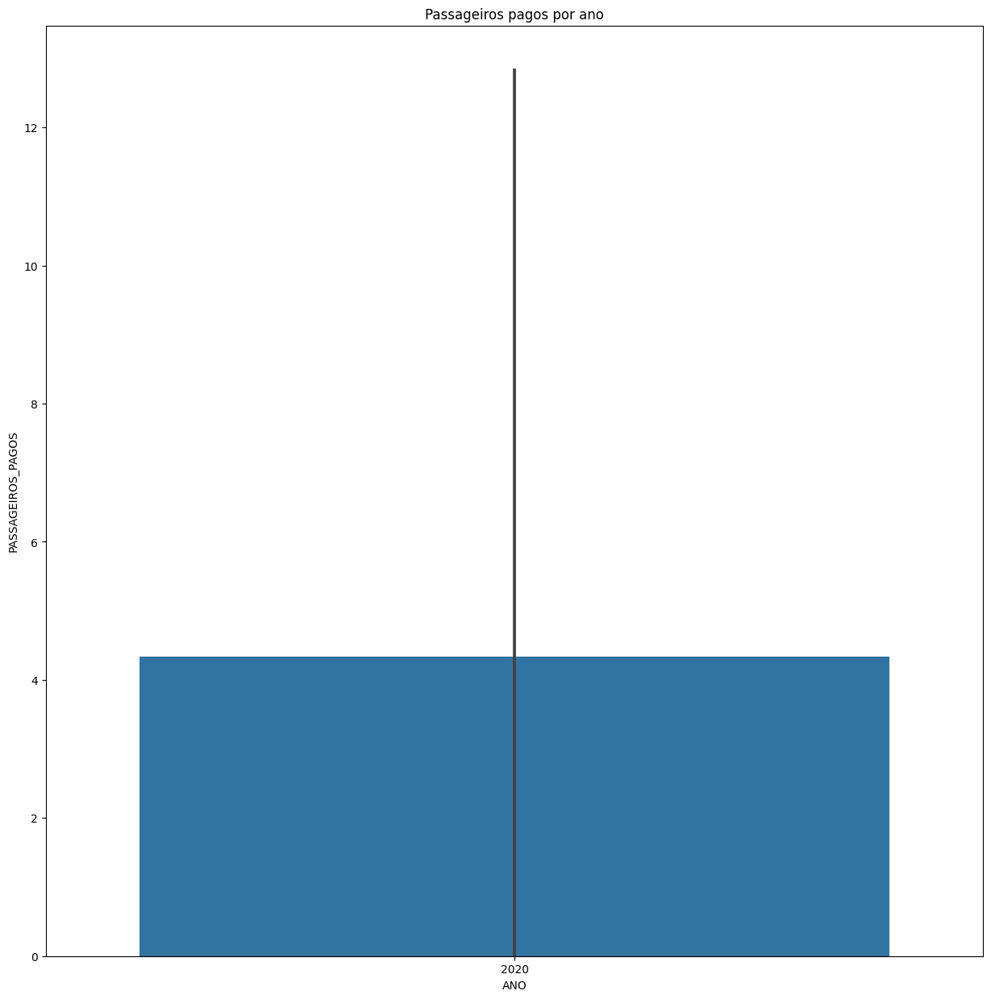





ATA - AEROTÁXI ABAETÉ LTDA.


count     67.000000
mean     111.701493
std      120.317889
min        3.000000
25%       13.000000
50%       70.000000
75%      169.000000
max      561.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


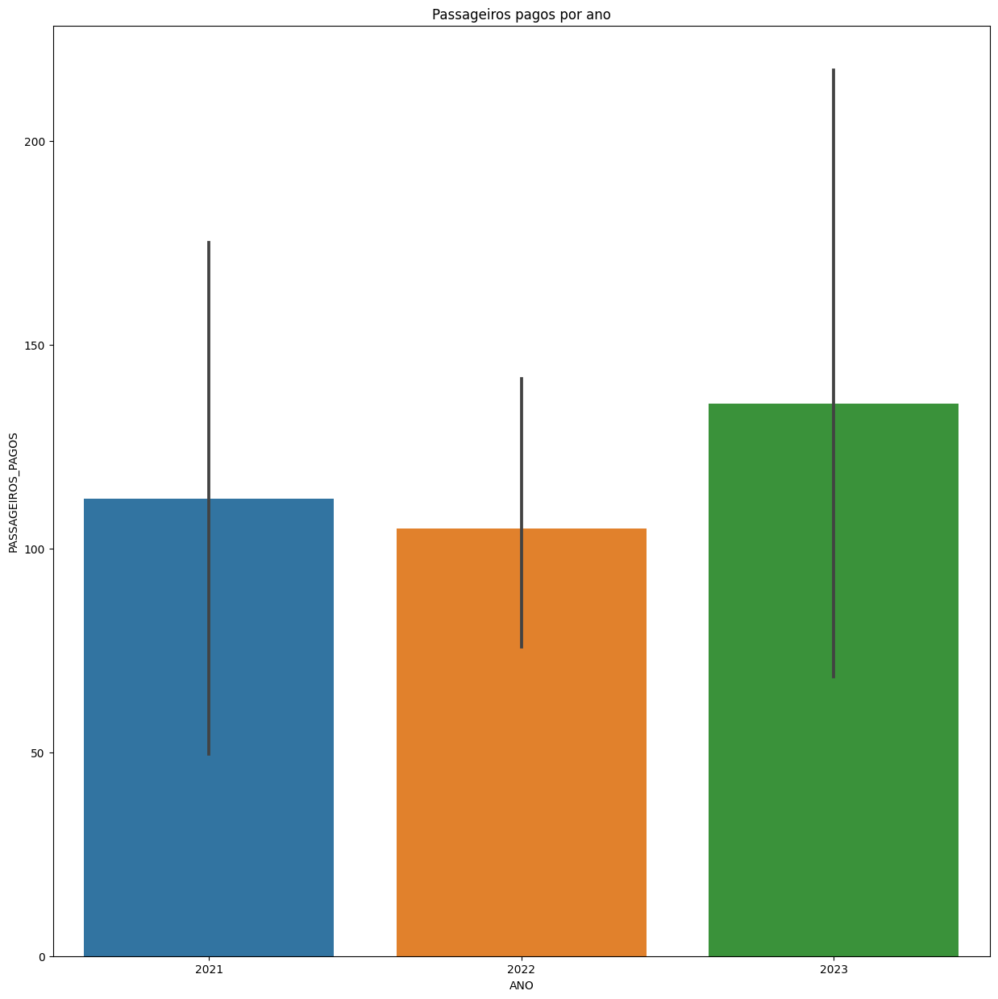





AEROSUL LINHAS AÉREAS LTDA. (EX AEROSUL TÁXI AÉREO E AUSTEN)


count    78.000000
mean     11.987179
std      14.056004
min       0.000000
25%       2.000000
50%       6.000000
75%      17.750000
max      62.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


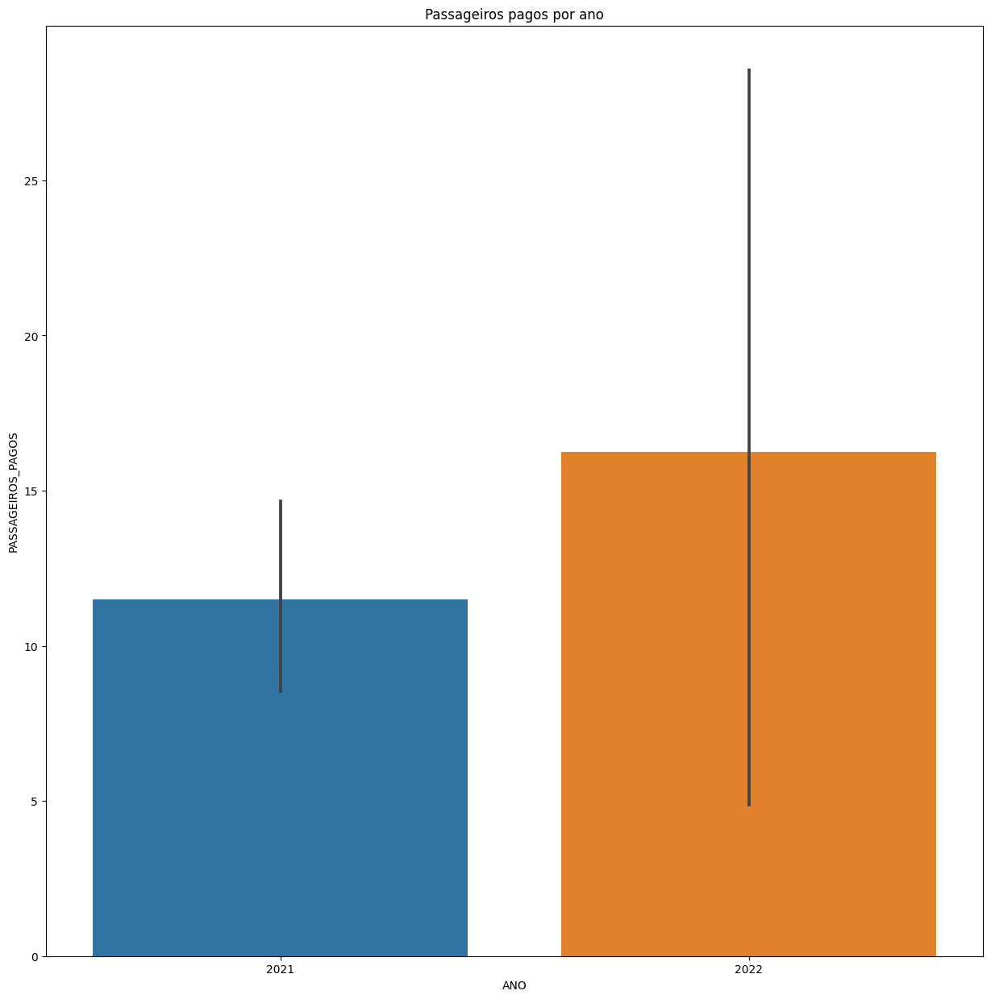





AEROTRANSCARGO SRL


count    12.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


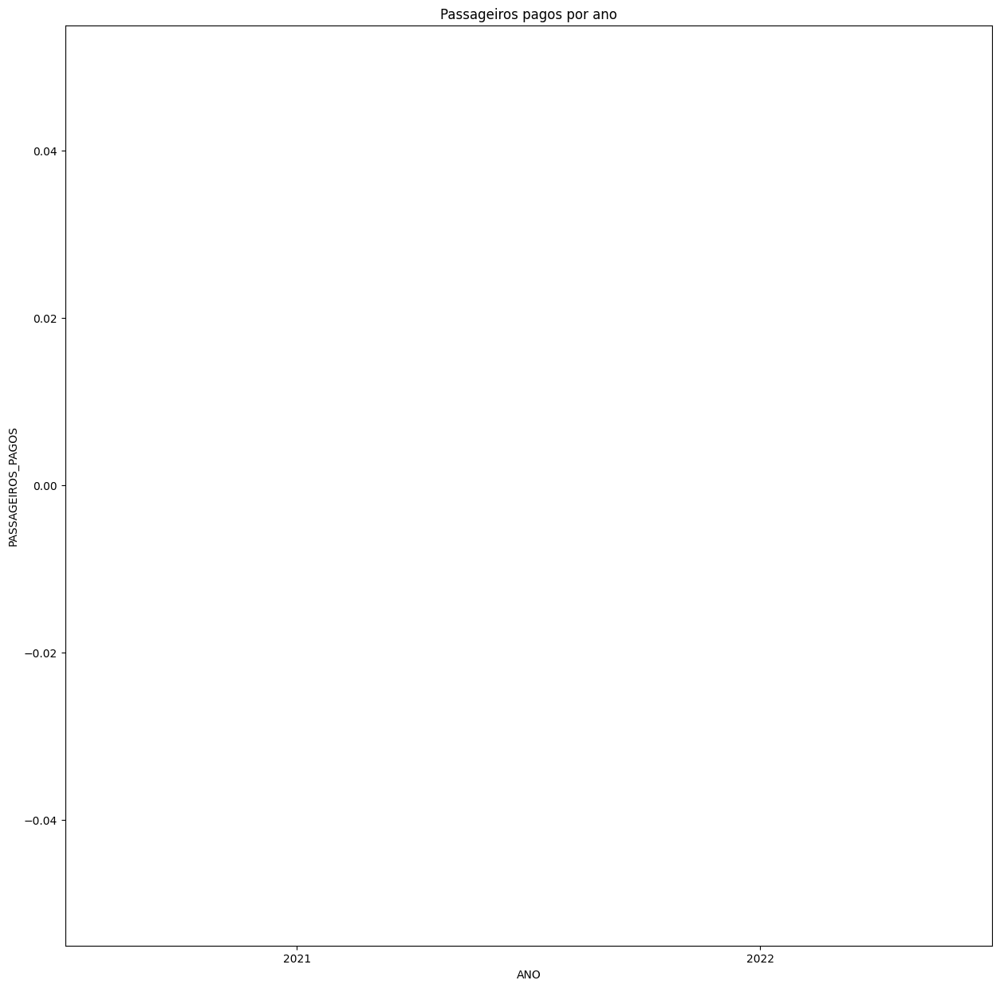

/usr/local/lib/python3.10/dist-packages/seaborn/algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))






CARGOJET AIRWAYS LTD.


count    122.0
mean       0.0
std        0.0
min        0.0
25%        0.0
50%        0.0
75%        0.0
max        0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


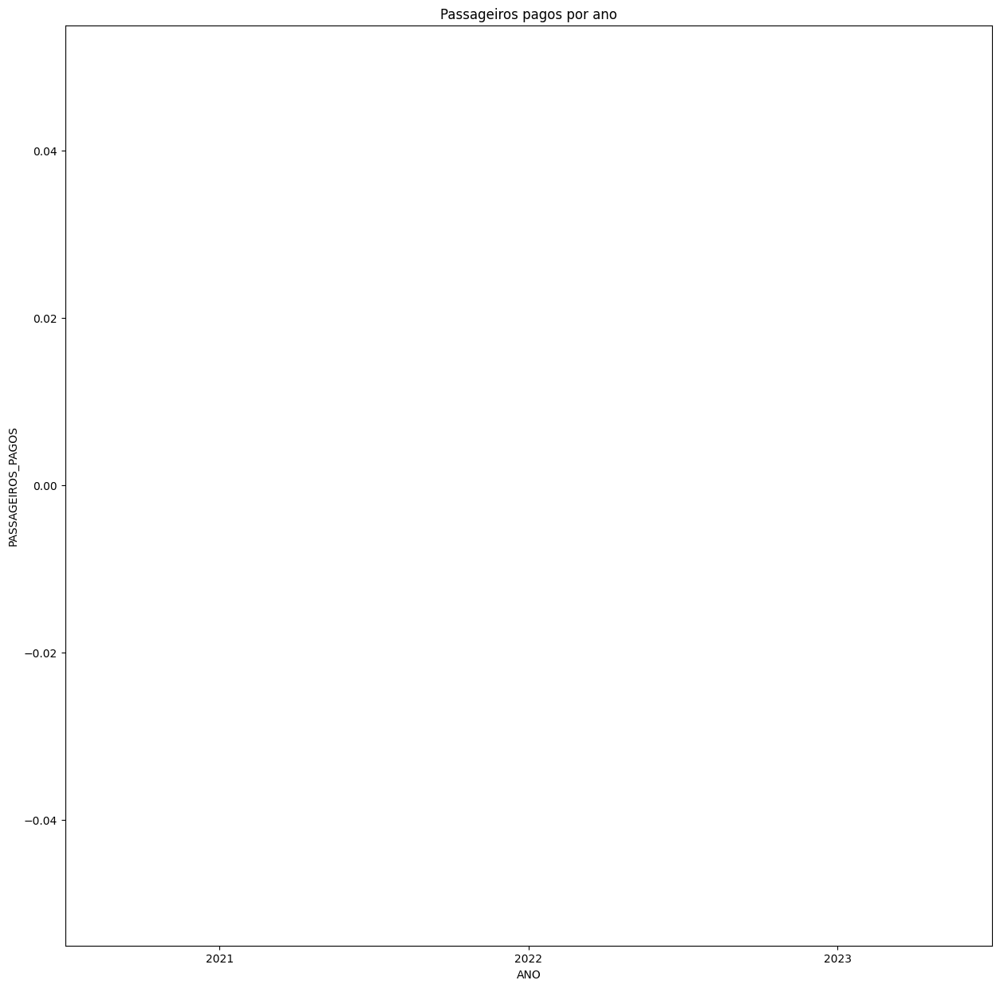





COMLUX ARUBA NV


count      5.00000
mean      51.60000
std       76.37277
min        0.00000
25%        0.00000
50%        0.00000
75%       88.00000
max      170.00000
Name: PASSAGEIROS_PAGOS, dtype: float64


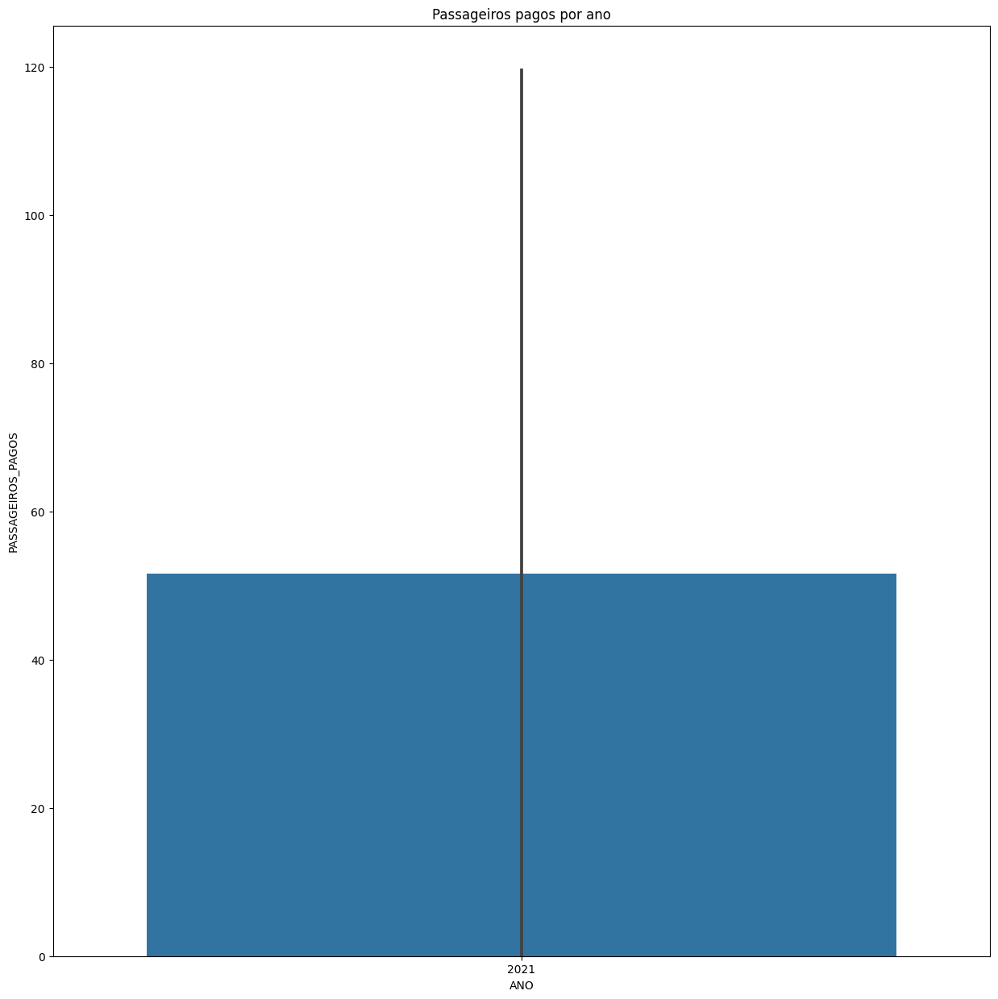





GRAN COLOMBIA DE AVIACION S.A.S. - GCA AIRLINES


count     5.000000
mean     25.200000
std      23.004347
min       0.000000
25%       0.000000
50%      42.000000
75%      42.000000
max      42.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


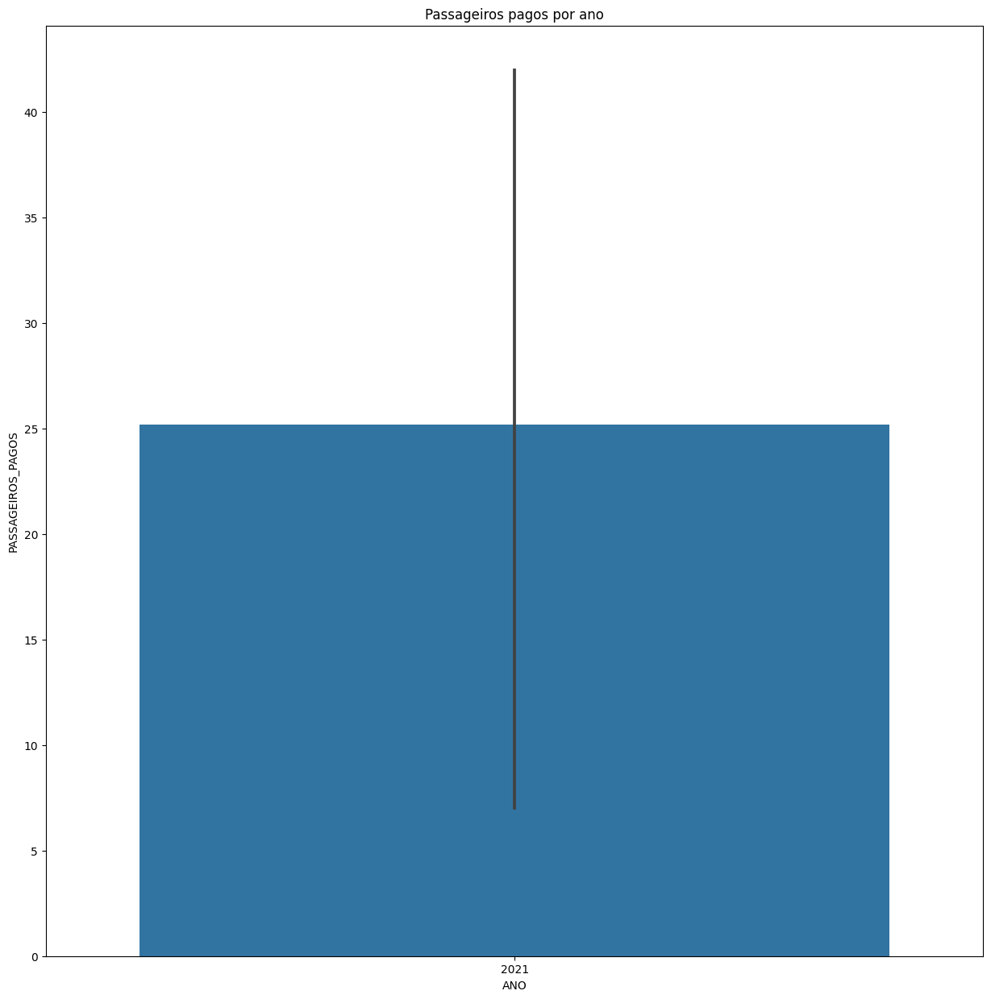





AURA AIRLINES SL


count    21.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


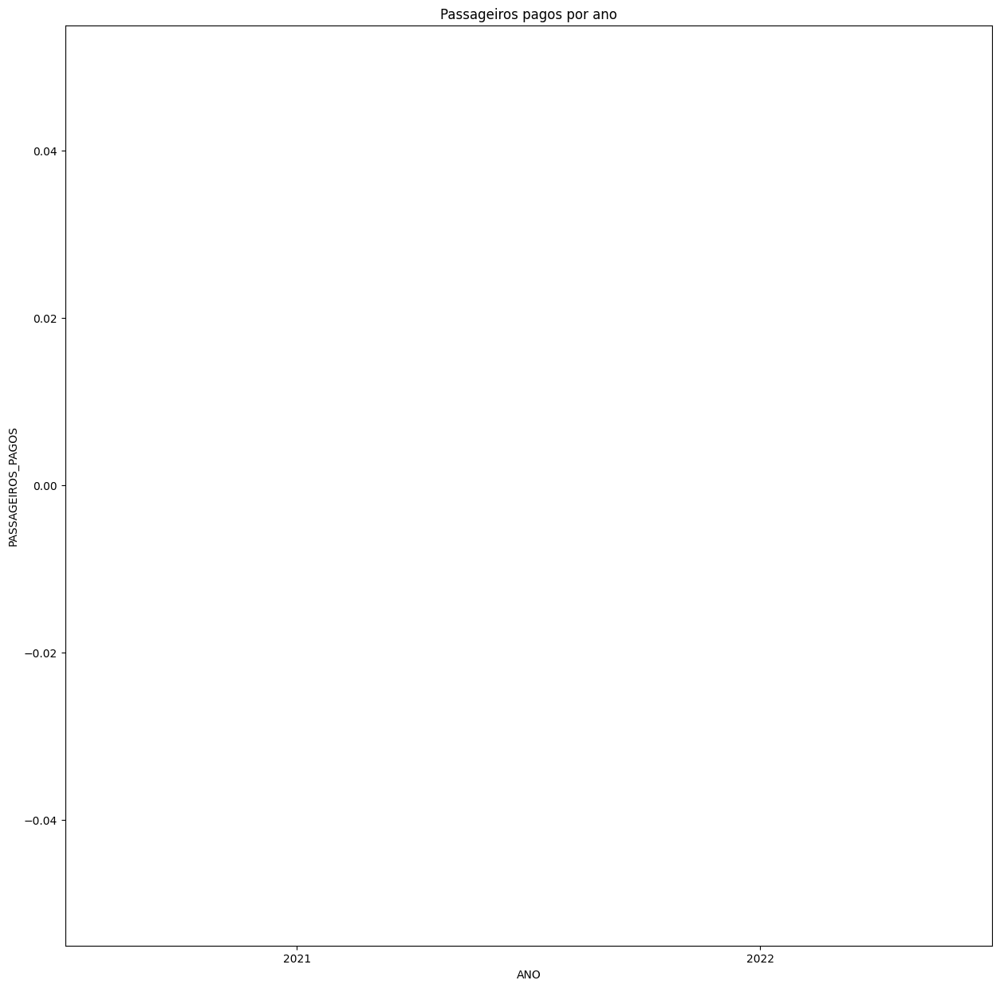





ITAPEMIRIM TRANSPORTES AEREOS LTDA


count     326.000000
mean     1277.647239
std      1159.269365
min         0.000000
25%       296.250000
50%       967.500000
75%      2001.250000
max      5382.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


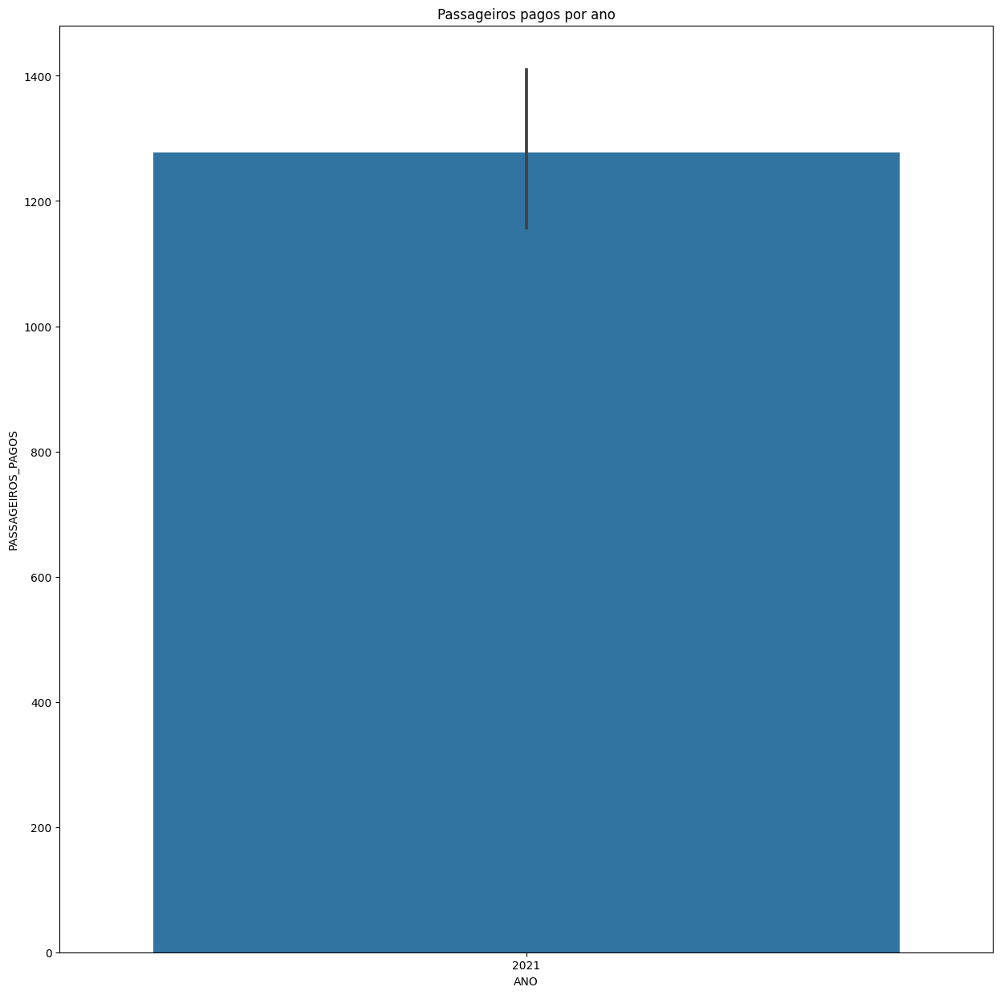





ITALIA TRANSPORTO AEREO S.P.A.


count      47.000000
mean     3038.297872
std      3675.729676
min         0.000000
25%         0.000000
50%         0.000000
75%      7190.000000
max      8769.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


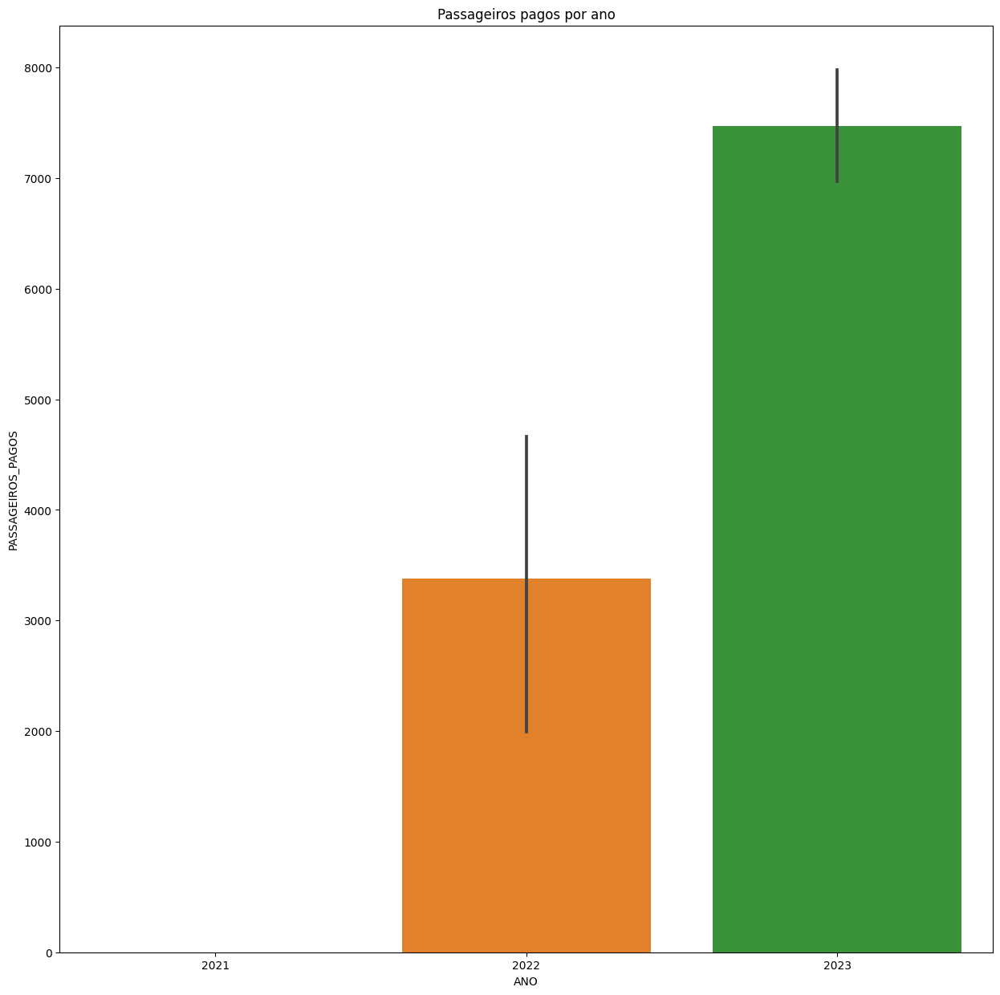





JETSMART AIRLINES S.A - ARGENTINA


count      12.000000
mean     2139.916667
std      1698.044086
min        43.000000
25%       155.250000
50%      2414.500000
75%      3431.000000
max      4578.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


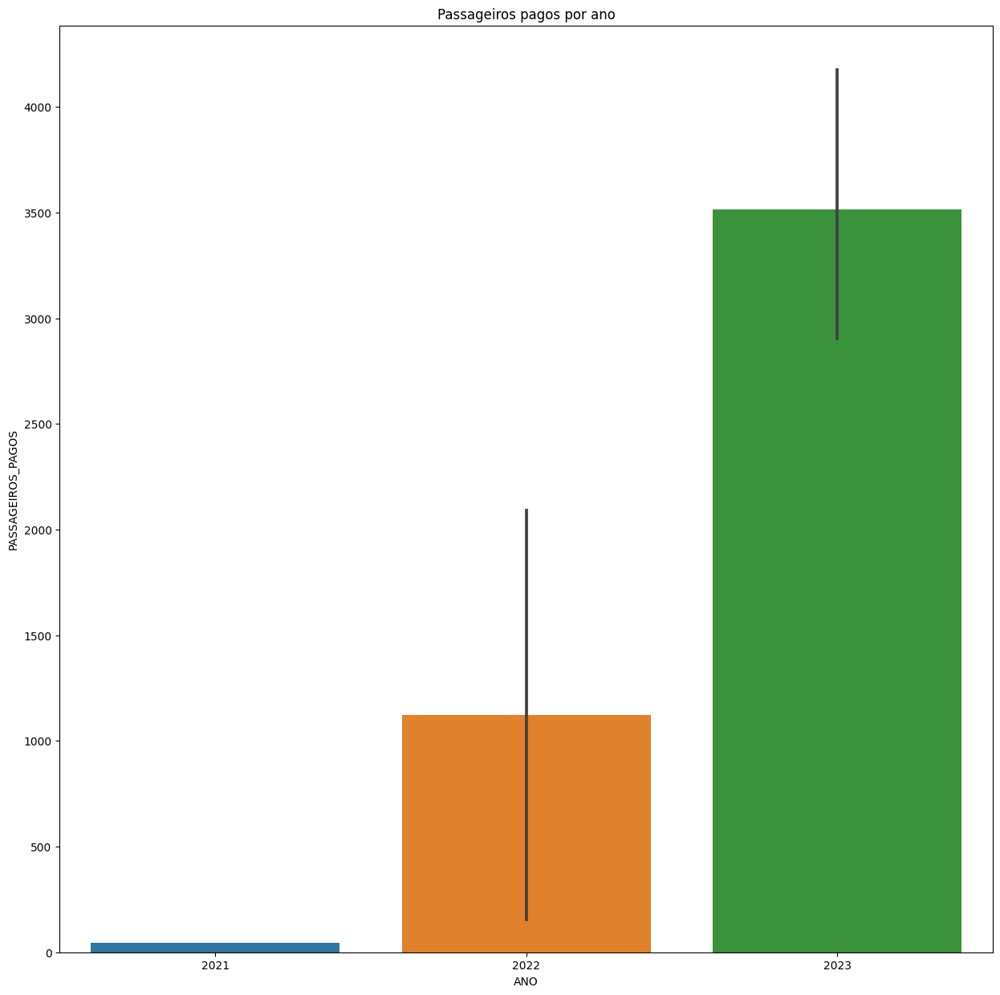





KAISER AIR


count    6.0
mean     0.0
std      0.0
min      0.0
25%      0.0
50%      0.0
75%      0.0
max      0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


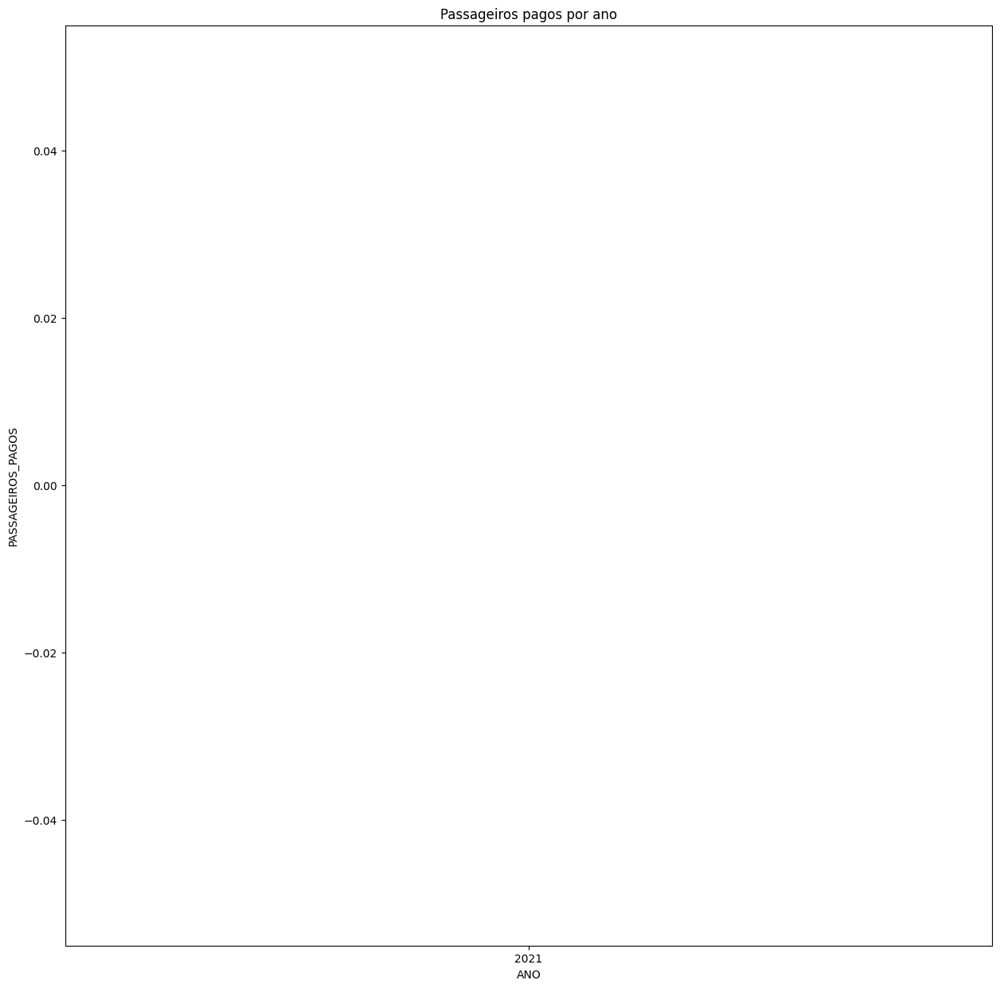





AEROSUCRE SA


count    39.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


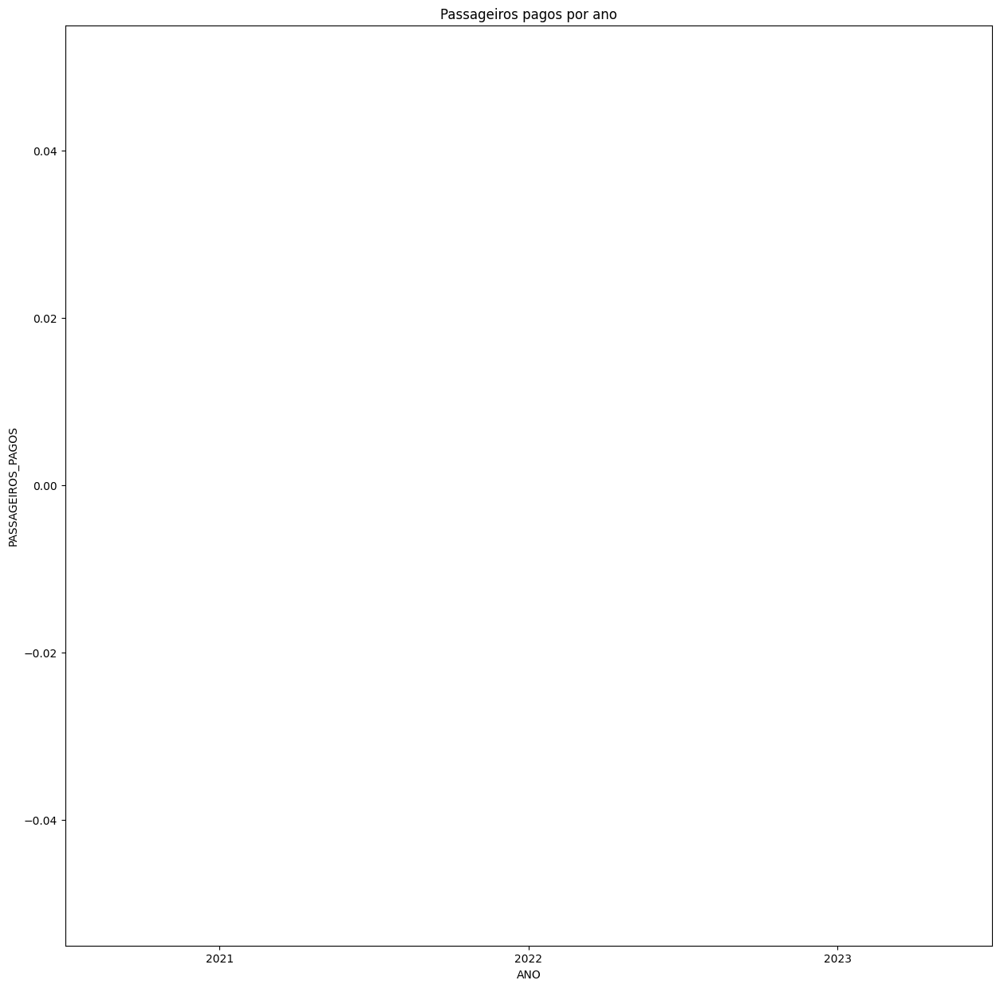





NEOS S.P.A


count    26.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


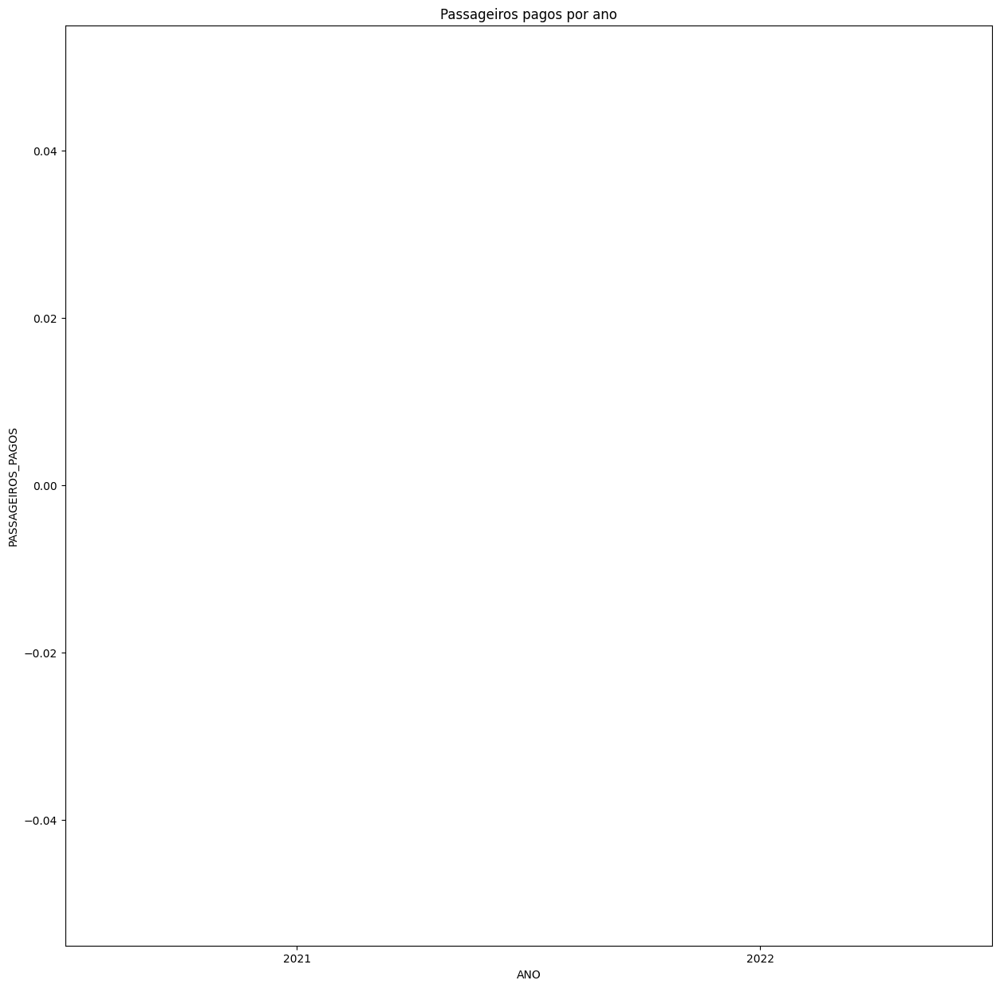





RADA AIRLINES


count    8.0
mean     0.0
std      0.0
min      0.0
25%      0.0
50%      0.0
75%      0.0
max      0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


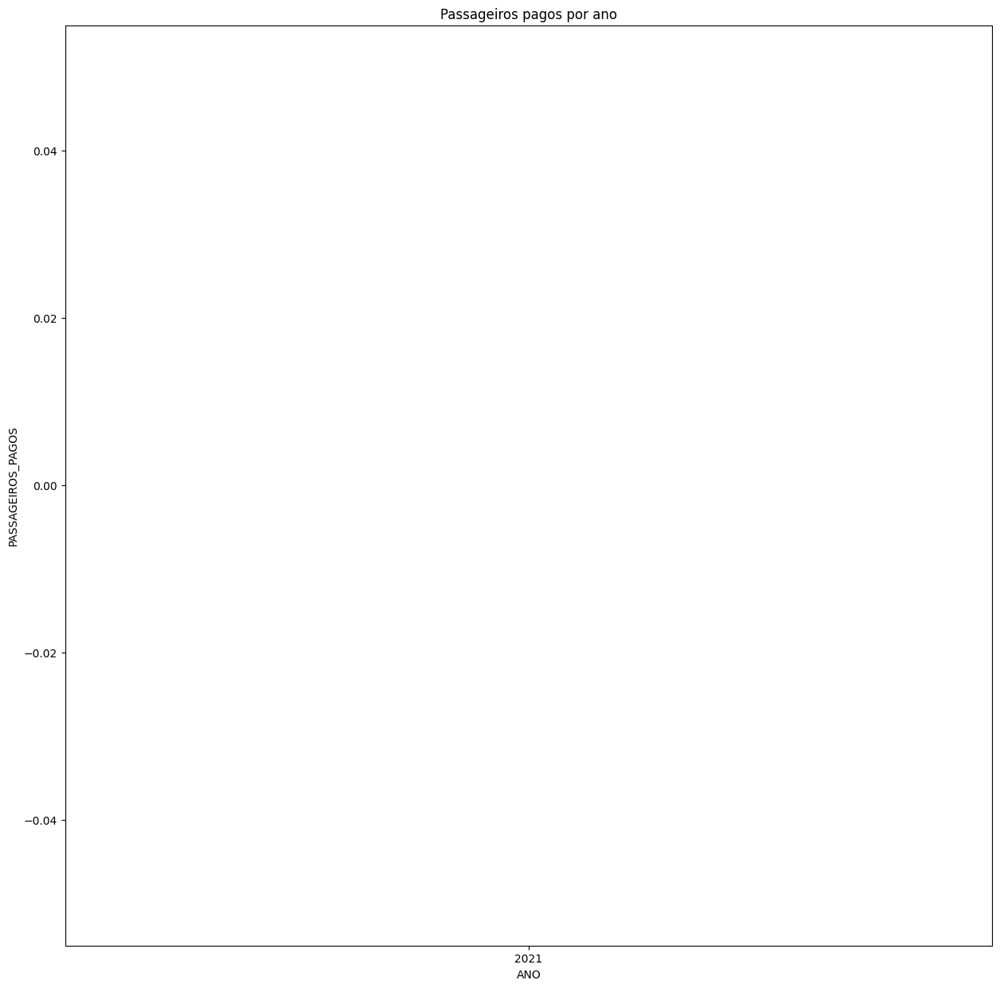





RUTAS AÉREAS, CA - RUTACA


count    15.000000
mean     14.666667
std      21.476454
min       0.000000
25%       0.000000
50%       0.000000
75%      43.000000
max      45.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


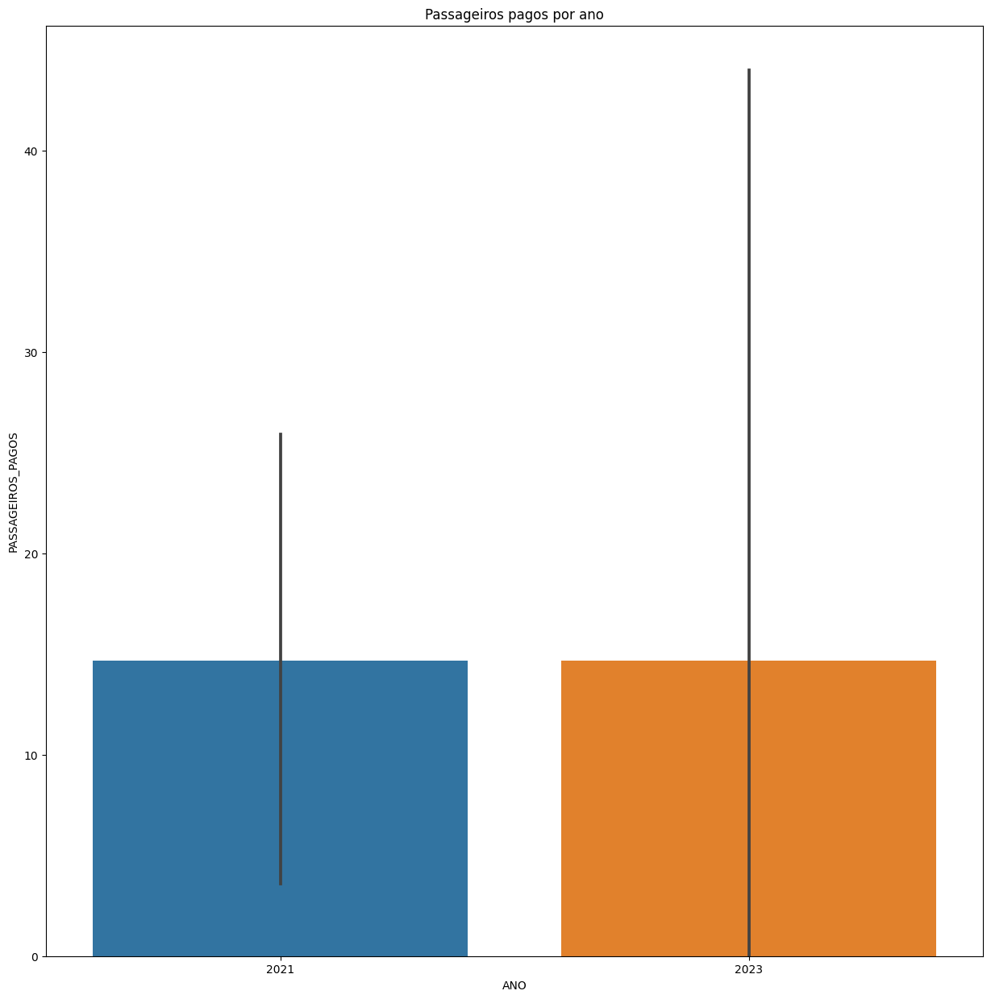





SCANDINAVIAN AIRLINES SYSTEM


count    6.0
mean     0.0
std      0.0
min      0.0
25%      0.0
50%      0.0
75%      0.0
max      0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


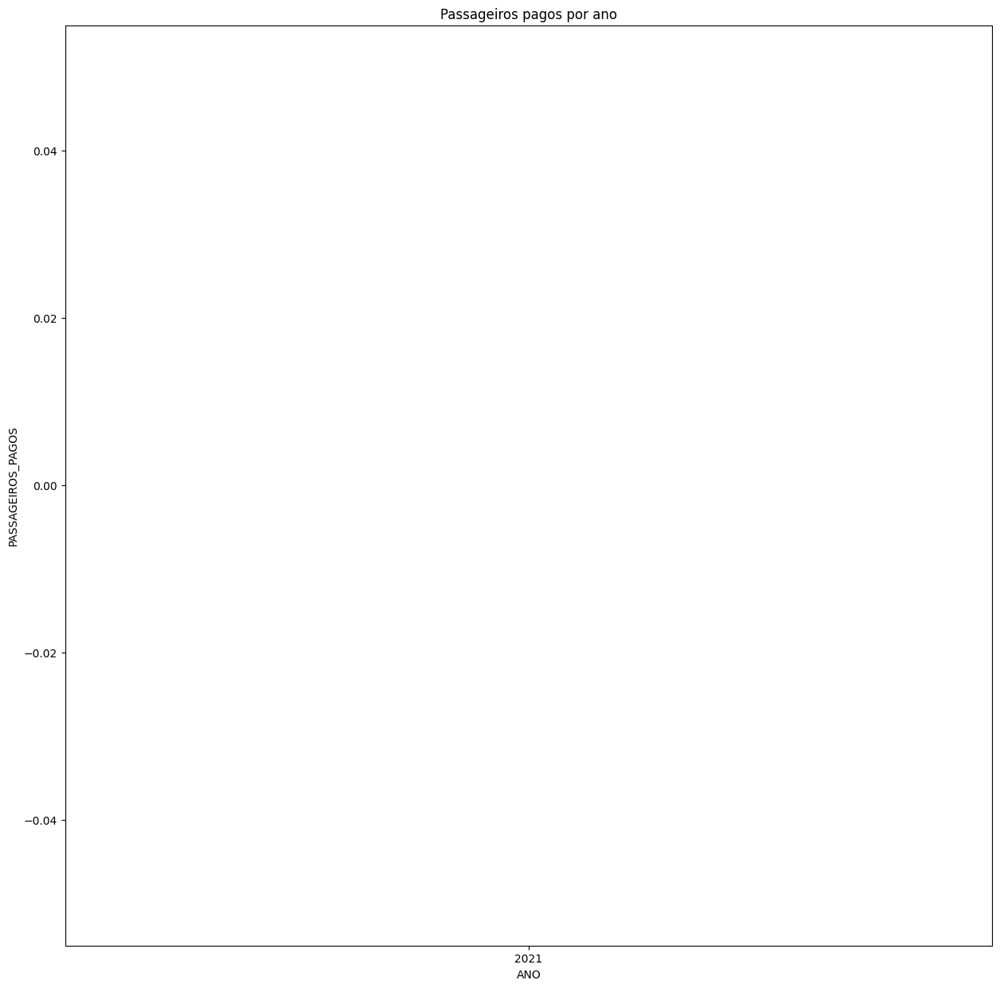

/usr/local/lib/python3.10/dist-packages/seaborn/algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))
/usr/local/lib/python3.10/dist-packages/numpy/lib/nanfunctions.py:1560: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a,






SERVICIOS AÉREOS PANAMERICANOS LTDA. SARPA S.A.S


count    0.0
mean     NaN
std      NaN
min      NaN
25%      NaN
50%      NaN
75%      NaN
max      NaN
Name: PASSAGEIROS_PAGOS, dtype: float64


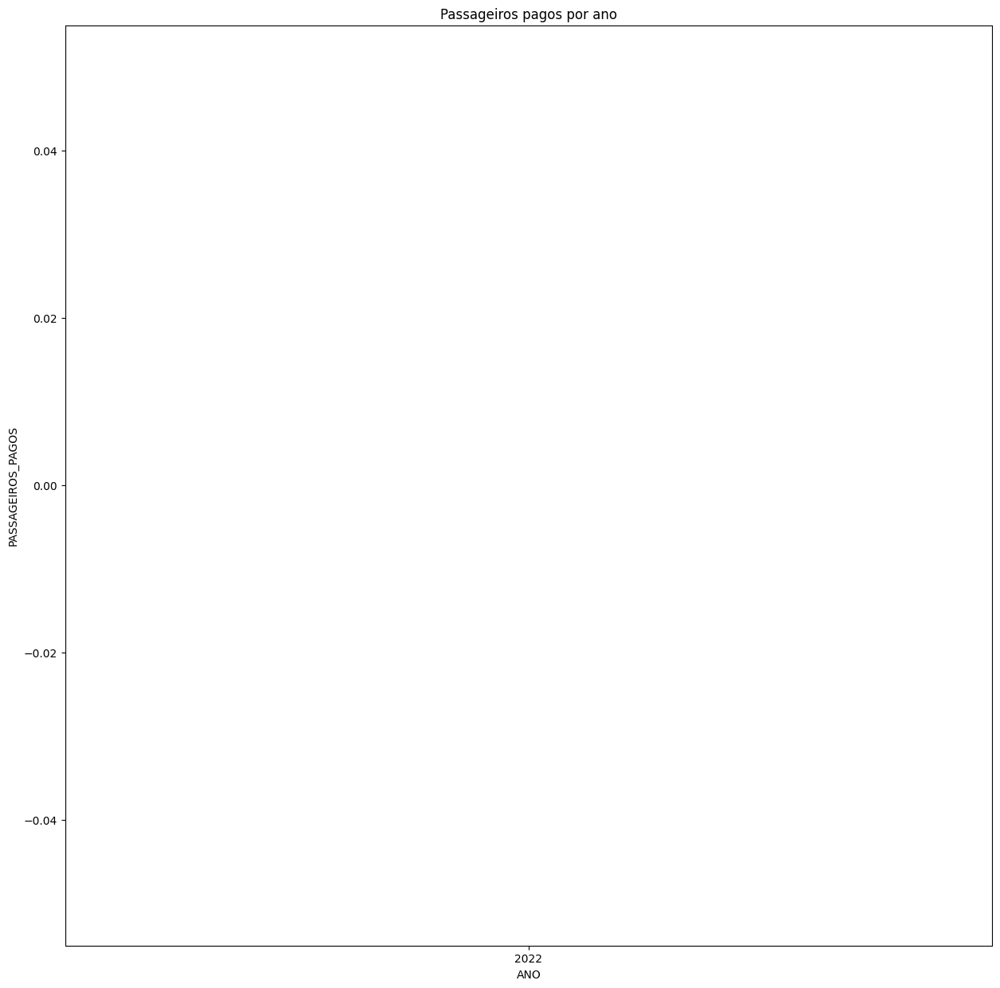





AIRBUS TRANSPORT INTERNATIONAL


count    8.0
mean     0.0
std      0.0
min      0.0
25%      0.0
50%      0.0
75%      0.0
max      0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


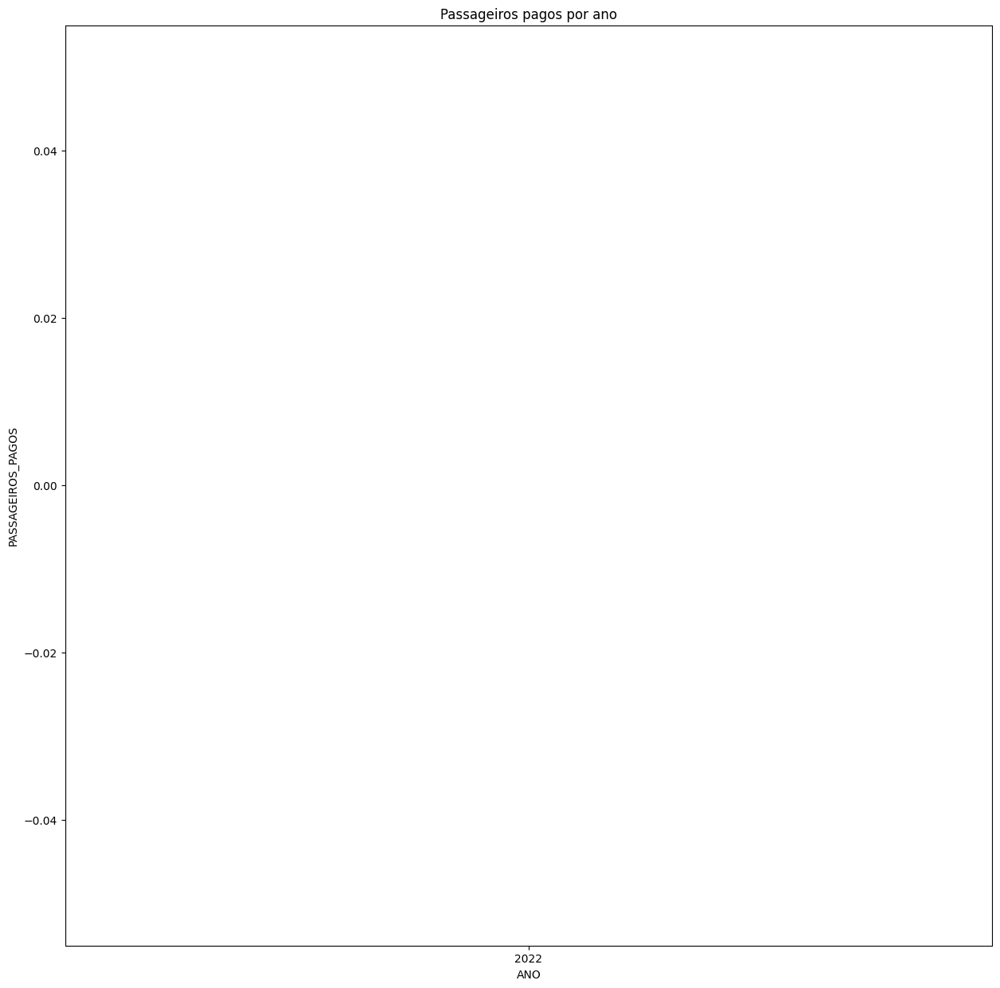





LLC AIR COMPANY AEROSTAN


count    32.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


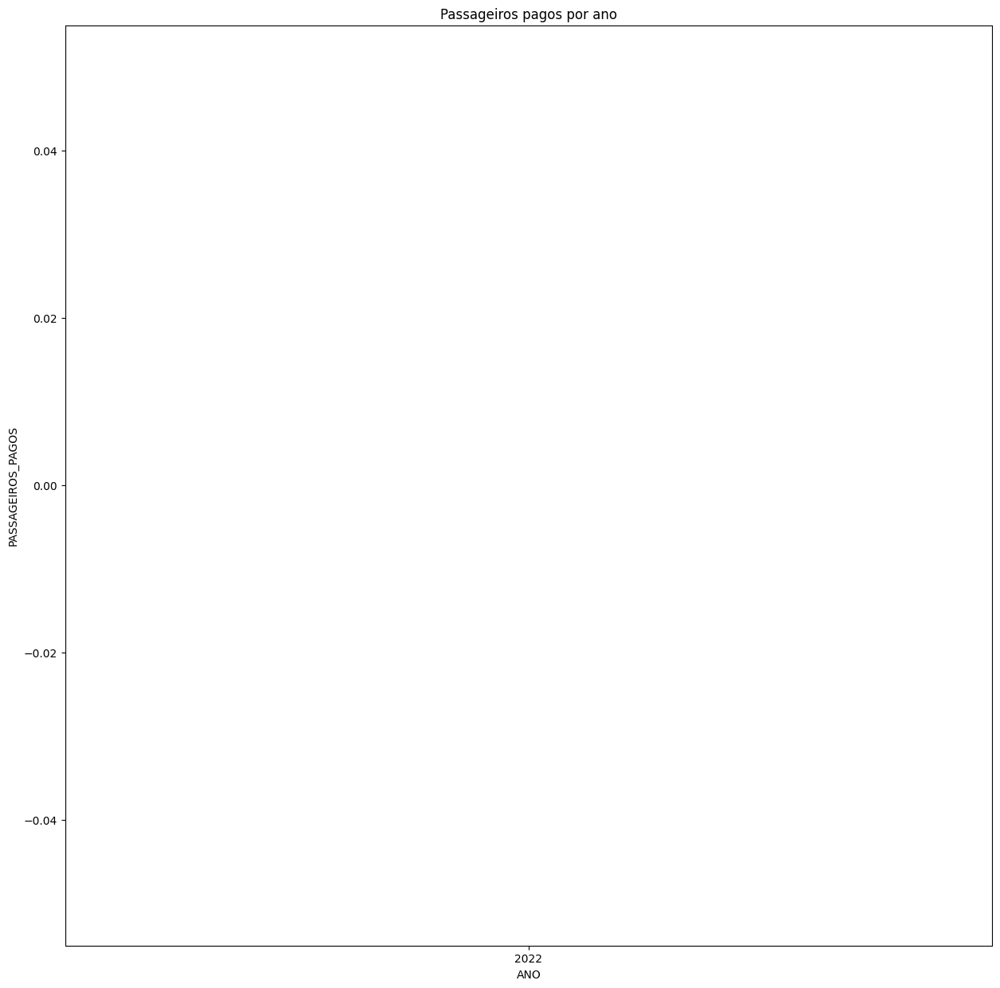





DREAMJET


count     4.000000
mean     30.500000
std      35.218366
min       0.000000
25%       0.000000
50%      30.500000
75%      61.000000
max      61.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


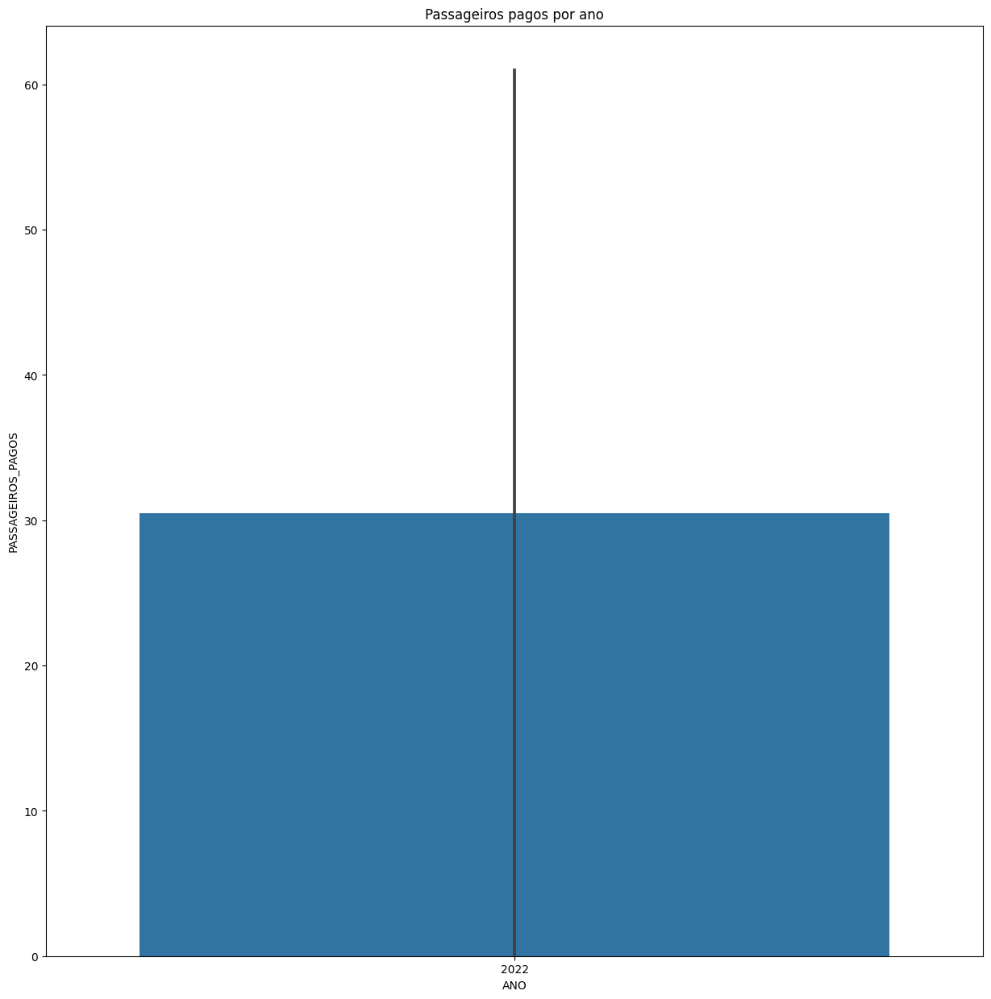





EURUS AVIATION S.A.P.I DE C.V


count     2.0
mean     32.0
std       0.0
min      32.0
25%      32.0
50%      32.0
75%      32.0
max      32.0
Name: PASSAGEIROS_PAGOS, dtype: float64


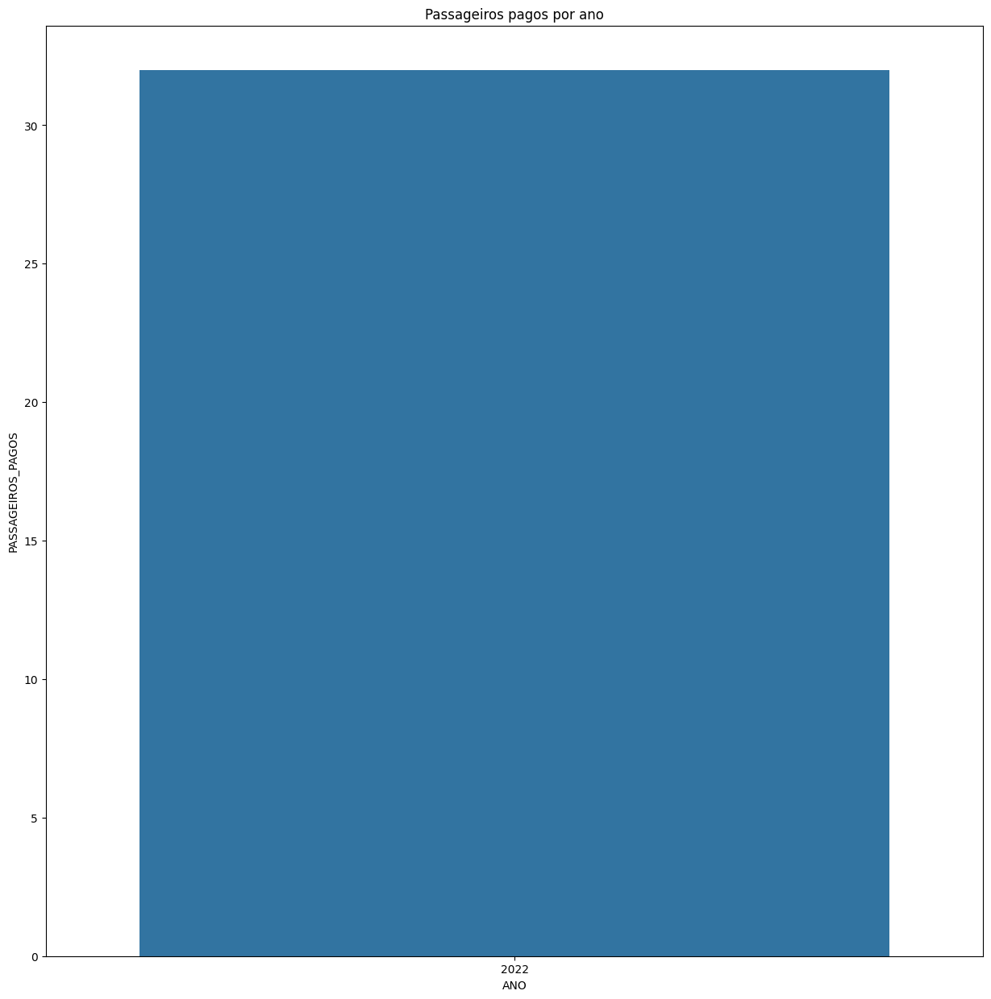





GLOBAL CROSSING AIRLINES, INC.


count    11.000000
mean     41.090909
std      32.794678
min       0.000000
25%       0.000000
50%      62.000000
75%      65.000000
max      70.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


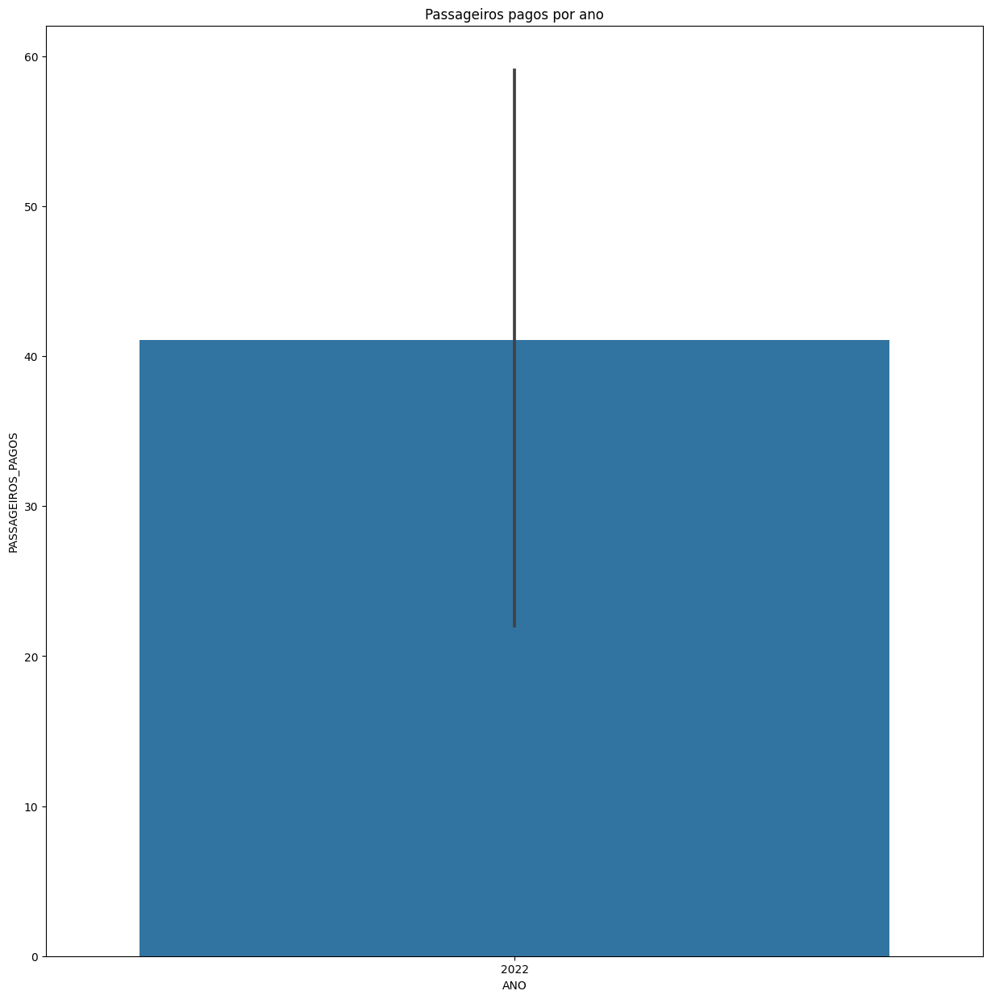





CHRONO JET INC


count    2.0
mean     0.0
std      0.0
min      0.0
25%      0.0
50%      0.0
75%      0.0
max      0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


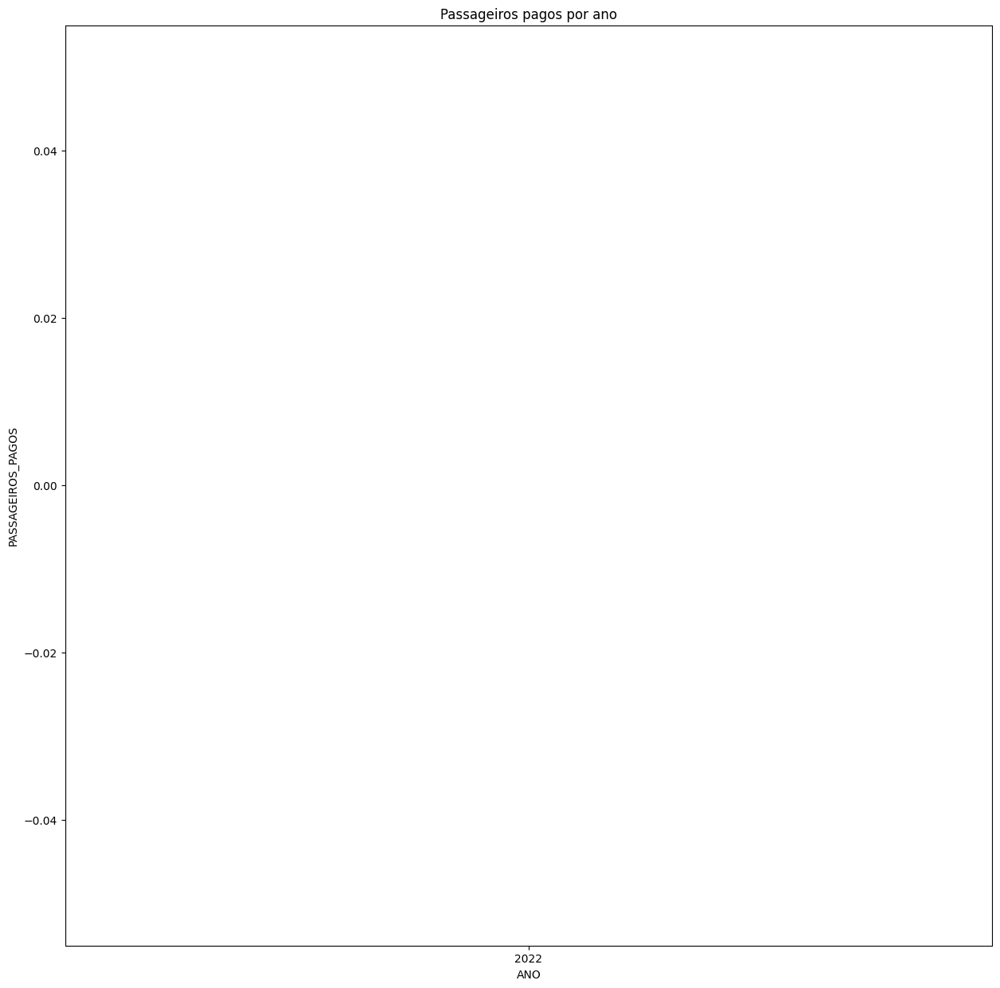





STAR UP S.A - STAR PERU


count     9.000000
mean     55.333333
std      12.500000
min      40.000000
25%      49.000000
50%      55.000000
75%      67.000000
max      76.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


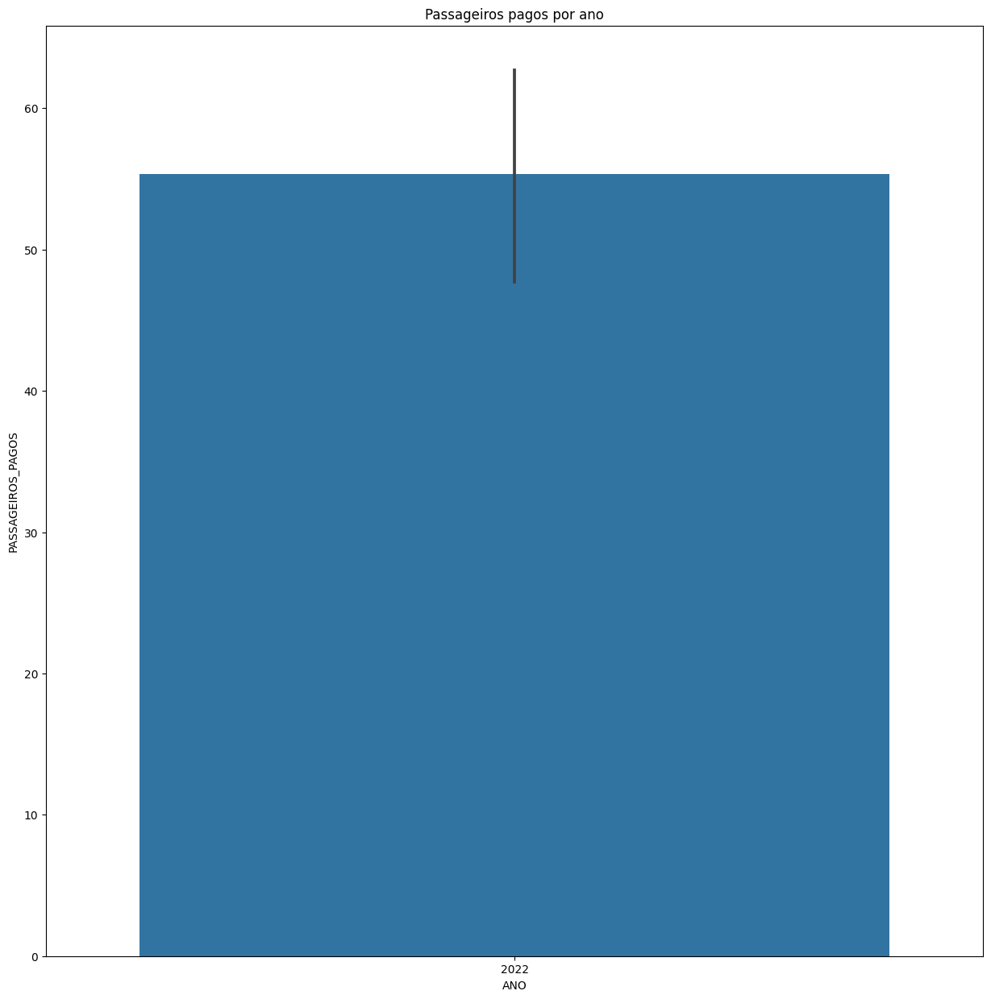





TRANSAVIAEXPORT AIRLINES


count    7.0
mean     0.0
std      0.0
min      0.0
25%      0.0
50%      0.0
75%      0.0
max      0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


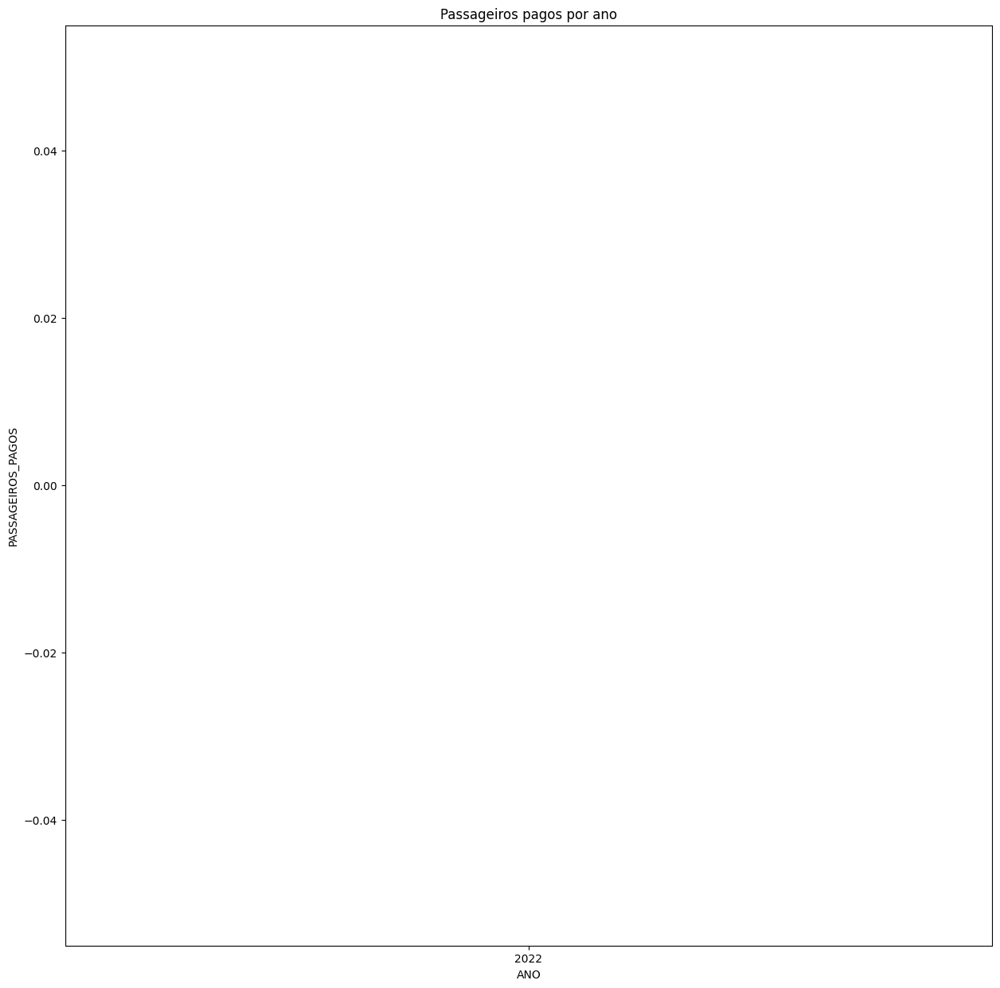





EUROPEAN CARGO LTD.


count    14.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


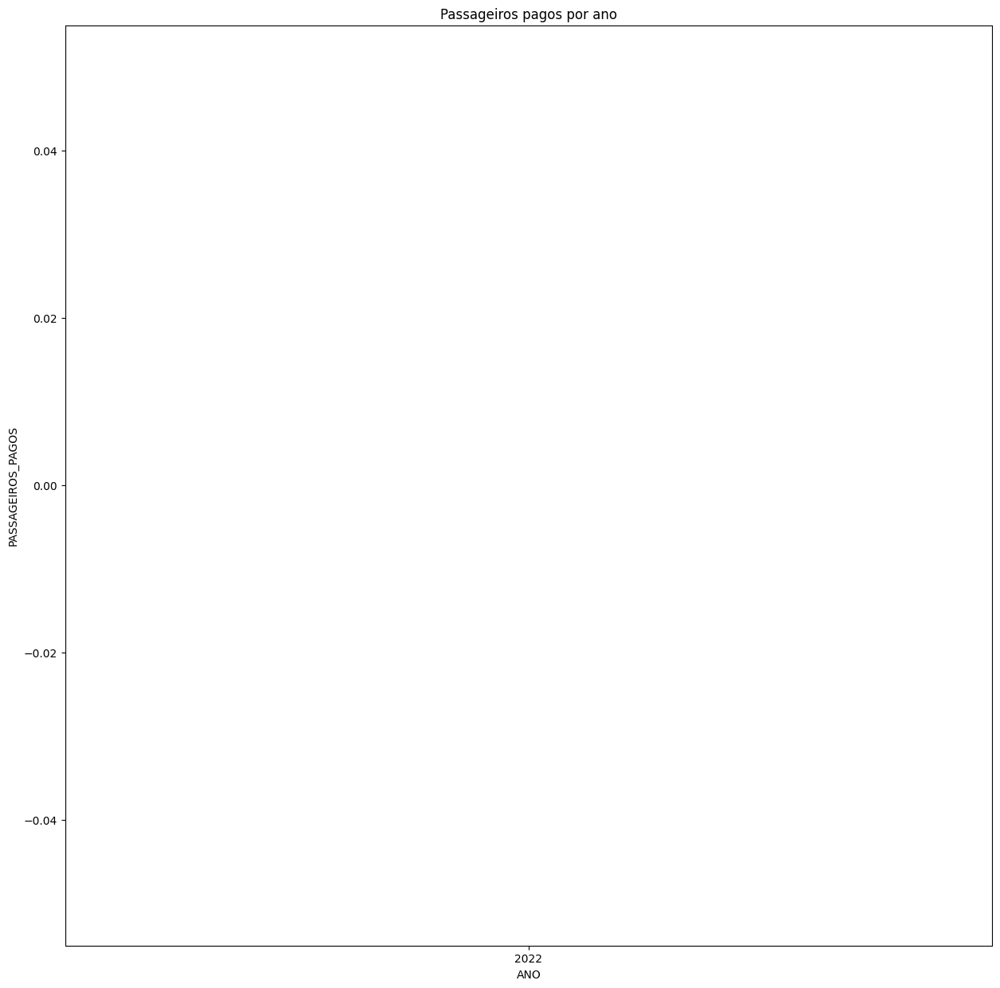





SILK WAY AIRLINES


count    7.0
mean     0.0
std      0.0
min      0.0
25%      0.0
50%      0.0
75%      0.0
max      0.0
Name: PASSAGEIROS_PAGOS, dtype: float64


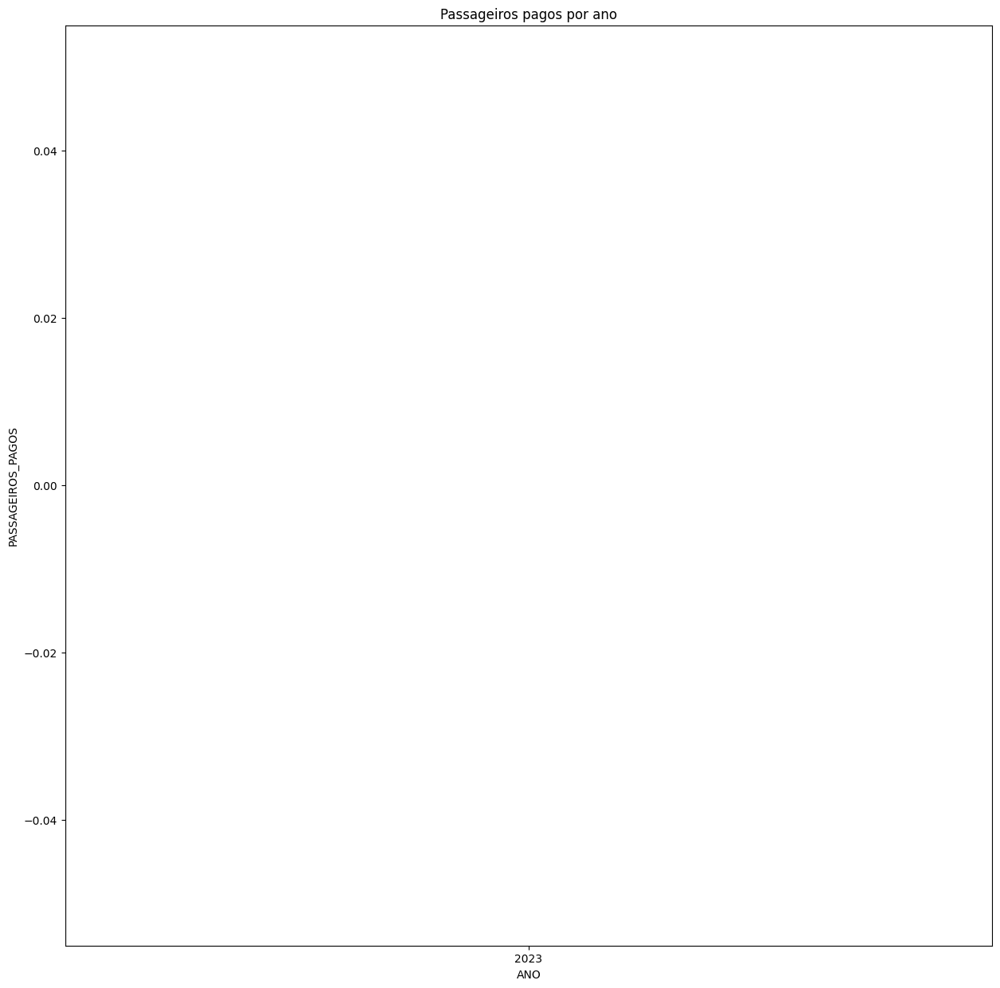





FREEDOM II BERMUDA LIMITED


count     4.0
mean     52.5
std      21.0
min      42.0
25%      42.0
50%      42.0
75%      52.5
max      84.0
Name: PASSAGEIROS_PAGOS, dtype: float64


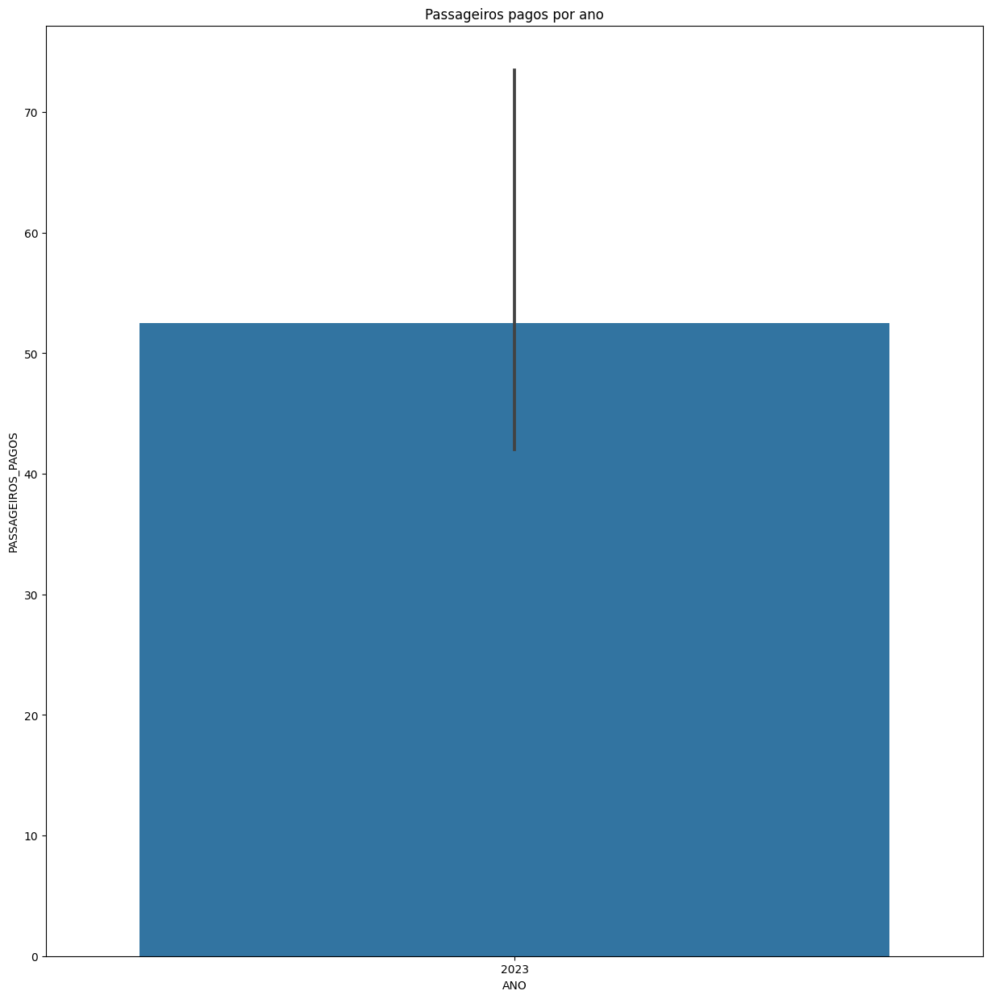





EQUINOXAIR S.A.S


count     2.000000
mean     82.500000
std       0.707107
min      82.000000
25%      82.250000
50%      82.500000
75%      82.750000
max      83.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


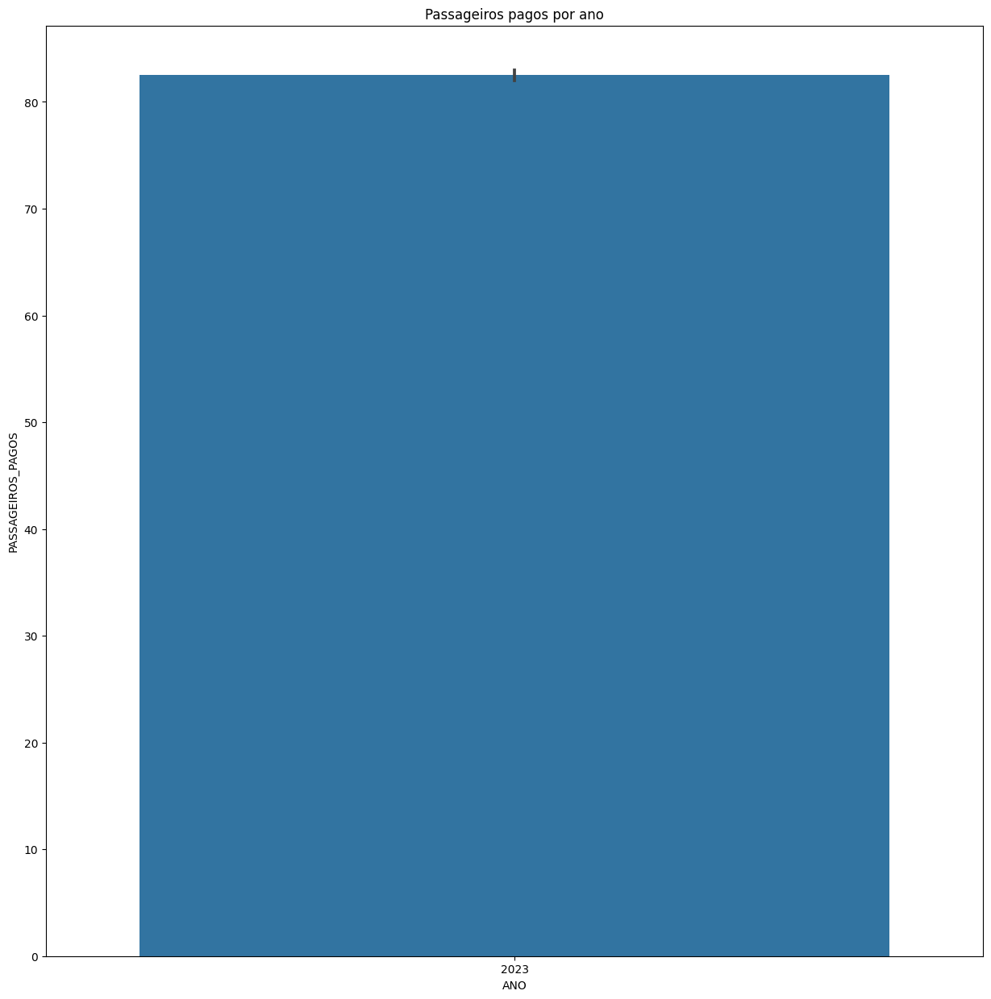





ORBEST S.A.


count      8.000000
mean      44.125000
std       81.861272
min        0.000000
25%        0.000000
50%        0.000000
75%       41.750000
max      186.000000
Name: PASSAGEIROS_PAGOS, dtype: float64


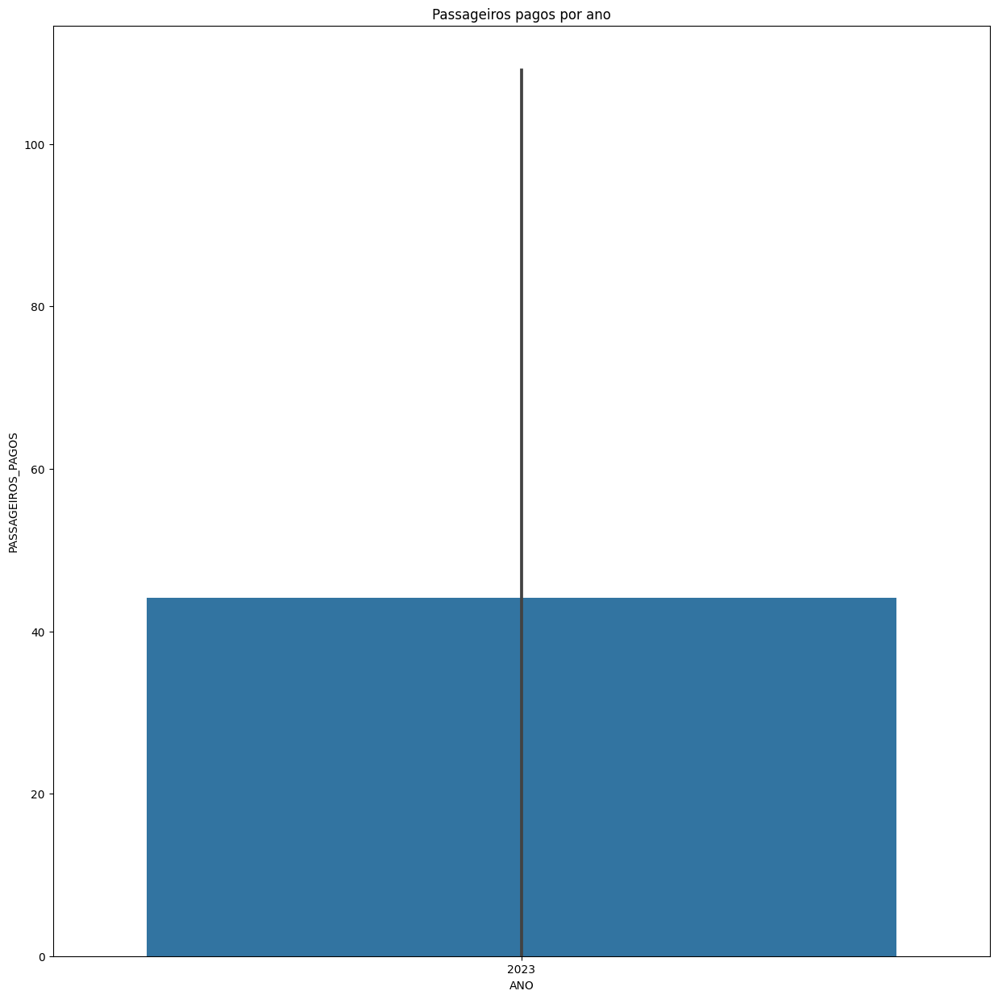

In [ ]:
import numpy as np

# retorna uma lista com os nomes únicos
nomes_unicos = df['EMPRESA_NOME'].unique()

# converte a lista em um array
array_nomes_unicos = np.array(nomes_unicos)
for empresa in array_nomes_unicos:
  emp = df[df['EMPRESA_NOME'] == empresa]
  fig = sns.barplot(x = 'ANO', y = 'PASSAGEIROS_PAGOS', data = emp)
  print('\n')
  print('\n')
  print(empresa)
  print('\n')
  print(emp['PASSAGEIROS_PAGOS'].describe())
  plt.title("Passageiros pagos por ano")
  fig.figure.set_size_inches(15, 15)
  plt.show()

A maior quantidade de passageiros pagos no dataset e maior soma de todos os passageiros pagos pertencea à TAM LINHAS AÉREAS S.A.

No gráfico em que temos a quantidade de passageiros pagos por ano vemos que o pico de 2019 destoa dos outros e portanto esse número não é válido para todos os anos. Vale resaltar que para companias aéreas com histórico entre 2019 e 2022 uma grande maioria tem uma queda brusca nos anos de 2020 e 2021, muito provavelmente devido a covid-19, mas também pode ser falta de dados, mas na TAM LINHAS AÉREAS a queda não é tão brusca.

# **2) Qual tipo de modelo poderia prever a quantidade de passageiros que uma determinada empresa terá no próximo mês? Apresente o modelo citado com seus resultados e interpretações.**

Um modelo interessante para prever resultados é o auto arima que prevê séries temporais

In [ ]:
gol_df = df[(df['EMPRESA_NOME']=='GOL LINHAS AÉREAS S.A. (EX- VRG LINHAS AÉREAS S.A.)') & (df['ANO']>2021)].dropna()
coiso = gol_df[['ANO','MES','PASSAGEIROS_PAGOS']]

<ipython-input-6-fc63d4bdc440>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  coiso['date'] = pd.to_datetime(coiso['ANO'].astype(str) + '-' + coiso['MES'].astype(str), format='%Y-%m')
<ipython-input-6-fc63d4bdc440>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  coiso.drop(['ANO', 'MES'], axis=1, inplace=True)


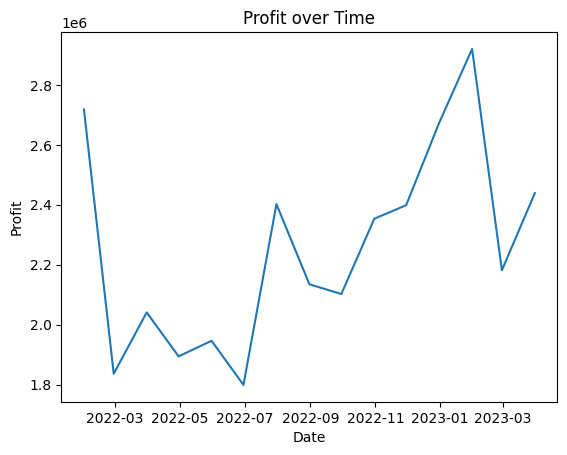

ADF Statistic: -2.8152102645830084
p-value: 0.05613372234800714
Critical Values: {'1%': -4.01203360058309, '5%': -3.1041838775510207, '10%': -2.6909873469387753}


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Mean Squared Error: 4838171921403.722


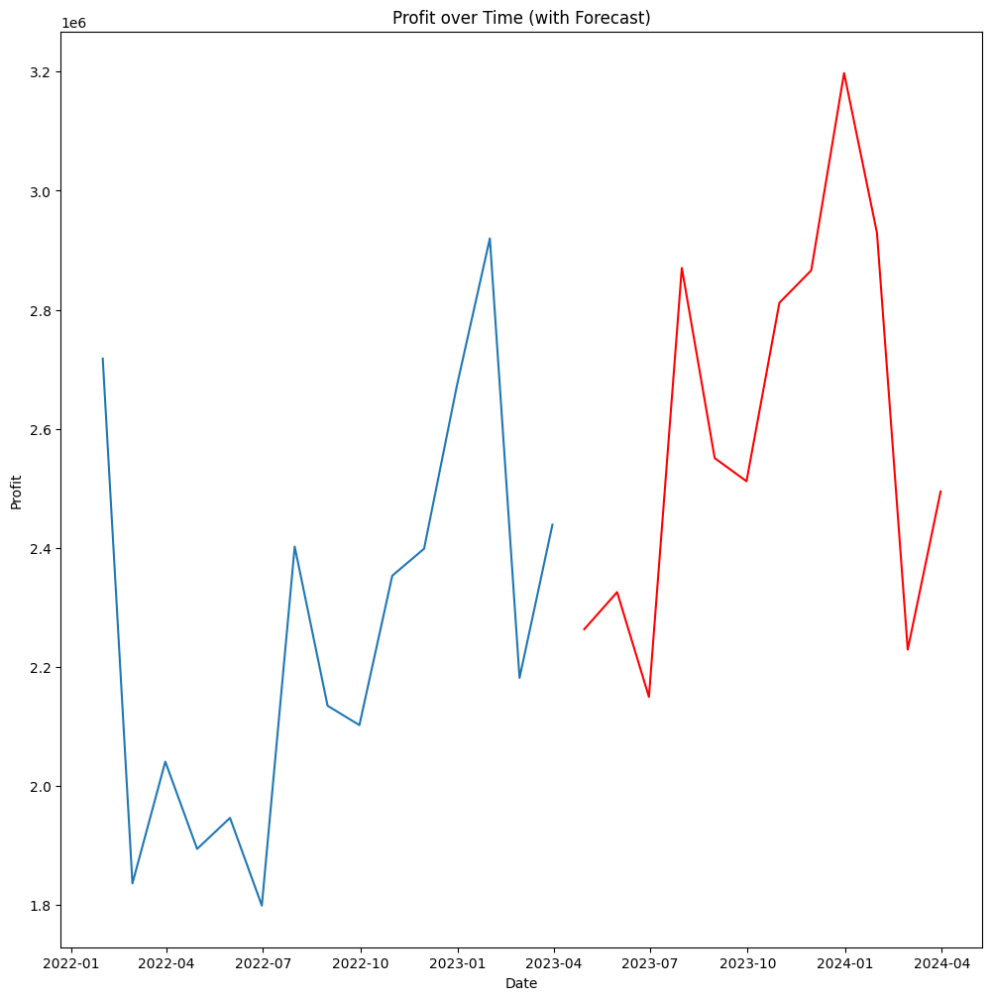

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.statespace.sarimax import SARIMAX

gol_df = df[(df['EMPRESA_NOME']=='GOL LINHAS AÉREAS S.A. (EX- VRG LINHAS AÉREAS S.A.)') & (df['ANO']>2021) ].dropna()
coiso = gol_df[['ANO','MES','PASSAGEIROS_PAGOS']]

# Combine year and month columns into a datetime index
coiso['date'] = pd.to_datetime(coiso['ANO'].astype(str) + '-' + coiso['MES'].astype(str), format='%Y-%m')
coiso.set_index('date', inplace=True)

# Drop year and month columns
coiso.drop(['ANO', 'MES'], axis=1, inplace=True)

# Resample the data by month and plot
coiso_monthly = coiso.resample('M').sum()
plt.plot(coiso_monthly)
plt.xlabel('Date')
plt.ylabel('Profit')
plt.title('Profit over Time')
plt.show()

# Test for stationarity using the ADF test
result = adfuller(coiso_monthly['PASSAGEIROS_PAGOS'])
print('ADF Statistic:', result[0])
print('p-value:', result[1])
print('Critical Values:', result[4])

# If data is not stationary, apply transformations to make it stationary
coiso_monthly_diff = coiso_monthly.diff().dropna()

# Choose a suitable SARIMA model based on data analysis
model = SARIMAX(coiso_monthly['PASSAGEIROS_PAGOS'], order=(1, 0, 1), seasonal_order=(1, 1, 1, 12))
result = model.fit()

# Evaluate the performance of the model using MSE
mse = ((result.resid)**2).mean()
print('Mean Squared Error:', mse)

# Use the fitted model to make predictions for future time periods
future_periods = 12 # Change this value as needed
last_date = coiso_monthly.index[-1]
forecast_index = pd.date_range(last_date, periods=future_periods+1, freq='MS')[1:]
exog_forecast = np.zeros((future_periods, 1)) # Replace with relevant exogenous variables
forecast = result.forecast(steps=future_periods, exog=exog_forecast)
forecast_df = pd.DataFrame(forecast, index=forecast_index, columns=['PASSAGEIROS_PAGOS'])

# Plot the original data and the forecasted data
plt.figure(figsize=(12, 12))
plt.plot(coiso_monthly)
plt.plot(forecast, color='r')
plt.xlabel('Date')
plt.ylabel('Profit')
plt.title('Profit over Time (with Forecast)')
plt.show()


In [ ]:
forecast

2023-04-30    2.263349e+06
2023-05-31    2.325654e+06
2023-06-30    2.149697e+06
2023-07-31    2.870240e+06
2023-08-31    2.550800e+06
2023-09-30    2.511912e+06
2023-10-31    2.811819e+06
2023-11-30    2.866088e+06
2023-12-31    3.197613e+06
2024-01-31    2.929246e+06
2024-02-29    2.229121e+06
2024-03-31    2.494635e+06
Freq: M, Name: predicted_mean, dtype: float64

O modelo para a empresa GOL LINHAS AÉREAS S.A. (EX- VRG LINHAS AÉREAS S.A.) a partir de 2021 apresenta que o próximo mês terá em torno de 2,263,349 passageiros pagos.

# **3) Cada empresa possui diversas rotas (AEROPORTO DE ORIGEM -> AEROPORTO DE DESTINO). Escolha 1 rota da GOL (Empresa = GLO) e faça um modelo para prever a quantidade de passageiros para os próximos 12 meses. Como se comportam as previsões?**

In [ ]:
data = df
data['rotas'] = data['AEROPORTO_DE_ORIGEM_NOME']+ "-" +data['AEROPORTO_DE_DESTINO_NOME']
rj_gru = data[data['rotas'] == 'RIO DE JANEIRO-GUARULHOS']

gol_df = rj_gru[(rj_gru['EMPRESA_NOME']=='GOL LINHAS AÉREAS S.A. (EX- VRG LINHAS AÉREAS S.A.)') & (rj_gru['ANO']>2021)].dropna()
coiso = gol_df[['ANO','MES','PASSAGEIROS_PAGOS']]

In [ ]:
data['rotas'].value_counts().sort_values()

ILHA DO SAL-BARCELONA               1
MARSEILLE-DAKAR                     1
DAKAR-FORTALEZA                     1
VÁRZEA GRANDE-CURITIBA              1
GUARULHOS-BROTAS                    1
                                 ... 
SÃO PAULO-RIO DE JANEIRO         3434
RIO DE JANEIRO-RIO DE JANEIRO    3524
RIO DE JANEIRO-SÃO PAULO         3873
GUARULHOS-RIO DE JANEIRO         5000
RIO DE JANEIRO-GUARULHOS         5807
Name: rotas, Length: 14389, dtype: int64

<ipython-input-14-fc63d4bdc440>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  coiso['date'] = pd.to_datetime(coiso['ANO'].astype(str) + '-' + coiso['MES'].astype(str), format='%Y-%m')
<ipython-input-14-fc63d4bdc440>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  coiso.drop(['ANO', 'MES'], axis=1, inplace=True)


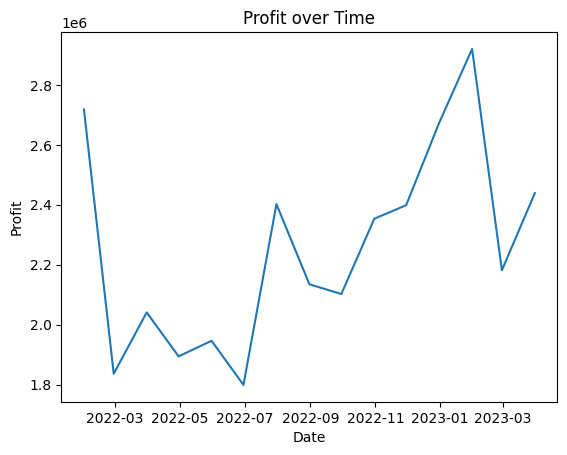

ADF Statistic: -2.8152102645830084
p-value: 0.05613372234800714
Critical Values: {'1%': -4.01203360058309, '5%': -3.1041838775510207, '10%': -2.6909873469387753}


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Mean Squared Error: 4838171921403.722


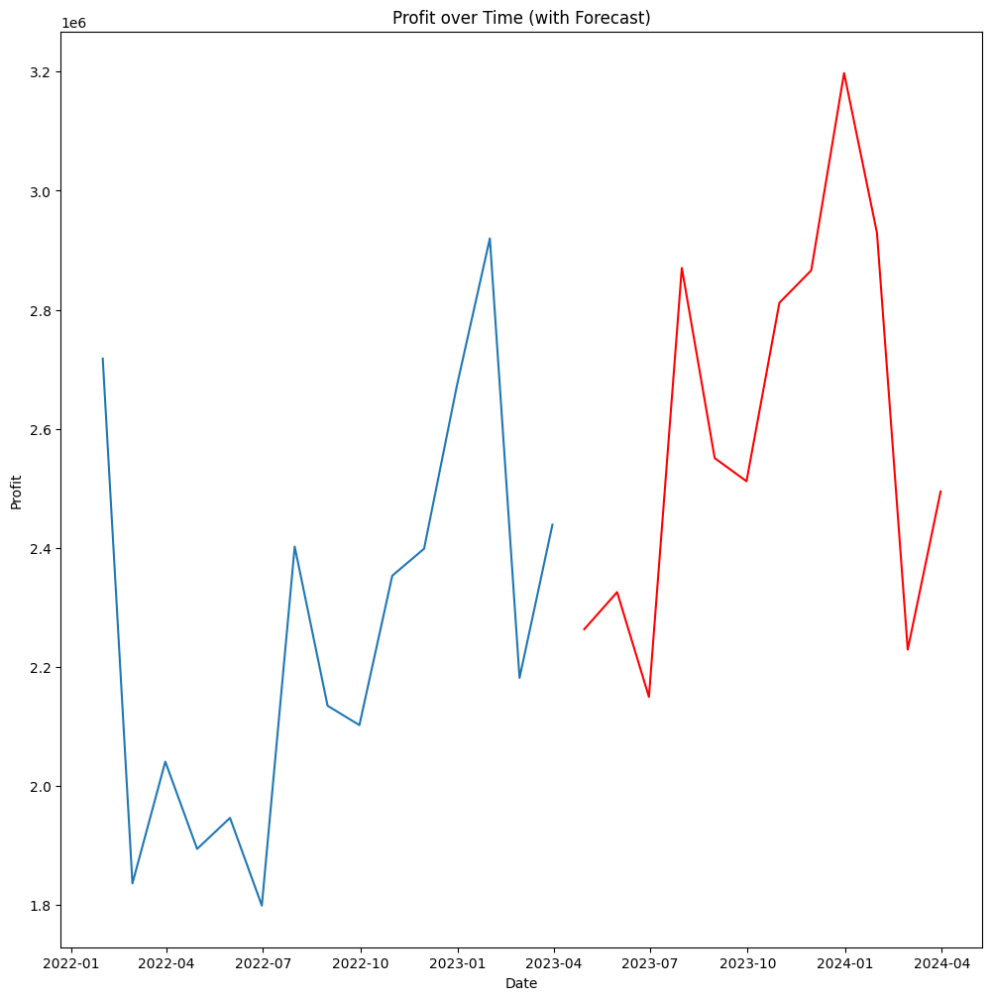

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.statespace.sarimax import SARIMAX

gol_df = df[(df['EMPRESA_NOME']=='GOL LINHAS AÉREAS S.A. (EX- VRG LINHAS AÉREAS S.A.)') & (df['ANO']>2021) ].dropna()
coiso = gol_df[['ANO','MES','PASSAGEIROS_PAGOS']]

# Combine year and month columns into a datetime index
coiso['date'] = pd.to_datetime(coiso['ANO'].astype(str) + '-' + coiso['MES'].astype(str), format='%Y-%m')
coiso.set_index('date', inplace=True)

# Drop year and month columns
coiso.drop(['ANO', 'MES'], axis=1, inplace=True)

# Resample the data by month and plot
coiso_monthly = coiso.resample('M').sum()
plt.plot(coiso_monthly)
plt.xlabel('Date')
plt.ylabel('Profit')
plt.title('Profit over Time')
plt.show()

# Test for stationarity using the ADF test
result = adfuller(coiso_monthly['PASSAGEIROS_PAGOS'])
print('ADF Statistic:', result[0])
print('p-value:', result[1])
print('Critical Values:', result[4])

# If data is not stationary, apply transformations to make it stationary
coiso_monthly_diff = coiso_monthly.diff().dropna()

# Choose a suitable SARIMA model based on data analysis
model = SARIMAX(coiso_monthly['PASSAGEIROS_PAGOS'], order=(1, 0, 1), seasonal_order=(1, 1, 1, 12))
result = model.fit()

# Evaluate the performance of the model using MSE
mse = ((result.resid)**2).mean()
print('Mean Squared Error:', mse)

# Use the fitted model to make predictions for future time periods
future_periods = 12 # Change this value as needed
last_date = coiso_monthly.index[-1]
forecast_index = pd.date_range(last_date, periods=future_periods+1, freq='MS')[1:]
exog_forecast = np.zeros((future_periods, 1)) # Replace with relevant exogenous variables
forecast = result.forecast(steps=future_periods, exog=exog_forecast)
forecast_df = pd.DataFrame(forecast, index=forecast_index, columns=['PASSAGEIROS_PAGOS'])

# Plot the original data and the forecasted data
plt.figure(figsize=(12, 12))
plt.plot(coiso_monthly)
plt.plot(forecast, color='r')
plt.xlabel('Date')
plt.ylabel('Profit')
plt.title('Profit over Time (with Forecast)')
plt.show()


In [ ]:
forecast

2023-04-30    2.263349e+06
2023-05-31    2.325654e+06
2023-06-30    2.149697e+06
2023-07-31    2.870240e+06
2023-08-31    2.550800e+06
2023-09-30    2.511912e+06
2023-10-31    2.811819e+06
2023-11-30    2.866088e+06
2023-12-31    3.197613e+06
2024-01-31    2.929246e+06
2024-02-29    2.229121e+06
2024-03-31    2.494635e+06
Freq: M, Name: predicted_mean, dtype: float64

Apo's concatenar os aeroportos para ober as rotas, decidi prever a quantidade de passageiros para a rota rio de janeiro guarulhos para empresa GOL. As previsões dos 12 meses seguintes tomam um formato semelhsante ao gráfico com os dados atuais, e assim obtemos a seguinte previsão:

- 2023-04-30 -> 2,263,349
- 2023-05-31 -> 2,325,654
- 2023-06-30 -> 2,149,697
- 2023-07-31 -> 2,870,240
- 2023-08-31 -> 2,550,800
- 2023-09-30 -> 2,511,912
- 2023-10-31 -> 2,811,819
- 2023-11-30 -> 2,866,088
- 2023-12-31 -> 3,197,613
- 2024-01-31 -> 2,929,246
- 2024-02-29 -> 2,229,121
- 2024-03-31 -> 2,494,635

# **4) Existem erros no dataset? Se sim, quais e por que? Se não, por que você acha que o dataset está perfeito?**

In [ ]:
# Porcentagem de dados faltantes
df.isnull().mean().round(4)*100

In [ ]:
estrangeira = df[df['EMPRESA_NACIONALIDADE']=='ESTRANGEIRA']
estrangeira.isnull().mean().round(4)*100

EMPRESA_SIGLA                       0.00
EMPRESA_NOME                        0.00
EMPRESA_NACIONALIDADE               0.00
ANO                                 0.00
MES                                 0.00
AEROPORTO_DE_ORIGEM_SIGLA           2.92
AEROPORTO_DE_ORIGEM_NOME            2.92
AEROPORTO_DE_ORIGEM_UF             56.93
AEROPORTO_DE_ORIGEM_REGIAO         56.93
AEROPORTO_DE_ORIGEM_PAIS            2.92
AEROPORTO_DE_ORIGEM_CONTINENTE      2.92
AEROPORTO_DE_DESTINO_SIGLA          0.00
AEROPORTO_DE_DESTINO_NOME           0.00
AEROPORTO_DE_DESTINO_UF            59.64
AEROPORTO_DE_DESTINO_REGIAO        59.64
AEROPORTO_DE_DESTINO_PAIS           0.00
AEROPORTO_DE_DESTINO_CONTINENTE     0.00
NATUREZA                            0.00
GRUPO_DE_VOO                        0.00
PASSAGEIROS_PAGOS                   3.42
PASSAGEIROS_GRATIS                  3.42
CARGA_PAGA_KG                       3.42
CARGA_GRATIS_KG                     3.42
CORREIO_KG                          3.42
ASK             

In [ ]:
aeroporto_estrangeir0 = df[df['AEROPORTO_DE_ORIGEM_PAIS']!='BRASIL']
aeroporto_estrangeir0.isnull().mean().round(4)*100

EMPRESA_SIGLA                        0.00
EMPRESA_NOME                         0.00
EMPRESA_NACIONALIDADE                0.00
ANO                                  0.00
MES                                  0.00
AEROPORTO_DE_ORIGEM_SIGLA            3.77
AEROPORTO_DE_ORIGEM_NOME             3.77
AEROPORTO_DE_ORIGEM_UF             100.00
AEROPORTO_DE_ORIGEM_REGIAO         100.00
AEROPORTO_DE_ORIGEM_PAIS             3.77
AEROPORTO_DE_ORIGEM_CONTINENTE       3.77
AEROPORTO_DE_DESTINO_SIGLA           0.00
AEROPORTO_DE_DESTINO_NOME            0.00
AEROPORTO_DE_DESTINO_UF             36.33
AEROPORTO_DE_DESTINO_REGIAO         36.33
AEROPORTO_DE_DESTINO_PAIS            0.00
AEROPORTO_DE_DESTINO_CONTINENTE      0.00
NATUREZA                             0.00
GRUPO_DE_VOO                         0.00
PASSAGEIROS_PAGOS                    7.69
PASSAGEIROS_GRATIS                   7.69
CARGA_PAGA_KG                        7.69
CARGA_GRATIS_KG                      7.69
CORREIO_KG                        

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 966166 entries, 0 to 966165
Data columns (total 38 columns):
 #   Column                           Non-Null Count   Dtype  
---  ------                           --------------   -----  
 0   EMPRESA_SIGLA                    966166 non-null  object 
 1   EMPRESA_NOME                     966166 non-null  object 
 2   EMPRESA_NACIONALIDADE            966166 non-null  object 
 3   ANO                              966166 non-null  int64  
 4   MES                              966166 non-null  int64  
 5   AEROPORTO_DE_ORIGEM_SIGLA        960952 non-null  object 
 6   AEROPORTO_DE_ORIGEM_NOME         960952 non-null  object 
 7   AEROPORTO_DE_ORIGEM_UF           827939 non-null  object 
 8   AEROPORTO_DE_ORIGEM_REGIAO       827939 non-null  object 
 9   AEROPORTO_DE_ORIGEM_PAIS         960952 non-null  object 
 10  AEROPORTO_DE_ORIGEM_CONTINENTE   960952 non-null  object 
 11  AEROPORTO_DE_DESTINO_SIGLA       966166 non-null  object 
 12  AE

Em uma primeira análise podemos perceber que o datset não está completo e a falta de dados é ainda mais perceptível para as empresas estrangeiras, e também para aeroportos estrangeiros não há nenhum dado de AEROPORTO_DE_ORIGEM_UF e AEROPORTO_DE_ORIGEM_REGIAO, de forma que essa coluna se refere para característics de território nacional.

Um outro detalhe é a quantidade de horas voadas ser considerada uma string, o que é claramente uma feature numérica.

# 5) A quantidade de passagens vendidas por cada empresa em uma mesma rota é comparável? Explique.

Existem algumas formas de comparar a quantidade de passageiros pagos, podemos comparar os períodos entre uma mesma empresa, comparar a quantidade entre as empresas por um histograma, ou comparar os períodos entre empresas diferentes

In [ ]:
data = df
data['rotas'] = data['AEROPORTO_DE_ORIGEM_NOME']+ "-" +data['AEROPORTO_DE_DESTINO_NOME']

<Axes: >

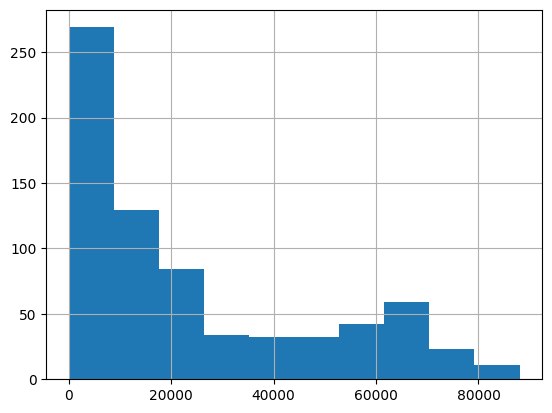

In [ ]:
data[(data['rotas'] == 'SÃO PAULO-RIO DE JANEIRO') & (data['EMPRESA_NOME'] == 'GOL LINHAS AÉREAS S.A. (EX- VRG LINHAS AÉREAS S.A.)')]['PASSAGEIROS_PAGOS'].hist()

In [ ]:
data[(data['rotas'] == 'SÃO PAULO-RIO DE JANEIRO') & (data['EMPRESA_NOME'] == 'GOL LINHAS AÉREAS S.A. (EX- VRG LINHAS AÉREAS S.A.)')]['PASSAGEIROS_PAGOS']

49882         0.0
49883      6132.0
49913     11005.0
49941         0.0
49942     11572.0
           ...   
960380    57045.0
960945      530.0
960954    52734.0
961464      156.0
961474    58675.0
Name: PASSAGEIROS_PAGOS, Length: 775, dtype: float64

In [ ]:
sp_rj = data[data['rotas'] == 'SÃO PAULO-RIO DE JANEIRO']
# retorna uma lista com os nomes únicos
nomes_unicos_sp_rj = sp_rj['EMPRESA_NOME'].unique()

# converte a lista em um array
array_nomes_unicos_sp_rj = np.array(nomes_unicos_sp_rj)

TAM-TRANSPORTE AEREOS MERIDIONAIS
/n


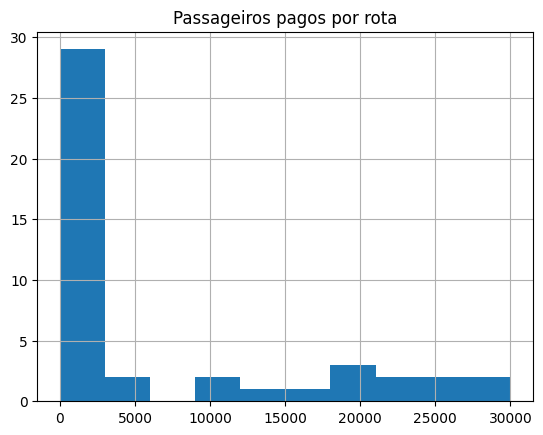

NORDESTE
/n


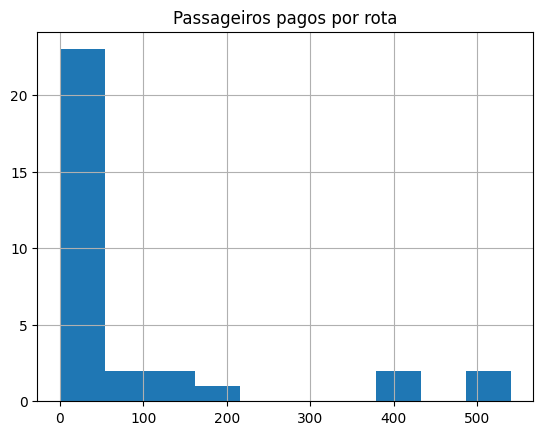

PANTANAL LINHAS AÉREAS S.A.
/n


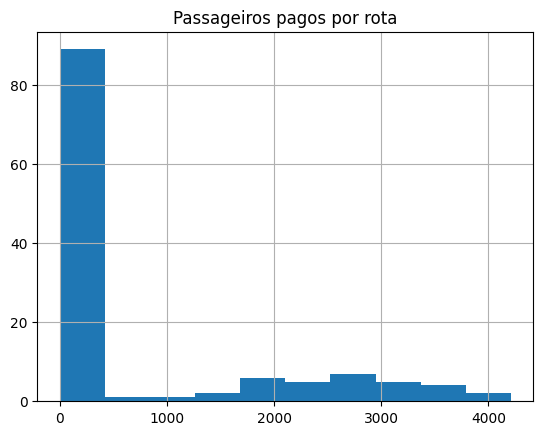

RIO SUL
/n


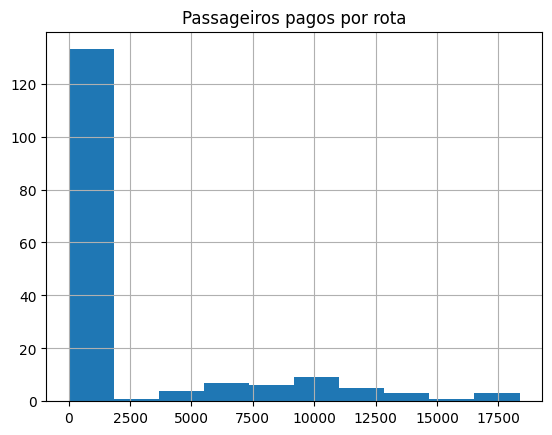

TAM LINHAS AÉREAS S.A.
/n


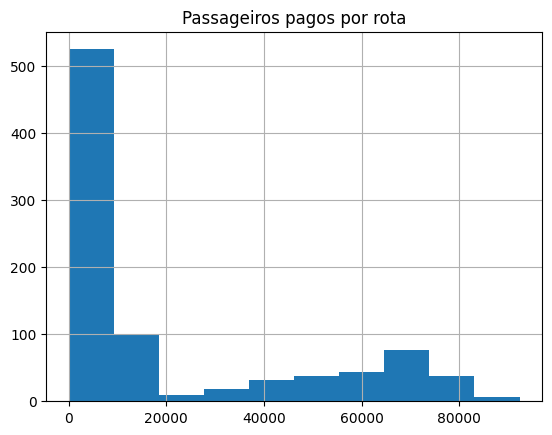

TRANSBRASIL
/n


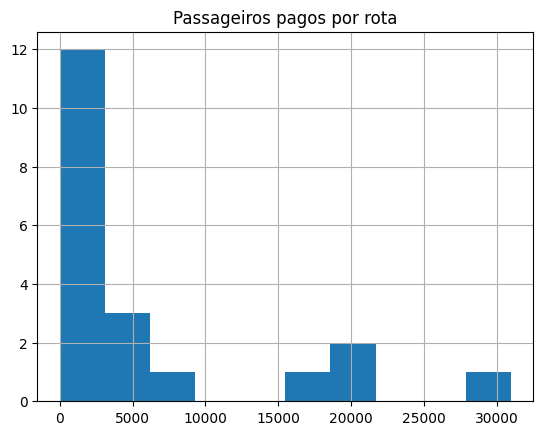

TOTAL LINHAS AÉREAS S.A.
/n


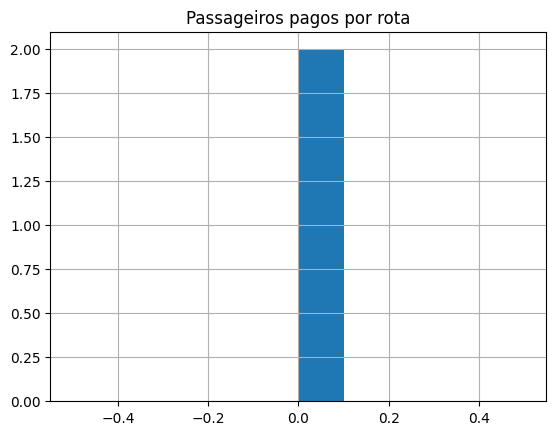

VARIG - VIAÇÃO AÉREA RIO-GRANDENSE
/n


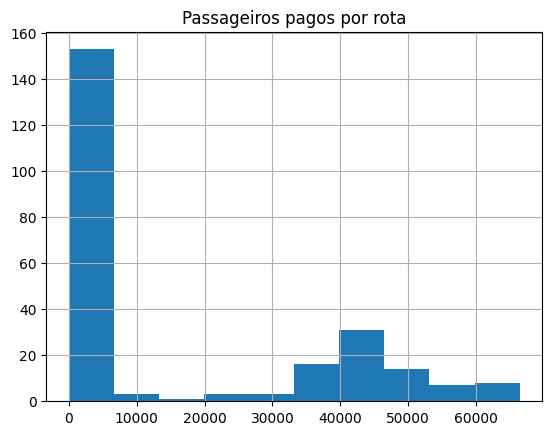

VIAÇÃO AÉREA SÃO PAULO
/n


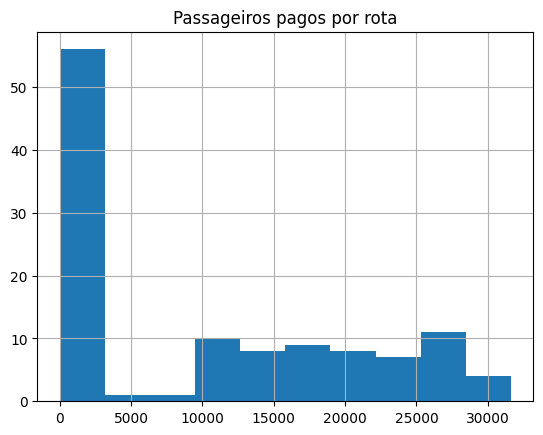

GOL LINHAS AÉREAS S.A. (EX- VRG LINHAS AÉREAS S.A.)
/n


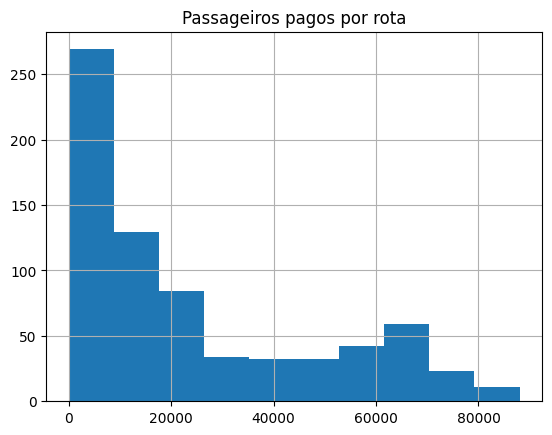

OCEANAIR LINHAS AÉREAS S.A. (AVIANCA)
/n


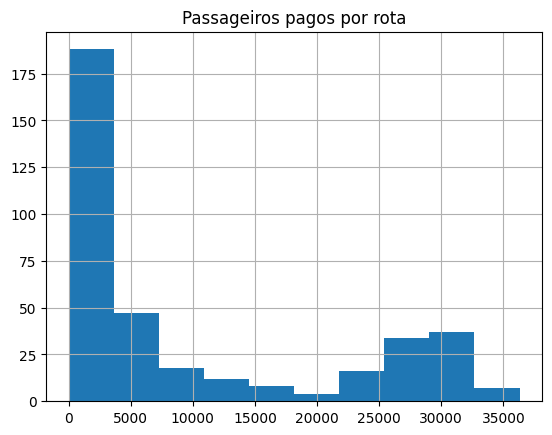

TEAM PARTICIPAÇÕES LTDA.
/n


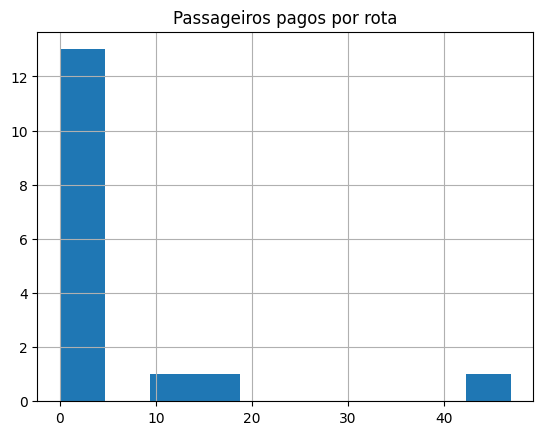

BRA
/n


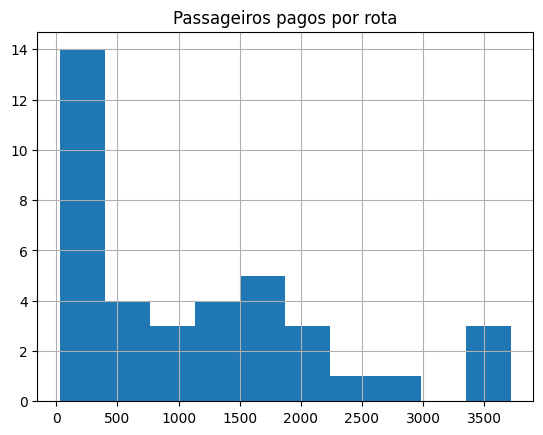

VRG LINHAS AÉREAS S.A.
/n


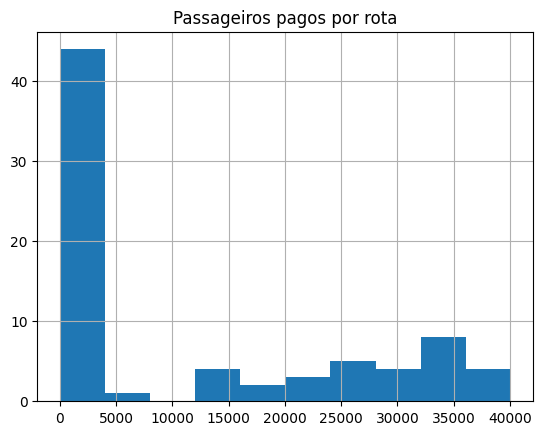

WEBJET PARTICIPAÇÕES S.A. (EX-LINHAS AÉREAS)
/n


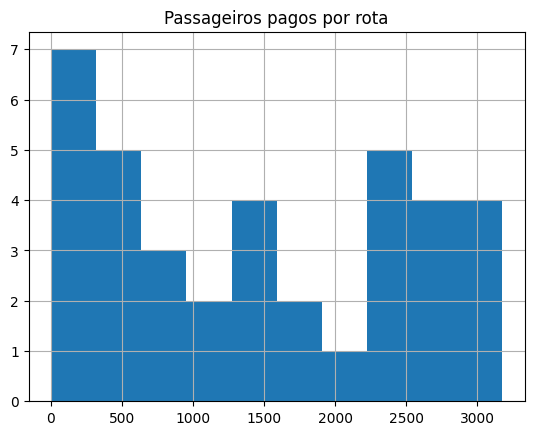

MAIS LINHAS AÉREAS S.A
/n


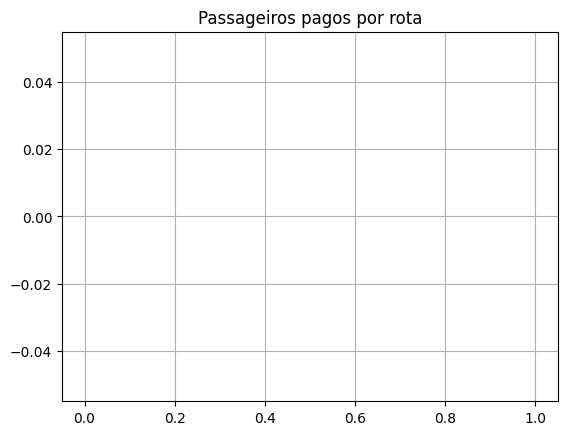

AZUL LINHAS AÉREAS BRASILEIRAS S/A
/n


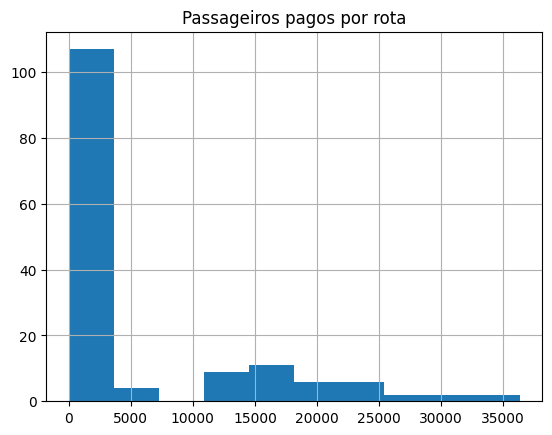

AZUL CONECTA LTDA. (EX TWO TAXI AEREO LTDA)
/n


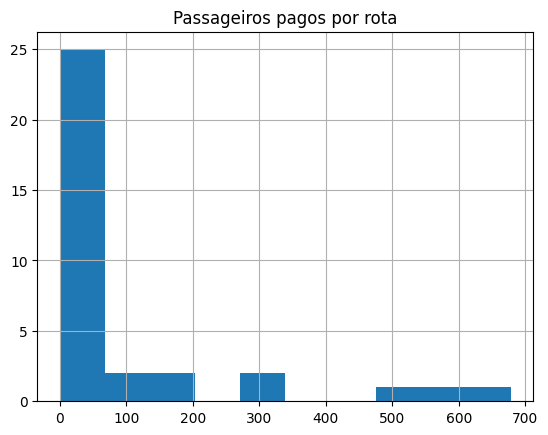

MAP TRANSPORTES AÉREOS LTDA.
/n


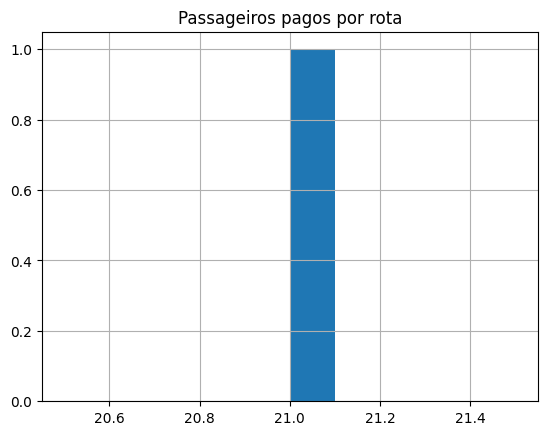

PASSAREDO TRANSPORTES AÉREOS S.A.
/n


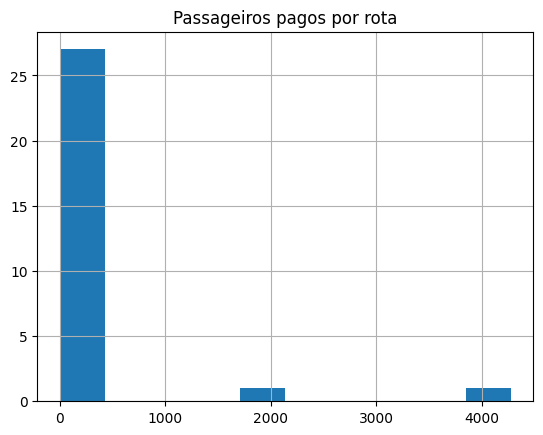

ITAPEMIRIM TRANSPORTES AEREOS LTDA
/n


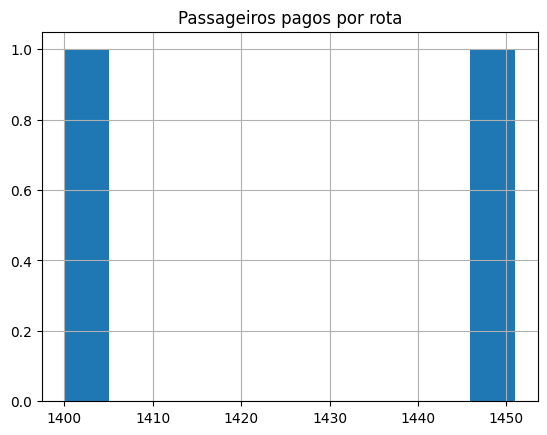

In [ ]:
for empresa in array_nomes_unicos_sp_rj:
  print(empresa)
  print("/n")
  plt.title("Passageiros pagos por rota")
  fig = sp_rj[(sp_rj['rotas'] == 'SÃO PAULO-RIO DE JANEIRO') & (sp_rj['EMPRESA_NOME'] == empresa)]['PASSAGEIROS_PAGOS'].hist()
  plt.show()

<ipython-input-29-12ada5420b02>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sp_rj_gol['ano-mes'] = sp_rj_gol['ANO'].astype(str) + '-' + sp_rj_gol['MES'].astype(str)
<ipython-input-29-12ada5420b02>:6: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  grouped_df = sp_rj_gol.groupby('ano-mes').sum()


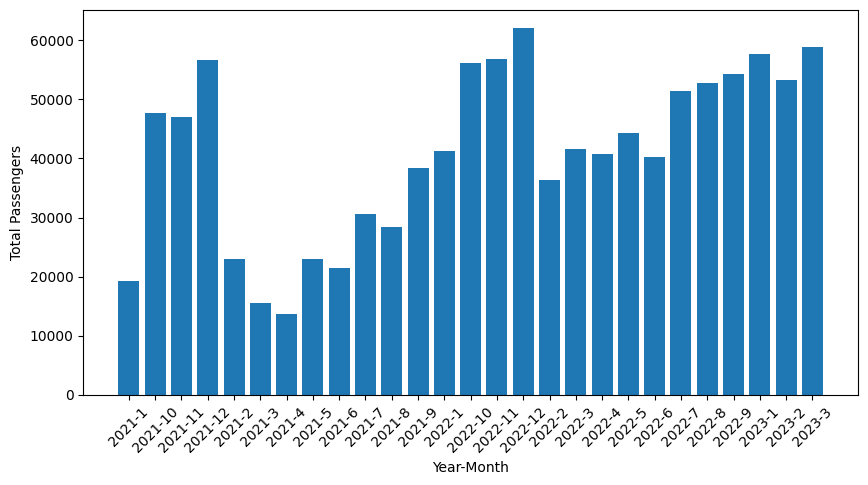

In [ ]:
sp_rj_gol = data[(data['rotas'] == 'SÃO PAULO-RIO DE JANEIRO') & (data['EMPRESA_NOME'] == 'GOL LINHAS AÉREAS S.A. (EX- VRG LINHAS AÉREAS S.A.)') & (data['ANO']>2020)]
# Create a new column for year-month
sp_rj_gol['ano-mes'] = sp_rj_gol['ANO'].astype(str) + '-' + sp_rj_gol['MES'].astype(str)

# Group the data by year-month and compute the total passengers for each period
grouped_df = sp_rj_gol.groupby('ano-mes').sum()

# Create a bar plot of the total passengers by year-month
plt.figure(figsize=(10, 5))
plt.bar(grouped_df.index, grouped_df['PASSAGEIROS_PAGOS'])
plt.xticks(rotation=45)
plt.xlabel('Year-Month')
plt.ylabel('Total Passengers')
plt.show()

<ipython-input-34-784096fb0dfc>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sp_rj_tam['ano-mes'] = sp_rj_tam['ANO'].astype(str) + '-' + sp_rj_tam['MES'].astype(str)
<ipython-input-34-784096fb0dfc>:6: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  grouped_df = sp_rj_tam.groupby('ano-mes').sum()


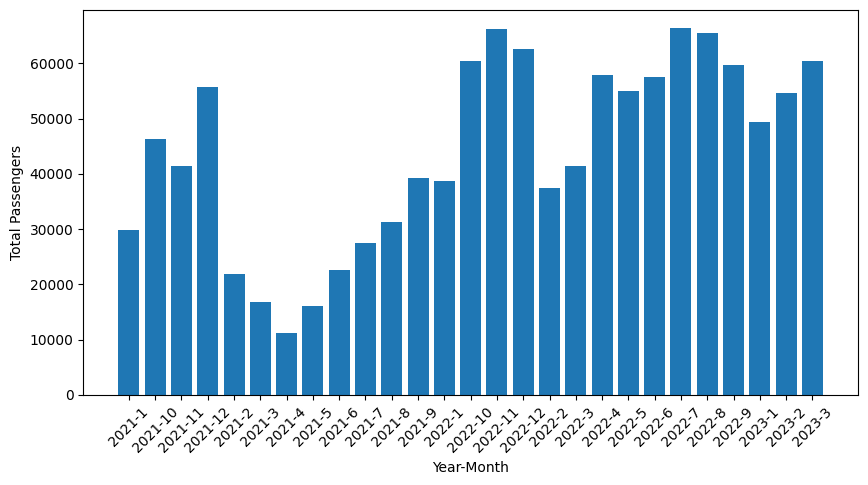

In [ ]:
sp_rj_tam = data[(data['rotas'] == 'SÃO PAULO-RIO DE JANEIRO') & (data['EMPRESA_NOME'] == 'TAM LINHAS AÉREAS S.A.') & (data['ANO']>2020)]
# Create a new column for year-month
sp_rj_tam['ano-mes'] = sp_rj_tam['ANO'].astype(str) + '-' + sp_rj_tam['MES'].astype(str)

# Group the data by year-month and compute the total passengers for each period
grouped_df = sp_rj_tam.groupby('ano-mes').sum()

# Create a bar plot of the total passengers by year-month
plt.figure(figsize=(10, 5))
plt.bar(grouped_df.index, grouped_df['PASSAGEIROS_PAGOS'])
plt.xticks(rotation=45)
plt.xlabel('Year-Month')
plt.ylabel('Total Passengers')
plt.show()

Por causa da visualização eu acabei restringindo o período de tempo para a partir de 2021.

Nos gráficos plotados podemos comparar a quantidade de passagens vendidas no total entre as empresas consultando o histograma. Também comparamos GOL e TAM no período de 2021 até 2023.

In [ ]:
for empresa in array_nomes_unicos_sp_rj:
  print(empresa)
  print("/n")
  sp_rj_gol = data[(data['rotas'] == 'SÃO PAULO-RIO DE JANEIRO') & (data['EMPRESA_NOME'] == 'empresa') & (data['ANO']>2020)]
  # Create a new column for year-month
  sp_rj_gol['ano-mes'] = sp_rj_gol['ANO'].astype(str) + '-' + sp_rj_gol['MES'].astype(str)

  # Group the data by year-month and compute the total passengers for each period
  grouped_df = sp_rj_gol.groupby('ano-mes').sum()

  # Create a bar plot of the total passengers by year-month
  plt.figure(figsize=(10, 5))
  plt.bar(grouped_df.index, grouped_df['PASSAGEIROS_PAGOS'])
  plt.xticks(rotation=45)
  plt.xlabel('Year-Month')
  plt.ylabel('Total Passengers')
  plt.show()

In [ ]:
grouped_df

,ANO,MES,PASSAGEIROS_PAGOS,PASSAGEIROS_GRATIS,CARGA_PAGA_KG,CARGA_GRATIS_KG,CORREIO_KG,ASK,RPK,ATK,RTK,COMBUSTIVEL_LITROS,DISTANCIA_VOADA_KM,DECOLAGENS,CARGA_PAGA_KM,CARGA_GRATIS_KM,CORREIO_KM,ASSENTOS,PAYLOAD,BAGAGEM_KG
ano-mes,,,,,,,,,,,,,,,,,,,,
2001-1,2001,1,6504.0,0.0,7513.0,0.0,671.0,4161600.0,2606760.0,487900.0,221248.0,244251.0,30600.0,85.0,3226680.0,0.0,241560.0,11560.0,1355500.0,59554.0
2001-10,2001,10,14227.0,137.0,10570.0,0.0,0.0,7931520.0,6738840.0,878220.0,586575.0,359204.0,55080.0,153.0,12830000.0,759240.0,0.0,22032.0,2439890.0,131532.0
2001-11,6003,33,13144.0,101.0,12466.0,640.0,0.0,8451648.0,6365880.0,935812.0,548760.0,380680.0,58692.0,163.0,16021100.0,639000.0,0.0,23472.0,2599362.0,99849.0
2001-12,6003,36,11534.0,92.0,8677.0,400.0,0.0,9387360.0,6791040.0,1039420.0,599041.0,424898.0,65190.0,181.0,19397900.0,252000.0,0.0,26064.0,2886402.0,100828.0
2001-2,2001,2,10308.0,0.0,2915.0,0.0,0.0,6854400.0,4568040.0,803600.0,383112.0,406059.0,50400.0,140.0,1101600.0,0.0,0.0,19040.0,2232580.0,90570.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-8,10110,40,54185.0,1828.0,19953.0,1301.0,0.0,27871124.0,19938114.0,3185164.0,1578011.0,1233710.0,167586.0,458.0,7569560.0,476166.0,0.0,76165.0,8705147.0,204188.0
2022-9,8088,36,58318.0,2277.0,17563.0,746.0,0.0,28489150.0,21343432.0,3287262.0,1691353.0,1290068.0,174180.0,476.0,6428060.0,273036.0,0.0,77842.0,8982882.0,230598.0
2023-1,6069,3,63017.0,1845.0,22614.0,1410.0,0.0,29061580.0,23300940.0,3511648.0,1867872.0,1371053.0,188430.0,515.0,8277800.0,516060.0,0.0,79421.0,9597640.0,301421.0


# **6) Faça uma comparação entre o modelo e previsões de uma mesma rota para 2 empresas diferentes.**

In [ ]:
data = df
data['rotas'] = data['AEROPORTO_DE_ORIGEM_NOME']+ "-" +data['AEROPORTO_DE_DESTINO_NOME']
rj_gru = data[data['rotas'] == 'RIO DE JANEIRO-GUARULHOS']

gol_df = rj_gru[(rj_gru['EMPRESA_NOME']=='GOL LINHAS AÉREAS S.A. (EX- VRG LINHAS AÉREAS S.A.)') & (rj_gru['ANO']>2021)].dropna()
coiso = gol_df[['ANO','MES','PASSAGEIROS_PAGOS']]

In [ ]:
data['rotas'].value_counts().sort_values()

ILHA DO SAL-BARCELONA               1
MARSEILLE-DAKAR                     1
DAKAR-FORTALEZA                     1
VÁRZEA GRANDE-CURITIBA              1
GUARULHOS-BROTAS                    1
                                 ... 
SÃO PAULO-RIO DE JANEIRO         3434
RIO DE JANEIRO-RIO DE JANEIRO    3524
RIO DE JANEIRO-SÃO PAULO         3873
GUARULHOS-RIO DE JANEIRO         5000
RIO DE JANEIRO-GUARULHOS         5807
Name: rotas, Length: 14389, dtype: int64

<ipython-input-37-fc63d4bdc440>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  coiso['date'] = pd.to_datetime(coiso['ANO'].astype(str) + '-' + coiso['MES'].astype(str), format='%Y-%m')
<ipython-input-37-fc63d4bdc440>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  coiso.drop(['ANO', 'MES'], axis=1, inplace=True)


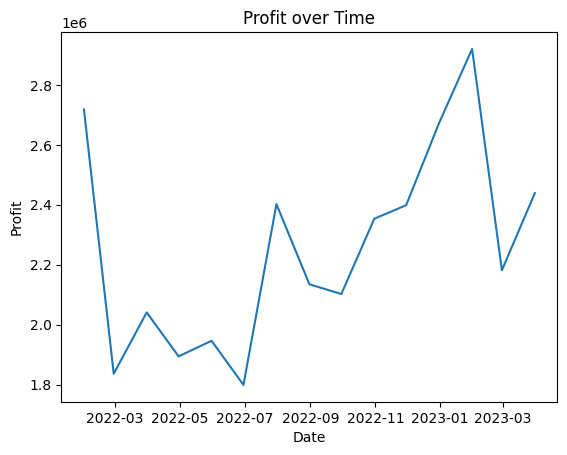

ADF Statistic: -2.8152102645830084
p-value: 0.05613372234800714
Critical Values: {'1%': -4.01203360058309, '5%': -3.1041838775510207, '10%': -2.6909873469387753}


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Mean Squared Error: 4838171921403.722


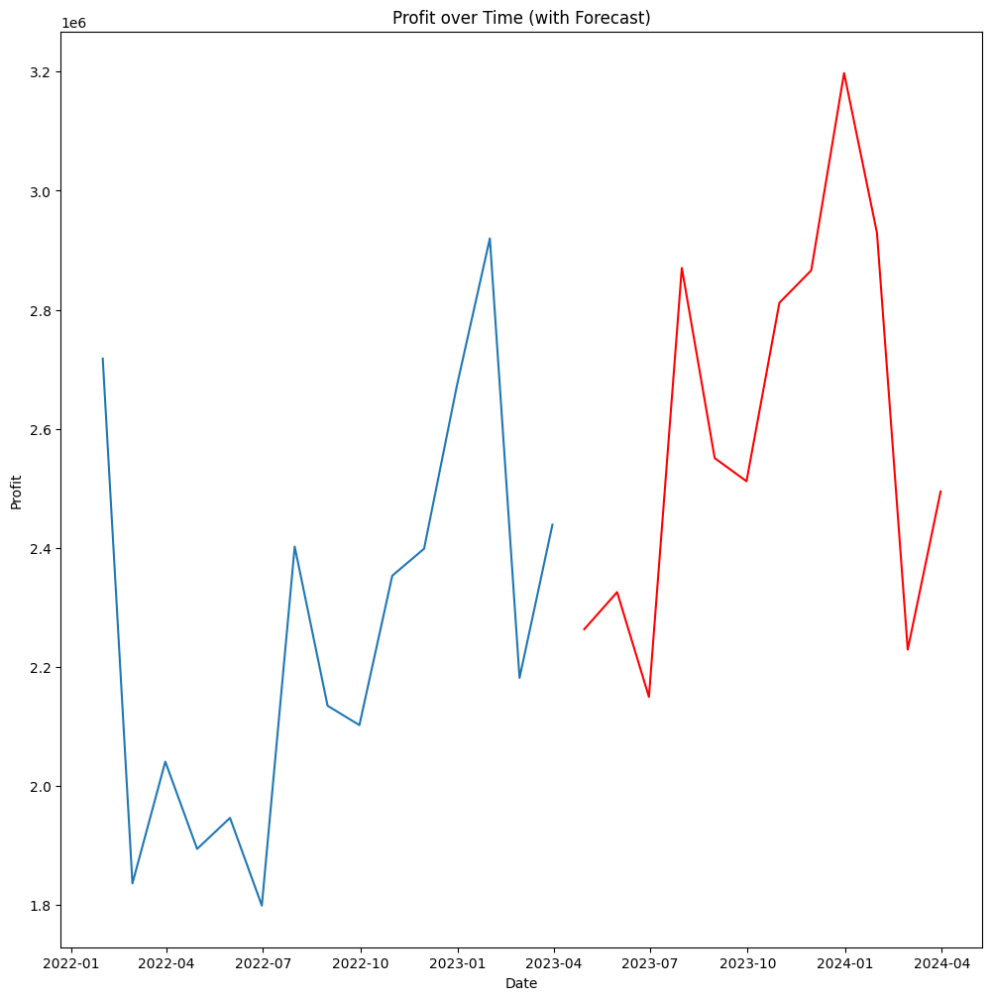

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.statespace.sarimax import SARIMAX

gol_df = df[(df['EMPRESA_NOME']=='GOL LINHAS AÉREAS S.A. (EX- VRG LINHAS AÉREAS S.A.)') & (df['ANO']>2021) ].dropna()
coiso = gol_df[['ANO','MES','PASSAGEIROS_PAGOS']]

# Combine year and month columns into a datetime index
coiso['date'] = pd.to_datetime(coiso['ANO'].astype(str) + '-' + coiso['MES'].astype(str), format='%Y-%m')
coiso.set_index('date', inplace=True)

# Drop year and month columns
coiso.drop(['ANO', 'MES'], axis=1, inplace=True)

# Resample the data by month and plot
coiso_monthly = coiso.resample('M').sum()
plt.plot(coiso_monthly)
plt.xlabel('Date')
plt.ylabel('Profit')
plt.title('Profit over Time')
plt.show()

# Test for stationarity using the ADF test
result = adfuller(coiso_monthly['PASSAGEIROS_PAGOS'])
print('ADF Statistic:', result[0])
print('p-value:', result[1])
print('Critical Values:', result[4])

# If data is not stationary, apply transformations to make it stationary
coiso_monthly_diff = coiso_monthly.diff().dropna()

# Choose a suitable SARIMA model based on data analysis
model = SARIMAX(coiso_monthly['PASSAGEIROS_PAGOS'], order=(1, 0, 1), seasonal_order=(1, 1, 1, 12))
result = model.fit()

# Evaluate the performance of the model using MSE
mse = ((result.resid)**2).mean()
print('Mean Squared Error:', mse)

# Use the fitted model to make predictions for future time periods
future_periods = 12 # Change this value as needed
last_date = coiso_monthly.index[-1]
forecast_index = pd.date_range(last_date, periods=future_periods+1, freq='MS')[1:]
exog_forecast = np.zeros((future_periods, 1)) # Replace with relevant exogenous variables
forecast = result.forecast(steps=future_periods, exog=exog_forecast)
forecast_df = pd.DataFrame(forecast, index=forecast_index, columns=['PASSAGEIROS_PAGOS'])

# Plot the original data and the forecasted data
plt.figure(figsize=(12, 12))
plt.plot(coiso_monthly)
plt.plot(forecast, color='r')
plt.xlabel('Date')
plt.ylabel('Profit')
plt.title('Profit over Time (with Forecast)')
plt.show()


In [ ]:
forecast

2023-04-30    2.263349e+06
2023-05-31    2.325654e+06
2023-06-30    2.149697e+06
2023-07-31    2.870240e+06
2023-08-31    2.550800e+06
2023-09-30    2.511912e+06
2023-10-31    2.811819e+06
2023-11-30    2.866088e+06
2023-12-31    3.197613e+06
2024-01-31    2.929246e+06
2024-02-29    2.229121e+06
2024-03-31    2.494635e+06
Freq: M, Name: predicted_mean, dtype: float64

In [ ]:
data = df
data['rotas'] = data['AEROPORTO_DE_ORIGEM_NOME']+ "-" +data['AEROPORTO_DE_DESTINO_NOME']
rj_gru = data[data['rotas'] == 'RIO DE JANEIRO-GUARULHOS']

gol_df = rj_gru[(rj_gru['EMPRESA_NOME']=='TAM LINHAS AÉREAS S.A.') & (rj_gru['ANO']>2021)].dropna()
coiso = gol_df[['ANO','MES','PASSAGEIROS_PAGOS']]

<ipython-input-41-a1f73aaf648c>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  coiso['date'] = pd.to_datetime(coiso['ANO'].astype(str) + '-' + coiso['MES'].astype(str), format='%Y-%m')
<ipython-input-41-a1f73aaf648c>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  coiso.drop(['ANO', 'MES'], axis=1, inplace=True)


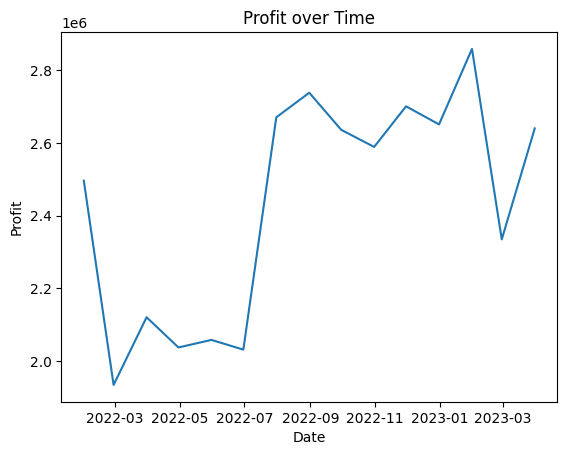

ADF Statistic: -1.794787591561766
p-value: 0.3830525632531077
Critical Values: {'1%': -4.01203360058309, '5%': -3.1041838775510207, '10%': -2.6909873469387753}


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Mean Squared Error: 5662631547381.486


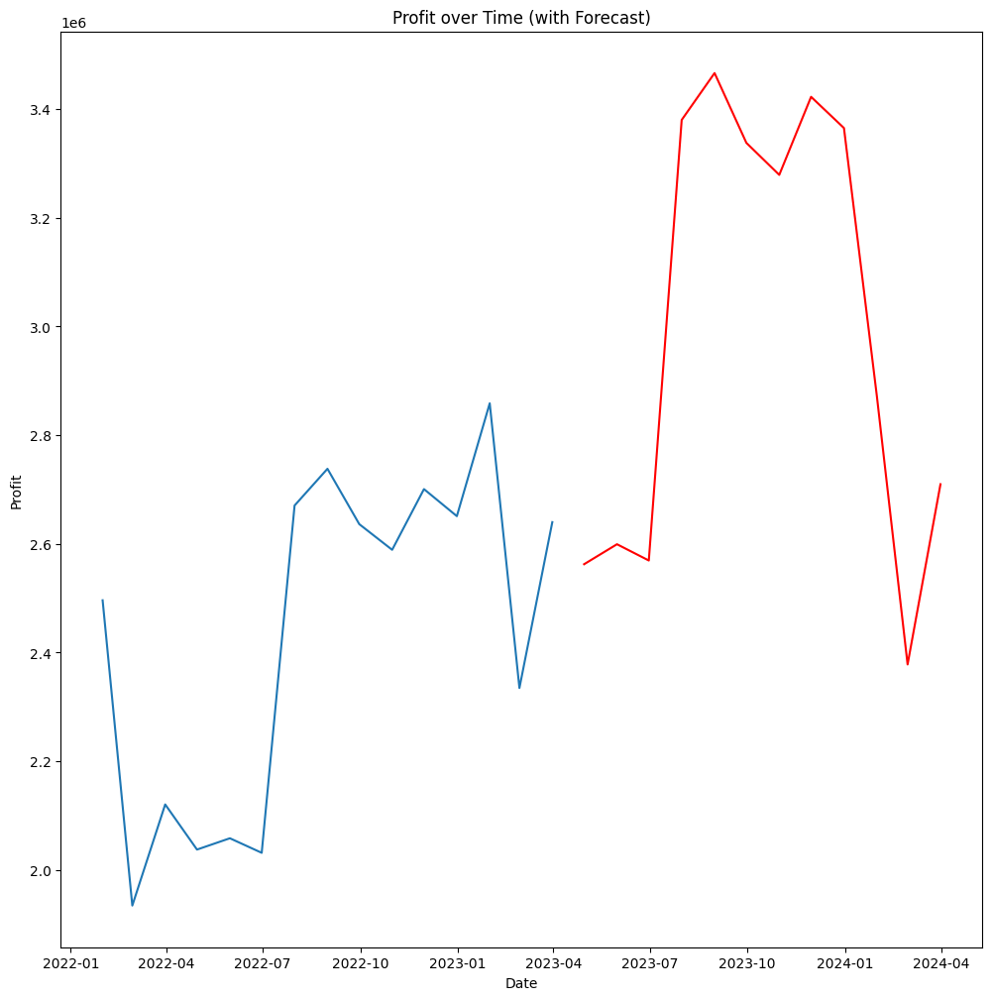

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.statespace.sarimax import SARIMAX

gol_df = df[(df['EMPRESA_NOME']=='TAM LINHAS AÉREAS S.A.') & (df['ANO']>2021) ].dropna()
coiso = gol_df[['ANO','MES','PASSAGEIROS_PAGOS']]

# Combine year and month columns into a datetime index
coiso['date'] = pd.to_datetime(coiso['ANO'].astype(str) + '-' + coiso['MES'].astype(str), format='%Y-%m')
coiso.set_index('date', inplace=True)

# Drop year and month columns
coiso.drop(['ANO', 'MES'], axis=1, inplace=True)

# Resample the data by month and plot
coiso_monthly = coiso.resample('M').sum()
plt.plot(coiso_monthly)
plt.xlabel('Date')
plt.ylabel('Profit')
plt.title('Profit over Time')
plt.show()

# Test for stationarity using the ADF test
result = adfuller(coiso_monthly['PASSAGEIROS_PAGOS'])
print('ADF Statistic:', result[0])
print('p-value:', result[1])
print('Critical Values:', result[4])

# If data is not stationary, apply transformations to make it stationary
coiso_monthly_diff = coiso_monthly.diff().dropna()

# Choose a suitable SARIMA model based on data analysis
model = SARIMAX(coiso_monthly['PASSAGEIROS_PAGOS'], order=(1, 0, 1), seasonal_order=(1, 1, 1, 12))
result = model.fit()

# Evaluate the performance of the model using MSE
mse = ((result.resid)**2).mean()
print('Mean Squared Error:', mse)

# Use the fitted model to make predictions for future time periods
future_periods = 12 # Change this value as needed
last_date = coiso_monthly.index[-1]
forecast_index = pd.date_range(last_date, periods=future_periods+1, freq='MS')[1:]
exog_forecast = np.zeros((future_periods, 1)) # Replace with relevant exogenous variables
forecast = result.forecast(steps=future_periods, exog=exog_forecast)
forecast_df = pd.DataFrame(forecast, index=forecast_index, columns=['PASSAGEIROS_PAGOS'])

# Plot the original data and the forecasted data
plt.figure(figsize=(12, 12))
plt.plot(coiso_monthly)
plt.plot(forecast, color='r')
plt.xlabel('Date')
plt.ylabel('Profit')
plt.title('Profit over Time (with Forecast)')
plt.show()


In [ ]:
forecast

2023-04-30    2.562560e+06
2023-05-31    2.599291e+06
2023-06-30    2.569375e+06
2023-07-31    3.380182e+06
2023-08-31    3.466428e+06
2023-09-30    3.337949e+06
2023-10-31    3.279061e+06
2023-11-30    3.422686e+06
2023-12-31    3.365254e+06
2024-01-31    2.872254e+06
2024-02-29    2.378107e+06
2024-03-31    2.709732e+06
Freq: M, Name: predicted_mean, dtype: float64

Compsrando TAM e GOL vemos que a TAM manterá as vendas mais altas em relação à GOL.

TAM:
- 2023-04-30: 2,562,560
- 2023-05-31: 2,599,291
- 2023-06-30: 2,569,375
- 2023-07-31: 3,380,182
- 2023-08-31: 3,466,428
- 2023-09-30: 3,337,949
- 2023-10-31: 3,279,061
- 2023-11-30: 3,422,686
- 2023-12-31: 3,365,254
- 2024-01-31: 2,872,254
- 2024-02-29: 2,378,107
- 2024-03-31: 2,709,732

GOL:

- 2023-04-30 -> 2,263,349
- 2023-05-31 -> 2,325,654
- 2023-06-30 -> 2,149,697
- 2023-07-31 -> 2,870,240
- 2023-08-31 -> 2,550,800
- 2023-09-30 -> 2,511,912
- 2023-10-31 -> 2,811,819
- 2023-11-30 -> 2,866,088
- 2023-12-31 -> 3,197,613
- 2024-01-31 -> 2,929,246
- 2024-02-29 -> 2,229,121
- 2024-03-31 -> 2,494,635

# **7) Comente e apresente os melhores insights que você encontrou no dataset.**

# **8) Deixa uma analise estatistica preparada para a apresentação.**

In [ ]:
data['rotas'].value_counts().sort_values()

ILHA DO SAL-BARCELONA               1
MARSEILLE-DAKAR                     1
DAKAR-FORTALEZA                     1
VÁRZEA GRANDE-CURITIBA              1
GUARULHOS-BROTAS                    1
                                 ... 
SÃO PAULO-RIO DE JANEIRO         3434
RIO DE JANEIRO-RIO DE JANEIRO    3524
RIO DE JANEIRO-SÃO PAULO         3873
GUARULHOS-RIO DE JANEIRO         5000
RIO DE JANEIRO-GUARULHOS         5807
Name: rotas, Length: 14389, dtype: int64

Neste dataset ficou comprovado que a ponte aérea mais movimentada fica entre os estados de Rio e São Paulo, que ocupam as top 5 posiçãoes de maior ocorrência das rotas.

In [ ]:
df['CARGA_PAGA_KG'].value_counts()

0.0         423530
1.0           3651
2.0           2141
10.0          1576
3.0           1557
             ...  
169017.0         1
418974.0         1
721864.0         1
58216.0          1
109936.0         1
Name: CARGA_PAGA_KG, Length: 124470, dtype: int64

In [ ]:
df['CARGA_GRATIS_KG'].value_counts()

0.0        761057
1.0          5813
2.0          3440
3.0          2395
5.0          2153
            ...  
7852.0          1
7629.0          1
6099.0          1
7698.0          1
11038.0         1
Name: CARGA_GRATIS_KG, Length: 12101, dtype: int64

In [ ]:
print(df['CARGA_GRATIS_KG'].sum())
print(df['CARGA_PAGA_KG'].sum())
print(df['CORREIO_KG'].sum())

225157640.0
23155815381.0
2233995651.0


In [ ]:
df['HORAS_VOADAS'] = df['HORAS_VOADAS'].str.replace(',', '.')
df['HORAS_VOADAS'] = pd.to_numeric(df['HORAS_VOADAS'])

In [ ]:
df[df['CARGA_PAGA_KG']>0]['HORAS_VOADAS'].sum()

37930809.786959

In [ ]:
df[df['PASSAGEIROS_PAGOS']>0]['HORAS_VOADAS'].sum()

40552366.18650301

Lembrando que as colunas de carga referem-se ao volume de Carga (kg) em cada quilômetro, ou seja, a soma do produto entre a quantia (kg) de carga e a distâncias das etapas.

Podemos concluir também que apesar da crescente popularizção do comércio eletrônico e a demanda por transporte e logística de para a obtenção de produtos a "carga"principal permanece sendo pessoas, isso devido ao fato de que o transporte aéreo é mais caro em comparação com outros meios de transporte. Devido às escalas diferentes de passageiros e carga é difícil comparar mas fica mais claro quando comparamos o tempo total de horas de voo